The `Grizli` pipeline allows you to fully reduce a given set of HST grism observations with essentially two steps:

* Run an archive query with [`hsaquery`](https://github.com/gbrammer/esa-hsaquery)

* Process the associations found with the query with `grizli.auto_script.go`.

Here, "association" usually simply means "any Hubble exposures that overlap" and doesn't require that all observations were taken with the same observing program, instrument, grism position angle, epoch, filter, etc.  The code does all of the exposure-level book-keeping and the products are drizzled image mosaics, extracted 1D and 2D grism spectra and fits to the spectra.

**NB**: The pipeline works fine with just imaging and no grism exposures!

In [1]:
#cell 1
%matplotlib inline

In [2]:
#cell 2
import glob
import time
import os

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import astropy.io.fits as pyfits
import drizzlepac

import grizli
from grizli.pipeline import auto_script 
from grizli import utils
from grizli import fitting
from grizli import multifit #original line, replaced by cell above 

utils.set_warnings()
print('\n Grizli version: ', grizli.__version__)

The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       imagefindpars           mapreg              photeq       
     pixreplace           pixtopix            pixtosky        refimagefindpars  
     resetbits          runastrodriz          skytopix           tweakback      
      tweakreg           updatenpol

 Grizli version:  0.8.0-45-g977ade9


In [3]:
#cell 3
#os.chdir('/Users/brammer/3DHST/Spectra/Work/Grizli/Demo-18.05.22/')
HOME_PATH = os.getcwd()
print('HOME_PATH = ', HOME_PATH)

HOME_PATH =  /data2/jrcooper/notebooks/reduction/EDisCS


## Query the HST archive ##

The `hsaquery` module can be used to programaticaly query the HST archive and find exposures from different programs (and instruments) that overlap on the sky.  The example below is tailored for a single pointing from a single program, but the query parameters can be expanded to search much more broadly for archival data.

In [4]:
#cell 4
### Generate a query for the WFC3/ERS grism data

## !! new query tools since ESA database changed in summer 2018
# https://github.com/gbrammer/mastquery
from mastquery import query, overlaps

# "parent" query is grism exposures in GO-11359.  Can also query the archive on position with
# box=[ra, dec, radius_in_arcmin]
parent = query.run_query(box=None, proposal_id=[12945], instruments=['WFC3/IR', 'ACS/WFC'], 
                         filters=['G102','G141'])

# ### "overlap" query finds anything that overlaps with the exposures 
# ### in the parent query
# extra = query.DEFAULT_EXTRA # ignore calibrations, etc.

# ## To match *just* the grism visits, add, e.g., the following:
# extra += ["TARGET.TARGET_NAME LIKE 'WFC3-ERSII-G01'"]

tabs = overlaps.find_overlaps(parent, buffer_arcmin=0.01, 
                              filters=['F105W', 'F814W','G102'], 
                              proposal_id=[12945], instruments=['WFC3/IR','WFC3/UVIS','ACS/WFC']) 
                              #,extra={'target_name':'CL1059-12.0'}, close=False)

Iter #1, N_Patch = 14


 0 j105908m1246 164.779 -12.773
target_name
-----------
CL1059-12.0 

filter j105908m1246         WFC3/IR F105W    1     811.7
filter j105908m1246          WFC3/IR G102    1    4711.7


 1 j105900m1253 164.747 -12.878
target_name
-----------
        ANY
CL1059-12.1 

filter j105900m1253         ACS/WFC F814W    1     460.0
filter j105900m1253         WFC3/IR F105W    1     811.7
filter j105900m1253          WFC3/IR G102    1    4711.7


 2 j105912m1254 164.794 -12.903
target_name
-----------
CL1059-12.2 

filter j105912m1254         WFC3/IR F105W    1     811.7
filter j105912m1254          WFC3/IR G102    1    4711.7


 3 j105836m1254 164.644 -12.893
target_name
-----------
CL1059-12.3 

filter j105836m1254         WFC3/IR F105W    1     811.7
filter j105836m1254          WFC3/IR G102    1    4711.7


 4 j113812m1134 174.554 -11.573
target_name
-----------
CL1138-11.0 

filter j113812m1134         WFC3/IR F105W    1     811.7
filter j113812m1134          WFC3/IR

In [5]:
#cell 5
# Summary of the tables you just generated
foot_files = glob.glob('j[02]*footprint.fits')
print('Footprint files: ', foot_files)

print('\n# id            ra         dec        e(b-v)   filters')
for tab in tabs:
    print('{0}  {1:.5f}  {2:.5f}   {3:.4f}   {4}'.format(tab.meta['NAME'], tab.meta['RA'], 
                                                 tab.meta['DEC'], tab.meta['MW_EBV'],
                                                  ','.join(np.unique(tab['filter']))))

Footprint files:  []

# id            ra         dec        e(b-v)   filters
j105908m1246  164.77900  -12.77300   0.0281   F105W,G102
j105900m1253  164.74700  -12.87800   0.0273   F105W,F814W,G102
j105912m1254  164.79400  -12.90300   0.0270   F105W,G102
j105836m1254  164.64400  -12.89300   0.0291   F105W,G102
j113812m1134  174.55400  -11.57300   0.0172   F105W,G102
j113848m1134  174.70000  -11.57500   0.0174   F105W,G102
j113736m1125  174.39300  -11.42300   0.0217   F105W,G102
j122756m1136  186.98400  -11.60300   0.0409   F105W,F814W,G102
j122752m1140  186.96700  -11.66100   0.0398   F105W,G102
j122816m1132  187.07100  -11.52800   0.0433   F105W,G102
j130132m1138  195.37900  -11.62600   0.0411   F105W,F814W,G102
j130120m1133  195.34100  -11.54500   0.0415   F105W,G102
j130132m1142  195.38900  -11.69800   0.0407   F105W,F814W,G102
j130100m1131  195.24700  -11.52100   0.0405   F105W,G102


In [6]:
#cell 6
#os.chdir('/Users/brammer/3DHST/Spectra/Work/Grizli/Demo-18.05.22/')
HOME_PATH = os.getcwd()
print('HOME_PATH = ', HOME_PATH)

HOME_PATH =  /data2/jrcooper/notebooks/reduction/EDisCS


# - Pipeline processing - #

** In principle, all of the steps outlined below can be executed with a single call to** `auto_script.go`, from fetching the data to extracting spectra and performing the redshift / line fits.  The processing steps been broken out individually here to show the processing at each step.

** The same pipeline can be used to process imaging-only fields.**  Simply run the queries as above to find the imaging exposures you want to processes and run everything the same way.  The pipeline steps related to the grism exposures will simply be skipped.

In [7]:
#cell 7
# Do everything for the query from fetching the data to generating the contamination model
HOME_PATH = os.getcwd()
print('HOME_PATH = ', HOME_PATH)

"CHANGE FILE DIRECTORY HERE"
root = 'j130132m1138'
IS_PARALLEL = False # Set to True for parallel programs like WISPS

if False:
    # This line would do everything below
    auto_script.go(root=root, maglim=[19,21], HOME_PATH=HOME_PATH, reprocess_parallel=True, 
                   s3_sync='cp', gaia_by_date=True, is_parallel_field=IS_PARALLEL, 
                   run_fit=False, only_preprocess=True, run_extractions=False)

HOME_PATH =  /data2/jrcooper/notebooks/reduction/EDisCS


# - Individual steps - #

## Fetch data from the HST archive ##
`Grizli` can automatically fetch HST data from the ESA Hubble Science archive (and, optionally, the Amazon S3 bucket).  The `fetch_files` script fetches the exposures listed in the archive query above.  It also fetches associated WFC3/IR persistence products from the persistence database.

The first time you run the script, a lot more information will be printed to the screen as the exposures are retrieved and the script runs the reprocessing code to flatten the IR backgrounds.  Below the "skip" message simply indicate that files have already been downloaded.

In [8]:
#cell 8 THIS TAKES A LONG TIME
### Fetch data, reprocess WFC3/IR for backgrounds, fetch WFC3/IR persistence productss

# If s3_sync, then sync from the Hubble Amazon S3 bucket with awscli, 
# otherwise get from the ESA archive.
os.chdir(HOME_PATH)

import grizli.pipeline
from grizli.pipeline import auto_script
# Is awscli available and connected? 
s3_status = os.system('aws s3 ls s3://stpubdata --request-payer requester')
if s3_status == 0:
    s3_sync='cp'  # As of late October 2018, 's3 sync' not working with 'stpubdata'
else:
    s3_sync=False # Fetch from ESA archive
    
auto_script.fetch_files(field_root=root, HOME_PATH=HOME_PATH, remove_bad=True, 
                        reprocess_parallel=True, s3_sync=s3_sync)

Calib: IDCTAB=iref$w3m18525i_idc.fits
/home/jrcooper/grizli/iref/w3m18525i_idc.fits exists
Calib: PFLTFILE=iref$u4m1335li_pfl.fits
/home/jrcooper/grizli/iref/u4m1335li_pfl.fits exists
Calib: NPOLFILE=N/A
Calib: IDCTAB=iref$w3m18525i_idc.fits
/home/jrcooper/grizli/iref/w3m18525i_idc.fits exists
Calib: PFLTFILE=iref$uc72113oi_pfl.fits
/home/jrcooper/grizli/iref/uc72113oi_pfl.fits exists
Calib: NPOLFILE=N/A
Calib: IDCTAB=jref$0461802dj_idc.fits
/home/jrcooper/grizli/jref/0461802dj_idc.fits exists
Calib: PFLTFILE=jref$qb12257pj_pfl.fits
/home/jrcooper/grizli/jref/qb12257pj_pfl.fits exists
Calib: NPOLFILE=jref$02c1450rj_npl.fits
/home/jrcooper/grizli/jref/02c1450rj_npl.fits exists
Calib: IDCTAB=iref$w3m18525i_idc.fits
/home/jrcooper/grizli/iref/w3m18525i_idc.fits exists
Calib: PFLTFILE=iref$u4m1335li_pfl.fits
/home/jrcooper/grizli/iref/u4m1335li_pfl.fits exists
Calib: NPOLFILE=N/A
Calib: IDCTAB=iref$w3m18525i_idc.fits
/home/jrcooper/grizli/iref/w3m18525i_idc.fits exists
Calib: PFLTFILE=iref

## Parse visit associations ##
`Grizli` builds its own associations based on anything it finds in the `RAW` directory.  Visits are usually defined in the exposure filenames.  For example, for the single exposure, `ib6o03ntq_flt.fits`, the characters `b6o` identify the observing program and the visit identifier  is `03`.  You can also build visits combining all exposures in a given filter taken at the same position angle, which can be useful for some programs executed in parallel where exposures taken at a similar time could have different visit IDs in the filename.  

**NB:** Generally one should process "visits" as groups of exposures in a given filter that were taken with a single guide star acquisition.  

The parsing script also associates grism exposures with corresponding direct images, based on the visit, exposure order and exposure footprints on the sky.

In [9]:
#cell 11
# Demo combining by PA / filter.  

# Here it actually gets a bit confused because multiple F098M exposures 
# were taken at the same PA but shouldn't be associated with the grism exposures.
os.chdir(os.path.join(HOME_PATH, root, 'Prep'))
visits, all_groups, info = auto_script.parse_visits(field_root=root, 
                                                    HOME_PATH=HOME_PATH, use_visit=True, 
                                                    combine_same_pa=True)

print('\n ====== \n')
for visit in visits:
    print('{0:30} {1:>2d}'.format(visit['product'], len(visit['files'])))

CL1301-11.0-c1b-11-136.0-F105W 4
CL1301-11.0-c1b-11-136.0-G102 4
jc1b15-c1b-15-308.0-F814W 4

 == Grism groups ==

ic1b-136.0-f105w 4 ic1b-136.0-g102 4


ic1b-136.0-f105w                4
ic1b-136.0-g102                 4
ic1b-308.0-f814w                4


In [10]:
#cell 12
######################
### Parse visit associations for most normal programs
os.chdir(os.path.join(HOME_PATH, root, 'Prep'))
visits, all_groups, info = auto_script.parse_visits(field_root=root, 
                                                    HOME_PATH=HOME_PATH, use_visit=True, 
                                                    combine_same_pa=IS_PARALLEL)

print('\n ====== \n')
for visit in visits:
    print('{0:30} {1:>2d}'.format(visit['product'], len(visit['files'])))

CL1301-11.0-c1b-11-136.0-F105W 4
CL1301-11.0-c1b-11-136.0-G102 4
jc1b15-c1b-15-308.0-F814W 4

 == Grism groups ==

cl1301-11.0-c1b-11-136.0-f105w 4 cl1301-11.0-c1b-11-136.0-g102 4


cl1301-11.0-c1b-11-136.0-f105w  4
cl1301-11.0-c1b-11-136.0-g102   4
jc1b15-c1b-15-308.0-f814w       4


## Master Pre-processing script: `grizli.prep.process_direct_grism_visit` ##

The `process_direct_grism_visit` script in [prep.py](https://github.com/gbrammer/grizli/blob/master/grizli/prep.py) provides one-stop-shopping for all of the preprocessing steps required.  This includes

* File handling (e.g., copying from `./RAW` to `./Prep/`)
* Astrometric registration
* Grism sky background subtraction & flat-fielding
* Extract visit-level catalogs and segmentation images from the direct imaging

The products of the script for a given direct/grism pair are 

* Aligned, background-subtracted FLTs
* Drizzled mosaics of direct & grism images

The script also runs on *imaging-only* visits, performing the background subtraction and astrometric alignment but skipping anything related to grism processing.

The `auto_script.preprocess` command below runs the processing script for the two direct/grism pairs of the ERS observations and for the overlapping imaging visits identified in the initial query.  It prints a bunch of information to the terminal, primarily from various runs of AstroDrizzle, and takes a few minutes to run per visit.  It only needs to be run once.

**NB** If you restart the pipeline after a previous run, it will skip preprocessing any visit where the file `{visit-product}_dr?_sci.fits` is found (i.e., the "Skip" messages below).  If you want to force reprocessing of a visit, delete that file.

In [11]:
#####################
### Alignment & mosaics    
os.chdir(os.path.join(HOME_PATH, root, 'Prep'))

# Alignment reference catalogs, searched in this order
catalogs = ['NSC', 'PS1','SDSS','GAIA','WISE'] 
# As of v0.8.0-8, can use the NOAO source catalog (NSC) here, which 
# is defined over much of the sky and appears to be well aligned to GAIA.  
# However, sometimes it's not clear how to apply the best quality control 
# to the NSC sources.  Here, for example, there seem to be a number of spurious 
# NSC sources that make the initial alignment RMS fairly high. 

# This script will do all the preprocessing of the grism *and* imaging visits 
# found in your archive query.
auto_script.preprocess(field_root=root, HOME_PATH=HOME_PATH, 
                       make_combined=False, catalogs=catalogs, use_visit=True)

0 cl1301-11.0-c1b-11-136.0-f105w 4 cl1301-11.0-c1b-11-136.0-g102 4
Skip cl1301-11.0-c1b-11-136.0-f105w
Skip cl1301-11.0-c1b-11-136.0-f105w
Skip jc1b15-c1b-15-308.0-f814w
Skip cl1301-11.0-c1b-11-136.0-g102
utils.fix_flt_nan: ic1b11l0q_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: ic1b11l5q_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qeq_flc.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qeq_flc.fits[SCI,2] NaNPixels=0
utils.fix_flt_nan: ic1b11llq_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: ic1b11l7q_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qtq_flc.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qtq_flc.fits[SCI,2] NaNPixels=0
utils.fix_flt_nan: jc1b15r0q_flc.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15r0q_flc.fits[SCI,2] NaNPixels=0
utils.fix_flt_nan: ic1b11kxq_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: ic1b11leq_flt.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qmq_flc.fits[SCI,1] NaNPixels=0
utils.fix_flt_nan: jc1b15qmq_flc.fits[SCI,2] NaNPixels

In [12]:
!ls wfc3*sci.fits # individual drizzled visits

ls: cannot access wfc3*sci.fits: No such file or directory


In [13]:
# Results of the intra-visit alignment.  
# Should be small as these are just FGS drift on a single guide star
!ls *shifts.log
print('')
!cat *shifts.log

cl1301-11.0-c1b-11-136.0-f105w_shifts.log  jc1b15-c1b-15-308.0-f814w_shifts.log

# flt xshift yshift rot scale N rmsx rmsy
# fit_order: -1
# match['ic1b11kxq_flt.fits'] = ['ic1b11l0q_flt.fits']
# match['ic1b11l5q_flt.fits'] = ['ic1b11l7q_flt.fits']
# match['ic1b11lcq_flt.fits'] = ['ic1b11leq_flt.fits']
# match['ic1b11ljq_flt.fits'] = ['ic1b11llq_flt.fits']
ic1b11kxq_flt.fits  -0.000  -0.000  0.00000  1.00000    50  0.000  0.000
ic1b11l5q_flt.fits   0.014   0.034  0.00000  1.00000    45  0.048  0.074
ic1b11lcq_flt.fits   0.006   0.016  0.00000  1.00000    30  0.045  0.075
ic1b11ljq_flt.fits   0.014   0.055  0.00000  1.00000    44  0.033  0.054
# flt xshift yshift rot scale N rmsx rmsy
# fit_order: -1
# match['jc1b15qeq_flc.fits'] = []
# match['jc1b15qmq_flc.fits'] = []
# match['jc1b15qtq_flc.fits'] = []
# match['jc1b15r0q_flc.fits'] = []
jc1b15qeq_flc.fits   0.000  -0.000  0.00000  1.00000    50  0.000  0.000
jc1b15qmq_flc.fits   0.021   0.060  0.00000  1.00000    44  0.108  0.074
jc1b1

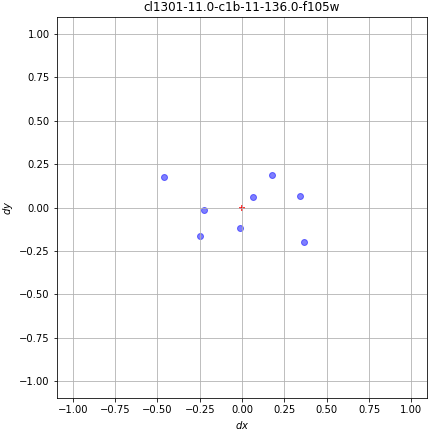

In [14]:
# Show the alignment w.r.t the external NOAO Source Catalog (NSC)
Image(filename = "./cl1301-11.0-c1b-11-136.0-f105w_wcs.png") 


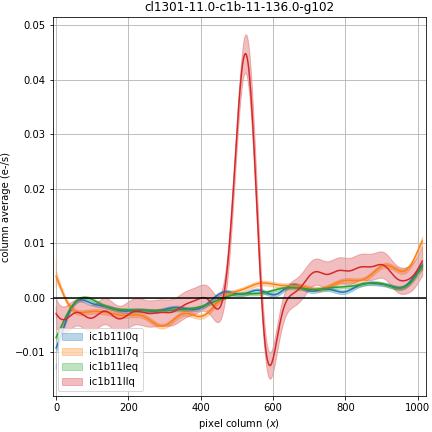

In [15]:
# Show the alignment of one HST visit to another, note tight 
# plot range compared to previous
Image(filename = "./cl1301-11.0-c1b-11-136.0-g102_column.png") 

In [16]:
# Check wcs.log files that a few objects were found, no large rotations
# and rms (second to last column) isn't too large

# Here, the F098M/G102 visit was the first processed and was aligned 
# to the NSC, with RMS~0.8 WFC3/IR pix.  Subsequent visits are aligned to 
# previously processed HST visits so that at least the relative HST astrometry
# is as good as possible.  Here, the F140W/G141 visit was run second and was 
# therefore aligned to F098M, resulting in much better precision than with the
# external catalog (RMS < 0.1 pix).

# Cat wcs.log files in order they were generated
!grep " 0 " `ls -ltr *wcs.log | awk '{print $9}'` | sed "s/  */ /g"

# columns: 
# "visit"  0  xshift yshift rot scale rms N

cl1301-11.0-c1b-11-136.0-f105w_wcs.log: 0 -1.7968 0.8152 0.0002 1.00014 0.156 8
jc1b15-c1b-15-308.0-f814w_wcs.log: 0 -0.2045 11.6090 0.0106 0.99989 0.152 8


### Alignment failures ###

The main failure mode of the `auto_script.preprocess` script is failure to compute a reliable alignment to the external reference.  This can happen, e.g., if there are not enough alignment sources (i.e., zero) within the field of view or if the original astrometry of the exposures obtained from the archive is offset from the reference by more than ~10 pixels.  This can almost always be remedied by running `grizli.pipeline.auto_script.manual_alignment` after the files have been fetched, which prompts the user to interactively mark sources in the image and reference catalog using DS9.

In [17]:
if False: # Don't run
    catalogs = ['PS1','SDSS','GAIA','WISE']
    auto_script.manual_alignment(field_root=root, HOME_PATH=HOME_PATH, skip=True, 
                                 catalogs=catalogs, radius=15, visit_list=None)

### Grism sky subtraction ###

The grism sky backgrounds are subtracted using the "Master sky" images from [Brammer, Ryan, & Pirzkal 2015](http://www.stsci.edu/hst/wfc3/documents/ISRs/WFC3-2015-17.pdf) (available [here](http://www.stsci.edu/hst/wfc3/analysis/grism_obs/calibrations/wfc3_grism_master_sky.html)).  

`Grizli` ignores any wavelength dependence of the flat-field and applies a grey correction using the F140W (F105W) flat-field for the G141 (G102) grisms.

Residuals after subtracting the master sky images are typically of order 0.005 e-/s, just 0.5-1% overall background level.  They are removed by subtracting a column-average of the sky pixels in the grism exposures, and the processing script produces a diagnostic figure like the one shown below.  The source of the residuals is still unclear (e.g., perhaps spectra of objects near/below the detection limit).  Though they are usually well removed by the column average, they do make extracting continuum spectra of faint sources challenging.

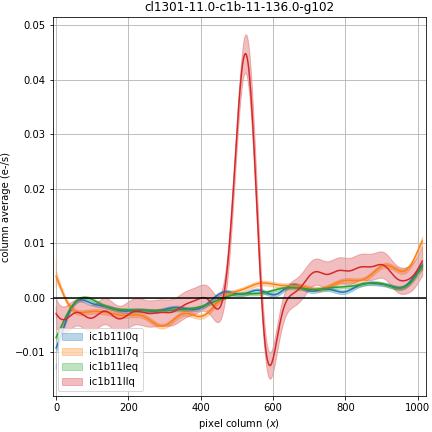

In [18]:
from IPython.display import Image
Image(filename = "./cl1301-11.0-c1b-11-136.0-g102_column.png", width=600, height=600)

### Fine alignment to GAIA DR2 ###

The initial visit alignment scripts often show small drifts such that the differen't visits don't perfectly overlap.  The script below performs an additional realignment to the visits internally and also to an external reference, usually GAIA DR2.

In [19]:
# Fine alignment of the visits relative to each other and absolute to GAIA DR2
if len(glob.glob('{0}*fine.png'.format(root))) == 0:
    fine_catalogs = ['GAIA','PS1','SDSS','WISE']
    out = auto_script.fine_alignment(field_root=root, HOME_PATH=HOME_PATH, 
                                     min_overlap=0.2, stopme=False, ref_err=0.08, 
                                     catalogs=fine_catalogs, NITER=1, maglim=[17,23],
                                     shift_only=True, method='Powell', redrizzle=False, 
                                     radius=10, program_str=None, match_str=[], 
                                     gaia_by_date=True)

    # Update headers with the result from the fine alignment
    # Original FLTs are archived to FineBkup
    auto_script.update_wcs_headers_with_fine(root)
    
visits, res = np.load('{0}_fine.npy'.format(root))
shifts = res.x.reshape((-1,2))/10.
for i, visit in enumerate(visits):
    print('{0:35}  {1:6.2f}  {2:6.2f}'.format(visit['product'], shifts[i,0], shifts[i,1]))

cl1301-11.0-c1b-11-136.0-f105w        -0.15    0.10
jc1b15-c1b-15-308.0-f814w             -0.37   -0.05


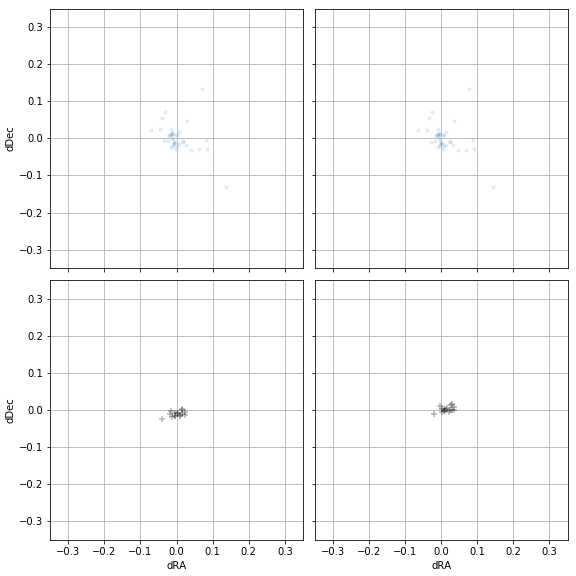

In [20]:
# Show the results of fine alignment.  
# Top panels are alignment between the visits.  + in the bottom panels are 
# residuals of the external reference, here GAIA DR2.
#
# Small drift between individual visits removed.  
# Fairly large GAIA offsets probably due to ~6 years between 
# WFC3/ERS and GAIA epoch 2015.5.
Image(filename='{0}_fine.png'.format(root))

## Make combined mosaics for each available filter ##

These are used to generate a photometric catalog and also for the direct image reference for the grism

In [21]:
# Drizzle mosaics in each filter and combine all IR filters
combine_all_filters=True
if len(glob.glob('{0}-ir_dr?_sci.fits'.format(root))) == 0:

    ## Mosaic WCS
    wcs_ref_file = '{0}_wcs-ref.fits'.format(root)
    if not os.path.exists(wcs_ref_file):
        auto_script.make_reference_wcs(info, output=wcs_ref_file, 
                           filters=['G800L', 'G102', 'G141'], 
                           pad_reference=90, pixel_scale=None,
                           get_hdu=True)

    # All combined
    IR_filters = ['F105W', 'F110W', 'F125W', 'F140W', 'F160W', 
                  'F098M', 'F139M', 'F127M', 'F153M']

    optical_filters = ['F814W', 'F606W', 'F435W', 'F850LP', 'F702W', 'F555W', 'F438W', 'F475W', 'F625W', 'F775W', 'F225W', 'F275W', 'F300W', 'F390W']

    if combine_all_filters:
        auto_script.drizzle_overlaps(root, 
                                 filters=IR_filters+optical_filters, 
                                 min_nexp=1, 
                                 make_combined=True,
                                 ref_image=wcs_ref_file,
                                 drizzle_filters=False) 

    ## IR filters
    auto_script.drizzle_overlaps(root, filters=IR_filters, 
                                 min_nexp=1, 
                                 make_combined=(not combine_all_filters),
                                 ref_image=wcs_ref_file) 

    # Fill IR filter mosaics with scaled combined data so they can be used 
    # as grism reference
    auto_script.fill_filter_mosaics(root)

    ## Optical filters

    mosaics = glob.glob('{0}-ir_dr?_sci.fits'.format(root))

    auto_script.drizzle_overlaps(root, filters=optical_filters,
        make_combined=(len(mosaics) == 0), ref_image=wcs_ref_file,
        min_nexp=2) 

In [22]:
!ls -1 j*_dr?_sci.fits

j130132m1138-f105w_drz_sci.fits
j130132m1138-f814w_drc_sci.fits
j130132m1138-ir_drc_sci.fits
jc1b15-c1b-15-308.0-f814w_drc_sci.fits


## Generate a photometric catalog ##

Run source detection on the combined mosaic `{root}-ir_dr[cz]_sci.fits` and generates a catalog and segmentation image.  

Then perform simple matched-aperture photometry on the different available filter mosaics (in this case F098M and F140W from the direct imaging).  In principle the template fitting code shown below can incorporate this photometric information, though that's not currently done by default.

In [23]:
## Run SEP (~SExtractor clone) catalog on the "ir" combined image
## and generate a photometric catalog with aperture photometry in all available bands
if not os.path.exists('{0}_phot.fits'.format(root)):
    get_background=False # SExtractor background subtraction
    tab = auto_script.multiband_catalog(field_root=root, threshold=1.8,
                                        detection_background=get_background,
                                        photometry_background=get_background) 
    
files = glob.glob('{0}-ir*'.format(root)) + glob.glob('*phot*fits')
for file in files:
    print(file)
    
phot = utils.GTable.gread('{0}_phot.fits'.format(root))
print('{0}Metadata{0}'.format('\n'+'='*20+'\n'))
for k in phot.meta:
    print('{0}:\t{1}'.format(k, phot.meta[k]))

j130132m1138-ir_drc_wht.fits
j130132m1138-ir_seg.fits
j130132m1138-ir.cat.fits
j130132m1138-ir_bkg.fits
j130132m1138-ir_drc_sci.fits
j130132m1138_phot.fits

Metadata

MINAREA:	5
CLEAN:	True
DEBCONT:	0.005
DEBTHRSH:	32
FILTER_TYPE:	conv
THRESHOLD:	1.8
ZP:	26.26887001774306
PLAM:	10551.047
FNU:	1.1283712e-07
FLAM:	3.0386574e-20
UJY2DN:	8.861796202091552
DRZ_FILE:	j130132m1138-ir_drc_sci.fits
WHT_FILE:	j130132m1138-ir_drc_wht.fits
GET_BACK:	False
ERR_SCALE:	0.8981928825378418
APER_0:	6.00000000000013
ASEC_0:	0.36
APER_1:	8.33500000000018
ASEC_1:	0.5001
APER_2:	16.33700000000036
ASEC_2:	0.9802200000000001
APER_3:	20.00000000000043
ASEC_3:	1.2
F105W_ZP:	26.26887001774306
F105W_PLAM:	10551.047
F105W_FNU:	1.1283712e-07
F105W_FLAM:	3.0386574e-20
F105W_uJy2dn:	8.861796202091552
F105W_DRZ_FILE:	j130132m1138-f105w_drz_sci.fits
F105W_WHT_FILE:	j130132m1138-f105w_drz_wht.fits
F105W_GET_BACK:	False
F105W_ERR_SCALE:	0.5147581696510315
F105W_aper_0:	6.00000000000013
F105W_asec_0:	0.36
F105W_aper_1:	8.

In [24]:
phot[:2].show_in_notebook()

idx,thresh,npix,tnpix,xmin,xmax,ymin,ymax,x_image,y_image,x2_image,y2_image,xy_image,errx2,erry2,errxy,a_image,b_image,theta_image,cxx_image,cyy_image,cxy_image,cflux,flux,cpeak,peak,xcpeak,ycpeak,xpeak,ypeak,flag,number,ra,dec,x_world,y_world,flux_auto,fluxerr_auto,flux_bkg_auto,mag_auto_raw,magerr_auto_raw,mag_auto,magerr_auto,kron_radius,kron_flag,kron_flux_flag,flux_radius,flux_radius_90,flux_aper_0,fluxerr_aper_0,flag_aper_0,bkg_aper_0,mask_aper_0,flux_aper_1,fluxerr_aper_1,flag_aper_1,bkg_aper_1,mask_aper_1,flux_aper_2,fluxerr_aper_2,flag_aper_2,bkg_aper_2,mask_aper_2,flux_aper_3,fluxerr_aper_3,flag_aper_3,bkg_aper_3,mask_aper_3,mag_iso,f105w_flux_aper_0,f105w_fluxerr_aper_0,f105w_flag_aper_0,f105w_bkg_aper_0,f105w_mask_aper_0,f105w_flux_aper_1,f105w_fluxerr_aper_1,f105w_flag_aper_1,f105w_bkg_aper_1,f105w_mask_aper_1,f105w_flux_aper_2,f105w_fluxerr_aper_2,f105w_flag_aper_2,f105w_bkg_aper_2,f105w_mask_aper_2,f105w_flux_aper_3,f105w_fluxerr_aper_3,f105w_flag_aper_3,f105w_bkg_aper_3,f105w_mask_aper_3,f814w_flux_aper_0,f814w_fluxerr_aper_0,f814w_flag_aper_0,f814w_bkg_aper_0,f814w_mask_aper_0,f814w_flux_aper_1,f814w_fluxerr_aper_1,f814w_flag_aper_1,f814w_bkg_aper_1,f814w_mask_aper_1,f814w_flux_aper_2,f814w_fluxerr_aper_2,f814w_flag_aper_2,f814w_bkg_aper_2,f814w_mask_aper_2,f814w_flux_aper_3,f814w_fluxerr_aper_3,f814w_flag_aper_3,f814w_bkg_aper_3,f814w_mask_aper_3
,,,,,,,,,,,,,,,,,,,,,,uJy,uJy,uJy,uJy,,,,,,,deg,deg,deg,deg,uJy,uJy,,,,,,pix,,,pix,pix,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,,uJy,uJy,,,
0,0.04289570078253746,98,92,1763,1775,1512,1525,1770.024456059755,1519.2359533132803,6.423054181144245,6.67523999770539,1.2205857844487085,0.0070445249812675775,0.00802777608890196,0.001625232684851225,2.7885890007019043,2.306960344314575,0.8368682265281677,0.16129378974437714,0.15520022809505463,-0.05898601561784744,1.1757571342079827,1.2366377579889372,0.02431427539561914,0.030208270824172788,1769,1518,1769,1517,0,1,195.39472255045484,-11.641708350756256,195.39472255045484,-11.641708350756256,3.584543621357591,0.17746468630237722,0.0,22.513980947755915,0.053752961419272806,22.513980947755915,0.053752961419272806,7.128461692577622,0,0,8.095355298407537,16.245405663139522,0.615549767705325,0.022906008840110657,0,0.0,0.0,0.9231806423617682,0.031522776329466554,0,0.0,0.0,1.8073744204120348,0.06489937351925028,0,0.0,0.3600000000000001,2.144715018494908,0.08755232117180416,0,0.0,2.0,23.66939374354179,0.615549767705325,0.013987688269774944,0,0.0,0.0,0.9231806423617682,0.019009314550243354,0,0.0,0.0,1.8073744204120348,0.03810358928896741,0,0.0,0.3600000000000001,2.144715018494908,0.05097995530731403,0,0.0,2.0,0.0,0.0,0,0.0,28.239999999999995,0.0,0.0,0,0.0,54.60000000000001,0.0,0.0,0,0.0,209.44,0.0,0.0,0,0.0,314.0800000000001
1,0.059612590819597244,60,52,1536,1547,1526,1534,1542.7118584322716,1531.4628257181878,5.8177378043474945,3.1965917030975675,0.8818190553879788,0.013505894156928266,0.006540814572748721,0.00206810056278014,2.4671413898468018,1.7110062837600708,0.2961355745792389,0.17938901484012604,0.32648470997810364,-0.09897332638502121,0.658773754807685,0.7061812936567766,0.018334857793891397,0.031168060849376848,1541,1530,1542,1530,0,2,195.39859065162136,-11.6415043382959,195.39859065162136,-11.6415043382959,2.1146793778871706,0.257146512901325,0.0,23.086954296987766,0.13202629292352633,23.086954296987766,0.13202629292352633,7.010176838364773,0,0,6.543471863193515,13.321853907132503,0.4434464352645839,0.02167766888545967,0,0.0,0.0,0.6790851171871186,0.10171293396144482,0,0.0,0.0,1.315595190200999,0.22481282014102374,0,0.0,0.0,1.5524550886492292,0.23259164194400211,0,0.0,0.0,24.27770947708962,0.4434464352645839,0.013082326121256772,0,0.0,0.0,0.6797270871573257,0.05855045845400758,0,0.0,0.0,1.311439127642869,0.12917660295853073,0,0.0,0.0,1.5482990260910992,0.1336570665756284,0,0.0,0.0,0.0,0.0,0,0.0,28.360000000000003,0.0,0.0,0,0.0,54.83999999999999

## Building the grism exposure container: `multifit.GroupFLT` ##

With the preprocessing done, we can now start on the analysis of the spectra.  `Grizli` is built around low-level tools for modeling and analyzing each individual grism exposure individually.  Though once multiple exposures are available (e.g., exposures within a visit or separate visits with different grisms and/or orients) the information from each can be combined for analyzing the spectrum of a given object.  A benefit of the exposure-level processing is that all of the model-to-data comparisons (i.e. chi-squared) are done in the space of the original detector pixels, with their well-calibrated and well-understood noise properties.

The `GroupFLT` class provides a container for processing multiple FLT exposures simultanously.

### Inputs ###
* `grism_files` = list of grism exposure filenames
* `direct_files` = (optional) list of direct exposure filenames
* `ref_file` = (optional) reference direct image mosaic (one or the other of `ref_file` or `direct_files` should be specified.)
* `seg_file`, `catalog` = segmentation image and catalog, usually generated with SExtractor
* `cpu_count` = set to > 0 for parallel processing
* `pad` parameter (default=200 pixels).  If set, then add padding around the FLTs to enable modeling of objects that would fall off of the direct image but that still disperse spectra onto the grism exposure (assuming they fall in the `ref_file` and `seg_file` mosaics).

The contents of the `grism_files` list can contain pretty much anything, with the result limited by memory / cpu power.  For example, you can provide a list of **all** 112 of the 3D-HST G141 exposures in the COSMOS field (4 exposures x 28 pointings), along with the field mosaic and segmentation images.  This example is actually fairly easy to process as individual objects will fall in typically 4, perhaps 8 individual exposures in some overlap areas.  Another example is a list of exposures from multiple instruments / grisms / orients of a single field, thought the subsequent fits can be slow if an object has spectra in many individual exposures.

Reference images are blotted to the distorted exposure frame with `AstroDrizzle.ablot`.   Messages go by, as below, when you load the `GroupFLT` object talking about "cutouts" because the script tries to make smaller cutouts of large reference images to speed up the blot processing.

**NB** Seems to often have memory leak problems if `seg_file` isn't significantly larger than the footprint of a given FLT file.  Drizzle `blot` segfaults out but the script just hangs since the multiprocessing threads don't get the message.

### Flat continuum model ###

Once the `GroupFLT` object is initialized, compute a first-pass model of the full detector field of view assuming simple linear continua for all objects in the field (brighter than `mag_limit`).  By default this assumes a somewhat blue continuum suitable for the Rayleigh-Jeans tail of low-redshift objects.  It's far from perfect but the initial model does provide a good way of at least identifying which pixels of a given object could be contaminated by neighbors, even if the quantitative model is not precise.

### Refined polynomial continuum model ###

After computing the simple continuum model, refine the model spectra for brighter objects using higher-order polynomials fit directly to the spectra themselves.  The `refine_list` method marches through objects starting with the brightest and fits a polynomial of order `poly_order` to the observed spectrum after subtracting off the model for contaminants.  Note that if the list of grism exposures contained multiple orientations covering a single field, this fit can be well constrained even in the presence of contamination.

The `grism_prep` script iterates on the refined polynomial model `refine_niter` times.

### Save state ###

You can optionally dump saved data (i.e., `grp.save_full_data()`) for fast restart and avoid recomputing the contamination models, for example in a new Python session.  This can be done at any time after you've made changes to the GroupFLT data that you'd like to store for later.  The `grism_prep` script does this automatically.

In [25]:
files = glob.glob('*GrismFLT.fits')
if len(files) == 0:
    ### Grism contamination model
    os.chdir(os.path.join(HOME_PATH, root, 'Prep'))

    # Which filter to use as direct image?  Will try in order of the list until a match is found.
    gris_ref = {'G141': ['F140W', 'F160W'], 
                'G102': ['F105W', 'F098M', 'F110W']}

    x = auto_script.grism_prep(field_root=root, refine_niter=3,
                                 gris_ref_filters=gris_ref)

    grp = multifit.GroupFLT(grism_files=glob.glob('*GrismFLT.fits'), 
                            catalog='{0}-ir.cat.fits'.format(root), 
                            cpu_count=-1, sci_extn=1, pad=256)
    
else:
    grp = multifit.GroupFLT(grism_files=glob.glob('*GrismFLT.fits'), 
                            catalog='{0}-ir.cat.fits'.format(root), 
                            cpu_count=-1, sci_extn=1, pad=256)

Load ic1b11leq.01.GrismFLT.fits!
Load ic1b11l0q.01.GrismFLT.fits!
Load ic1b11l7q.01.GrismFLT.fits!
Load ic1b11llq.01.GrismFLT.fits!
Files loaded - 4.21 sec.


### The final contamination model ###

IndexError: list index out of range

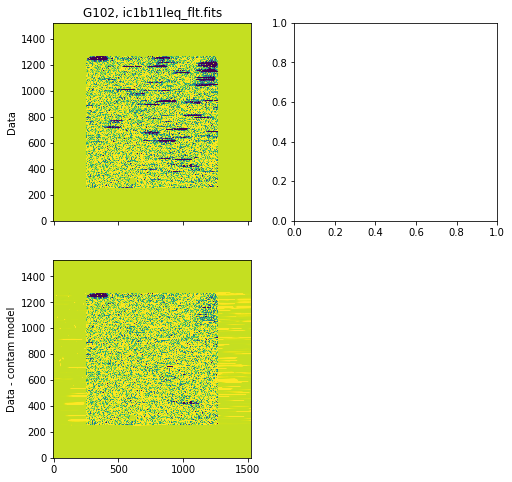

In [26]:
# Show the results of the contamination model
### Show FLT residuals
cmap = 'viridis_r'
vm = [-0.01, 0.1]

fig = plt.figure(figsize=[8,8])
ax = fig.add_subplot(221)
flt = grp.FLTs[0] # G102

ax.imshow(flt.grism['SCI'], vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')
ax.set_title('{0}, {1}'.format(flt.grism.filter, flt.grism.parent_file))
ax.set_xticklabels([])
ax.set_ylabel('Data')

ax = fig.add_subplot(223)
ax.imshow(flt.grism['SCI'] - flt.model, vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')

ax.set_ylabel('Data - contam model')

ax = fig.add_subplot(222)
flt = grp.FLTs[4] # G141

ax.imshow(flt.grism['SCI'], vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')
ax.set_title('{0}, {1}'.format(flt.grism.filter, flt.grism.parent_file))
ax.set_xticklabels([]); ax.set_yticklabels([])

ax = fig.add_subplot(224)
ax.imshow(flt.grism['SCI'] - flt.model, vmin=vm[0], vmax=vm[1], cmap=cmap,
          interpolation='Nearest', origin='lower')

ax.set_yticklabels([])

for ax in fig.axes:
    ax.set_xlim(510,790); ax.set_ylim(610,890)

fig.tight_layout(pad=1)

### Parameters for object fitting
### Read in matched catalog

In [28]:
h = open('/data2/jrcooper/notebooks/reduction/EDisCS/j130132m1138/Extractions/b_LDP_q.txt', 'r')
lines = h.readlines()[1:]
h.close()   
z_LDP       = []  
id_HST      = []   
ra_HST      = []
dec_HST     = [] 

for line in lines: 
    a = line.split()     
    z_LDP.append(float(a[3]))
    ra_HST.append(float(a[1]))
    dec_HST.append(float(a[2]))



z_LDP     = np.array(z_LDP)
ra_HST    = np.array(ra_HST)
dec_HST   = np.array(dec_HST)
id_HST     = np.array(id_HST) 


In [29]:
#### Store fit parameters to `fit_args.npy` for batch-mode processing

# Drizzle parameters for line maps
pline = auto_script.DITHERED_PLINE
#print(pline) 

sig = 0.007 
z = np.arange(0,2,.001)
for i in z_LDP:
    p_z = np.exp(-(z - i)**2/(2*sig**2))/((2*np.pi)**0.5/sig)

spec_prior = [z,p_z]
tuple
a = tuple(spec_prior)

# Generate the parameter dictionary
args = auto_script.generate_fit_params(field_root=root, prior=a, 
                                       MW_EBV=tabs[0].meta['MW_EBV'], 
                                pline=pline, fit_only_beams=True, run_fit=True, poly_order=7, 
                                fsps=True, sys_err = 0.03, fcontam=0.2, zr=[0.05, 3.4], 
                                save_file='fit_args.npy')

Saved arguments to fit_args.npy.


### Field PSF file ### 
Make an average effective PSF for each available IR filter by evaluating the field-dependent PSF across the final mosaic and drizzling to a common output.  Also make an extension with a PSF on the pixel grid of the drizzled line map parameters generated above (`pline`).  Each PSF is generated with the native pixel grid and 2/4x oversampling for use with, e.g., [GALFIT](https://users.obs.carnegiescience.edu/peng/work/galfit/galfit.html).

*NB* There is currently no ePSF for F098M, so F105W is used (http://www.stsci.edu/~jayander/STDPSFs/WFC3IR/).


In [30]:
# Make PSF file
if not os.path.exists('{0}-f105w_psf.fits'.format(root)):
    auto_script.field_psf(root=root, HOME_PATH=HOME_PATH)

['j130132m1138-f105w_psf.fits'] 

Filename: j130132m1138-f105w_psf.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       5   ()      
  1  PSF         LINE1 ImageHDU        29   (60, 60)   float32   
  2  PSF         LINE2 ImageHDU        29   (120, 120)   float32   
  3  PSF         LINE4 ImageHDU        29   (240, 240)   float32   
  4  PSF         DRIZ1 ImageHDU        29   (100, 100)   float32   
  5  PSF         DRIZ2 ImageHDU        29   (200, 200)   float32   
  6  PSF         DRIZ4 ImageHDU        29   (400, 400)   float32   


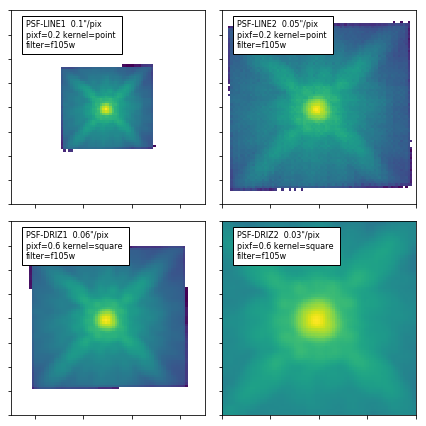

In [31]:
# Show the PSFs
print(glob.glob('*psf.fits'),'\n')

im = pyfits.open('{0}-f105w_psf.fits'.format(root))
im.info()

fig = plt.figure(figsize=[6,6])
for i, ext in enumerate([1,2,4,5]):
    ax = fig.add_subplot(2,2,i+1)
    ax.imshow(np.log10(im[ext].data))
    
    h = im[ext].header
    label = '{0}-{1}  {2}"/pix \npixf={3} kernel={4} \nfilter={5}'.format(h['EXTNAME'],
                     h['EXTVER'], h['PSCALE'], h['PIXFRAC'], h['KERNEL'], h['FILTER'])
    
    ax.text(0.08, 0.95, label, ha='left', va='top', 
            transform=ax.transAxes, size=8, color='k',
            bbox={'fc':'w'})
    
    ax.set_xticklabels([]); ax.set_yticklabels([])
    
    sh = im[ext].data.shape
    ax.set_xlim(sh[1]/2-40, sh[1]/2+40)
    ax.set_ylim(sh[0]/2-40, sh[0]/2+40)
    
fig.tight_layout(pad=1)

## Extract and fit individual spectra ##

In [32]:
os.chdir('../Extractions')

In [33]:
### Find IDs of specific objects to extract
import grizli.pipeline
from grizli.pipeline import auto_script
import astropy.units as u
tab = utils.GTable()
tab['ra'] = ra_HST
tab['dec'] = dec_HST
idx, dr = grp.catalog.match_to_catalog_sky(tab)
source_ids = grp.catalog['NUMBER'][idx]
tab['id'] = source_ids
tab['dr'] = dr.to(u.mas)
tab['dr'].format='.1f'
tab.show_in_notebook()

idx,ra,dec,id,dr
,deg,deg,,mas
0,195.3942338,-11.62806653,163,15.6
1,195.3628516,-11.62396404,199,42.1
2,195.3861982,-11.62389533,197,36.2
3,195.378911,-11.61491841,300,28.2
4,195.3915541,-11.60964866,364,517.2
5,195.3959605,-11.64124317,11,54.6
6,195.3682712,-11.63835567,46,38.7
7,195.3826468,-11.63697327,66,31.7
8,195.389979,-11.63528891,80,27.5


### Extract 2D spectra "beams" ###

The `GroupFLT` object contains the entire exposure information, from which we can make cutouts of spectra for individual objects with the `get_beams` method.  These cutouts are more managable and portable than the entire exposures, though currently the processing does work in the paradigm of having a static contamination model for a given object.  

In pipeline mode, the function below is called with `ids=[], maglim=[mag_min, mag_max]` and all objects in the reference catalog with `mag_min < MAG_AUTO < mag_max` are extracted.  The redshift fits are performed if `run_fit=True`.

In [34]:
for id_i in source_ids:
    auto_script.extract(field_root=root, prior=a, MW_EBV=tabs[0].meta['MW_EBV'], 
                                pline=pline, fit_only_beams=True, run_fit=True, poly_order=7, 
                           grp=grp, diff=True)

0/334: 490 0
1/334: 151 3
j130132m1138_00151.beams.fits
2/334: 531 0
3/334: 218 4
j130132m1138_00218.beams.fits
4/334: 556 0
5/334: 500 0
6/334: 558 0
7/334: 61 4
j130132m1138_00061.beams.fits
8/334: 24 3
j130132m1138_00024.beams.fits
9/334: 185 4
j130132m1138_00185.beams.fits
10/334: 254 3
j130132m1138_00254.beams.fits
11/334: 641 0
12/334: 568 0
13/334: 49 3
j130132m1138_00049.beams.fits
14/334: 466 0
15/334: 59 4
j130132m1138_00059.beams.fits
16/334: 485 0
17/334: 349 4
j130132m1138_00349.beams.fits
18/334: 259 0
19/334: 505 0
20/334: 79 4
j130132m1138_00079.beams.fits
21/334: 66 3
j130132m1138_00066.beams.fits
22/334: 435 0
23/334: 121 4
j130132m1138_00121.beams.fits
24/334: 60 4
j130132m1138_00060.beams.fits
25/334: 391 1
j130132m1138_00391.beams.fits
26/334: 183 4
j130132m1138_00183.beams.fits
27/334: 536 0
28/334: 95 4
j130132m1138_00095.beams.fits
29/334: 252 3
j130132m1138_00252.beams.fits
30/334: 217 4
j130132m1138_00217.beams.fits
31/334: 80 4
j130132m1138_00080.beams.fits
3

282/334: 12 4
j130132m1138_00012.beams.fits
283/334: 467 0
284/334: 395 0
285/334: 177 4
j130132m1138_00177.beams.fits
286/334: 319 4
j130132m1138_00319.beams.fits
287/334: 28 0
288/334: 535 0
289/334: 291 4
j130132m1138_00291.beams.fits
290/334: 78 4
j130132m1138_00078.beams.fits
291/334: 51 4
j130132m1138_00051.beams.fits
292/334: 187 4
j130132m1138_00187.beams.fits
293/334: 375 0
294/334: 86 3
j130132m1138_00086.beams.fits
295/334: 364 4
j130132m1138_00364.beams.fits
296/334: 169 4
j130132m1138_00169.beams.fits
297/334: 72 3
j130132m1138_00072.beams.fits
298/334: 113 3
j130132m1138_00113.beams.fits
299/334: 450 0
300/334: 512 0
301/334: 16 3
j130132m1138_00016.beams.fits
302/334: 214 4
j130132m1138_00214.beams.fits
303/334: 621 0
304/334: 128 4
j130132m1138_00128.beams.fits
305/334: 108 4
j130132m1138_00108.beams.fits
306/334: 518 0
307/334: 458 0
308/334: 412 0
309/334: 31 4
j130132m1138_00031.beams.fits
310/334: 633 0
311/334: 399 0
312/334: 105 3
j130132m1138_00105.beams.fits
313

  1.0124  180297.4 (0.5704) 152/341
  1.0204  180056.6 (0.5704) 153/341
  1.0285  179769.4 (0.5704) 154/341
  1.0367  179533.9 (0.5704) 155/341
  1.0448  179923.1 (0.5704) 156/341
  1.0530  180344.1 (0.5704) 157/341
  1.0612  180571.5 (0.5704) 158/341
  1.0695  180776.8 (0.5704) 159/341
  1.0778  181053.5 (0.5704) 160/341
  1.0861  181230.5 (0.5704) 161/341
  1.0945  181339.8 (0.5704) 162/341
  1.1029  181154.1 (0.5704) 163/341
  1.1113  181108.5 (0.5704) 164/341
  1.1198  181420.4 (0.5704) 165/341
  1.1283  181969.4 (0.5704) 166/341
  1.1368  182566.3 (0.5704) 167/341
  1.1454  182967.1 (0.5704) 168/341
  1.1540  183445.3 (0.5704) 169/341
  1.1626  184250.6 (0.5704) 170/341
  1.1713  184885.9 (0.5704) 171/341
  1.1800  185106.8 (0.5704) 172/341
  1.1887  185578.9 (0.5704) 173/341
  1.1975  185783.4 (0.5704) 174/341
  1.2063  185817.1 (0.5704) 175/341
  1.2151  186433.8 (0.5704) 176/341
  1.2240  186776.9 (0.5704) 177/341
  1.2329  186823.4 (0.5704) 178/341
  1.2419  187283.3 (0.5704) 

- 2.7870  178419.5 (2.7870) 3/33
- 2.7875  178418.5 (2.7875) 4/33
- 2.7880  178417.6 (2.7880) 5/33
- 2.7885  178416.8 (2.7885) 6/33
- 2.7890  178416.0 (2.7890) 7/33
- 2.7895  178415.3 (2.7895) 8/33
- 2.7900  178414.6 (2.7900) 9/33
- 2.7905  178414.1 (2.7905) 10/33
- 2.7910  178413.6 (2.7910) 11/33
- 2.7915  178413.2 (2.7915) 12/33
- 2.7920  178412.9 (2.7920) 13/33
- 2.7925  178412.7 (2.7925) 14/33
- 2.7930  178412.5 (2.7930) 15/33
- 2.7935  178412.4 (2.7935) 16/33
- 2.7940  178412.5 (2.7935) 17/33
- 2.7945  178412.6 (2.7935) 18/33
- 2.7950  178412.7 (2.7935) 19/33
- 2.7955  178413.0 (2.7935) 20/33
- 2.7960  178413.3 (2.7935) 21/33
- 2.7965  178413.6 (2.7935) 22/33
- 2.7970  178414.0 (2.7935) 23/33
- 2.7975  178414.5 (2.7935) 24/33
- 2.7980  178415.0 (2.7935) 25/33
- 2.7985  178415.7 (2.7935) 26/33
- 2.7990  178416.4 (2.7935) 27/33
- 2.7995  178417.2 (2.7935) 28/33
- 2.8000  178418.1 (2.7935) 29/33
- 2.8005  178419.0 (2.7935) 30/33
- 2.8010  178419.9 (2.7935) 31/33
- 2.8015  178420.9 (2

  1.0695  191956.9 (0.1916) 159/341
  1.0778  192160.5 (0.1916) 160/341
  1.0861  192176.8 (0.1916) 161/341
  1.0945  192047.1 (0.1916) 162/341
  1.1029  192057.2 (0.1916) 163/341
  1.1113  191925.5 (0.1916) 164/341
  1.1198  191823.5 (0.1916) 165/341
  1.1283  191839.2 (0.1916) 166/341
  1.1368  191874.6 (0.1916) 167/341
  1.1454  191792.2 (0.1916) 168/341
  1.1540  192010.5 (0.1916) 169/341
  1.1626  192405.4 (0.1916) 170/341
  1.1713  192533.2 (0.1916) 171/341
  1.1800  192716.7 (0.1916) 172/341
  1.1887  192849.6 (0.1916) 173/341
  1.1975  193157.9 (0.1916) 174/341
  1.2063  193249.2 (0.1916) 175/341
  1.2151  193290.3 (0.1916) 176/341
  1.2240  193401.6 (0.1916) 177/341
  1.2329  193619.3 (0.1916) 178/341
  1.2419  193810.7 (0.1916) 179/341
  1.2509  193943.1 (0.1916) 180/341
  1.2599  193847.5 (0.1916) 181/341
  1.2689  193928.8 (0.1916) 182/341
  1.2780  194380.7 (0.1916) 183/341
  1.2872  194911.3 (0.1916) 184/341
  1.2963  195082.4 (0.1916) 185/341
  1.3055  195193.6 (0.1916) 

- 0.1890  190477.7 (0.1890) 8/33
- 0.1895  190452.3 (0.1895) 9/33
- 0.1900  190430.5 (0.1900) 10/33
- 0.1905  190413.9 (0.1905) 11/33
- 0.1910  190402.3 (0.1910) 12/33
- 0.1915  190392.2 (0.1915) 13/33
- 0.1920  190383.4 (0.1920) 14/33
- 0.1925  190375.6 (0.1925) 15/33
- 0.1930  190370.2 (0.1930) 16/33
- 0.1935  190369.4 (0.1935) 17/33
- 0.1940  190372.7 (0.1935) 18/33
- 0.1945  190378.2 (0.1935) 19/33
- 0.1950  190385.8 (0.1935) 20/33
- 0.1955  190396.0 (0.1935) 21/33
- 0.1960  190405.8 (0.1935) 22/33
- 0.1965  190416.4 (0.1935) 23/33
- 0.1970  190427.7 (0.1935) 24/33
- 0.1975  190438.9 (0.1935) 25/33
- 0.1980  190450.0 (0.1935) 26/33
- 0.1985  190462.2 (0.1935) 27/33
- 0.1990  190473.4 (0.1935) 28/33
- 0.1995  190483.2 (0.1935) 29/33
- 0.2000  190491.1 (0.1935) 30/33
- 0.2005  190496.8 (0.1935) 31/33
- 0.2010  190498.2 (0.1935) 32/33
- 0.2015  190498.8 (0.1935) 33/33
Drizzle line -> SIII (45.74 2.26)
Drizzle line -> SII  (65.44 7.10)
Drizzle line -> Ha   (324.63 22.23)
Drizzle line -

  1.0861   14344.6 (0.3489) 161/341
  1.0945   14368.0 (0.3489) 162/341
  1.1029   14252.1 (0.3489) 163/341
  1.1113   14203.3 (0.3489) 164/341
  1.1198   14146.3 (0.3489) 165/341
  1.1283   14197.4 (0.3489) 166/341
  1.1368   14233.9 (0.3489) 167/341
  1.1454   14281.4 (0.3489) 168/341
  1.1540   14380.4 (0.3489) 169/341
  1.1626   14424.6 (0.3489) 170/341
  1.1713   14454.5 (0.3489) 171/341
  1.1800   14433.2 (0.3489) 172/341
  1.1887   14389.6 (0.3489) 173/341
  1.1975   14230.6 (0.3489) 174/341
  1.2063   14090.2 (0.3489) 175/341
  1.2151   14098.3 (0.3489) 176/341
  1.2240   14130.3 (0.3489) 177/341
  1.2329   14280.0 (0.3489) 178/341
  1.2419   14447.8 (0.3489) 179/341
  1.2509   14785.8 (0.3489) 180/341
  1.2599   15104.2 (0.3489) 181/341
  1.2689   15331.2 (0.3489) 182/341
  1.2780   15585.7 (0.3489) 183/341
  1.2872   15772.9 (0.3489) 184/341
  1.2963   15998.9 (0.3489) 185/341
  1.3055   16185.5 (0.3489) 186/341
  1.3148   16260.6 (0.3489) 187/341
  1.3240   16203.3 (0.3489) 

- 0.3469   12698.3 (0.3469) 9/33
- 0.3474   12682.2 (0.3474) 10/33
- 0.3479   12666.5 (0.3479) 11/33
- 0.3484   12653.6 (0.3484) 12/33
- 0.3489   12643.1 (0.3489) 13/33
- 0.3494   12634.0 (0.3494) 14/33
- 0.3499   12626.9 (0.3499) 15/33
- 0.3504   12622.0 (0.3504) 16/33
- 0.3509   12620.5 (0.3509) 17/33
- 0.3514   12623.3 (0.3509) 18/33
- 0.3519   12629.1 (0.3509) 19/33
- 0.3524   12635.1 (0.3509) 20/33
- 0.3529   12641.0 (0.3509) 21/33
- 0.3534   12648.9 (0.3509) 22/33
- 0.3539   12659.8 (0.3509) 23/33
- 0.3544   12674.2 (0.3509) 24/33
- 0.3549   12691.9 (0.3509) 25/33
- 0.3554   12711.0 (0.3509) 26/33
- 0.3559   12729.3 (0.3509) 27/33
- 0.3564   12746.8 (0.3509) 28/33
- 0.3569   12765.8 (0.3509) 29/33
- 0.3574   12787.8 (0.3509) 30/33
- 0.3579   12810.3 (0.3509) 31/33
- 0.3584   12832.2 (0.3509) 32/33
- 0.3589   12853.8 (0.3509) 33/33
Drizzle line -> Ha   (2.16 3.83)
Get linemap PSF: F105W
8/334: 24
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User te

  1.1283    7468.6 (0.4908) 166/341
  1.1368    7472.5 (0.4908) 167/341
  1.1454    7459.6 (0.4908) 168/341
  1.1540    7448.8 (0.4908) 169/341
  1.1626    7453.0 (0.4908) 170/341
  1.1713    7490.2 (0.4908) 171/341
  1.1800    7520.3 (0.4908) 172/341
  1.1887    7538.3 (0.4908) 173/341
  1.1975    7564.5 (0.4908) 174/341
  1.2063    7564.8 (0.4908) 175/341
  1.2151    7571.9 (0.4908) 176/341
  1.2240    7590.3 (0.4908) 177/341
  1.2329    7623.7 (0.4908) 178/341
  1.2419    7647.9 (0.4908) 179/341
  1.2509    7687.1 (0.4908) 180/341
  1.2599    7748.3 (0.4908) 181/341
  1.2689    7762.1 (0.4908) 182/341
  1.2780    7785.4 (0.4908) 183/341
  1.2872    7834.8 (0.4908) 184/341
  1.2963    7909.6 (0.4908) 185/341
  1.3055    7948.8 (0.4908) 186/341
  1.3148    7945.4 (0.4908) 187/341
  1.3240    7914.3 (0.4908) 188/341
  1.3334    7877.7 (0.4908) 189/341
  1.3427    7895.2 (0.4908) 190/341
  1.3521    7953.1 (0.4908) 191/341
  1.3615    8020.0 (0.4908) 192/341
  1.3710    8089.2 (0.4908) 

- 0.4891    7252.4 (0.4891) 14/33
- 0.4896    7251.5 (0.4896) 15/33
- 0.4901    7251.1 (0.4901) 16/33
- 0.4906    7251.0 (0.4906) 17/33
- 0.4911    7251.3 (0.4906) 18/33
- 0.4916    7252.0 (0.4906) 19/33
- 0.4921    7253.1 (0.4906) 20/33
- 0.4926    7253.8 (0.4906) 21/33
- 0.4931    7254.3 (0.4906) 22/33
- 0.4936    7254.9 (0.4906) 23/33
- 0.4941    7256.1 (0.4906) 24/33
- 0.4946    7257.6 (0.4906) 25/33
- 0.4951    7259.4 (0.4906) 26/33
- 0.4956    7261.5 (0.4906) 27/33
- 0.4961    7263.8 (0.4906) 28/33
- 0.4966    7265.8 (0.4906) 29/33
- 0.4971    7267.3 (0.4906) 30/33
- 0.4976    7269.1 (0.4906) 31/33
- 0.4981    7271.3 (0.4906) 32/33
- 0.4986    7273.7 (0.4906) 33/33
Drizzle line -> SII  (8.99 3.23)
Drizzle line -> Ha   (21.40 3.88)
Drizzle line -> OI-6302 (0.94 4.29)
Get linemap PSF: F105W
9/334: 185
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000   55885.3 (0.1000) 1/341
  0.1044   55887.1 (0.

  1.1626   56679.8 (0.2060) 170/341
  1.1713   56770.0 (0.2060) 171/341
  1.1800   57018.9 (0.2060) 172/341
  1.1887   57272.6 (0.2060) 173/341
  1.1975   57475.4 (0.2060) 174/341
  1.2063   57649.0 (0.2060) 175/341
  1.2151   57716.1 (0.2060) 176/341
  1.2240   57821.6 (0.2060) 177/341
  1.2329   57803.0 (0.2060) 178/341
  1.2419   57682.1 (0.2060) 179/341
  1.2509   57614.8 (0.2060) 180/341
  1.2599   57486.2 (0.2060) 181/341
  1.2689   57514.3 (0.2060) 182/341
  1.2780   57230.9 (0.2060) 183/341
  1.2872   56998.9 (0.2060) 184/341
  1.2963   57137.1 (0.2060) 185/341
  1.3055   57351.6 (0.2060) 186/341
  1.3148   57305.1 (0.2060) 187/341
  1.3240   57223.7 (0.2060) 188/341
  1.3334   57052.7 (0.2060) 189/341
  1.3427   57008.9 (0.2060) 190/341
  1.3521   57066.2 (0.2060) 191/341
  1.3615   57022.5 (0.2060) 192/341
  1.3710   57157.3 (0.2060) 193/341
  1.3805   57530.9 (0.2060) 194/341
  1.3900   57835.9 (0.2060) 195/341
  1.3996   57917.5 (0.2060) 196/341
  1.4092   58101.3 (0.2060) 

- 0.2051   55570.0 (0.2051) 18/33
- 0.2056   55570.7 (0.2051) 19/33
- 0.2061   55572.0 (0.2051) 20/33
- 0.2066   55572.4 (0.2051) 21/33
- 0.2071   55576.0 (0.2051) 22/33
- 0.2076   55582.3 (0.2051) 23/33
- 0.2081   55585.0 (0.2051) 24/33
- 0.2086   55588.6 (0.2051) 25/33
- 0.2091   55592.2 (0.2051) 26/33
- 0.2096   55596.9 (0.2051) 27/33
- 0.2101   55603.7 (0.2051) 28/33
- 0.2106   55609.8 (0.2051) 29/33
- 0.2111   55615.1 (0.2051) 30/33
- 0.2116   55621.5 (0.2051) 31/33
- 0.2121   55626.6 (0.2051) 32/33
- 0.2126   55630.7 (0.2051) 33/33
Drizzle line -> SII  (20.37 3.89)
Drizzle line -> Ha   (5.28 5.88)
Drizzle line -> OI-6302 (315802.15 131469.83)
Get linemap PSF: F105W
10/334: 254
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000   10502.6 (0.1000) 1/341
  0.1044   10487.1 (0.1044) 2/341
  0.1088   10469.6 (0.1088) 3/341
  0.1133   10466.9 (0.1133) 4/341
  0.1177   10463.3 (0.1177) 5/341
  0.1222   10459.9 (0.1222) 6/341
  0

  1.1626   10761.3 (0.3984) 170/341
  1.1713   10770.8 (0.3984) 171/341
  1.1800   10754.4 (0.3984) 172/341
  1.1887   10803.1 (0.3984) 173/341
  1.1975   10844.3 (0.3984) 174/341
  1.2063   10827.5 (0.3984) 175/341
  1.2151   10811.5 (0.3984) 176/341
  1.2240   10821.0 (0.3984) 177/341
  1.2329   10875.0 (0.3984) 178/341
  1.2419   10908.4 (0.3984) 179/341
  1.2509   10944.3 (0.3984) 180/341
  1.2599   10987.3 (0.3984) 181/341
  1.2689   10999.7 (0.3984) 182/341
  1.2780   11023.2 (0.3984) 183/341
  1.2872   11034.6 (0.3984) 184/341
  1.2963   11126.8 (0.3984) 185/341
  1.3055   11265.3 (0.3984) 186/341
  1.3148   11420.5 (0.3984) 187/341
  1.3240   11529.0 (0.3984) 188/341
  1.3334   11572.1 (0.3984) 189/341
  1.3427   11670.0 (0.3984) 190/341
  1.3521   11817.8 (0.3984) 191/341
  1.3615   11974.2 (0.3984) 192/341
  1.3710   12053.2 (0.3984) 193/341
  1.3805   12122.2 (0.3984) 194/341
  1.3900   12197.9 (0.3984) 195/341
  1.3996   12298.4 (0.3984) 196/341
  1.4092   12400.2 (0.3984) 

- 0.3987   10129.7 (0.3987) 17/33
- 0.3992   10129.4 (0.3992) 18/33
- 0.3997   10130.3 (0.3992) 19/33
- 0.4002   10131.7 (0.3992) 20/33
- 0.4007   10133.4 (0.3992) 21/33
- 0.4012   10135.7 (0.3992) 22/33
- 0.4017   10138.4 (0.3992) 23/33
- 0.4022   10141.1 (0.3992) 24/33
- 0.4027   10144.0 (0.3992) 25/33
- 0.4032   10147.6 (0.3992) 26/33
- 0.4037   10151.6 (0.3992) 27/33
- 0.4042   10155.6 (0.3992) 28/33
- 0.4047   10160.1 (0.3992) 29/33
- 0.4052   10165.0 (0.3992) 30/33
- 0.4057   10170.1 (0.3992) 31/33
- 0.4062   10175.4 (0.3992) 32/33
- 0.4067   10180.6 (0.3992) 33/33
Drizzle line -> SII  (4.56 3.89)
Drizzle line -> Ha   (24.71 4.31)
Drizzle line -> OI-6302 (1.10 5.83)
Get linemap PSF: F105W
11/334: 641
12/334: 568
13/334: 49
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    7455.9 (0.1000) 1/341
  0.1044    7456.8 (0.1000) 2/341
  0.1088    7451.4 (0.1088) 3/341
  0.1133    7451.0 (0.1133) 4/341
  0.1177    7453.0 (0.11

  1.1800    7562.2 (0.4908) 172/341
  1.1887    7585.6 (0.4908) 173/341
  1.1975    7575.1 (0.4908) 174/341
  1.2063    7534.5 (0.4908) 175/341
  1.2151    7543.9 (0.4908) 176/341
  1.2240    7566.2 (0.4908) 177/341
  1.2329    7590.6 (0.4908) 178/341
  1.2419    7618.2 (0.4908) 179/341
  1.2509    7614.9 (0.4908) 180/341
  1.2599    7606.5 (0.4908) 181/341
  1.2689    7629.3 (0.4908) 182/341
  1.2780    7642.4 (0.4908) 183/341
  1.2872    7687.9 (0.4908) 184/341
  1.2963    7772.0 (0.4908) 185/341
  1.3055    7793.0 (0.4908) 186/341
  1.3148    7800.6 (0.4908) 187/341
  1.3240    7802.0 (0.4908) 188/341
  1.3334    7793.9 (0.4908) 189/341
  1.3427    7821.4 (0.4908) 190/341
  1.3521    7851.0 (0.4908) 191/341
  1.3615    7868.1 (0.4908) 192/341
  1.3710    7914.2 (0.4908) 193/341
  1.3805    7954.1 (0.4908) 194/341
  1.3900    7959.5 (0.4908) 195/341
  1.3996    7938.5 (0.4908) 196/341
  1.4092    7943.1 (0.4908) 197/341
  1.4189    7955.9 (0.4908) 198/341
  1.4286    7965.3 (0.4908) 

- 0.4926    7369.0 (0.4881) 22/33
- 0.4931    7369.9 (0.4881) 23/33
- 0.4936    7371.3 (0.4881) 24/33
- 0.4941    7372.5 (0.4881) 25/33
- 0.4946    7373.2 (0.4881) 26/33
- 0.4951    7373.8 (0.4881) 27/33
- 0.4956    7374.2 (0.4881) 28/33
- 0.4961    7374.5 (0.4881) 29/33
- 0.4966    7375.2 (0.4881) 30/33
- 0.4971    7375.6 (0.4881) 31/33
- 0.4976    7376.2 (0.4881) 32/33
- 0.4981    7376.7 (0.4881) 33/33
Drizzle line -> SII  (2.60 2.93)
Drizzle line -> Ha   (9.02 3.77)
Get linemap PSF: F105W
14/334: 466
15/334: 59
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000   12089.4 (0.1000) 1/341
  0.1044   12080.6 (0.1044) 2/341
  0.1088   12060.1 (0.1088) 3/341
  0.1133   12036.1 (0.1133) 4/341
  0.1177   12014.3 (0.1177) 5/341
  0.1222   12000.0 (0.1222) 6/341
  0.1267   11993.2 (0.1267) 7/341
  0.1312   11990.0 (0.1312) 8/341
  0.1358   11992.2 (0.1312) 9/341
  0.1403   11996.3 (0.1312) 10/341
  0.1449   1

  1.1975   12119.5 (0.6150) 174/341
  1.2063   12113.9 (0.6150) 175/341
  1.2151   12113.4 (0.6150) 176/341
  1.2240   12092.4 (0.6150) 177/341
  1.2329   12089.7 (0.6150) 178/341
  1.2419   12099.1 (0.6150) 179/341
  1.2509   12100.2 (0.6150) 180/341
  1.2599   12093.5 (0.6150) 181/341
  1.2689   12033.3 (0.6150) 182/341
  1.2780   11975.2 (0.6150) 183/341
  1.2872   11948.6 (0.6150) 184/341
  1.2963   11923.0 (0.6150) 185/341
  1.3055   11928.0 (0.6150) 186/341
  1.3148   11957.7 (0.6150) 187/341
  1.3240   12015.9 (0.6150) 188/341
  1.3334   12068.2 (0.6150) 189/341
  1.3427   12136.0 (0.6150) 190/341
  1.3521   12198.6 (0.6150) 191/341
  1.3615   12269.2 (0.6150) 192/341
  1.3710   12376.4 (0.6150) 193/341
  1.3805   12479.9 (0.6150) 194/341
  1.3900   12550.8 (0.6150) 195/341
  1.3996   12619.8 (0.6150) 196/341
  1.4092   12702.2 (0.6150) 197/341
  1.4189   12774.4 (0.6150) 198/341
  1.4286   12805.6 (0.6150) 199/341
  1.4383   12843.4 (0.6150) 200/341
  1.4481   12906.4 (0.6150) 

- 0.4102   11773.2 (0.4082) 21/66
- 0.4107   11775.8 (0.4082) 22/66
- 0.4112   11779.0 (0.4082) 23/66
- 0.4117   11783.1 (0.4082) 24/66
- 0.4122   11788.2 (0.4082) 25/66
- 0.4127   11793.8 (0.4082) 26/66
- 0.4132   11799.5 (0.4082) 27/66
- 0.4137   11805.5 (0.4082) 28/66
- 0.4142   11811.9 (0.4082) 29/66
- 0.4147   11818.5 (0.4082) 30/66
- 0.4152   11825.5 (0.4082) 31/66
- 0.4157   11834.1 (0.4082) 32/66
- 0.4162   11843.4 (0.4082) 33/66
- 0.6049   11790.4 (0.4082) 34/66
- 0.6054   11786.6 (0.4082) 35/66
- 0.6059   11784.0 (0.4082) 36/66
- 0.6064   11782.2 (0.4082) 37/66
- 0.6069   11780.9 (0.4082) 38/66
- 0.6074   11780.3 (0.4082) 39/66
- 0.6079   11779.6 (0.4082) 40/66
- 0.6084   11778.7 (0.4082) 41/66
- 0.6089   11777.1 (0.4082) 42/66
- 0.6094   11775.1 (0.4082) 43/66
- 0.6099   11772.9 (0.4082) 44/66
- 0.6104   11771.2 (0.4082) 45/66
- 0.6109   11770.6 (0.4082) 46/66
- 0.6114   11770.2 (0.4082) 47/66
- 0.6119   11770.4 (0.4082) 48/66
- 0.6124   11771.3 (0.4082) 49/66
- 0.6129   117

  0.9412   34909.2 (0.3012) 143/341
  0.9490   34888.4 (0.3012) 144/341
  0.9568   34901.2 (0.3012) 145/341
  0.9646   34923.7 (0.3012) 146/341
  0.9725   34902.2 (0.3012) 147/341
  0.9804   34902.4 (0.3012) 148/341
  0.9884   34907.7 (0.3012) 149/341
  0.9963   34866.4 (0.3012) 150/341
  1.0043   34900.1 (0.3012) 151/341
  1.0124   34933.4 (0.3012) 152/341
  1.0204   35000.5 (0.3012) 153/341
  1.0285   35053.6 (0.3012) 154/341
  1.0367   35026.7 (0.3012) 155/341
  1.0448   34996.3 (0.3012) 156/341
  1.0530   35076.7 (0.3012) 157/341
  1.0612   35089.2 (0.3012) 158/341
  1.0695   35168.6 (0.3012) 159/341
  1.0778   35166.0 (0.3012) 160/341
  1.0861   35158.4 (0.3012) 161/341
  1.0945   35239.4 (0.3012) 162/341
  1.1029   35258.0 (0.3012) 163/341
  1.1113   35185.4 (0.3012) 164/341
  1.1198   35113.3 (0.3012) 165/341
  1.1283   35205.7 (0.3012) 166/341
  1.1368   35360.7 (0.3012) 167/341
  1.1454   35383.8 (0.3012) 168/341
  1.1540   35395.7 (0.3012) 169/341
  1.1626   35411.2 (0.3012) 

  3.1013   34944.8 (2.0997) 330/341
  3.1178   34972.0 (2.0997) 331/341
  3.1343   34974.6 (2.0997) 332/341
  3.1508   34975.9 (2.0997) 333/341
  3.1675   34999.0 (2.0997) 334/341
  3.1842   35022.7 (2.0997) 335/341
  3.2009   35042.3 (2.0997) 336/341
  3.2178   35060.4 (2.0997) 337/341
  3.2347   35074.4 (2.0997) 338/341
  3.2517   35096.8 (2.0997) 339/341
  3.2687   35108.1 (2.0997) 340/341
  3.2858   35107.1 (2.0997) 341/341
First iteration: z_best=2.0997

- 2.0931   34591.2 (2.0931) 1/33
- 2.0936   34589.8 (2.0936) 2/33
- 2.0941   34588.5 (2.0941) 3/33
- 2.0946   34587.1 (2.0946) 4/33
- 2.0951   34585.7 (2.0951) 5/33
- 2.0956   34584.3 (2.0956) 6/33
- 2.0961   34583.0 (2.0961) 7/33
- 2.0966   34581.9 (2.0966) 8/33
- 2.0971   34580.9 (2.0971) 9/33
- 2.0976   34579.8 (2.0976) 10/33
- 2.0981   34578.5 (2.0981) 11/33
- 2.0986   34577.3 (2.0986) 12/33
- 2.0991   34576.1 (2.0991) 13/33
- 2.0996   34574.9 (2.0996) 14/33
- 2.1001   34574.0 (2.1001) 15/33
- 2.1006   34573.6 (2.1006) 16/33
-

  0.9257    9173.9 (0.6150) 141/341
  0.9335    9179.1 (0.6150) 142/341
  0.9412    9195.8 (0.6150) 143/341
  0.9490    9229.4 (0.6150) 144/341
  0.9568    9253.3 (0.6150) 145/341
  0.9646    9272.4 (0.6150) 146/341
  0.9725    9292.4 (0.6150) 147/341
  0.9804    9287.0 (0.6150) 148/341
  0.9884    9280.0 (0.6150) 149/341
  0.9963    9266.5 (0.6150) 150/341
  1.0043    9255.0 (0.6150) 151/341
  1.0124    9242.8 (0.6150) 152/341
  1.0204    9219.8 (0.6150) 153/341
  1.0285    9204.2 (0.6150) 154/341
  1.0367    9186.8 (0.6150) 155/341
  1.0448    9158.9 (0.6150) 156/341
  1.0530    9152.3 (0.6150) 157/341
  1.0612    9152.7 (0.6150) 158/341
  1.0695    9146.0 (0.6150) 159/341
  1.0778    9166.5 (0.6150) 160/341
  1.0861    9184.2 (0.6150) 161/341
  1.0945    9200.9 (0.6150) 162/341
  1.1029    9213.9 (0.6150) 163/341
  1.1113    9239.4 (0.6150) 164/341
  1.1198    9256.3 (0.6150) 165/341
  1.1283    9256.0 (0.6150) 166/341
  1.1368    9254.3 (0.6150) 167/341
  1.1454    9264.8 (0.6150) 

  3.0686    9532.2 (0.6150) 328/341
  3.0850    9523.3 (0.6150) 329/341
  3.1013    9516.0 (0.6150) 330/341
  3.1178    9523.8 (0.6150) 331/341
  3.1343    9530.1 (0.6150) 332/341
  3.1508    9522.7 (0.6150) 333/341
  3.1675    9519.6 (0.6150) 334/341
  3.1842    9533.3 (0.6150) 335/341
  3.2009    9551.5 (0.6150) 336/341
  3.2178    9572.5 (0.6150) 337/341
  3.2347    9602.8 (0.6150) 338/341
  3.2517    9642.6 (0.6150) 339/341
  3.2687    9692.1 (0.6150) 340/341
  3.2858    9727.1 (0.6150) 341/341
First iteration: z_best=0.6150

- 0.6080    9116.7 (0.6080) 1/33
- 0.6085    9116.1 (0.6085) 2/33
- 0.6090    9115.5 (0.6090) 3/33
- 0.6095    9114.4 (0.6095) 4/33
- 0.6100    9113.1 (0.6100) 5/33
- 0.6105    9112.0 (0.6105) 6/33
- 0.6110    9111.8 (0.6110) 7/33
- 0.6115    9111.6 (0.6115) 8/33
- 0.6120    9111.3 (0.6120) 9/33
- 0.6125    9111.1 (0.6125) 10/33
- 0.6130    9110.8 (0.6130) 11/33
- 0.6135    9110.1 (0.6135) 12/33
- 0.6140    9108.8 (0.6140) 13/33
- 0.6145    9107.6 (0.6145) 14/

  0.9335    7564.4 (0.3489) 142/341
  0.9412    7562.9 (0.3489) 143/341
  0.9490    7565.3 (0.3489) 144/341
  0.9568    7571.3 (0.3489) 145/341
  0.9646    7579.1 (0.3489) 146/341
  0.9725    7587.9 (0.3489) 147/341
  0.9804    7597.6 (0.3489) 148/341
  0.9884    7602.7 (0.3489) 149/341
  0.9963    7604.7 (0.3489) 150/341
  1.0043    7610.4 (0.3489) 151/341
  1.0124    7622.9 (0.3489) 152/341
  1.0204    7638.7 (0.3489) 153/341
  1.0285    7660.5 (0.3489) 154/341
  1.0367    7676.4 (0.3489) 155/341
  1.0448    7680.1 (0.3489) 156/341
  1.0530    7669.1 (0.3489) 157/341
  1.0612    7655.1 (0.3489) 158/341
  1.0695    7643.4 (0.3489) 159/341
  1.0778    7636.2 (0.3489) 160/341
  1.0861    7628.0 (0.3489) 161/341
  1.0945    7615.7 (0.3489) 162/341
  1.1029    7596.1 (0.3489) 163/341
  1.1113    7575.3 (0.3489) 164/341
  1.1198    7560.8 (0.3489) 165/341
  1.1283    7564.7 (0.3489) 166/341
  1.1368    7584.2 (0.3489) 167/341
  1.1454    7602.8 (0.3489) 168/341
  1.1540    7614.7 (0.3489) 

  3.1343    7650.8 (0.3489) 332/341
  3.1508    7649.8 (0.3489) 333/341
  3.1675    7647.9 (0.3489) 334/341
  3.1842    7646.7 (0.3489) 335/341
  3.2009    7646.7 (0.3489) 336/341
  3.2178    7649.1 (0.3489) 337/341
  3.2347    7651.7 (0.3489) 338/341
  3.2517    7653.0 (0.3489) 339/341
  3.2687    7653.1 (0.3489) 340/341
  3.2858    7649.5 (0.3489) 341/341
First iteration: z_best=0.3489

- 0.3407    7507.2 (0.3407) 1/33
- 0.3412    7500.4 (0.3412) 2/33
- 0.3417    7493.3 (0.3417) 3/33
- 0.3422    7486.4 (0.3422) 4/33
- 0.3427    7479.9 (0.3427) 5/33
- 0.3432    7473.6 (0.3432) 6/33
- 0.3437    7467.7 (0.3437) 7/33
- 0.3442    7462.3 (0.3442) 8/33
- 0.3447    7457.7 (0.3447) 9/33
- 0.3452    7453.6 (0.3452) 10/33
- 0.3457    7450.0 (0.3457) 11/33
- 0.3462    7447.1 (0.3462) 12/33
- 0.3467    7444.9 (0.3467) 13/33
- 0.3472    7443.1 (0.3472) 14/33
- 0.3477    7442.0 (0.3477) 15/33
- 0.3482    7441.5 (0.3482) 16/33
- 0.3487    7441.6 (0.3482) 17/33
- 0.3492    7442.2 (0.3482) 18/33
- 0.3

  0.9412    8516.1 (0.7495) 143/341
  0.9490    8496.8 (0.7495) 144/341
  0.9568    8451.0 (0.7495) 145/341
  0.9646    8449.4 (0.7495) 146/341
  0.9725    8468.2 (0.7495) 147/341
  0.9804    8451.2 (0.7495) 148/341
  0.9884    8475.5 (0.7495) 149/341
  0.9963    8458.9 (0.7495) 150/341
  1.0043    8503.4 (0.7495) 151/341
  1.0124    8575.3 (0.7495) 152/341
  1.0204    8567.0 (0.7495) 153/341
  1.0285    8570.3 (0.7495) 154/341
  1.0367    8542.0 (0.7495) 155/341
  1.0448    8510.3 (0.7495) 156/341
  1.0530    8534.1 (0.7495) 157/341
  1.0612    8565.1 (0.7495) 158/341
  1.0695    8618.6 (0.7495) 159/341
  1.0778    8673.7 (0.7495) 160/341
  1.0861    8721.8 (0.7495) 161/341
  1.0945    8715.7 (0.7495) 162/341
  1.1029    8754.4 (0.7495) 163/341
  1.1113    8757.8 (0.7495) 164/341
  1.1198    8705.9 (0.7495) 165/341
  1.1283    8727.6 (0.7495) 166/341
  1.1368    8736.8 (0.7495) 167/341
  1.1454    8691.9 (0.7495) 168/341
  1.1540    8731.9 (0.7495) 169/341
  1.1626    8782.9 (0.7495) 

  3.2347    8474.6 (2.1121) 338/341
  3.2517    8479.7 (2.1121) 339/341
  3.2687    8464.6 (2.1121) 340/341
  3.2858    8469.8 (2.1121) 341/341
First iteration: z_best=2.1121

- 2.1047    8278.7 (2.1047) 1/33
- 2.1052    8278.1 (2.1052) 2/33
- 2.1057    8277.9 (2.1057) 3/33
- 2.1062    8277.9 (2.1057) 4/33
- 2.1067    8277.7 (2.1067) 5/33
- 2.1072    8277.2 (2.1072) 6/33
- 2.1077    8276.5 (2.1077) 7/33
- 2.1082    8275.6 (2.1082) 8/33
- 2.1087    8274.4 (2.1087) 9/33
- 2.1092    8273.2 (2.1092) 10/33
- 2.1097    8271.9 (2.1097) 11/33
- 2.1102    8270.7 (2.1102) 12/33
- 2.1107    8269.6 (2.1107) 13/33
- 2.1112    8268.6 (2.1112) 14/33
- 2.1117    8268.0 (2.1117) 15/33
- 2.1122    8267.8 (2.1122) 16/33
- 2.1127    8268.0 (2.1122) 17/33
- 2.1132    8268.5 (2.1122) 18/33
- 2.1137    8269.0 (2.1122) 19/33
- 2.1142    8269.5 (2.1122) 20/33
- 2.1147    8269.8 (2.1122) 21/33
- 2.1152    8269.8 (2.1122) 22/33
- 2.1157    8269.8 (2.1122) 23/33
- 2.1162    8269.7 (2.1122) 24/33
- 2.1167    8269.

  0.9725   12229.7 (0.6150) 147/341
  0.9804   12208.9 (0.6150) 148/341
  0.9884   12185.8 (0.9884) 149/341
  0.9963   12180.3 (0.9963) 150/341
  1.0043   12182.1 (0.9963) 151/341
  1.0124   12176.4 (1.0124) 152/341
  1.0204   12174.6 (1.0204) 153/341
  1.0285   12181.8 (1.0204) 154/341
  1.0367   12182.1 (1.0204) 155/341
  1.0448   12172.0 (1.0448) 156/341
  1.0530   12182.9 (1.0448) 157/341
  1.0612   12211.9 (1.0448) 158/341
  1.0695   12232.0 (1.0448) 159/341
  1.0778   12240.1 (1.0448) 160/341
  1.0861   12259.4 (1.0448) 161/341
  1.0945   12285.1 (1.0448) 162/341
  1.1029   12304.9 (1.0448) 163/341
  1.1113   12332.4 (1.0448) 164/341
  1.1198   12363.6 (1.0448) 165/341
  1.1283   12382.5 (1.0448) 166/341
  1.1368   12388.9 (1.0448) 167/341
  1.1454   12367.9 (1.0448) 168/341
  1.1540   12348.5 (1.0448) 169/341
  1.1626   12351.0 (1.0448) 170/341
  1.1713   12344.4 (1.0448) 171/341
  1.1800   12312.9 (1.0448) 172/341
  1.1887   12291.0 (1.0448) 173/341
  1.1975   12287.5 (1.0448) 

  3.1842   12882.4 (1.2689) 335/341
  3.2009   12880.3 (1.2689) 336/341
  3.2178   12876.8 (1.2689) 337/341
  3.2347   12873.3 (1.2689) 338/341
  3.2517   12862.3 (1.2689) 339/341
  3.2687   12842.9 (1.2689) 340/341
  3.2858   12816.8 (1.2689) 341/341
First iteration: z_best=1.2689

- 1.2640   12133.2 (1.2640) 1/33
- 1.2645   12131.5 (1.2645) 2/33
- 1.2650   12129.6 (1.2650) 3/33
- 1.2655   12127.6 (1.2655) 4/33
- 1.2660   12125.7 (1.2660) 5/33
- 1.2665   12123.9 (1.2665) 6/33
- 1.2670   12122.3 (1.2670) 7/33
- 1.2675   12121.0 (1.2675) 8/33
- 1.2680   12119.8 (1.2680) 9/33
- 1.2685   12118.7 (1.2685) 10/33
- 1.2690   12117.6 (1.2690) 11/33
- 1.2695   12116.7 (1.2695) 12/33
- 1.2700   12115.8 (1.2700) 13/33
- 1.2705   12115.1 (1.2705) 14/33
- 1.2710   12114.3 (1.2710) 15/33
- 1.2715   12113.4 (1.2715) 16/33
- 1.2720   12112.4 (1.2720) 17/33
- 1.2725   12111.7 (1.2725) 18/33
- 1.2730   12111.2 (1.2730) 19/33
- 1.2735   12110.9 (1.2735) 20/33
- 1.2740   12111.1 (1.2735) 21/33
- 1.2745   

  1.0204    2775.4 (0.1403) 153/341
  1.0285    2774.8 (0.1403) 154/341
  1.0367    2774.9 (0.1403) 155/341
  1.0448    2774.4 (0.1403) 156/341
  1.0530    2773.4 (0.1403) 157/341
  1.0612    2773.7 (0.1403) 158/341
  1.0695    2774.1 (0.1403) 159/341
  1.0778    2774.9 (0.1403) 160/341
  1.0861    2776.9 (0.1403) 161/341
  1.0945    2777.5 (0.1403) 162/341
  1.1029    2777.4 (0.1403) 163/341
  1.1113    2777.8 (0.1403) 164/341
  1.1198    2777.8 (0.1403) 165/341
  1.1283    2777.0 (0.1403) 166/341
  1.1368    2601.5 (0.1403) 167/341
  1.1454    2507.3 (0.1403) 168/341
  1.1540    2173.3 (0.1403) 169/341
  1.1626    1649.4 (0.1403) 170/341
  1.1713    1240.4 (0.1403) 171/341
  1.1800    1551.7 (0.1403) 172/341
  1.1887    2001.2 (0.1403) 173/341
  1.1975    1999.9 (0.1403) 174/341
  1.2063    2204.7 (0.1403) 175/341
  1.2151    2286.1 (0.1403) 176/341
  1.2240    2689.1 (0.1403) 177/341
  1.2329    2769.9 (0.1403) 178/341
  1.2419    2775.0 (0.1403) 179/341
  1.2509    2780.9 (0.1403) 

- 0.1397    1261.1 (0.1397) 14/132
- 0.1402    1228.2 (0.1402) 15/132
- 0.1407    1205.3 (0.1407) 16/132
- 0.1412    1192.6 (0.1412) 17/132
- 0.1417    1191.8 (0.1417) 18/132
- 0.1422    1203.2 (0.1417) 19/132
- 0.1427    1227.5 (0.1417) 20/132
- 0.1432    1264.3 (0.1417) 21/132
- 0.1437    1312.0 (0.1417) 22/132
- 0.1442    1368.5 (0.1417) 23/132
- 0.1447    1431.1 (0.1417) 24/132
- 0.1452    1496.4 (0.1417) 25/132
- 0.1457    1562.0 (0.1417) 26/132
- 0.1462    1626.1 (0.1417) 27/132
- 0.1467    1688.4 (0.1417) 28/132
- 0.1472    1748.6 (0.1417) 29/132
- 0.1477    1806.9 (0.1417) 30/132
- 0.1482    1863.6 (0.1417) 31/132
- 0.1487    1918.6 (0.1417) 32/132
- 0.1492    1972.0 (0.1417) 33/132
- 0.6089    1751.1 (0.1417) 34/132
- 0.6094    1705.4 (0.1417) 35/132
- 0.6099    1660.1 (0.1417) 36/132
- 0.6104    1615.2 (0.1417) 37/132
- 0.6109    1570.8 (0.1417) 38/132
- 0.6114    1526.9 (0.1417) 39/132
- 0.6119    1483.6 (0.1417) 40/132
- 0.6124    1441.3 (0.1417) 41/132
- 0.6129    1400.8 (

  0.4438   12319.5 (0.2960) 69/341
  0.4496   12276.2 (0.2960) 70/341
  0.4554   12207.2 (0.2960) 71/341
  0.4613   12087.2 (0.4613) 72/341
  0.4671   11863.5 (0.4671) 73/341
  0.4730   11435.4 (0.4730) 74/341
  0.4789   10938.1 (0.4789) 75/341
  0.4848   10882.0 (0.4848) 76/341
  0.4908   11272.6 (0.4848) 77/341
  0.4968   11706.4 (0.4848) 78/341
  0.5028   11974.0 (0.4848) 79/341
  0.5088   12095.7 (0.4848) 80/341
  0.5148   12157.4 (0.4848) 81/341
  0.5209   12212.6 (0.4848) 82/341
  0.5270   12265.8 (0.4848) 83/341
  0.5331   12287.4 (0.4848) 84/341
  0.5393   12285.2 (0.4848) 85/341
  0.5454   12281.1 (0.4848) 86/341
  0.5516   12279.9 (0.4848) 87/341
  0.5579   12275.2 (0.4848) 88/341
  0.5641   12268.6 (0.4848) 89/341
  0.5704   12261.3 (0.4848) 90/341
  0.5767   12247.6 (0.4848) 91/341
  0.5830   12229.4 (0.4848) 92/341
  0.5893   12203.6 (0.4848) 93/341
  0.5957   12176.6 (0.4848) 94/341
  0.6021   12156.5 (0.4848) 95/341
  0.6085   12143.7 (0.4848) 96/341
  0.6150   12143.4 (

  2.0873   12288.1 (0.4848) 259/341
  2.0997   12271.6 (0.4848) 260/341
  2.1121   12253.5 (0.4848) 261/341
  2.1246   12231.1 (0.4848) 262/341
  2.1371   12208.5 (0.4848) 263/341
  2.1497   12189.4 (0.4848) 264/341
  2.1623   12173.7 (0.4848) 265/341
  2.1750   12159.7 (0.4848) 266/341
  2.1877   12149.6 (0.4848) 267/341
  2.2005   12143.8 (0.4848) 268/341
  2.2133   12138.4 (0.4848) 269/341
  2.2262   12133.8 (0.4848) 270/341
  2.2391   12138.6 (0.4848) 271/341
  2.2521   12141.7 (0.4848) 272/341
  2.2652   12145.3 (0.4848) 273/341
  2.2783   12148.9 (0.4848) 274/341
  2.2914   12153.9 (0.4848) 275/341
  2.3046   12160.6 (0.4848) 276/341
  2.3178   12169.5 (0.4848) 277/341
  2.3311   12180.6 (0.4848) 278/341
  2.3445   12196.4 (0.4848) 279/341
  2.3579   12219.0 (0.4848) 280/341
  2.3713   12246.2 (0.4848) 281/341
  2.3849   12269.4 (0.4848) 282/341
  2.3984   12284.6 (0.4848) 283/341
  2.4120   12300.2 (0.4848) 284/341
  2.4257   12316.0 (0.4848) 285/341
  2.4394   12333.0 (0.4848) 

  0.4381   10234.6 (0.3064) 68/341
  0.4438   10227.7 (0.3064) 69/341
  0.4496   10220.8 (0.3064) 70/341
  0.4554   10214.8 (0.3064) 71/341
  0.4613   10211.2 (0.3064) 72/341
  0.4671   10208.4 (0.3064) 73/341
  0.4730   10206.2 (0.3064) 74/341
  0.4789   10204.6 (0.3064) 75/341
  0.4848   10204.1 (0.3064) 76/341
  0.4908   10205.1 (0.3064) 77/341
  0.4968   10208.0 (0.3064) 78/341
  0.5028   10212.8 (0.3064) 79/341
  0.5088   10214.4 (0.3064) 80/341
  0.5148   10214.7 (0.3064) 81/341
  0.5209   10209.5 (0.3064) 82/341
  0.5270   10208.1 (0.3064) 83/341
  0.5331   10211.9 (0.3064) 84/341
  0.5393   10214.7 (0.3064) 85/341
  0.5454   10221.7 (0.3064) 86/341
  0.5516   10226.7 (0.3064) 87/341
  0.5579   10225.3 (0.3064) 88/341
  0.5641   10224.4 (0.3064) 89/341
  0.5704   10223.0 (0.3064) 90/341
  0.5767   10226.5 (0.3064) 91/341
  0.5830   10225.6 (0.3064) 92/341
  0.5893   10220.5 (0.3064) 93/341
  0.5957   10219.4 (0.3064) 94/341
  0.6021   10219.4 (0.3064) 95/341
  0.6085   10216.9 (

  2.0627   10069.8 (0.7286) 257/341
  2.0750   10174.9 (0.7286) 258/341
  2.0873   10236.6 (0.7286) 259/341
  2.0997   10261.4 (0.7286) 260/341
  2.1121   10275.1 (0.7286) 261/341
  2.1246   10283.9 (0.7286) 262/341
  2.1371   10289.0 (0.7286) 263/341
  2.1497   10290.2 (0.7286) 264/341
  2.1623   10290.4 (0.7286) 265/341
  2.1750   10291.0 (0.7286) 266/341
  2.1877   10291.3 (0.7286) 267/341
  2.2005   10291.2 (0.7286) 268/341
  2.2133   10291.1 (0.7286) 269/341
  2.2262   10291.4 (0.7286) 270/341
  2.2391   10292.3 (0.7286) 271/341
  2.2521   10293.7 (0.7286) 272/341
  2.2652   10295.7 (0.7286) 273/341
  2.2783   10297.8 (0.7286) 274/341
  2.2914   10300.1 (0.7286) 275/341
  2.3046   10303.0 (0.7286) 276/341
  2.3178   10306.4 (0.7286) 277/341
  2.3311   10309.8 (0.7286) 278/341
  2.3445   10312.3 (0.7286) 279/341
  2.3579   10314.2 (0.7286) 280/341
  2.3713   10316.0 (0.7286) 281/341
  2.3849   10318.3 (0.7286) 282/341
  2.3984   10321.7 (0.7286) 283/341
  2.4120   10325.7 (0.7286) 

  0.4789    6780.9 (0.2755) 75/341
  0.4848    6793.8 (0.2755) 76/341
  0.4908    6798.2 (0.2755) 77/341
  0.4968    6788.1 (0.2755) 78/341
  0.5028    6778.2 (0.2755) 79/341
  0.5088    6794.1 (0.2755) 80/341
  0.5148    6796.2 (0.2755) 81/341
  0.5209    6787.8 (0.2755) 82/341
  0.5270    6794.8 (0.2755) 83/341
  0.5331    6786.8 (0.2755) 84/341
  0.5393    6786.6 (0.2755) 85/341
  0.5454    6779.2 (0.2755) 86/341
  0.5516    6782.2 (0.2755) 87/341
  0.5579    6786.1 (0.2755) 88/341
  0.5641    6786.2 (0.2755) 89/341
  0.5704    6794.4 (0.2755) 90/341
  0.5767    6791.6 (0.2755) 91/341
  0.5830    6786.5 (0.2755) 92/341
  0.5893    6780.9 (0.2755) 93/341
  0.5957    6799.6 (0.2755) 94/341
  0.6021    6802.6 (0.2755) 95/341
  0.6085    6793.3 (0.2755) 96/341
  0.6150    6781.7 (0.2755) 97/341
  0.6214    6790.3 (0.2755) 98/341
  0.6279    6786.5 (0.2755) 99/341
  0.6345    6786.1 (0.2755) 100/341
  0.6410    6790.7 (0.2755) 101/341
  0.6476    6786.2 (0.2755) 102/341
  0.6542    6766.

  2.2133    6817.6 (2.0997) 269/341
  2.2262    6816.3 (2.0997) 270/341
  2.2391    6814.7 (2.0997) 271/341
  2.2521    6805.4 (2.0997) 272/341
  2.2652    6797.8 (2.0997) 273/341
  2.2783    6808.0 (2.0997) 274/341
  2.2914    6815.1 (2.0997) 275/341
  2.3046    6809.2 (2.0997) 276/341
  2.3178    6803.9 (2.0997) 277/341
  2.3311    6799.5 (2.0997) 278/341
  2.3445    6797.7 (2.0997) 279/341
  2.3579    6805.5 (2.0997) 280/341
  2.3713    6809.9 (2.0997) 281/341
  2.3849    6819.8 (2.0997) 282/341
  2.3984    6826.1 (2.0997) 283/341
  2.4120    6826.6 (2.0997) 284/341
  2.4257    6817.2 (2.0997) 285/341
  2.4394    6831.8 (2.0997) 286/341
  2.4532    6857.0 (2.0997) 287/341
  2.4671    6853.8 (2.0997) 288/341
  2.4810    6834.4 (2.0997) 289/341
  2.4949    6833.9 (2.0997) 290/341
  2.5089    6860.9 (2.0997) 291/341
  2.5230    6878.9 (2.0997) 292/341
  2.5371    6860.9 (2.0997) 293/341
  2.5513    6838.2 (2.0997) 294/341
  2.5655    6847.8 (2.0997) 295/341
  2.5798    6840.9 (2.0997) 

  0.3543   10815.2 (0.2960) 53/341
  0.3598   10813.2 (0.2960) 54/341
  0.3652   10813.7 (0.2960) 55/341
  0.3707   10812.5 (0.2960) 56/341
  0.3762   10812.9 (0.2960) 57/341
  0.3817   10808.4 (0.2960) 58/341
  0.3872   10797.0 (0.2960) 59/341
  0.3928   10784.7 (0.2960) 60/341
  0.3984   10774.1 (0.2960) 61/341
  0.4040   10783.1 (0.2960) 62/341
  0.4096   10797.6 (0.2960) 63/341
  0.4153   10815.4 (0.2960) 64/341
  0.4209   10824.7 (0.2960) 65/341
  0.4266   10828.3 (0.2960) 66/341
  0.4323   10834.1 (0.2960) 67/341
  0.4381   10834.8 (0.2960) 68/341
  0.4438   10833.4 (0.2960) 69/341
  0.4496   10828.5 (0.2960) 70/341
  0.4554   10827.5 (0.2960) 71/341
  0.4613   10829.0 (0.2960) 72/341
  0.4671   10831.7 (0.2960) 73/341
  0.4730   10831.1 (0.2960) 74/341
  0.4789   10827.4 (0.2960) 75/341
  0.4848   10818.2 (0.2960) 76/341
  0.4908   10809.9 (0.2960) 77/341
  0.4968   10797.0 (0.2960) 78/341
  0.5028   10783.2 (0.2960) 79/341
  0.5088   10782.6 (0.2960) 80/341
  0.5148   10781.3 (

  1.8844   11355.8 (0.6214) 242/341
  1.8959   11290.7 (0.6214) 243/341
  1.9075   11288.9 (0.6214) 244/341
  1.9192   11237.3 (0.6214) 245/341
  1.9309   11192.8 (0.6214) 246/341
  1.9426   11128.2 (0.6214) 247/341
  1.9544   11058.2 (0.6214) 248/341
  1.9663   11013.5 (0.6214) 249/341
  1.9782   10973.2 (0.6214) 250/341
  1.9901   10957.2 (0.6214) 251/341
  2.0021   10903.0 (0.6214) 252/341
  2.0141   10885.2 (0.6214) 253/341
  2.0262   10841.2 (0.6214) 254/341
  2.0383   10825.1 (0.6214) 255/341
  2.0505   10800.0 (0.6214) 256/341
  2.0627   10790.6 (0.6214) 257/341
  2.0750   10781.8 (0.6214) 258/341
  2.0873   10779.9 (0.6214) 259/341
  2.0997   10776.3 (0.6214) 260/341
  2.1121   10780.5 (0.6214) 261/341
  2.1246   10790.1 (0.6214) 262/341
  2.1371   10797.4 (0.6214) 263/341
  2.1497   10800.0 (0.6214) 264/341
  2.1623   10796.9 (0.6214) 265/341
  2.1750   10798.1 (0.6214) 266/341
  2.1877   10796.3 (0.6214) 267/341
  2.2005   10790.5 (0.6214) 268/341
  2.2133   10786.8 (0.6214) 

  0.3598   10183.9 (0.1000) 54/341
  0.3652   10200.8 (0.1000) 55/341
  0.3707   10214.6 (0.1000) 56/341
  0.3762   10221.8 (0.1000) 57/341
  0.3817   10226.4 (0.1000) 58/341
  0.3872   10231.5 (0.1000) 59/341
  0.3928   10234.7 (0.1000) 60/341
  0.3984   10239.3 (0.1000) 61/341
  0.4040   10246.4 (0.1000) 62/341
  0.4096   10252.3 (0.1000) 63/341
  0.4153   10253.1 (0.1000) 64/341
  0.4209   10254.4 (0.1000) 65/341
  0.4266   10249.5 (0.1000) 66/341
  0.4323   10237.3 (0.1000) 67/341
  0.4381   10225.5 (0.1000) 68/341
  0.4438   10212.8 (0.1000) 69/341
  0.4496   10190.9 (0.1000) 70/341
  0.4554   10175.9 (0.1000) 71/341
  0.4613   10166.7 (0.1000) 72/341
  0.4671   10145.2 (0.1000) 73/341
  0.4730   10100.5 (0.1000) 74/341
  0.4789    9990.9 (0.4789) 75/341
  0.4848    9803.0 (0.4848) 76/341
  0.4908    9830.0 (0.4848) 77/341
  0.4968    9988.0 (0.4848) 78/341
  0.5028   10050.0 (0.4848) 79/341
  0.5088   10054.0 (0.4848) 80/341
  0.5148   10031.5 (0.4848) 81/341
  0.5209   10000.6 (

  1.8959   11020.8 (0.4848) 243/341
  1.9075   10938.9 (0.4848) 244/341
  1.9192   10867.0 (0.4848) 245/341
  1.9309   10738.1 (0.4848) 246/341
  1.9426   10630.0 (0.4848) 247/341
  1.9544   10538.8 (0.4848) 248/341
  1.9663   10451.7 (0.4848) 249/341
  1.9782   10382.9 (0.4848) 250/341
  1.9901   10364.5 (0.4848) 251/341
  2.0021   10349.9 (0.4848) 252/341
  2.0141   10325.6 (0.4848) 253/341
  2.0262   10268.2 (0.4848) 254/341
  2.0383   10206.6 (0.4848) 255/341
  2.0505   10160.1 (0.4848) 256/341
  2.0627   10134.9 (0.4848) 257/341
  2.0750   10115.4 (0.4848) 258/341
  2.0873   10093.2 (0.4848) 259/341
  2.0997   10074.0 (0.4848) 260/341
  2.1121   10060.4 (0.4848) 261/341
  2.1246   10050.6 (0.4848) 262/341
  2.1371   10037.6 (0.4848) 263/341
  2.1497   10028.5 (0.4848) 264/341
  2.1623   10025.5 (0.4848) 265/341
  2.1750   10026.5 (0.4848) 266/341
  2.1877   10026.4 (0.4848) 267/341
  2.2005   10025.9 (0.4848) 268/341
  2.2133   10028.0 (0.4848) 269/341
  2.2262   10028.9 (0.4848) 

  0.3543    8795.9 (0.3275) 53/341
  0.3598    8811.7 (0.3275) 54/341
  0.3652    8829.1 (0.3275) 55/341
  0.3707    8844.3 (0.3275) 56/341
  0.3762    8854.2 (0.3275) 57/341
  0.3817    8863.5 (0.3275) 58/341
  0.3872    8872.1 (0.3275) 59/341
  0.3928    8879.3 (0.3275) 60/341
  0.3984    8883.8 (0.3275) 61/341
  0.4040    8885.1 (0.3275) 62/341
  0.4096    8884.4 (0.3275) 63/341
  0.4153    8882.5 (0.3275) 64/341
  0.4209    8879.4 (0.3275) 65/341
  0.4266    8875.5 (0.3275) 66/341
  0.4323    8872.1 (0.3275) 67/341
  0.4381    8869.2 (0.3275) 68/341
  0.4438    8867.5 (0.3275) 69/341
  0.4496    8865.8 (0.3275) 70/341
  0.4554    8862.3 (0.3275) 71/341
  0.4613    8858.4 (0.3275) 72/341
  0.4671    8856.9 (0.3275) 73/341
  0.4730    8854.1 (0.3275) 74/341
  0.4789    8845.7 (0.3275) 75/341
  0.4848    8825.0 (0.3275) 76/341
  0.4908    8789.9 (0.3275) 77/341
  0.4968    8729.1 (0.4968) 78/341
  0.5028    8640.0 (0.5028) 79/341
  0.5088    8541.3 (0.5088) 80/341
  0.5148    8472.1 (

  1.8959    9339.9 (0.5148) 243/341
  1.9075    9290.9 (0.5148) 244/341
  1.9192    9240.8 (0.5148) 245/341
  1.9309    9193.1 (0.5148) 246/341
  1.9426    9147.9 (0.5148) 247/341
  1.9544    9095.4 (0.5148) 248/341
  1.9663    9042.1 (0.5148) 249/341
  1.9782    8992.6 (0.5148) 250/341
  1.9901    8946.6 (0.5148) 251/341
  2.0021    8901.1 (0.5148) 252/341
  2.0141    8857.6 (0.5148) 253/341
  2.0262    8826.5 (0.5148) 254/341
  2.0383    8807.8 (0.5148) 255/341
  2.0505    8801.8 (0.5148) 256/341
  2.0627    8805.5 (0.5148) 257/341
  2.0750    8812.3 (0.5148) 258/341
  2.0873    8817.5 (0.5148) 259/341
  2.0997    8820.4 (0.5148) 260/341
  2.1121    8822.2 (0.5148) 261/341
  2.1246    8822.9 (0.5148) 262/341
  2.1371    8821.6 (0.5148) 263/341
  2.1497    8820.3 (0.5148) 264/341
  2.1623    8818.2 (0.5148) 265/341
  2.1750    8814.6 (0.5148) 266/341
  2.1877    8810.4 (0.5148) 267/341
  2.2005    8806.5 (0.5148) 268/341
  2.2133    8802.4 (0.5148) 269/341
  2.2262    8795.4 (0.5148) 

  0.3928    6591.4 (0.2012) 60/341
  0.3984    6593.3 (0.2012) 61/341
  0.4040    6594.2 (0.2012) 62/341
  0.4096    6605.7 (0.2012) 63/341
  0.4153    6618.4 (0.2012) 64/341
  0.4209    6616.9 (0.2012) 65/341
  0.4266    6607.7 (0.2012) 66/341
  0.4323    6612.2 (0.2012) 67/341
  0.4381    6624.2 (0.2012) 68/341
  0.4438    6638.0 (0.2012) 69/341
  0.4496    6640.2 (0.2012) 70/341
  0.4554    6634.0 (0.2012) 71/341
  0.4613    6625.2 (0.2012) 72/341
  0.4671    6635.6 (0.2012) 73/341
  0.4730    6643.6 (0.2012) 74/341
  0.4789    6640.0 (0.2012) 75/341
  0.4848    6640.2 (0.2012) 76/341
  0.4908    6632.3 (0.2012) 77/341
  0.4968    6617.0 (0.2012) 78/341
  0.5028    6608.4 (0.2012) 79/341
  0.5088    6598.1 (0.2012) 80/341
  0.5148    6581.0 (0.2012) 81/341
  0.5209    6579.2 (0.2012) 82/341
  0.5270    6576.0 (0.2012) 83/341
  0.5331    6558.0 (0.2012) 84/341
  0.5393    6550.1 (0.5393) 85/341
  0.5454    6562.8 (0.5393) 86/341
  0.5516    6566.4 (0.5393) 87/341
  0.5579    6568.8 (

  2.0262    6656.0 (0.7425) 254/341
  2.0383    6589.5 (0.7425) 255/341
  2.0505    6533.1 (2.0505) 256/341
  2.0627    6501.5 (2.0627) 257/341
  2.0750    6499.5 (2.0750) 258/341
  2.0873    6532.5 (2.0750) 259/341
  2.0997    6541.9 (2.0750) 260/341
  2.1121    6527.2 (2.0750) 261/341
  2.1246    6539.8 (2.0750) 262/341
  2.1371    6567.2 (2.0750) 263/341
  2.1497    6585.1 (2.0750) 264/341
  2.1623    6595.2 (2.0750) 265/341
  2.1750    6596.7 (2.0750) 266/341
  2.1877    6609.1 (2.0750) 267/341
  2.2005    6620.0 (2.0750) 268/341
  2.2133    6614.0 (2.0750) 269/341
  2.2262    6610.5 (2.0750) 270/341
  2.2391    6611.9 (2.0750) 271/341
  2.2521    6611.1 (2.0750) 272/341
  2.2652    6610.6 (2.0750) 273/341
  2.2783    6611.9 (2.0750) 274/341
  2.2914    6613.5 (2.0750) 275/341
  2.3046    6614.9 (2.0750) 276/341
  2.3178    6615.9 (2.0750) 277/341
  2.3311    6614.5 (2.0750) 278/341
  2.3445    6614.0 (2.0750) 279/341
  2.3579    6619.6 (2.0750) 280/341
  2.3713    6619.6 (2.0750) 

  0.4153    8336.3 (0.1177) 64/341
  0.4209    8342.5 (0.1177) 65/341
  0.4266    8369.3 (0.1177) 66/341
  0.4323    8405.0 (0.1177) 67/341
  0.4381    8436.3 (0.1177) 68/341
  0.4438    8469.5 (0.1177) 69/341
  0.4496    8507.4 (0.1177) 70/341
  0.4554    8547.3 (0.1177) 71/341
  0.4613    8577.1 (0.1177) 72/341
  0.4671    8589.5 (0.1177) 73/341
  0.4730    8605.6 (0.1177) 74/341
  0.4789    8624.3 (0.1177) 75/341
  0.4848    8640.2 (0.1177) 76/341
  0.4908    8650.6 (0.1177) 77/341
  0.4968    8654.2 (0.1177) 78/341
  0.5028    8643.2 (0.1177) 79/341
  0.5088    8626.5 (0.1177) 80/341
  0.5148    8608.4 (0.1177) 81/341
  0.5209    8599.8 (0.1177) 82/341
  0.5270    8590.9 (0.1177) 83/341
  0.5331    8579.3 (0.1177) 84/341
  0.5393    8569.4 (0.1177) 85/341
  0.5454    8564.2 (0.1177) 86/341
  0.5516    8559.5 (0.1177) 87/341
  0.5579    8557.2 (0.1177) 88/341
  0.5641    8554.9 (0.1177) 89/341
  0.5704    8544.4 (0.1177) 90/341
  0.5767    8531.8 (0.1177) 91/341
  0.5830    8524.5 (

  2.0141    8853.6 (0.6214) 253/341
  2.0262    8788.1 (0.6214) 254/341
  2.0383    8719.6 (0.6214) 255/341
  2.0505    8676.0 (0.6214) 256/341
  2.0627    8639.9 (0.6214) 257/341
  2.0750    8610.3 (0.6214) 258/341
  2.0873    8591.6 (0.6214) 259/341
  2.0997    8587.2 (0.6214) 260/341
  2.1121    8589.7 (0.6214) 261/341
  2.1246    8596.0 (0.6214) 262/341
  2.1371    8600.2 (0.6214) 263/341
  2.1497    8599.3 (0.6214) 264/341
  2.1623    8596.3 (0.6214) 265/341
  2.1750    8591.9 (0.6214) 266/341
  2.1877    8567.8 (0.6214) 267/341
  2.2005    8501.0 (0.6214) 268/341
  2.2133    8433.5 (0.6214) 269/341
  2.2262    8371.3 (0.6214) 270/341
  2.2391    8304.3 (0.6214) 271/341
  2.2521    8250.7 (0.6214) 272/341
  2.2652    8252.2 (0.6214) 273/341
  2.2783    8334.8 (0.6214) 274/341
  2.2914    8459.9 (0.6214) 275/341
  2.3046    8538.2 (0.6214) 276/341
  2.3178    8562.6 (0.6214) 277/341
  2.3311    8565.5 (0.6214) 278/341
  2.3445    8562.8 (0.6214) 279/341
  2.3579    8560.5 (0.6214) 

  0.4209    8309.1 (0.3928) 65/341
  0.4266    8317.1 (0.3928) 66/341
  0.4323    8317.8 (0.3928) 67/341
  0.4381    8314.6 (0.3928) 68/341
  0.4438    8310.5 (0.3928) 69/341
  0.4496    8313.3 (0.3928) 70/341
  0.4554    8320.3 (0.3928) 71/341
  0.4613    8323.8 (0.3928) 72/341
  0.4671    8323.4 (0.3928) 73/341
  0.4730    8321.1 (0.3928) 74/341
  0.4789    8316.0 (0.3928) 75/341
  0.4848    8306.6 (0.3928) 76/341
  0.4908    8299.9 (0.3928) 77/341
  0.4968    8293.5 (0.3928) 78/341
  0.5028    8284.0 (0.3928) 79/341
  0.5088    8274.9 (0.3928) 80/341
  0.5148    8271.0 (0.3928) 81/341
  0.5209    8275.7 (0.3928) 82/341
  0.5270    8276.3 (0.3928) 83/341
  0.5331    8275.6 (0.3928) 84/341
  0.5393    8278.6 (0.3928) 85/341
  0.5454    8277.9 (0.3928) 86/341
  0.5516    8275.0 (0.3928) 87/341
  0.5579    8274.3 (0.3928) 88/341
  0.5641    8269.9 (0.3928) 89/341
  0.5704    8269.6 (0.3928) 90/341
  0.5767    8272.8 (0.3928) 91/341
  0.5830    8273.4 (0.3928) 92/341
  0.5893    8261.5 (

  2.0262    8366.8 (0.5957) 254/341
  2.0383    8341.5 (0.5957) 255/341
  2.0505    8319.7 (0.5957) 256/341
  2.0627    8304.8 (0.5957) 257/341
  2.0750    8292.2 (0.5957) 258/341
  2.0873    8286.4 (0.5957) 259/341
  2.0997    8281.5 (0.5957) 260/341
  2.1121    8279.5 (0.5957) 261/341
  2.1246    8281.2 (0.5957) 262/341
  2.1371    8282.7 (0.5957) 263/341
  2.1497    8281.6 (0.5957) 264/341
  2.1623    8278.8 (0.5957) 265/341
  2.1750    8279.7 (0.5957) 266/341
  2.1877    8281.7 (0.5957) 267/341
  2.2005    8283.0 (0.5957) 268/341
  2.2133    8285.2 (0.5957) 269/341
  2.2262    8287.7 (0.5957) 270/341
  2.2391    8289.7 (0.5957) 271/341
  2.2521    8292.5 (0.5957) 272/341
  2.2652    8295.5 (0.5957) 273/341
  2.2783    8297.1 (0.5957) 274/341
  2.2914    8296.0 (0.5957) 275/341
  2.3046    8294.2 (0.5957) 276/341
  2.3178    8292.1 (0.5957) 277/341
  2.3311    8288.2 (0.5957) 278/341
  2.3445    8285.2 (0.5957) 279/341
  2.3579    8285.3 (0.5957) 280/341
  2.3713    8286.1 (0.5957) 

- 0.9115    8258.7 (0.3965) 105/132
- 0.9120    8258.6 (0.3965) 106/132
- 0.9125    8258.3 (0.3965) 107/132
- 0.9130    8258.3 (0.3965) 108/132
- 0.9135    8258.4 (0.3965) 109/132
- 0.9140    8258.2 (0.3965) 110/132
- 0.9145    8257.6 (0.3965) 111/132
- 0.9150    8257.0 (0.3965) 112/132
- 0.9155    8256.7 (0.3965) 113/132
- 0.9160    8256.4 (0.3965) 114/132
- 0.9165    8256.5 (0.3965) 115/132
- 0.9170    8256.6 (0.3965) 116/132
- 0.9175    8256.5 (0.3965) 117/132
- 0.9180    8256.7 (0.3965) 118/132
- 0.9185    8256.6 (0.3965) 119/132
- 0.9190    8256.1 (0.3965) 120/132
- 0.9195    8255.8 (0.3965) 121/132
- 0.9200    8255.8 (0.3965) 122/132
- 0.9205    8255.8 (0.3965) 123/132
- 0.9210    8256.3 (0.3965) 124/132
- 0.9215    8256.8 (0.3965) 125/132
- 0.9220    8257.1 (0.3965) 126/132
- 0.9225    8257.6 (0.3965) 127/132
- 0.9230    8258.3 (0.3965) 128/132
- 0.9235    8258.7 (0.3965) 129/132
- 0.9240    8259.1 (0.3965) 130/132
- 0.9245    8259.5 (0.3965) 131/132
- 0.9250    8260.0 (0.3965) 

  1.0612    6101.5 (0.9257) 158/341
  1.0695    6109.1 (0.9257) 159/341
  1.0778    6121.0 (0.9257) 160/341
  1.0861    6093.0 (0.9257) 161/341
  1.0945    6095.3 (0.9257) 162/341
  1.1029    6121.0 (0.9257) 163/341
  1.1113    6137.5 (0.9257) 164/341
  1.1198    6180.7 (0.9257) 165/341
  1.1283    6217.5 (0.9257) 166/341
  1.1368    6203.3 (0.9257) 167/341
  1.1454    6203.4 (0.9257) 168/341
  1.1540    6230.4 (0.9257) 169/341
  1.1626    6259.6 (0.9257) 170/341
  1.1713    6269.7 (0.9257) 171/341
  1.1800    6296.7 (0.9257) 172/341
  1.1887    6355.5 (0.9257) 173/341
  1.1975    6425.5 (0.9257) 174/341
  1.2063    6440.9 (0.9257) 175/341
  1.2151    6383.5 (0.9257) 176/341
  1.2240    6378.5 (0.9257) 177/341
  1.2329    6371.1 (0.9257) 178/341
  1.2419    6308.6 (0.9257) 179/341
  1.2509    6242.0 (0.9257) 180/341
  1.2599    6221.9 (0.9257) 181/341
  1.2689    6243.3 (0.9257) 182/341
  1.2780    6240.1 (0.9257) 183/341
  1.2872    6249.4 (0.9257) 184/341
  1.2963    6230.1 (0.9257) 

- 0.9218    5740.7 (0.9218) 8/33
- 0.9223    5705.9 (0.9223) 9/33
- 0.9228    5668.1 (0.9228) 10/33
- 0.9233    5626.8 (0.9233) 11/33
- 0.9238    5582.5 (0.9238) 12/33
- 0.9243    5534.8 (0.9243) 13/33
- 0.9248    5483.5 (0.9248) 14/33
- 0.9253    5431.0 (0.9253) 15/33
- 0.9258    5381.3 (0.9258) 16/33
- 0.9263    5338.6 (0.9263) 17/33
- 0.9268    5306.5 (0.9268) 18/33
- 0.9273    5287.7 (0.9273) 19/33
- 0.9278    5282.6 (0.9278) 20/33
- 0.9283    5292.2 (0.9278) 21/33
- 0.9288    5316.6 (0.9278) 22/33
- 0.9293    5352.9 (0.9278) 23/33
- 0.9298    5399.2 (0.9278) 24/33
- 0.9303    5454.0 (0.9278) 25/33
- 0.9308    5512.3 (0.9278) 26/33
- 0.9313    5569.2 (0.9278) 27/33
- 0.9318    5623.8 (0.9278) 28/33
- 0.9323    5674.6 (0.9278) 29/33
- 0.9328    5720.8 (0.9278) 30/33
- 0.9333    5763.3 (0.9278) 31/33
- 0.9338    5802.7 (0.9278) 32/33
- 0.9343    5839.3 (0.9278) 33/33
Drizzle line -> OIII (101.80 2.53)
Drizzle line -> Hb   (15.69 1.97)
Drizzle line -> OIII-4363 (3.17 4.14)
Drizzle lin

  1.0861    8224.0 (0.5331) 161/341
  1.0945    8267.7 (0.5331) 162/341
  1.1029    8308.5 (0.5331) 163/341
  1.1113    8336.4 (0.5331) 164/341
  1.1198    8343.4 (0.5331) 165/341
  1.1283    8357.5 (0.5331) 166/341
  1.1368    8440.1 (0.5331) 167/341
  1.1454    8476.5 (0.5331) 168/341
  1.1540    8406.0 (0.5331) 169/341
  1.1626    8449.3 (0.5331) 170/341
  1.1713    8532.6 (0.5331) 171/341
  1.1800    8569.0 (0.5331) 172/341
  1.1887    8566.4 (0.5331) 173/341
  1.1975    8629.6 (0.5331) 174/341
  1.2063    8718.2 (0.5331) 175/341
  1.2151    8732.0 (0.5331) 176/341
  1.2240    8721.0 (0.5331) 177/341
  1.2329    8726.3 (0.5331) 178/341
  1.2419    8776.7 (0.5331) 179/341
  1.2509    8813.0 (0.5331) 180/341
  1.2599    8835.8 (0.5331) 181/341
  1.2689    8872.3 (0.5331) 182/341
  1.2780    8900.7 (0.5331) 183/341
  1.2872    8945.4 (0.5331) 184/341
  1.2963    9001.0 (0.5331) 185/341
  1.3055    8992.4 (0.5331) 186/341
  1.3148    9036.9 (0.5331) 187/341
  1.3240    9125.6 (0.5331) 

- 2.0536    7945.9 (2.0536) 9/33
- 2.0541    7944.8 (2.0541) 10/33
- 2.0546    7944.4 (2.0546) 11/33
- 2.0551    7944.9 (2.0546) 12/33
- 2.0556    7945.9 (2.0546) 13/33
- 2.0561    7947.3 (2.0546) 14/33
- 2.0566    7948.9 (2.0546) 15/33
- 2.0571    7950.5 (2.0546) 16/33
- 2.0576    7951.9 (2.0546) 17/33
- 2.0581    7952.9 (2.0546) 18/33
- 2.0586    7953.4 (2.0546) 19/33
- 2.0591    7953.5 (2.0546) 20/33
- 2.0596    7953.5 (2.0546) 21/33
- 2.0601    7953.6 (2.0546) 22/33
- 2.0606    7954.0 (2.0546) 23/33
- 2.0611    7954.5 (2.0546) 24/33
- 2.0616    7955.1 (2.0546) 25/33
- 2.0621    7955.7 (2.0546) 26/33
- 2.0626    7956.2 (2.0546) 27/33
- 2.0631    7956.7 (2.0546) 28/33
- 2.0636    7957.0 (2.0546) 29/33
- 2.0641    7957.4 (2.0546) 30/33
- 2.0646    7957.7 (2.0546) 31/33
- 2.0651    7958.1 (2.0546) 32/33
- 2.0656    7958.6 (2.0546) 33/33
Drizzle line -> NeV-3346 (0.78 0.81)
Get linemap PSF: F105W
41/334: 610
42/334: 489
43/334: 614
44/334: 600
45/334: 630
46/334: 566
47/334: 550
48/334:

  1.1029    7192.8 (0.9257) 163/341
  1.1113    7198.5 (0.9257) 164/341
  1.1198    7203.2 (0.9257) 165/341
  1.1283    7205.0 (0.9257) 166/341
  1.1368    7204.4 (0.9257) 167/341
  1.1454    7202.5 (0.9257) 168/341
  1.1540    7200.8 (0.9257) 169/341
  1.1626    7200.1 (0.9257) 170/341
  1.1713    7198.4 (0.9257) 171/341
  1.1800    7196.6 (0.9257) 172/341
  1.1887    7195.6 (0.9257) 173/341
  1.1975    7192.5 (0.9257) 174/341
  1.2063    7189.4 (0.9257) 175/341
  1.2151    7187.1 (0.9257) 176/341
  1.2240    7187.4 (0.9257) 177/341
  1.2329    7189.1 (0.9257) 178/341
  1.2419    7186.7 (0.9257) 179/341
  1.2509    7184.4 (0.9257) 180/341
  1.2599    7181.9 (1.2599) 181/341
  1.2689    7180.3 (1.2689) 182/341
  1.2780    7177.1 (1.2780) 183/341
  1.2872    7176.9 (1.2872) 184/341
  1.2963    7183.6 (1.2872) 185/341
  1.3055    7188.9 (1.2872) 186/341
  1.3148    7187.8 (1.2872) 187/341
  1.3240    7188.7 (1.2872) 188/341
  1.3334    7196.5 (1.2872) 189/341
  1.3427    7202.0 (1.2872) 

- 0.8445    7184.9 (0.8445) 9/99
- 0.8450    7184.9 (0.8450) 10/99
- 0.8455    7184.8 (0.8455) 11/99
- 0.8460    7184.7 (0.8460) 12/99
- 0.8465    7184.6 (0.8465) 13/99
- 0.8470    7184.6 (0.8470) 14/99
- 0.8475    7184.6 (0.8475) 15/99
- 0.8480    7184.5 (0.8480) 16/99
- 0.8485    7184.3 (0.8485) 17/99
- 0.8490    7184.3 (0.8490) 18/99
- 0.8495    7184.3 (0.8490) 19/99
- 0.8500    7184.4 (0.8490) 20/99
- 0.8505    7184.5 (0.8490) 21/99
- 0.8510    7184.8 (0.8490) 22/99
- 0.8515    7185.1 (0.8490) 23/99
- 0.8520    7185.4 (0.8490) 24/99
- 0.8525    7185.6 (0.8490) 25/99
- 0.8530    7185.8 (0.8490) 26/99
- 0.8535    7186.1 (0.8490) 27/99
- 0.8540    7186.4 (0.8490) 28/99
- 0.8545    7186.7 (0.8490) 29/99
- 0.8550    7187.0 (0.8490) 30/99
- 0.8555    7187.4 (0.8490) 31/99
- 0.8560    7187.7 (0.8490) 32/99
- 0.8565    7188.1 (0.8490) 33/99
- 0.9189    7184.4 (0.8490) 34/99
- 0.9194    7184.2 (0.9194) 35/99
- 0.9199    7184.1 (0.9199) 36/99
- 0.9204    7184.0 (0.9204) 37/99
- 0.9209    718

  0.6410    1913.7 (0.3169) 101/341
  0.6476    1913.9 (0.3169) 102/341
  0.6542    1913.5 (0.3169) 103/341
  0.6608    1913.4 (0.3169) 104/341
  0.6675    1913.9 (0.3169) 105/341
  0.6742    1914.9 (0.3169) 106/341
  0.6809    1914.5 (0.3169) 107/341
  0.6876    1914.4 (0.3169) 108/341
  0.6944    1913.3 (0.3169) 109/341
  0.7012    1908.1 (0.3169) 110/341
  0.7080    1906.5 (0.3169) 111/341
  0.7148    1905.7 (0.3169) 112/341
  0.7217    1904.5 (0.3169) 113/341
  0.7286    1902.4 (0.7286) 114/341
  0.7355    1907.4 (0.7286) 115/341
  0.7425    1909.6 (0.7286) 116/341
  0.7495    1911.6 (0.7286) 117/341
  0.7565    1913.4 (0.7286) 118/341
  0.7635    1912.2 (0.7286) 119/341
  0.7706    1913.9 (0.7286) 120/341
  0.7777    1915.7 (0.7286) 121/341
  0.7848    1914.7 (0.7286) 122/341
  0.7920    1911.4 (0.7286) 123/341
  0.7991    1909.5 (0.7286) 124/341
  0.8064    1909.5 (0.7286) 125/341
  0.8136    1907.9 (0.7286) 126/341
  0.8209    1906.9 (0.7286) 127/341
  0.8282    1908.2 (0.7286) 

  2.5513    1909.8 (1.0367) 294/341
  2.5655    1911.1 (1.0367) 295/341
  2.5798    1913.4 (1.0367) 296/341
  2.5942    1913.9 (1.0367) 297/341
  2.6086    1914.4 (1.0367) 298/341
  2.6230    1915.6 (1.0367) 299/341
  2.6375    1916.6 (1.0367) 300/341
  2.6521    1916.3 (1.0367) 301/341
  2.6668    1915.4 (1.0367) 302/341
  2.6815    1913.9 (1.0367) 303/341
  2.6962    1912.7 (1.0367) 304/341
  2.7110    1912.2 (1.0367) 305/341
  2.7259    1910.8 (1.0367) 306/341
  2.7408    1908.0 (1.0367) 307/341
  2.7558    1904.9 (1.0367) 308/341
  2.7709    1905.0 (1.0367) 309/341
  2.7860    1907.2 (1.0367) 310/341
  2.8012    1910.8 (1.0367) 311/341
  2.8164    1913.5 (1.0367) 312/341
  2.8317    1915.3 (1.0367) 313/341
  2.8471    1914.8 (1.0367) 314/341
  2.8625    1913.0 (1.0367) 315/341
  2.8780    1914.0 (1.0367) 316/341
  2.8935    1916.2 (1.0367) 317/341
  2.9091    1916.3 (1.0367) 318/341
  2.9248    1914.0 (1.0367) 319/341
  2.9405    1912.1 (1.0367) 320/341
  2.9563    1912.5 (1.0367) 

- 0.4941    1910.0 (0.3178) 141/594
- 0.4946    1909.9 (0.3178) 142/594
- 0.4951    1909.8 (0.3178) 143/594
- 0.4956    1909.8 (0.3178) 144/594
- 0.4961    1909.7 (0.3178) 145/594
- 0.4966    1909.6 (0.3178) 146/594
- 0.4971    1909.5 (0.3178) 147/594
- 0.4976    1909.5 (0.3178) 148/594
- 0.4981    1909.6 (0.3178) 149/594
- 0.4986    1909.6 (0.3178) 150/594
- 0.4991    1909.5 (0.3178) 151/594
- 0.4996    1909.5 (0.3178) 152/594
- 0.5001    1909.5 (0.3178) 153/594
- 0.5006    1909.5 (0.3178) 154/594
- 0.5011    1909.4 (0.3178) 155/594
- 0.5016    1909.5 (0.3178) 156/594
- 0.5021    1909.7 (0.3178) 157/594
- 0.5026    1909.8 (0.3178) 158/594
- 0.5031    1909.9 (0.3178) 159/594
- 0.5036    1909.9 (0.3178) 160/594
- 0.5041    1909.9 (0.3178) 161/594
- 0.5046    1910.0 (0.3178) 162/594
- 0.5051    1910.2 (0.3178) 163/594
- 0.5056    1910.3 (0.3178) 164/594
- 0.5061    1910.5 (0.3178) 165/594
- 0.6052    1911.0 (0.3178) 166/594
- 0.6057    1910.7 (0.3178) 167/594
- 0.6062    1910.4 (0.3178) 

- 1.1477    1911.9 (1.0353) 335/594
- 1.1482    1911.6 (1.0353) 336/594
- 1.1487    1911.3 (1.0353) 337/594
- 1.1492    1911.0 (1.0353) 338/594
- 1.1497    1910.7 (1.0353) 339/594
- 1.1502    1910.3 (1.0353) 340/594
- 1.1507    1910.0 (1.0353) 341/594
- 1.1512    1909.7 (1.0353) 342/594
- 1.1517    1909.5 (1.0353) 343/594
- 1.1522    1909.3 (1.0353) 344/594
- 1.1527    1909.2 (1.0353) 345/594
- 1.1532    1909.1 (1.0353) 346/594
- 1.1537    1909.0 (1.0353) 347/594
- 1.1542    1908.9 (1.0353) 348/594
- 1.1547    1908.8 (1.0353) 349/594
- 1.1552    1908.7 (1.0353) 350/594
- 1.1557    1908.7 (1.0353) 351/594
- 1.1562    1908.7 (1.0353) 352/594
- 1.1567    1908.8 (1.0353) 353/594
- 1.1572    1909.0 (1.0353) 354/594
- 1.1577    1909.2 (1.0353) 355/594
- 1.1582    1909.4 (1.0353) 356/594
- 1.1587    1909.7 (1.0353) 357/594
- 1.1592    1910.0 (1.0353) 358/594
- 1.1597    1910.3 (1.0353) 359/594
- 1.1602    1910.7 (1.0353) 360/594
- 1.1607    1911.1 (1.0353) 361/594
- 1.1612    1911.4 (1.0353) 

- 2.5136    1909.2 (1.0353) 527/594
- 2.5141    1909.3 (1.0353) 528/594
- 2.7549    1905.1 (1.0353) 529/594
- 2.7554    1905.0 (1.0353) 530/594
- 2.7559    1904.9 (1.0353) 531/594
- 2.7564    1904.9 (1.0353) 532/594
- 2.7569    1904.8 (1.0353) 533/594
- 2.7574    1904.7 (1.0353) 534/594
- 2.7579    1904.6 (1.0353) 535/594
- 2.7584    1904.6 (1.0353) 536/594
- 2.7589    1904.5 (1.0353) 537/594
- 2.7594    1904.5 (1.0353) 538/594
- 2.7599    1904.5 (1.0353) 539/594
- 2.7604    1904.5 (1.0353) 540/594
- 2.7609    1904.4 (1.0353) 541/594
- 2.7614    1904.4 (1.0353) 542/594
- 2.7619    1904.4 (1.0353) 543/594
- 2.7624    1904.4 (1.0353) 544/594
- 2.7629    1904.4 (1.0353) 545/594
- 2.7634    1904.4 (1.0353) 546/594
- 2.7639    1904.5 (1.0353) 547/594
- 2.7644    1904.5 (1.0353) 548/594
- 2.7649    1904.5 (1.0353) 549/594
- 2.7654    1904.5 (1.0353) 550/594
- 2.7659    1904.6 (1.0353) 551/594
- 2.7664    1904.6 (1.0353) 552/594
- 2.7669    1904.6 (1.0353) 553/594
- 2.7674    1904.7 (1.0353) 

  0.7848    2941.8 (0.2353) 122/341
  0.7920    2936.2 (0.2353) 123/341
  0.7991    2933.0 (0.2353) 124/341
  0.8064    2942.0 (0.2353) 125/341
  0.8136    2951.4 (0.2353) 126/341
  0.8209    2952.5 (0.2353) 127/341
  0.8282    2957.1 (0.2353) 128/341
  0.8355    2950.3 (0.2353) 129/341
  0.8428    2954.1 (0.2353) 130/341
  0.8502    2962.4 (0.2353) 131/341
  0.8576    2972.9 (0.2353) 132/341
  0.8651    2996.2 (0.2353) 133/341
  0.8726    3002.1 (0.2353) 134/341
  0.8801    2997.1 (0.2353) 135/341
  0.8876    2980.1 (0.2353) 136/341
  0.8952    2986.6 (0.2353) 137/341
  0.9028    3004.8 (0.2353) 138/341
  0.9104    3018.0 (0.2353) 139/341
  0.9181    3012.4 (0.2353) 140/341
  0.9257    3016.5 (0.2353) 141/341
  0.9335    3008.1 (0.2353) 142/341
  0.9412    3005.2 (0.2353) 143/341
  0.9490    2988.8 (0.2353) 144/341
  0.9568    2972.9 (0.2353) 145/341
  0.9646    2965.7 (0.2353) 146/341
  0.9725    2976.2 (0.2353) 147/341
  0.9804    2986.5 (0.2353) 148/341
  0.9884    2963.7 (0.2353) 

  2.8317    2897.3 (0.2353) 313/341
  2.8471    2895.2 (0.2353) 314/341
  2.8625    2896.2 (0.2353) 315/341
  2.8780    2899.8 (0.2353) 316/341
  2.8935    2905.9 (0.2353) 317/341
  2.9091    2912.4 (0.2353) 318/341
  2.9248    2909.3 (0.2353) 319/341
  2.9405    2899.9 (0.2353) 320/341
  2.9563    2894.0 (0.2353) 321/341
  2.9722    2888.6 (0.2353) 322/341
  2.9881    2882.7 (0.2353) 323/341
  3.0041    2880.2 (0.2353) 324/341
  3.0201    2878.9 (0.2353) 325/341
  3.0362    2881.1 (0.2353) 326/341
  3.0524    2881.5 (0.2353) 327/341
  3.0686    2879.6 (0.2353) 328/341
  3.0850    2874.4 (0.2353) 329/341
  3.1013    2876.5 (0.2353) 330/341
  3.1178    2881.8 (0.2353) 331/341
  3.1343    2892.1 (0.2353) 332/341
  3.1508    2904.4 (0.2353) 333/341
  3.1675    2911.4 (0.2353) 334/341
  3.1842    2918.1 (0.2353) 335/341
  3.2009    2916.5 (0.2353) 336/341
  3.2178    2920.0 (0.2353) 337/341
  3.2347    2921.5 (0.2353) 338/341
  3.2517    2933.2 (0.2353) 339/341
  3.2687    2926.1 (0.2353) 

  0.2304    3719.1 (0.2255) 29/341
  0.2353    3722.5 (0.2255) 30/341
  0.2402    3722.2 (0.2255) 31/341
  0.2452    3720.8 (0.2255) 32/341
  0.2502    3722.2 (0.2255) 33/341
  0.2552    3727.0 (0.2255) 34/341
  0.2603    3731.6 (0.2255) 35/341
  0.2653    3735.8 (0.2255) 36/341
  0.2704    3740.3 (0.2255) 37/341
  0.2755    3745.0 (0.2255) 38/341
  0.2806    3750.3 (0.2255) 39/341
  0.2857    3753.8 (0.2255) 40/341
  0.2909    3756.0 (0.2255) 41/341
  0.2960    3753.1 (0.2255) 42/341
  0.3012    3751.9 (0.2255) 43/341
  0.3064    3756.4 (0.2255) 44/341
  0.3117    3755.8 (0.2255) 45/341
  0.3169    3754.9 (0.2255) 46/341
  0.3222    3758.9 (0.2255) 47/341
  0.3275    3758.8 (0.2255) 48/341
  0.3328    3752.6 (0.2255) 49/341
  0.3382    3745.5 (0.2255) 50/341
  0.3435    3747.8 (0.2255) 51/341
  0.3489    3746.0 (0.2255) 52/341
  0.3543    3741.3 (0.2255) 53/341
  0.3598    3734.0 (0.2255) 54/341
  0.3652    3721.2 (0.2255) 55/341
  0.3707    3718.9 (0.2255) 56/341
  0.3762    3721.1 (

  1.6204    3922.5 (0.4848) 218/341
  1.6309    3900.8 (0.4848) 219/341
  1.6414    3872.5 (0.4848) 220/341
  1.6520    3848.2 (0.4848) 221/341
  1.6626    3824.4 (0.4848) 222/341
  1.6733    3801.8 (0.4848) 223/341
  1.6840    3784.9 (0.4848) 224/341
  1.6948    3771.0 (0.4848) 225/341
  1.7056    3761.6 (0.4848) 226/341
  1.7164    3751.8 (0.4848) 227/341
  1.7273    3736.5 (0.4848) 228/341
  1.7382    3722.3 (0.4848) 229/341
  1.7492    3701.1 (0.4848) 230/341
  1.7602    3687.6 (0.4848) 231/341
  1.7713    3677.6 (1.7713) 232/341
  1.7824    3660.4 (1.7824) 233/341
  1.7935    3652.3 (1.7935) 234/341
  1.8047    3646.6 (1.8047) 235/341
  1.8160    3631.0 (1.8160) 236/341
  1.8273    3622.0 (1.8273) 237/341
  1.8386    3617.5 (1.8386) 238/341
  1.8500    3615.0 (1.8500) 239/341
  1.8614    3620.4 (1.8500) 240/341
  1.8729    3619.6 (1.8500) 241/341
  1.8844    3613.4 (1.8844) 242/341
  1.8959    3616.6 (1.8844) 243/341
  1.9075    3618.0 (1.8844) 244/341
  1.9192    3616.5 (1.8844) 

  0.2304    4319.5 (0.2206) 29/341
  0.2353    4321.0 (0.2206) 30/341
  0.2402    4318.0 (0.2206) 31/341
  0.2452    4319.2 (0.2206) 32/341
  0.2502    4305.3 (0.2502) 33/341
  0.2552    4294.7 (0.2552) 34/341
  0.2603    4285.1 (0.2603) 35/341
  0.2653    4285.5 (0.2603) 36/341
  0.2704    4299.4 (0.2603) 37/341
  0.2755    4324.1 (0.2603) 38/341
  0.2806    4339.8 (0.2603) 39/341
  0.2857    4350.2 (0.2603) 40/341
  0.2909    4359.3 (0.2603) 41/341
  0.2960    4362.9 (0.2603) 42/341
  0.3012    4364.8 (0.2603) 43/341
  0.3064    4366.7 (0.2603) 44/341
  0.3117    4369.3 (0.2603) 45/341
  0.3169    4369.9 (0.2603) 46/341
  0.3222    4371.6 (0.2603) 47/341
  0.3275    4377.6 (0.2603) 48/341
  0.3328    4378.2 (0.2603) 49/341
  0.3382    4377.5 (0.2603) 50/341
  0.3435    4375.7 (0.2603) 51/341
  0.3489    4369.9 (0.2603) 52/341
  0.3543    4355.3 (0.2603) 53/341
  0.3598    4351.5 (0.2603) 54/341
  0.3652    4357.1 (0.2603) 55/341
  0.3707    4361.0 (0.2603) 56/341
  0.3762    4359.0 (

  1.7056    4873.3 (0.9104) 226/341
  1.7164    4891.2 (0.9104) 227/341
  1.7273    4901.1 (0.9104) 228/341
  1.7382    4906.7 (0.9104) 229/341
  1.7492    4885.7 (0.9104) 230/341
  1.7602    4843.5 (0.9104) 231/341
  1.7713    4850.6 (0.9104) 232/341
  1.7824    4843.5 (0.9104) 233/341
  1.7935    4824.8 (0.9104) 234/341
  1.8047    4822.5 (0.9104) 235/341
  1.8160    4819.0 (0.9104) 236/341
  1.8273    4776.8 (0.9104) 237/341
  1.8386    4761.5 (0.9104) 238/341
  1.8500    4713.2 (0.9104) 239/341
  1.8614    4674.5 (0.9104) 240/341
  1.8729    4651.1 (0.9104) 241/341
  1.8844    4624.3 (0.9104) 242/341
  1.8959    4583.4 (0.9104) 243/341
  1.9075    4571.9 (0.9104) 244/341
  1.9192    4562.1 (0.9104) 245/341
  1.9309    4542.1 (0.9104) 246/341
  1.9426    4516.6 (0.9104) 247/341
  1.9544    4494.9 (0.9104) 248/341
  1.9663    4488.8 (0.9104) 249/341
  1.9782    4464.1 (0.9104) 250/341
  1.9901    4446.2 (0.9104) 251/341
  2.0021    4424.6 (0.9104) 252/341
  2.0141    4404.8 (0.9104) 

User templates! N=17 

  0.1000    3964.1 (0.1000) 1/341
  0.1044    3963.4 (0.1044) 2/341
  0.1088    3964.1 (0.1044) 3/341
  0.1133    3965.6 (0.1044) 4/341
  0.1177    3963.3 (0.1177) 5/341
  0.1222    3961.0 (0.1222) 6/341
  0.1267    3961.9 (0.1222) 7/341
  0.1312    3960.7 (0.1312) 8/341
  0.1358    3962.8 (0.1312) 9/341
  0.1403    3964.9 (0.1312) 10/341
  0.1449    3967.3 (0.1312) 11/341
  0.1495    3968.8 (0.1312) 12/341
  0.1541    3972.1 (0.1312) 13/341
  0.1587    3973.7 (0.1312) 14/341
  0.1634    3972.6 (0.1312) 15/341
  0.1680    3972.8 (0.1312) 16/341
  0.1727    3973.8 (0.1312) 17/341
  0.1774    3975.2 (0.1312) 18/341
  0.1821    3975.1 (0.1312) 19/341
  0.1869    3973.9 (0.1312) 20/341
  0.1916    3977.9 (0.1312) 21/341
  0.1964    3978.9 (0.1312) 22/341
  0.2012    3975.0 (0.1312) 23/341
  0.2060    3974.4 (0.1312) 24/341
  0.2108    3974.5 (0.1312) 25/341
  0.2157    3966.5 (0.1312) 26/341
  0.2206    3959.6 (0.2206) 27/341
  0.2255    3963.2 (0.2206) 28/341
  0.23

  1.3710    4060.6 (1.0530) 193/341
  1.3805    4055.6 (1.0530) 194/341
  1.3900    4040.9 (1.0530) 195/341
  1.3996    4031.6 (1.0530) 196/341
  1.4092    4019.2 (1.0530) 197/341
  1.4189    4009.9 (1.0530) 198/341
  1.4286    4011.1 (1.0530) 199/341
  1.4383    4016.7 (1.0530) 200/341
  1.4481    4017.5 (1.0530) 201/341
  1.4579    4018.7 (1.0530) 202/341
  1.4678    4033.6 (1.0530) 203/341
  1.4776    4051.5 (1.0530) 204/341
  1.4876    4053.9 (1.0530) 205/341
  1.4975    4050.7 (1.0530) 206/341
  1.5076    4049.7 (1.0530) 207/341
  1.5176    4038.2 (1.0530) 208/341
  1.5277    4030.0 (1.0530) 209/341
  1.5378    4032.9 (1.0530) 210/341
  1.5480    4031.0 (1.0530) 211/341
  1.5582    4037.5 (1.0530) 212/341
  1.5685    4051.6 (1.0530) 213/341
  1.5788    4067.9 (1.0530) 214/341
  1.5891    4080.5 (1.0530) 215/341
  1.5995    4085.1 (1.0530) 216/341
  1.6099    4090.6 (1.0530) 217/341
  1.6204    4100.3 (1.0530) 218/341
  1.6309    4102.4 (1.0530) 219/341
  1.6414    4105.1 (1.0530) 

- 0.6920    3952.9 (0.6010) 45/132
- 0.6925    3952.7 (0.6010) 46/132
- 0.6930    3952.6 (0.6010) 47/132
- 0.6935    3952.6 (0.6010) 48/132
- 0.6940    3952.8 (0.6010) 49/132
- 0.6945    3953.0 (0.6010) 50/132
- 0.6950    3953.0 (0.6010) 51/132
- 0.6955    3953.0 (0.6010) 52/132
- 0.6960    3952.9 (0.6010) 53/132
- 0.6965    3952.8 (0.6010) 54/132
- 0.6970    3952.8 (0.6010) 55/132
- 0.6975    3953.1 (0.6010) 56/132
- 0.6980    3953.4 (0.6010) 57/132
- 0.6985    3953.6 (0.6010) 58/132
- 0.6990    3953.8 (0.6010) 59/132
- 0.6995    3954.0 (0.6010) 60/132
- 0.7000    3954.3 (0.6010) 61/132
- 0.7005    3954.5 (0.6010) 62/132
- 0.7010    3954.7 (0.6010) 63/132
- 0.7015    3954.8 (0.6010) 64/132
- 0.7020    3954.8 (0.6010) 65/132
- 0.7025    3954.7 (0.6010) 66/132
- 1.0447    3947.8 (1.0447) 67/132
- 1.0452    3947.6 (1.0452) 68/132
- 1.0457    3947.4 (1.0457) 69/132
- 1.0462    3947.1 (1.0462) 70/132
- 1.0467    3946.9 (1.0467) 71/132
- 1.0472    3946.7 (1.0472) 72/132
- 1.0477    3946.5 (

  0.6085    4047.9 (0.5454) 96/341
  0.6150    4049.1 (0.5454) 97/341
  0.6214    4050.3 (0.5454) 98/341
  0.6279    4047.8 (0.5454) 99/341
  0.6345    4044.3 (0.5454) 100/341
  0.6410    4042.7 (0.5454) 101/341
  0.6476    4039.1 (0.5454) 102/341
  0.6542    4034.4 (0.5454) 103/341
  0.6608    4033.6 (0.5454) 104/341
  0.6675    4033.1 (0.5454) 105/341
  0.6742    4032.7 (0.5454) 106/341
  0.6809    4037.5 (0.5454) 107/341
  0.6876    4043.7 (0.5454) 108/341
  0.6944    4045.1 (0.5454) 109/341
  0.7012    4049.6 (0.5454) 110/341
  0.7080    4051.9 (0.5454) 111/341
  0.7148    4049.5 (0.5454) 112/341
  0.7217    4048.6 (0.5454) 113/341
  0.7286    4043.7 (0.5454) 114/341
  0.7355    4036.8 (0.5454) 115/341
  0.7425    4034.6 (0.5454) 116/341
  0.7495    4034.8 (0.5454) 117/341
  0.7565    4038.7 (0.5454) 118/341
  0.7635    4042.7 (0.5454) 119/341
  0.7706    4048.2 (0.5454) 120/341
  0.7777    4054.7 (0.5454) 121/341
  0.7848    4056.5 (0.5454) 122/341
  0.7920    4059.8 (0.5454) 123/

  2.4120    4052.0 (1.0285) 284/341
  2.4257    4052.1 (1.0285) 285/341
  2.4394    4052.7 (1.0285) 286/341
  2.4532    4052.5 (1.0285) 287/341
  2.4671    4051.3 (1.0285) 288/341
  2.4810    4050.2 (1.0285) 289/341
  2.4949    4050.2 (1.0285) 290/341
  2.5089    4049.6 (1.0285) 291/341
  2.5230    4049.4 (1.0285) 292/341
  2.5371    4050.9 (1.0285) 293/341
  2.5513    4052.6 (1.0285) 294/341
  2.5655    4052.3 (1.0285) 295/341
  2.5798    4052.1 (1.0285) 296/341
  2.5942    4052.6 (1.0285) 297/341
  2.6086    4052.9 (1.0285) 298/341
  2.6230    4053.0 (1.0285) 299/341
  2.6375    4052.3 (1.0285) 300/341
  2.6521    4052.0 (1.0285) 301/341
  2.6668    4052.4 (1.0285) 302/341
  2.6815    4050.9 (1.0285) 303/341
  2.6962    4047.7 (1.0285) 304/341
  2.7110    4045.0 (1.0285) 305/341
  2.7259    4043.9 (1.0285) 306/341
  2.7408    4041.9 (1.0285) 307/341
  2.7558    4039.0 (1.0285) 308/341
  2.7709    4038.7 (1.0285) 309/341
  2.7860    4040.0 (1.0285) 310/341
  2.8012    4040.7 (1.0285) 

  0.5957    4990.3 (0.5393) 94/341
  0.6021    4994.4 (0.5393) 95/341
  0.6085    4994.6 (0.5393) 96/341
  0.6150    4991.1 (0.5393) 97/341
  0.6214    4989.5 (0.5393) 98/341
  0.6279    4991.1 (0.5393) 99/341
  0.6345    4990.1 (0.5393) 100/341
  0.6410    4990.7 (0.5393) 101/341
  0.6476    4993.3 (0.5393) 102/341
  0.6542    4993.4 (0.5393) 103/341
  0.6608    4992.1 (0.5393) 104/341
  0.6675    4991.1 (0.5393) 105/341
  0.6742    4992.5 (0.5393) 106/341
  0.6809    4993.4 (0.5393) 107/341
  0.6876    4994.3 (0.5393) 108/341
  0.6944    4994.3 (0.5393) 109/341
  0.7012    4993.9 (0.5393) 110/341
  0.7080    4995.2 (0.5393) 111/341
  0.7148    4996.9 (0.5393) 112/341
  0.7217    4997.2 (0.5393) 113/341
  0.7286    4996.7 (0.5393) 114/341
  0.7355    4993.7 (0.5393) 115/341
  0.7425    4989.7 (0.5393) 116/341
  0.7495    4980.7 (0.5393) 117/341
  0.7565    4988.1 (0.5393) 118/341
  0.7635    4995.8 (0.5393) 119/341
  0.7706    4996.6 (0.5393) 120/341
  0.7777    4996.3 (0.5393) 121/34

  2.3984    4992.8 (0.5393) 283/341
  2.4120    4991.7 (0.5393) 284/341
  2.4257    4989.9 (0.5393) 285/341
  2.4394    4987.5 (0.5393) 286/341
  2.4532    4985.7 (0.5393) 287/341
  2.4671    4985.3 (0.5393) 288/341
  2.4810    4983.2 (0.5393) 289/341
  2.4949    4982.9 (0.5393) 290/341
  2.5089    4985.7 (0.5393) 291/341
  2.5230    4989.4 (0.5393) 292/341
  2.5371    4993.0 (0.5393) 293/341
  2.5513    4993.5 (0.5393) 294/341
  2.5655    4994.5 (0.5393) 295/341
  2.5798    4996.0 (0.5393) 296/341
  2.5942    4996.6 (0.5393) 297/341
  2.6086    4996.5 (0.5393) 298/341
  2.6230    4997.5 (0.5393) 299/341
  2.6375    4999.6 (0.5393) 300/341
  2.6521    5000.0 (0.5393) 301/341
  2.6668    4999.5 (0.5393) 302/341
  2.6815    4995.8 (0.5393) 303/341
  2.6962    4992.6 (0.5393) 304/341
  2.7110    4993.6 (0.5393) 305/341
  2.7259    4997.2 (0.5393) 306/341
  2.7408    4999.5 (0.5393) 307/341
  2.7558    4998.2 (0.5393) 308/341
  2.7709    4996.2 (0.5393) 309/341
  2.7860    4994.9 (0.5393) 

- 0.8917    4984.4 (0.5379) 132/297
- 0.9798    4987.4 (0.5379) 133/297
- 0.9803    4987.1 (0.5379) 134/297
- 0.9808    4986.8 (0.5379) 135/297
- 0.9813    4986.6 (0.5379) 136/297
- 0.9818    4986.6 (0.5379) 137/297
- 0.9823    4986.6 (0.5379) 138/297
- 0.9828    4986.5 (0.5379) 139/297
- 0.9833    4986.5 (0.5379) 140/297
- 0.9838    4986.4 (0.5379) 141/297
- 0.9843    4986.4 (0.5379) 142/297
- 0.9848    4986.4 (0.5379) 143/297
- 0.9853    4986.2 (0.5379) 144/297
- 0.9858    4985.8 (0.5379) 145/297
- 0.9863    4985.5 (0.5379) 146/297
- 0.9868    4985.4 (0.5379) 147/297
- 0.9873    4985.3 (0.5379) 148/297
- 0.9878    4985.5 (0.5379) 149/297
- 0.9883    4985.7 (0.5379) 150/297
- 0.9888    4986.0 (0.5379) 151/297
- 0.9893    4986.2 (0.5379) 152/297
- 0.9898    4986.3 (0.5379) 153/297
- 0.9903    4986.4 (0.5379) 154/297
- 0.9908    4986.4 (0.5379) 155/297
- 0.9913    4986.4 (0.5379) 156/297
- 0.9918    4986.4 (0.5379) 157/297
- 0.9923    4986.5 (0.5379) 158/297
- 0.9928    4986.6 (0.5379) 

  0.1869    5415.2 (0.1088) 20/341
  0.1916    5409.2 (0.1088) 21/341
  0.1964    5402.7 (0.1088) 22/341
  0.2012    5396.4 (0.1088) 23/341
  0.2060    5391.3 (0.2060) 24/341
  0.2108    5391.8 (0.2060) 25/341
  0.2157    5395.4 (0.2060) 26/341
  0.2206    5397.1 (0.2060) 27/341
  0.2255    5396.9 (0.2060) 28/341
  0.2304    5396.5 (0.2060) 29/341
  0.2353    5394.7 (0.2060) 30/341
  0.2402    5389.3 (0.2402) 31/341
  0.2452    5388.3 (0.2452) 32/341
  0.2502    5387.2 (0.2502) 33/341
  0.2552    5389.1 (0.2502) 34/341
  0.2603    5384.7 (0.2603) 35/341
  0.2653    5391.0 (0.2603) 36/341
  0.2704    5396.2 (0.2603) 37/341
  0.2755    5395.1 (0.2603) 38/341
  0.2806    5398.9 (0.2603) 39/341
  0.2857    5398.0 (0.2603) 40/341
  0.2909    5398.4 (0.2603) 41/341
  0.2960    5398.3 (0.2603) 42/341
  0.3012    5395.2 (0.2603) 43/341
  0.3064    5395.3 (0.2603) 44/341
  0.3117    5396.5 (0.2603) 45/341
  0.3169    5398.7 (0.2603) 46/341
  0.3222    5401.1 (0.2603) 47/341
  0.3275    5400.7 (

  1.5582    5575.4 (0.7012) 212/341
  1.5685    5561.9 (0.7012) 213/341
  1.5788    5582.0 (0.7012) 214/341
  1.5891    5613.9 (0.7012) 215/341
  1.5995    5633.5 (0.7012) 216/341
  1.6099    5622.4 (0.7012) 217/341
  1.6204    5618.3 (0.7012) 218/341
  1.6309    5652.3 (0.7012) 219/341
  1.6414    5663.8 (0.7012) 220/341
  1.6520    5642.2 (0.7012) 221/341
  1.6626    5634.9 (0.7012) 222/341
  1.6733    5670.1 (0.7012) 223/341
  1.6840    5688.4 (0.7012) 224/341
  1.6948    5691.3 (0.7012) 225/341
  1.7056    5696.3 (0.7012) 226/341
  1.7164    5703.8 (0.7012) 227/341
  1.7273    5741.3 (0.7012) 228/341
  1.7382    5752.7 (0.7012) 229/341
  1.7492    5741.1 (0.7012) 230/341
  1.7602    5737.0 (0.7012) 231/341
  1.7713    5743.8 (0.7012) 232/341
  1.7824    5742.4 (0.7012) 233/341
  1.7935    5752.6 (0.7012) 234/341
  1.8047    5740.9 (0.7012) 235/341
  1.8160    5749.2 (0.7012) 236/341
  1.8273    5762.4 (0.7012) 237/341
  1.8386    5710.9 (0.7012) 238/341
  1.8500    5678.2 (0.7012) 

  0.2012   16936.9 (0.1000) 23/341
  0.2060   16938.3 (0.1000) 24/341
  0.2108   16939.0 (0.1000) 25/341
  0.2157   16942.9 (0.1000) 26/341
  0.2206   16948.8 (0.1000) 27/341
  0.2255   16953.9 (0.1000) 28/341
  0.2304   16956.6 (0.1000) 29/341
  0.2353   16955.8 (0.1000) 30/341
  0.2402   16954.4 (0.1000) 31/341
  0.2452   16952.6 (0.1000) 32/341
  0.2502   16949.1 (0.1000) 33/341
  0.2552   16946.5 (0.1000) 34/341
  0.2603   16942.1 (0.1000) 35/341
  0.2653   16937.5 (0.1000) 36/341
  0.2704   16934.2 (0.1000) 37/341
  0.2755   16932.5 (0.1000) 38/341
  0.2806   16929.8 (0.1000) 39/341
  0.2857   16928.3 (0.1000) 40/341
  0.2909   16928.8 (0.1000) 41/341
  0.2960   16928.4 (0.1000) 42/341
  0.3012   16929.3 (0.1000) 43/341
  0.3064   16932.8 (0.1000) 44/341
  0.3117   16935.6 (0.1000) 45/341
  0.3169   16939.3 (0.1000) 46/341
  0.3222   16946.8 (0.1000) 47/341
  0.3275   16956.3 (0.1000) 48/341
  0.3328   16961.7 (0.1000) 49/341
  0.3382   16968.2 (0.1000) 50/341
  0.3435   16976.2 (

  1.5480   17011.9 (1.3427) 211/341
  1.5582   17015.7 (1.3427) 212/341
  1.5685   17033.0 (1.3427) 213/341
  1.5788   17074.7 (1.3427) 214/341
  1.5891   17098.7 (1.3427) 215/341
  1.5995   17115.7 (1.3427) 216/341
  1.6099   17129.8 (1.3427) 217/341
  1.6204   17162.0 (1.3427) 218/341
  1.6309   17218.7 (1.3427) 219/341
  1.6414   17293.5 (1.3427) 220/341
  1.6520   17392.9 (1.3427) 221/341
  1.6626   17465.4 (1.3427) 222/341
  1.6733   17527.6 (1.3427) 223/341
  1.6840   17590.2 (1.3427) 224/341
  1.6948   17643.9 (1.3427) 225/341
  1.7056   17689.9 (1.3427) 226/341
  1.7164   17715.1 (1.3427) 227/341
  1.7273   17729.8 (1.3427) 228/341
  1.7382   17744.9 (1.3427) 229/341
  1.7492   17768.6 (1.3427) 230/341
  1.7602   17785.0 (1.3427) 231/341
  1.7713   17786.0 (1.3427) 232/341
  1.7824   17792.4 (1.3427) 233/341
  1.7935   17821.4 (1.3427) 234/341
  1.8047   17843.8 (1.3427) 235/341
  1.8160   17851.0 (1.3427) 236/341
  1.8273   17864.6 (1.3427) 237/341
  1.8386   17860.9 (1.3427) 

  0.1821   10743.7 (0.1133) 19/341
  0.1869   10740.1 (0.1133) 20/341
  0.1916   10736.8 (0.1133) 21/341
  0.1964   10733.5 (0.1133) 22/341
  0.2012   10728.1 (0.1133) 23/341
  0.2060   10722.9 (0.1133) 24/341
  0.2108   10719.8 (0.1133) 25/341
  0.2157   10718.6 (0.1133) 26/341
  0.2206   10718.6 (0.1133) 27/341
  0.2255   10720.5 (0.1133) 28/341
  0.2304   10722.3 (0.1133) 29/341
  0.2353   10723.6 (0.1133) 30/341
  0.2402   10725.4 (0.1133) 31/341
  0.2452   10727.3 (0.1133) 32/341
  0.2502   10726.9 (0.1133) 33/341
  0.2552   10725.2 (0.1133) 34/341
  0.2603   10724.6 (0.1133) 35/341
  0.2653   10725.8 (0.1133) 36/341
  0.2704   10727.1 (0.1133) 37/341
  0.2755   10725.9 (0.1133) 38/341
  0.2806   10722.6 (0.1133) 39/341
  0.2857   10718.4 (0.1133) 40/341
  0.2909   10714.2 (0.1133) 41/341
  0.2960   10710.4 (0.1133) 42/341
  0.3012   10705.7 (0.1133) 43/341
  0.3064   10700.7 (0.3064) 44/341
  0.3117   10699.4 (0.3117) 45/341
  0.3169   10699.7 (0.3117) 46/341
  0.3222   10699.1 (

  1.5378   10745.4 (0.5028) 210/341
  1.5480   10753.6 (0.5028) 211/341
  1.5582   10759.6 (0.5028) 212/341
  1.5685   10774.3 (0.5028) 213/341
  1.5788   10800.4 (0.5028) 214/341
  1.5891   10815.9 (0.5028) 215/341
  1.5995   10820.0 (0.5028) 216/341
  1.6099   10808.7 (0.5028) 217/341
  1.6204   10797.8 (0.5028) 218/341
  1.6309   10785.4 (0.5028) 219/341
  1.6414   10805.4 (0.5028) 220/341
  1.6520   10869.4 (0.5028) 221/341
  1.6626   10942.4 (0.5028) 222/341
  1.6733   10992.5 (0.5028) 223/341
  1.6840   11013.3 (0.5028) 224/341
  1.6948   11006.1 (0.5028) 225/341
  1.7056   11017.9 (0.5028) 226/341
  1.7164   11077.2 (0.5028) 227/341
  1.7273   11142.7 (0.5028) 228/341
  1.7382   11173.2 (0.5028) 229/341
  1.7492   11187.3 (0.5028) 230/341
  1.7602   11207.8 (0.5028) 231/341
  1.7713   11229.6 (0.5028) 232/341
  1.7824   11239.0 (0.5028) 233/341
  1.7935   11244.8 (0.5028) 234/341
  1.8047   11240.7 (0.5028) 235/341
  1.8160   11234.8 (0.5028) 236/341
  1.8273   11228.0 (0.5028) 

- 1.0197   10647.7 (0.5003) 59/66
- 1.0202   10648.2 (0.5003) 60/66
- 1.0207   10648.7 (0.5003) 61/66
- 1.0212   10649.2 (0.5003) 62/66
- 1.0217   10650.0 (0.5003) 63/66
- 1.0222   10651.0 (0.5003) 64/66
- 1.0227   10651.9 (0.5003) 65/66
- 1.0232   10652.8 (0.5003) 66/66
Drizzle line -> SII  (29.49 3.79)
Drizzle line -> Ha   (36.97 6.07)
Drizzle line -> OI-6302 (7.68 5.00)
Get linemap PSF: F105W
65/334: 58
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3344.6 (0.1000) 1/341
  0.1044    3345.4 (0.1000) 2/341
  0.1088    3344.9 (0.1000) 3/341
  0.1133    3343.0 (0.1133) 4/341
  0.1177    3342.3 (0.1177) 5/341
  0.1222    3344.4 (0.1177) 6/341
  0.1267    3344.1 (0.1177) 7/341
  0.1312    3344.0 (0.1177) 8/341
  0.1358    3343.1 (0.1177) 9/341
  0.1403    3343.4 (0.1177) 10/341
  0.1449    3344.6 (0.1177) 11/341
  0.1495    3344.8 (0.1177) 12/341
  0.1541    3343.5 (0.1177) 13/341
  0.1587    3343.

  1.2689    3337.7 (0.5028) 182/341
  1.2780    3325.2 (0.5028) 183/341
  1.2872    3335.4 (0.5028) 184/341
  1.2963    3337.2 (0.5028) 185/341
  1.3055    3343.9 (0.5028) 186/341
  1.3148    3343.5 (0.5028) 187/341
  1.3240    3350.0 (0.5028) 188/341
  1.3334    3361.9 (0.5028) 189/341
  1.3427    3354.8 (0.5028) 190/341
  1.3521    3352.2 (0.5028) 191/341
  1.3615    3356.5 (0.5028) 192/341
  1.3710    3372.5 (0.5028) 193/341
  1.3805    3370.1 (0.5028) 194/341
  1.3900    3353.3 (0.5028) 195/341
  1.3996    3347.1 (0.5028) 196/341
  1.4092    3364.4 (0.5028) 197/341
  1.4189    3363.6 (0.5028) 198/341
  1.4286    3364.6 (0.5028) 199/341
  1.4383    3351.1 (0.5028) 200/341
  1.4481    3348.5 (0.5028) 201/341
  1.4579    3356.2 (0.5028) 202/341
  1.4678    3350.9 (0.5028) 203/341
  1.4776    3336.8 (0.5028) 204/341
  1.4876    3343.8 (0.5028) 205/341
  1.4975    3356.6 (0.5028) 206/341
  1.5076    3364.5 (0.5028) 207/341
  1.5176    3363.3 (0.5028) 208/341
  1.5277    3357.9 (0.5028) 

- 1.0679    3317.8 (0.5053) 35/165
- 1.0684    3317.9 (0.5053) 36/165
- 1.0689    3318.1 (0.5053) 37/165
- 1.0694    3318.1 (0.5053) 38/165
- 1.0699    3318.0 (0.5053) 39/165
- 1.0704    3318.1 (0.5053) 40/165
- 1.0709    3318.5 (0.5053) 41/165
- 1.0714    3319.0 (0.5053) 42/165
- 1.0719    3319.3 (0.5053) 43/165
- 1.0724    3319.4 (0.5053) 44/165
- 1.0729    3319.3 (0.5053) 45/165
- 1.0734    3319.2 (0.5053) 46/165
- 1.0739    3318.8 (0.5053) 47/165
- 1.0744    3318.1 (0.5053) 48/165
- 1.0749    3317.4 (0.5053) 49/165
- 1.0754    3317.0 (0.5053) 50/165
- 1.0759    3316.9 (0.5053) 51/165
- 1.0764    3316.9 (0.5053) 52/165
- 1.0769    3317.0 (0.5053) 53/165
- 1.0774    3317.0 (0.5053) 54/165
- 1.0779    3317.0 (0.5053) 55/165
- 1.0784    3317.1 (0.5053) 56/165
- 1.0789    3317.2 (0.5053) 57/165
- 1.0794    3317.2 (0.5053) 58/165
- 1.0799    3317.3 (0.5053) 59/165
- 1.0804    3317.4 (0.5053) 60/165
- 1.0809    3317.5 (0.5053) 61/165
- 1.0814    3317.6 (0.5053) 62/165
- 1.0819    3317.8 (

  0.3817    5212.0 (0.3275) 58/341
  0.3872    5211.8 (0.3275) 59/341
  0.3928    5211.7 (0.3275) 60/341
  0.3984    5212.1 (0.3275) 61/341
  0.4040    5213.1 (0.3275) 62/341
  0.4096    5214.0 (0.3275) 63/341
  0.4153    5214.9 (0.3275) 64/341
  0.4209    5215.8 (0.3275) 65/341
  0.4266    5216.7 (0.3275) 66/341
  0.4323    5217.6 (0.3275) 67/341
  0.4381    5218.0 (0.3275) 68/341
  0.4438    5217.8 (0.3275) 69/341
  0.4496    5217.1 (0.3275) 70/341
  0.4554    5216.4 (0.3275) 71/341
  0.4613    5216.1 (0.3275) 72/341
  0.4671    5216.3 (0.3275) 73/341
  0.4730    5217.0 (0.3275) 74/341
  0.4789    5217.6 (0.3275) 75/341
  0.4848    5217.4 (0.3275) 76/341
  0.4908    5216.6 (0.3275) 77/341
  0.4968    5215.9 (0.3275) 78/341
  0.5028    5215.3 (0.3275) 79/341
  0.5088    5214.8 (0.3275) 80/341
  0.5148    5214.7 (0.3275) 81/341
  0.5209    5214.7 (0.3275) 82/341
  0.5270    5214.9 (0.3275) 83/341
  0.5331    5216.2 (0.3275) 84/341
  0.5393    5215.9 (0.3275) 85/341
  0.5454    5213.2 (

  1.9309    5221.3 (1.3427) 246/341
  1.9426    5223.5 (1.3427) 247/341
  1.9544    5225.2 (1.3427) 248/341
  1.9663    5226.6 (1.3427) 249/341
  1.9782    5223.2 (1.3427) 250/341
  1.9901    5219.2 (1.3427) 251/341
  2.0021    5218.0 (1.3427) 252/341
  2.0141    5217.3 (1.3427) 253/341
  2.0262    5218.1 (1.3427) 254/341
  2.0383    5218.8 (1.3427) 255/341
  2.0505    5217.3 (1.3427) 256/341
  2.0627    5216.5 (1.3427) 257/341
  2.0750    5217.5 (1.3427) 258/341
  2.0873    5217.1 (1.3427) 259/341
  2.0997    5216.4 (1.3427) 260/341
  2.1121    5215.7 (1.3427) 261/341
  2.1246    5216.5 (1.3427) 262/341
  2.1371    5217.7 (1.3427) 263/341
  2.1497    5218.7 (1.3427) 264/341
  2.1623    5219.5 (1.3427) 265/341
  2.1750    5219.8 (1.3427) 266/341
  2.1877    5219.7 (1.3427) 267/341
  2.2005    5219.1 (1.3427) 268/341
  2.2133    5218.4 (1.3427) 269/341
  2.2262    5217.5 (1.3427) 270/341
  2.2391    5215.8 (1.3427) 271/341
  2.2521    5213.9 (1.3427) 272/341
  2.2652    5212.6 (1.3427) 

  0.4789     258.5 (0.3435) 75/341
  0.4848     258.5 (0.3435) 76/341
  0.4908     258.5 (0.3435) 77/341
  0.4968     258.5 (0.3435) 78/341
  0.5028     258.5 (0.3435) 79/341
  0.5088     258.5 (0.3435) 80/341
  0.5148     258.0 (0.3435) 81/341
  0.5209     257.8 (0.3435) 82/341
  0.5270     257.4 (0.3435) 83/341
  0.5331     258.4 (0.3435) 84/341
  0.5393     258.3 (0.3435) 85/341
  0.5454     258.4 (0.3435) 86/341
  0.5516     258.4 (0.3435) 87/341
  0.5579     258.2 (0.3435) 88/341
  0.5641     258.5 (0.3435) 89/341
  0.5704     258.6 (0.3435) 90/341
  0.5767     258.5 (0.3435) 91/341
  0.5830     258.5 (0.3435) 92/341
  0.5893     258.5 (0.3435) 93/341
  0.5957     258.5 (0.3435) 94/341
  0.6021     258.5 (0.3435) 95/341
  0.6085     257.9 (0.3435) 96/341
  0.6150     256.7 (0.3435) 97/341
  0.6214     256.0 (0.3435) 98/341
  0.6279     256.2 (0.3435) 99/341
  0.6345     257.0 (0.3435) 100/341
  0.6410     256.9 (0.3435) 101/341
  0.6476     257.8 (0.3435) 102/341
  0.6542     258.

  2.2133     258.6 (1.1800) 269/341
  2.2262     258.6 (1.1800) 270/341
  2.2391     258.6 (1.1800) 271/341
  2.2521     258.5 (1.1800) 272/341
  2.2652     258.5 (1.1800) 273/341
  2.2783     258.1 (1.1800) 274/341
  2.2914     256.9 (1.1800) 275/341
  2.3046     255.7 (1.1800) 276/341
  2.3178     255.8 (1.1800) 277/341
  2.3311     256.5 (1.1800) 278/341
  2.3445     256.7 (1.1800) 279/341
  2.3579     257.4 (1.1800) 280/341
  2.3713     258.5 (1.1800) 281/341
  2.3849     258.5 (1.1800) 282/341
  2.3984     258.5 (1.1800) 283/341
  2.4120     258.5 (1.1800) 284/341
  2.4257     258.5 (1.1800) 285/341
  2.4394     258.6 (1.1800) 286/341
  2.4532     258.6 (1.1800) 287/341
  2.4671     258.6 (1.1800) 288/341
  2.4810     258.0 (1.1800) 289/341
  2.4949     257.2 (1.1800) 290/341
  2.5089     256.9 (1.1800) 291/341
  2.5230     257.0 (1.1800) 292/341
  2.5371     257.4 (1.1800) 293/341
  2.5513     257.3 (1.1800) 294/341
  2.5655     257.2 (1.1800) 295/341
  2.5798     257.7 (1.1800) 

- 0.8003     255.3 (0.3404) 126/396
- 0.8008     255.3 (0.3404) 127/396
- 0.8013     255.3 (0.3404) 128/396
- 0.8018     255.3 (0.3404) 129/396
- 0.8023     255.3 (0.3404) 130/396
- 0.8028     255.3 (0.3404) 131/396
- 0.8033     255.3 (0.3404) 132/396
- 0.9178     257.4 (0.3404) 133/396
- 0.9183     257.3 (0.3404) 134/396
- 0.9188     257.2 (0.3404) 135/396
- 0.9193     257.2 (0.3404) 136/396
- 0.9198     257.2 (0.3404) 137/396
- 0.9203     257.1 (0.3404) 138/396
- 0.9208     257.1 (0.3404) 139/396
- 0.9213     257.1 (0.3404) 140/396
- 0.9218     257.1 (0.3404) 141/396
- 0.9223     257.1 (0.3404) 142/396
- 0.9228     257.0 (0.3404) 143/396
- 0.9233     257.0 (0.3404) 144/396
- 0.9238     257.0 (0.3404) 145/396
- 0.9243     257.0 (0.3404) 146/396
- 0.9248     257.0 (0.3404) 147/396
- 0.9253     257.0 (0.3404) 148/396
- 0.9258     257.0 (0.3404) 149/396
- 0.9263     257.0 (0.3404) 150/396
- 0.9268     257.0 (0.3404) 151/396
- 0.9273     257.0 (0.3404) 152/396
- 0.9278     257.0 (0.3404) 

- 2.3030     255.8 (1.1805) 332/396
- 2.3035     255.8 (1.1805) 333/396
- 2.3040     255.8 (1.1805) 334/396
- 2.3045     255.7 (1.1805) 335/396
- 2.3050     255.7 (1.1805) 336/396
- 2.3055     255.7 (1.1805) 337/396
- 2.3060     255.6 (1.1805) 338/396
- 2.3065     255.6 (1.1805) 339/396
- 2.3070     255.6 (1.1805) 340/396
- 2.3075     255.6 (1.1805) 341/396
- 2.3080     255.6 (1.1805) 342/396
- 2.3085     255.5 (1.1805) 343/396
- 2.3090     255.5 (1.1805) 344/396
- 2.3095     255.5 (1.1805) 345/396
- 2.3100     255.5 (1.1805) 346/396
- 2.3105     255.5 (1.1805) 347/396
- 2.3110     255.5 (1.1805) 348/396
- 2.3115     255.5 (1.1805) 349/396
- 2.3120     255.5 (1.1805) 350/396
- 2.3125     255.5 (1.1805) 351/396
- 2.3130     255.6 (1.1805) 352/396
- 2.3135     255.6 (1.1805) 353/396
- 2.3140     255.6 (1.1805) 354/396
- 2.3145     255.6 (1.1805) 355/396
- 2.3150     255.6 (1.1805) 356/396
- 2.3155     255.7 (1.1805) 357/396
- 2.3160     255.7 (1.1805) 358/396
- 2.3165     255.7 (1.1805) 

  0.7848    2869.3 (0.5893) 122/341
  0.7920    2871.0 (0.5893) 123/341
  0.7991    2879.2 (0.5893) 124/341
  0.8064    2874.3 (0.5893) 125/341
  0.8136    2873.5 (0.5893) 126/341
  0.8209    2872.3 (0.5893) 127/341
  0.8282    2869.2 (0.5893) 128/341
  0.8355    2875.8 (0.5893) 129/341
  0.8428    2876.3 (0.5893) 130/341
  0.8502    2871.2 (0.5893) 131/341
  0.8576    2874.5 (0.5893) 132/341
  0.8651    2882.9 (0.5893) 133/341
  0.8726    2882.3 (0.5893) 134/341
  0.8801    2886.9 (0.5893) 135/341
  0.8876    2884.0 (0.5893) 136/341
  0.8952    2873.5 (0.5893) 137/341
  0.9028    2869.3 (0.5893) 138/341
  0.9104    2865.2 (0.5893) 139/341
  0.9181    2878.0 (0.5893) 140/341
  0.9257    2879.2 (0.5893) 141/341
  0.9335    2871.1 (0.5893) 142/341
  0.9412    2875.5 (0.5893) 143/341
  0.9490    2874.8 (0.5893) 144/341
  0.9568    2857.2 (0.5893) 145/341
  0.9646    2852.1 (0.5893) 146/341
  0.9725    2863.7 (0.5893) 147/341
  0.9804    2867.4 (0.5893) 148/341
  0.9884    2867.0 (0.5893) 

  2.8780    2887.9 (0.5893) 316/341
  2.8935    2894.7 (0.5893) 317/341
  2.9091    2892.4 (0.5893) 318/341
  2.9248    2891.2 (0.5893) 319/341
  2.9405    2899.2 (0.5893) 320/341
  2.9563    2903.0 (0.5893) 321/341
  2.9722    2903.9 (0.5893) 322/341
  2.9881    2897.1 (0.5893) 323/341
  3.0041    2894.9 (0.5893) 324/341
  3.0201    2896.4 (0.5893) 325/341
  3.0362    2895.4 (0.5893) 326/341
  3.0524    2890.9 (0.5893) 327/341
  3.0686    2889.3 (0.5893) 328/341
  3.0850    2887.8 (0.5893) 329/341
  3.1013    2877.8 (0.5893) 330/341
  3.1178    2873.9 (0.5893) 331/341
  3.1343    2873.7 (0.5893) 332/341
  3.1508    2867.8 (0.5893) 333/341
  3.1675    2864.3 (0.5893) 334/341
  3.1842    2860.4 (0.5893) 335/341
  3.2009    2861.5 (0.5893) 336/341
  3.2178    2865.3 (0.5893) 337/341
  3.2347    2867.2 (0.5893) 338/341
  3.2517    2864.9 (0.5893) 339/341
  3.2687    2861.3 (0.5893) 340/341
  3.2858    2862.3 (0.5893) 341/341
First iteration: z_best=0.5893

- 0.5822    2831.9 (0.5822) 1/33

  0.8355   12932.4 (0.5957) 129/341
  0.8428   12931.1 (0.5957) 130/341
  0.8502   12931.7 (0.5957) 131/341
  0.8576   12933.9 (0.5957) 132/341
  0.8651   12935.2 (0.5957) 133/341
  0.8726   12937.5 (0.5957) 134/341
  0.8801   12938.5 (0.5957) 135/341
  0.8876   12938.9 (0.5957) 136/341
  0.8952   12938.3 (0.5957) 137/341
  0.9028   12937.5 (0.5957) 138/341
  0.9104   12930.8 (0.5957) 139/341
  0.9181   12925.1 (0.5957) 140/341
  0.9257   12919.8 (0.5957) 141/341
  0.9335   12917.4 (0.5957) 142/341
  0.9412   12915.1 (0.5957) 143/341
  0.9490   12910.8 (0.9490) 144/341
  0.9568   12904.1 (0.9568) 145/341
  0.9646   12904.7 (0.9568) 146/341
  0.9725   12905.9 (0.9568) 147/341
  0.9804   12907.4 (0.9568) 148/341
  0.9884   12908.5 (0.9568) 149/341
  0.9963   12908.1 (0.9568) 150/341
  1.0043   12909.2 (0.9568) 151/341
  1.0124   12913.4 (0.9568) 152/341
  1.0204   12912.5 (0.9568) 153/341
  1.0285   12909.1 (0.9568) 154/341
  1.0367   12904.8 (0.9568) 155/341
  1.0448   12898.4 (1.0448) 

  2.9405   12991.6 (1.1887) 320/341
  2.9563   12993.5 (1.1887) 321/341
  2.9722   12995.8 (1.1887) 322/341
  2.9881   12998.5 (1.1887) 323/341
  3.0041   13002.5 (1.1887) 324/341
  3.0201   13006.8 (1.1887) 325/341
  3.0362   13010.9 (1.1887) 326/341
  3.0524   13015.7 (1.1887) 327/341
  3.0686   13022.0 (1.1887) 328/341
  3.0850   13028.7 (1.1887) 329/341
  3.1013   13036.1 (1.1887) 330/341
  3.1178   13043.4 (1.1887) 331/341
  3.1343   13049.9 (1.1887) 332/341
  3.1508   13055.5 (1.1887) 333/341
  3.1675   13060.8 (1.1887) 334/341
  3.1842   13066.5 (1.1887) 335/341
  3.2009   13072.3 (1.1887) 336/341
  3.2178   13077.4 (1.1887) 337/341
  3.2347   13081.1 (1.1887) 338/341
  3.2517   13083.9 (1.1887) 339/341
  3.2687   13085.3 (1.1887) 340/341
  3.2858   13085.4 (1.1887) 341/341
First iteration: z_best=1.1887

- 1.1791   12844.5 (1.1791) 1/66
- 1.1796   12844.4 (1.1796) 2/66
- 1.1801   12844.2 (1.1801) 3/66
- 1.1806   12844.0 (1.1806) 4/66
- 1.1811   12843.7 (1.1811) 5/66
- 1.1816   

  0.6742    6690.3 (0.1133) 106/341
  0.6809    6689.0 (0.1133) 107/341
  0.6876    6687.8 (0.1133) 108/341
  0.6944    6695.7 (0.1133) 109/341
  0.7012    6709.1 (0.1133) 110/341
  0.7080    6732.5 (0.1133) 111/341
  0.7148    6754.8 (0.1133) 112/341
  0.7217    6771.4 (0.1133) 113/341
  0.7286    6784.5 (0.1133) 114/341
  0.7355    6791.2 (0.1133) 115/341
  0.7425    6777.4 (0.1133) 116/341
  0.7495    6766.5 (0.1133) 117/341
  0.7565    6766.3 (0.1133) 118/341
  0.7635    6778.2 (0.1133) 119/341
  0.7706    6789.5 (0.1133) 120/341
  0.7777    6801.7 (0.1133) 121/341
  0.7848    6817.0 (0.1133) 122/341
  0.7920    6828.1 (0.1133) 123/341
  0.7991    6838.1 (0.1133) 124/341
  0.8064    6843.6 (0.1133) 125/341
  0.8136    6846.0 (0.1133) 126/341
  0.8209    6791.8 (0.1133) 127/341
  0.8282    6687.6 (0.1133) 128/341
  0.8355    6708.5 (0.1133) 129/341
  0.8428    6771.7 (0.1133) 130/341
  0.8502    6819.4 (0.1133) 131/341
  0.8576    6846.5 (0.1133) 132/341
  0.8651    6871.3 (0.1133) 

  2.6375    6873.7 (1.1283) 300/341
  2.6521    6878.2 (1.1283) 301/341
  2.6668    6882.7 (1.1283) 302/341
  2.6815    6887.6 (1.1283) 303/341
  2.6962    6894.2 (1.1283) 304/341
  2.7110    6901.4 (1.1283) 305/341
  2.7259    6907.7 (1.1283) 306/341
  2.7408    6914.0 (1.1283) 307/341
  2.7558    6919.0 (1.1283) 308/341
  2.7709    6921.9 (1.1283) 309/341
  2.7860    6923.9 (1.1283) 310/341
  2.8012    6925.4 (1.1283) 311/341
  2.8164    6921.6 (1.1283) 312/341
  2.8317    6909.1 (1.1283) 313/341
  2.8471    6890.0 (1.1283) 314/341
  2.8625    6871.0 (1.1283) 315/341
  2.8780    6852.9 (1.1283) 316/341
  2.8935    6828.6 (1.1283) 317/341
  2.9091    6803.6 (1.1283) 318/341
  2.9248    6779.1 (1.1283) 319/341
  2.9405    6730.6 (1.1283) 320/341
  2.9563    6656.2 (1.1283) 321/341
  2.9722    6618.8 (1.1283) 322/341
  2.9881    6663.3 (1.1283) 323/341
  3.0041    6759.0 (1.1283) 324/341
  3.0201    6815.3 (1.1283) 325/341
  3.0362    6851.8 (1.1283) 326/341
  3.0524    6891.0 (1.1283) 

  0.7012    3869.3 (0.3543) 110/341
  0.7080    3868.8 (0.3543) 111/341
  0.7148    3869.2 (0.3543) 112/341
  0.7217    3869.2 (0.3543) 113/341
  0.7286    3869.9 (0.3543) 114/341
  0.7355    3870.2 (0.3543) 115/341
  0.7425    3867.3 (0.3543) 116/341
  0.7495    3864.9 (0.3543) 117/341
  0.7565    3865.8 (0.3543) 118/341
  0.7635    3853.4 (0.3543) 119/341
  0.7706    3801.1 (0.3543) 120/341
  0.7777    3786.6 (0.3543) 121/341
  0.7848    3832.4 (0.3543) 122/341
  0.7920    3852.9 (0.3543) 123/341
  0.7991    3860.4 (0.3543) 124/341
  0.8064    3867.4 (0.3543) 125/341
  0.8136    3875.3 (0.3543) 126/341
  0.8209    3886.9 (0.3543) 127/341
  0.8282    3891.1 (0.3543) 128/341
  0.8355    3884.8 (0.3543) 129/341
  0.8428    3873.9 (0.3543) 130/341
  0.8502    3871.1 (0.3543) 131/341
  0.8576    3870.9 (0.3543) 132/341
  0.8651    3868.7 (0.3543) 133/341
  0.8726    3863.8 (0.3543) 134/341
  0.8801    3864.0 (0.3543) 135/341
  0.8876    3862.5 (0.3543) 136/341
  0.8952    3862.9 (0.3543) 

  2.5942    3869.4 (0.3543) 297/341
  2.6086    3867.8 (0.3543) 298/341
  2.6230    3867.2 (0.3543) 299/341
  2.6375    3870.3 (0.3543) 300/341
  2.6521    3873.1 (0.3543) 301/341
  2.6668    3874.2 (0.3543) 302/341
  2.6815    3875.8 (0.3543) 303/341
  2.6962    3876.6 (0.3543) 304/341
  2.7110    3876.6 (0.3543) 305/341
  2.7259    3876.8 (0.3543) 306/341
  2.7408    3876.6 (0.3543) 307/341
  2.7558    3876.6 (0.3543) 308/341
  2.7709    3876.5 (0.3543) 309/341
  2.7860    3876.9 (0.3543) 310/341
  2.8012    3878.9 (0.3543) 311/341
  2.8164    3879.2 (0.3543) 312/341
  2.8317    3875.8 (0.3543) 313/341
  2.8471    3870.2 (0.3543) 314/341
  2.8625    3867.6 (0.3543) 315/341
  2.8780    3867.2 (0.3543) 316/341
  2.8935    3866.5 (0.3543) 317/341
  2.9091    3867.3 (0.3543) 318/341
  2.9248    3868.1 (0.3543) 319/341
  2.9405    3867.3 (0.3543) 320/341
  2.9563    3866.1 (0.3543) 321/341
  2.9722    3865.4 (0.3543) 322/341
  2.9881    3866.5 (0.3543) 323/341
  3.0041    3868.2 (0.3543) 

  0.4908    3856.6 (0.1587) 77/341
  0.4968    3858.5 (0.1587) 78/341
  0.5028    3856.2 (0.1587) 79/341
  0.5088    3855.4 (0.1587) 80/341
  0.5148    3858.1 (0.1587) 81/341
  0.5209    3858.3 (0.1587) 82/341
  0.5270    3855.9 (0.1587) 83/341
  0.5331    3855.1 (0.1587) 84/341
  0.5393    3856.1 (0.1587) 85/341
  0.5454    3855.9 (0.1587) 86/341
  0.5516    3852.0 (0.1587) 87/341
  0.5579    3851.5 (0.1587) 88/341
  0.5641    3850.7 (0.1587) 89/341
  0.5704    3852.3 (0.1587) 90/341
  0.5767    3852.9 (0.1587) 91/341
  0.5830    3850.9 (0.1587) 92/341
  0.5893    3853.4 (0.1587) 93/341
  0.5957    3851.6 (0.1587) 94/341
  0.6021    3852.5 (0.1587) 95/341
  0.6085    3854.8 (0.1587) 96/341
  0.6150    3856.4 (0.1587) 97/341
  0.6214    3858.5 (0.1587) 98/341
  0.6279    3854.0 (0.1587) 99/341
  0.6345    3856.6 (0.1587) 100/341
  0.6410    3855.2 (0.1587) 101/341
  0.6476    3855.7 (0.1587) 102/341
  0.6542    3857.2 (0.1587) 103/341
  0.6608    3854.9 (0.1587) 104/341
  0.6675    385

  2.1497    3856.4 (0.7217) 264/341
  2.1623    3855.6 (0.7217) 265/341
  2.1750    3855.9 (0.7217) 266/341
  2.1877    3857.6 (0.7217) 267/341
  2.2005    3856.9 (0.7217) 268/341
  2.2133    3855.8 (0.7217) 269/341
  2.2262    3855.9 (0.7217) 270/341
  2.2391    3855.9 (0.7217) 271/341
  2.2521    3855.7 (0.7217) 272/341
  2.2652    3856.2 (0.7217) 273/341
  2.2783    3857.4 (0.7217) 274/341
  2.2914    3858.1 (0.7217) 275/341
  2.3046    3856.6 (0.7217) 276/341
  2.3178    3854.9 (0.7217) 277/341
  2.3311    3855.5 (0.7217) 278/341
  2.3445    3856.0 (0.7217) 279/341
  2.3579    3855.5 (0.7217) 280/341
  2.3713    3856.8 (0.7217) 281/341
  2.3849    3859.0 (0.7217) 282/341
  2.3984    3859.7 (0.7217) 283/341
  2.4120    3857.6 (0.7217) 284/341
  2.4257    3856.1 (0.7217) 285/341
  2.4394    3857.4 (0.7217) 286/341
  2.4532    3857.9 (0.7217) 287/341
  2.4671    3856.1 (0.7217) 288/341
  2.4810    3851.8 (0.7217) 289/341
  2.4949    3849.2 (0.7217) 290/341
  2.5089    3850.1 (0.7217) 

- 0.3538    3849.1 (0.1586) 116/627
- 0.3543    3849.1 (0.1586) 117/627
- 0.3548    3849.1 (0.1586) 118/627
- 0.3553    3849.2 (0.1586) 119/627
- 0.3558    3849.5 (0.1586) 120/627
- 0.3563    3849.7 (0.1586) 121/627
- 0.3568    3849.9 (0.1586) 122/627
- 0.3573    3850.0 (0.1586) 123/627
- 0.3578    3850.0 (0.1586) 124/627
- 0.3583    3850.2 (0.1586) 125/627
- 0.3588    3850.2 (0.1586) 126/627
- 0.3593    3850.3 (0.1586) 127/627
- 0.3598    3850.4 (0.1586) 128/627
- 0.3603    3850.7 (0.1586) 129/627
- 0.3608    3851.0 (0.1586) 130/627
- 0.3613    3851.1 (0.1586) 131/627
- 0.3618    3851.2 (0.1586) 132/627
- 0.3994    3854.3 (0.1586) 133/627
- 0.3999    3854.5 (0.1586) 134/627
- 0.4004    3854.5 (0.1586) 135/627
- 0.4009    3854.4 (0.1586) 136/627
- 0.4014    3854.3 (0.1586) 137/627
- 0.4019    3854.1 (0.1586) 138/627
- 0.4024    3854.0 (0.1586) 139/627
- 0.4029    3854.0 (0.1586) 140/627
- 0.4034    3853.9 (0.1586) 141/627
- 0.4039    3853.6 (0.1586) 142/627
- 0.4044    3853.3 (0.1586) 

- 0.7862    3852.1 (0.7180) 303/627
- 0.7867    3851.8 (0.7180) 304/627
- 0.7872    3851.5 (0.7180) 305/627
- 0.7877    3851.4 (0.7180) 306/627
- 0.7882    3851.3 (0.7180) 307/627
- 0.7887    3851.1 (0.7180) 308/627
- 0.7892    3851.0 (0.7180) 309/627
- 0.7897    3851.0 (0.7180) 310/627
- 0.7902    3851.0 (0.7180) 311/627
- 0.7907    3851.0 (0.7180) 312/627
- 0.7912    3851.0 (0.7180) 313/627
- 0.7917    3851.1 (0.7180) 314/627
- 0.7922    3851.2 (0.7180) 315/627
- 0.7927    3851.3 (0.7180) 316/627
- 0.7932    3851.5 (0.7180) 317/627
- 0.7937    3851.7 (0.7180) 318/627
- 0.7942    3851.9 (0.7180) 319/627
- 0.7947    3852.0 (0.7180) 320/627
- 0.7952    3852.2 (0.7180) 321/627
- 0.7957    3852.5 (0.7180) 322/627
- 0.7962    3852.6 (0.7180) 323/627
- 0.7967    3852.7 (0.7180) 324/627
- 0.7972    3852.8 (0.7180) 325/627
- 0.7977    3852.9 (0.7180) 326/627
- 0.7982    3853.0 (0.7180) 327/627
- 0.7987    3853.0 (0.7180) 328/627
- 0.7992    3853.1 (0.7180) 329/627
- 0.7997    3853.3 (0.7180) 

- 2.3273    3855.2 (0.7180) 492/627
- 2.3278    3855.2 (0.7180) 493/627
- 2.3283    3855.3 (0.7180) 494/627
- 2.3288    3855.3 (0.7180) 495/627
- 2.4904    3849.6 (0.7180) 496/627
- 2.4909    3849.5 (0.7180) 497/627
- 2.4914    3849.5 (0.7180) 498/627
- 2.4919    3849.4 (0.7180) 499/627
- 2.4924    3849.4 (0.7180) 500/627
- 2.4929    3849.3 (0.7180) 501/627
- 2.4934    3849.3 (0.7180) 502/627
- 2.4939    3849.3 (0.7180) 503/627
- 2.4944    3849.3 (0.7180) 504/627
- 2.4949    3849.2 (0.7180) 505/627
- 2.4954    3849.2 (0.7180) 506/627
- 2.4959    3849.2 (0.7180) 507/627
- 2.4964    3849.2 (0.7180) 508/627
- 2.4969    3849.2 (0.7180) 509/627
- 2.4974    3849.2 (0.7180) 510/627
- 2.4979    3849.2 (0.7180) 511/627
- 2.4984    3849.2 (0.7180) 512/627
- 2.4989    3849.3 (0.7180) 513/627
- 2.4994    3849.3 (0.7180) 514/627
- 2.4999    3849.3 (0.7180) 515/627
- 2.5004    3849.3 (0.7180) 516/627
- 2.5009    3849.4 (0.7180) 517/627
- 2.5014    3849.4 (0.7180) 518/627
- 2.5019    3849.4 (0.7180) 

  0.3328    3862.1 (0.1916) 49/341
  0.3382    3863.0 (0.1916) 50/341
  0.3435    3862.7 (0.1916) 51/341
  0.3489    3861.8 (0.1916) 52/341
  0.3543    3861.2 (0.1916) 53/341
  0.3598    3860.8 (0.1916) 54/341
  0.3652    3859.7 (0.1916) 55/341
  0.3707    3858.2 (0.1916) 56/341
  0.3762    3857.6 (0.1916) 57/341
  0.3817    3857.8 (0.1916) 58/341
  0.3872    3857.6 (0.1916) 59/341
  0.3928    3856.6 (0.1916) 60/341
  0.3984    3854.3 (0.1916) 61/341
  0.4040    3850.8 (0.1916) 62/341
  0.4096    3848.3 (0.1916) 63/341
  0.4153    3846.4 (0.1916) 64/341
  0.4209    3845.3 (0.4209) 65/341
  0.4266    3846.1 (0.4209) 66/341
  0.4323    3847.5 (0.4209) 67/341
  0.4381    3846.4 (0.4209) 68/341
  0.4438    3845.1 (0.4438) 69/341
  0.4496    3844.2 (0.4496) 70/341
  0.4554    3847.4 (0.4496) 71/341
  0.4613    3853.1 (0.4496) 72/341
  0.4671    3856.1 (0.4496) 73/341
  0.4730    3857.2 (0.4496) 74/341
  0.4789    3858.7 (0.4496) 75/341
  0.4848    3859.4 (0.4496) 76/341
  0.4908    3859.1 (

  1.8500    3929.6 (1.3427) 239/341
  1.8614    3923.7 (1.3427) 240/341
  1.8729    3919.3 (1.3427) 241/341
  1.8844    3909.6 (1.3427) 242/341
  1.8959    3896.5 (1.3427) 243/341
  1.9075    3882.5 (1.3427) 244/341
  1.9192    3880.2 (1.3427) 245/341
  1.9309    3884.2 (1.3427) 246/341
  1.9426    3888.6 (1.3427) 247/341
  1.9544    3894.3 (1.3427) 248/341
  1.9663    3894.0 (1.3427) 249/341
  1.9782    3886.1 (1.3427) 250/341
  1.9901    3875.6 (1.3427) 251/341
  2.0021    3869.5 (1.3427) 252/341
  2.0141    3863.0 (1.3427) 253/341
  2.0262    3859.2 (1.3427) 254/341
  2.0383    3854.9 (1.3427) 255/341
  2.0505    3851.7 (1.3427) 256/341
  2.0627    3849.2 (1.3427) 257/341
  2.0750    3847.8 (1.3427) 258/341
  2.0873    3846.2 (1.3427) 259/341
  2.0997    3846.8 (1.3427) 260/341
  2.1121    3847.8 (1.3427) 261/341
  2.1246    3849.4 (1.3427) 262/341
  2.1371    3850.8 (1.3427) 263/341
  2.1497    3851.7 (1.3427) 264/341
  2.1623    3852.3 (1.3427) 265/341
  2.1750    3852.5 (1.3427) 

- 0.5695    3844.4 (0.4485) 88/330
- 0.5700    3844.4 (0.4485) 89/330
- 0.5705    3844.4 (0.4485) 90/330
- 0.5710    3844.5 (0.4485) 91/330
- 0.5715    3844.6 (0.4485) 92/330
- 0.5720    3844.7 (0.4485) 93/330
- 0.5725    3844.7 (0.4485) 94/330
- 0.5730    3844.9 (0.4485) 95/330
- 0.5735    3845.0 (0.4485) 96/330
- 0.5740    3845.1 (0.4485) 97/330
- 0.5745    3845.2 (0.4485) 98/330
- 0.5750    3845.4 (0.4485) 99/330
- 0.6269    3841.4 (0.6269) 100/330
- 0.6274    3841.0 (0.6274) 101/330
- 0.6279    3840.7 (0.6279) 102/330
- 0.6284    3840.4 (0.6284) 103/330
- 0.6289    3840.2 (0.6289) 104/330
- 0.6294    3840.0 (0.6294) 105/330
- 0.6299    3839.7 (0.6299) 106/330
- 0.6304    3839.4 (0.6304) 107/330
- 0.6309    3839.2 (0.6309) 108/330
- 0.6314    3838.9 (0.6314) 109/330
- 0.6319    3838.7 (0.6319) 110/330
- 0.6324    3838.6 (0.6324) 111/330
- 0.6329    3838.5 (0.6329) 112/330
- 0.6334    3838.3 (0.6334) 113/330
- 0.6339    3838.1 (0.6339) 114/330
- 0.6344    3838.0 (0.6344) 115/330
- 0.

- 2.0895    3846.4 (1.3433) 279/330
- 2.0900    3846.4 (1.3433) 280/330
- 2.0905    3846.4 (1.3433) 281/330
- 2.0910    3846.4 (1.3433) 282/330
- 2.0915    3846.3 (1.3433) 283/330
- 2.0920    3846.3 (1.3433) 284/330
- 2.0925    3846.3 (1.3433) 285/330
- 2.0930    3846.3 (1.3433) 286/330
- 2.0935    3846.3 (1.3433) 287/330
- 2.0940    3846.3 (1.3433) 288/330
- 2.0945    3846.4 (1.3433) 289/330
- 2.0950    3846.4 (1.3433) 290/330
- 2.0955    3846.5 (1.3433) 291/330
- 2.0960    3846.5 (1.3433) 292/330
- 2.0965    3846.6 (1.3433) 293/330
- 2.0970    3846.6 (1.3433) 294/330
- 2.0975    3846.6 (1.3433) 295/330
- 2.0980    3846.6 (1.3433) 296/330
- 2.0985    3846.7 (1.3433) 297/330
- 2.6683    3846.6 (1.3433) 298/330
- 2.6688    3846.6 (1.3433) 299/330
- 2.6693    3846.6 (1.3433) 300/330
- 2.6698    3846.6 (1.3433) 301/330
- 2.6703    3846.5 (1.3433) 302/330
- 2.6708    3846.5 (1.3433) 303/330
- 2.6713    3846.5 (1.3433) 304/330
- 2.6718    3846.5 (1.3433) 305/330
- 2.6723    3846.5 (1.3433) 

  0.8209    1357.7 (0.7635) 127/341
  0.8282    1360.3 (0.7635) 128/341
  0.8355    1360.3 (0.7635) 129/341
  0.8428    1359.7 (0.7635) 130/341
  0.8502    1360.6 (0.7635) 131/341
  0.8576    1360.7 (0.7635) 132/341
  0.8651    1360.6 (0.7635) 133/341
  0.8726    1360.6 (0.7635) 134/341
  0.8801    1360.6 (0.7635) 135/341
  0.8876    1360.3 (0.7635) 136/341
  0.8952    1360.2 (0.7635) 137/341
  0.9028    1360.0 (0.7635) 138/341
  0.9104    1359.8 (0.7635) 139/341
  0.9181    1360.1 (0.7635) 140/341
  0.9257    1359.8 (0.7635) 141/341
  0.9335    1359.4 (0.7635) 142/341
  0.9412    1359.5 (0.7635) 143/341
  0.9490    1359.7 (0.7635) 144/341
  0.9568    1359.6 (0.7635) 145/341
  0.9646    1359.7 (0.7635) 146/341
  0.9725    1360.0 (0.7635) 147/341
  0.9804    1360.6 (0.7635) 148/341
  0.9884    1360.2 (0.7635) 149/341
  0.9963    1359.9 (0.7635) 150/341
  1.0043    1359.5 (0.7635) 151/341
  1.0124    1359.6 (0.7635) 152/341
  1.0204    1359.6 (0.7635) 153/341
  1.0285    1359.8 (0.7635) 

  2.8471    1362.1 (1.2872) 314/341
  2.8625    1362.1 (1.2872) 315/341
  2.8780    1362.0 (1.2872) 316/341
  2.8935    1361.9 (1.2872) 317/341
  2.9091    1362.0 (1.2872) 318/341
  2.9248    1362.0 (1.2872) 319/341
  2.9405    1361.9 (1.2872) 320/341
  2.9563    1362.1 (1.2872) 321/341
  2.9722    1362.4 (1.2872) 322/341
  2.9881    1362.8 (1.2872) 323/341
  3.0041    1362.6 (1.2872) 324/341
  3.0201    1361.7 (1.2872) 325/341
  3.0362    1360.5 (1.2872) 326/341
  3.0524    1359.7 (1.2872) 327/341
  3.0686    1359.6 (1.2872) 328/341
  3.0850    1359.4 (1.2872) 329/341
  3.1013    1359.1 (1.2872) 330/341
  3.1178    1359.8 (1.2872) 331/341
  3.1343    1360.8 (1.2872) 332/341
  3.1508    1361.2 (1.2872) 333/341
  3.1675    1361.1 (1.2872) 334/341
  3.1842    1361.3 (1.2872) 335/341
  3.2009    1362.0 (1.2872) 336/341
  3.2178    1362.2 (1.2872) 337/341
  3.2347    1362.0 (1.2872) 338/341
  3.2517    1362.1 (1.2872) 339/341
  3.2687    1362.2 (1.2872) 340/341
  3.2858    1361.7 (1.2872) 

- 0.9290    1359.6 (0.7621) 168/627
- 0.9295    1359.6 (0.7621) 169/627
- 0.9300    1359.6 (0.7621) 170/627
- 0.9305    1359.6 (0.7621) 171/627
- 0.9310    1359.6 (0.7621) 172/627
- 0.9315    1359.6 (0.7621) 173/627
- 0.9320    1359.5 (0.7621) 174/627
- 0.9325    1359.5 (0.7621) 175/627
- 0.9330    1359.4 (0.7621) 176/627
- 0.9335    1359.4 (0.7621) 177/627
- 0.9340    1359.4 (0.7621) 178/627
- 0.9345    1359.4 (0.7621) 179/627
- 0.9350    1359.4 (0.7621) 180/627
- 0.9355    1359.4 (0.7621) 181/627
- 0.9360    1359.4 (0.7621) 182/627
- 0.9365    1359.4 (0.7621) 183/627
- 0.9370    1359.4 (0.7621) 184/627
- 0.9375    1359.4 (0.7621) 185/627
- 0.9380    1359.4 (0.7621) 186/627
- 0.9385    1359.4 (0.7621) 187/627
- 0.9390    1359.4 (0.7621) 188/627
- 0.9395    1359.4 (0.7621) 189/627
- 0.9400    1359.5 (0.7621) 190/627
- 0.9405    1359.5 (0.7621) 191/627
- 0.9410    1359.5 (0.7621) 192/627
- 0.9415    1359.5 (0.7621) 193/627
- 0.9420    1359.5 (0.7621) 194/627
- 0.9425    1359.6 (0.7621) 

- 1.3762    1358.8 (1.2900) 360/627
- 1.3767    1359.0 (1.2900) 361/627
- 1.3772    1359.3 (1.2900) 362/627
- 1.3777    1359.5 (1.2900) 363/627
- 1.4753    1360.0 (1.2900) 364/627
- 1.4758    1360.0 (1.2900) 365/627
- 1.4763    1360.0 (1.2900) 366/627
- 1.4768    1360.0 (1.2900) 367/627
- 1.4773    1360.0 (1.2900) 368/627
- 1.4778    1360.0 (1.2900) 369/627
- 1.4783    1360.0 (1.2900) 370/627
- 1.4788    1360.0 (1.2900) 371/627
- 1.4793    1360.0 (1.2900) 372/627
- 1.4798    1360.0 (1.2900) 373/627
- 1.4803    1359.9 (1.2900) 374/627
- 1.4808    1359.9 (1.2900) 375/627
- 1.4813    1359.9 (1.2900) 376/627
- 1.4818    1359.9 (1.2900) 377/627
- 1.4823    1359.9 (1.2900) 378/627
- 1.4828    1359.9 (1.2900) 379/627
- 1.4833    1359.9 (1.2900) 380/627
- 1.4838    1359.9 (1.2900) 381/627
- 1.4843    1359.9 (1.2900) 382/627
- 1.4848    1359.9 (1.2900) 383/627
- 1.4853    1359.9 (1.2900) 384/627
- 1.4858    1359.9 (1.2900) 385/627
- 1.4863    1359.9 (1.2900) 386/627
- 1.4868    1359.9 (1.2900) 

- 2.3359    1356.9 (1.2900) 549/627
- 2.3364    1356.9 (1.2900) 550/627
- 2.3369    1356.9 (1.2900) 551/627
- 2.3374    1356.9 (1.2900) 552/627
- 2.3379    1356.9 (1.2900) 553/627
- 2.3384    1356.9 (1.2900) 554/627
- 2.3389    1357.0 (1.2900) 555/627
- 2.3394    1357.0 (1.2900) 556/627
- 2.3399    1357.0 (1.2900) 557/627
- 2.3404    1357.1 (1.2900) 558/627
- 2.3409    1357.1 (1.2900) 559/627
- 2.3414    1357.2 (1.2900) 560/627
- 2.3419    1357.2 (1.2900) 561/627
- 2.5784    1360.5 (1.2900) 562/627
- 2.5789    1360.5 (1.2900) 563/627
- 2.5794    1360.5 (1.2900) 564/627
- 2.5799    1360.5 (1.2900) 565/627
- 2.5804    1360.5 (1.2900) 566/627
- 2.5809    1360.5 (1.2900) 567/627
- 2.5814    1360.5 (1.2900) 568/627
- 2.5819    1360.5 (1.2900) 569/627
- 2.5824    1360.5 (1.2900) 570/627
- 2.5829    1360.5 (1.2900) 571/627
- 2.5834    1360.5 (1.2900) 572/627
- 2.5839    1360.5 (1.2900) 573/627
- 2.5844    1360.5 (1.2900) 574/627
- 2.5849    1360.5 (1.2900) 575/627
- 2.5854    1360.5 (1.2900) 

  0.7012    6254.0 (0.3872) 110/341
  0.7080    6253.7 (0.3872) 111/341
  0.7148    6253.3 (0.3872) 112/341
  0.7217    6252.8 (0.3872) 113/341
  0.7286    6253.1 (0.3872) 114/341
  0.7355    6253.4 (0.3872) 115/341
  0.7425    6254.5 (0.3872) 116/341
  0.7495    6254.8 (0.3872) 117/341
  0.7565    6255.0 (0.3872) 118/341
  0.7635    6256.0 (0.3872) 119/341
  0.7706    6256.3 (0.3872) 120/341
  0.7777    6255.5 (0.3872) 121/341
  0.7848    6255.1 (0.3872) 122/341
  0.7920    6253.4 (0.3872) 123/341
  0.7991    6248.0 (0.3872) 124/341
  0.8064    6239.9 (0.3872) 125/341
  0.8136    6234.1 (0.3872) 126/341
  0.8209    6227.9 (0.3872) 127/341
  0.8282    6229.5 (0.3872) 128/341
  0.8355    6239.1 (0.3872) 129/341
  0.8428    6246.0 (0.3872) 130/341
  0.8502    6249.5 (0.3872) 131/341
  0.8576    6253.8 (0.3872) 132/341
  0.8651    6256.0 (0.3872) 133/341
  0.8726    6258.1 (0.3872) 134/341
  0.8801    6259.5 (0.3872) 135/341
  0.8876    6258.7 (0.3872) 136/341
  0.8952    6257.0 (0.3872) 

  2.6668    6257.9 (0.3872) 302/341
  2.6815    6257.9 (0.3872) 303/341
  2.6962    6257.9 (0.3872) 304/341
  2.7110    6257.9 (0.3872) 305/341
  2.7259    6257.9 (0.3872) 306/341
  2.7408    6258.1 (0.3872) 307/341
  2.7558    6258.0 (0.3872) 308/341
  2.7709    6258.0 (0.3872) 309/341
  2.7860    6257.8 (0.3872) 310/341
  2.8012    6257.6 (0.3872) 311/341
  2.8164    6257.3 (0.3872) 312/341
  2.8317    6257.1 (0.3872) 313/341
  2.8471    6256.9 (0.3872) 314/341
  2.8625    6256.9 (0.3872) 315/341
  2.8780    6257.1 (0.3872) 316/341
  2.8935    6257.0 (0.3872) 317/341
  2.9091    6256.7 (0.3872) 318/341
  2.9248    6256.5 (0.3872) 319/341
  2.9405    6256.3 (0.3872) 320/341
  2.9563    6255.8 (0.3872) 321/341
  2.9722    6255.2 (0.3872) 322/341
  2.9881    6254.8 (0.3872) 323/341
  3.0041    6254.6 (0.3872) 324/341
  3.0201    6254.6 (0.3872) 325/341
  3.0362    6254.6 (0.3872) 326/341
  3.0524    6254.5 (0.3872) 327/341
  3.0686    6254.5 (0.3872) 328/341
  3.0850    6254.2 (0.3872) 

  0.5028    4927.8 (0.3489) 79/341
  0.5088    4928.1 (0.3489) 80/341
  0.5148    4928.4 (0.3489) 81/341
  0.5209    4928.7 (0.3489) 82/341
  0.5270    4929.3 (0.3489) 83/341
  0.5331    4929.6 (0.3489) 84/341
  0.5393    4929.9 (0.3489) 85/341
  0.5454    4930.0 (0.3489) 86/341
  0.5516    4930.2 (0.3489) 87/341
  0.5579    4930.4 (0.3489) 88/341
  0.5641    4930.6 (0.3489) 89/341
  0.5704    4930.7 (0.3489) 90/341
  0.5767    4930.7 (0.3489) 91/341
  0.5830    4930.7 (0.3489) 92/341
  0.5893    4930.8 (0.3489) 93/341
  0.5957    4930.9 (0.3489) 94/341
  0.6021    4931.0 (0.3489) 95/341
  0.6085    4931.1 (0.3489) 96/341
  0.6150    4931.0 (0.3489) 97/341
  0.6214    4931.0 (0.3489) 98/341
  0.6279    4930.9 (0.3489) 99/341
  0.6345    4930.8 (0.3489) 100/341
  0.6410    4930.5 (0.3489) 101/341
  0.6476    4930.5 (0.3489) 102/341
  0.6542    4930.4 (0.3489) 103/341
  0.6608    4930.2 (0.3489) 104/341
  0.6675    4930.2 (0.3489) 105/341
  0.6742    4930.2 (0.3489) 106/341
  0.6809    4

  2.2005    4934.6 (0.3489) 268/341
  2.2133    4934.3 (0.3489) 269/341
  2.2262    4933.7 (0.3489) 270/341
  2.2391    4932.8 (0.3489) 271/341
  2.2521    4931.6 (0.3489) 272/341
  2.2652    4930.3 (0.3489) 273/341
  2.2783    4929.1 (0.3489) 274/341
  2.2914    4928.0 (0.3489) 275/341
  2.3046    4926.9 (0.3489) 276/341
  2.3178    4925.9 (0.3489) 277/341
  2.3311    4925.0 (0.3489) 278/341
  2.3445    4924.3 (0.3489) 279/341
  2.3579    4924.2 (0.3489) 280/341
  2.3713    4924.9 (0.3489) 281/341
  2.3849    4925.9 (0.3489) 282/341
  2.3984    4926.8 (0.3489) 283/341
  2.4120    4927.8 (0.3489) 284/341
  2.4257    4929.0 (0.3489) 285/341
  2.4394    4930.3 (0.3489) 286/341
  2.4532    4931.9 (0.3489) 287/341
  2.4671    4933.3 (0.3489) 288/341
  2.4810    4934.3 (0.3489) 289/341
  2.4949    4935.2 (0.3489) 290/341
  2.5089    4935.9 (0.3489) 291/341
  2.5230    4936.4 (0.3489) 292/341
  2.5371    4936.4 (0.3489) 293/341
  2.5513    4936.3 (0.3489) 294/341
  2.5655    4935.8 (0.3489) 

  0.3598    2638.3 (0.1000) 54/341
  0.3652    2644.2 (0.1000) 55/341
  0.3707    2650.4 (0.1000) 56/341
  0.3762    2656.0 (0.1000) 57/341
  0.3817    2657.6 (0.1000) 58/341
  0.3872    2657.6 (0.1000) 59/341
  0.3928    2657.3 (0.1000) 60/341
  0.3984    2657.9 (0.1000) 61/341
  0.4040    2659.8 (0.1000) 62/341
  0.4096    2659.8 (0.1000) 63/341
  0.4153    2660.3 (0.1000) 64/341
  0.4209    2660.3 (0.1000) 65/341
  0.4266    2659.7 (0.1000) 66/341
  0.4323    2659.3 (0.1000) 67/341
  0.4381    2658.0 (0.1000) 68/341
  0.4438    2655.7 (0.1000) 69/341
  0.4496    2655.8 (0.1000) 70/341
  0.4554    2657.4 (0.1000) 71/341
  0.4613    2657.6 (0.1000) 72/341
  0.4671    2656.9 (0.1000) 73/341
  0.4730    2656.1 (0.1000) 74/341
  0.4789    2654.8 (0.1000) 75/341
  0.4848    2654.7 (0.1000) 76/341
  0.4908    2657.8 (0.1000) 77/341
  0.4968    2660.7 (0.1000) 78/341
  0.5028    2658.7 (0.1000) 79/341
  0.5088    2607.0 (0.5088) 80/341
  0.5148    2431.2 (0.5148) 81/341
  0.5209    2405.7 (

  1.9075    2741.0 (0.5209) 244/341
  1.9192    2739.2 (0.5209) 245/341
  1.9309    2730.6 (0.5209) 246/341
  1.9426    2727.8 (0.5209) 247/341
  1.9544    2727.7 (0.5209) 248/341
  1.9663    2711.9 (0.5209) 249/341
  1.9782    2697.8 (0.5209) 250/341
  1.9901    2684.5 (0.5209) 251/341
  2.0021    2670.7 (0.5209) 252/341
  2.0141    2663.2 (0.5209) 253/341
  2.0262    2656.7 (0.5209) 254/341
  2.0383    2646.2 (0.5209) 255/341
  2.0505    2640.8 (0.5209) 256/341
  2.0627    2645.5 (0.5209) 257/341
  2.0750    2654.3 (0.5209) 258/341
  2.0873    2655.0 (0.5209) 259/341
  2.0997    2653.7 (0.5209) 260/341
  2.1121    2653.1 (0.5209) 261/341
  2.1246    2654.1 (0.5209) 262/341
  2.1371    2653.9 (0.5209) 263/341
  2.1497    2653.8 (0.5209) 264/341
  2.1623    2654.3 (0.5209) 265/341
  2.1750    2654.4 (0.5209) 266/341
  2.1877    2654.3 (0.5209) 267/341
  2.2005    2652.3 (0.5209) 268/341
  2.2133    2651.9 (0.5209) 269/341
  2.2262    2650.4 (0.5209) 270/341
  2.2391    2648.1 (0.5209) 

  0.2012    4767.7 (0.1774) 23/341
  0.2060    4765.8 (0.1774) 24/341
  0.2108    4764.7 (0.1774) 25/341
  0.2157    4761.8 (0.1774) 26/341
  0.2206    4753.8 (0.1774) 27/341
  0.2255    4740.4 (0.1774) 28/341
  0.2304    4721.4 (0.1774) 29/341
  0.2353    4696.2 (0.1774) 30/341
  0.2402    4688.4 (0.1774) 31/341
  0.2452    4699.4 (0.1774) 32/341
  0.2502    4712.8 (0.1774) 33/341
  0.2552    4722.6 (0.1774) 34/341
  0.2603    4727.9 (0.1774) 35/341
  0.2653    4729.7 (0.1774) 36/341
  0.2704    4727.9 (0.1774) 37/341
  0.2755    4723.5 (0.1774) 38/341
  0.2806    4721.2 (0.1774) 39/341
  0.2857    4722.6 (0.1774) 40/341
  0.2909    4727.0 (0.1774) 41/341
  0.2960    4730.1 (0.1774) 42/341
  0.3012    4732.9 (0.1774) 43/341
  0.3064    4741.5 (0.1774) 44/341
  0.3117    4757.7 (0.1774) 45/341
  0.3169    4769.8 (0.1774) 46/341
  0.3222    4771.9 (0.1774) 47/341
  0.3275    4768.5 (0.1774) 48/341
  0.3328    4763.7 (0.1774) 49/341
  0.3382    4759.8 (0.1774) 50/341
  0.3435    4755.5 (

  1.5891    4873.9 (0.7080) 215/341
  1.5995    4876.8 (0.7080) 216/341
  1.6099    4874.1 (0.7080) 217/341
  1.6204    4858.2 (0.7080) 218/341
  1.6309    4835.1 (0.7080) 219/341
  1.6414    4816.5 (0.7080) 220/341
  1.6520    4795.1 (0.7080) 221/341
  1.6626    4784.9 (0.7080) 222/341
  1.6733    4783.7 (0.7080) 223/341
  1.6840    4777.3 (0.7080) 224/341
  1.6948    4779.1 (0.7080) 225/341
  1.7056    4790.8 (0.7080) 226/341
  1.7164    4804.7 (0.7080) 227/341
  1.7273    4818.1 (0.7080) 228/341
  1.7382    4814.7 (0.7080) 229/341
  1.7492    4780.0 (0.7080) 230/341
  1.7602    4739.4 (0.7080) 231/341
  1.7713    4705.2 (0.7080) 232/341
  1.7824    4681.0 (0.7080) 233/341
  1.7935    4674.3 (0.7080) 234/341
  1.8047    4693.0 (0.7080) 235/341
  1.8160    4732.5 (0.7080) 236/341
  1.8273    4764.2 (0.7080) 237/341
  1.8386    4758.1 (0.7080) 238/341
  1.8500    4726.6 (0.7080) 239/341
  1.8614    4695.3 (0.7080) 240/341
  1.8729    4688.9 (0.7080) 241/341
  1.8844    4697.8 (0.7080) 

- 2.0192    4514.0 (0.7110) 63/66
- 2.0197    4519.6 (0.7110) 64/66
- 2.0202    4525.3 (0.7110) 65/66
- 2.0207    4531.1 (0.7110) 66/66
Drizzle line -> SII  (7.10 4.51)
Drizzle line -> Ha   (31.42 1.84)
Drizzle line -> OI-6302 (2.27 1.80)
Drizzle line -> OIII (16.54 4.60)
Drizzle line -> Hb   (4.05 4.98)
Get linemap PSF: F105W
89/334: 606
90/334: 591
91/334: 55
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3105.7 (0.1000) 1/341
  0.1044    3106.2 (0.1000) 2/341
  0.1088    3106.4 (0.1000) 3/341
  0.1133    3106.9 (0.1000) 4/341
  0.1177    3107.3 (0.1000) 5/341
  0.1222    3107.5 (0.1000) 6/341
  0.1267    3107.5 (0.1000) 7/341
  0.1312    3107.2 (0.1000) 8/341
  0.1358    3107.5 (0.1000) 9/341
  0.1403    3107.8 (0.1000) 10/341
  0.1449    3107.6 (0.1000) 11/341
  0.1495    3106.8 (0.1000) 12/341
  0.1541    3105.8 (0.1000) 13/341
  0.1587    3104.5 (0.1587) 14/341
  0.1634    3103.5 (0.1634) 

  1.2689    3017.8 (1.0448) 182/341
  1.2780    3013.7 (1.0448) 183/341
  1.2872    3010.5 (1.2872) 184/341
  1.2963    3007.1 (1.2963) 185/341
  1.3055    3004.5 (1.3055) 186/341
  1.3148    3003.9 (1.3148) 187/341
  1.3240    3004.5 (1.3148) 188/341
  1.3334    3004.9 (1.3148) 189/341
  1.3427    3004.2 (1.3148) 190/341
  1.3521    3005.9 (1.3148) 191/341
  1.3615    3011.4 (1.3148) 192/341
  1.3710    3016.7 (1.3148) 193/341
  1.3805    3019.1 (1.3148) 194/341
  1.3900    3019.2 (1.3148) 195/341
  1.3996    3019.1 (1.3148) 196/341
  1.4092    3020.5 (1.3148) 197/341
  1.4189    3020.5 (1.3148) 198/341
  1.4286    3017.5 (1.3148) 199/341
  1.4383    3017.6 (1.3148) 200/341
  1.4481    3023.7 (1.3148) 201/341
  1.4579    3023.5 (1.3148) 202/341
  1.4678    3012.9 (1.3148) 203/341
  1.4776    3010.9 (1.3148) 204/341
  1.4876    3018.6 (1.3148) 205/341
  1.4975    3024.8 (1.3148) 206/341
  1.5076    3025.2 (1.3148) 207/341
  1.5176    3029.2 (1.3148) 208/341
  1.5277    3040.6 (1.3148) 

- 1.0530    3011.8 (1.0435) 31/99
- 1.0535    3011.9 (1.0435) 32/99
- 1.0540    3012.0 (1.0435) 33/99
- 1.3067    3004.4 (1.3067) 34/99
- 1.3072    3004.3 (1.3072) 35/99
- 1.3077    3004.2 (1.3077) 36/99
- 1.3082    3004.1 (1.3082) 37/99
- 1.3087    3004.1 (1.3087) 38/99
- 1.3092    3004.0 (1.3092) 39/99
- 1.3097    3003.9 (1.3097) 40/99
- 1.3102    3003.9 (1.3102) 41/99
- 1.3107    3003.8 (1.3107) 42/99
- 1.3112    3003.9 (1.3107) 43/99
- 1.3117    3003.9 (1.3107) 44/99
- 1.3122    3003.8 (1.3122) 45/99
- 1.3127    3003.8 (1.3127) 46/99
- 1.3132    3003.8 (1.3127) 47/99
- 1.3137    3003.9 (1.3127) 48/99
- 1.3142    3003.9 (1.3127) 49/99
- 1.3147    3003.9 (1.3127) 50/99
- 1.3152    3003.9 (1.3127) 51/99
- 1.3157    3003.9 (1.3127) 52/99
- 1.3162    3003.9 (1.3127) 53/99
- 1.3167    3003.9 (1.3127) 54/99
- 1.3172    3003.9 (1.3127) 55/99
- 1.3177    3004.0 (1.3127) 56/99
- 1.3182    3004.0 (1.3127) 57/99
- 1.3187    3004.0 (1.3127) 58/99
- 1.3192    3004.0 (1.3127) 59/99
- 1.3197    30

  0.7706    2794.4 (0.1587) 120/341
  0.7777    2795.6 (0.1587) 121/341
  0.7848    2795.8 (0.1587) 122/341
  0.7920    2796.2 (0.1587) 123/341
  0.7991    2794.9 (0.1587) 124/341
  0.8064    2793.1 (0.1587) 125/341
  0.8136    2794.8 (0.1587) 126/341
  0.8209    2797.1 (0.1587) 127/341
  0.8282    2797.7 (0.1587) 128/341
  0.8355    2796.5 (0.1587) 129/341
  0.8428    2796.3 (0.1587) 130/341
  0.8502    2796.8 (0.1587) 131/341
  0.8576    2796.1 (0.1587) 132/341
  0.8651    2794.6 (0.1587) 133/341
  0.8726    2793.9 (0.1587) 134/341
  0.8801    2792.4 (0.1587) 135/341
  0.8876    2789.9 (0.1587) 136/341
  0.8952    2787.9 (0.8952) 137/341
  0.9028    2788.9 (0.8952) 138/341
  0.9104    2788.9 (0.8952) 139/341
  0.9181    2789.5 (0.8952) 140/341
  0.9257    2794.3 (0.8952) 141/341
  0.9335    2797.0 (0.8952) 142/341
  0.9412    2799.5 (0.8952) 143/341
  0.9490    2800.1 (0.8952) 144/341
  0.9568    2798.4 (0.8952) 145/341
  0.9646    2796.0 (0.8952) 146/341
  0.9725    2792.6 (0.8952) 

  2.7408    2798.5 (0.8952) 307/341
  2.7558    2798.1 (0.8952) 308/341
  2.7709    2795.4 (0.8952) 309/341
  2.7860    2790.5 (0.8952) 310/341
  2.8012    2788.5 (0.8952) 311/341
  2.8164    2791.2 (0.8952) 312/341
  2.8317    2793.6 (0.8952) 313/341
  2.8471    2793.5 (0.8952) 314/341
  2.8625    2790.8 (0.8952) 315/341
  2.8780    2790.0 (0.8952) 316/341
  2.8935    2791.7 (0.8952) 317/341
  2.9091    2793.8 (0.8952) 318/341
  2.9248    2795.6 (0.8952) 319/341
  2.9405    2797.7 (0.8952) 320/341
  2.9563    2800.0 (0.8952) 321/341
  2.9722    2801.7 (0.8952) 322/341
  2.9881    2803.1 (0.8952) 323/341
  3.0041    2803.0 (0.8952) 324/341
  3.0201    2800.9 (0.8952) 325/341
  3.0362    2800.3 (0.8952) 326/341
  3.0524    2800.9 (0.8952) 327/341
  3.0686    2800.5 (0.8952) 328/341
  3.0850    2799.2 (0.8952) 329/341
  3.1013    2797.4 (0.8952) 330/341
  3.1178    2794.6 (0.8952) 331/341
  3.1343    2793.1 (0.8952) 332/341
  3.1508    2792.9 (0.8952) 333/341
  3.1675    2793.7 (0.8952) 

- 0.3576    2790.8 (0.1577) 164/693
- 0.3581    2790.9 (0.1577) 165/693
- 0.4369    2796.3 (0.1577) 166/693
- 0.4374    2796.1 (0.1577) 167/693
- 0.4379    2795.8 (0.1577) 168/693
- 0.4384    2795.4 (0.1577) 169/693
- 0.4389    2795.0 (0.1577) 170/693
- 0.4394    2794.6 (0.1577) 171/693
- 0.4399    2794.3 (0.1577) 172/693
- 0.4404    2794.0 (0.1577) 173/693
- 0.4409    2793.7 (0.1577) 174/693
- 0.4414    2793.5 (0.1577) 175/693
- 0.4419    2793.4 (0.1577) 176/693
- 0.4424    2793.2 (0.1577) 177/693
- 0.4429    2793.2 (0.1577) 178/693
- 0.4434    2793.2 (0.1577) 179/693
- 0.4439    2793.1 (0.1577) 180/693
- 0.4444    2793.1 (0.1577) 181/693
- 0.4449    2793.1 (0.1577) 182/693
- 0.4454    2793.2 (0.1577) 183/693
- 0.4459    2793.3 (0.1577) 184/693
- 0.4464    2793.4 (0.1577) 185/693
- 0.4469    2793.5 (0.1577) 186/693
- 0.4474    2793.6 (0.1577) 187/693
- 0.4479    2793.8 (0.1577) 188/693
- 0.4484    2793.9 (0.1577) 189/693
- 0.4489    2794.0 (0.1577) 190/693
- 0.4494    2794.2 (0.1577) 

- 0.8084    2793.2 (0.1577) 351/693
- 0.8089    2793.2 (0.1577) 352/693
- 0.8094    2793.2 (0.1577) 353/693
- 0.8099    2793.5 (0.1577) 354/693
- 0.8104    2793.7 (0.1577) 355/693
- 0.8109    2793.8 (0.1577) 356/693
- 0.8114    2794.0 (0.1577) 357/693
- 0.8119    2794.2 (0.1577) 358/693
- 0.8124    2794.4 (0.1577) 359/693
- 0.8129    2794.7 (0.1577) 360/693
- 0.8134    2794.8 (0.1577) 361/693
- 0.8139    2794.9 (0.1577) 362/693
- 0.8144    2795.0 (0.1577) 363/693
- 0.8884    2789.4 (0.1577) 364/693
- 0.8889    2789.3 (0.1577) 365/693
- 0.8894    2789.3 (0.1577) 366/693
- 0.8899    2789.1 (0.1577) 367/693
- 0.8904    2788.9 (0.1577) 368/693
- 0.8909    2788.7 (0.1577) 369/693
- 0.8914    2788.4 (0.1577) 370/693
- 0.8919    2788.3 (0.1577) 371/693
- 0.8924    2788.1 (0.8924) 372/693
- 0.8929    2787.9 (0.8929) 373/693
- 0.8934    2787.8 (0.8934) 374/693
- 0.8939    2787.9 (0.8934) 375/693
- 0.8944    2787.9 (0.8934) 376/693
- 0.8949    2787.9 (0.8934) 377/693
- 0.8954    2787.9 (0.8934) 

- 2.1549    2790.3 (0.8934) 545/693
- 2.1554    2790.3 (0.8934) 546/693
- 2.1559    2790.3 (0.8934) 547/693
- 2.1564    2790.3 (0.8934) 548/693
- 2.1569    2790.4 (0.8934) 549/693
- 2.1574    2790.4 (0.8934) 550/693
- 2.1579    2790.5 (0.8934) 551/693
- 2.1584    2790.5 (0.8934) 552/693
- 2.1589    2790.6 (0.8934) 553/693
- 2.1594    2790.7 (0.8934) 554/693
- 2.1599    2790.8 (0.8934) 555/693
- 2.1604    2790.9 (0.8934) 556/693
- 2.1609    2790.9 (0.8934) 557/693
- 2.1614    2791.1 (0.8934) 558/693
- 2.1619    2791.2 (0.8934) 559/693
- 2.1624    2791.3 (0.8934) 560/693
- 2.1629    2791.4 (0.8934) 561/693
- 2.3416    2792.2 (0.8934) 562/693
- 2.3421    2792.1 (0.8934) 563/693
- 2.3426    2792.1 (0.8934) 564/693
- 2.3431    2792.0 (0.8934) 565/693
- 2.3436    2792.0 (0.8934) 566/693
- 2.3441    2792.0 (0.8934) 567/693
- 2.3446    2791.9 (0.8934) 568/693
- 2.3451    2791.9 (0.8934) 569/693
- 2.3456    2791.9 (0.8934) 570/693
- 2.3461    2791.9 (0.8934) 571/693
- 2.3466    2791.8 (0.8934) 

  0.2552    2094.1 (0.2108) 34/341
  0.2603    2094.1 (0.2108) 35/341
  0.2653    2094.5 (0.2108) 36/341
  0.2704    2094.7 (0.2108) 37/341
  0.2755    2095.2 (0.2108) 38/341
  0.2806    2095.7 (0.2108) 39/341
  0.2857    2095.9 (0.2108) 40/341
  0.2909    2095.2 (0.2108) 41/341
  0.2960    2094.7 (0.2108) 42/341
  0.3012    2094.4 (0.2108) 43/341
  0.3064    2094.6 (0.2108) 44/341
  0.3117    2094.1 (0.2108) 45/341
  0.3169    2092.9 (0.2108) 46/341
  0.3222    2092.3 (0.2108) 47/341
  0.3275    2092.7 (0.2108) 48/341
  0.3328    2093.3 (0.2108) 49/341
  0.3382    2093.7 (0.2108) 50/341
  0.3435    2093.6 (0.2108) 51/341
  0.3489    2093.4 (0.2108) 52/341
  0.3543    2093.1 (0.2108) 53/341
  0.3598    2092.5 (0.2108) 54/341
  0.3652    2093.3 (0.2108) 55/341
  0.3707    2094.6 (0.2108) 56/341
  0.3762    2093.9 (0.2108) 57/341
  0.3817    2094.1 (0.2108) 58/341
  0.3872    2086.6 (0.3872) 59/341
  0.3928    2059.0 (0.3928) 60/341
  0.3984    2077.5 (0.3928) 61/341
  0.4040    2093.3 (

  1.7492    2093.9 (0.3928) 230/341
  1.7602    2093.3 (0.3928) 231/341
  1.7713    2090.9 (0.3928) 232/341
  1.7824    2088.0 (0.3928) 233/341
  1.7935    2086.2 (0.3928) 234/341
  1.8047    2087.9 (0.3928) 235/341
  1.8160    2092.2 (0.3928) 236/341
  1.8273    2094.6 (0.3928) 237/341
  1.8386    2094.8 (0.3928) 238/341
  1.8500    2094.7 (0.3928) 239/341
  1.8614    2094.9 (0.3928) 240/341
  1.8729    2095.1 (0.3928) 241/341
  1.8844    2094.9 (0.3928) 242/341
  1.8959    2094.6 (0.3928) 243/341
  1.9075    2094.6 (0.3928) 244/341
  1.9192    2094.5 (0.3928) 245/341
  1.9309    2094.1 (0.3928) 246/341
  1.9426    2093.8 (0.3928) 247/341
  1.9544    2093.7 (0.3928) 248/341
  1.9663    2093.4 (0.3928) 249/341
  1.9782    2092.7 (0.3928) 250/341
  1.9901    2092.6 (0.3928) 251/341
  2.0021    2092.8 (0.3928) 252/341
  2.0141    2092.8 (0.3928) 253/341
  2.0262    2093.3 (0.3928) 254/341
  2.0383    2093.6 (0.3928) 255/341
  2.0505    2093.6 (0.3928) 256/341
  2.0627    2093.5 (0.3928) 

  0.2909    6780.2 (0.2806) 41/341
  0.2960    6780.6 (0.2806) 42/341
  0.3012    6780.8 (0.2806) 43/341
  0.3064    6780.9 (0.2806) 44/341
  0.3117    6781.2 (0.2806) 45/341
  0.3169    6781.8 (0.2806) 46/341
  0.3222    6782.5 (0.2806) 47/341
  0.3275    6783.1 (0.2806) 48/341
  0.3328    6783.7 (0.2806) 49/341
  0.3382    6783.9 (0.2806) 50/341
  0.3435    6783.7 (0.2806) 51/341
  0.3489    6783.8 (0.2806) 52/341
  0.3543    6783.7 (0.2806) 53/341
  0.3598    6783.6 (0.2806) 54/341
  0.3652    6783.5 (0.2806) 55/341
  0.3707    6783.2 (0.2806) 56/341
  0.3762    6783.0 (0.2806) 57/341
  0.3817    6782.8 (0.2806) 58/341
  0.3872    6782.8 (0.2806) 59/341
  0.3928    6782.8 (0.2806) 60/341
  0.3984    6782.8 (0.2806) 61/341
  0.4040    6783.0 (0.2806) 62/341
  0.4096    6781.4 (0.2806) 63/341
  0.4153    6779.5 (0.2806) 64/341
  0.4209    6781.0 (0.2806) 65/341
  0.4266    6781.5 (0.2806) 66/341
  0.4323    6783.6 (0.2806) 67/341
  0.4381    6783.9 (0.2806) 68/341
  0.4438    6783.5 (

  1.7713    6822.0 (1.3996) 232/341
  1.7824    6822.5 (1.3996) 233/341
  1.7935    6821.3 (1.3996) 234/341
  1.8047    6821.7 (1.3996) 235/341
  1.8160    6819.9 (1.3996) 236/341
  1.8273    6818.7 (1.3996) 237/341
  1.8386    6818.5 (1.3996) 238/341
  1.8500    6817.0 (1.3996) 239/341
  1.8614    6816.3 (1.3996) 240/341
  1.8729    6814.6 (1.3996) 241/341
  1.8844    6811.7 (1.3996) 242/341
  1.8959    6807.7 (1.3996) 243/341
  1.9075    6805.5 (1.3996) 244/341
  1.9192    6801.8 (1.3996) 245/341
  1.9309    6801.9 (1.3996) 246/341
  1.9426    6800.9 (1.3996) 247/341
  1.9544    6800.3 (1.3996) 248/341
  1.9663    6798.3 (1.3996) 249/341
  1.9782    6795.6 (1.3996) 250/341
  1.9901    6792.9 (1.3996) 251/341
  2.0021    6791.0 (1.3996) 252/341
  2.0141    6788.9 (1.3996) 253/341
  2.0262    6787.1 (1.3996) 254/341
  2.0383    6785.9 (1.3996) 255/341
  2.0505    6784.9 (1.3996) 256/341
  2.0627    6783.6 (1.3996) 257/341
  2.0750    6782.3 (1.3996) 258/341
  2.0873    6781.3 (1.3996) 

- 0.2288    6782.1 (0.1890) 83/726
- 0.2293    6782.1 (0.1890) 84/726
- 0.2298    6782.1 (0.1890) 85/726
- 0.2303    6782.1 (0.1890) 86/726
- 0.2308    6782.1 (0.1890) 87/726
- 0.2313    6782.1 (0.1890) 88/726
- 0.2318    6782.1 (0.1890) 89/726
- 0.2323    6782.1 (0.1890) 90/726
- 0.2328    6782.1 (0.1890) 91/726
- 0.2333    6782.1 (0.1890) 92/726
- 0.2338    6782.2 (0.1890) 93/726
- 0.2343    6782.2 (0.1890) 94/726
- 0.2348    6782.1 (0.1890) 95/726
- 0.2353    6782.1 (0.1890) 96/726
- 0.2358    6782.1 (0.1890) 97/726
- 0.2363    6782.1 (0.1890) 98/726
- 0.2368    6782.0 (0.1890) 99/726
- 0.2730    6779.9 (0.2730) 100/726
- 0.2735    6779.8 (0.2735) 101/726
- 0.2740    6779.7 (0.2740) 102/726
- 0.2745    6779.6 (0.2745) 103/726
- 0.2750    6779.4 (0.2750) 104/726
- 0.2755    6779.3 (0.2755) 105/726
- 0.2760    6779.2 (0.2760) 106/726
- 0.2765    6779.0 (0.2765) 107/726
- 0.2770    6778.9 (0.2770) 108/726
- 0.2775    6778.7 (0.2775) 109/726
- 0.2780    6778.6 (0.2780) 110/726
- 0.2785 

- 0.6002    6779.7 (0.2805) 270/726
- 0.6007    6779.7 (0.2805) 271/726
- 0.6012    6779.6 (0.2805) 272/726
- 0.6017    6779.6 (0.2805) 273/726
- 0.6022    6779.6 (0.2805) 274/726
- 0.6027    6779.6 (0.2805) 275/726
- 0.6032    6779.6 (0.2805) 276/726
- 0.6037    6779.7 (0.2805) 277/726
- 0.6042    6779.7 (0.2805) 278/726
- 0.6047    6779.7 (0.2805) 279/726
- 0.6052    6779.7 (0.2805) 280/726
- 0.6057    6779.7 (0.2805) 281/726
- 0.6062    6779.6 (0.2805) 282/726
- 0.6067    6779.5 (0.2805) 283/726
- 0.6072    6779.5 (0.2805) 284/726
- 0.6077    6779.5 (0.2805) 285/726
- 0.6082    6779.5 (0.2805) 286/726
- 0.6087    6779.5 (0.2805) 287/726
- 0.6092    6779.6 (0.2805) 288/726
- 0.6097    6779.6 (0.2805) 289/726
- 0.6102    6779.6 (0.2805) 290/726
- 0.6107    6779.7 (0.2805) 291/726
- 0.6112    6779.7 (0.2805) 292/726
- 0.6117    6779.8 (0.2805) 293/726
- 0.6122    6779.8 (0.2805) 294/726
- 0.6127    6779.9 (0.2805) 295/726
- 0.6132    6780.0 (0.2805) 296/726
- 0.6137    6780.1 (0.2805) 

- 1.1114    6778.1 (0.6767) 457/726
- 1.1119    6778.1 (0.6767) 458/726
- 1.1124    6778.1 (0.6767) 459/726
- 1.1129    6778.2 (0.6767) 460/726
- 1.1134    6778.3 (0.6767) 461/726
- 1.1139    6778.5 (0.6767) 462/726
- 1.1785    6783.5 (0.6767) 463/726
- 1.1790    6783.5 (0.6767) 464/726
- 1.1795    6783.5 (0.6767) 465/726
- 1.1800    6783.5 (0.6767) 466/726
- 1.1805    6783.5 (0.6767) 467/726
- 1.1810    6783.4 (0.6767) 468/726
- 1.1815    6783.4 (0.6767) 469/726
- 1.1820    6783.4 (0.6767) 470/726
- 1.1825    6783.4 (0.6767) 471/726
- 1.1830    6783.5 (0.6767) 472/726
- 1.1835    6783.6 (0.6767) 473/726
- 1.1840    6783.6 (0.6767) 474/726
- 1.1845    6783.6 (0.6767) 475/726
- 1.1850    6783.6 (0.6767) 476/726
- 1.1855    6783.6 (0.6767) 477/726
- 1.1860    6783.5 (0.6767) 478/726
- 1.1865    6783.5 (0.6767) 479/726
- 1.1870    6783.4 (0.6767) 480/726
- 1.1875    6783.4 (0.6767) 481/726
- 1.1880    6783.4 (0.6767) 482/726
- 1.1885    6783.4 (0.6767) 483/726
- 1.1890    6783.4 (0.6767) 

- 2.4219    6782.5 (1.3955) 650/726
- 2.4224    6782.5 (1.3955) 651/726
- 2.4229    6782.5 (1.3955) 652/726
- 2.4234    6782.5 (1.3955) 653/726
- 2.4239    6782.5 (1.3955) 654/726
- 2.4244    6782.5 (1.3955) 655/726
- 2.4249    6782.5 (1.3955) 656/726
- 2.4254    6782.5 (1.3955) 657/726
- 2.4259    6782.5 (1.3955) 658/726
- 2.4264    6782.5 (1.3955) 659/726
- 2.4269    6782.5 (1.3955) 660/726
- 2.5974    6780.3 (1.3955) 661/726
- 2.5979    6780.3 (1.3955) 662/726
- 2.5984    6780.3 (1.3955) 663/726
- 2.5989    6780.3 (1.3955) 664/726
- 2.5994    6780.3 (1.3955) 665/726
- 2.5999    6780.3 (1.3955) 666/726
- 2.6004    6780.3 (1.3955) 667/726
- 2.6009    6780.3 (1.3955) 668/726
- 2.6014    6780.3 (1.3955) 669/726
- 2.6019    6780.3 (1.3955) 670/726
- 2.6024    6780.3 (1.3955) 671/726
- 2.6029    6780.2 (1.3955) 672/726
- 2.6034    6780.2 (1.3955) 673/726
- 2.6039    6780.2 (1.3955) 674/726
- 2.6044    6780.2 (1.3955) 675/726
- 2.6049    6780.2 (1.3955) 676/726
- 2.6054    6780.2 (1.3955) 

  0.7148  127196.0 (0.4209) 112/341
  0.7217  126985.0 (0.4209) 113/341
  0.7286  126877.9 (0.4209) 114/341
  0.7355  126814.1 (0.4209) 115/341
  0.7425  126620.0 (0.4209) 116/341
  0.7495  126446.5 (0.4209) 117/341
  0.7565  126183.1 (0.4209) 118/341
  0.7635  125731.3 (0.4209) 119/341
  0.7706  125518.6 (0.4209) 120/341
  0.7777  125507.2 (0.4209) 121/341
  0.7848  125520.8 (0.4209) 122/341
  0.7920  125416.1 (0.7920) 123/341
  0.7991  125284.9 (0.7991) 124/341
  0.8064  124911.8 (0.8064) 125/341
  0.8136  124963.8 (0.8064) 126/341
  0.8209  125178.3 (0.8064) 127/341
  0.8282  125228.5 (0.8064) 128/341
  0.8355  125016.8 (0.8064) 129/341
  0.8428  124693.6 (0.8428) 130/341
  0.8502  124766.6 (0.8428) 131/341
  0.8576  124708.1 (0.8428) 132/341
  0.8651  124607.2 (0.8651) 133/341
  0.8726  124603.4 (0.8726) 134/341
  0.8801  124551.8 (0.8801) 135/341
  0.8876  124511.2 (0.8876) 136/341
  0.8952  124349.5 (0.8952) 137/341
  0.9028  124580.3 (0.8952) 138/341
  0.9104  124820.2 (0.8952) 

  2.7259  132881.7 (0.8952) 306/341
  2.7408  132881.7 (0.8952) 307/341
  2.7558  132881.7 (0.8952) 308/341
  2.7709  132881.7 (0.8952) 309/341
  2.7860  132881.7 (0.8952) 310/341
  2.8012  132881.7 (0.8952) 311/341
  2.8164  132881.7 (0.8952) 312/341
  2.8317  132881.7 (0.8952) 313/341
  2.8471  132881.7 (0.8952) 314/341
  2.8625  132881.7 (0.8952) 315/341
  2.8780  132881.7 (0.8952) 316/341
  2.8935  132881.7 (0.8952) 317/341
  2.9091  132881.7 (0.8952) 318/341
  2.9248  132881.7 (0.8952) 319/341
  2.9405  132881.7 (0.8952) 320/341
  2.9563  132881.7 (0.8952) 321/341
  2.9722  132881.7 (0.8952) 322/341
  2.9881  132881.7 (0.8952) 323/341
  3.0041  132881.7 (0.8952) 324/341
  3.0201  132881.7 (0.8952) 325/341
  3.0362  132881.7 (0.8952) 326/341
  3.0524  132881.7 (0.8952) 327/341
  3.0686  132881.7 (0.8952) 328/341
  3.0850  132881.7 (0.8952) 329/341
  3.1013  132881.7 (0.8952) 330/341
  3.1178  132881.7 (0.8952) 331/341
  3.1343  132881.7 (0.8952) 332/341
  3.1508  132881.7 (0.8952) 

  0.7565   16896.8 (0.5331) 118/341
  0.7635   16900.2 (0.5331) 119/341
  0.7706   16903.2 (0.5331) 120/341
  0.7777   16905.4 (0.5331) 121/341
  0.7848   16908.5 (0.5331) 122/341
  0.7920   16911.4 (0.5331) 123/341
  0.7991   16915.5 (0.5331) 124/341
  0.8064   16918.9 (0.5331) 125/341
  0.8136   16924.1 (0.5331) 126/341
  0.8209   16927.9 (0.5331) 127/341
  0.8282   16929.9 (0.5331) 128/341
  0.8355   16934.7 (0.5331) 129/341
  0.8428   16938.0 (0.5331) 130/341
  0.8502   16939.2 (0.5331) 131/341
  0.8576   16940.9 (0.5331) 132/341
  0.8651   16942.8 (0.5331) 133/341
  0.8726   16943.4 (0.5331) 134/341
  0.8801   16945.1 (0.5331) 135/341
  0.8876   16948.4 (0.5331) 136/341
  0.8952   16951.5 (0.5331) 137/341
  0.9028   16955.7 (0.5331) 138/341
  0.9104   16959.4 (0.5331) 139/341
  0.9181   16961.9 (0.5331) 140/341
  0.9257   16962.3 (0.5331) 141/341
  0.9335   16962.0 (0.5331) 142/341
  0.9412   16963.3 (0.5331) 143/341
  0.9490   16951.9 (0.5331) 144/341
  0.9568   16923.0 (0.5331) 

  2.7709   16909.8 (1.0285) 309/341
  2.7860   16903.4 (1.0285) 310/341
  2.8012   16899.3 (1.0285) 311/341
  2.8164   16898.2 (1.0285) 312/341
  2.8317   16898.6 (1.0285) 313/341
  2.8471   16900.2 (1.0285) 314/341
  2.8625   16904.4 (1.0285) 315/341
  2.8780   16910.7 (1.0285) 316/341
  2.8935   16917.7 (1.0285) 317/341
  2.9091   16924.8 (1.0285) 318/341
  2.9248   16931.6 (1.0285) 319/341
  2.9405   16939.0 (1.0285) 320/341
  2.9563   16946.4 (1.0285) 321/341
  2.9722   16953.6 (1.0285) 322/341
  2.9881   16960.0 (1.0285) 323/341
  3.0041   16966.3 (1.0285) 324/341
  3.0201   16973.1 (1.0285) 325/341
  3.0362   16979.1 (1.0285) 326/341
  3.0524   16985.2 (1.0285) 327/341
  3.0686   16992.0 (1.0285) 328/341
  3.0850   16999.8 (1.0285) 329/341
  3.1013   17008.7 (1.0285) 330/341
  3.1178   17017.7 (1.0285) 331/341
  3.1343   17025.7 (1.0285) 332/341
  3.1508   17034.2 (1.0285) 333/341
  3.1675   17043.7 (1.0285) 334/341
  3.1842   17052.8 (1.0285) 335/341
  3.2009   17061.4 (1.0285) 

  0.7706    4301.9 (0.7565) 120/341
  0.7777    4304.9 (0.7565) 121/341
  0.7848    4306.6 (0.7565) 122/341
  0.7920    4307.6 (0.7565) 123/341
  0.7991    4307.5 (0.7565) 124/341
  0.8064    4307.4 (0.7565) 125/341
  0.8136    4309.0 (0.7565) 126/341
  0.8209    4309.5 (0.7565) 127/341
  0.8282    4311.0 (0.7565) 128/341
  0.8355    4311.0 (0.7565) 129/341
  0.8428    4311.5 (0.7565) 130/341
  0.8502    4312.1 (0.7565) 131/341
  0.8576    4312.8 (0.7565) 132/341
  0.8651    4313.4 (0.7565) 133/341
  0.8726    4313.9 (0.7565) 134/341
  0.8801    4313.8 (0.7565) 135/341
  0.8876    4313.2 (0.7565) 136/341
  0.8952    4312.1 (0.7565) 137/341
  0.9028    4310.8 (0.7565) 138/341
  0.9104    4309.9 (0.7565) 139/341
  0.9181    4309.5 (0.7565) 140/341
  0.9257    4307.9 (0.7565) 141/341
  0.9335    4306.6 (0.7565) 142/341
  0.9412    4304.9 (0.7565) 143/341
  0.9490    4303.0 (0.7565) 144/341
  0.9568    4301.1 (0.7565) 145/341
  0.9646    4303.5 (0.7565) 146/341
  0.9725    4303.1 (0.7565) 

  2.8471    4310.6 (0.7565) 314/341
  2.8625    4309.9 (0.7565) 315/341
  2.8780    4309.3 (0.7565) 316/341
  2.8935    4308.0 (0.7565) 317/341
  2.9091    4306.7 (0.7565) 318/341
  2.9248    4305.8 (0.7565) 319/341
  2.9405    4305.4 (0.7565) 320/341
  2.9563    4306.2 (0.7565) 321/341
  2.9722    4307.5 (0.7565) 322/341
  2.9881    4309.5 (0.7565) 323/341
  3.0041    4310.7 (0.7565) 324/341
  3.0201    4311.3 (0.7565) 325/341
  3.0362    4312.2 (0.7565) 326/341
  3.0524    4313.2 (0.7565) 327/341
  3.0686    4314.3 (0.7565) 328/341
  3.0850    4314.9 (0.7565) 329/341
  3.1013    4315.0 (0.7565) 330/341
  3.1178    4314.9 (0.7565) 331/341
  3.1343    4314.7 (0.7565) 332/341
  3.1508    4314.6 (0.7565) 333/341
  3.1675    4314.1 (0.7565) 334/341
  3.1842    4313.4 (0.7565) 335/341
  3.2009    4312.8 (0.7565) 336/341
  3.2178    4311.8 (0.7565) 337/341
  3.2347    4310.5 (0.7565) 338/341
  3.2517    4309.0 (0.7565) 339/341
  3.2687    4307.8 (0.7565) 340/341
  3.2858    4306.8 (0.7565) 

- 1.0866    4307.1 (0.7565) 168/462
- 1.0871    4307.0 (0.7565) 169/462
- 1.0876    4307.0 (0.7565) 170/462
- 1.0881    4307.0 (0.7565) 171/462
- 1.0886    4306.9 (0.7565) 172/462
- 1.0891    4306.9 (0.7565) 173/462
- 1.0896    4306.9 (0.7565) 174/462
- 1.0901    4306.8 (0.7565) 175/462
- 1.0906    4306.8 (0.7565) 176/462
- 1.0911    4306.8 (0.7565) 177/462
- 1.0916    4306.8 (0.7565) 178/462
- 1.0921    4306.8 (0.7565) 179/462
- 1.0926    4306.9 (0.7565) 180/462
- 1.0931    4307.0 (0.7565) 181/462
- 1.0936    4307.0 (0.7565) 182/462
- 1.0941    4307.0 (0.7565) 183/462
- 1.0946    4307.0 (0.7565) 184/462
- 1.0951    4307.0 (0.7565) 185/462
- 1.0956    4307.0 (0.7565) 186/462
- 1.0961    4307.1 (0.7565) 187/462
- 1.0966    4307.2 (0.7565) 188/462
- 1.0971    4307.2 (0.7565) 189/462
- 1.0976    4307.3 (0.7565) 190/462
- 1.0981    4307.3 (0.7565) 191/462
- 1.0986    4307.3 (0.7565) 192/462
- 1.0991    4307.4 (0.7565) 193/462
- 1.0996    4307.4 (0.7565) 194/462
- 1.1001    4307.4 (0.7565) 

- 1.9731    4308.0 (0.7565) 360/462
- 1.9736    4308.0 (0.7565) 361/462
- 1.9741    4308.1 (0.7565) 362/462
- 1.9746    4308.1 (0.7565) 363/462
- 2.1002    4300.8 (0.7565) 364/462
- 2.1007    4300.8 (0.7565) 365/462
- 2.1012    4300.8 (0.7565) 366/462
- 2.1017    4300.8 (0.7565) 367/462
- 2.1022    4300.8 (0.7565) 368/462
- 2.1027    4300.7 (0.7565) 369/462
- 2.1032    4300.7 (0.7565) 370/462
- 2.1037    4300.7 (0.7565) 371/462
- 2.1042    4300.7 (0.7565) 372/462
- 2.1047    4300.6 (0.7565) 373/462
- 2.1052    4300.6 (0.7565) 374/462
- 2.1057    4300.6 (0.7565) 375/462
- 2.1062    4300.6 (0.7565) 376/462
- 2.1067    4300.5 (0.7565) 377/462
- 2.1072    4300.5 (0.7565) 378/462
- 2.1077    4300.5 (0.7565) 379/462
- 2.1082    4300.5 (0.7565) 380/462
- 2.1087    4300.4 (0.7565) 381/462
- 2.1092    4300.4 (0.7565) 382/462
- 2.1097    4300.4 (0.7565) 383/462
- 2.1102    4300.4 (0.7565) 384/462
- 2.1107    4300.4 (0.7565) 385/462
- 2.1112    4300.5 (0.7565) 386/462
- 2.1117    4300.5 (0.7565) 

  0.6675     264.8 (0.1727) 105/341
  0.6742     264.8 (0.1727) 106/341
  0.6809     264.7 (0.1727) 107/341
  0.6876     264.8 (0.1727) 108/341
  0.6944     264.8 (0.1727) 109/341
  0.7012     264.8 (0.1727) 110/341
  0.7080     264.8 (0.1727) 111/341
  0.7148     264.8 (0.1727) 112/341
  0.7217     264.8 (0.1727) 113/341
  0.7286     264.8 (0.1727) 114/341
  0.7355     264.8 (0.1727) 115/341
  0.7425     264.8 (0.1727) 116/341
  0.7495     264.8 (0.1727) 117/341
  0.7565     264.8 (0.1727) 118/341
  0.7635     264.8 (0.1727) 119/341
  0.7706     264.8 (0.1727) 120/341
  0.7777     264.8 (0.1727) 121/341
  0.7848     264.8 (0.1727) 122/341
  0.7920     264.8 (0.1727) 123/341
  0.7991     264.8 (0.1727) 124/341
  0.8064     264.8 (0.1727) 125/341
  0.8136     264.8 (0.1727) 126/341
  0.8209     264.8 (0.1727) 127/341
  0.8282     264.8 (0.1727) 128/341
  0.8355     264.8 (0.1727) 129/341
  0.8428     264.8 (0.1727) 130/341
  0.8502     264.8 (0.1727) 131/341
  0.8576     264.8 (0.1727) 

  2.7408     264.8 (1.1198) 307/341
  2.7558     264.8 (1.1198) 308/341
  2.7709     264.8 (1.1198) 309/341
  2.7860     264.8 (1.1198) 310/341
  2.8012     264.8 (1.1198) 311/341
  2.8164     264.8 (1.1198) 312/341
  2.8317     264.8 (1.1198) 313/341
  2.8471     264.8 (1.1198) 314/341
  2.8625     264.8 (1.1198) 315/341
  2.8780     264.8 (1.1198) 316/341
  2.8935     264.8 (1.1198) 317/341
  2.9091     264.8 (1.1198) 318/341
  2.9248     264.8 (1.1198) 319/341
  2.9405     264.8 (1.1198) 320/341
  2.9563     264.8 (1.1198) 321/341
  2.9722     264.8 (1.1198) 322/341
  2.9881     264.8 (1.1198) 323/341
  3.0041     264.8 (1.1198) 324/341
  3.0201     264.8 (1.1198) 325/341
  3.0362     264.8 (1.1198) 326/341
  3.0524     264.8 (1.1198) 327/341
  3.0686     264.8 (1.1198) 328/341
  3.0850     264.8 (1.1198) 329/341
  3.1013     264.8 (1.1198) 330/341
  3.1178     264.8 (1.1198) 331/341
  3.1343     264.8 (1.1198) 332/341
  3.1508     264.8 (1.1198) 333/341
  3.1675     264.8 (1.1198) 

  0.1869     527.3 (0.1358) 20/341
  0.1916     527.8 (0.1358) 21/341
  0.1964     527.4 (0.1358) 22/341
  0.2012     527.9 (0.1358) 23/341
  0.2060     528.1 (0.1358) 24/341
  0.2108     526.8 (0.1358) 25/341
  0.2157     527.6 (0.1358) 26/341
  0.2206     527.5 (0.1358) 27/341
  0.2255     526.2 (0.1358) 28/341
  0.2304     525.9 (0.1358) 29/341
  0.2353     526.3 (0.1358) 30/341
  0.2402     528.1 (0.1358) 31/341
  0.2452     526.6 (0.1358) 32/341
  0.2502     527.8 (0.1358) 33/341
  0.2552     527.4 (0.1358) 34/341
  0.2603     527.1 (0.1358) 35/341
  0.2653     528.5 (0.1358) 36/341
  0.2704     528.1 (0.1358) 37/341
  0.2755     527.1 (0.1358) 38/341
  0.2806     528.1 (0.1358) 39/341
  0.2857     527.4 (0.1358) 40/341
  0.2909     528.5 (0.1358) 41/341
  0.2960     527.7 (0.1358) 42/341
  0.3012     528.5 (0.1358) 43/341
  0.3064     527.6 (0.1358) 44/341
  0.3117     528.4 (0.1358) 45/341
  0.3169     527.8 (0.1358) 46/341
  0.3222     528.2 (0.1358) 47/341
  0.3275     527.2 (

  1.5582     530.0 (0.1358) 212/341
  1.5685     528.9 (0.1358) 213/341
  1.5788     530.3 (0.1358) 214/341
  1.5891     529.6 (0.1358) 215/341
  1.5995     529.8 (0.1358) 216/341
  1.6099     526.6 (0.1358) 217/341
  1.6204     529.1 (0.1358) 218/341
  1.6309     528.2 (0.1358) 219/341
  1.6414     530.9 (0.1358) 220/341
  1.6520     527.7 (0.1358) 221/341
  1.6626     525.0 (0.1358) 222/341
  1.6733     529.3 (0.1358) 223/341
  1.6840     528.9 (0.1358) 224/341
  1.6948     526.8 (0.1358) 225/341
  1.7056     529.3 (0.1358) 226/341
  1.7164     532.2 (0.1358) 227/341
  1.7273     536.6 (0.1358) 228/341
  1.7382     530.9 (0.1358) 229/341
  1.7492     526.1 (0.1358) 230/341
  1.7602     530.3 (0.1358) 231/341
  1.7713     530.6 (0.1358) 232/341
  1.7824     531.7 (0.1358) 233/341
  1.7935     529.5 (0.1358) 234/341
  1.8047     526.9 (0.1358) 235/341
  1.8160     535.9 (0.1358) 236/341
  1.8273     537.9 (0.1358) 237/341
  1.8386     529.5 (0.1358) 238/341
  1.8500     530.1 (0.1358) 

- 0.1870     527.4 (0.1371) 63/924
- 0.1875     527.5 (0.1371) 64/924
- 0.1880     527.6 (0.1371) 65/924
- 0.1885     527.6 (0.1371) 66/924
- 0.2219     527.5 (0.1371) 67/924
- 0.2224     527.3 (0.1371) 68/924
- 0.2229     527.0 (0.1371) 69/924
- 0.2234     526.8 (0.1371) 70/924
- 0.2239     526.7 (0.1371) 71/924
- 0.2244     526.6 (0.1371) 72/924
- 0.2249     526.5 (0.1371) 73/924
- 0.2254     526.2 (0.1371) 74/924
- 0.2259     525.9 (0.1371) 75/924
- 0.2264     525.8 (0.1371) 76/924
- 0.2269     525.6 (0.1371) 77/924
- 0.2274     525.5 (0.1371) 78/924
- 0.2279     525.5 (0.1371) 79/924
- 0.2284     525.6 (0.1371) 80/924
- 0.2289     525.6 (0.1371) 81/924
- 0.2294     525.7 (0.1371) 82/924
- 0.2299     525.8 (0.1371) 83/924
- 0.2304     526.0 (0.1371) 84/924
- 0.2309     526.1 (0.1371) 85/924
- 0.2314     526.2 (0.1371) 86/924
- 0.2319     526.2 (0.1371) 87/924
- 0.2324     526.2 (0.1371) 88/924
- 0.2329     526.1 (0.1371) 89/924
- 0.2334     526.0 (0.1371) 90/924
- 0.2339     526.0 (

- 0.6101     524.5 (0.1371) 250/924
- 0.6106     524.3 (0.1371) 251/924
- 0.6111     524.2 (0.1371) 252/924
- 0.6116     524.2 (0.1371) 253/924
- 0.6121     524.3 (0.1371) 254/924
- 0.6126     524.6 (0.1371) 255/924
- 0.6131     525.0 (0.1371) 256/924
- 0.6136     525.5 (0.1371) 257/924
- 0.6141     526.1 (0.1371) 258/924
- 0.6146     526.6 (0.1371) 259/924
- 0.6151     527.0 (0.1371) 260/924
- 0.6156     527.2 (0.1371) 261/924
- 0.6161     527.3 (0.1371) 262/924
- 0.6166     527.3 (0.1371) 263/924
- 0.6171     527.4 (0.1371) 264/924
- 0.6949     526.9 (0.1371) 265/924
- 0.6954     526.8 (0.1371) 266/924
- 0.6959     526.7 (0.1371) 267/924
- 0.6964     526.8 (0.1371) 268/924
- 0.6969     526.8 (0.1371) 269/924
- 0.6974     526.8 (0.1371) 270/924
- 0.6979     526.8 (0.1371) 271/924
- 0.6984     526.7 (0.1371) 272/924
- 0.6989     526.8 (0.1371) 273/924
- 0.6994     526.7 (0.1371) 274/924
- 0.6999     526.6 (0.1371) 275/924
- 0.7004     526.5 (0.1371) 276/924
- 0.7009     526.4 (0.1371) 

- 1.1595     527.2 (0.1371) 439/924
- 1.1600     527.0 (0.1371) 440/924
- 1.1605     526.8 (0.1371) 441/924
- 1.1610     526.5 (0.1371) 442/924
- 1.1615     526.2 (0.1371) 443/924
- 1.1620     525.9 (0.1371) 444/924
- 1.1625     525.6 (0.1371) 445/924
- 1.1630     525.4 (0.1371) 446/924
- 1.1635     525.3 (0.1371) 447/924
- 1.1640     525.2 (0.1371) 448/924
- 1.1645     525.2 (0.1371) 449/924
- 1.1650     525.3 (0.1371) 450/924
- 1.1655     525.6 (0.1371) 451/924
- 1.1660     526.0 (0.1371) 452/924
- 1.1665     526.3 (0.1371) 453/924
- 1.1670     526.6 (0.1371) 454/924
- 1.1675     526.9 (0.1371) 455/924
- 1.1680     527.1 (0.1371) 456/924
- 1.1685     527.3 (0.1371) 457/924
- 1.1690     527.4 (0.1371) 458/924
- 1.1695     527.5 (0.1371) 459/924
- 1.1700     527.5 (0.1371) 460/924
- 1.1705     527.5 (0.1371) 461/924
- 1.1710     527.6 (0.1371) 462/924
- 1.2338     526.5 (0.1371) 463/924
- 1.2343     526.3 (0.1371) 464/924
- 1.2348     526.2 (0.1371) 465/924
- 1.2353     526.0 (0.1371) 

- 1.7937     529.4 (0.1371) 628/924
- 1.7942     529.2 (0.1371) 629/924
- 1.7947     529.0 (0.1371) 630/924
- 1.7952     528.8 (0.1371) 631/924
- 1.7957     528.5 (0.1371) 632/924
- 1.7962     528.3 (0.1371) 633/924
- 1.7967     528.1 (0.1371) 634/924
- 1.7972     527.8 (0.1371) 635/924
- 1.7977     527.6 (0.1371) 636/924
- 1.7982     527.3 (0.1371) 637/924
- 1.7987     527.1 (0.1371) 638/924
- 1.7992     526.9 (0.1371) 639/924
- 1.7997     526.6 (0.1371) 640/924
- 1.8002     526.4 (0.1371) 641/924
- 1.8007     526.2 (0.1371) 642/924
- 1.8012     526.1 (0.1371) 643/924
- 1.8017     526.0 (0.1371) 644/924
- 1.8022     526.0 (0.1371) 645/924
- 1.8027     526.1 (0.1371) 646/924
- 1.8032     526.2 (0.1371) 647/924
- 1.8037     526.4 (0.1371) 648/924
- 1.8042     526.6 (0.1371) 649/924
- 1.8047     526.9 (0.1371) 650/924
- 1.8052     527.1 (0.1371) 651/924
- 1.8057     527.3 (0.1371) 652/924
- 1.8062     527.5 (0.1371) 653/924
- 1.8067     527.7 (0.1371) 654/924
- 1.8072     527.9 (0.1371) 

- 2.5870     527.4 (0.1371) 815/924
- 2.5875     527.4 (0.1371) 816/924
- 2.5880     527.4 (0.1371) 817/924
- 2.5885     527.4 (0.1371) 818/924
- 2.5890     527.4 (0.1371) 819/924
- 2.5895     527.4 (0.1371) 820/924
- 2.5900     527.4 (0.1371) 821/924
- 2.5905     527.4 (0.1371) 822/924
- 2.5910     527.4 (0.1371) 823/924
- 2.5915     527.4 (0.1371) 824/924
- 2.5920     527.4 (0.1371) 825/924
- 2.8233     526.5 (0.1371) 826/924
- 2.8238     526.5 (0.1371) 827/924
- 2.8243     526.5 (0.1371) 828/924
- 2.8248     526.5 (0.1371) 829/924
- 2.8253     526.5 (0.1371) 830/924
- 2.8258     526.5 (0.1371) 831/924
- 2.8263     526.4 (0.1371) 832/924
- 2.8268     526.4 (0.1371) 833/924
- 2.8273     526.4 (0.1371) 834/924
- 2.8278     526.4 (0.1371) 835/924
- 2.8283     526.4 (0.1371) 836/924
- 2.8288     526.4 (0.1371) 837/924
- 2.8293     526.5 (0.1371) 838/924
- 2.8298     526.5 (0.1371) 839/924
- 2.8303     526.5 (0.1371) 840/924
- 2.8308     526.5 (0.1371) 841/924
- 2.8313     526.5 (0.1371) 

  0.4848    3624.1 (0.3543) 76/341
  0.4908    3625.3 (0.3543) 77/341
  0.4968    3626.2 (0.3543) 78/341
  0.5028    3626.4 (0.3543) 79/341
  0.5088    3626.3 (0.3543) 80/341
  0.5148    3626.0 (0.3543) 81/341
  0.5209    3625.3 (0.3543) 82/341
  0.5270    3624.0 (0.3543) 83/341
  0.5331    3624.5 (0.3543) 84/341
  0.5393    3625.0 (0.3543) 85/341
  0.5454    3624.1 (0.3543) 86/341
  0.5516    3625.1 (0.3543) 87/341
  0.5579    3625.0 (0.3543) 88/341
  0.5641    3624.4 (0.3543) 89/341
  0.5704    3624.5 (0.3543) 90/341
  0.5767    3625.5 (0.3543) 91/341
  0.5830    3626.2 (0.3543) 92/341
  0.5893    3626.6 (0.3543) 93/341
  0.5957    3625.8 (0.3543) 94/341
  0.6021    3624.4 (0.3543) 95/341
  0.6085    3625.7 (0.3543) 96/341
  0.6150    3626.1 (0.3543) 97/341
  0.6214    3625.5 (0.3543) 98/341
  0.6279    3626.8 (0.3543) 99/341
  0.6345    3626.9 (0.3543) 100/341
  0.6410    3625.9 (0.3543) 101/341
  0.6476    3626.3 (0.3543) 102/341
  0.6542    3624.9 (0.3543) 103/341
  0.6608    3624

  2.1371    3626.0 (0.7777) 263/341
  2.1497    3626.5 (0.7777) 264/341
  2.1623    3628.0 (0.7777) 265/341
  2.1750    3629.3 (0.7777) 266/341
  2.1877    3630.4 (0.7777) 267/341
  2.2005    3629.9 (0.7777) 268/341
  2.2133    3629.6 (0.7777) 269/341
  2.2262    3628.8 (0.7777) 270/341
  2.2391    3628.0 (0.7777) 271/341
  2.2521    3627.0 (0.7777) 272/341
  2.2652    3625.5 (0.7777) 273/341
  2.2783    3623.8 (0.7777) 274/341
  2.2914    3622.0 (0.7777) 275/341
  2.3046    3621.3 (0.7777) 276/341
  2.3178    3621.8 (0.7777) 277/341
  2.3311    3622.0 (0.7777) 278/341
  2.3445    3621.2 (0.7777) 279/341
  2.3579    3621.7 (0.7777) 280/341
  2.3713    3623.7 (0.7777) 281/341
  2.3849    3625.4 (0.7777) 282/341
  2.3984    3626.5 (0.7777) 283/341
  2.4120    3627.2 (0.7777) 284/341
  2.4257    3627.4 (0.7777) 285/341
  2.4394    3627.1 (0.7777) 286/341
  2.4532    3625.9 (0.7777) 287/341
  2.4671    3624.1 (0.7777) 288/341
  2.4810    3622.8 (0.7777) 289/341
  2.4949    3623.4 (0.7777) 

  0.2909   11485.5 (0.2857) 41/341
  0.2960   11487.2 (0.2857) 42/341
  0.3012   11486.1 (0.2857) 43/341
  0.3064   11487.5 (0.2857) 44/341
  0.3117   11488.3 (0.2857) 45/341
  0.3169   11491.0 (0.2857) 46/341
  0.3222   11496.1 (0.2857) 47/341
  0.3275   11500.0 (0.2857) 48/341
  0.3328   11501.8 (0.2857) 49/341
  0.3382   11501.4 (0.2857) 50/341
  0.3435   11501.1 (0.2857) 51/341
  0.3489   11500.8 (0.2857) 52/341
  0.3543   11500.6 (0.2857) 53/341
  0.3598   11500.5 (0.2857) 54/341
  0.3652   11500.9 (0.2857) 55/341
  0.3707   11501.3 (0.2857) 56/341
  0.3762   11500.9 (0.2857) 57/341
  0.3817   11500.8 (0.2857) 58/341
  0.3872   11501.1 (0.2857) 59/341
  0.3928   11501.3 (0.2857) 60/341
  0.3984   11500.9 (0.2857) 61/341
  0.4040   11500.1 (0.2857) 62/341
  0.4096   11500.6 (0.2857) 63/341
  0.4153   11500.9 (0.2857) 64/341
  0.4209   11500.3 (0.2857) 65/341
  0.4266   11499.5 (0.2857) 66/341
  0.4323   11499.0 (0.2857) 67/341
  0.4381   11499.1 (0.2857) 68/341
  0.4438   11499.2 (

  1.7824   11562.6 (1.2599) 233/341
  1.7935   11562.9 (1.2599) 234/341
  1.8047   11559.8 (1.2599) 235/341
  1.8160   11558.3 (1.2599) 236/341
  1.8273   11555.7 (1.2599) 237/341
  1.8386   11555.8 (1.2599) 238/341
  1.8500   11552.0 (1.2599) 239/341
  1.8614   11546.3 (1.2599) 240/341
  1.8729   11543.4 (1.2599) 241/341
  1.8844   11542.9 (1.2599) 242/341
  1.8959   11536.8 (1.2599) 243/341
  1.9075   11532.1 (1.2599) 244/341
  1.9192   11529.5 (1.2599) 245/341
  1.9309   11524.7 (1.2599) 246/341
  1.9426   11523.8 (1.2599) 247/341
  1.9544   11521.9 (1.2599) 248/341
  1.9663   11518.7 (1.2599) 249/341
  1.9782   11515.7 (1.2599) 250/341
  1.9901   11515.3 (1.2599) 251/341
  2.0021   11512.2 (1.2599) 252/341
  2.0141   11510.2 (1.2599) 253/341
  2.0262   11507.0 (1.2599) 254/341
  2.0383   11505.7 (1.2599) 255/341
  2.0505   11504.8 (1.2599) 256/341
  2.0627   11504.0 (1.2599) 257/341
  2.0750   11503.6 (1.2599) 258/341
  2.0873   11503.5 (1.2599) 259/341
  2.0997   11503.1 (1.2599) 

- 1.2595   11478.5 (1.2585) 85/99
- 1.2600   11478.5 (1.2585) 86/99
- 1.2605   11478.6 (1.2585) 87/99
- 1.2610   11478.7 (1.2585) 88/99
- 1.2615   11478.9 (1.2585) 89/99
- 1.2620   11479.1 (1.2585) 90/99
- 1.2625   11479.3 (1.2585) 91/99
- 1.2630   11479.5 (1.2585) 92/99
- 1.2635   11479.8 (1.2585) 93/99
- 1.2640   11480.2 (1.2585) 94/99
- 1.2645   11480.6 (1.2585) 95/99
- 1.2650   11481.1 (1.2585) 96/99
- 1.2655   11481.6 (1.2585) 97/99
- 1.2660   11482.1 (1.2585) 98/99
- 1.2665   11482.6 (1.2585) 99/99
Drizzle line -> OIII (4.70 5.18)
Drizzle line -> Hb   (2.31 3.29)
Drizzle line -> OIII-4363 (0.74 3.56)
Drizzle line -> Hd   (3.01 4.64)
Drizzle line -> NeIII-3867 (12.58 7.26)
Drizzle line -> OII  (43.31 10.77)
Drizzle line -> NeV-3346 (1452819.81 10277394.60)
Get linemap PSF: F105W
106/334: 337
107/334: 198
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    5248.4 (0.1000) 1/341
  0.1044    5246.6 (0.1044) 2/341
  0.1088  

  1.1540    5249.1 (0.5454) 169/341
  1.1626    5247.9 (0.5454) 170/341
  1.1713    5246.1 (0.5454) 171/341
  1.1800    5246.2 (0.5454) 172/341
  1.1887    5245.3 (0.5454) 173/341
  1.1975    5243.2 (0.5454) 174/341
  1.2063    5242.6 (0.5454) 175/341
  1.2151    5242.4 (0.5454) 176/341
  1.2240    5242.8 (0.5454) 177/341
  1.2329    5242.4 (0.5454) 178/341
  1.2419    5242.3 (0.5454) 179/341
  1.2509    5242.0 (0.5454) 180/341
  1.2599    5241.0 (0.5454) 181/341
  1.2689    5241.6 (0.5454) 182/341
  1.2780    5242.3 (0.5454) 183/341
  1.2872    5240.5 (0.5454) 184/341
  1.2963    5240.5 (0.5454) 185/341
  1.3055    5243.0 (0.5454) 186/341
  1.3148    5246.6 (0.5454) 187/341
  1.3240    5249.5 (0.5454) 188/341
  1.3334    5252.9 (0.5454) 189/341
  1.3427    5250.1 (0.5454) 190/341
  1.3521    5248.4 (0.5454) 191/341
  1.3615    5245.4 (0.5454) 192/341
  1.3710    5244.4 (0.5454) 193/341
  1.3805    5245.6 (0.5454) 194/341
  1.3900    5245.7 (0.5454) 195/341
  1.3996    5242.3 (0.5454) 

- 0.5444    5211.9 (0.5434) 17/66
- 0.5449    5212.7 (0.5434) 18/66
- 0.5454    5213.9 (0.5434) 19/66
- 0.5459    5215.3 (0.5434) 20/66
- 0.5464    5216.9 (0.5434) 21/66
- 0.5469    5218.6 (0.5434) 22/66
- 0.5474    5220.4 (0.5434) 23/66
- 0.5479    5222.3 (0.5434) 24/66
- 0.5484    5224.1 (0.5434) 25/66
- 0.5489    5226.1 (0.5434) 26/66
- 0.5494    5227.9 (0.5434) 27/66
- 0.5499    5229.7 (0.5434) 28/66
- 0.5504    5231.4 (0.5434) 29/66
- 0.5509    5232.9 (0.5434) 30/66
- 0.5514    5234.3 (0.5434) 31/66
- 0.5519    5235.6 (0.5434) 32/66
- 0.5524    5236.8 (0.5434) 33/66
- 1.0173    5230.8 (0.5434) 34/66
- 1.0178    5229.3 (0.5434) 35/66
- 1.0183    5227.8 (0.5434) 36/66
- 1.0188    5226.3 (0.5434) 37/66
- 1.0193    5224.9 (0.5434) 38/66
- 1.0198    5223.5 (0.5434) 39/66
- 1.0203    5222.1 (0.5434) 40/66
- 1.0208    5220.9 (0.5434) 41/66
- 1.0213    5219.9 (0.5434) 42/66
- 1.0218    5219.0 (0.5434) 43/66
- 1.0223    5218.3 (0.5434) 44/66
- 1.0228    5217.8 (0.5434) 45/66
- 1.0233    52

  0.9028    6482.6 (0.5270) 138/341
  0.9104    6482.8 (0.5270) 139/341
  0.9181    6483.5 (0.5270) 140/341
  0.9257    6480.1 (0.5270) 141/341
  0.9335    6479.8 (0.5270) 142/341
  0.9412    6478.9 (0.5270) 143/341
  0.9490    6475.9 (0.5270) 144/341
  0.9568    6476.4 (0.5270) 145/341
  0.9646    6476.5 (0.5270) 146/341
  0.9725    6474.6 (0.5270) 147/341
  0.9804    6468.9 (0.5270) 148/341
  0.9884    6465.7 (0.5270) 149/341
  0.9963    6458.8 (0.9963) 150/341
  1.0043    6458.1 (1.0043) 151/341
  1.0124    6467.9 (1.0043) 152/341
  1.0204    6472.9 (1.0043) 153/341
  1.0285    6478.4 (1.0043) 154/341
  1.0367    6476.4 (1.0043) 155/341
  1.0448    6471.6 (1.0043) 156/341
  1.0530    6472.0 (1.0043) 157/341
  1.0612    6470.7 (1.0043) 158/341
  1.0695    6470.6 (1.0043) 159/341
  1.0778    6468.3 (1.0043) 160/341
  1.0861    6465.7 (1.0043) 161/341
  1.0945    6465.0 (1.0043) 162/341
  1.1029    6463.4 (1.0043) 163/341
  1.1113    6462.7 (1.0043) 164/341
  1.1198    6461.8 (1.0043) 

  3.1013    6485.4 (1.4776) 330/341
  3.1178    6486.8 (1.4776) 331/341
  3.1343    6488.0 (1.4776) 332/341
  3.1508    6489.9 (1.4776) 333/341
  3.1675    6491.6 (1.4776) 334/341
  3.1842    6493.7 (1.4776) 335/341
  3.2009    6495.5 (1.4776) 336/341
  3.2178    6497.2 (1.4776) 337/341
  3.2347    6498.4 (1.4776) 338/341
  3.2517    6499.7 (1.4776) 339/341
  3.2687    6501.3 (1.4776) 340/341
  3.2858    6503.1 (1.4776) 341/341
First iteration: z_best=1.4776

- 1.4721    6440.4 (1.4721) 1/33
- 1.4726    6440.2 (1.4726) 2/33
- 1.4731    6439.9 (1.4731) 3/33
- 1.4736    6439.7 (1.4736) 4/33
- 1.4741    6439.5 (1.4741) 5/33
- 1.4746    6439.3 (1.4746) 6/33
- 1.4751    6439.1 (1.4751) 7/33
- 1.4756    6438.9 (1.4756) 8/33
- 1.4761    6438.7 (1.4761) 9/33
- 1.4766    6438.6 (1.4766) 10/33
- 1.4771    6438.5 (1.4771) 11/33
- 1.4776    6438.4 (1.4776) 12/33
- 1.4781    6438.4 (1.4781) 13/33
- 1.4786    6438.3 (1.4786) 14/33
- 1.4791    6438.3 (1.4791) 15/33
- 1.4796    6438.2 (1.4796) 16/33
-

  0.9963    3140.3 (0.9335) 150/341
  1.0043    3140.5 (0.9335) 151/341
  1.0124    3139.3 (0.9335) 152/341
  1.0204    3138.9 (0.9335) 153/341
  1.0285    3136.5 (0.9335) 154/341
  1.0367    3134.8 (0.9335) 155/341
  1.0448    3136.0 (0.9335) 156/341
  1.0530    3134.2 (0.9335) 157/341
  1.0612    3133.7 (0.9335) 158/341
  1.0695    3134.1 (0.9335) 159/341
  1.0778    3133.2 (0.9335) 160/341
  1.0861    3130.9 (0.9335) 161/341
  1.0945    3130.2 (0.9335) 162/341
  1.1029    3128.8 (0.9335) 163/341
  1.1113    3128.2 (0.9335) 164/341
  1.1198    3131.4 (0.9335) 165/341
  1.1283    3134.2 (0.9335) 166/341
  1.1368    3136.7 (0.9335) 167/341
  1.1454    3136.1 (0.9335) 168/341
  1.1540    3138.0 (0.9335) 169/341
  1.1626    3139.1 (0.9335) 170/341
  1.1713    3140.9 (0.9335) 171/341
  1.1800    3141.6 (0.9335) 172/341
  1.1887    3142.5 (0.9335) 173/341
  1.1975    3142.7 (0.9335) 174/341
  1.2063    3141.4 (0.9335) 175/341
  1.2151    3140.2 (0.9335) 176/341
  1.2240    3140.1 (0.9335) 

- 0.4659    3131.6 (0.4659) 3/132
- 0.4664    3131.2 (0.4664) 4/132
- 0.4669    3130.8 (0.4669) 5/132
- 0.4674    3130.3 (0.4674) 6/132
- 0.4679    3129.9 (0.4679) 7/132
- 0.4684    3129.4 (0.4684) 8/132
- 0.4689    3129.0 (0.4689) 9/132
- 0.4694    3128.7 (0.4694) 10/132
- 0.4699    3128.4 (0.4699) 11/132
- 0.4704    3128.1 (0.4704) 12/132
- 0.4709    3127.8 (0.4709) 13/132
- 0.4714    3127.5 (0.4714) 14/132
- 0.4719    3127.1 (0.4719) 15/132
- 0.4724    3126.9 (0.4724) 16/132
- 0.4729    3126.7 (0.4729) 17/132
- 0.4734    3126.5 (0.4734) 18/132
- 0.4739    3126.5 (0.4739) 19/132
- 0.4744    3126.5 (0.4739) 20/132
- 0.4749    3126.6 (0.4739) 21/132
- 0.4754    3126.8 (0.4739) 22/132
- 0.4759    3127.2 (0.4739) 23/132
- 0.4764    3127.7 (0.4739) 24/132
- 0.4769    3128.3 (0.4739) 25/132
- 0.4774    3128.9 (0.4739) 26/132
- 0.4779    3129.5 (0.4739) 27/132
- 0.4784    3130.2 (0.4739) 28/132
- 0.4789    3130.9 (0.4739) 29/132
- 0.4794    3131.6 (0.4739) 30/132
- 0.4799    3132.3 (0.4739)

  0.4209    3417.3 (0.2552) 65/341
  0.4266    3417.3 (0.2552) 66/341
  0.4323    3417.4 (0.2552) 67/341
  0.4381    3417.8 (0.2552) 68/341
  0.4438    3418.1 (0.2552) 69/341
  0.4496    3418.2 (0.2552) 70/341
  0.4554    3418.3 (0.2552) 71/341
  0.4613    3418.3 (0.2552) 72/341
  0.4671    3418.2 (0.2552) 73/341
  0.4730    3418.4 (0.2552) 74/341
  0.4789    3418.5 (0.2552) 75/341
  0.4848    3418.5 (0.2552) 76/341
  0.4908    3418.6 (0.2552) 77/341
  0.4968    3418.5 (0.2552) 78/341
  0.5028    3418.2 (0.2552) 79/341
  0.5088    3417.9 (0.2552) 80/341
  0.5148    3418.2 (0.2552) 81/341
  0.5209    3418.3 (0.2552) 82/341
  0.5270    3418.0 (0.2552) 83/341
  0.5331    3417.4 (0.2552) 84/341
  0.5393    3416.9 (0.2552) 85/341
  0.5454    3416.5 (0.2552) 86/341
  0.5516    3415.2 (0.2552) 87/341
  0.5579    3414.1 (0.2552) 88/341
  0.5641    3413.8 (0.2552) 89/341
  0.5704    3413.7 (0.2552) 90/341
  0.5767    3412.6 (0.2552) 91/341
  0.5830    3413.3 (0.2552) 92/341
  0.5893    3412.7 (

  2.0021    3427.3 (0.6742) 252/341
  2.0141    3425.8 (0.6742) 253/341
  2.0262    3424.5 (0.6742) 254/341
  2.0383    3423.4 (0.6742) 255/341
  2.0505    3422.1 (0.6742) 256/341
  2.0627    3421.0 (0.6742) 257/341
  2.0750    3420.1 (0.6742) 258/341
  2.0873    3419.4 (0.6742) 259/341
  2.0997    3418.7 (0.6742) 260/341
  2.1121    3418.2 (0.6742) 261/341
  2.1246    3417.9 (0.6742) 262/341
  2.1371    3417.6 (0.6742) 263/341
  2.1497    3417.5 (0.6742) 264/341
  2.1623    3417.5 (0.6742) 265/341
  2.1750    3417.7 (0.6742) 266/341
  2.1877    3417.8 (0.6742) 267/341
  2.2005    3418.0 (0.6742) 268/341
  2.2133    3418.2 (0.6742) 269/341
  2.2262    3418.4 (0.6742) 270/341
  2.2391    3418.5 (0.6742) 271/341
  2.2521    3418.6 (0.6742) 272/341
  2.2652    3418.7 (0.6742) 273/341
  2.2783    3418.7 (0.6742) 274/341
  2.2914    3418.6 (0.6742) 275/341
  2.3046    3418.5 (0.6742) 276/341
  2.3178    3418.4 (0.6742) 277/341
  2.3311    3418.3 (0.6742) 278/341
  2.3445    3418.1 (0.6742) 

- 1.1990    3404.7 (0.6734) 102/132
- 1.1995    3404.4 (0.6734) 103/132
- 1.2000    3404.1 (0.6734) 104/132
- 1.2005    3403.9 (0.6734) 105/132
- 1.2010    3403.7 (0.6734) 106/132
- 1.2015    3403.5 (0.6734) 107/132
- 1.2020    3403.3 (0.6734) 108/132
- 1.2025    3403.2 (0.6734) 109/132
- 1.2030    3403.0 (0.6734) 110/132
- 1.2035    3403.0 (0.6734) 111/132
- 1.2040    3402.9 (0.6734) 112/132
- 1.2045    3402.9 (0.6734) 113/132
- 1.2050    3402.9 (0.6734) 114/132
- 1.2055    3402.8 (0.6734) 115/132
- 1.2060    3402.8 (0.6734) 116/132
- 1.2065    3402.8 (0.6734) 117/132
- 1.2070    3402.9 (0.6734) 118/132
- 1.2075    3402.9 (0.6734) 119/132
- 1.2080    3403.0 (0.6734) 120/132
- 1.2085    3403.2 (0.6734) 121/132
- 1.2090    3403.3 (0.6734) 122/132
- 1.2095    3403.5 (0.6734) 123/132
- 1.2100    3403.7 (0.6734) 124/132
- 1.2105    3403.9 (0.6734) 125/132
- 1.2110    3404.1 (0.6734) 126/132
- 1.2115    3404.2 (0.6734) 127/132
- 1.2120    3404.4 (0.6734) 128/132
- 1.2125    3404.6 (0.6734) 

  1.0778    6722.0 (0.6608) 160/341
  1.0861    6723.5 (0.6608) 161/341
  1.0945    6723.9 (0.6608) 162/341
  1.1029    6725.9 (0.6608) 163/341
  1.1113    6725.4 (0.6608) 164/341
  1.1198    6721.4 (0.6608) 165/341
  1.1283    6720.9 (0.6608) 166/341
  1.1368    6719.5 (0.6608) 167/341
  1.1454    6712.9 (0.6608) 168/341
  1.1540    6707.7 (1.1540) 169/341
  1.1626    6704.9 (1.1626) 170/341
  1.1713    6698.2 (1.1713) 171/341
  1.1800    6700.3 (1.1713) 172/341
  1.1887    6703.6 (1.1713) 173/341
  1.1975    6716.1 (1.1713) 174/341
  1.2063    6721.4 (1.1713) 175/341
  1.2151    6723.8 (1.1713) 176/341
  1.2240    6725.5 (1.1713) 177/341
  1.2329    6726.6 (1.1713) 178/341
  1.2419    6727.2 (1.1713) 179/341
  1.2509    6726.1 (1.1713) 180/341
  1.2599    6723.0 (1.1713) 181/341
  1.2689    6719.1 (1.1713) 182/341
  1.2780    6719.7 (1.1713) 183/341
  1.2872    6719.4 (1.1713) 184/341
  1.2963    6719.0 (1.1713) 185/341
  1.3055    6718.3 (1.1713) 186/341
  1.3148    6715.9 (1.1713) 

- 1.1705    6698.6 (1.1705) 11/33
- 1.1710    6698.3 (1.1710) 12/33
- 1.1715    6698.0 (1.1715) 13/33
- 1.1720    6697.8 (1.1720) 14/33
- 1.1725    6697.5 (1.1725) 15/33
- 1.1730    6697.3 (1.1730) 16/33
- 1.1735    6697.1 (1.1735) 17/33
- 1.1740    6696.9 (1.1740) 18/33
- 1.1745    6696.8 (1.1745) 19/33
- 1.1750    6696.7 (1.1750) 20/33
- 1.1755    6696.8 (1.1750) 21/33
- 1.1760    6697.0 (1.1750) 22/33
- 1.1765    6697.2 (1.1750) 23/33
- 1.1770    6697.6 (1.1750) 24/33
- 1.1775    6698.0 (1.1750) 25/33
- 1.1780    6698.4 (1.1750) 26/33
- 1.1785    6698.9 (1.1750) 27/33
- 1.1790    6699.4 (1.1750) 28/33
- 1.1795    6699.9 (1.1750) 29/33
- 1.1800    6700.4 (1.1750) 30/33
- 1.1805    6700.8 (1.1750) 31/33
- 1.1810    6701.2 (1.1750) 32/33
- 1.1815    6701.5 (1.1750) 33/33
Drizzle line -> OIII (8.62 1.72)
Drizzle line -> Hb   (1.94 1.46)
Drizzle line -> OIII-4363 (1.07 3.48)
Drizzle line -> Hg   (3.75 3.70)
Drizzle line -> Hd   (0.53 2.77)
Drizzle line -> NeIII-3867 (1.13 4.23)
Drizzle l

  1.0778    5431.8 (0.3222) 160/341
  1.0861    5433.3 (0.3222) 161/341
  1.0945    5435.3 (0.3222) 162/341
  1.1029    5445.0 (0.3222) 163/341
  1.1113    5456.3 (0.3222) 164/341
  1.1198    5458.3 (0.3222) 165/341
  1.1283    5449.7 (0.3222) 166/341
  1.1368    5439.0 (0.3222) 167/341
  1.1454    5438.5 (0.3222) 168/341
  1.1540    5442.8 (0.3222) 169/341
  1.1626    5442.7 (0.3222) 170/341
  1.1713    5440.8 (0.3222) 171/341
  1.1800    5447.7 (0.3222) 172/341
  1.1887    5454.8 (0.3222) 173/341
  1.1975    5444.5 (0.3222) 174/341
  1.2063    5444.1 (0.3222) 175/341
  1.2151    5448.6 (0.3222) 176/341
  1.2240    5452.3 (0.3222) 177/341
  1.2329    5454.4 (0.3222) 178/341
  1.2419    5438.2 (0.3222) 179/341
  1.2509    5441.4 (0.3222) 180/341
  1.2599    5453.8 (0.3222) 181/341
  1.2689    5457.7 (0.3222) 182/341
  1.2780    5460.0 (0.3222) 183/341
  1.2872    5455.1 (0.3222) 184/341
  1.2963    5452.5 (0.3222) 185/341
  1.3055    5459.4 (0.3222) 186/341
  1.3148    5429.3 (0.3222) 

- 0.3179    5385.0 (0.3179) 10/99
- 0.3184    5378.7 (0.3184) 11/99
- 0.3189    5373.0 (0.3189) 12/99
- 0.3194    5367.8 (0.3194) 13/99
- 0.3199    5363.5 (0.3199) 14/99
- 0.3204    5360.4 (0.3204) 15/99
- 0.3209    5358.9 (0.3209) 16/99
- 0.3214    5359.1 (0.3209) 17/99
- 0.3219    5361.0 (0.3209) 18/99
- 0.3224    5364.6 (0.3209) 19/99
- 0.3229    5369.9 (0.3209) 20/99
- 0.3234    5376.5 (0.3209) 21/99
- 0.3239    5384.0 (0.3209) 22/99
- 0.3244    5391.6 (0.3209) 23/99
- 0.3249    5399.2 (0.3209) 24/99
- 0.3254    5406.5 (0.3209) 25/99
- 0.3259    5412.9 (0.3209) 26/99
- 0.3264    5418.5 (0.3209) 27/99
- 0.3269    5423.4 (0.3209) 28/99
- 0.3274    5427.6 (0.3209) 29/99
- 0.3279    5431.1 (0.3209) 30/99
- 0.3284    5433.9 (0.3209) 31/99
- 0.3289    5436.5 (0.3209) 32/99
- 0.3294    5438.7 (0.3209) 33/99
- 0.7249    5419.5 (0.3209) 34/99
- 0.7254    5415.9 (0.3209) 35/99
- 0.7259    5412.0 (0.3209) 36/99
- 0.7264    5407.9 (0.3209) 37/99
- 0.7269    5403.7 (0.3209) 38/99
- 0.7274    53

  0.6608    3881.9 (0.6021) 104/341
  0.6675    3881.3 (0.6021) 105/341
  0.6742    3880.7 (0.6021) 106/341
  0.6809    3881.1 (0.6021) 107/341
  0.6876    3881.7 (0.6021) 108/341
  0.6944    3881.0 (0.6021) 109/341
  0.7012    3880.6 (0.6021) 110/341
  0.7080    3880.8 (0.6021) 111/341
  0.7148    3880.4 (0.6021) 112/341
  0.7217    3880.4 (0.6021) 113/341
  0.7286    3881.0 (0.6021) 114/341
  0.7355    3881.1 (0.6021) 115/341
  0.7425    3880.2 (0.6021) 116/341
  0.7495    3880.8 (0.6021) 117/341
  0.7565    3880.4 (0.6021) 118/341
  0.7635    3880.8 (0.6021) 119/341
  0.7706    3881.0 (0.6021) 120/341
  0.7777    3882.0 (0.6021) 121/341
  0.7848    3882.1 (0.6021) 122/341
  0.7920    3881.6 (0.6021) 123/341
  0.7991    3880.9 (0.6021) 124/341
  0.8064    3880.4 (0.6021) 125/341
  0.8136    3880.9 (0.6021) 126/341
  0.8209    3882.0 (0.6021) 127/341
  0.8282    3882.8 (0.6021) 128/341
  0.8355    3882.6 (0.6021) 129/341
  0.8428    3881.6 (0.6021) 130/341
  0.8502    3881.5 (0.6021) 

  2.5655    3881.8 (0.6021) 295/341
  2.5798    3881.6 (0.6021) 296/341
  2.5942    3881.8 (0.6021) 297/341
  2.6086    3881.8 (0.6021) 298/341
  2.6230    3881.7 (0.6021) 299/341
  2.6375    3881.9 (0.6021) 300/341
  2.6521    3881.9 (0.6021) 301/341
  2.6668    3881.3 (0.6021) 302/341
  2.6815    3880.5 (0.6021) 303/341
  2.6962    3880.0 (0.6021) 304/341
  2.7110    3879.9 (0.6021) 305/341
  2.7259    3880.3 (0.6021) 306/341
  2.7408    3881.1 (0.6021) 307/341
  2.7558    3881.7 (0.6021) 308/341
  2.7709    3881.9 (0.6021) 309/341
  2.7860    3881.0 (0.6021) 310/341
  2.8012    3879.9 (0.6021) 311/341
  2.8164    3880.8 (0.6021) 312/341
  2.8317    3881.8 (0.6021) 313/341
  2.8471    3882.7 (0.6021) 314/341
  2.8625    3883.1 (0.6021) 315/341
  2.8780    3882.7 (0.6021) 316/341
  2.8935    3882.4 (0.6021) 317/341
  2.9091    3882.3 (0.6021) 318/341
  2.9248    3882.2 (0.6021) 319/341
  2.9405    3881.9 (0.6021) 320/341
  2.9563    3881.8 (0.6021) 321/341
  2.9722    3881.4 (0.6021) 

- 0.5999    3871.7 (0.5999) 144/231
- 0.6004    3871.1 (0.6004) 145/231
- 0.6009    3870.6 (0.6009) 146/231
- 0.6014    3870.2 (0.6014) 147/231
- 0.6019    3869.9 (0.6019) 148/231
- 0.6024    3869.6 (0.6024) 149/231
- 0.6029    3869.4 (0.6029) 150/231
- 0.6034    3869.4 (0.6034) 151/231
- 0.6039    3869.5 (0.6034) 152/231
- 0.6044    3869.7 (0.6034) 153/231
- 0.6049    3870.1 (0.6034) 154/231
- 0.6054    3870.6 (0.6034) 155/231
- 0.6059    3871.2 (0.6034) 156/231
- 0.6064    3871.8 (0.6034) 157/231
- 0.6069    3872.6 (0.6034) 158/231
- 0.6074    3873.5 (0.6034) 159/231
- 0.6079    3874.4 (0.6034) 160/231
- 0.6084    3875.2 (0.6034) 161/231
- 0.6089    3876.0 (0.6034) 162/231
- 0.6094    3876.8 (0.6034) 163/231
- 0.6099    3877.6 (0.6034) 164/231
- 0.6104    3878.4 (0.6034) 165/231
- 1.0957    3881.7 (0.6034) 166/231
- 1.0962    3881.3 (0.6034) 167/231
- 1.0967    3881.0 (0.6034) 168/231
- 1.0972    3880.6 (0.6034) 169/231
- 1.0977    3880.3 (0.6034) 170/231
- 1.0982    3879.9 (0.6034) 

  0.5957    6945.0 (0.4908) 94/341
  0.6021    6944.5 (0.4908) 95/341
  0.6085    6943.7 (0.4908) 96/341
  0.6150    6943.0 (0.4908) 97/341
  0.6214    6942.5 (0.4908) 98/341
  0.6279    6942.2 (0.4908) 99/341
  0.6345    6942.7 (0.4908) 100/341
  0.6410    6943.0 (0.4908) 101/341
  0.6476    6943.9 (0.4908) 102/341
  0.6542    6944.8 (0.4908) 103/341
  0.6608    6944.4 (0.4908) 104/341
  0.6675    6943.9 (0.4908) 105/341
  0.6742    6944.0 (0.4908) 106/341
  0.6809    6944.4 (0.4908) 107/341
  0.6876    6944.8 (0.4908) 108/341
  0.6944    6944.8 (0.4908) 109/341
  0.7012    6945.6 (0.4908) 110/341
  0.7080    6946.4 (0.4908) 111/341
  0.7148    6946.5 (0.4908) 112/341
  0.7217    6946.5 (0.4908) 113/341
  0.7286    6946.2 (0.4908) 114/341
  0.7355    6944.6 (0.4908) 115/341
  0.7425    6944.2 (0.4908) 116/341
  0.7495    6945.2 (0.4908) 117/341
  0.7565    6946.0 (0.4908) 118/341
  0.7635    6947.0 (0.4908) 119/341
  0.7706    6948.3 (0.4908) 120/341
  0.7777    6949.6 (0.4908) 121/34

  2.3984    6948.0 (0.4908) 283/341
  2.4120    6948.7 (0.4908) 284/341
  2.4257    6949.1 (0.4908) 285/341
  2.4394    6949.7 (0.4908) 286/341
  2.4532    6950.5 (0.4908) 287/341
  2.4671    6951.4 (0.4908) 288/341
  2.4810    6952.4 (0.4908) 289/341
  2.4949    6953.1 (0.4908) 290/341
  2.5089    6952.5 (0.4908) 291/341
  2.5230    6951.6 (0.4908) 292/341
  2.5371    6951.4 (0.4908) 293/341
  2.5513    6951.5 (0.4908) 294/341
  2.5655    6951.3 (0.4908) 295/341
  2.5798    6950.5 (0.4908) 296/341
  2.5942    6949.5 (0.4908) 297/341
  2.6086    6948.2 (0.4908) 298/341
  2.6230    6946.7 (0.4908) 299/341
  2.6375    6945.1 (0.4908) 300/341
  2.6521    6944.3 (0.4908) 301/341
  2.6668    6944.0 (0.4908) 302/341
  2.6815    6943.8 (0.4908) 303/341
  2.6962    6944.1 (0.4908) 304/341
  2.7110    6945.1 (0.4908) 305/341
  2.7259    6946.1 (0.4908) 306/341
  2.7408    6946.4 (0.4908) 307/341
  2.7558    6946.1 (0.4908) 308/341
  2.7709    6945.5 (0.4908) 309/341
  2.7860    6945.3 (0.4908) 

  0.4096    3770.9 (0.2452) 63/341
  0.4153    3769.3 (0.2452) 64/341
  0.4209    3768.1 (0.2452) 65/341
  0.4266    3765.9 (0.2452) 66/341
  0.4323    3762.4 (0.2452) 67/341
  0.4381    3759.1 (0.2452) 68/341
  0.4438    3755.3 (0.4438) 69/341
  0.4496    3749.3 (0.4496) 70/341
  0.4554    3742.6 (0.4554) 71/341
  0.4613    3737.0 (0.4613) 72/341
  0.4671    3733.5 (0.4671) 73/341
  0.4730    3734.0 (0.4671) 74/341
  0.4789    3740.9 (0.4671) 75/341
  0.4848    3749.1 (0.4671) 76/341
  0.4908    3755.5 (0.4671) 77/341
  0.4968    3758.0 (0.4671) 78/341
  0.5028    3759.6 (0.4671) 79/341
  0.5088    3760.1 (0.4671) 80/341
  0.5148    3761.1 (0.4671) 81/341
  0.5209    3762.7 (0.4671) 82/341
  0.5270    3763.7 (0.4671) 83/341
  0.5331    3763.9 (0.4671) 84/341
  0.5393    3764.2 (0.4671) 85/341
  0.5454    3764.8 (0.4671) 86/341
  0.5516    3765.8 (0.4671) 87/341
  0.5579    3766.3 (0.4671) 88/341
  0.5641    3766.4 (0.4671) 89/341
  0.5704    3765.8 (0.4671) 90/341
  0.5767    3763.3 (

  2.0383    3758.8 (0.4671) 255/341
  2.0505    3760.9 (0.4671) 256/341
  2.0627    3763.4 (0.4671) 257/341
  2.0750    3764.2 (0.4671) 258/341
  2.0873    3764.3 (0.4671) 259/341
  2.0997    3764.7 (0.4671) 260/341
  2.1121    3764.9 (0.4671) 261/341
  2.1246    3765.0 (0.4671) 262/341
  2.1371    3764.5 (0.4671) 263/341
  2.1497    3764.5 (0.4671) 264/341
  2.1623    3764.7 (0.4671) 265/341
  2.1750    3764.5 (0.4671) 266/341
  2.1877    3764.4 (0.4671) 267/341
  2.2005    3764.4 (0.4671) 268/341
  2.2133    3764.2 (0.4671) 269/341
  2.2262    3764.0 (0.4671) 270/341
  2.2391    3764.3 (0.4671) 271/341
  2.2521    3764.9 (0.4671) 272/341
  2.2652    3765.4 (0.4671) 273/341
  2.2783    3766.1 (0.4671) 274/341
  2.2914    3766.9 (0.4671) 275/341
  2.3046    3767.3 (0.4671) 276/341
  2.3178    3767.7 (0.4671) 277/341
  2.3311    3768.2 (0.4671) 278/341
  2.3445    3769.0 (0.4671) 279/341
  2.3579    3769.9 (0.4671) 280/341
  2.3713    3770.6 (0.4671) 281/341
  2.3849    3771.5 (0.4671) 

  0.2452     664.5 (0.1358) 32/341
  0.2502     664.4 (0.1358) 33/341
  0.2552     664.1 (0.1358) 34/341
  0.2603     663.8 (0.1358) 35/341
  0.2653     663.7 (0.1358) 36/341
  0.2704     663.4 (0.1358) 37/341
  0.2755     663.1 (0.1358) 38/341
  0.2806     662.9 (0.1358) 39/341
  0.2857     662.6 (0.1358) 40/341
  0.2909     663.0 (0.1358) 41/341
  0.2960     663.0 (0.1358) 42/341
  0.3012     663.0 (0.1358) 43/341
  0.3064     663.2 (0.1358) 44/341
  0.3117     663.4 (0.1358) 45/341
  0.3169     663.4 (0.1358) 46/341
  0.3222     663.6 (0.1358) 47/341
  0.3275     663.6 (0.1358) 48/341
  0.3328     663.7 (0.1358) 49/341
  0.3382     662.9 (0.1358) 50/341
  0.3435     659.6 (0.3435) 51/341
  0.3489     655.8 (0.3489) 52/341
  0.3543     653.2 (0.3543) 53/341
  0.3598     654.1 (0.3543) 54/341
  0.3652     653.3 (0.3543) 55/341
  0.3707     659.1 (0.3543) 56/341
  0.3762     662.7 (0.3543) 57/341
  0.3817     663.0 (0.3543) 58/341
  0.3872     662.9 (0.3543) 59/341
  0.3928     663.2 (

  1.8047     661.9 (0.7920) 235/341
  1.8160     661.6 (0.7920) 236/341
  1.8273     661.3 (0.7920) 237/341
  1.8386     660.2 (0.7920) 238/341
  1.8500     658.4 (0.7920) 239/341
  1.8614     656.5 (0.7920) 240/341
  1.8729     655.5 (0.7920) 241/341
  1.8844     654.6 (0.7920) 242/341
  1.8959     654.7 (0.7920) 243/341
  1.9075     656.2 (0.7920) 244/341
  1.9192     657.9 (0.7920) 245/341
  1.9309     658.3 (0.7920) 246/341
  1.9426     658.1 (0.7920) 247/341
  1.9544     658.6 (0.7920) 248/341
  1.9663     660.2 (0.7920) 249/341
  1.9782     660.8 (0.7920) 250/341
  1.9901     661.1 (0.7920) 251/341
  2.0021     661.6 (0.7920) 252/341
  2.0141     661.8 (0.7920) 253/341
  2.0262     661.3 (0.7920) 254/341
  2.0383     660.7 (0.7920) 255/341
  2.0505     660.8 (0.7920) 256/341
  2.0627     661.3 (0.7920) 257/341
  2.0750     661.4 (0.7920) 258/341
  2.0873     661.5 (0.7920) 259/341
  2.0997     661.9 (0.7920) 260/341
  2.1121     662.1 (0.7920) 261/341
  2.1246     661.9 (0.7920) 

- 0.9827     658.1 (0.7893) 82/396
- 0.9832     658.0 (0.7893) 83/396
- 0.9837     658.0 (0.7893) 84/396
- 0.9842     658.0 (0.7893) 85/396
- 0.9847     658.1 (0.7893) 86/396
- 0.9852     658.2 (0.7893) 87/396
- 0.9857     658.2 (0.7893) 88/396
- 0.9862     658.3 (0.7893) 89/396
- 0.9867     658.3 (0.7893) 90/396
- 0.9872     658.4 (0.7893) 91/396
- 0.9877     658.4 (0.7893) 92/396
- 0.9882     658.5 (0.7893) 93/396
- 0.9887     658.5 (0.7893) 94/396
- 0.9892     658.5 (0.7893) 95/396
- 0.9897     658.5 (0.7893) 96/396
- 0.9902     658.5 (0.7893) 97/396
- 0.9907     658.6 (0.7893) 98/396
- 0.9912     658.7 (0.7893) 99/396
- 1.0958     658.6 (0.7893) 100/396
- 1.0963     658.6 (0.7893) 101/396
- 1.0968     658.5 (0.7893) 102/396
- 1.0973     658.6 (0.7893) 103/396
- 1.0978     658.6 (0.7893) 104/396
- 1.0983     658.6 (0.7893) 105/396
- 1.0988     658.7 (0.7893) 106/396
- 1.0993     658.7 (0.7893) 107/396
- 1.0998     658.6 (0.7893) 108/396
- 1.1003     658.6 (0.7893) 109/396
- 1.1008  

- 1.8868     654.5 (0.7893) 277/396
- 1.8873     654.4 (0.7893) 278/396
- 1.8878     654.4 (0.7893) 279/396
- 1.8883     654.4 (0.7893) 280/396
- 1.8888     654.4 (0.7893) 281/396
- 1.8893     654.4 (0.7893) 282/396
- 1.8898     654.4 (0.7893) 283/396
- 1.8903     654.4 (0.7893) 284/396
- 1.8908     654.4 (0.7893) 285/396
- 1.8913     654.5 (0.7893) 286/396
- 1.8918     654.5 (0.7893) 287/396
- 1.8923     654.5 (0.7893) 288/396
- 1.8928     654.5 (0.7893) 289/396
- 1.8933     654.5 (0.7893) 290/396
- 1.8938     654.6 (0.7893) 291/396
- 1.8943     654.6 (0.7893) 292/396
- 1.8948     654.6 (0.7893) 293/396
- 1.8953     654.7 (0.7893) 294/396
- 1.8958     654.7 (0.7893) 295/396
- 1.8963     654.7 (0.7893) 296/396
- 1.8968     654.8 (0.7893) 297/396
- 2.3275     653.9 (0.7893) 298/396
- 2.3280     653.9 (0.7893) 299/396
- 2.3285     653.9 (0.7893) 300/396
- 2.3290     653.9 (0.7893) 301/396
- 2.3295     653.8 (0.7893) 302/396
- 2.3300     653.8 (0.7893) 303/396
- 2.3305     653.8 (0.7893) 

  0.4496    1469.1 (0.3928) 70/341
  0.4554    1469.2 (0.3928) 71/341
  0.4613    1469.1 (0.3928) 72/341
  0.4671    1471.6 (0.3928) 73/341
  0.4730    1469.9 (0.3928) 74/341
  0.4789    1469.7 (0.3928) 75/341
  0.4848    1469.3 (0.3928) 76/341
  0.4908    1470.1 (0.3928) 77/341
  0.4968    1470.2 (0.3928) 78/341
  0.5028    1471.0 (0.3928) 79/341
  0.5088    1471.7 (0.3928) 80/341
  0.5148    1469.7 (0.3928) 81/341
  0.5209    1469.6 (0.3928) 82/341
  0.5270    1468.9 (0.3928) 83/341
  0.5331    1469.2 (0.3928) 84/341
  0.5393    1469.4 (0.3928) 85/341
  0.5454    1468.0 (0.3928) 86/341
  0.5516    1468.0 (0.3928) 87/341
  0.5579    1469.9 (0.3928) 88/341
  0.5641    1470.8 (0.3928) 89/341
  0.5704    1470.9 (0.3928) 90/341
  0.5767    1471.4 (0.3928) 91/341
  0.5830    1469.8 (0.3928) 92/341
  0.5893    1471.4 (0.3928) 93/341
  0.5957    1471.6 (0.3928) 94/341
  0.6021    1469.0 (0.3928) 95/341
  0.6085    1470.9 (0.3928) 96/341
  0.6150    1471.3 (0.3928) 97/341
  0.6214    1470.8 (

  2.1371    1471.0 (2.0505) 263/341
  2.1497    1469.4 (2.0505) 264/341
  2.1623    1469.7 (2.0505) 265/341
  2.1750    1471.6 (2.0505) 266/341
  2.1877    1471.0 (2.0505) 267/341
  2.2005    1468.6 (2.0505) 268/341
  2.2133    1468.4 (2.0505) 269/341
  2.2262    1469.7 (2.0505) 270/341
  2.2391    1470.9 (2.0505) 271/341
  2.2521    1469.5 (2.0505) 272/341
  2.2652    1468.9 (2.0505) 273/341
  2.2783    1470.8 (2.0505) 274/341
  2.2914    1471.1 (2.0505) 275/341
  2.3046    1471.4 (2.0505) 276/341
  2.3178    1472.4 (2.0505) 277/341
  2.3311    1473.6 (2.0505) 278/341
  2.3445    1473.2 (2.0505) 279/341
  2.3579    1471.8 (2.0505) 280/341
  2.3713    1470.4 (2.0505) 281/341
  2.3849    1470.5 (2.0505) 282/341
  2.3984    1472.4 (2.0505) 283/341
  2.4120    1472.0 (2.0505) 284/341
  2.4257    1472.3 (2.0505) 285/341
  2.4394    1471.7 (2.0505) 286/341
  2.4532    1470.4 (2.0505) 287/341
  2.4671    1469.2 (2.0505) 288/341
  2.4810    1469.3 (2.0505) 289/341
  2.4949    1470.7 (2.0505) 

- 0.2875    1468.9 (0.2875) 114/627
- 0.2880    1468.5 (0.2880) 115/627
- 0.2885    1468.3 (0.2885) 116/627
- 0.2890    1468.3 (0.2890) 117/627
- 0.2895    1468.5 (0.2890) 118/627
- 0.2900    1468.9 (0.2890) 119/627
- 0.2905    1469.5 (0.2890) 120/627
- 0.2910    1470.0 (0.2890) 121/627
- 0.2915    1470.7 (0.2890) 122/627
- 0.2920    1471.4 (0.2890) 123/627
- 0.2925    1472.1 (0.2890) 124/627
- 0.2930    1472.7 (0.2890) 125/627
- 0.2935    1473.3 (0.2890) 126/627
- 0.2940    1473.7 (0.2890) 127/627
- 0.2945    1473.9 (0.2890) 128/627
- 0.2950    1473.7 (0.2890) 129/627
- 0.2955    1473.7 (0.2890) 130/627
- 0.2960    1473.7 (0.2890) 131/627
- 0.2965    1473.7 (0.2890) 132/627
- 0.3827    1470.1 (0.2890) 133/627
- 0.3832    1470.0 (0.2890) 134/627
- 0.3837    1469.8 (0.2890) 135/627
- 0.3842    1469.6 (0.2890) 136/627
- 0.3847    1469.4 (0.2890) 137/627
- 0.3852    1469.2 (0.2890) 138/627
- 0.3857    1469.1 (0.2890) 139/627
- 0.3862    1468.9 (0.2890) 140/627
- 0.3867    1468.6 (0.2890) 

- 0.8714    1468.1 (0.7594) 302/627
- 0.8719    1468.2 (0.7594) 303/627
- 0.8724    1468.1 (0.7594) 304/627
- 0.8729    1467.9 (0.7594) 305/627
- 0.8734    1467.4 (0.7594) 306/627
- 0.8739    1467.1 (0.7594) 307/627
- 0.8744    1467.1 (0.7594) 308/627
- 0.8749    1466.9 (0.7594) 309/627
- 0.8754    1466.8 (0.7594) 310/627
- 0.8759    1466.7 (0.7594) 311/627
- 0.8764    1466.6 (0.7594) 312/627
- 0.8769    1466.5 (0.7594) 313/627
- 0.8774    1466.4 (0.7594) 314/627
- 0.8779    1466.4 (0.7594) 315/627
- 0.8784    1466.4 (0.7594) 316/627
- 0.8789    1466.4 (0.7594) 317/627
- 0.8794    1466.5 (0.7594) 318/627
- 0.8799    1466.8 (0.7594) 319/627
- 0.8804    1467.1 (0.7594) 320/627
- 0.8809    1467.4 (0.7594) 321/627
- 0.8814    1467.9 (0.7594) 322/627
- 0.8819    1468.7 (0.7594) 323/627
- 0.8824    1469.7 (0.7594) 324/627
- 0.8829    1470.8 (0.7594) 325/627
- 0.8834    1471.6 (0.7594) 326/627
- 0.8839    1472.0 (0.7594) 327/627
- 0.8844    1472.2 (0.7594) 328/627
- 0.8849    1472.3 (0.7594) 

- 2.4679    1469.2 (0.7594) 501/627
- 2.4684    1469.1 (0.7594) 502/627
- 2.4689    1469.1 (0.7594) 503/627
- 2.4694    1469.0 (0.7594) 504/627
- 2.4699    1469.0 (0.7594) 505/627
- 2.4704    1469.0 (0.7594) 506/627
- 2.4709    1469.0 (0.7594) 507/627
- 2.4714    1468.9 (0.7594) 508/627
- 2.4719    1468.9 (0.7594) 509/627
- 2.4724    1468.9 (0.7594) 510/627
- 2.4729    1468.9 (0.7594) 511/627
- 2.4734    1468.9 (0.7594) 512/627
- 2.4739    1468.9 (0.7594) 513/627
- 2.4744    1468.8 (0.7594) 514/627
- 2.4749    1468.9 (0.7594) 515/627
- 2.4754    1468.9 (0.7594) 516/627
- 2.4759    1468.9 (0.7594) 517/627
- 2.4764    1468.9 (0.7594) 518/627
- 2.4769    1468.9 (0.7594) 519/627
- 2.4774    1468.9 (0.7594) 520/627
- 2.4779    1469.0 (0.7594) 521/627
- 2.4784    1469.0 (0.7594) 522/627
- 2.4789    1469.1 (0.7594) 523/627
- 2.4794    1469.1 (0.7594) 524/627
- 2.4799    1469.2 (0.7594) 525/627
- 2.4804    1469.2 (0.7594) 526/627
- 2.4809    1469.3 (0.7594) 527/627
- 2.4814    1469.3 (0.7594) 

  0.4266    2477.4 (0.3012) 66/341
  0.4323    2474.5 (0.4323) 67/341
  0.4381    2472.3 (0.4381) 68/341
  0.4438    2471.1 (0.4438) 69/341
  0.4496    2472.7 (0.4438) 70/341
  0.4554    2476.1 (0.4438) 71/341
  0.4613    2475.1 (0.4438) 72/341
  0.4671    2478.2 (0.4438) 73/341
  0.4730    2477.4 (0.4438) 74/341
  0.4789    2477.4 (0.4438) 75/341
  0.4848    2483.9 (0.4438) 76/341
  0.4908    2487.5 (0.4438) 77/341
  0.4968    2489.1 (0.4438) 78/341
  0.5028    2492.0 (0.4438) 79/341
  0.5088    2494.1 (0.4438) 80/341
  0.5148    2494.7 (0.4438) 81/341
  0.5209    2494.0 (0.4438) 82/341
  0.5270    2490.9 (0.4438) 83/341
  0.5331    2489.8 (0.4438) 84/341
  0.5393    2488.0 (0.4438) 85/341
  0.5454    2486.5 (0.4438) 86/341
  0.5516    2484.9 (0.4438) 87/341
  0.5579    2485.7 (0.4438) 88/341
  0.5641    2483.7 (0.4438) 89/341
  0.5704    2480.6 (0.4438) 90/341
  0.5767    2478.2 (0.4438) 91/341
  0.5830    2476.8 (0.4438) 92/341
  0.5893    2477.1 (0.4438) 93/341
  0.5957    2477.7 (

  2.0262    2492.1 (1.3996) 254/341
  2.0383    2486.0 (1.3996) 255/341
  2.0505    2481.6 (1.3996) 256/341
  2.0627    2475.2 (1.3996) 257/341
  2.0750    2473.3 (1.3996) 258/341
  2.0873    2471.9 (1.3996) 259/341
  2.0997    2471.3 (1.3996) 260/341
  2.1121    2469.2 (1.3996) 261/341
  2.1246    2467.8 (1.3996) 262/341
  2.1371    2466.4 (1.3996) 263/341
  2.1497    2464.8 (1.3996) 264/341
  2.1623    2464.9 (1.3996) 265/341
  2.1750    2464.6 (1.3996) 266/341
  2.1877    2465.4 (1.3996) 267/341
  2.2005    2466.0 (1.3996) 268/341
  2.2133    2466.8 (1.3996) 269/341
  2.2262    2466.9 (1.3996) 270/341
  2.2391    2465.9 (1.3996) 271/341
  2.2521    2464.6 (1.3996) 272/341
  2.2652    2463.4 (1.3996) 273/341
  2.2783    2460.4 (1.3996) 274/341
  2.2914    2454.4 (1.3996) 275/341
  2.3046    2451.0 (1.3996) 276/341
  2.3178    2451.1 (1.3996) 277/341
  2.3311    2453.2 (1.3996) 278/341
  2.3445    2458.4 (1.3996) 279/341
  2.3579    2463.8 (1.3996) 280/341
  2.3713    2465.7 (1.3996) 

  0.2552    4235.9 (0.1403) 34/341
  0.2603    4236.5 (0.1403) 35/341
  0.2653    4237.1 (0.1403) 36/341
  0.2704    4237.9 (0.1403) 37/341
  0.2755    4238.3 (0.1403) 38/341
  0.2806    4238.9 (0.1403) 39/341
  0.2857    4239.0 (0.1403) 40/341
  0.2909    4238.5 (0.1403) 41/341
  0.2960    4238.9 (0.1403) 42/341
  0.3012    4239.1 (0.1403) 43/341
  0.3064    4237.2 (0.1403) 44/341
  0.3117    4235.2 (0.1403) 45/341
  0.3169    4235.1 (0.1403) 46/341
  0.3222    4237.6 (0.1403) 47/341
  0.3275    4238.7 (0.1403) 48/341
  0.3328    4238.5 (0.1403) 49/341
  0.3382    4238.1 (0.1403) 50/341
  0.3435    4238.4 (0.1403) 51/341
  0.3489    4238.7 (0.1403) 52/341
  0.3543    4238.6 (0.1403) 53/341
  0.3598    4238.7 (0.1403) 54/341
  0.3652    4238.2 (0.1403) 55/341
  0.3707    4238.3 (0.1403) 56/341
  0.3762    4238.3 (0.1403) 57/341
  0.3817    4238.3 (0.1403) 58/341
  0.3872    4239.0 (0.1403) 59/341
  0.3928    4239.4 (0.1403) 60/341
  0.3984    4239.6 (0.1403) 61/341
  0.4040    4239.9 (

  1.7273    4270.8 (1.2063) 228/341
  1.7382    4274.5 (1.2063) 229/341
  1.7492    4273.8 (1.2063) 230/341
  1.7602    4269.0 (1.2063) 231/341
  1.7713    4265.1 (1.2063) 232/341
  1.7824    4266.5 (1.2063) 233/341
  1.7935    4271.4 (1.2063) 234/341
  1.8047    4271.6 (1.2063) 235/341
  1.8160    4271.3 (1.2063) 236/341
  1.8273    4270.6 (1.2063) 237/341
  1.8386    4266.6 (1.2063) 238/341
  1.8500    4261.6 (1.2063) 239/341
  1.8614    4262.5 (1.2063) 240/341
  1.8729    4260.5 (1.2063) 241/341
  1.8844    4258.3 (1.2063) 242/341
  1.8959    4259.2 (1.2063) 243/341
  1.9075    4255.2 (1.2063) 244/341
  1.9192    4254.4 (1.2063) 245/341
  1.9309    4254.9 (1.2063) 246/341
  1.9426    4250.2 (1.2063) 247/341
  1.9544    4246.2 (1.2063) 248/341
  1.9663    4246.1 (1.2063) 249/341
  1.9782    4246.2 (1.2063) 250/341
  1.9901    4248.0 (1.2063) 251/341
  2.0021    4248.3 (1.2063) 252/341
  2.0141    4246.4 (1.2063) 253/341
  2.0262    4244.5 (1.2063) 254/341
  2.0383    4242.5 (1.2063) 

- 0.2416    4235.7 (0.1425) 76/759
- 0.2421    4235.6 (0.1425) 77/759
- 0.2426    4235.6 (0.1425) 78/759
- 0.2431    4235.5 (0.1425) 79/759
- 0.2436    4235.5 (0.1425) 80/759
- 0.2441    4235.5 (0.1425) 81/759
- 0.2446    4235.4 (0.1425) 82/759
- 0.2451    4235.4 (0.1425) 83/759
- 0.2456    4235.3 (0.1425) 84/759
- 0.2461    4235.3 (0.1425) 85/759
- 0.2466    4235.4 (0.1425) 86/759
- 0.2471    4235.4 (0.1425) 87/759
- 0.2476    4235.4 (0.1425) 88/759
- 0.2481    4235.5 (0.1425) 89/759
- 0.2486    4235.5 (0.1425) 90/759
- 0.2491    4235.6 (0.1425) 91/759
- 0.2496    4235.7 (0.1425) 92/759
- 0.2501    4235.8 (0.1425) 93/759
- 0.2506    4235.9 (0.1425) 94/759
- 0.2511    4236.0 (0.1425) 95/759
- 0.2516    4236.1 (0.1425) 96/759
- 0.2521    4236.1 (0.1425) 97/759
- 0.2526    4236.1 (0.1425) 98/759
- 0.2531    4236.1 (0.1425) 99/759
- 0.3066    4237.2 (0.1425) 100/759
- 0.3071    4236.9 (0.1425) 101/759
- 0.3076    4236.7 (0.1425) 102/759
- 0.3081    4236.5 (0.1425) 103/759
- 0.3086    4236

- 0.6001    4236.5 (0.5388) 266/759
- 0.6006    4236.5 (0.5388) 267/759
- 0.6011    4236.4 (0.5388) 268/759
- 0.6016    4236.3 (0.5388) 269/759
- 0.6021    4236.3 (0.5388) 270/759
- 0.6026    4236.2 (0.5388) 271/759
- 0.6031    4236.2 (0.5388) 272/759
- 0.6036    4236.2 (0.5388) 273/759
- 0.6041    4236.2 (0.5388) 274/759
- 0.6046    4236.2 (0.5388) 275/759
- 0.6051    4236.2 (0.5388) 276/759
- 0.6056    4236.2 (0.5388) 277/759
- 0.6061    4236.1 (0.5388) 278/759
- 0.6066    4236.1 (0.5388) 279/759
- 0.6071    4236.1 (0.5388) 280/759
- 0.6076    4236.1 (0.5388) 281/759
- 0.6081    4236.1 (0.5388) 282/759
- 0.6086    4236.2 (0.5388) 283/759
- 0.6091    4236.3 (0.5388) 284/759
- 0.6096    4236.3 (0.5388) 285/759
- 0.6101    4236.2 (0.5388) 286/759
- 0.6106    4236.2 (0.5388) 287/759
- 0.6111    4236.2 (0.5388) 288/759
- 0.6116    4236.2 (0.5388) 289/759
- 0.6121    4236.2 (0.5388) 290/759
- 0.6126    4236.2 (0.5388) 291/759
- 0.6131    4236.2 (0.5388) 292/759
- 0.6136    4236.3 (0.5388) 

- 0.9451    4238.5 (0.7262) 455/759
- 0.9456    4238.5 (0.7262) 456/759
- 0.9461    4238.5 (0.7262) 457/759
- 0.9466    4238.5 (0.7262) 458/759
- 0.9471    4238.5 (0.7262) 459/759
- 0.9476    4238.5 (0.7262) 460/759
- 0.9481    4238.5 (0.7262) 461/759
- 0.9486    4238.6 (0.7262) 462/759
- 1.0561    4234.2 (0.7262) 463/759
- 1.0566    4234.1 (0.7262) 464/759
- 1.0571    4234.1 (0.7262) 465/759
- 1.0576    4234.0 (0.7262) 466/759
- 1.0581    4233.9 (0.7262) 467/759
- 1.0586    4233.8 (0.7262) 468/759
- 1.0591    4233.8 (0.7262) 469/759
- 1.0596    4233.7 (0.7262) 470/759
- 1.0601    4233.6 (0.7262) 471/759
- 1.0606    4233.5 (0.7262) 472/759
- 1.0611    4233.4 (0.7262) 473/759
- 1.0616    4233.3 (0.7262) 474/759
- 1.0621    4233.2 (0.7262) 475/759
- 1.0626    4233.1 (1.0626) 476/759
- 1.0631    4233.0 (1.0631) 477/759
- 1.0636    4233.0 (1.0636) 478/759
- 1.0641    4232.9 (1.0641) 479/759
- 1.0646    4232.9 (1.0646) 480/759
- 1.0651    4232.9 (1.0646) 481/759
- 1.0656    4233.0 (1.0646) 

- 2.2929    4237.7 (1.2084) 648/759
- 2.2934    4237.7 (1.2084) 649/759
- 2.2939    4237.7 (1.2084) 650/759
- 2.2944    4237.7 (1.2084) 651/759
- 2.2949    4237.7 (1.2084) 652/759
- 2.2954    4237.7 (1.2084) 653/759
- 2.2959    4237.7 (1.2084) 654/759
- 2.2964    4237.7 (1.2084) 655/759
- 2.2969    4237.7 (1.2084) 656/759
- 2.2974    4237.7 (1.2084) 657/759
- 2.2979    4237.7 (1.2084) 658/759
- 2.2984    4237.7 (1.2084) 659/759
- 2.2989    4237.7 (1.2084) 660/759
- 2.5477    4237.3 (1.2084) 661/759
- 2.5482    4237.3 (1.2084) 662/759
- 2.5487    4237.3 (1.2084) 663/759
- 2.5492    4237.3 (1.2084) 664/759
- 2.5497    4237.3 (1.2084) 665/759
- 2.5502    4237.3 (1.2084) 666/759
- 2.5507    4237.3 (1.2084) 667/759
- 2.5512    4237.3 (1.2084) 668/759
- 2.5517    4237.3 (1.2084) 669/759
- 2.5522    4237.3 (1.2084) 670/759
- 2.5527    4237.3 (1.2084) 671/759
- 2.5532    4237.3 (1.2084) 672/759
- 2.5537    4237.3 (1.2084) 673/759
- 2.5542    4237.3 (1.2084) 674/759
- 2.5547    4237.3 (1.2084) 

  0.4613     872.0 (0.3598) 72/341
  0.4671     871.9 (0.3598) 73/341
  0.4730     871.8 (0.3598) 74/341
  0.4789     871.8 (0.3598) 75/341
  0.4848     871.9 (0.3598) 76/341
  0.4908     871.8 (0.3598) 77/341
  0.4968     871.8 (0.3598) 78/341
  0.5028     871.8 (0.3598) 79/341
  0.5088     871.8 (0.3598) 80/341
  0.5148     871.8 (0.3598) 81/341
  0.5209     871.8 (0.3598) 82/341
  0.5270     871.7 (0.3598) 83/341
  0.5331     871.6 (0.3598) 84/341
  0.5393     871.6 (0.3598) 85/341
  0.5454     871.6 (0.3598) 86/341
  0.5516     871.6 (0.3598) 87/341
  0.5579     871.6 (0.3598) 88/341
  0.5641     871.5 (0.3598) 89/341
  0.5704     871.3 (0.3598) 90/341
  0.5767     871.2 (0.3598) 91/341
  0.5830     871.0 (0.3598) 92/341
  0.5893     870.8 (0.3598) 93/341
  0.5957     870.6 (0.3598) 94/341
  0.6021     870.5 (0.3598) 95/341
  0.6085     870.4 (0.3598) 96/341
  0.6150     870.5 (0.3598) 97/341
  0.6214     870.7 (0.3598) 98/341
  0.6279     870.9 (0.3598) 99/341
  0.6345     871.1 (

  2.1497     871.8 (0.7991) 264/341
  2.1623     871.7 (0.7991) 265/341
  2.1750     871.0 (0.7991) 266/341
  2.1877     870.3 (0.7991) 267/341
  2.2005     869.3 (0.7991) 268/341
  2.2133     868.1 (0.7991) 269/341
  2.2262     867.3 (0.7991) 270/341
  2.2391     867.2 (0.7991) 271/341
  2.2521     867.5 (0.7991) 272/341
  2.2652     867.3 (0.7991) 273/341
  2.2783     866.7 (0.7991) 274/341
  2.2914     865.3 (0.7991) 275/341
  2.3046     864.4 (0.7991) 276/341
  2.3178     863.5 (0.7991) 277/341
  2.3311     863.4 (0.7991) 278/341
  2.3445     863.6 (0.7991) 279/341
  2.3579     863.8 (0.7991) 280/341
  2.3713     865.1 (0.7991) 281/341
  2.3849     866.6 (0.7991) 282/341
  2.3984     868.6 (0.7991) 283/341
  2.4120     870.1 (0.7991) 284/341
  2.4257     870.3 (0.7991) 285/341
  2.4394     870.3 (0.7991) 286/341
  2.4532     869.9 (0.7991) 287/341
  2.4671     869.2 (0.7991) 288/341
  2.4810     868.8 (0.7991) 289/341
  2.4949     868.9 (0.7991) 290/341
  2.5089     869.8 (0.7991) 

- 1.2876     865.1 (0.7987) 112/264
- 1.2881     865.0 (0.7987) 113/264
- 1.2886     865.0 (0.7987) 114/264
- 1.2891     865.0 (0.7987) 115/264
- 1.2896     865.0 (0.7987) 116/264
- 1.2901     865.1 (0.7987) 117/264
- 1.2906     865.1 (0.7987) 118/264
- 1.2911     865.1 (0.7987) 119/264
- 1.2916     865.2 (0.7987) 120/264
- 1.2921     865.2 (0.7987) 121/264
- 1.2926     865.3 (0.7987) 122/264
- 1.2931     865.3 (0.7987) 123/264
- 1.2936     865.4 (0.7987) 124/264
- 1.2941     865.5 (0.7987) 125/264
- 1.2946     865.5 (0.7987) 126/264
- 1.2951     865.6 (0.7987) 127/264
- 1.2956     865.6 (0.7987) 128/264
- 1.2961     865.7 (0.7987) 129/264
- 1.2966     865.8 (0.7987) 130/264
- 1.2971     865.9 (0.7987) 131/264
- 1.2976     865.9 (0.7987) 132/264
- 1.3995     862.9 (0.7987) 133/264
- 1.4000     862.9 (0.7987) 134/264
- 1.4005     862.9 (0.7987) 135/264
- 1.4010     862.9 (0.7987) 136/264
- 1.4015     862.8 (0.7987) 137/264
- 1.4020     862.8 (0.7987) 138/264
- 1.4025     862.7 (0.7987) 

  0.2402    5938.5 (0.1774) 31/341
  0.2452    5938.2 (0.1774) 32/341
  0.2502    5937.9 (0.1774) 33/341
  0.2552    5937.9 (0.1774) 34/341
  0.2603    5937.7 (0.1774) 35/341
  0.2653    5937.5 (0.1774) 36/341
  0.2704    5937.2 (0.1774) 37/341
  0.2755    5936.9 (0.1774) 38/341
  0.2806    5936.7 (0.1774) 39/341
  0.2857    5936.0 (0.1774) 40/341
  0.2909    5935.6 (0.1774) 41/341
  0.2960    5935.5 (0.2960) 42/341
  0.3012    5935.7 (0.2960) 43/341
  0.3064    5936.2 (0.2960) 44/341
  0.3117    5936.9 (0.2960) 45/341
  0.3169    5937.3 (0.2960) 46/341
  0.3222    5937.9 (0.2960) 47/341
  0.3275    5938.4 (0.2960) 48/341
  0.3328    5938.7 (0.2960) 49/341
  0.3382    5938.5 (0.2960) 50/341
  0.3435    5938.2 (0.2960) 51/341
  0.3489    5938.2 (0.2960) 52/341
  0.3543    5938.4 (0.2960) 53/341
  0.3598    5938.4 (0.2960) 54/341
  0.3652    5938.5 (0.2960) 55/341
  0.3707    5938.8 (0.2960) 56/341
  0.3762    5938.6 (0.2960) 57/341
  0.3817    5935.7 (0.2960) 58/341
  0.3872    5934.5 (

  1.6840    5963.2 (0.9568) 224/341
  1.6948    5961.9 (0.9568) 225/341
  1.7056    5962.3 (0.9568) 226/341
  1.7164    5962.9 (0.9568) 227/341
  1.7273    5963.3 (0.9568) 228/341
  1.7382    5965.2 (0.9568) 229/341
  1.7492    5961.7 (0.9568) 230/341
  1.7602    5958.6 (0.9568) 231/341
  1.7713    5961.5 (0.9568) 232/341
  1.7824    5962.1 (0.9568) 233/341
  1.7935    5963.4 (0.9568) 234/341
  1.8047    5965.7 (0.9568) 235/341
  1.8160    5966.5 (0.9568) 236/341
  1.8273    5968.1 (0.9568) 237/341
  1.8386    5967.4 (0.9568) 238/341
  1.8500    5968.8 (0.9568) 239/341
  1.8614    5969.3 (0.9568) 240/341
  1.8729    5966.5 (0.9568) 241/341
  1.8844    5965.0 (0.9568) 242/341
  1.8959    5964.2 (0.9568) 243/341
  1.9075    5961.7 (0.9568) 244/341
  1.9192    5960.4 (0.9568) 245/341
  1.9309    5958.9 (0.9568) 246/341
  1.9426    5955.6 (0.9568) 247/341
  1.9544    5954.2 (0.9568) 248/341
  1.9663    5951.9 (0.9568) 249/341
  1.9782    5949.3 (0.9568) 250/341
  1.9901    5948.6 (0.9568) 

- 1.3121    5925.2 (0.9536) 72/132
- 1.3126    5925.2 (0.9536) 73/132
- 1.3131    5925.2 (0.9536) 74/132
- 1.3136    5925.2 (0.9536) 75/132
- 1.3141    5925.1 (0.9536) 76/132
- 1.3146    5925.1 (0.9536) 77/132
- 1.3151    5925.1 (0.9536) 78/132
- 1.3156    5925.1 (0.9536) 79/132
- 1.3161    5925.1 (0.9536) 80/132
- 1.3166    5925.1 (0.9536) 81/132
- 1.3171    5925.0 (0.9536) 82/132
- 1.3176    5925.0 (0.9536) 83/132
- 1.3181    5925.1 (0.9536) 84/132
- 1.3186    5925.1 (0.9536) 85/132
- 1.3191    5925.1 (0.9536) 86/132
- 1.3196    5925.1 (0.9536) 87/132
- 1.3201    5925.1 (0.9536) 88/132
- 1.3206    5925.1 (0.9536) 89/132
- 1.3211    5925.2 (0.9536) 90/132
- 1.3216    5925.2 (0.9536) 91/132
- 1.3221    5925.2 (0.9536) 92/132
- 1.3226    5925.2 (0.9536) 93/132
- 1.3231    5925.2 (0.9536) 94/132
- 1.3236    5925.2 (0.9536) 95/132
- 1.3241    5925.3 (0.9536) 96/132
- 1.3246    5925.3 (0.9536) 97/132
- 1.3251    5925.4 (0.9536) 98/132
- 1.3256    5925.4 (0.9536) 99/132
- 1.4269    5926.6 (

  0.8282    2238.0 (0.5270) 128/341
  0.8355    2237.3 (0.5270) 129/341
  0.8428    2236.3 (0.5270) 130/341
  0.8502    2235.5 (0.5270) 131/341
  0.8576    2236.1 (0.5270) 132/341
  0.8651    2237.3 (0.5270) 133/341
  0.8726    2238.2 (0.5270) 134/341
  0.8801    2239.9 (0.5270) 135/341
  0.8876    2241.5 (0.5270) 136/341
  0.8952    2241.9 (0.5270) 137/341
  0.9028    2241.0 (0.5270) 138/341
  0.9104    2240.9 (0.5270) 139/341
  0.9181    2241.8 (0.5270) 140/341
  0.9257    2243.7 (0.5270) 141/341
  0.9335    2244.5 (0.5270) 142/341
  0.9412    2243.8 (0.5270) 143/341
  0.9490    2242.5 (0.5270) 144/341
  0.9568    2240.8 (0.5270) 145/341
  0.9646    2239.6 (0.5270) 146/341
  0.9725    2239.4 (0.5270) 147/341
  0.9804    2237.0 (0.5270) 148/341
  0.9884    2231.6 (0.9884) 149/341
  0.9963    2229.2 (0.9963) 150/341
  1.0043    2226.1 (1.0043) 151/341
  1.0124    2225.9 (1.0124) 152/341
  1.0204    2228.6 (1.0124) 153/341
  1.0285    2229.8 (1.0124) 154/341
  1.0367    2233.0 (1.0124) 

  2.9722    2237.8 (1.6840) 322/341
  2.9881    2237.3 (1.6840) 323/341
  3.0041    2237.0 (1.6840) 324/341
  3.0201    2237.3 (1.6840) 325/341
  3.0362    2238.2 (1.6840) 326/341
  3.0524    2239.0 (1.6840) 327/341
  3.0686    2239.6 (1.6840) 328/341
  3.0850    2239.8 (1.6840) 329/341
  3.1013    2239.9 (1.6840) 330/341
  3.1178    2241.5 (1.6840) 331/341
  3.1343    2243.3 (1.6840) 332/341
  3.1508    2244.9 (1.6840) 333/341
  3.1675    2246.1 (1.6840) 334/341
  3.1842    2247.3 (1.6840) 335/341
  3.2009    2248.6 (1.6840) 336/341
  3.2178    2249.6 (1.6840) 337/341
  3.2347    2250.3 (1.6840) 338/341
  3.2517    2251.9 (1.6840) 339/341
  3.2687    2253.7 (1.6840) 340/341
  3.2858    2254.2 (1.6840) 341/341
First iteration: z_best=1.6840

- 0.5160    2237.0 (0.5160) 1/396
- 0.5165    2236.3 (0.5165) 2/396
- 0.5170    2235.7 (0.5170) 3/396
- 0.5175    2235.0 (0.5175) 4/396
- 0.5180    2234.5 (0.5180) 5/396
- 0.5185    2234.0 (0.5185) 6/396
- 0.5190    2233.6 (0.5190) 7/396
- 0.5195  

- 1.4906    2225.1 (1.4906) 172/396
- 1.4911    2225.0 (1.4911) 173/396
- 1.4916    2225.0 (1.4916) 174/396
- 1.4921    2225.0 (1.4916) 175/396
- 1.4926    2225.0 (1.4916) 176/396
- 1.4931    2225.0 (1.4916) 177/396
- 1.4936    2225.0 (1.4916) 178/396
- 1.4941    2225.0 (1.4941) 179/396
- 1.4946    2225.0 (1.4941) 180/396
- 1.4951    2225.0 (1.4941) 181/396
- 1.4956    2225.1 (1.4941) 182/396
- 1.4961    2225.1 (1.4941) 183/396
- 1.4966    2225.1 (1.4941) 184/396
- 1.4971    2225.0 (1.4941) 185/396
- 1.4976    2225.1 (1.4941) 186/396
- 1.4981    2225.1 (1.4941) 187/396
- 1.4986    2225.2 (1.4941) 188/396
- 1.4991    2225.4 (1.4941) 189/396
- 1.4996    2225.5 (1.4941) 190/396
- 1.5001    2225.6 (1.4941) 191/396
- 1.5006    2225.7 (1.4941) 192/396
- 1.5011    2225.9 (1.4941) 193/396
- 1.5016    2226.1 (1.4941) 194/396
- 1.5021    2226.2 (1.4941) 195/396
- 1.5026    2226.4 (1.4941) 196/396
- 1.5031    2226.5 (1.4941) 197/396
- 1.5036    2226.6 (1.4941) 198/396
- 1.5768    2227.3 (1.4941) 

- 2.7629    2225.8 (1.6800) 366/396
- 2.7634    2225.7 (1.6800) 367/396
- 2.7639    2225.7 (1.6800) 368/396
- 2.7644    2225.6 (1.6800) 369/396
- 2.7649    2225.6 (1.6800) 370/396
- 2.7654    2225.5 (1.6800) 371/396
- 2.7659    2225.5 (1.6800) 372/396
- 2.7664    2225.5 (1.6800) 373/396
- 2.7669    2225.4 (1.6800) 374/396
- 2.7674    2225.4 (1.6800) 375/396
- 2.7679    2225.4 (1.6800) 376/396
- 2.7684    2225.4 (1.6800) 377/396
- 2.7689    2225.3 (1.6800) 378/396
- 2.7694    2225.3 (1.6800) 379/396
- 2.7699    2225.3 (1.6800) 380/396
- 2.7704    2225.3 (1.6800) 381/396
- 2.7709    2225.3 (1.6800) 382/396
- 2.7714    2225.3 (1.6800) 383/396
- 2.7719    2225.3 (1.6800) 384/396
- 2.7724    2225.4 (1.6800) 385/396
- 2.7729    2225.4 (1.6800) 386/396
- 2.7734    2225.4 (1.6800) 387/396
- 2.7739    2225.4 (1.6800) 388/396
- 2.7744    2225.5 (1.6800) 389/396
- 2.7749    2225.5 (1.6800) 390/396
- 2.7754    2225.5 (1.6800) 391/396
- 2.7759    2225.6 (1.6800) 392/396
- 2.7764    2225.6 (1.6800) 

  1.0861    5039.7 (1.0778) 161/341
  1.0945    5042.6 (1.0778) 162/341
  1.1029    5046.6 (1.0778) 163/341
  1.1113    5048.8 (1.0778) 164/341
  1.1198    5048.0 (1.0778) 165/341
  1.1283    5046.7 (1.0778) 166/341
  1.1368    5043.7 (1.0778) 167/341
  1.1454    5043.4 (1.0778) 168/341
  1.1540    5045.5 (1.0778) 169/341
  1.1626    5048.5 (1.0778) 170/341
  1.1713    5051.7 (1.0778) 171/341
  1.1800    5055.0 (1.0778) 172/341
  1.1887    5057.0 (1.0778) 173/341
  1.1975    5058.7 (1.0778) 174/341
  1.2063    5060.0 (1.0778) 175/341
  1.2151    5061.4 (1.0778) 176/341
  1.2240    5062.6 (1.0778) 177/341
  1.2329    5062.4 (1.0778) 178/341
  1.2419    5059.9 (1.0778) 179/341
  1.2509    5056.7 (1.0778) 180/341
  1.2599    5058.4 (1.0778) 181/341
  1.2689    5061.5 (1.0778) 182/341
  1.2780    5062.0 (1.0778) 183/341
  1.2872    5060.3 (1.0778) 184/341
  1.2963    5057.1 (1.0778) 185/341
  1.3055    5054.3 (1.0778) 186/341
  1.3148    5055.6 (1.0778) 187/341
  1.3240    5056.5 (1.0778) 

- 1.0742    5038.6 (1.0732) 10/66
- 1.0747    5038.5 (1.0732) 11/66
- 1.0752    5038.5 (1.0752) 12/66
- 1.0757    5038.4 (1.0757) 13/66
- 1.0762    5038.3 (1.0762) 14/66
- 1.0767    5038.2 (1.0767) 15/66
- 1.0772    5038.1 (1.0772) 16/66
- 1.0777    5038.2 (1.0772) 17/66
- 1.0782    5038.3 (1.0772) 18/66
- 1.0787    5038.4 (1.0772) 19/66
- 1.0792    5038.5 (1.0772) 20/66
- 1.0797    5038.6 (1.0772) 21/66
- 1.0802    5038.7 (1.0772) 22/66
- 1.0807    5038.7 (1.0772) 23/66
- 1.0812    5038.7 (1.0772) 24/66
- 1.0817    5038.7 (1.0772) 25/66
- 1.0822    5038.7 (1.0772) 26/66
- 1.0827    5038.8 (1.0772) 27/66
- 1.0832    5038.9 (1.0772) 28/66
- 1.0837    5039.1 (1.0772) 29/66
- 1.0842    5039.2 (1.0772) 30/66
- 1.0847    5039.3 (1.0772) 31/66
- 1.0852    5039.4 (1.0772) 32/66
- 1.0857    5039.6 (1.0772) 33/66
- 1.4574    5038.4 (1.0772) 34/66
- 1.4579    5038.3 (1.0772) 35/66
- 1.4584    5038.2 (1.0772) 36/66
- 1.4589    5038.1 (1.4589) 37/66
- 1.4594    5038.0 (1.4594) 38/66
- 1.4599    50

  0.9028    2896.0 (0.3064) 138/341
  0.9104    2899.9 (0.3064) 139/341
  0.9181    2898.7 (0.3064) 140/341
  0.9257    2895.0 (0.3064) 141/341
  0.9335    2893.4 (0.3064) 142/341
  0.9412    2892.6 (0.3064) 143/341
  0.9490    2893.8 (0.3064) 144/341
  0.9568    2892.3 (0.3064) 145/341
  0.9646    2895.9 (0.3064) 146/341
  0.9725    2898.4 (0.3064) 147/341
  0.9804    2897.0 (0.3064) 148/341
  0.9884    2894.8 (0.3064) 149/341
  0.9963    2896.2 (0.3064) 150/341
  1.0043    2897.1 (0.3064) 151/341
  1.0124    2900.0 (0.3064) 152/341
  1.0204    2901.4 (0.3064) 153/341
  1.0285    2898.2 (0.3064) 154/341
  1.0367    2894.0 (0.3064) 155/341
  1.0448    2891.5 (0.3064) 156/341
  1.0530    2892.5 (0.3064) 157/341
  1.0612    2891.6 (0.3064) 158/341
  1.0695    2893.3 (0.3064) 159/341
  1.0778    2900.3 (0.3064) 160/341
  1.0861    2906.4 (0.3064) 161/341
  1.0945    2903.5 (0.3064) 162/341
  1.1029    2895.5 (0.3064) 163/341
  1.1113    2887.6 (0.3064) 164/341
  1.1198    2884.0 (0.3064) 

  3.1013    2897.8 (0.3064) 330/341
  3.1178    2898.7 (0.3064) 331/341
  3.1343    2898.6 (0.3064) 332/341
  3.1508    2899.2 (0.3064) 333/341
  3.1675    2898.9 (0.3064) 334/341
  3.1842    2897.6 (0.3064) 335/341
  3.2009    2897.6 (0.3064) 336/341
  3.2178    2896.6 (0.3064) 337/341
  3.2347    2894.3 (0.3064) 338/341
  3.2517    2892.6 (0.3064) 339/341
  3.2687    2889.7 (0.3064) 340/341
  3.2858    2888.8 (0.3064) 341/341
First iteration: z_best=0.3064

- 0.2959    2890.5 (0.2959) 1/132
- 0.2964    2889.7 (0.2964) 2/132
- 0.2969    2888.8 (0.2969) 3/132
- 0.2974    2887.7 (0.2974) 4/132
- 0.2979    2886.4 (0.2979) 5/132
- 0.2984    2885.0 (0.2984) 6/132
- 0.2989    2883.3 (0.2989) 7/132
- 0.2994    2881.5 (0.2994) 8/132
- 0.2999    2879.5 (0.2999) 9/132
- 0.3004    2877.7 (0.3004) 10/132
- 0.3009    2875.7 (0.3009) 11/132
- 0.3014    2873.9 (0.3014) 12/132
- 0.3019    2872.3 (0.3019) 13/132
- 0.3024    2871.0 (0.3024) 14/132
- 0.3029    2870.1 (0.3029) 15/132
- 0.3034    2869.5 (

  0.3012    3784.4 (0.1727) 43/341
  0.3064    3785.0 (0.1727) 44/341
  0.3117    3784.5 (0.1727) 45/341
  0.3169    3783.1 (0.1727) 46/341
  0.3222    3780.8 (0.1727) 47/341
  0.3275    3778.4 (0.1727) 48/341
  0.3328    3776.3 (0.1727) 49/341
  0.3382    3774.5 (0.1727) 50/341
  0.3435    3772.8 (0.1727) 51/341
  0.3489    3770.6 (0.1727) 52/341
  0.3543    3767.9 (0.1727) 53/341
  0.3598    3765.4 (0.1727) 54/341
  0.3652    3764.2 (0.1727) 55/341
  0.3707    3764.0 (0.1727) 56/341
  0.3762    3764.7 (0.1727) 57/341
  0.3817    3765.8 (0.1727) 58/341
  0.3872    3767.2 (0.1727) 59/341
  0.3928    3768.6 (0.1727) 60/341
  0.3984    3769.6 (0.1727) 61/341
  0.4040    3770.0 (0.1727) 62/341
  0.4096    3769.8 (0.1727) 63/341
  0.4153    3769.5 (0.1727) 64/341
  0.4209    3769.1 (0.1727) 65/341
  0.4266    3769.0 (0.1727) 66/341
  0.4323    3770.0 (0.1727) 67/341
  0.4381    3772.0 (0.1727) 68/341
  0.4438    3773.9 (0.1727) 69/341
  0.4496    3774.6 (0.1727) 70/341
  0.4554    3773.8 (

  1.8614    3727.8 (1.2329) 240/341
  1.8729    3729.7 (1.2329) 241/341
  1.8844    3736.1 (1.2329) 242/341
  1.8959    3741.6 (1.2329) 243/341
  1.9075    3742.3 (1.2329) 244/341
  1.9192    3739.7 (1.2329) 245/341
  1.9309    3737.6 (1.2329) 246/341
  1.9426    3737.0 (1.2329) 247/341
  1.9544    3738.2 (1.2329) 248/341
  1.9663    3744.0 (1.2329) 249/341
  1.9782    3741.9 (1.2329) 250/341
  1.9901    3733.5 (1.2329) 251/341
  2.0021    3731.3 (1.2329) 252/341
  2.0141    3730.9 (1.2329) 253/341
  2.0262    3726.1 (1.2329) 254/341
  2.0383    3721.4 (1.2329) 255/341
  2.0505    3719.8 (1.2329) 256/341
  2.0627    3725.9 (1.2329) 257/341
  2.0750    3731.9 (1.2329) 258/341
  2.0873    3738.0 (1.2329) 259/341
  2.0997    3743.4 (1.2329) 260/341
  2.1121    3745.7 (1.2329) 261/341
  2.1246    3746.8 (1.2329) 262/341
  2.1371    3744.4 (1.2329) 263/341
  2.1497    3739.2 (1.2329) 264/341
  2.1623    3732.7 (1.2329) 265/341
  2.1750    3727.0 (1.2329) 266/341
  2.1877    3725.5 (1.2329) 

- 2.4159    3716.2 (1.2373) 89/99
- 2.4164    3716.2 (1.2373) 90/99
- 2.4169    3716.3 (1.2373) 91/99
- 2.4174    3716.5 (1.2373) 92/99
- 2.4179    3716.6 (1.2373) 93/99
- 2.4184    3716.7 (1.2373) 94/99
- 2.4189    3716.8 (1.2373) 95/99
- 2.4194    3717.0 (1.2373) 96/99
- 2.4199    3717.1 (1.2373) 97/99
- 2.4204    3717.3 (1.2373) 98/99
- 2.4209    3717.5 (1.2373) 99/99
Drizzle line -> OIII (8.18 1.87)
Drizzle line -> NeIII-3867 (3.42 3.77)
Drizzle line -> OII  (14.79 4.96)
Get linemap PSF: F105W
138/334: 384
139/334: 308
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3417.3 (0.1000) 1/341
  0.1044    3416.1 (0.1044) 2/341
  0.1088    3414.1 (0.1088) 3/341
  0.1133    3418.6 (0.1088) 4/341
  0.1177    3417.2 (0.1088) 5/341
  0.1222    3415.8 (0.1088) 6/341
  0.1267    3417.8 (0.1088) 7/341
  0.1312    3421.9 (0.1088) 8/341
  0.1358    3422.9 (0.1088) 9/341
  0.1403    3425.5 (0.1088) 10/341
  0

  1.2419    3318.9 (1.2151) 179/341
  1.2509    3326.7 (1.2151) 180/341
  1.2599    3332.5 (1.2151) 181/341
  1.2689    3344.2 (1.2151) 182/341
  1.2780    3349.9 (1.2151) 183/341
  1.2872    3352.3 (1.2151) 184/341
  1.2963    3359.3 (1.2151) 185/341
  1.3055    3369.0 (1.2151) 186/341
  1.3148    3378.1 (1.2151) 187/341
  1.3240    3380.9 (1.2151) 188/341
  1.3334    3381.4 (1.2151) 189/341
  1.3427    3378.5 (1.2151) 190/341
  1.3521    3376.4 (1.2151) 191/341
  1.3615    3372.5 (1.2151) 192/341
  1.3710    3366.5 (1.2151) 193/341
  1.3805    3358.8 (1.2151) 194/341
  1.3900    3351.7 (1.2151) 195/341
  1.3996    3348.5 (1.2151) 196/341
  1.4092    3349.9 (1.2151) 197/341
  1.4189    3343.3 (1.2151) 198/341
  1.4286    3340.6 (1.2151) 199/341
  1.4383    3339.4 (1.2151) 200/341
  1.4481    3335.3 (1.2151) 201/341
  1.4579    3330.0 (1.2151) 202/341
  1.4678    3326.3 (1.2151) 203/341
  1.4776    3321.7 (1.2151) 204/341
  1.4876    3326.9 (1.2151) 205/341
  1.4975    3328.0 (1.2151) 

- 1.2200    3314.3 (1.2155) 27/66
- 1.2205    3314.2 (1.2155) 28/66
- 1.2210    3314.1 (1.2155) 29/66
- 1.2215    3314.0 (1.2155) 30/66
- 1.2220    3314.1 (1.2155) 31/66
- 1.2225    3314.1 (1.2155) 32/66
- 1.2230    3314.3 (1.2155) 33/66
- 1.5290    3314.0 (1.2155) 34/66
- 1.5295    3313.6 (1.2155) 35/66
- 1.5300    3313.4 (1.2155) 36/66
- 1.5305    3313.1 (1.2155) 37/66
- 1.5310    3312.9 (1.2155) 38/66
- 1.5315    3312.7 (1.5315) 39/66
- 1.5320    3312.5 (1.5320) 40/66
- 1.5325    3312.3 (1.5325) 41/66
- 1.5330    3312.2 (1.5330) 42/66
- 1.5335    3312.1 (1.5335) 43/66
- 1.5340    3312.0 (1.5340) 44/66
- 1.5345    3311.9 (1.5345) 45/66
- 1.5350    3311.7 (1.5350) 46/66
- 1.5355    3311.7 (1.5355) 47/66
- 1.5360    3311.6 (1.5360) 48/66
- 1.5365    3311.7 (1.5360) 49/66
- 1.5370    3311.8 (1.5360) 50/66
- 1.5375    3311.9 (1.5360) 51/66
- 1.5380    3312.0 (1.5360) 52/66
- 1.5385    3312.2 (1.5360) 53/66
- 1.5390    3312.3 (1.5360) 54/66
- 1.5395    3312.5 (1.5360) 55/66
- 1.5400    33

  1.0448     685.4 (0.7355) 156/341
  1.0530     685.5 (0.7355) 157/341
  1.0612     685.7 (0.7355) 158/341
  1.0695     685.5 (0.7355) 159/341
  1.0778     685.3 (0.7355) 160/341
  1.0861     684.8 (0.7355) 161/341
  1.0945     684.0 (0.7355) 162/341
  1.1029     683.8 (0.7355) 163/341
  1.1113     683.2 (0.7355) 164/341
  1.1198     681.9 (0.7355) 165/341
  1.1283     681.4 (1.1283) 166/341
  1.1368     682.4 (1.1283) 167/341
  1.1454     683.2 (1.1283) 168/341
  1.1540     684.4 (1.1283) 169/341
  1.1626     686.1 (1.1283) 170/341
  1.1713     687.0 (1.1283) 171/341
  1.1800     688.2 (1.1283) 172/341
  1.1887     688.4 (1.1283) 173/341
  1.1975     688.1 (1.1283) 174/341
  1.2063     687.7 (1.1283) 175/341
  1.2151     687.5 (1.1283) 176/341
  1.2240     687.4 (1.1283) 177/341
  1.2329     687.6 (1.1283) 178/341
  1.2419     687.1 (1.1283) 179/341
  1.2509     683.8 (1.1283) 180/341
  1.2599     682.6 (1.1283) 181/341
  1.2689     680.4 (1.2689) 182/341
  1.2780     681.3 (1.2689) 

- 0.1843     685.0 (0.1843) 4/660
- 0.1848     685.1 (0.1843) 5/660
- 0.1853     685.2 (0.1843) 6/660
- 0.1858     685.3 (0.1843) 7/660
- 0.1863     685.4 (0.1843) 8/660
- 0.1868     685.5 (0.1843) 9/660
- 0.1873     685.6 (0.1843) 10/660
- 0.1878     685.7 (0.1843) 11/660
- 0.1883     685.8 (0.1843) 12/660
- 0.1888     685.8 (0.1843) 13/660
- 0.1893     685.8 (0.1843) 14/660
- 0.1898     685.8 (0.1843) 15/660
- 0.1903     685.7 (0.1843) 16/660
- 0.1908     685.6 (0.1843) 17/660
- 0.1913     685.4 (0.1843) 18/660
- 0.1918     685.2 (0.1843) 19/660
- 0.1923     685.0 (0.1923) 20/660
- 0.1928     684.9 (0.1928) 21/660
- 0.1933     684.7 (0.1933) 22/660
- 0.1938     684.6 (0.1938) 23/660
- 0.1943     684.7 (0.1938) 24/660
- 0.1948     684.8 (0.1938) 25/660
- 0.1953     685.0 (0.1938) 26/660
- 0.1958     685.2 (0.1938) 27/660
- 0.1963     685.6 (0.1938) 28/660
- 0.1968     686.0 (0.1938) 29/660
- 0.1973     686.5 (0.1938) 30/660
- 0.1978     686.9 (0.1938) 31/660
- 0.1983     687.4 (0.1938

- 0.8767     685.4 (0.7341) 196/660
- 0.8772     685.4 (0.7341) 197/660
- 0.8777     685.5 (0.7341) 198/660
- 0.9497     684.4 (0.7341) 199/660
- 0.9502     684.4 (0.7341) 200/660
- 0.9507     684.4 (0.7341) 201/660
- 0.9512     684.3 (0.7341) 202/660
- 0.9517     684.2 (0.7341) 203/660
- 0.9522     684.1 (0.7341) 204/660
- 0.9527     684.1 (0.7341) 205/660
- 0.9532     684.0 (0.7341) 206/660
- 0.9537     683.9 (0.7341) 207/660
- 0.9542     683.8 (0.7341) 208/660
- 0.9547     683.7 (0.7341) 209/660
- 0.9552     683.7 (0.7341) 210/660
- 0.9557     683.7 (0.7341) 211/660
- 0.9562     683.6 (0.7341) 212/660
- 0.9567     683.6 (0.7341) 213/660
- 0.9572     683.6 (0.7341) 214/660
- 0.9577     683.6 (0.7341) 215/660
- 0.9582     683.6 (0.7341) 216/660
- 0.9587     683.7 (0.7341) 217/660
- 0.9592     683.7 (0.7341) 218/660
- 0.9597     683.7 (0.7341) 219/660
- 0.9602     683.8 (0.7341) 220/660
- 0.9607     683.8 (0.7341) 221/660
- 0.9612     683.8 (0.7341) 222/660
- 0.9617     683.8 (0.7341) 

- 1.6948     683.2 (1.3413) 395/660
- 1.6953     683.3 (1.3413) 396/660
- 1.7959     679.5 (1.3413) 397/660
- 1.7964     679.4 (1.3413) 398/660
- 1.7969     679.3 (1.3413) 399/660
- 1.7974     679.3 (1.3413) 400/660
- 1.7979     679.2 (1.3413) 401/660
- 1.7984     679.2 (1.3413) 402/660
- 1.7989     679.2 (1.3413) 403/660
- 1.7994     679.1 (1.3413) 404/660
- 1.7999     679.0 (1.3413) 405/660
- 1.8004     679.0 (1.3413) 406/660
- 1.8009     678.9 (1.8009) 407/660
- 1.8014     678.9 (1.8014) 408/660
- 1.8019     678.8 (1.8019) 409/660
- 1.8024     678.7 (1.8024) 410/660
- 1.8029     678.6 (1.8029) 411/660
- 1.8034     678.5 (1.8034) 412/660
- 1.8039     678.4 (1.8039) 413/660
- 1.8044     678.3 (1.8044) 414/660
- 1.8049     678.3 (1.8049) 415/660
- 1.8054     678.2 (1.8054) 416/660
- 1.8059     678.2 (1.8059) 417/660
- 1.8064     678.2 (1.8059) 418/660
- 1.8069     678.3 (1.8059) 419/660
- 1.8074     678.4 (1.8059) 420/660
- 1.8079     678.4 (1.8059) 421/660
- 1.8084     678.5 (1.8059) 

- 2.6657     679.6 (1.8059) 590/660
- 2.6662     679.6 (1.8059) 591/660
- 2.6667     679.7 (1.8059) 592/660
- 2.6672     679.7 (1.8059) 593/660
- 2.6677     679.7 (1.8059) 594/660
- 2.9293     678.9 (1.8059) 595/660
- 2.9298     678.9 (1.8059) 596/660
- 2.9303     678.8 (1.8059) 597/660
- 2.9308     678.8 (1.8059) 598/660
- 2.9313     678.7 (1.8059) 599/660
- 2.9318     678.7 (1.8059) 600/660
- 2.9323     678.7 (1.8059) 601/660
- 2.9328     678.6 (1.8059) 602/660
- 2.9333     678.6 (1.8059) 603/660
- 2.9338     678.6 (1.8059) 604/660
- 2.9343     678.6 (1.8059) 605/660
- 2.9348     678.5 (1.8059) 606/660
- 2.9353     678.5 (1.8059) 607/660
- 2.9358     678.5 (1.8059) 608/660
- 2.9363     678.5 (1.8059) 609/660
- 2.9368     678.5 (1.8059) 610/660
- 2.9373     678.5 (1.8059) 611/660
- 2.9378     678.5 (1.8059) 612/660
- 2.9383     678.6 (1.8059) 613/660
- 2.9388     678.6 (1.8059) 614/660
- 2.9393     678.6 (1.8059) 615/660
- 2.9398     678.6 (1.8059) 616/660
- 2.9403     678.7 (1.8059) 

  0.7148    5386.5 (0.5393) 112/341
  0.7217    5385.8 (0.5393) 113/341
  0.7286    5385.2 (0.5393) 114/341
  0.7355    5385.6 (0.5393) 115/341
  0.7425    5386.7 (0.5393) 116/341
  0.7495    5387.6 (0.5393) 117/341
  0.7565    5387.9 (0.5393) 118/341
  0.7635    5387.8 (0.5393) 119/341
  0.7706    5387.9 (0.5393) 120/341
  0.7777    5385.8 (0.5393) 121/341
  0.7848    5385.6 (0.5393) 122/341
  0.7920    5385.4 (0.5393) 123/341
  0.7991    5384.2 (0.5393) 124/341
  0.8064    5384.8 (0.5393) 125/341
  0.8136    5384.6 (0.5393) 126/341
  0.8209    5384.0 (0.5393) 127/341
  0.8282    5382.0 (0.8282) 128/341
  0.8355    5381.7 (0.8355) 129/341
  0.8428    5381.4 (0.8428) 130/341
  0.8502    5382.0 (0.8428) 131/341
  0.8576    5382.4 (0.8428) 132/341
  0.8651    5383.3 (0.8428) 133/341
  0.8726    5383.7 (0.8428) 134/341
  0.8801    5383.6 (0.8428) 135/341
  0.8876    5383.7 (0.8428) 136/341
  0.8952    5383.5 (0.8428) 137/341
  0.9028    5382.9 (0.8428) 138/341
  0.9104    5382.7 (0.8428) 

  2.6962    5387.9 (1.2599) 304/341
  2.7110    5387.7 (1.2599) 305/341
  2.7259    5387.7 (1.2599) 306/341
  2.7408    5387.7 (1.2599) 307/341
  2.7558    5387.6 (1.2599) 308/341
  2.7709    5387.6 (1.2599) 309/341
  2.7860    5387.6 (1.2599) 310/341
  2.8012    5387.7 (1.2599) 311/341
  2.8164    5388.3 (1.2599) 312/341
  2.8317    5389.0 (1.2599) 313/341
  2.8471    5389.4 (1.2599) 314/341
  2.8625    5389.6 (1.2599) 315/341
  2.8780    5389.7 (1.2599) 316/341
  2.8935    5389.8 (1.2599) 317/341
  2.9091    5390.2 (1.2599) 318/341
  2.9248    5391.1 (1.2599) 319/341
  2.9405    5392.2 (1.2599) 320/341
  2.9563    5393.0 (1.2599) 321/341
  2.9722    5393.9 (1.2599) 322/341
  2.9881    5394.5 (1.2599) 323/341
  3.0041    5394.9 (1.2599) 324/341
  3.0201    5395.3 (1.2599) 325/341
  3.0362    5395.9 (1.2599) 326/341
  3.0524    5396.6 (1.2599) 327/341
  3.0686    5397.2 (1.2599) 328/341
  3.0850    5397.6 (1.2599) 329/341
  3.1013    5398.2 (1.2599) 330/341
  3.1178    5398.5 (1.2599) 

- 0.8446    5381.5 (0.8436) 155/330
- 0.8451    5381.6 (0.8436) 156/330
- 0.8456    5381.7 (0.8436) 157/330
- 0.8461    5381.8 (0.8436) 158/330
- 0.8466    5381.8 (0.8436) 159/330
- 0.8471    5381.9 (0.8436) 160/330
- 0.8476    5382.0 (0.8436) 161/330
- 0.8481    5382.0 (0.8436) 162/330
- 0.8486    5382.1 (0.8436) 163/330
- 0.8491    5382.1 (0.8436) 164/330
- 0.8496    5382.0 (0.8436) 165/330
- 0.9308    5381.5 (0.8436) 166/330
- 0.9313    5381.5 (0.8436) 167/330
- 0.9318    5381.6 (0.8436) 168/330
- 0.9323    5381.6 (0.8436) 169/330
- 0.9328    5381.7 (0.8436) 170/330
- 0.9333    5381.7 (0.8436) 171/330
- 0.9338    5381.7 (0.8436) 172/330
- 0.9343    5381.7 (0.8436) 173/330
- 0.9348    5381.8 (0.8436) 174/330
- 0.9353    5381.8 (0.8436) 175/330
- 0.9358    5381.7 (0.8436) 176/330
- 0.9363    5381.7 (0.8436) 177/330
- 0.9368    5381.7 (0.8436) 178/330
- 0.9373    5381.6 (0.8436) 179/330
- 0.9378    5381.6 (0.8436) 180/330
- 0.9383    5381.6 (0.8436) 181/330
- 0.9388    5381.6 (0.8436) 

  0.1312    3229.7 (0.1044) 8/341
  0.1358    3229.9 (0.1044) 9/341
  0.1403    3230.1 (0.1044) 10/341
  0.1449    3229.9 (0.1044) 11/341
  0.1495    3230.0 (0.1044) 12/341
  0.1541    3229.7 (0.1044) 13/341
  0.1587    3229.7 (0.1044) 14/341
  0.1634    3229.8 (0.1044) 15/341
  0.1680    3230.2 (0.1044) 16/341
  0.1727    3230.4 (0.1044) 17/341
  0.1774    3230.5 (0.1044) 18/341
  0.1821    3230.4 (0.1044) 19/341
  0.1869    3230.3 (0.1044) 20/341
  0.1916    3230.1 (0.1044) 21/341
  0.1964    3229.8 (0.1044) 22/341
  0.2012    3229.4 (0.1044) 23/341
  0.2060    3228.8 (0.1044) 24/341
  0.2108    3227.8 (0.1044) 25/341
  0.2157    3226.8 (0.2157) 26/341
  0.2206    3226.1 (0.2206) 27/341
  0.2255    3226.2 (0.2206) 28/341
  0.2304    3227.0 (0.2206) 29/341
  0.2353    3228.1 (0.2206) 30/341
  0.2402    3228.9 (0.2206) 31/341
  0.2452    3229.8 (0.2206) 32/341
  0.2502    3230.0 (0.2206) 33/341
  0.2552    3230.2 (0.2206) 34/341
  0.2603    3230.2 (0.2206) 35/341
  0.2653    3230.0 (0.

  1.4092    3229.3 (1.3710) 197/341
  1.4189    3230.3 (1.3710) 198/341
  1.4286    3233.0 (1.3710) 199/341
  1.4383    3233.2 (1.3710) 200/341
  1.4481    3230.3 (1.3710) 201/341
  1.4579    3221.2 (1.3710) 202/341
  1.4678    3215.1 (1.3710) 203/341
  1.4776    3221.0 (1.3710) 204/341
  1.4876    3227.8 (1.3710) 205/341
  1.4975    3231.9 (1.3710) 206/341
  1.5076    3236.3 (1.3710) 207/341
  1.5176    3236.9 (1.3710) 208/341
  1.5277    3237.9 (1.3710) 209/341
  1.5378    3239.4 (1.3710) 210/341
  1.5480    3239.3 (1.3710) 211/341
  1.5582    3240.1 (1.3710) 212/341
  1.5685    3240.1 (1.3710) 213/341
  1.5788    3239.0 (1.3710) 214/341
  1.5891    3239.3 (1.3710) 215/341
  1.5995    3240.3 (1.3710) 216/341
  1.6099    3237.1 (1.3710) 217/341
  1.6204    3233.6 (1.3710) 218/341
  1.6309    3230.9 (1.3710) 219/341
  1.6414    3229.2 (1.3710) 220/341
  1.6520    3230.2 (1.3710) 221/341
  1.6626    3231.2 (1.3710) 222/341
  1.6733    3226.7 (1.3710) 223/341
  1.6840    3228.3 (1.3710) 

- 1.0062    3217.4 (1.0062) 45/132
- 1.0067    3217.5 (1.0062) 46/132
- 1.0072    3217.5 (1.0062) 47/132
- 1.0077    3217.5 (1.0062) 48/132
- 1.0082    3217.5 (1.0062) 49/132
- 1.0087    3217.5 (1.0062) 50/132
- 1.0092    3217.5 (1.0062) 51/132
- 1.0097    3217.5 (1.0062) 52/132
- 1.0102    3217.5 (1.0062) 53/132
- 1.0107    3217.5 (1.0062) 54/132
- 1.0112    3217.5 (1.0062) 55/132
- 1.0117    3217.5 (1.0062) 56/132
- 1.0122    3217.6 (1.0062) 57/132
- 1.0127    3217.7 (1.0062) 58/132
- 1.0132    3217.8 (1.0062) 59/132
- 1.0137    3217.9 (1.0062) 60/132
- 1.0142    3218.0 (1.0062) 61/132
- 1.0147    3218.1 (1.0062) 62/132
- 1.0152    3218.2 (1.0062) 63/132
- 1.0157    3218.3 (1.0062) 64/132
- 1.0162    3218.4 (1.0062) 65/132
- 1.0167    3218.4 (1.0062) 66/132
- 1.3613    3213.7 (1.3613) 67/132
- 1.3618    3213.2 (1.3618) 68/132
- 1.3623    3212.8 (1.3623) 69/132
- 1.3628    3212.4 (1.3628) 70/132
- 1.3633    3212.0 (1.3633) 71/132
- 1.3638    3211.6 (1.3638) 72/132
- 1.3643    3211.2 (

  0.6608    2401.8 (0.4908) 104/341
  0.6675    2401.1 (0.4908) 105/341
  0.6742    2403.5 (0.4908) 106/341
  0.6809    2404.2 (0.4908) 107/341
  0.6876    2404.4 (0.4908) 108/341
  0.6944    2404.3 (0.4908) 109/341
  0.7012    2404.5 (0.4908) 110/341
  0.7080    2402.6 (0.4908) 111/341
  0.7148    2402.5 (0.4908) 112/341
  0.7217    2403.6 (0.4908) 113/341
  0.7286    2405.6 (0.4908) 114/341
  0.7355    2403.0 (0.4908) 115/341
  0.7425    2400.2 (0.4908) 116/341
  0.7495    2401.7 (0.4908) 117/341
  0.7565    2403.8 (0.4908) 118/341
  0.7635    2401.9 (0.4908) 119/341
  0.7706    2398.6 (0.4908) 120/341
  0.7777    2397.2 (0.4908) 121/341
  0.7848    2399.6 (0.4908) 122/341
  0.7920    2402.8 (0.4908) 123/341
  0.7991    2401.3 (0.4908) 124/341
  0.8064    2406.5 (0.4908) 125/341
  0.8136    2405.2 (0.4908) 126/341
  0.8209    2405.1 (0.4908) 127/341
  0.8282    2405.3 (0.4908) 128/341
  0.8355    2405.6 (0.4908) 129/341
  0.8428    2406.5 (0.4908) 130/341
  0.8502    2406.0 (0.4908) 

  2.5089    2409.3 (0.9490) 291/341
  2.5230    2408.3 (0.9490) 292/341
  2.5371    2405.7 (0.9490) 293/341
  2.5513    2403.3 (0.9490) 294/341
  2.5655    2402.2 (0.9490) 295/341
  2.5798    2402.0 (0.9490) 296/341
  2.5942    2399.5 (0.9490) 297/341
  2.6086    2398.6 (0.9490) 298/341
  2.6230    2399.9 (0.9490) 299/341
  2.6375    2399.0 (0.9490) 300/341
  2.6521    2396.1 (0.9490) 301/341
  2.6668    2396.4 (0.9490) 302/341
  2.6815    2399.2 (0.9490) 303/341
  2.6962    2400.5 (0.9490) 304/341
  2.7110    2399.9 (0.9490) 305/341
  2.7259    2400.9 (0.9490) 306/341
  2.7408    2405.5 (0.9490) 307/341
  2.7558    2407.5 (0.9490) 308/341
  2.7709    2406.2 (0.9490) 309/341
  2.7860    2405.5 (0.9490) 310/341
  2.8012    2406.5 (0.9490) 311/341
  2.8164    2406.7 (0.9490) 312/341
  2.8317    2408.1 (0.9490) 313/341
  2.8471    2408.7 (0.9490) 314/341
  2.8625    2410.1 (0.9490) 315/341
  2.8780    2408.6 (0.9490) 316/341
  2.8935    2406.8 (0.9490) 317/341
  2.9091    2408.0 (0.9490) 

- 2.1356    2395.5 (0.9515) 144/198
- 2.1361    2395.5 (0.9515) 145/198
- 2.1366    2395.6 (0.9515) 146/198
- 2.1371    2395.7 (0.9515) 147/198
- 2.1376    2395.8 (0.9515) 148/198
- 2.1381    2395.9 (0.9515) 149/198
- 2.1386    2396.0 (0.9515) 150/198
- 2.1391    2396.1 (0.9515) 151/198
- 2.1396    2396.2 (0.9515) 152/198
- 2.1401    2396.3 (0.9515) 153/198
- 2.1406    2396.4 (0.9515) 154/198
- 2.1411    2396.6 (0.9515) 155/198
- 2.1416    2396.7 (0.9515) 156/198
- 2.1421    2396.9 (0.9515) 157/198
- 2.1426    2397.1 (0.9515) 158/198
- 2.1431    2397.3 (0.9515) 159/198
- 2.1436    2397.5 (0.9515) 160/198
- 2.1441    2397.6 (0.9515) 161/198
- 2.1446    2397.8 (0.9515) 162/198
- 2.1451    2397.9 (0.9515) 163/198
- 2.1456    2398.0 (0.9515) 164/198
- 2.1461    2398.0 (0.9515) 165/198
- 2.6499    2396.3 (0.9515) 166/198
- 2.6504    2396.2 (0.9515) 167/198
- 2.6509    2396.2 (0.9515) 168/198
- 2.6514    2396.2 (0.9515) 169/198
- 2.6519    2396.1 (0.9515) 170/198
- 2.6524    2396.1 (0.9515) 

  0.8726    2251.7 (0.7012) 134/341
  0.8801    2252.9 (0.7012) 135/341
  0.8876    2254.5 (0.7012) 136/341
  0.8952    2255.5 (0.7012) 137/341
  0.9028    2253.7 (0.7012) 138/341
  0.9104    2249.4 (0.7012) 139/341
  0.9181    2246.9 (0.7012) 140/341
  0.9257    2244.9 (0.7012) 141/341
  0.9335    2242.2 (0.9335) 142/341
  0.9412    2244.0 (0.9335) 143/341
  0.9490    2246.5 (0.9335) 144/341
  0.9568    2249.6 (0.9335) 145/341
  0.9646    2250.6 (0.9335) 146/341
  0.9725    2252.3 (0.9335) 147/341
  0.9804    2252.7 (0.9335) 148/341
  0.9884    2249.7 (0.9335) 149/341
  0.9963    2247.0 (0.9335) 150/341
  1.0043    2242.7 (0.9335) 151/341
  1.0124    2238.3 (1.0124) 152/341
  1.0204    2234.4 (1.0204) 153/341
  1.0285    2229.8 (1.0285) 154/341
  1.0367    2221.6 (1.0367) 155/341
  1.0448    2219.6 (1.0448) 156/341
  1.0530    2222.1 (1.0448) 157/341
  1.0612    2223.3 (1.0448) 158/341
  1.0695    2224.7 (1.0448) 159/341
  1.0778    2228.2 (1.0448) 160/341
  1.0861    2229.7 (1.0448) 

  3.0686    2276.6 (1.0448) 328/341
  3.0850    2277.7 (1.0448) 329/341
  3.1013    2279.5 (1.0448) 330/341
  3.1178    2280.8 (1.0448) 331/341
  3.1343    2280.4 (1.0448) 332/341
  3.1508    2272.7 (1.0448) 333/341
  3.1675    2264.5 (1.0448) 334/341
  3.1842    2265.4 (1.0448) 335/341
  3.2009    2267.7 (1.0448) 336/341
  3.2178    2270.6 (1.0448) 337/341
  3.2347    2276.7 (1.0448) 338/341
  3.2517    2279.8 (1.0448) 339/341
  3.2687    2283.1 (1.0448) 340/341
  3.2858    2283.2 (1.0448) 341/341
First iteration: z_best=1.0448

- 1.0364    2222.0 (1.0364) 1/99
- 1.0369    2221.3 (1.0369) 2/99
- 1.0374    2220.8 (1.0374) 3/99
- 1.0379    2220.4 (1.0379) 4/99
- 1.0384    2220.1 (1.0384) 5/99
- 1.0389    2219.8 (1.0389) 6/99
- 1.0394    2219.7 (1.0394) 7/99
- 1.0399    2219.6 (1.0399) 8/99
- 1.0404    2219.5 (1.0404) 9/99
- 1.0409    2219.4 (1.0409) 10/99
- 1.0414    2219.4 (1.0414) 11/99
- 1.0419    2219.3 (1.0419) 12/99
- 1.0424    2219.3 (1.0424) 13/99
- 1.0429    2219.3 (1.0429) 14/

  0.4908   11625.9 (0.2353) 77/341
  0.4968   11625.6 (0.2353) 78/341
  0.5028   11620.8 (0.5028) 79/341
  0.5088   11614.0 (0.5088) 80/341
  0.5148   11609.7 (0.5148) 81/341
  0.5209   11615.3 (0.5148) 82/341
  0.5270   11615.1 (0.5148) 83/341
  0.5331   11618.3 (0.5148) 84/341
  0.5393   11617.4 (0.5148) 85/341
  0.5454   11614.7 (0.5148) 86/341
  0.5516   11613.6 (0.5148) 87/341
  0.5579   11617.7 (0.5148) 88/341
  0.5641   11625.5 (0.5148) 89/341
  0.5704   11625.7 (0.5148) 90/341
  0.5767   11624.7 (0.5148) 91/341
  0.5830   11623.8 (0.5148) 92/341
  0.5893   11623.6 (0.5148) 93/341
  0.5957   11623.3 (0.5148) 94/341
  0.6021   11623.1 (0.5148) 95/341
  0.6085   11623.3 (0.5148) 96/341
  0.6150   11623.1 (0.5148) 97/341
  0.6214   11622.5 (0.5148) 98/341
  0.6279   11622.5 (0.5148) 99/341
  0.6345   11622.1 (0.5148) 100/341
  0.6410   11622.6 (0.5148) 101/341
  0.6476   11623.0 (0.5148) 102/341
  0.6542   11623.4 (0.5148) 103/341
  0.6608   11623.9 (0.5148) 104/341
  0.6675   1162

  2.1497   11626.6 (1.2063) 264/341
  2.1623   11626.4 (1.2063) 265/341
  2.1750   11626.1 (1.2063) 266/341
  2.1877   11626.1 (1.2063) 267/341
  2.2005   11626.4 (1.2063) 268/341
  2.2133   11626.4 (1.2063) 269/341
  2.2262   11626.5 (1.2063) 270/341
  2.2391   11626.7 (1.2063) 271/341
  2.2521   11626.7 (1.2063) 272/341
  2.2652   11626.6 (1.2063) 273/341
  2.2783   11626.5 (1.2063) 274/341
  2.2914   11626.0 (1.2063) 275/341
  2.3046   11625.6 (1.2063) 276/341
  2.3178   11625.2 (1.2063) 277/341
  2.3311   11625.2 (1.2063) 278/341
  2.3445   11625.1 (1.2063) 279/341
  2.3579   11624.8 (1.2063) 280/341
  2.3713   11624.8 (1.2063) 281/341
  2.3849   11625.1 (1.2063) 282/341
  2.3984   11625.2 (1.2063) 283/341
  2.4120   11625.3 (1.2063) 284/341
  2.4257   11625.7 (1.2063) 285/341
  2.4394   11626.2 (1.2063) 286/341
  2.4532   11626.6 (1.2063) 287/341
  2.4671   11626.8 (1.2063) 288/341
  2.4810   11627.0 (1.2063) 289/341
  2.4949   11627.3 (1.2063) 290/341
  2.5089   11627.7 (1.2063) 

  0.3012    4554.0 (0.2012) 43/341
  0.3064    4554.7 (0.2012) 44/341
  0.3117    4556.2 (0.2012) 45/341
  0.3169    4557.5 (0.2012) 46/341
  0.3222    4557.7 (0.2012) 47/341
  0.3275    4557.6 (0.2012) 48/341
  0.3328    4557.1 (0.2012) 49/341
  0.3382    4556.7 (0.2012) 50/341
  0.3435    4556.4 (0.2012) 51/341
  0.3489    4556.1 (0.2012) 52/341
  0.3543    4555.5 (0.2012) 53/341
  0.3598    4554.4 (0.2012) 54/341
  0.3652    4553.9 (0.2012) 55/341
  0.3707    4554.1 (0.2012) 56/341
  0.3762    4553.8 (0.2012) 57/341
  0.3817    4553.5 (0.2012) 58/341
  0.3872    4553.5 (0.2012) 59/341
  0.3928    4553.9 (0.2012) 60/341
  0.3984    4553.8 (0.2012) 61/341
  0.4040    4554.8 (0.2012) 62/341
  0.4096    4556.5 (0.2012) 63/341
  0.4153    4557.2 (0.2012) 64/341
  0.4209    4557.4 (0.2012) 65/341
  0.4266    4557.6 (0.2012) 66/341
  0.4323    4557.5 (0.2012) 67/341
  0.4381    4557.8 (0.2012) 68/341
  0.4438    4558.6 (0.2012) 69/341
  0.4496    4559.4 (0.2012) 70/341
  0.4554    4559.6 (

  1.8500    4544.8 (1.0285) 239/341
  1.8614    4533.8 (1.0285) 240/341
  1.8729    4527.7 (1.0285) 241/341
  1.8844    4525.4 (1.0285) 242/341
  1.8959    4535.1 (1.0285) 243/341
  1.9075    4540.0 (1.0285) 244/341
  1.9192    4540.2 (1.0285) 245/341
  1.9309    4541.0 (1.0285) 246/341
  1.9426    4537.1 (1.0285) 247/341
  1.9544    4531.1 (1.0285) 248/341
  1.9663    4529.8 (1.0285) 249/341
  1.9782    4534.1 (1.0285) 250/341
  1.9901    4534.4 (1.0285) 251/341
  2.0021    4527.6 (1.0285) 252/341
  2.0141    4520.3 (1.0285) 253/341
  2.0262    4520.1 (1.0285) 254/341
  2.0383    4521.8 (1.0285) 255/341
  2.0505    4519.5 (1.0285) 256/341
  2.0627    4517.5 (1.0285) 257/341
  2.0750    4518.5 (1.0285) 258/341
  2.0873    4520.2 (1.0285) 259/341
  2.0997    4524.5 (1.0285) 260/341
  2.1121    4525.9 (1.0285) 261/341
  2.1246    4533.3 (1.0285) 262/341
  2.1371    4538.0 (1.0285) 263/341
  2.1497    4537.0 (1.0285) 264/341
  2.1623    4532.1 (1.0285) 265/341
  2.1750    4525.8 (1.0285) 

  0.3382    4725.0 (0.3382) 50/341
  0.3435    4726.5 (0.3382) 51/341
  0.3489    4727.9 (0.3382) 52/341
  0.3543    4725.5 (0.3382) 53/341
  0.3598    4722.2 (0.3598) 54/341
  0.3652    4718.7 (0.3652) 55/341
  0.3707    4715.9 (0.3707) 56/341
  0.3762    4715.0 (0.3762) 57/341
  0.3817    4715.0 (0.3817) 58/341
  0.3872    4716.0 (0.3817) 59/341
  0.3928    4718.1 (0.3817) 60/341
  0.3984    4720.2 (0.3817) 61/341
  0.4040    4721.8 (0.3817) 62/341
  0.4096    4723.1 (0.3817) 63/341
  0.4153    4723.6 (0.3817) 64/341
  0.4209    4723.2 (0.3817) 65/341
  0.4266    4723.8 (0.3817) 66/341
  0.4323    4724.6 (0.3817) 67/341
  0.4381    4724.5 (0.3817) 68/341
  0.4438    4725.1 (0.3817) 69/341
  0.4496    4725.2 (0.3817) 70/341
  0.4554    4724.5 (0.3817) 71/341
  0.4613    4722.7 (0.3817) 72/341
  0.4671    4720.6 (0.3817) 73/341
  0.4730    4717.4 (0.3817) 74/341
  0.4789    4714.5 (0.4789) 75/341
  0.4848    4713.8 (0.4848) 76/341
  0.4908    4713.3 (0.4908) 77/341
  0.4968    4713.3 (

  1.8386    4708.1 (1.7713) 238/341
  1.8500    4704.9 (1.7713) 239/341
  1.8614    4705.3 (1.7713) 240/341
  1.8729    4707.8 (1.7713) 241/341
  1.8844    4706.1 (1.7713) 242/341
  1.8959    4704.0 (1.7713) 243/341
  1.9075    4709.2 (1.7713) 244/341
  1.9192    4705.6 (1.7713) 245/341
  1.9309    4701.5 (1.7713) 246/341
  1.9426    4697.8 (1.7713) 247/341
  1.9544    4695.8 (1.7713) 248/341
  1.9663    4697.4 (1.7713) 249/341
  1.9782    4701.5 (1.7713) 250/341
  1.9901    4699.9 (1.7713) 251/341
  2.0021    4698.8 (1.7713) 252/341
  2.0141    4704.9 (1.7713) 253/341
  2.0262    4703.7 (1.7713) 254/341
  2.0383    4703.3 (1.7713) 255/341
  2.0505    4702.6 (1.7713) 256/341
  2.0627    4704.6 (1.7713) 257/341
  2.0750    4706.4 (1.7713) 258/341
  2.0873    4706.3 (1.7713) 259/341
  2.0997    4703.7 (1.7713) 260/341
  2.1121    4703.5 (1.7713) 261/341
  2.1246    4703.4 (1.7713) 262/341
  2.1371    4701.9 (1.7713) 263/341
  2.1497    4698.2 (1.7713) 264/341
  2.1623    4698.3 (1.7713) 

  0.1727    4655.7 (0.1133) 17/341
  0.1774    4655.4 (0.1133) 18/341
  0.1821    4654.9 (0.1133) 19/341
  0.1869    4654.1 (0.1133) 20/341
  0.1916    4655.1 (0.1133) 21/341
  0.1964    4655.8 (0.1133) 22/341
  0.2012    4656.2 (0.1133) 23/341
  0.2060    4656.5 (0.1133) 24/341
  0.2108    4657.0 (0.1133) 25/341
  0.2157    4657.7 (0.1133) 26/341
  0.2206    4658.5 (0.1133) 27/341
  0.2255    4659.2 (0.1133) 28/341
  0.2304    4658.6 (0.1133) 29/341
  0.2353    4658.1 (0.1133) 30/341
  0.2402    4657.0 (0.1133) 31/341
  0.2452    4651.6 (0.2452) 32/341
  0.2502    4652.0 (0.2452) 33/341
  0.2552    4656.8 (0.2452) 34/341
  0.2603    4657.2 (0.2452) 35/341
  0.2653    4656.7 (0.2452) 36/341
  0.2704    4656.8 (0.2452) 37/341
  0.2755    4656.7 (0.2452) 38/341
  0.2806    4655.5 (0.2452) 39/341
  0.2857    4654.1 (0.2452) 40/341
  0.2909    4652.7 (0.2452) 41/341
  0.2960    4652.2 (0.2452) 42/341
  0.3012    4652.4 (0.2452) 43/341
  0.3064    4653.3 (0.2452) 44/341
  0.3117    4653.3 (

  1.5277    4652.3 (0.4848) 209/341
  1.5378    4651.5 (0.4848) 210/341
  1.5480    4650.0 (0.4848) 211/341
  1.5582    4651.2 (0.4848) 212/341
  1.5685    4654.6 (0.4848) 213/341
  1.5788    4656.8 (0.4848) 214/341
  1.5891    4656.6 (0.4848) 215/341
  1.5995    4652.1 (0.4848) 216/341
  1.6099    4642.9 (1.6099) 217/341
  1.6204    4642.1 (1.6204) 218/341
  1.6309    4648.4 (1.6204) 219/341
  1.6414    4654.8 (1.6204) 220/341
  1.6520    4658.5 (1.6204) 221/341
  1.6626    4659.4 (1.6204) 222/341
  1.6733    4659.6 (1.6204) 223/341
  1.6840    4657.9 (1.6204) 224/341
  1.6948    4656.9 (1.6204) 225/341
  1.7056    4656.8 (1.6204) 226/341
  1.7164    4657.8 (1.6204) 227/341
  1.7273    4658.6 (1.6204) 228/341
  1.7382    4656.6 (1.6204) 229/341
  1.7492    4657.5 (1.6204) 230/341
  1.7602    4661.4 (1.6204) 231/341
  1.7713    4660.6 (1.6204) 232/341
  1.7824    4659.6 (1.6204) 233/341
  1.7935    4660.7 (1.6204) 234/341
  1.8047    4661.7 (1.6204) 235/341
  1.8160    4661.7 (1.6204) 

- 0.4920    4651.0 (0.4845) 64/264
- 0.4925    4651.7 (0.4845) 65/264
- 0.4930    4652.4 (0.4845) 66/264
- 0.6069    4654.0 (0.4845) 67/264
- 0.6074    4653.7 (0.4845) 68/264
- 0.6079    4653.4 (0.4845) 69/264
- 0.6084    4653.0 (0.4845) 70/264
- 0.6089    4652.6 (0.4845) 71/264
- 0.6094    4652.2 (0.4845) 72/264
- 0.6099    4651.9 (0.4845) 73/264
- 0.6104    4651.5 (0.4845) 74/264
- 0.6109    4651.1 (0.4845) 75/264
- 0.6114    4650.8 (0.4845) 76/264
- 0.6119    4650.5 (0.4845) 77/264
- 0.6124    4650.1 (0.4845) 78/264
- 0.6129    4649.8 (0.4845) 79/264
- 0.6134    4649.6 (0.4845) 80/264
- 0.6139    4649.4 (0.4845) 81/264
- 0.6144    4649.3 (0.4845) 82/264
- 0.6149    4649.2 (0.4845) 83/264
- 0.6154    4649.2 (0.4845) 84/264
- 0.6159    4649.2 (0.4845) 85/264
- 0.6164    4649.3 (0.4845) 86/264
- 0.6169    4649.5 (0.4845) 87/264
- 0.6174    4649.7 (0.4845) 88/264
- 0.6179    4650.0 (0.4845) 89/264
- 0.6184    4650.3 (0.4845) 90/264
- 0.6189    4650.7 (0.4845) 91/264
- 0.6194    4651.1 (

- 2.9910    4648.5 (1.6162) 261/264
- 2.9915    4648.5 (1.6162) 262/264
- 2.9920    4648.6 (1.6162) 263/264
- 2.9925    4648.6 (1.6162) 264/264
Drizzle line -> Hg   (2.31 1.65)
Drizzle line -> Hd   (1.44 1.69)
Drizzle line -> OII  (9.45 2.08)
Drizzle line -> NeVI-3426 (1.23 3.26)
Drizzle line -> NeV-3346 (0.75 3.74)
Get linemap PSF: F105W
161/334: 402
162/334: 54
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    2246.7 (0.1000) 1/341
  0.1044    2249.6 (0.1000) 2/341
  0.1088    2249.8 (0.1000) 3/341
  0.1133    2250.3 (0.1000) 4/341
  0.1177    2250.3 (0.1000) 5/341
  0.1222    2250.7 (0.1000) 6/341
  0.1267    2250.6 (0.1000) 7/341
  0.1312    2250.4 (0.1000) 8/341
  0.1358    2250.4 (0.1000) 9/341
  0.1403    2250.3 (0.1000) 10/341
  0.1449    2250.4 (0.1000) 11/341
  0.1495    2250.6 (0.1000) 12/341
  0.1541    2249.1 (0.1000) 13/341
  0.1587    2250.0 (0.1000) 14/341
  0.1634    2252.4 (0.1000) 15/341
  0.1680    2252.

  1.3240    2242.9 (1.0124) 188/341
  1.3334    2241.0 (1.0124) 189/341
  1.3427    2239.5 (1.0124) 190/341
  1.3521    2237.6 (1.0124) 191/341
  1.3615    2237.2 (1.0124) 192/341
  1.3710    2236.7 (1.0124) 193/341
  1.3805    2235.8 (1.0124) 194/341
  1.3900    2234.3 (1.0124) 195/341
  1.3996    2232.8 (1.0124) 196/341
  1.4092    2232.7 (1.0124) 197/341
  1.4189    2235.7 (1.0124) 198/341
  1.4286    2233.0 (1.0124) 199/341
  1.4383    2232.5 (1.0124) 200/341
  1.4481    2235.1 (1.0124) 201/341
  1.4579    2235.2 (1.0124) 202/341
  1.4678    2232.4 (1.0124) 203/341
  1.4776    2231.7 (1.0124) 204/341
  1.4876    2229.2 (1.0124) 205/341
  1.4975    2234.1 (1.0124) 206/341
  1.5076    2235.8 (1.0124) 207/341
  1.5176    2231.6 (1.0124) 208/341
  1.5277    2235.5 (1.0124) 209/341
  1.5378    2244.6 (1.0124) 210/341
  1.5480    2248.4 (1.0124) 211/341
  1.5582    2249.9 (1.0124) 212/341
  1.5685    2238.6 (1.0124) 213/341
  1.5788    2235.8 (1.0124) 214/341
  1.5891    2243.3 (1.0124) 

- 1.1756    2232.2 (1.0093) 44/99
- 1.1761    2232.0 (1.0093) 45/99
- 1.1766    2231.8 (1.0093) 46/99
- 1.1771    2231.8 (1.0093) 47/99
- 1.1776    2231.8 (1.0093) 48/99
- 1.1781    2231.8 (1.0093) 49/99
- 1.1786    2231.9 (1.0093) 50/99
- 1.1791    2232.0 (1.0093) 51/99
- 1.1796    2232.2 (1.0093) 52/99
- 1.1801    2232.3 (1.0093) 53/99
- 1.1806    2232.4 (1.0093) 54/99
- 1.1811    2232.6 (1.0093) 55/99
- 1.1816    2232.8 (1.0093) 56/99
- 1.1821    2233.0 (1.0093) 57/99
- 1.1826    2233.2 (1.0093) 58/99
- 1.1831    2233.3 (1.0093) 59/99
- 1.1836    2233.6 (1.0093) 60/99
- 1.1841    2233.9 (1.0093) 61/99
- 1.1846    2234.2 (1.0093) 62/99
- 1.1851    2234.4 (1.0093) 63/99
- 1.1856    2234.5 (1.0093) 64/99
- 1.1861    2234.6 (1.0093) 65/99
- 1.1866    2234.6 (1.0093) 66/99
- 1.4780    2231.6 (1.0093) 67/99
- 1.4785    2231.4 (1.0093) 68/99
- 1.4790    2231.3 (1.0093) 69/99
- 1.4795    2231.1 (1.0093) 70/99
- 1.4800    2231.0 (1.0093) 71/99
- 1.4805    2230.8 (1.0093) 72/99
- 1.4810    22

  0.8502    3101.5 (0.7286) 131/341
  0.8576    3097.6 (0.7286) 132/341
  0.8651    3097.7 (0.7286) 133/341
  0.8726    3096.8 (0.7286) 134/341
  0.8801    3097.3 (0.7286) 135/341
  0.8876    3095.9 (0.7286) 136/341
  0.8952    3094.5 (0.7286) 137/341
  0.9028    3095.5 (0.7286) 138/341
  0.9104    3097.9 (0.7286) 139/341
  0.9181    3098.7 (0.7286) 140/341
  0.9257    3095.9 (0.7286) 141/341
  0.9335    3097.4 (0.7286) 142/341
  0.9412    3095.1 (0.7286) 143/341
  0.9490    3094.2 (0.7286) 144/341
  0.9568    3095.2 (0.7286) 145/341
  0.9646    3096.4 (0.7286) 146/341
  0.9725    3096.9 (0.7286) 147/341
  0.9804    3100.2 (0.7286) 148/341
  0.9884    3098.8 (0.7286) 149/341
  0.9963    3094.9 (0.7286) 150/341
  1.0043    3097.6 (0.7286) 151/341
  1.0124    3098.6 (0.7286) 152/341
  1.0204    3100.0 (0.7286) 153/341
  1.0285    3104.0 (0.7286) 154/341
  1.0367    3103.8 (0.7286) 155/341
  1.0448    3101.9 (0.7286) 156/341
  1.0530    3096.4 (0.7286) 157/341
  1.0612    3098.2 (0.7286) 

  2.9881    3095.7 (2.5798) 323/341
  3.0041    3099.0 (2.5798) 324/341
  3.0201    3099.1 (2.5798) 325/341
  3.0362    3099.2 (2.5798) 326/341
  3.0524    3103.2 (2.5798) 327/341
  3.0686    3103.2 (2.5798) 328/341
  3.0850    3103.3 (2.5798) 329/341
  3.1013    3102.2 (2.5798) 330/341
  3.1178    3103.4 (2.5798) 331/341
  3.1343    3103.0 (2.5798) 332/341
  3.1508    3102.4 (2.5798) 333/341
  3.1675    3101.3 (2.5798) 334/341
  3.1842    3099.0 (2.5798) 335/341
  3.2009    3099.8 (2.5798) 336/341
  3.2178    3099.2 (2.5798) 337/341
  3.2347    3097.8 (2.5798) 338/341
  3.2517    3097.2 (2.5798) 339/341
  3.2687    3093.2 (2.5798) 340/341
  3.2858    3092.4 (2.5798) 341/341
First iteration: z_best=2.5798

- 0.1601    3098.6 (0.1601) 1/660
- 0.1606    3098.5 (0.1606) 2/660
- 0.1611    3098.4 (0.1611) 3/660
- 0.1616    3098.3 (0.1616) 4/660
- 0.1621    3098.1 (0.1621) 5/660
- 0.1626    3097.8 (0.1626) 6/660
- 0.1631    3097.4 (0.1631) 7/660
- 0.1636    3097.0 (0.1636) 8/660
- 0.1641    

- 0.5051    3094.6 (0.4013) 175/660
- 0.5056    3094.7 (0.4013) 176/660
- 0.5061    3094.7 (0.4013) 177/660
- 0.5066    3094.8 (0.4013) 178/660
- 0.5071    3094.8 (0.4013) 179/660
- 0.5076    3094.9 (0.4013) 180/660
- 0.5081    3094.7 (0.4013) 181/660
- 0.5086    3094.5 (0.4013) 182/660
- 0.5091    3094.4 (0.4013) 183/660
- 0.5096    3094.5 (0.4013) 184/660
- 0.5101    3094.6 (0.4013) 185/660
- 0.5106    3094.5 (0.4013) 186/660
- 0.5111    3094.5 (0.4013) 187/660
- 0.5116    3094.5 (0.4013) 188/660
- 0.5121    3094.4 (0.4013) 189/660
- 0.5126    3094.5 (0.4013) 190/660
- 0.5131    3094.7 (0.4013) 191/660
- 0.5136    3094.8 (0.4013) 192/660
- 0.5141    3094.8 (0.4013) 193/660
- 0.5146    3095.0 (0.4013) 194/660
- 0.5151    3095.1 (0.4013) 195/660
- 0.5156    3095.3 (0.4013) 196/660
- 0.5161    3095.3 (0.4013) 197/660
- 0.5166    3095.2 (0.4013) 198/660
- 0.5618    3095.5 (0.4013) 199/660
- 0.5623    3095.6 (0.4013) 200/660
- 0.5628    3095.6 (0.4013) 201/660
- 0.5633    3095.6 (0.4013) 

- 0.9414    3095.1 (0.7255) 365/660
- 0.9419    3095.1 (0.7255) 366/660
- 0.9424    3095.2 (0.7255) 367/660
- 0.9429    3095.1 (0.7255) 368/660
- 0.9434    3094.9 (0.7255) 369/660
- 0.9439    3094.8 (0.7255) 370/660
- 0.9444    3094.9 (0.7255) 371/660
- 0.9449    3095.0 (0.7255) 372/660
- 0.9454    3095.1 (0.7255) 373/660
- 0.9459    3095.0 (0.7255) 374/660
- 0.9464    3094.6 (0.7255) 375/660
- 0.9469    3094.0 (0.7255) 376/660
- 0.9474    3093.8 (0.7255) 377/660
- 0.9479    3093.7 (0.7255) 378/660
- 0.9484    3093.8 (0.7255) 379/660
- 0.9489    3094.1 (0.7255) 380/660
- 0.9494    3094.2 (0.7255) 381/660
- 0.9499    3094.0 (0.7255) 382/660
- 0.9504    3093.9 (0.7255) 383/660
- 0.9509    3094.0 (0.7255) 384/660
- 0.9514    3094.0 (0.7255) 385/660
- 0.9519    3093.9 (0.7255) 386/660
- 0.9524    3094.0 (0.7255) 387/660
- 0.9529    3094.4 (0.7255) 388/660
- 0.9534    3094.7 (0.7255) 389/660
- 0.9539    3095.0 (0.7255) 390/660
- 0.9544    3095.2 (0.7255) 391/660
- 0.9549    3095.2 (0.7255) 

- 2.4463    3098.1 (0.7255) 557/660
- 2.4468    3098.1 (0.7255) 558/660
- 2.4473    3098.1 (0.7255) 559/660
- 2.4478    3098.2 (0.7255) 560/660
- 2.4483    3098.2 (0.7255) 561/660
- 2.5738    3090.0 (2.5738) 562/660
- 2.5743    3089.9 (2.5743) 563/660
- 2.5748    3089.8 (2.5748) 564/660
- 2.5753    3089.7 (2.5753) 565/660
- 2.5758    3089.7 (2.5758) 566/660
- 2.5763    3089.6 (2.5763) 567/660
- 2.5768    3089.6 (2.5768) 568/660
- 2.5773    3089.6 (2.5773) 569/660
- 2.5778    3089.6 (2.5773) 570/660
- 2.5783    3089.6 (2.5773) 571/660
- 2.5788    3089.6 (2.5773) 572/660
- 2.5793    3089.6 (2.5773) 573/660
- 2.5798    3089.7 (2.5773) 574/660
- 2.5803    3089.7 (2.5773) 575/660
- 2.5808    3089.8 (2.5773) 576/660
- 2.5813    3089.8 (2.5773) 577/660
- 2.5818    3089.9 (2.5773) 578/660
- 2.5823    3090.0 (2.5773) 579/660
- 2.5828    3090.1 (2.5773) 580/660
- 2.5833    3090.1 (2.5773) 581/660
- 2.5838    3090.2 (2.5773) 582/660
- 2.5843    3090.3 (2.5773) 583/660
- 2.5848    3090.4 (2.5773) 

  0.5893    5006.4 (0.5704) 93/341
  0.5957    5010.1 (0.5704) 94/341
  0.6021    5012.5 (0.5704) 95/341
  0.6085    5012.9 (0.5704) 96/341
  0.6150    5015.5 (0.5704) 97/341
  0.6214    5016.1 (0.5704) 98/341
  0.6279    5014.6 (0.5704) 99/341
  0.6345    5013.6 (0.5704) 100/341
  0.6410    5013.1 (0.5704) 101/341
  0.6476    5008.4 (0.5704) 102/341
  0.6542    5006.6 (0.5704) 103/341
  0.6608    5010.4 (0.5704) 104/341
  0.6675    5011.5 (0.5704) 105/341
  0.6742    5012.0 (0.5704) 106/341
  0.6809    5011.7 (0.5704) 107/341
  0.6876    5010.8 (0.5704) 108/341
  0.6944    5011.3 (0.5704) 109/341
  0.7012    5010.7 (0.5704) 110/341
  0.7080    5010.3 (0.5704) 111/341
  0.7148    5011.0 (0.5704) 112/341
  0.7217    5012.3 (0.5704) 113/341
  0.7286    5014.1 (0.5704) 114/341
  0.7355    5016.1 (0.5704) 115/341
  0.7425    5017.3 (0.5704) 116/341
  0.7495    5018.0 (0.5704) 117/341
  0.7565    5018.3 (0.5704) 118/341
  0.7635    5017.5 (0.5704) 119/341
  0.7706    5017.4 (0.5704) 120/341

  2.3579    5014.4 (1.2963) 280/341
  2.3713    5014.4 (1.2963) 281/341
  2.3849    5014.7 (1.2963) 282/341
  2.3984    5014.9 (1.2963) 283/341
  2.4120    5014.8 (1.2963) 284/341
  2.4257    5014.4 (1.2963) 285/341
  2.4394    5014.0 (1.2963) 286/341
  2.4532    5013.8 (1.2963) 287/341
  2.4671    5014.0 (1.2963) 288/341
  2.4810    5013.8 (1.2963) 289/341
  2.4949    5013.5 (1.2963) 290/341
  2.5089    5013.8 (1.2963) 291/341
  2.5230    5014.2 (1.2963) 292/341
  2.5371    5014.5 (1.2963) 293/341
  2.5513    5014.9 (1.2963) 294/341
  2.5655    5015.2 (1.2963) 295/341
  2.5798    5015.5 (1.2963) 296/341
  2.5942    5015.5 (1.2963) 297/341
  2.6086    5015.9 (1.2963) 298/341
  2.6230    5016.5 (1.2963) 299/341
  2.6375    5017.5 (1.2963) 300/341
  2.6521    5018.0 (1.2963) 301/341
  2.6668    5018.7 (1.2963) 302/341
  2.6815    5019.3 (1.2963) 303/341
  2.6962    5019.5 (1.2963) 304/341
  2.7110    5019.5 (1.2963) 305/341
  2.7259    5019.4 (1.2963) 306/341
  2.7408    5019.5 (1.2963) 

  0.4266    2618.6 (0.1222) 66/341
  0.4323    2619.5 (0.1222) 67/341
  0.4381    2618.5 (0.1222) 68/341
  0.4438    2618.4 (0.1222) 69/341
  0.4496    2614.1 (0.1222) 70/341
  0.4554    2611.2 (0.1222) 71/341
  0.4613    2610.9 (0.1222) 72/341
  0.4671    2609.8 (0.1222) 73/341
  0.4730    2610.8 (0.1222) 74/341
  0.4789    2612.3 (0.1222) 75/341
  0.4848    2614.1 (0.1222) 76/341
  0.4908    2614.6 (0.1222) 77/341
  0.4968    2616.3 (0.1222) 78/341
  0.5028    2617.4 (0.1222) 79/341
  0.5088    2617.8 (0.1222) 80/341
  0.5148    2615.9 (0.1222) 81/341
  0.5209    2614.3 (0.1222) 82/341
  0.5270    2612.8 (0.1222) 83/341
  0.5331    2608.7 (0.1222) 84/341
  0.5393    2603.9 (0.1222) 85/341
  0.5454    2600.4 (0.5454) 86/341
  0.5516    2591.6 (0.5516) 87/341
  0.5579    2587.9 (0.5579) 88/341
  0.5641    2590.5 (0.5579) 89/341
  0.5704    2596.1 (0.5579) 90/341
  0.5767    2601.5 (0.5579) 91/341
  0.5830    2606.0 (0.5579) 92/341
  0.5893    2605.0 (0.5579) 93/341
  0.5957    2603.8 (

  2.0750    2612.3 (1.3055) 258/341
  2.0873    2609.8 (1.3055) 259/341
  2.0997    2608.6 (1.3055) 260/341
  2.1121    2608.2 (1.3055) 261/341
  2.1246    2608.7 (1.3055) 262/341
  2.1371    2609.3 (1.3055) 263/341
  2.1497    2609.6 (1.3055) 264/341
  2.1623    2609.8 (1.3055) 265/341
  2.1750    2609.6 (1.3055) 266/341
  2.1877    2609.1 (1.3055) 267/341
  2.2005    2608.5 (1.3055) 268/341
  2.2133    2607.8 (1.3055) 269/341
  2.2262    2606.6 (1.3055) 270/341
  2.2391    2605.3 (1.3055) 271/341
  2.2521    2604.4 (1.3055) 272/341
  2.2652    2604.0 (1.3055) 273/341
  2.2783    2604.6 (1.3055) 274/341
  2.2914    2605.4 (1.3055) 275/341
  2.3046    2606.4 (1.3055) 276/341
  2.3178    2607.5 (1.3055) 277/341
  2.3311    2608.9 (1.3055) 278/341
  2.3445    2609.8 (1.3055) 279/341
  2.3579    2610.2 (1.3055) 280/341
  2.3713    2610.6 (1.3055) 281/341
  2.3849    2610.8 (1.3055) 282/341
  2.3984    2611.3 (1.3055) 283/341
  2.4120    2611.9 (1.3055) 284/341
  2.4257    2612.0 (1.3055) 

  0.2806    4502.4 (0.1044) 39/341
  0.2857    4502.2 (0.2857) 40/341
  0.2909    4502.3 (0.2857) 41/341
  0.2960    4502.4 (0.2857) 42/341
  0.3012    4502.8 (0.2857) 43/341
  0.3064    4502.8 (0.2857) 44/341
  0.3117    4502.1 (0.3117) 45/341
  0.3169    4499.1 (0.3169) 46/341
  0.3222    4498.0 (0.3222) 47/341
  0.3275    4503.6 (0.3222) 48/341
  0.3328    4504.5 (0.3222) 49/341
  0.3382    4504.6 (0.3222) 50/341
  0.3435    4504.6 (0.3222) 51/341
  0.3489    4504.9 (0.3222) 52/341
  0.3543    4505.3 (0.3222) 53/341
  0.3598    4505.4 (0.3222) 54/341
  0.3652    4506.0 (0.3222) 55/341
  0.3707    4506.4 (0.3222) 56/341
  0.3762    4506.6 (0.3222) 57/341
  0.3817    4506.4 (0.3222) 58/341
  0.3872    4506.5 (0.3222) 59/341
  0.3928    4506.8 (0.3222) 60/341
  0.3984    4507.5 (0.3222) 61/341
  0.4040    4506.2 (0.3222) 62/341
  0.4096    4504.5 (0.3222) 63/341
  0.4153    4506.3 (0.3222) 64/341
  0.4209    4508.1 (0.3222) 65/341
  0.4266    4507.7 (0.3222) 66/341
  0.4323    4507.7 (

  1.7164    4528.2 (1.1283) 227/341
  1.7273    4531.7 (1.1283) 228/341
  1.7382    4535.6 (1.1283) 229/341
  1.7492    4531.8 (1.1283) 230/341
  1.7602    4529.0 (1.1283) 231/341
  1.7713    4529.3 (1.1283) 232/341
  1.7824    4530.1 (1.1283) 233/341
  1.7935    4529.4 (1.1283) 234/341
  1.8047    4529.1 (1.1283) 235/341
  1.8160    4529.7 (1.1283) 236/341
  1.8273    4529.7 (1.1283) 237/341
  1.8386    4529.9 (1.1283) 238/341
  1.8500    4529.0 (1.1283) 239/341
  1.8614    4526.7 (1.1283) 240/341
  1.8729    4523.9 (1.1283) 241/341
  1.8844    4519.5 (1.1283) 242/341
  1.8959    4515.0 (1.1283) 243/341
  1.9075    4511.3 (1.1283) 244/341
  1.9192    4509.0 (1.1283) 245/341
  1.9309    4507.0 (1.1283) 246/341
  1.9426    4505.6 (1.1283) 247/341
  1.9544    4504.2 (1.1283) 248/341
  1.9663    4505.6 (1.1283) 249/341
  1.9782    4507.4 (1.1283) 250/341
  1.9901    4508.8 (1.1283) 251/341
  2.0021    4510.2 (1.1283) 252/341
  2.0141    4511.3 (1.1283) 253/341
  2.0262    4510.0 (1.1283) 

- 1.3198    4489.3 (1.1291) 78/165
- 1.3203    4489.1 (1.1291) 79/165
- 1.3208    4488.9 (1.1291) 80/165
- 1.3213    4488.7 (1.1291) 81/165
- 1.3218    4488.6 (1.1291) 82/165
- 1.3223    4488.4 (1.1291) 83/165
- 1.3228    4488.3 (1.1291) 84/165
- 1.3233    4488.1 (1.1291) 85/165
- 1.3238    4488.0 (1.1291) 86/165
- 1.3243    4487.9 (1.1291) 87/165
- 1.3248    4487.8 (1.1291) 88/165
- 1.3253    4487.7 (1.1291) 89/165
- 1.3258    4487.6 (1.1291) 90/165
- 1.3263    4487.6 (1.1291) 91/165
- 1.3268    4487.6 (1.1291) 92/165
- 1.3273    4487.8 (1.1291) 93/165
- 1.3278    4488.0 (1.1291) 94/165
- 1.3283    4488.3 (1.1291) 95/165
- 1.3288    4488.6 (1.1291) 96/165
- 1.3293    4489.0 (1.1291) 97/165
- 1.3298    4489.5 (1.1291) 98/165
- 1.3303    4490.1 (1.1291) 99/165
- 1.4246    4487.9 (1.1291) 100/165
- 1.4251    4487.8 (1.1291) 101/165
- 1.4256    4487.7 (1.1291) 102/165
- 1.4261    4487.6 (1.1291) 103/165
- 1.4266    4487.5 (1.1291) 104/165
- 1.4271    4487.4 (1.1291) 105/165
- 1.4276    44

  0.6279    1128.3 (0.6085) 99/341
  0.6345    1129.1 (0.6085) 100/341
  0.6410    1132.6 (0.6085) 101/341
  0.6476    1133.4 (0.6085) 102/341
  0.6542    1134.5 (0.6085) 103/341
  0.6608    1133.5 (0.6085) 104/341
  0.6675    1132.4 (0.6085) 105/341
  0.6742    1132.1 (0.6085) 106/341
  0.6809    1132.6 (0.6085) 107/341
  0.6876    1133.6 (0.6085) 108/341
  0.6944    1134.0 (0.6085) 109/341
  0.7012    1134.1 (0.6085) 110/341
  0.7080    1134.2 (0.6085) 111/341
  0.7148    1134.5 (0.6085) 112/341
  0.7217    1134.5 (0.6085) 113/341
  0.7286    1134.4 (0.6085) 114/341
  0.7355    1134.3 (0.6085) 115/341
  0.7425    1134.1 (0.6085) 116/341
  0.7495    1134.1 (0.6085) 117/341
  0.7565    1134.1 (0.6085) 118/341
  0.7635    1133.9 (0.6085) 119/341
  0.7706    1133.6 (0.6085) 120/341
  0.7777    1133.4 (0.6085) 121/341
  0.7848    1133.4 (0.6085) 122/341
  0.7920    1130.5 (0.6085) 123/341
  0.7991    1130.8 (0.6085) 124/341
  0.8064    1132.6 (0.6085) 125/341
  0.8136    1133.9 (0.6085) 1

  2.5513    1134.4 (0.6085) 294/341
  2.5655    1134.3 (0.6085) 295/341
  2.5798    1134.2 (0.6085) 296/341
  2.5942    1134.2 (0.6085) 297/341
  2.6086    1134.1 (0.6085) 298/341
  2.6230    1133.9 (0.6085) 299/341
  2.6375    1132.8 (0.6085) 300/341
  2.6521    1130.4 (0.6085) 301/341
  2.6668    1129.7 (0.6085) 302/341
  2.6815    1131.4 (0.6085) 303/341
  2.6962    1133.2 (0.6085) 304/341
  2.7110    1133.7 (0.6085) 305/341
  2.7259    1133.7 (0.6085) 306/341
  2.7408    1133.8 (0.6085) 307/341
  2.7558    1134.0 (0.6085) 308/341
  2.7709    1134.1 (0.6085) 309/341
  2.7860    1134.2 (0.6085) 310/341
  2.8012    1134.3 (0.6085) 311/341
  2.8164    1134.3 (0.6085) 312/341
  2.8317    1134.5 (0.6085) 313/341
  2.8471    1134.7 (0.6085) 314/341
  2.8625    1134.8 (0.6085) 315/341
  2.8780    1134.7 (0.6085) 316/341
  2.8935    1134.5 (0.6085) 317/341
  2.9091    1134.4 (0.6085) 318/341
  2.9248    1134.4 (0.6085) 319/341
  2.9405    1134.4 (0.6085) 320/341
  2.9563    1134.5 (0.6085) 

- 0.6044    1118.3 (0.6044) 144/264
- 0.6049    1117.9 (0.6049) 145/264
- 0.6054    1117.6 (0.6054) 146/264
- 0.6059    1117.4 (0.6059) 147/264
- 0.6064    1117.4 (0.6064) 148/264
- 0.6069    1117.4 (0.6064) 149/264
- 0.6074    1117.6 (0.6064) 150/264
- 0.6079    1117.8 (0.6064) 151/264
- 0.6084    1118.2 (0.6064) 152/264
- 0.6089    1118.7 (0.6064) 153/264
- 0.6094    1119.3 (0.6064) 154/264
- 0.6099    1119.9 (0.6064) 155/264
- 0.6104    1120.6 (0.6064) 156/264
- 0.6109    1121.3 (0.6064) 157/264
- 0.6114    1121.9 (0.6064) 158/264
- 0.6119    1122.5 (0.6064) 159/264
- 0.6124    1123.0 (0.6064) 160/264
- 0.6129    1123.5 (0.6064) 161/264
- 0.6134    1123.8 (0.6064) 162/264
- 0.6139    1124.2 (0.6064) 163/264
- 0.6144    1124.5 (0.6064) 164/264
- 0.6149    1124.8 (0.6064) 165/264
- 0.9756    1122.9 (0.6064) 166/264
- 0.9761    1122.9 (0.6064) 167/264
- 0.9766    1122.9 (0.6064) 168/264
- 0.9771    1122.9 (0.6064) 169/264
- 0.9776    1123.0 (0.6064) 170/264
- 0.9781    1123.0 (0.6064) 

  0.4266    6918.5 (0.3984) 66/341
  0.4323    6916.0 (0.3984) 67/341
  0.4381    6909.4 (0.4381) 68/341
  0.4438    6910.7 (0.4381) 69/341
  0.4496    6912.7 (0.4381) 70/341
  0.4554    6915.4 (0.4381) 71/341
  0.4613    6916.5 (0.4381) 72/341
  0.4671    6914.9 (0.4381) 73/341
  0.4730    6911.9 (0.4381) 74/341
  0.4789    6908.6 (0.4789) 75/341
  0.4848    6908.1 (0.4848) 76/341
  0.4908    6906.6 (0.4908) 77/341
  0.4968    6902.1 (0.4968) 78/341
  0.5028    6898.9 (0.5028) 79/341
  0.5088    6902.3 (0.5028) 80/341
  0.5148    6909.1 (0.5028) 81/341
  0.5209    6912.3 (0.5028) 82/341
  0.5270    6913.4 (0.5028) 83/341
  0.5331    6912.9 (0.5028) 84/341
  0.5393    6909.6 (0.5028) 85/341
  0.5454    6909.5 (0.5028) 86/341
  0.5516    6911.7 (0.5028) 87/341
  0.5579    6913.6 (0.5028) 88/341
  0.5641    6914.1 (0.5028) 89/341
  0.5704    6914.7 (0.5028) 90/341
  0.5767    6914.9 (0.5028) 91/341
  0.5830    6914.8 (0.5028) 92/341
  0.5893    6914.6 (0.5028) 93/341
  0.5957    6914.1 (

  2.0997    6911.3 (1.2872) 260/341
  2.1121    6910.9 (1.2872) 261/341
  2.1246    6910.7 (1.2872) 262/341
  2.1371    6910.5 (1.2872) 263/341
  2.1497    6910.3 (1.2872) 264/341
  2.1623    6910.2 (1.2872) 265/341
  2.1750    6910.3 (1.2872) 266/341
  2.1877    6910.1 (1.2872) 267/341
  2.2005    6909.7 (1.2872) 268/341
  2.2133    6909.6 (1.2872) 269/341
  2.2262    6909.4 (1.2872) 270/341
  2.2391    6909.2 (1.2872) 271/341
  2.2521    6909.2 (1.2872) 272/341
  2.2652    6909.4 (1.2872) 273/341
  2.2783    6909.6 (1.2872) 274/341
  2.2914    6909.7 (1.2872) 275/341
  2.3046    6909.8 (1.2872) 276/341
  2.3178    6910.2 (1.2872) 277/341
  2.3311    6910.4 (1.2872) 278/341
  2.3445    6910.4 (1.2872) 279/341
  2.3579    6910.5 (1.2872) 280/341
  2.3713    6910.8 (1.2872) 281/341
  2.3849    6910.8 (1.2872) 282/341
  2.3984    6910.6 (1.2872) 283/341
  2.4120    6910.5 (1.2872) 284/341
  2.4257    6910.6 (1.2872) 285/341
  2.4394    6910.8 (1.2872) 286/341
  2.4532    6911.2 (1.2872) 

  0.1358    4912.8 (0.1000) 9/341
  0.1403    4911.6 (0.1000) 10/341
  0.1449    4913.3 (0.1000) 11/341
  0.1495    4912.9 (0.1000) 12/341
  0.1541    4912.4 (0.1000) 13/341
  0.1587    4910.2 (0.1000) 14/341
  0.1634    4906.3 (0.1634) 15/341
  0.1680    4910.1 (0.1634) 16/341
  0.1727    4910.5 (0.1634) 17/341
  0.1774    4909.8 (0.1634) 18/341
  0.1821    4908.9 (0.1634) 19/341
  0.1869    4907.4 (0.1634) 20/341
  0.1916    4907.3 (0.1634) 21/341
  0.1964    4907.0 (0.1634) 22/341
  0.2012    4907.5 (0.1634) 23/341
  0.2060    4906.8 (0.1634) 24/341
  0.2108    4906.5 (0.1634) 25/341
  0.2157    4907.5 (0.1634) 26/341
  0.2206    4910.1 (0.1634) 27/341
  0.2255    4910.4 (0.1634) 28/341
  0.2304    4911.4 (0.1634) 29/341
  0.2353    4910.7 (0.1634) 30/341
  0.2402    4910.8 (0.1634) 31/341
  0.2452    4910.1 (0.1634) 32/341
  0.2502    4911.9 (0.1634) 33/341
  0.2552    4910.4 (0.1634) 34/341
  0.2603    4909.8 (0.1634) 35/341
  0.2653    4909.1 (0.1634) 36/341
  0.2704    4909.4 (0

  1.4383    4913.9 (0.9257) 200/341
  1.4481    4916.8 (0.9257) 201/341
  1.4579    4916.2 (0.9257) 202/341
  1.4678    4916.0 (0.9257) 203/341
  1.4776    4925.4 (0.9257) 204/341
  1.4876    4922.8 (0.9257) 205/341
  1.4975    4921.6 (0.9257) 206/341
  1.5076    4920.2 (0.9257) 207/341
  1.5176    4925.4 (0.9257) 208/341
  1.5277    4925.9 (0.9257) 209/341
  1.5378    4923.7 (0.9257) 210/341
  1.5480    4931.2 (0.9257) 211/341
  1.5582    4932.3 (0.9257) 212/341
  1.5685    4931.6 (0.9257) 213/341
  1.5788    4927.3 (0.9257) 214/341
  1.5891    4924.1 (0.9257) 215/341
  1.5995    4931.5 (0.9257) 216/341
  1.6099    4936.7 (0.9257) 217/341
  1.6204    4936.8 (0.9257) 218/341
  1.6309    4933.3 (0.9257) 219/341
  1.6414    4934.3 (0.9257) 220/341
  1.6520    4936.9 (0.9257) 221/341
  1.6626    4940.0 (0.9257) 222/341
  1.6733    4944.2 (0.9257) 223/341
  1.6840    4945.0 (0.9257) 224/341
  1.6948    4947.6 (0.9257) 225/341
  1.7056    4947.9 (0.9257) 226/341
  1.7164    4942.5 (0.9257) 

- 0.2120    4906.9 (0.1629) 55/594
- 0.2125    4907.1 (0.1629) 56/594
- 0.2130    4907.2 (0.1629) 57/594
- 0.2135    4907.2 (0.1629) 58/594
- 0.2140    4907.3 (0.1629) 59/594
- 0.2145    4907.5 (0.1629) 60/594
- 0.2150    4907.5 (0.1629) 61/594
- 0.2155    4907.5 (0.1629) 62/594
- 0.2160    4907.6 (0.1629) 63/594
- 0.2165    4907.8 (0.1629) 64/594
- 0.2170    4908.1 (0.1629) 65/594
- 0.2175    4908.5 (0.1629) 66/594
- 0.2774    4909.6 (0.1629) 67/594
- 0.2779    4909.5 (0.1629) 68/594
- 0.2784    4909.5 (0.1629) 69/594
- 0.2789    4909.5 (0.1629) 70/594
- 0.2794    4909.4 (0.1629) 71/594
- 0.2799    4909.4 (0.1629) 72/594
- 0.2804    4909.3 (0.1629) 73/594
- 0.2809    4909.4 (0.1629) 74/594
- 0.2814    4909.4 (0.1629) 75/594
- 0.2819    4909.4 (0.1629) 76/594
- 0.2824    4909.3 (0.1629) 77/594
- 0.2829    4909.2 (0.1629) 78/594
- 0.2834    4909.1 (0.1629) 79/594
- 0.2839    4909.0 (0.1629) 80/594
- 0.2844    4908.9 (0.1629) 81/594
- 0.2849    4908.8 (0.1629) 82/594
- 0.2854    4908.6 (

- 0.6893    4903.6 (0.6878) 253/594
- 0.6898    4903.9 (0.6878) 254/594
- 0.6903    4904.2 (0.6878) 255/594
- 0.6908    4904.5 (0.6878) 256/594
- 0.6913    4905.0 (0.6878) 257/594
- 0.6918    4905.6 (0.6878) 258/594
- 0.6923    4906.1 (0.6878) 259/594
- 0.6928    4906.5 (0.6878) 260/594
- 0.6933    4907.0 (0.6878) 261/594
- 0.6938    4907.4 (0.6878) 262/594
- 0.6943    4907.9 (0.6878) 263/594
- 0.6948    4908.3 (0.6878) 264/594
- 0.8051    4908.5 (0.6878) 265/594
- 0.8056    4908.4 (0.6878) 266/594
- 0.8061    4908.2 (0.6878) 267/594
- 0.8066    4908.0 (0.6878) 268/594
- 0.8071    4907.8 (0.6878) 269/594
- 0.8076    4907.6 (0.6878) 270/594
- 0.8081    4907.4 (0.6878) 271/594
- 0.8086    4907.1 (0.6878) 272/594
- 0.8091    4906.9 (0.6878) 273/594
- 0.8096    4906.8 (0.6878) 274/594
- 0.8101    4906.5 (0.6878) 275/594
- 0.8106    4906.2 (0.6878) 276/594
- 0.8111    4906.0 (0.6878) 277/594
- 0.8116    4905.7 (0.6878) 278/594
- 0.8121    4905.4 (0.6878) 279/594
- 0.8126    4905.3 (0.6878) 

- 1.3821    4903.3 (0.9251) 448/594
- 1.3826    4903.4 (0.9251) 449/594
- 1.3831    4903.6 (0.9251) 450/594
- 1.3836    4903.9 (0.9251) 451/594
- 1.3841    4904.3 (0.9251) 452/594
- 1.3846    4904.8 (0.9251) 453/594
- 1.3851    4905.2 (0.9251) 454/594
- 1.3856    4905.6 (0.9251) 455/594
- 1.3861    4905.8 (0.9251) 456/594
- 1.3866    4906.0 (0.9251) 457/594
- 1.3871    4906.2 (0.9251) 458/594
- 1.3876    4906.4 (0.9251) 459/594
- 1.3881    4906.7 (0.9251) 460/594
- 1.3886    4906.8 (0.9251) 461/594
- 1.3891    4907.0 (0.9251) 462/594
- 2.1194    4906.5 (0.9251) 463/594
- 2.1199    4906.4 (0.9251) 464/594
- 2.1204    4906.3 (0.9251) 465/594
- 2.1209    4906.2 (0.9251) 466/594
- 2.1214    4906.1 (0.9251) 467/594
- 2.1219    4906.0 (0.9251) 468/594
- 2.1224    4905.9 (0.9251) 469/594
- 2.1229    4905.8 (0.9251) 470/594
- 2.1234    4905.8 (0.9251) 471/594
- 2.1239    4905.7 (0.9251) 472/594
- 2.1244    4905.7 (0.9251) 473/594
- 2.1249    4905.7 (0.9251) 474/594
- 2.1254    4905.7 (0.9251) 

  0.2704    2451.2 (0.1403) 37/341
  0.2755    2450.6 (0.1403) 38/341
  0.2806    2449.3 (0.1403) 39/341
  0.2857    2448.0 (0.1403) 40/341
  0.2909    2449.5 (0.1403) 41/341
  0.2960    2449.3 (0.1403) 42/341
  0.3012    2449.1 (0.1403) 43/341
  0.3064    2448.5 (0.1403) 44/341
  0.3117    2445.2 (0.1403) 45/341
  0.3169    2444.7 (0.1403) 46/341
  0.3222    2445.2 (0.1403) 47/341
  0.3275    2445.9 (0.1403) 48/341
  0.3328    2445.5 (0.1403) 49/341
  0.3382    2444.1 (0.1403) 50/341
  0.3435    2443.8 (0.1403) 51/341
  0.3489    2443.6 (0.1403) 52/341
  0.3543    2443.1 (0.1403) 53/341
  0.3598    2443.6 (0.1403) 54/341
  0.3652    2445.5 (0.1403) 55/341
  0.3707    2445.8 (0.1403) 56/341
  0.3762    2445.1 (0.1403) 57/341
  0.3817    2444.1 (0.1403) 58/341
  0.3872    2443.4 (0.1403) 59/341
  0.3928    2443.4 (0.1403) 60/341
  0.3984    2444.2 (0.1403) 61/341
  0.4040    2444.7 (0.1403) 62/341
  0.4096    2445.3 (0.1403) 63/341
  0.4153    2445.2 (0.1403) 64/341
  0.4209    2443.1 (

  1.7824    2458.9 (0.1403) 233/341
  1.7935    2464.9 (0.1403) 234/341
  1.8047    2461.4 (0.1403) 235/341
  1.8160    2463.3 (0.1403) 236/341
  1.8273    2465.7 (0.1403) 237/341
  1.8386    2465.3 (0.1403) 238/341
  1.8500    2464.8 (0.1403) 239/341
  1.8614    2466.1 (0.1403) 240/341
  1.8729    2470.6 (0.1403) 241/341
  1.8844    2473.9 (0.1403) 242/341
  1.8959    2458.8 (0.1403) 243/341
  1.9075    2422.6 (0.1403) 244/341
  1.9192    2455.5 (0.1403) 245/341
  1.9309    2471.3 (0.1403) 246/341
  1.9426    2469.5 (0.1403) 247/341
  1.9544    2467.2 (0.1403) 248/341
  1.9663    2467.1 (0.1403) 249/341
  1.9782    2468.3 (0.1403) 250/341
  1.9901    2464.9 (0.1403) 251/341
  2.0021    2462.6 (0.1403) 252/341
  2.0141    2459.4 (0.1403) 253/341
  2.0262    2455.5 (0.1403) 254/341
  2.0383    2453.6 (0.1403) 255/341
  2.0505    2451.3 (0.1403) 256/341
  2.0627    2449.9 (0.1403) 257/341
  2.0750    2449.4 (0.1403) 258/341
  2.0873    2448.9 (0.1403) 259/341
  2.0997    2448.2 (0.1403) 

  0.1358    2101.0 (0.1000) 9/341
  0.1403    2099.9 (0.1000) 10/341
  0.1449    2101.1 (0.1000) 11/341
  0.1495    2095.9 (0.1495) 12/341
  0.1541    2101.4 (0.1495) 13/341
  0.1587    2101.7 (0.1495) 14/341
  0.1634    2101.2 (0.1495) 15/341
  0.1680    2100.8 (0.1495) 16/341
  0.1727    2102.2 (0.1495) 17/341
  0.1774    2101.6 (0.1495) 18/341
  0.1821    2098.6 (0.1495) 19/341
  0.1869    2098.6 (0.1495) 20/341
  0.1916    2096.9 (0.1495) 21/341
  0.1964    2096.8 (0.1495) 22/341
  0.2012    2098.4 (0.1495) 23/341
  0.2060    2095.6 (0.2060) 24/341
  0.2108    2093.5 (0.2108) 25/341
  0.2157    2092.3 (0.2157) 26/341
  0.2206    2096.0 (0.2157) 27/341
  0.2255    2099.4 (0.2157) 28/341
  0.2304    2100.1 (0.2157) 29/341
  0.2353    2101.8 (0.2157) 30/341
  0.2402    2102.7 (0.2157) 31/341
  0.2452    2104.8 (0.2157) 32/341
  0.2502    2104.7 (0.2157) 33/341
  0.2552    2103.6 (0.2157) 34/341
  0.2603    2104.7 (0.2157) 35/341
  0.2653    2103.8 (0.2157) 36/341
  0.2704    2104.1 (0

  1.4286    2120.8 (0.2157) 199/341
  1.4383    2116.9 (0.2157) 200/341
  1.4481    2115.1 (0.2157) 201/341
  1.4579    2113.2 (0.2157) 202/341
  1.4678    2115.0 (0.2157) 203/341
  1.4776    2120.3 (0.2157) 204/341
  1.4876    2120.7 (0.2157) 205/341
  1.4975    2120.1 (0.2157) 206/341
  1.5076    2119.2 (0.2157) 207/341
  1.5176    2124.1 (0.2157) 208/341
  1.5277    2125.3 (0.2157) 209/341
  1.5378    2126.0 (0.2157) 210/341
  1.5480    2116.3 (0.2157) 211/341
  1.5582    2114.3 (0.2157) 212/341
  1.5685    2120.1 (0.2157) 213/341
  1.5788    2116.2 (0.2157) 214/341
  1.5891    2109.2 (0.2157) 215/341
  1.5995    2111.9 (0.2157) 216/341
  1.6099    2114.8 (0.2157) 217/341
  1.6204    2120.3 (0.2157) 218/341
  1.6309    2121.8 (0.2157) 219/341
  1.6414    2114.3 (0.2157) 220/341
  1.6520    2117.9 (0.2157) 221/341
  1.6626    2125.3 (0.2157) 222/341
  1.6733    2126.2 (0.2157) 223/341
  1.6840    2129.8 (0.2157) 224/341
  1.6948    2129.0 (0.2157) 225/341
  1.7056    2122.9 (0.2157) 

- 0.2164    2092.9 (0.2134) 54/660
- 0.2169    2093.6 (0.2134) 55/660
- 0.2174    2094.0 (0.2134) 56/660
- 0.2179    2094.4 (0.2134) 57/660
- 0.2184    2094.8 (0.2134) 58/660
- 0.2189    2095.1 (0.2134) 59/660
- 0.2194    2095.3 (0.2134) 60/660
- 0.2199    2095.5 (0.2134) 61/660
- 0.2204    2095.9 (0.2134) 62/660
- 0.2209    2096.4 (0.2134) 63/660
- 0.2214    2097.0 (0.2134) 64/660
- 0.2219    2097.3 (0.2134) 65/660
- 0.2224    2097.5 (0.2134) 66/660
- 0.2935    2103.3 (0.2134) 67/660
- 0.2940    2102.9 (0.2134) 68/660
- 0.2945    2102.4 (0.2134) 69/660
- 0.2950    2101.8 (0.2134) 70/660
- 0.2955    2101.1 (0.2134) 71/660
- 0.2960    2100.3 (0.2134) 72/660
- 0.2965    2099.4 (0.2134) 73/660
- 0.2970    2098.6 (0.2134) 74/660
- 0.2975    2097.8 (0.2134) 75/660
- 0.2980    2097.0 (0.2134) 76/660
- 0.2985    2096.2 (0.2134) 77/660
- 0.2990    2095.5 (0.2134) 78/660
- 0.2995    2095.0 (0.2134) 79/660
- 0.3000    2094.5 (0.2134) 80/660
- 0.3005    2094.2 (0.2134) 81/660
- 0.3010    2094.1 (

- 0.6248    2097.9 (0.2134) 242/660
- 0.6253    2097.4 (0.2134) 243/660
- 0.6258    2097.1 (0.2134) 244/660
- 0.6263    2096.8 (0.2134) 245/660
- 0.6268    2096.5 (0.2134) 246/660
- 0.6273    2096.4 (0.2134) 247/660
- 0.6278    2096.3 (0.2134) 248/660
- 0.6283    2096.4 (0.2134) 249/660
- 0.6288    2096.5 (0.2134) 250/660
- 0.6293    2096.8 (0.2134) 251/660
- 0.6298    2097.0 (0.2134) 252/660
- 0.6303    2097.2 (0.2134) 253/660
- 0.6308    2097.4 (0.2134) 254/660
- 0.6313    2097.7 (0.2134) 255/660
- 0.6318    2098.0 (0.2134) 256/660
- 0.6323    2098.4 (0.2134) 257/660
- 0.6328    2099.0 (0.2134) 258/660
- 0.6333    2099.5 (0.2134) 259/660
- 0.6338    2100.1 (0.2134) 260/660
- 0.6343    2100.7 (0.2134) 261/660
- 0.6348    2101.3 (0.2134) 262/660
- 0.6353    2101.7 (0.2134) 263/660
- 0.6358    2101.9 (0.2134) 264/660
- 0.7001    2099.4 (0.2134) 265/660
- 0.7006    2099.0 (0.2134) 266/660
- 0.7011    2098.6 (0.2134) 267/660
- 0.7016    2098.3 (0.2134) 268/660
- 0.7021    2098.0 (0.2134) 

- 1.2023    2098.3 (0.2134) 431/660
- 1.2028    2097.8 (0.2134) 432/660
- 1.2033    2097.5 (0.2134) 433/660
- 1.2038    2097.3 (0.2134) 434/660
- 1.2043    2097.2 (0.2134) 435/660
- 1.2048    2097.1 (0.2134) 436/660
- 1.2053    2096.8 (0.2134) 437/660
- 1.2058    2096.6 (0.2134) 438/660
- 1.2063    2096.5 (0.2134) 439/660
- 1.2068    2096.4 (0.2134) 440/660
- 1.2073    2096.3 (0.2134) 441/660
- 1.2078    2096.2 (0.2134) 442/660
- 1.2083    2096.1 (0.2134) 443/660
- 1.2088    2096.0 (0.2134) 444/660
- 1.2093    2096.0 (0.2134) 445/660
- 1.2098    2096.1 (0.2134) 446/660
- 1.2103    2096.2 (0.2134) 447/660
- 1.2108    2096.4 (0.2134) 448/660
- 1.2113    2096.7 (0.2134) 449/660
- 1.2118    2097.1 (0.2134) 450/660
- 1.2123    2097.4 (0.2134) 451/660
- 1.2128    2097.6 (0.2134) 452/660
- 1.2133    2097.7 (0.2134) 453/660
- 1.2138    2097.7 (0.2134) 454/660
- 1.2143    2097.7 (0.2134) 455/660
- 1.2148    2097.5 (0.2134) 456/660
- 1.2153    2097.3 (0.2134) 457/660
- 1.2158    2097.3 (0.2134) 

- 2.7004    2097.2 (0.2134) 624/660
- 2.7009    2097.3 (0.2134) 625/660
- 2.7014    2097.4 (0.2134) 626/660
- 2.7019    2097.4 (0.2134) 627/660
- 3.0329    2095.1 (0.2134) 628/660
- 3.0334    2095.0 (0.2134) 629/660
- 3.0339    2094.9 (0.2134) 630/660
- 3.0344    2094.7 (0.2134) 631/660
- 3.0349    2094.6 (0.2134) 632/660
- 3.0354    2094.5 (0.2134) 633/660
- 3.0359    2094.4 (0.2134) 634/660
- 3.0364    2094.4 (0.2134) 635/660
- 3.0369    2094.3 (0.2134) 636/660
- 3.0374    2094.2 (0.2134) 637/660
- 3.0379    2094.2 (0.2134) 638/660
- 3.0384    2094.1 (0.2134) 639/660
- 3.0389    2094.1 (0.2134) 640/660
- 3.0394    2094.1 (0.2134) 641/660
- 3.0399    2094.1 (0.2134) 642/660
- 3.0404    2094.1 (0.2134) 643/660
- 3.0409    2094.1 (0.2134) 644/660
- 3.0414    2094.1 (0.2134) 645/660
- 3.0419    2094.1 (0.2134) 646/660
- 3.0424    2094.2 (0.2134) 647/660
- 3.0429    2094.2 (0.2134) 648/660
- 3.0434    2094.3 (0.2134) 649/660
- 3.0439    2094.3 (0.2134) 650/660
- 3.0444    2094.4 (0.2134) 

  0.9963    3219.6 (0.9646) 150/341
  1.0043    3220.1 (0.9646) 151/341
  1.0124    3220.2 (0.9646) 152/341
  1.0204    3219.6 (0.9646) 153/341
  1.0285    3217.4 (0.9646) 154/341
  1.0367    3213.5 (0.9646) 155/341
  1.0448    3212.0 (0.9646) 156/341
  1.0530    3213.5 (0.9646) 157/341
  1.0612    3214.3 (0.9646) 158/341
  1.0695    3212.9 (0.9646) 159/341
  1.0778    3210.3 (1.0778) 160/341
  1.0861    3210.5 (1.0778) 161/341
  1.0945    3210.7 (1.0778) 162/341
  1.1029    3210.0 (1.1029) 163/341
  1.1113    3209.7 (1.1113) 164/341
  1.1198    3210.5 (1.1113) 165/341
  1.1283    3214.8 (1.1113) 166/341
  1.1368    3217.8 (1.1113) 167/341
  1.1454    3218.4 (1.1113) 168/341
  1.1540    3218.4 (1.1113) 169/341
  1.1626    3218.7 (1.1113) 170/341
  1.1713    3217.9 (1.1113) 171/341
  1.1800    3216.4 (1.1113) 172/341
  1.1887    3215.9 (1.1113) 173/341
  1.1975    3216.0 (1.1113) 174/341
  1.2063    3218.8 (1.1113) 175/341
  1.2151    3220.6 (1.1113) 176/341
  1.2240    3220.2 (1.1113) 

- 0.1966    3217.0 (0.1966) 7/528
- 0.1971    3216.9 (0.1971) 8/528
- 0.1976    3216.8 (0.1976) 9/528
- 0.1981    3216.6 (0.1981) 10/528
- 0.1986    3216.4 (0.1986) 11/528
- 0.1991    3216.2 (0.1991) 12/528
- 0.1996    3216.1 (0.1996) 13/528
- 0.2001    3216.0 (0.2001) 14/528
- 0.2006    3215.9 (0.2006) 15/528
- 0.2011    3215.8 (0.2011) 16/528
- 0.2016    3215.8 (0.2016) 17/528
- 0.2021    3215.8 (0.2016) 18/528
- 0.2026    3215.9 (0.2016) 19/528
- 0.2031    3216.0 (0.2016) 20/528
- 0.2036    3216.1 (0.2016) 21/528
- 0.2041    3216.2 (0.2016) 22/528
- 0.2046    3216.3 (0.2016) 23/528
- 0.2051    3216.5 (0.2016) 24/528
- 0.2056    3216.6 (0.2016) 25/528
- 0.2061    3216.7 (0.2016) 26/528
- 0.2066    3216.9 (0.2016) 27/528
- 0.2071    3217.0 (0.2016) 28/528
- 0.2076    3217.1 (0.2016) 29/528
- 0.2081    3217.3 (0.2016) 30/528
- 0.2086    3217.4 (0.2016) 31/528
- 0.2091    3217.6 (0.2016) 32/528
- 0.2096    3217.7 (0.2016) 33/528
- 0.2764    3213.3 (0.2764) 34/528
- 0.2769    3213.3 (0.2

- 0.8012    3216.0 (0.5832) 201/528
- 0.8017    3215.9 (0.5832) 202/528
- 0.8022    3215.8 (0.5832) 203/528
- 0.8027    3215.8 (0.5832) 204/528
- 0.8032    3215.8 (0.5832) 205/528
- 0.8037    3215.8 (0.5832) 206/528
- 0.8042    3215.7 (0.5832) 207/528
- 0.8047    3215.7 (0.5832) 208/528
- 0.8052    3215.6 (0.5832) 209/528
- 0.8057    3215.5 (0.5832) 210/528
- 0.8062    3215.5 (0.5832) 211/528
- 0.8067    3215.5 (0.5832) 212/528
- 0.8072    3215.5 (0.5832) 213/528
- 0.8077    3215.5 (0.5832) 214/528
- 0.8082    3215.5 (0.5832) 215/528
- 0.8087    3215.5 (0.5832) 216/528
- 0.8092    3215.5 (0.5832) 217/528
- 0.8097    3215.5 (0.5832) 218/528
- 0.8102    3215.5 (0.5832) 219/528
- 0.8107    3215.5 (0.5832) 220/528
- 0.8112    3215.6 (0.5832) 221/528
- 0.8117    3215.7 (0.5832) 222/528
- 0.8122    3215.8 (0.5832) 223/528
- 0.8127    3215.8 (0.5832) 224/528
- 0.8132    3214.6 (0.5832) 225/528
- 0.8137    3215.9 (0.5832) 226/528
- 0.8142    3216.0 (0.5832) 227/528
- 0.8147    3216.2 (0.5832) 

- 1.4658    3209.1 (1.4603) 394/528
- 1.4663    3209.3 (1.4603) 395/528
- 1.4668    3209.4 (1.4603) 396/528
- 1.5675    3215.4 (1.4603) 397/528
- 1.5680    3215.3 (1.4603) 398/528
- 1.5685    3215.2 (1.4603) 399/528
- 1.5690    3215.0 (1.4603) 400/528
- 1.5695    3214.9 (1.4603) 401/528
- 1.5700    3214.8 (1.4603) 402/528
- 1.5705    3214.7 (1.4603) 403/528
- 1.5710    3214.6 (1.4603) 404/528
- 1.5715    3214.6 (1.4603) 405/528
- 1.5720    3214.6 (1.4603) 406/528
- 1.5725    3214.5 (1.4603) 407/528
- 1.5730    3214.5 (1.4603) 408/528
- 1.5735    3214.5 (1.4603) 409/528
- 1.5740    3214.5 (1.4603) 410/528
- 1.5745    3214.5 (1.4603) 411/528
- 1.5750    3214.5 (1.4603) 412/528
- 1.5755    3214.6 (1.4603) 413/528
- 1.5760    3214.7 (1.4603) 414/528
- 1.5765    3214.8 (1.4603) 415/528
- 1.5770    3214.8 (1.4603) 416/528
- 1.5775    3214.9 (1.4603) 417/528
- 1.5780    3214.9 (1.4603) 418/528
- 1.5785    3214.9 (1.4603) 419/528
- 1.5790    3214.9 (1.4603) 420/528
- 1.5795    3214.9 (1.4603) 

  0.3543    4417.1 (0.3382) 53/341
  0.3598    4419.9 (0.3382) 54/341
  0.3652    4420.9 (0.3382) 55/341
  0.3707    4421.1 (0.3382) 56/341
  0.3762    4421.0 (0.3382) 57/341
  0.3817    4420.5 (0.3382) 58/341
  0.3872    4420.3 (0.3382) 59/341
  0.3928    4420.1 (0.3382) 60/341
  0.3984    4420.3 (0.3382) 61/341
  0.4040    4420.2 (0.3382) 62/341
  0.4096    4420.2 (0.3382) 63/341
  0.4153    4420.5 (0.3382) 64/341
  0.4209    4420.8 (0.3382) 65/341
  0.4266    4420.7 (0.3382) 66/341
  0.4323    4420.4 (0.3382) 67/341
  0.4381    4420.0 (0.3382) 68/341
  0.4438    4420.0 (0.3382) 69/341
  0.4496    4419.9 (0.3382) 70/341
  0.4554    4420.1 (0.3382) 71/341
  0.4613    4420.2 (0.3382) 72/341
  0.4671    4420.6 (0.3382) 73/341
  0.4730    4421.2 (0.3382) 74/341
  0.4789    4420.8 (0.3382) 75/341
  0.4848    4420.7 (0.3382) 76/341
  0.4908    4421.1 (0.3382) 77/341
  0.4968    4420.8 (0.3382) 78/341
  0.5028    4420.3 (0.3382) 79/341
  0.5088    4420.0 (0.3382) 80/341
  0.5148    4420.7 (

  1.9663    4428.1 (0.7565) 249/341
  1.9782    4425.6 (0.7565) 250/341
  1.9901    4424.5 (0.7565) 251/341
  2.0021    4423.9 (0.7565) 252/341
  2.0141    4424.0 (0.7565) 253/341
  2.0262    4423.0 (0.7565) 254/341
  2.0383    4422.1 (0.7565) 255/341
  2.0505    4422.5 (0.7565) 256/341
  2.0627    4421.7 (0.7565) 257/341
  2.0750    4421.3 (0.7565) 258/341
  2.0873    4421.2 (0.7565) 259/341
  2.0997    4421.5 (0.7565) 260/341
  2.1121    4421.9 (0.7565) 261/341
  2.1246    4422.1 (0.7565) 262/341
  2.1371    4422.2 (0.7565) 263/341
  2.1497    4422.2 (0.7565) 264/341
  2.1623    4422.2 (0.7565) 265/341
  2.1750    4422.0 (0.7565) 266/341
  2.1877    4421.8 (0.7565) 267/341
  2.2005    4421.5 (0.7565) 268/341
  2.2133    4421.4 (0.7565) 269/341
  2.2262    4421.2 (0.7565) 270/341
  2.2391    4420.9 (0.7565) 271/341
  2.2521    4420.5 (0.7565) 272/341
  2.2652    4420.0 (0.7565) 273/341
  2.2783    4419.7 (0.7565) 274/341
  2.2914    4419.5 (0.7565) 275/341
  2.3046    4419.3 (0.7565) 

- 0.3879    4420.3 (0.3391) 105/495
- 0.3884    4420.3 (0.3391) 106/495
- 0.3889    4420.3 (0.3391) 107/495
- 0.3894    4420.2 (0.3391) 108/495
- 0.3899    4420.2 (0.3391) 109/495
- 0.3904    4420.2 (0.3391) 110/495
- 0.3909    4420.2 (0.3391) 111/495
- 0.3914    4420.1 (0.3391) 112/495
- 0.3919    4420.1 (0.3391) 113/495
- 0.3924    4420.1 (0.3391) 114/495
- 0.3929    4420.1 (0.3391) 115/495
- 0.3934    4420.1 (0.3391) 116/495
- 0.3939    4420.1 (0.3391) 117/495
- 0.3944    4420.2 (0.3391) 118/495
- 0.3949    4420.2 (0.3391) 119/495
- 0.3954    4420.2 (0.3391) 120/495
- 0.3959    4420.2 (0.3391) 121/495
- 0.3964    4420.2 (0.3391) 122/495
- 0.3969    4420.2 (0.3391) 123/495
- 0.3974    4420.2 (0.3391) 124/495
- 0.3979    4420.2 (0.3391) 125/495
- 0.3984    4420.3 (0.3391) 126/495
- 0.3989    4420.3 (0.3391) 127/495
- 0.3994    4420.3 (0.3391) 128/495
- 0.3999    4420.3 (0.3391) 129/495
- 0.4004    4420.3 (0.3391) 130/495
- 0.4009    4420.3 (0.3391) 131/495
- 0.4014    4420.3 (0.3391) 

- 0.9611    4419.0 (0.7566) 303/495
- 0.9616    4419.0 (0.7566) 304/495
- 0.9621    4418.9 (0.7566) 305/495
- 0.9626    4418.9 (0.7566) 306/495
- 0.9631    4418.8 (0.7566) 307/495
- 0.9636    4418.8 (0.7566) 308/495
- 0.9641    4418.8 (0.7566) 309/495
- 0.9646    4418.8 (0.7566) 310/495
- 0.9651    4418.8 (0.7566) 311/495
- 0.9656    4418.8 (0.7566) 312/495
- 0.9661    4418.8 (0.7566) 313/495
- 0.9666    4418.8 (0.7566) 314/495
- 0.9671    4418.9 (0.7566) 315/495
- 0.9676    4418.9 (0.7566) 316/495
- 0.9681    4418.9 (0.7566) 317/495
- 0.9686    4419.0 (0.7566) 318/495
- 0.9691    4419.0 (0.7566) 319/495
- 0.9696    4419.0 (0.7566) 320/495
- 0.9701    4419.0 (0.7566) 321/495
- 0.9706    4419.0 (0.7566) 322/495
- 0.9711    4419.0 (0.7566) 323/495
- 0.9716    4419.0 (0.7566) 324/495
- 0.9721    4419.0 (0.7566) 325/495
- 0.9726    4419.0 (0.7566) 326/495
- 0.9731    4418.9 (0.7566) 327/495
- 0.9736    4418.9 (0.7566) 328/495
- 0.9741    4418.9 (0.7566) 329/495
- 0.9746    4418.8 (0.7566) 

Drizzle line -> OIII (10.66 3.40)
Drizzle line -> OIII-4363 (6413.81 16998.09)
Get linemap PSF: F105W
192/334: 343
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3837.7 (0.1000) 1/341
  0.1044    3837.3 (0.1044) 2/341
  0.1088    3837.6 (0.1044) 3/341
  0.1133    3838.2 (0.1044) 4/341
  0.1177    3836.1 (0.1177) 5/341
  0.1222    3838.2 (0.1177) 6/341
  0.1267    3838.1 (0.1177) 7/341
  0.1312    3838.0 (0.1177) 8/341
  0.1358    3836.9 (0.1177) 9/341
  0.1403    3837.3 (0.1177) 10/341
  0.1449    3838.5 (0.1177) 11/341
  0.1495    3839.1 (0.1177) 12/341
  0.1541    3840.0 (0.1177) 13/341
  0.1587    3840.1 (0.1177) 14/341
  0.1634    3840.5 (0.1177) 15/341
  0.1680    3840.2 (0.1177) 16/341
  0.1727    3840.0 (0.1177) 17/341
  0.1774    3840.6 (0.1177) 18/341
  0.1821    3840.8 (0.1177) 19/341
  0.1869    3840.7 (0.1177) 20/341
  0.1916    3840.3 (0.1177) 21/341
  0.1964    3839.9 (0.1177) 22/3

  1.2963    3828.6 (0.5393) 185/341
  1.3055    3835.9 (0.5393) 186/341
  1.3148    3836.9 (0.5393) 187/341
  1.3240    3837.4 (0.5393) 188/341
  1.3334    3837.4 (0.5393) 189/341
  1.3427    3835.9 (0.5393) 190/341
  1.3521    3835.4 (0.5393) 191/341
  1.3615    3834.3 (0.5393) 192/341
  1.3710    3835.3 (0.5393) 193/341
  1.3805    3836.7 (0.5393) 194/341
  1.3900    3836.6 (0.5393) 195/341
  1.3996    3835.6 (0.5393) 196/341
  1.4092    3834.2 (0.5393) 197/341
  1.4189    3832.4 (0.5393) 198/341
  1.4286    3831.4 (0.5393) 199/341
  1.4383    3830.7 (0.5393) 200/341
  1.4481    3833.6 (0.5393) 201/341
  1.4579    3839.0 (0.5393) 202/341
  1.4678    3840.3 (0.5393) 203/341
  1.4776    3838.8 (0.5393) 204/341
  1.4876    3836.5 (0.5393) 205/341
  1.4975    3835.4 (0.5393) 206/341
  1.5076    3837.1 (0.5393) 207/341
  1.5176    3836.5 (0.5393) 208/341
  1.5277    3832.4 (0.5393) 209/341
  1.5378    3835.8 (0.5393) 210/341
  1.5480    3840.9 (0.5393) 211/341
  1.5582    3839.1 (0.5393) 

- 1.0163    3801.9 (0.5388) 43/66
- 1.0168    3800.5 (0.5388) 44/66
- 1.0173    3799.4 (0.5388) 45/66
- 1.0178    3798.7 (0.5388) 46/66
- 1.0183    3798.3 (1.0183) 47/66
- 1.0188    3798.3 (1.0183) 48/66
- 1.0193    3798.7 (1.0183) 49/66
- 1.0198    3799.4 (1.0183) 50/66
- 1.0203    3800.4 (1.0183) 51/66
- 1.0208    3801.7 (1.0183) 52/66
- 1.0213    3803.1 (1.0183) 53/66
- 1.0218    3804.7 (1.0183) 54/66
- 1.0223    3806.5 (1.0183) 55/66
- 1.0228    3808.3 (1.0183) 56/66
- 1.0233    3810.2 (1.0183) 57/66
- 1.0238    3812.0 (1.0183) 58/66
- 1.0243    3813.9 (1.0183) 59/66
- 1.0248    3815.8 (1.0183) 60/66
- 1.0253    3817.5 (1.0183) 61/66
- 1.0258    3819.1 (1.0183) 62/66
- 1.0263    3820.7 (1.0183) 63/66
- 1.0268    3822.1 (1.0183) 64/66
- 1.0273    3823.4 (1.0183) 65/66
- 1.0278    3824.6 (1.0183) 66/66
Drizzle line -> OIII (7.70 1.28)
Drizzle line -> Hb   (4.48 1.32)
Drizzle line -> OIII-4363 (0.45 1.95)
Drizzle line -> Hd   (6.95 3.12)
Get linemap PSF: F105W
193/334: 56
1 ic1b11leq_

  1.1800    3296.4 (0.8576) 172/341
  1.1887    3297.7 (0.8576) 173/341
  1.1975    3298.0 (0.8576) 174/341
  1.2063    3297.6 (0.8576) 175/341
  1.2151    3297.6 (0.8576) 176/341
  1.2240    3295.9 (0.8576) 177/341
  1.2329    3291.6 (0.8576) 178/341
  1.2419    3287.3 (0.8576) 179/341
  1.2509    3291.5 (0.8576) 180/341
  1.2599    3296.8 (0.8576) 181/341
  1.2689    3298.5 (0.8576) 182/341
  1.2780    3299.0 (0.8576) 183/341
  1.2872    3297.1 (0.8576) 184/341
  1.2963    3297.5 (0.8576) 185/341
  1.3055    3299.2 (0.8576) 186/341
  1.3148    3301.4 (0.8576) 187/341
  1.3240    3300.7 (0.8576) 188/341
  1.3334    3301.4 (0.8576) 189/341
  1.3427    3302.4 (0.8576) 190/341
  1.3521    3301.8 (0.8576) 191/341
  1.3615    3305.7 (0.8576) 192/341
  1.3710    3305.5 (0.8576) 193/341
  1.3805    3305.6 (0.8576) 194/341
  1.3900    3306.2 (0.8576) 195/341
  1.3996    3302.5 (0.8576) 196/341
  1.4092    3298.7 (0.8576) 197/341
  1.4189    3302.9 (0.8576) 198/341
  1.4286    3307.1 (0.8576) 

- 0.2801    3293.5 (0.2736) 28/264
- 0.2806    3293.8 (0.2736) 29/264
- 0.2811    3294.2 (0.2736) 30/264
- 0.2816    3294.5 (0.2736) 31/264
- 0.2821    3294.8 (0.2736) 32/264
- 0.2826    3295.1 (0.2736) 33/264
- 0.4073    3292.5 (0.2736) 34/264
- 0.4078    3292.1 (0.2736) 35/264
- 0.4083    3291.6 (0.2736) 36/264
- 0.4088    3291.1 (0.2736) 37/264
- 0.4093    3290.5 (0.2736) 38/264
- 0.4098    3289.9 (0.4098) 39/264
- 0.4103    3289.3 (0.4103) 40/264
- 0.4108    3288.8 (0.4108) 41/264
- 0.4113    3288.2 (0.4113) 42/264
- 0.4118    3287.7 (0.4118) 43/264
- 0.4123    3287.2 (0.4123) 44/264
- 0.4128    3286.8 (0.4128) 45/264
- 0.4133    3286.5 (0.4133) 46/264
- 0.4138    3286.2 (0.4138) 47/264
- 0.4143    3285.9 (0.4143) 48/264
- 0.4148    3285.8 (0.4148) 49/264
- 0.4153    3285.6 (0.4153) 50/264
- 0.4158    3285.6 (0.4158) 51/264
- 0.4163    3285.6 (0.4158) 52/264
- 0.4168    3285.7 (0.4158) 53/264
- 0.4173    3285.9 (0.4158) 54/264
- 0.4178    3286.2 (0.4158) 55/264
- 0.4183    3286.6 (

- 2.0031    3290.8 (0.8563) 218/264
- 2.0036    3290.9 (0.8563) 219/264
- 2.0041    3290.9 (0.8563) 220/264
- 2.0046    3290.9 (0.8563) 221/264
- 2.0051    3291.0 (0.8563) 222/264
- 2.0056    3291.0 (0.8563) 223/264
- 2.0061    3291.1 (0.8563) 224/264
- 2.0066    3291.1 (0.8563) 225/264
- 2.0071    3291.2 (0.8563) 226/264
- 2.0076    3291.2 (0.8563) 227/264
- 2.0081    3291.3 (0.8563) 228/264
- 2.0086    3291.4 (0.8563) 229/264
- 2.0091    3291.5 (0.8563) 230/264
- 2.0096    3291.6 (0.8563) 231/264
- 3.2184    3293.4 (0.8563) 232/264
- 3.2189    3293.4 (0.8563) 233/264
- 3.2194    3293.4 (0.8563) 234/264
- 3.2199    3293.4 (0.8563) 235/264
- 3.2204    3293.4 (0.8563) 236/264
- 3.2209    3293.4 (0.8563) 237/264
- 3.2214    3293.4 (0.8563) 238/264
- 3.2219    3293.4 (0.8563) 239/264
- 3.2224    3293.4 (0.8563) 240/264
- 3.2229    3293.4 (0.8563) 241/264
- 3.2234    3293.4 (0.8563) 242/264
- 3.2239    3293.4 (0.8563) 243/264
- 3.2244    3293.4 (0.8563) 244/264
- 3.2249    3293.4 (0.8563) 

  0.9335    5481.0 (0.5454) 142/341
  0.9412    5480.2 (0.5454) 143/341
  0.9490    5480.8 (0.5454) 144/341
  0.9568    5480.4 (0.5454) 145/341
  0.9646    5480.2 (0.5454) 146/341
  0.9725    5480.4 (0.5454) 147/341
  0.9804    5480.7 (0.5454) 148/341
  0.9884    5480.7 (0.5454) 149/341
  0.9963    5479.8 (0.5454) 150/341
  1.0043    5480.0 (0.5454) 151/341
  1.0124    5476.1 (0.5454) 152/341
  1.0204    5472.7 (0.5454) 153/341
  1.0285    5469.9 (0.5454) 154/341
  1.0367    5473.4 (0.5454) 155/341
  1.0448    5476.7 (0.5454) 156/341
  1.0530    5475.6 (0.5454) 157/341
  1.0612    5480.7 (0.5454) 158/341
  1.0695    5480.2 (0.5454) 159/341
  1.0778    5478.8 (0.5454) 160/341
  1.0861    5477.5 (0.5454) 161/341
  1.0945    5478.7 (0.5454) 162/341
  1.1029    5476.5 (0.5454) 163/341
  1.1113    5471.8 (0.5454) 164/341
  1.1198    5469.7 (0.5454) 165/341
  1.1283    5468.7 (0.5454) 166/341
  1.1368    5468.0 (1.1368) 167/341
  1.1454    5469.4 (1.1368) 168/341
  1.1540    5471.0 (1.1368) 

  3.1013    5488.1 (1.2063) 330/341
  3.1178    5488.5 (1.2063) 331/341
  3.1343    5490.5 (1.2063) 332/341
  3.1508    5492.6 (1.2063) 333/341
  3.1675    5493.4 (1.2063) 334/341
  3.1842    5493.6 (1.2063) 335/341
  3.2009    5492.5 (1.2063) 336/341
  3.2178    5490.8 (1.2063) 337/341
  3.2347    5490.7 (1.2063) 338/341
  3.2517    5492.2 (1.2063) 339/341
  3.2687    5494.3 (1.2063) 340/341
  3.2858    5495.2 (1.2063) 341/341
First iteration: z_best=1.2063

- 0.1058    5477.9 (0.1058) 1/363
- 0.1063    5477.7 (0.1063) 2/363
- 0.1068    5477.5 (0.1068) 3/363
- 0.1073    5477.2 (0.1073) 4/363
- 0.1078    5476.9 (0.1078) 5/363
- 0.1083    5476.7 (0.1083) 6/363
- 0.1088    5476.5 (0.1088) 7/363
- 0.1093    5476.4 (0.1093) 8/363
- 0.1098    5476.2 (0.1098) 9/363
- 0.1103    5476.1 (0.1103) 10/363
- 0.1108    5475.9 (0.1108) 11/363
- 0.1113    5475.6 (0.1113) 12/363
- 0.1118    5475.3 (0.1118) 13/363
- 0.1123    5475.0 (0.1123) 14/363
- 0.1128    5474.6 (0.1128) 15/363
- 0.1133    5474.3 (

- 1.0280    5470.0 (0.5456) 182/363
- 1.0285    5469.9 (0.5456) 183/363
- 1.0290    5469.9 (0.5456) 184/363
- 1.0295    5470.0 (0.5456) 185/363
- 1.0300    5470.0 (0.5456) 186/363
- 1.0305    5470.1 (0.5456) 187/363
- 1.0310    5470.2 (0.5456) 188/363
- 1.0315    5470.4 (0.5456) 189/363
- 1.0320    5470.5 (0.5456) 190/363
- 1.0325    5470.8 (0.5456) 191/363
- 1.0330    5471.1 (0.5456) 192/363
- 1.0335    5471.4 (0.5456) 193/363
- 1.0340    5471.8 (0.5456) 194/363
- 1.0345    5472.1 (0.5456) 195/363
- 1.0350    5472.4 (0.5456) 196/363
- 1.0355    5472.7 (0.5456) 197/363
- 1.0360    5473.0 (0.5456) 198/363
- 1.2002    5468.7 (0.5456) 199/363
- 1.2007    5468.5 (1.2007) 200/363
- 1.2012    5468.3 (1.2012) 201/363
- 1.2017    5468.1 (1.2017) 202/363
- 1.2022    5467.9 (1.2022) 203/363
- 1.2027    5467.6 (1.2027) 204/363
- 1.2032    5467.3 (1.2032) 205/363
- 1.2037    5467.0 (1.2037) 206/363
- 1.2042    5466.8 (1.2042) 207/363
- 1.2047    5466.6 (1.2047) 208/363
- 1.2052    5466.5 (1.2052) 

2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    4175.0 (0.1000) 1/341
  0.1044    4175.8 (0.1000) 2/341
  0.1088    4176.2 (0.1000) 3/341
  0.1133    4176.4 (0.1000) 4/341
  0.1177    4176.2 (0.1000) 5/341
  0.1222    4176.7 (0.1000) 6/341
  0.1267    4177.4 (0.1000) 7/341
  0.1312    4177.7 (0.1000) 8/341
  0.1358    4177.8 (0.1000) 9/341
  0.1403    4178.0 (0.1000) 10/341
  0.1449    4178.3 (0.1000) 11/341
  0.1495    4177.8 (0.1000) 12/341
  0.1541    4177.3 (0.1000) 13/341
  0.1587    4177.3 (0.1000) 14/341
  0.1634    4178.0 (0.1000) 15/341
  0.1680    4178.3 (0.1000) 16/341
  0.1727    4178.3 (0.1000) 17/341
  0.1774    4177.9 (0.1000) 18/341
  0.1821    4178.2 (0.1000) 19/341
  0.1869    4178.3 (0.1000) 20/341
  0.1916    4178.8 (0.1000) 21/341
  0.1964    4178.9 (0.1000) 22/341
  0.2012    4178.5 (0.1000) 23/341
  0.2060    4178.5 (0.1000) 24/341
  0.2108    4178.4 (0.1000) 25/341
  0.2157    4178.2 (0.1000) 26/341
  0.2206    4178.1 (0.10

  1.3805    4171.9 (0.9335) 194/341
  1.3900    4171.3 (0.9335) 195/341
  1.3996    4172.1 (0.9335) 196/341
  1.4092    4171.2 (0.9335) 197/341
  1.4189    4174.8 (0.9335) 198/341
  1.4286    4176.4 (0.9335) 199/341
  1.4383    4176.3 (0.9335) 200/341
  1.4481    4174.7 (0.9335) 201/341
  1.4579    4172.6 (0.9335) 202/341
  1.4678    4173.3 (0.9335) 203/341
  1.4776    4173.9 (0.9335) 204/341
  1.4876    4175.1 (0.9335) 205/341
  1.4975    4176.2 (0.9335) 206/341
  1.5076    4176.9 (0.9335) 207/341
  1.5176    4177.6 (0.9335) 208/341
  1.5277    4179.0 (0.9335) 209/341
  1.5378    4179.8 (0.9335) 210/341
  1.5480    4179.6 (0.9335) 211/341
  1.5582    4174.3 (0.9335) 212/341
  1.5685    4165.7 (0.9335) 213/341
  1.5788    4160.4 (0.9335) 214/341
  1.5891    4166.4 (0.9335) 215/341
  1.5995    4169.0 (0.9335) 216/341
  1.6099    4179.1 (0.9335) 217/341
  1.6204    4186.9 (0.9335) 218/341
  1.6309    4192.5 (0.9335) 219/341
  1.6414    4194.7 (0.9335) 220/341
  1.6520    4194.7 (0.9335) 

- 0.9303    4155.2 (0.9243) 46/99
- 0.9308    4154.9 (0.9243) 47/99
- 0.9313    4154.7 (0.9243) 48/99
- 0.9318    4154.3 (0.9318) 49/99
- 0.9323    4154.0 (0.9323) 50/99
- 0.9328    4153.6 (0.9328) 51/99
- 0.9333    4153.3 (0.9333) 52/99
- 0.9338    4153.0 (0.9338) 53/99
- 0.9343    4152.9 (0.9343) 54/99
- 0.9348    4152.7 (0.9348) 55/99
- 0.9353    4152.6 (0.9353) 56/99
- 0.9358    4152.6 (0.9358) 57/99
- 0.9363    4152.7 (0.9358) 58/99
- 0.9368    4152.8 (0.9358) 59/99
- 0.9373    4153.0 (0.9358) 60/99
- 0.9378    4153.3 (0.9358) 61/99
- 0.9383    4153.7 (0.9358) 62/99
- 0.9388    4154.1 (0.9358) 63/99
- 0.9393    4154.6 (0.9358) 64/99
- 0.9398    4155.0 (0.9358) 65/99
- 0.9403    4155.5 (0.9358) 66/99
- 1.5704    4164.0 (0.9358) 67/99
- 1.5709    4163.6 (0.9358) 68/99
- 1.5714    4163.2 (0.9358) 69/99
- 1.5719    4162.8 (0.9358) 70/99
- 1.5724    4162.4 (0.9358) 71/99
- 1.5729    4162.0 (0.9358) 72/99
- 1.5734    4161.6 (0.9358) 73/99
- 1.5739    4161.3 (0.9358) 74/99
- 1.5744    41

  0.8651    4638.2 (0.7286) 133/341
  0.8726    4634.7 (0.7286) 134/341
  0.8801    4635.7 (0.7286) 135/341
  0.8876    4638.1 (0.7286) 136/341
  0.8952    4637.6 (0.7286) 137/341
  0.9028    4639.0 (0.7286) 138/341
  0.9104    4639.3 (0.7286) 139/341
  0.9181    4641.5 (0.7286) 140/341
  0.9257    4643.5 (0.7286) 141/341
  0.9335    4643.4 (0.7286) 142/341
  0.9412    4642.9 (0.7286) 143/341
  0.9490    4642.4 (0.7286) 144/341
  0.9568    4642.2 (0.7286) 145/341
  0.9646    4642.9 (0.7286) 146/341
  0.9725    4642.6 (0.7286) 147/341
  0.9804    4642.1 (0.7286) 148/341
  0.9884    4641.3 (0.7286) 149/341
  0.9963    4640.7 (0.7286) 150/341
  1.0043    4639.6 (0.7286) 151/341
  1.0124    4640.1 (0.7286) 152/341
  1.0204    4641.1 (0.7286) 153/341
  1.0285    4638.8 (0.7286) 154/341
  1.0367    4636.1 (0.7286) 155/341
  1.0448    4632.6 (0.7286) 156/341
  1.0530    4628.7 (0.7286) 157/341
  1.0612    4631.9 (0.7286) 158/341
  1.0695    4639.1 (0.7286) 159/341
  1.0778    4641.1 (0.7286) 

  3.1178    4645.6 (0.7286) 331/341
  3.1343    4644.5 (0.7286) 332/341
  3.1508    4643.2 (0.7286) 333/341
  3.1675    4642.4 (0.7286) 334/341
  3.1842    4640.1 (0.7286) 335/341
  3.2009    4638.3 (0.7286) 336/341
  3.2178    4637.1 (0.7286) 337/341
  3.2347    4635.7 (0.7286) 338/341
  3.2517    4633.4 (0.7286) 339/341
  3.2687    4629.9 (0.7286) 340/341
  3.2858    4629.1 (0.7286) 341/341
First iteration: z_best=0.7286

- 0.7218    4631.5 (0.7218) 1/99
- 0.7223    4630.3 (0.7223) 2/99
- 0.7228    4629.1 (0.7228) 3/99
- 0.7233    4627.9 (0.7233) 4/99
- 0.7238    4626.6 (0.7238) 5/99
- 0.7243    4625.4 (0.7243) 6/99
- 0.7248    4624.3 (0.7248) 7/99
- 0.7253    4623.3 (0.7253) 8/99
- 0.7258    4622.3 (0.7258) 9/99
- 0.7263    4621.4 (0.7263) 10/99
- 0.7268    4620.6 (0.7268) 11/99
- 0.7273    4620.0 (0.7273) 12/99
- 0.7278    4619.5 (0.7278) 13/99
- 0.7283    4619.2 (0.7283) 14/99
- 0.7288    4619.0 (0.7288) 15/99
- 0.7293    4618.9 (0.7293) 16/99
- 0.7298    4619.0 (0.7293) 17/99
- 0

  0.4908    3591.6 (0.4040) 77/341
  0.4968    3591.7 (0.4040) 78/341
  0.5028    3591.8 (0.4040) 79/341
  0.5088    3591.6 (0.4040) 80/341
  0.5148    3591.4 (0.4040) 81/341
  0.5209    3591.7 (0.4040) 82/341
  0.5270    3591.6 (0.4040) 83/341
  0.5331    3591.5 (0.4040) 84/341
  0.5393    3590.9 (0.4040) 85/341
  0.5454    3588.5 (0.4040) 86/341
  0.5516    3587.2 (0.4040) 87/341
  0.5579    3584.7 (0.4040) 88/341
  0.5641    3587.4 (0.4040) 89/341
  0.5704    3590.5 (0.4040) 90/341
  0.5767    3590.5 (0.4040) 91/341
  0.5830    3590.2 (0.4040) 92/341
  0.5893    3590.3 (0.4040) 93/341
  0.5957    3590.4 (0.4040) 94/341
  0.6021    3590.3 (0.4040) 95/341
  0.6085    3590.2 (0.4040) 96/341
  0.6150    3590.9 (0.4040) 97/341
  0.6214    3590.7 (0.4040) 98/341
  0.6279    3589.3 (0.4040) 99/341
  0.6345    3589.2 (0.4040) 100/341
  0.6410    3590.7 (0.4040) 101/341
  0.6476    3590.7 (0.4040) 102/341
  0.6542    3589.7 (0.4040) 103/341
  0.6608    3589.5 (0.4040) 104/341
  0.6675    358

  2.2521    3589.3 (1.3805) 272/341
  2.2652    3589.6 (1.3805) 273/341
  2.2783    3590.5 (1.3805) 274/341
  2.2914    3590.8 (1.3805) 275/341
  2.3046    3590.8 (1.3805) 276/341
  2.3178    3590.4 (1.3805) 277/341
  2.3311    3590.3 (1.3805) 278/341
  2.3445    3590.7 (1.3805) 279/341
  2.3579    3591.2 (1.3805) 280/341
  2.3713    3591.2 (1.3805) 281/341
  2.3849    3591.0 (1.3805) 282/341
  2.3984    3590.8 (1.3805) 283/341
  2.4120    3590.5 (1.3805) 284/341
  2.4257    3590.5 (1.3805) 285/341
  2.4394    3590.7 (1.3805) 286/341
  2.4532    3590.8 (1.3805) 287/341
  2.4671    3590.4 (1.3805) 288/341
  2.4810    3589.2 (1.3805) 289/341
  2.4949    3589.0 (1.3805) 290/341
  2.5089    3589.6 (1.3805) 291/341
  2.5230    3590.2 (1.3805) 292/341
  2.5371    3590.3 (1.3805) 293/341
  2.5513    3590.0 (1.3805) 294/341
  2.5655    3589.5 (1.3805) 295/341
  2.5798    3589.8 (1.3805) 296/341
  2.5942    3590.5 (1.3805) 297/341
  2.6086    3590.8 (1.3805) 298/341
  2.6230    3590.9 (1.3805) 

- 0.3356    3589.4 (0.3296) 128/726
- 0.3361    3589.4 (0.3296) 129/726
- 0.3366    3589.5 (0.3296) 130/726
- 0.3371    3589.5 (0.3296) 131/726
- 0.3376    3589.5 (0.3296) 132/726
- 0.3967    3590.8 (0.3296) 133/726
- 0.3972    3590.6 (0.3296) 134/726
- 0.3977    3590.4 (0.3296) 135/726
- 0.3982    3590.1 (0.3296) 136/726
- 0.3987    3589.8 (0.3296) 137/726
- 0.3992    3589.3 (0.3296) 138/726
- 0.3997    3588.9 (0.3296) 139/726
- 0.4002    3588.3 (0.4002) 140/726
- 0.4007    3587.7 (0.4007) 141/726
- 0.4012    3587.0 (0.4012) 142/726
- 0.4017    3586.3 (0.4017) 143/726
- 0.4022    3585.6 (0.4022) 144/726
- 0.4027    3585.0 (0.4027) 145/726
- 0.4032    3584.4 (0.4032) 146/726
- 0.4037    3584.0 (0.4037) 147/726
- 0.4042    3583.7 (0.4042) 148/726
- 0.4047    3583.6 (0.4047) 149/726
- 0.4052    3583.7 (0.4047) 150/726
- 0.4057    3584.0 (0.4047) 151/726
- 0.4062    3584.3 (0.4047) 152/726
- 0.4067    3584.7 (0.4047) 153/726
- 0.4072    3585.2 (0.4047) 154/726
- 0.4077    3585.7 (0.4047) 

- 0.8478    3588.5 (0.7655) 323/726
- 0.8483    3588.6 (0.7655) 324/726
- 0.8488    3588.8 (0.7655) 325/726
- 0.8493    3588.9 (0.7655) 326/726
- 0.8498    3589.0 (0.7655) 327/726
- 0.8503    3589.1 (0.7655) 328/726
- 0.8508    3589.2 (0.7655) 329/726
- 0.8513    3589.3 (0.7655) 330/726
- 1.0077    3586.8 (0.7655) 331/726
- 1.0082    3586.6 (0.7655) 332/726
- 1.0087    3586.4 (0.7655) 333/726
- 1.0092    3586.2 (0.7655) 334/726
- 1.0097    3586.0 (0.7655) 335/726
- 1.0102    3585.7 (0.7655) 336/726
- 1.0107    3585.5 (0.7655) 337/726
- 1.0112    3585.3 (0.7655) 338/726
- 1.0117    3585.0 (0.7655) 339/726
- 1.0122    3584.8 (0.7655) 340/726
- 1.0127    3584.5 (0.7655) 341/726
- 1.0132    3584.3 (0.7655) 342/726
- 1.0137    3584.1 (0.7655) 343/726
- 1.0142    3584.0 (0.7655) 344/726
- 1.0147    3583.9 (0.7655) 345/726
- 1.0152    3583.9 (0.7655) 346/726
- 1.0157    3583.8 (0.7655) 347/726
- 1.0162    3583.8 (0.7655) 348/726
- 1.0167    3583.8 (0.7655) 349/726
- 1.0172    3583.9 (0.7655) 

- 1.5913    3588.6 (1.3838) 515/726
- 1.5918    3588.6 (1.3838) 516/726
- 1.5923    3588.6 (1.3838) 517/726
- 1.5928    3588.7 (1.3838) 518/726
- 1.5933    3588.7 (1.3838) 519/726
- 1.5938    3588.8 (1.3838) 520/726
- 1.5943    3588.9 (1.3838) 521/726
- 1.5948    3589.0 (1.3838) 522/726
- 1.5953    3589.1 (1.3838) 523/726
- 1.5958    3589.2 (1.3838) 524/726
- 1.5963    3589.3 (1.3838) 525/726
- 1.5968    3589.5 (1.3838) 526/726
- 1.5973    3589.6 (1.3838) 527/726
- 1.5978    3589.7 (1.3838) 528/726
- 1.9598    3590.1 (1.3838) 529/726
- 1.9603    3589.9 (1.3838) 530/726
- 1.9608    3589.6 (1.3838) 531/726
- 1.9613    3589.3 (1.3838) 532/726
- 1.9618    3589.1 (1.3838) 533/726
- 1.9623    3588.9 (1.3838) 534/726
- 1.9628    3588.7 (1.3838) 535/726
- 1.9633    3588.5 (1.3838) 536/726
- 1.9638    3588.4 (1.3838) 537/726
- 1.9643    3588.3 (1.3838) 538/726
- 1.9648    3588.2 (1.3838) 539/726
- 1.9653    3588.1 (1.3838) 540/726
- 1.9658    3588.1 (1.3838) 541/726
- 1.9663    3588.2 (1.3838) 

- 3.0759    3588.5 (1.3838) 712/726
- 3.0764    3588.5 (1.3838) 713/726
- 3.0769    3588.5 (1.3838) 714/726
- 3.0774    3588.5 (1.3838) 715/726
- 3.0779    3588.5 (1.3838) 716/726
- 3.0784    3588.5 (1.3838) 717/726
- 3.0789    3588.5 (1.3838) 718/726
- 3.0794    3588.6 (1.3838) 719/726
- 3.0799    3588.6 (1.3838) 720/726
- 3.0804    3588.6 (1.3838) 721/726
- 3.0809    3588.6 (1.3838) 722/726
- 3.0814    3588.6 (1.3838) 723/726
- 3.0819    3588.6 (1.3838) 724/726
- 3.0824    3588.6 (1.3838) 725/726
- 3.0829    3588.6 (1.3838) 726/726
Drizzle line -> Hb   (26.88 9.12)
Drizzle line -> OIII-4363 (0.34 1.58)
Drizzle line -> Hg   (0.17 1.61)
Drizzle line -> NeIII-3867 (5.29 1.92)
Drizzle line -> NeVI-3426 (6.27 5.11)
Get linemap PSF: F105W
202/334: 593
203/334: 26
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3945.4 (0.1000) 1/341
  0.1044    3942.0 (0.1044) 2/341
  0.1088    3945.1 (0.1044) 3/341
 

  1.1368    3887.4 (1.1029) 167/341
  1.1454    3886.9 (1.1029) 168/341
  1.1540    3888.2 (1.1029) 169/341
  1.1626    3886.6 (1.1029) 170/341
  1.1713    3886.4 (1.1029) 171/341
  1.1800    3885.7 (1.1029) 172/341
  1.1887    3886.0 (1.1029) 173/341
  1.1975    3885.5 (1.1029) 174/341
  1.2063    3884.9 (1.1029) 175/341
  1.2151    3883.7 (1.2151) 176/341
  1.2240    3882.6 (1.2240) 177/341
  1.2329    3881.1 (1.2329) 178/341
  1.2419    3880.2 (1.2419) 179/341
  1.2509    3879.3 (1.2509) 180/341
  1.2599    3878.6 (1.2599) 181/341
  1.2689    3878.8 (1.2599) 182/341
  1.2780    3878.8 (1.2599) 183/341
  1.2872    3879.1 (1.2599) 184/341
  1.2963    3880.9 (1.2599) 185/341
  1.3055    3881.6 (1.2599) 186/341
  1.3148    3882.4 (1.2599) 187/341
  1.3240    3883.3 (1.2599) 188/341
  1.3334    3882.8 (1.2599) 189/341
  1.3427    3884.4 (1.2599) 190/341
  1.3521    3884.4 (1.2599) 191/341
  1.3615    3886.4 (1.2599) 192/341
  1.3710    3888.4 (1.2599) 193/341
  1.3805    3889.3 (1.2599) 

- 1.1049    3884.7 (1.0999) 21/297
- 1.1054    3884.9 (1.0999) 22/297
- 1.1059    3885.1 (1.0999) 23/297
- 1.1064    3885.3 (1.0999) 24/297
- 1.1069    3885.6 (1.0999) 25/297
- 1.1074    3885.9 (1.0999) 26/297
- 1.1079    3886.2 (1.0999) 27/297
- 1.1084    3886.4 (1.0999) 28/297
- 1.1089    3886.6 (1.0999) 29/297
- 1.1094    3886.7 (1.0999) 30/297
- 1.1099    3886.9 (1.0999) 31/297
- 1.1104    3887.0 (1.0999) 32/297
- 1.1109    3887.1 (1.0999) 33/297
- 1.1738    3886.1 (1.0999) 34/297
- 1.1743    3886.1 (1.0999) 35/297
- 1.1748    3886.1 (1.0999) 36/297
- 1.1753    3886.0 (1.0999) 37/297
- 1.1758    3886.0 (1.0999) 38/297
- 1.1763    3886.0 (1.0999) 39/297
- 1.1768    3886.0 (1.0999) 40/297
- 1.1773    3885.9 (1.0999) 41/297
- 1.1778    3885.8 (1.0999) 42/297
- 1.1783    3885.7 (1.0999) 43/297
- 1.1788    3885.6 (1.0999) 44/297
- 1.1793    3885.7 (1.0999) 45/297
- 1.1798    3885.7 (1.0999) 46/297
- 1.1803    3885.7 (1.0999) 47/297
- 1.1808    3885.7 (1.0999) 48/297
- 1.1813    3885.8 (

- 2.2226    3876.7 (2.2216) 217/297
- 2.2231    3876.8 (2.2216) 218/297
- 2.2236    3876.8 (2.2216) 219/297
- 2.2241    3876.8 (2.2216) 220/297
- 2.2246    3876.8 (2.2216) 221/297
- 2.2251    3876.9 (2.2216) 222/297
- 2.2256    3876.9 (2.2216) 223/297
- 2.2261    3877.0 (2.2216) 224/297
- 2.2266    3877.0 (2.2216) 225/297
- 2.2271    3877.1 (2.2216) 226/297
- 2.2276    3877.2 (2.2216) 227/297
- 2.2281    3877.3 (2.2216) 228/297
- 2.2286    3877.3 (2.2216) 229/297
- 2.2291    3877.4 (2.2216) 230/297
- 2.2296    3877.5 (2.2216) 231/297
- 2.4352    3876.6 (2.4352) 232/297
- 2.4357    3876.6 (2.4357) 233/297
- 2.4362    3876.5 (2.4362) 234/297
- 2.4367    3876.5 (2.4367) 235/297
- 2.4372    3876.5 (2.4372) 236/297
- 2.4377    3876.4 (2.4377) 237/297
- 2.4382    3876.4 (2.4382) 238/297
- 2.4387    3876.4 (2.4387) 239/297
- 2.4392    3876.3 (2.4392) 240/297
- 2.4397    3876.3 (2.4397) 241/297
- 2.4402    3876.3 (2.4402) 242/297
- 2.4407    3876.3 (2.4407) 243/297
- 2.4412    3876.3 (2.4412) 

  0.6876    2420.5 (0.4266) 108/341
  0.6944    2420.4 (0.4266) 109/341
  0.7012    2420.1 (0.4266) 110/341
  0.7080    2420.3 (0.4266) 111/341
  0.7148    2420.6 (0.4266) 112/341
  0.7217    2420.9 (0.4266) 113/341
  0.7286    2421.3 (0.4266) 114/341
  0.7355    2421.0 (0.4266) 115/341
  0.7425    2420.8 (0.4266) 116/341
  0.7495    2420.0 (0.4266) 117/341
  0.7565    2419.7 (0.4266) 118/341
  0.7635    2420.6 (0.4266) 119/341
  0.7706    2421.8 (0.4266) 120/341
  0.7777    2423.4 (0.4266) 121/341
  0.7848    2424.5 (0.4266) 122/341
  0.7920    2425.2 (0.4266) 123/341
  0.7991    2424.8 (0.4266) 124/341
  0.8064    2424.7 (0.4266) 125/341
  0.8136    2424.5 (0.4266) 126/341
  0.8209    2424.4 (0.4266) 127/341
  0.8282    2424.4 (0.4266) 128/341
  0.8355    2424.3 (0.4266) 129/341
  0.8428    2423.1 (0.4266) 130/341
  0.8502    2420.2 (0.4266) 131/341
  0.8576    2417.5 (0.8576) 132/341
  0.8651    2417.4 (0.8651) 133/341
  0.8726    2415.2 (0.8726) 134/341
  0.8801    2415.8 (0.8726) 

  2.6815    2419.5 (2.4949) 303/341
  2.6962    2419.8 (2.4949) 304/341
  2.7110    2420.0 (2.4949) 305/341
  2.7259    2420.1 (2.4949) 306/341
  2.7408    2419.7 (2.4949) 307/341
  2.7558    2419.1 (2.4949) 308/341
  2.7709    2418.4 (2.4949) 309/341
  2.7860    2417.7 (2.4949) 310/341
  2.8012    2417.4 (2.4949) 311/341
  2.8164    2418.2 (2.4949) 312/341
  2.8317    2419.0 (2.4949) 313/341
  2.8471    2419.5 (2.4949) 314/341
  2.8625    2419.7 (2.4949) 315/341
  2.8780    2419.6 (2.4949) 316/341
  2.8935    2419.6 (2.4949) 317/341
  2.9091    2419.5 (2.4949) 318/341
  2.9248    2419.8 (2.4949) 319/341
  2.9405    2420.1 (2.4949) 320/341
  2.9563    2420.6 (2.4949) 321/341
  2.9722    2420.9 (2.4949) 322/341
  2.9881    2421.2 (2.4949) 323/341
  3.0041    2421.3 (2.4949) 324/341
  3.0201    2421.4 (2.4949) 325/341
  3.0362    2421.8 (2.4949) 326/341
  3.0524    2422.2 (2.4949) 327/341
  3.0686    2422.6 (2.4949) 328/341
  3.0850    2422.8 (2.4949) 329/341
  3.1013    2422.9 (2.4949) 

- 1.0510    2416.4 (0.8732) 158/495
- 1.0515    2416.4 (0.8732) 159/495
- 1.0520    2416.4 (0.8732) 160/495
- 1.0525    2416.3 (0.8732) 161/495
- 1.0530    2416.3 (0.8732) 162/495
- 1.0535    2416.3 (0.8732) 163/495
- 1.0540    2416.4 (0.8732) 164/495
- 1.0545    2416.4 (0.8732) 165/495
- 1.1625    2418.9 (0.8732) 166/495
- 1.1630    2418.8 (0.8732) 167/495
- 1.1635    2418.6 (0.8732) 168/495
- 1.1640    2418.5 (0.8732) 169/495
- 1.1645    2418.3 (0.8732) 170/495
- 1.1650    2418.2 (0.8732) 171/495
- 1.1655    2418.1 (0.8732) 172/495
- 1.1660    2418.0 (0.8732) 173/495
- 1.1665    2418.0 (0.8732) 174/495
- 1.1670    2418.0 (0.8732) 175/495
- 1.1675    2417.9 (0.8732) 176/495
- 1.1680    2417.8 (0.8732) 177/495
- 1.1685    2417.7 (0.8732) 178/495
- 1.1690    2417.7 (0.8732) 179/495
- 1.1695    2417.6 (0.8732) 180/495
- 1.1700    2417.6 (0.8732) 181/495
- 1.1705    2417.6 (0.8732) 182/495
- 1.1710    2417.6 (0.8732) 183/495
- 1.1715    2417.6 (0.8732) 184/495
- 1.1720    2417.7 (0.8732) 

- 1.8392    2412.8 (1.2975) 354/495
- 1.8397    2412.8 (1.2975) 355/495
- 1.8402    2412.9 (1.2975) 356/495
- 1.8407    2412.9 (1.2975) 357/495
- 1.8412    2412.9 (1.2975) 358/495
- 1.8417    2413.0 (1.2975) 359/495
- 1.8422    2413.0 (1.2975) 360/495
- 1.8427    2413.0 (1.2975) 361/495
- 1.8432    2413.1 (1.2975) 362/495
- 1.8437    2413.1 (1.2975) 363/495
- 2.0641    2414.4 (1.2975) 364/495
- 2.0646    2414.4 (1.2975) 365/495
- 2.0651    2414.3 (1.2975) 366/495
- 2.0656    2414.3 (1.2975) 367/495
- 2.0661    2414.2 (1.2975) 368/495
- 2.0666    2414.2 (1.2975) 369/495
- 2.0671    2414.2 (1.2975) 370/495
- 2.0676    2414.1 (1.2975) 371/495
- 2.0681    2414.1 (1.2975) 372/495
- 2.0686    2414.1 (1.2975) 373/495
- 2.0691    2414.1 (1.2975) 374/495
- 2.0696    2414.1 (1.2975) 375/495
- 2.0701    2414.0 (1.2975) 376/495
- 2.0706    2414.0 (1.2975) 377/495
- 2.0711    2414.0 (1.2975) 378/495
- 2.0716    2414.0 (1.2975) 379/495
- 2.0721    2414.0 (1.2975) 380/495
- 2.0726    2414.0 (1.2975) 

  0.3328    2465.6 (0.3275) 49/341
  0.3382    2465.9 (0.3275) 50/341
  0.3435    2467.9 (0.3275) 51/341
  0.3489    2469.8 (0.3275) 52/341
  0.3543    2471.2 (0.3275) 53/341
  0.3598    2470.9 (0.3275) 54/341
  0.3652    2470.8 (0.3275) 55/341
  0.3707    2471.9 (0.3275) 56/341
  0.3762    2472.2 (0.3275) 57/341
  0.3817    2471.8 (0.3275) 58/341
  0.3872    2471.6 (0.3275) 59/341
  0.3928    2472.0 (0.3275) 60/341
  0.3984    2472.1 (0.3275) 61/341
  0.4040    2471.8 (0.3275) 62/341
  0.4096    2472.0 (0.3275) 63/341
  0.4153    2472.0 (0.3275) 64/341
  0.4209    2471.1 (0.3275) 65/341
  0.4266    2471.0 (0.3275) 66/341
  0.4323    2471.4 (0.3275) 67/341
  0.4381    2471.6 (0.3275) 68/341
  0.4438    2471.6 (0.3275) 69/341
  0.4496    2471.7 (0.3275) 70/341
  0.4554    2471.7 (0.3275) 71/341
  0.4613    2471.8 (0.3275) 72/341
  0.4671    2472.2 (0.3275) 73/341
  0.4730    2472.1 (0.3275) 74/341
  0.4789    2471.5 (0.3275) 75/341
  0.4848    2471.0 (0.3275) 76/341
  0.4908    2471.2 (

  1.9663    2478.2 (0.9725) 249/341
  1.9782    2476.9 (0.9725) 250/341
  1.9901    2475.0 (0.9725) 251/341
  2.0021    2473.3 (0.9725) 252/341
  2.0141    2472.2 (0.9725) 253/341
  2.0262    2472.4 (0.9725) 254/341
  2.0383    2473.0 (0.9725) 255/341
  2.0505    2472.7 (0.9725) 256/341
  2.0627    2472.5 (0.9725) 257/341
  2.0750    2472.6 (0.9725) 258/341
  2.0873    2472.9 (0.9725) 259/341
  2.0997    2473.3 (0.9725) 260/341
  2.1121    2473.3 (0.9725) 261/341
  2.1246    2473.2 (0.9725) 262/341
  2.1371    2473.1 (0.9725) 263/341
  2.1497    2473.0 (0.9725) 264/341
  2.1623    2472.8 (0.9725) 265/341
  2.1750    2472.5 (0.9725) 266/341
  2.1877    2472.2 (0.9725) 267/341
  2.2005    2472.0 (0.9725) 268/341
  2.2133    2471.8 (0.9725) 269/341
  2.2262    2471.3 (0.9725) 270/341
  2.2391    2470.6 (0.9725) 271/341
  2.2521    2470.1 (0.9725) 272/341
  2.2652    2470.0 (0.9725) 273/341
  2.2783    2470.0 (0.9725) 274/341
  2.2914    2469.9 (0.9725) 275/341
  2.3046    2469.9 (0.9725) 

- 0.2881    2470.8 (0.1102) 96/495
- 0.2886    2470.8 (0.1102) 97/495
- 0.2891    2470.8 (0.1102) 98/495
- 0.2896    2470.8 (0.1102) 99/495
- 0.3170    2466.8 (0.3170) 100/495
- 0.3175    2466.4 (0.3175) 101/495
- 0.3180    2465.9 (0.3180) 102/495
- 0.3185    2465.4 (0.3185) 103/495
- 0.3190    2464.9 (0.3190) 104/495
- 0.3195    2464.4 (0.3195) 105/495
- 0.3200    2464.0 (0.3200) 106/495
- 0.3205    2463.6 (0.3205) 107/495
- 0.3210    2463.2 (0.3210) 108/495
- 0.3215    2462.8 (0.3215) 109/495
- 0.3220    2462.5 (0.3220) 110/495
- 0.3225    2462.2 (0.3225) 111/495
- 0.3230    2462.1 (0.3230) 112/495
- 0.3235    2462.0 (0.3235) 113/495
- 0.3240    2461.8 (0.3240) 114/495
- 0.3245    2461.7 (0.3245) 115/495
- 0.3250    2461.7 (0.3250) 116/495
- 0.3255    2461.7 (0.3250) 117/495
- 0.3260    2461.7 (0.3250) 118/495
- 0.3265    2461.9 (0.3250) 119/495
- 0.3270    2462.0 (0.3250) 120/495
- 0.3275    2462.3 (0.3250) 121/495
- 0.3280    2462.5 (0.3250) 122/495
- 0.3285    2462.8 (0.3250) 123/

- 1.1028    2468.0 (0.5057) 298/495
- 1.1033    2467.9 (0.5057) 299/495
- 1.1038    2467.8 (0.5057) 300/495
- 1.1043    2467.8 (0.5057) 301/495
- 1.1048    2467.7 (0.5057) 302/495
- 1.1053    2467.7 (0.5057) 303/495
- 1.1058    2467.6 (0.5057) 304/495
- 1.1063    2467.5 (0.5057) 305/495
- 1.1068    2467.4 (0.5057) 306/495
- 1.1073    2467.3 (0.5057) 307/495
- 1.1078    2467.2 (0.5057) 308/495
- 1.1083    2467.1 (0.5057) 309/495
- 1.1088    2467.0 (0.5057) 310/495
- 1.1093    2466.9 (0.5057) 311/495
- 1.1098    2466.9 (0.5057) 312/495
- 1.1103    2466.8 (0.5057) 313/495
- 1.1108    2466.7 (0.5057) 314/495
- 1.1113    2466.7 (0.5057) 315/495
- 1.1118    2466.7 (0.5057) 316/495
- 1.1123    2466.7 (0.5057) 317/495
- 1.1128    2466.7 (0.5057) 318/495
- 1.1133    2466.7 (0.5057) 319/495
- 1.1138    2466.8 (0.5057) 320/495
- 1.1143    2466.8 (0.5057) 321/495
- 1.1148    2466.9 (0.5057) 322/495
- 1.1153    2466.9 (0.5057) 323/495
- 1.1158    2467.0 (0.5057) 324/495
- 1.1163    2467.1 (0.5057) 

- 3.0263    2470.7 (0.5057) 488/495
- 3.0268    2470.7 (0.5057) 489/495
- 3.0273    2470.8 (0.5057) 490/495
- 3.0278    2470.8 (0.5057) 491/495
- 3.0283    2470.8 (0.5057) 492/495
- 3.0288    2470.8 (0.5057) 493/495
- 3.0293    2470.8 (0.5057) 494/495
- 3.0298    2470.8 (0.5057) 495/495
Drizzle line -> SII  (0.49 1.58)
Drizzle line -> Ha   (5.85 1.55)
Get linemap PSF: F105W
208/334: 562
209/334: 263
210/334: 507
211/334: 484
212/334: 184
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    2853.5 (0.1000) 1/341
  0.1044    2853.7 (0.1000) 2/341
  0.1088    2853.1 (0.1088) 3/341
  0.1133    2850.9 (0.1133) 4/341
  0.1177    2852.5 (0.1133) 5/341
  0.1222    2852.4 (0.1133) 6/341
  0.1267    2853.6 (0.1133) 7/341
  0.1312    2853.2 (0.1133) 8/341
  0.1358    2852.9 (0.1133) 9/341
  0.1403    2852.6 (0.1133) 10/341
  0.1449    2851.7 (0.1133) 11/341
  0.1495    2853.2 (0.1133) 12/341
  0.1541    2853.0 (0.1133) 13/341
  0.1587   

  1.2780    2853.8 (0.9028) 183/341
  1.2872    2854.2 (0.9028) 184/341
  1.2963    2855.1 (0.9028) 185/341
  1.3055    2855.9 (0.9028) 186/341
  1.3148    2856.1 (0.9028) 187/341
  1.3240    2855.2 (0.9028) 188/341
  1.3334    2852.0 (0.9028) 189/341
  1.3427    2847.0 (0.9028) 190/341
  1.3521    2846.7 (0.9028) 191/341
  1.3615    2846.3 (0.9028) 192/341
  1.3710    2847.4 (0.9028) 193/341
  1.3805    2850.1 (0.9028) 194/341
  1.3900    2852.0 (0.9028) 195/341
  1.3996    2852.5 (0.9028) 196/341
  1.4092    2849.5 (0.9028) 197/341
  1.4189    2849.5 (0.9028) 198/341
  1.4286    2850.2 (0.9028) 199/341
  1.4383    2852.9 (0.9028) 200/341
  1.4481    2854.3 (0.9028) 201/341
  1.4579    2855.8 (0.9028) 202/341
  1.4678    2860.7 (0.9028) 203/341
  1.4776    2860.6 (0.9028) 204/341
  1.4876    2859.9 (0.9028) 205/341
  1.4975    2859.9 (0.9028) 206/341
  1.5076    2862.0 (0.9028) 207/341
  1.5176    2859.6 (0.9028) 208/341
  1.5277    2855.6 (0.9028) 209/341
  1.5378    2855.3 (0.9028) 

- 0.1206    2852.6 (0.1131) 31/594
- 0.1211    2852.5 (0.1131) 32/594
- 0.1216    2852.4 (0.1131) 33/594
- 0.1743    2853.0 (0.1131) 34/594
- 0.1748    2853.0 (0.1131) 35/594
- 0.1753    2853.0 (0.1131) 36/594
- 0.1758    2853.0 (0.1131) 37/594
- 0.1763    2853.0 (0.1131) 38/594
- 0.1768    2852.8 (0.1131) 39/594
- 0.1773    2852.7 (0.1131) 40/594
- 0.1778    2852.4 (0.1131) 41/594
- 0.1783    2852.1 (0.1131) 42/594
- 0.1788    2851.8 (0.1131) 43/594
- 0.1793    2851.4 (0.1131) 44/594
- 0.1798    2851.0 (0.1131) 45/594
- 0.1803    2850.6 (0.1803) 46/594
- 0.1808    2850.2 (0.1808) 47/594
- 0.1813    2849.9 (0.1813) 48/594
- 0.1818    2849.7 (0.1818) 49/594
- 0.1823    2849.6 (0.1823) 50/594
- 0.1828    2849.5 (0.1828) 51/594
- 0.1833    2849.6 (0.1828) 52/594
- 0.1838    2849.8 (0.1828) 53/594
- 0.1843    2850.1 (0.1828) 54/594
- 0.1848    2850.4 (0.1828) 55/594
- 0.1853    2850.9 (0.1828) 56/594
- 0.1858    2851.3 (0.1828) 57/594
- 0.1863    2851.8 (0.1828) 58/594
- 0.1868    2852.1 (

- 0.8180    2851.7 (0.4352) 232/594
- 0.8185    2851.6 (0.4352) 233/594
- 0.8190    2851.6 (0.4352) 234/594
- 0.8195    2851.5 (0.4352) 235/594
- 0.8200    2851.5 (0.4352) 236/594
- 0.8205    2851.4 (0.4352) 237/594
- 0.8210    2851.3 (0.4352) 238/594
- 0.8215    2851.3 (0.4352) 239/594
- 0.8220    2851.2 (0.4352) 240/594
- 0.8225    2851.2 (0.4352) 241/594
- 0.8230    2851.1 (0.4352) 242/594
- 0.8235    2851.1 (0.4352) 243/594
- 0.8240    2851.0 (0.4352) 244/594
- 0.8245    2851.0 (0.4352) 245/594
- 0.8250    2850.9 (0.4352) 246/594
- 0.8255    2850.9 (0.4352) 247/594
- 0.8260    2850.9 (0.4352) 248/594
- 0.8265    2850.9 (0.4352) 249/594
- 0.8270    2850.9 (0.4352) 250/594
- 0.8275    2850.9 (0.4352) 251/594
- 0.8280    2851.0 (0.4352) 252/594
- 0.8285    2851.0 (0.4352) 253/594
- 0.8290    2851.0 (0.4352) 254/594
- 0.8295    2851.1 (0.4352) 255/594
- 0.8300    2851.2 (0.4352) 256/594
- 0.8305    2851.3 (0.4352) 257/594
- 0.8310    2851.4 (0.4352) 258/594
- 0.8315    2851.6 (0.4352) 

- 2.0700    2850.8 (0.9010) 433/594
- 2.0705    2850.8 (0.9010) 434/594
- 2.0710    2850.7 (0.9010) 435/594
- 2.0715    2850.7 (0.9010) 436/594
- 2.0720    2850.6 (0.9010) 437/594
- 2.0725    2850.6 (0.9010) 438/594
- 2.0730    2850.5 (0.9010) 439/594
- 2.0735    2850.5 (0.9010) 440/594
- 2.0740    2850.4 (0.9010) 441/594
- 2.0745    2850.4 (0.9010) 442/594
- 2.0750    2850.4 (0.9010) 443/594
- 2.0755    2850.3 (0.9010) 444/594
- 2.0760    2850.3 (0.9010) 445/594
- 2.0765    2850.3 (0.9010) 446/594
- 2.0770    2850.3 (0.9010) 447/594
- 2.0775    2850.4 (0.9010) 448/594
- 2.0780    2850.4 (0.9010) 449/594
- 2.0785    2850.4 (0.9010) 450/594
- 2.0790    2850.4 (0.9010) 451/594
- 2.0795    2850.4 (0.9010) 452/594
- 2.0800    2850.4 (0.9010) 453/594
- 2.0805    2850.4 (0.9010) 454/594
- 2.0810    2850.4 (0.9010) 455/594
- 2.0815    2850.5 (0.9010) 456/594
- 2.0820    2850.5 (0.9010) 457/594
- 2.0825    2850.6 (0.9010) 458/594
- 2.0830    2850.7 (0.9010) 459/594
- 2.0835    2850.7 (0.9010) 

  0.2452    2182.9 (0.2353) 32/341
  0.2502    2183.6 (0.2353) 33/341
  0.2552    2181.9 (0.2353) 34/341
  0.2603    2178.3 (0.2353) 35/341
  0.2653    2175.2 (0.2353) 36/341
  0.2704    2179.9 (0.2353) 37/341
  0.2755    2179.6 (0.2353) 38/341
  0.2806    2179.8 (0.2353) 39/341
  0.2857    2182.2 (0.2353) 40/341
  0.2909    2182.8 (0.2353) 41/341
  0.2960    2182.6 (0.2353) 42/341
  0.3012    2182.4 (0.2353) 43/341
  0.3064    2182.6 (0.2353) 44/341
  0.3117    2182.3 (0.2353) 45/341
  0.3169    2182.5 (0.2353) 46/341
  0.3222    2182.6 (0.2353) 47/341
  0.3275    2182.7 (0.2353) 48/341
  0.3328    2182.4 (0.2353) 49/341
  0.3382    2182.1 (0.2353) 50/341
  0.3435    2180.0 (0.2353) 51/341
  0.3489    2180.4 (0.2353) 52/341
  0.3543    2182.5 (0.2353) 53/341
  0.3598    2182.5 (0.2353) 54/341
  0.3652    2182.4 (0.2353) 55/341
  0.3707    2179.9 (0.2353) 56/341
  0.3762    2172.3 (0.2353) 57/341
  0.3817    2136.9 (0.3817) 58/341
  0.3872    2124.7 (0.3872) 59/341
  0.3928    2177.1 (

  1.7602    2212.4 (0.8136) 231/341
  1.7713    2211.9 (0.8136) 232/341
  1.7824    2209.7 (0.8136) 233/341
  1.7935    2211.3 (0.8136) 234/341
  1.8047    2213.3 (0.8136) 235/341
  1.8160    2209.6 (0.8136) 236/341
  1.8273    2207.9 (0.8136) 237/341
  1.8386    2207.3 (0.8136) 238/341
  1.8500    2205.8 (0.8136) 239/341
  1.8614    2204.3 (0.8136) 240/341
  1.8729    2202.5 (0.8136) 241/341
  1.8844    2199.2 (0.8136) 242/341
  1.8959    2197.7 (0.8136) 243/341
  1.9075    2195.7 (0.8136) 244/341
  1.9192    2192.9 (0.8136) 245/341
  1.9309    2190.5 (0.8136) 246/341
  1.9426    2189.0 (0.8136) 247/341
  1.9544    2186.7 (0.8136) 248/341
  1.9663    2184.0 (0.8136) 249/341
  1.9782    2183.1 (0.8136) 250/341
  1.9901    2181.9 (0.8136) 251/341
  2.0021    2180.2 (0.8136) 252/341
  2.0141    2179.3 (0.8136) 253/341
  2.0262    2178.1 (0.8136) 254/341
  2.0383    2177.0 (0.8136) 255/341
  2.0505    2176.9 (0.8136) 256/341
  2.0627    2176.6 (0.8136) 257/341
  2.0750    2176.3 (0.8136) 

  0.1541    1782.3 (0.1403) 13/341
  0.1587    1782.3 (0.1403) 14/341
  0.1634    1782.2 (0.1403) 15/341
  0.1680    1782.1 (0.1403) 16/341
  0.1727    1782.0 (0.1727) 17/341
  0.1774    1781.5 (0.1774) 18/341
  0.1821    1778.7 (0.1821) 19/341
  0.1869    1779.1 (0.1821) 20/341
  0.1916    1780.8 (0.1821) 21/341
  0.1964    1781.8 (0.1821) 22/341
  0.2012    1781.6 (0.1821) 23/341
  0.2060    1781.3 (0.1821) 24/341
  0.2108    1781.1 (0.1821) 25/341
  0.2157    1780.9 (0.1821) 26/341
  0.2206    1780.7 (0.1821) 27/341
  0.2255    1780.5 (0.1821) 28/341
  0.2304    1780.3 (0.1821) 29/341
  0.2353    1780.2 (0.1821) 30/341
  0.2402    1780.3 (0.1821) 31/341
  0.2452    1780.4 (0.1821) 32/341
  0.2502    1780.6 (0.1821) 33/341
  0.2552    1780.8 (0.1821) 34/341
  0.2603    1781.1 (0.1821) 35/341
  0.2653    1781.3 (0.1821) 36/341
  0.2704    1781.5 (0.1821) 37/341
  0.2755    1781.6 (0.1821) 38/341
  0.2806    1781.7 (0.1821) 39/341
  0.2857    1781.8 (0.1821) 40/341
  0.2909    1781.8 (

  1.5277    1777.7 (1.3240) 209/341
  1.5378    1778.9 (1.3240) 210/341
  1.5480    1780.7 (1.3240) 211/341
  1.5582    1782.0 (1.3240) 212/341
  1.5685    1781.4 (1.3240) 213/341
  1.5788    1779.7 (1.3240) 214/341
  1.5891    1779.5 (1.3240) 215/341
  1.5995    1780.7 (1.3240) 216/341
  1.6099    1781.4 (1.3240) 217/341
  1.6204    1781.5 (1.3240) 218/341
  1.6309    1781.1 (1.3240) 219/341
  1.6414    1780.4 (1.3240) 220/341
  1.6520    1779.3 (1.3240) 221/341
  1.6626    1777.8 (1.3240) 222/341
  1.6733    1776.9 (1.3240) 223/341
  1.6840    1777.3 (1.3240) 224/341
  1.6948    1777.2 (1.3240) 225/341
  1.7056    1775.8 (1.3240) 226/341
  1.7164    1775.1 (1.3240) 227/341
  1.7273    1774.0 (1.3240) 228/341
  1.7382    1772.8 (1.3240) 229/341
  1.7492    1772.7 (1.3240) 230/341
  1.7602    1773.0 (1.3240) 231/341
  1.7713    1773.7 (1.3240) 232/341
  1.7824    1773.6 (1.3240) 233/341
  1.7935    1773.3 (1.3240) 234/341
  1.8047    1773.1 (1.3240) 235/341
  1.8160    1773.8 (1.3240) 

- 1.3273    1766.1 (1.3233) 55/231
- 1.3278    1766.2 (1.3233) 56/231
- 1.3283    1766.3 (1.3233) 57/231
- 1.3288    1766.4 (1.3233) 58/231
- 1.3293    1766.5 (1.3233) 59/231
- 1.3298    1766.7 (1.3233) 60/231
- 1.3303    1766.8 (1.3233) 61/231
- 1.3308    1767.0 (1.3233) 62/231
- 1.3313    1767.2 (1.3233) 63/231
- 1.3318    1767.3 (1.3233) 64/231
- 1.3323    1767.5 (1.3233) 65/231
- 1.3328    1767.7 (1.3233) 66/231
- 1.4446    1775.1 (1.3233) 67/231
- 1.4451    1774.9 (1.3233) 68/231
- 1.4456    1774.7 (1.3233) 69/231
- 1.4461    1774.5 (1.3233) 70/231
- 1.4466    1774.3 (1.3233) 71/231
- 1.4471    1774.1 (1.3233) 72/231
- 1.4476    1773.9 (1.3233) 73/231
- 1.4481    1773.7 (1.3233) 74/231
- 1.4486    1773.5 (1.3233) 75/231
- 1.4491    1773.3 (1.3233) 76/231
- 1.4496    1773.2 (1.3233) 77/231
- 1.4501    1773.0 (1.3233) 78/231
- 1.4506    1772.9 (1.3233) 79/231
- 1.4511    1772.8 (1.3233) 80/231
- 1.4516    1772.8 (1.3233) 81/231
- 1.4521    1772.7 (1.3233) 82/231
- 1.4526    1772.7 (

  0.1495    7597.8 (0.1044) 12/341
  0.1541    7597.9 (0.1044) 13/341
  0.1587    7598.0 (0.1044) 14/341
  0.1634    7597.5 (0.1044) 15/341
  0.1680    7597.4 (0.1044) 16/341
  0.1727    7596.3 (0.1044) 17/341
  0.1774    7595.6 (0.1044) 18/341
  0.1821    7595.2 (0.1044) 19/341
  0.1869    7594.8 (0.1044) 20/341
  0.1916    7594.5 (0.1044) 21/341
  0.1964    7594.7 (0.1044) 22/341
  0.2012    7595.3 (0.1044) 23/341
  0.2060    7596.0 (0.1044) 24/341
  0.2108    7596.3 (0.1044) 25/341
  0.2157    7596.9 (0.1044) 26/341
  0.2206    7597.6 (0.1044) 27/341
  0.2255    7598.7 (0.1044) 28/341
  0.2304    7599.2 (0.1044) 29/341
  0.2353    7599.5 (0.1044) 30/341
  0.2402    7599.4 (0.1044) 31/341
  0.2452    7599.3 (0.1044) 32/341
  0.2502    7599.1 (0.1044) 33/341
  0.2552    7599.0 (0.1044) 34/341
  0.2603    7598.9 (0.1044) 35/341
  0.2653    7598.8 (0.1044) 36/341
  0.2704    7598.0 (0.1044) 37/341
  0.2755    7597.0 (0.1044) 38/341
  0.2806    7596.2 (0.1044) 39/341
  0.2857    7596.2 (

  1.5582    7603.3 (0.4848) 212/341
  1.5685    7605.2 (0.4848) 213/341
  1.5788    7605.0 (0.4848) 214/341
  1.5891    7601.9 (0.4848) 215/341
  1.5995    7593.6 (0.4848) 216/341
  1.6099    7579.3 (0.4848) 217/341
  1.6204    7581.4 (0.4848) 218/341
  1.6309    7597.5 (0.4848) 219/341
  1.6414    7610.7 (0.4848) 220/341
  1.6520    7618.4 (0.4848) 221/341
  1.6626    7620.3 (0.4848) 222/341
  1.6733    7618.9 (0.4848) 223/341
  1.6840    7620.1 (0.4848) 224/341
  1.6948    7623.1 (0.4848) 225/341
  1.7056    7624.6 (0.4848) 226/341
  1.7164    7623.7 (0.4848) 227/341
  1.7273    7622.8 (0.4848) 228/341
  1.7382    7623.9 (0.4848) 229/341
  1.7492    7622.8 (0.4848) 230/341
  1.7602    7623.0 (0.4848) 231/341
  1.7713    7624.5 (0.4848) 232/341
  1.7824    7626.8 (0.4848) 233/341
  1.7935    7627.3 (0.4848) 234/341
  1.8047    7623.8 (0.4848) 235/341
  1.8160    7616.2 (0.4848) 236/341
  1.8273    7615.3 (0.4848) 237/341
  1.8386    7622.9 (0.4848) 238/341
  1.8500    7625.4 (0.4848) 

- 0.9574    7578.0 (0.4856) 61/99
- 0.9579    7578.2 (0.4856) 62/99
- 0.9584    7578.4 (0.4856) 63/99
- 0.9589    7578.6 (0.4856) 64/99
- 0.9594    7578.9 (0.4856) 65/99
- 0.9599    7579.2 (0.4856) 66/99
- 1.6058    7584.3 (0.4856) 67/99
- 1.6063    7583.5 (0.4856) 68/99
- 1.6068    7582.8 (0.4856) 69/99
- 1.6073    7582.1 (0.4856) 70/99
- 1.6078    7581.5 (0.4856) 71/99
- 1.6083    7580.9 (0.4856) 72/99
- 1.6088    7580.3 (0.4856) 73/99
- 1.6093    7579.8 (0.4856) 74/99
- 1.6098    7579.4 (0.4856) 75/99
- 1.6103    7579.0 (0.4856) 76/99
- 1.6108    7578.6 (0.4856) 77/99
- 1.6113    7578.3 (0.4856) 78/99
- 1.6118    7578.0 (0.4856) 79/99
- 1.6123    7577.8 (0.4856) 80/99
- 1.6128    7577.6 (0.4856) 81/99
- 1.6133    7577.4 (0.4856) 82/99
- 1.6138    7577.3 (0.4856) 83/99
- 1.6143    7577.2 (0.4856) 84/99
- 1.6148    7577.2 (0.4856) 85/99
- 1.6153    7577.3 (0.4856) 86/99
- 1.6158    7577.4 (0.4856) 87/99
- 1.6163    7577.6 (0.4856) 88/99
- 1.6168    7577.8 (0.4856) 89/99
- 1.6173    75

  1.0367    3393.1 (0.3012) 155/341
  1.0448    3392.6 (0.3012) 156/341
  1.0530    3392.2 (0.3012) 157/341
  1.0612    3392.2 (0.3012) 158/341
  1.0695    3392.0 (0.3012) 159/341
  1.0778    3392.5 (0.3012) 160/341
  1.0861    3393.2 (0.3012) 161/341
  1.0945    3391.2 (0.3012) 162/341
  1.1029    3389.7 (0.3012) 163/341
  1.1113    3389.8 (0.3012) 164/341
  1.1198    3389.1 (0.3012) 165/341
  1.1283    3387.1 (0.3012) 166/341
  1.1368    3385.7 (0.3012) 167/341
  1.1454    3387.5 (0.3012) 168/341
  1.1540    3389.2 (0.3012) 169/341
  1.1626    3391.1 (0.3012) 170/341
  1.1713    3393.7 (0.3012) 171/341
  1.1800    3394.3 (0.3012) 172/341
  1.1887    3395.9 (0.3012) 173/341
  1.1975    3395.2 (0.3012) 174/341
  1.2063    3397.4 (0.3012) 175/341
  1.2151    3399.9 (0.3012) 176/341
  1.2240    3401.0 (0.3012) 177/341
  1.2329    3402.2 (0.3012) 178/341
  1.2419    3400.9 (0.3012) 179/341
  1.2509    3398.3 (0.3012) 180/341
  1.2599    3399.1 (0.3012) 181/341
  1.2689    3398.9 (0.3012) 

- 0.2995    3379.1 (0.2995) 10/297
- 0.3000    3378.6 (0.3000) 11/297
- 0.3005    3378.2 (0.3005) 12/297
- 0.3010    3377.9 (0.3010) 13/297
- 0.3015    3377.8 (0.3015) 14/297
- 0.3020    3377.7 (0.3020) 15/297
- 0.3025    3377.6 (0.3025) 16/297
- 0.3030    3377.7 (0.3025) 17/297
- 0.3035    3377.8 (0.3025) 18/297
- 0.3040    3377.9 (0.3025) 19/297
- 0.3045    3378.0 (0.3025) 20/297
- 0.3050    3378.2 (0.3025) 21/297
- 0.3055    3378.5 (0.3025) 22/297
- 0.3060    3378.7 (0.3025) 23/297
- 0.3065    3379.0 (0.3025) 24/297
- 0.3070    3379.2 (0.3025) 25/297
- 0.3075    3379.5 (0.3025) 26/297
- 0.3080    3379.8 (0.3025) 27/297
- 0.3085    3380.1 (0.3025) 28/297
- 0.3090    3380.4 (0.3025) 29/297
- 0.3095    3380.7 (0.3025) 30/297
- 0.3100    3380.9 (0.3025) 31/297
- 0.3105    3381.1 (0.3025) 32/297
- 0.3110    3381.3 (0.3025) 33/297
- 0.4551    3390.0 (0.3025) 34/297
- 0.4556    3389.4 (0.3025) 35/297
- 0.4561    3388.8 (0.3025) 36/297
- 0.4566    3388.1 (0.3025) 37/297
- 0.4571    3387.4 (

- 1.3856    3386.7 (0.3025) 205/297
- 1.3861    3386.6 (0.3025) 206/297
- 1.3866    3386.6 (0.3025) 207/297
- 1.3871    3386.6 (0.3025) 208/297
- 1.3876    3386.6 (0.3025) 209/297
- 1.3881    3386.6 (0.3025) 210/297
- 1.3886    3386.6 (0.3025) 211/297
- 1.3891    3386.6 (0.3025) 212/297
- 1.3896    3386.6 (0.3025) 213/297
- 1.3901    3386.6 (0.3025) 214/297
- 1.3906    3386.7 (0.3025) 215/297
- 1.3911    3386.8 (0.3025) 216/297
- 1.3916    3386.9 (0.3025) 217/297
- 1.3921    3387.0 (0.3025) 218/297
- 1.3926    3387.1 (0.3025) 219/297
- 1.3931    3387.2 (0.3025) 220/297
- 1.3936    3387.3 (0.3025) 221/297
- 1.3941    3387.4 (0.3025) 222/297
- 1.3946    3387.5 (0.3025) 223/297
- 1.3951    3387.7 (0.3025) 224/297
- 1.3956    3387.8 (0.3025) 225/297
- 1.3961    3387.9 (0.3025) 226/297
- 1.3966    3388.0 (0.3025) 227/297
- 1.3971    3388.0 (0.3025) 228/297
- 1.3976    3388.0 (0.3025) 229/297
- 1.3981    3388.0 (0.3025) 230/297
- 1.3986    3388.0 (0.3025) 231/297
- 1.5688    3386.3 (0.3025) 

  0.5704    5276.4 (0.2552) 90/341
  0.5767    5273.1 (0.2552) 91/341
  0.5830    5270.1 (0.2552) 92/341
  0.5893    5269.5 (0.2552) 93/341
  0.5957    5272.9 (0.2552) 94/341
  0.6021    5274.4 (0.2552) 95/341
  0.6085    5273.7 (0.2552) 96/341
  0.6150    5275.4 (0.2552) 97/341
  0.6214    5275.6 (0.2552) 98/341
  0.6279    5271.9 (0.2552) 99/341
  0.6345    5267.0 (0.2552) 100/341
  0.6410    5262.5 (0.6410) 101/341
  0.6476    5258.9 (0.6476) 102/341
  0.6542    5261.1 (0.6476) 103/341
  0.6608    5268.2 (0.6476) 104/341
  0.6675    5271.7 (0.6476) 105/341
  0.6742    5274.2 (0.6476) 106/341
  0.6809    5272.7 (0.6476) 107/341
  0.6876    5273.5 (0.6476) 108/341
  0.6944    5274.8 (0.6476) 109/341
  0.7012    5277.3 (0.6476) 110/341
  0.7080    5274.8 (0.6476) 111/341
  0.7148    5273.7 (0.6476) 112/341
  0.7217    5271.9 (0.6476) 113/341
  0.7286    5274.9 (0.6476) 114/341
  0.7355    5275.2 (0.6476) 115/341
  0.7425    5271.7 (0.6476) 116/341
  0.7495    5273.1 (0.6476) 117/341
  

  2.4532    5278.9 (0.6476) 287/341
  2.4671    5279.0 (0.6476) 288/341
  2.4810    5278.7 (0.6476) 289/341
  2.4949    5278.4 (0.6476) 290/341
  2.5089    5278.4 (0.6476) 291/341
  2.5230    5278.6 (0.6476) 292/341
  2.5371    5278.6 (0.6476) 293/341
  2.5513    5278.3 (0.6476) 294/341
  2.5655    5278.0 (0.6476) 295/341
  2.5798    5277.9 (0.6476) 296/341
  2.5942    5277.7 (0.6476) 297/341
  2.6086    5277.5 (0.6476) 298/341
  2.6230    5277.2 (0.6476) 299/341
  2.6375    5277.2 (0.6476) 300/341
  2.6521    5277.1 (0.6476) 301/341
  2.6668    5276.9 (0.6476) 302/341
  2.6815    5277.0 (0.6476) 303/341
  2.6962    5277.0 (0.6476) 304/341
  2.7110    5276.9 (0.6476) 305/341
  2.7259    5276.3 (0.6476) 306/341
  2.7408    5275.9 (0.6476) 307/341
  2.7558    5275.9 (0.6476) 308/341
  2.7709    5275.7 (0.6476) 309/341
  2.7860    5275.7 (0.6476) 310/341
  2.8012    5275.8 (0.6476) 311/341
  2.8164    5275.8 (0.6476) 312/341
  2.8317    5275.6 (0.6476) 313/341
  2.8471    5275.4 (0.6476) 

  0.3064    1599.9 (0.2353) 44/341
  0.3117    1600.2 (0.2353) 45/341
  0.3169    1600.3 (0.2353) 46/341
  0.3222    1600.4 (0.2353) 47/341
  0.3275    1600.4 (0.2353) 48/341
  0.3328    1600.4 (0.2353) 49/341
  0.3382    1600.4 (0.2353) 50/341
  0.3435    1600.4 (0.2353) 51/341
  0.3489    1600.4 (0.2353) 52/341
  0.3543    1600.4 (0.2353) 53/341
  0.3598    1600.4 (0.2353) 54/341
  0.3652    1600.4 (0.2353) 55/341
  0.3707    1600.4 (0.2353) 56/341
  0.3762    1600.4 (0.2353) 57/341
  0.3817    1600.4 (0.2353) 58/341
  0.3872    1600.4 (0.2353) 59/341
  0.3928    1600.4 (0.2353) 60/341
  0.3984    1600.4 (0.2353) 61/341
  0.4040    1600.4 (0.2353) 62/341
  0.4096    1600.4 (0.2353) 63/341
  0.4153    1600.4 (0.2353) 64/341
  0.4209    1600.4 (0.2353) 65/341
  0.4266    1600.4 (0.2353) 66/341
  0.4323    1600.4 (0.2353) 67/341
  0.4381    1600.4 (0.2353) 68/341
  0.4438    1600.4 (0.2353) 69/341
  0.4496    1600.4 (0.2353) 70/341
  0.4554    1600.4 (0.2353) 71/341
  0.4613    1600.4 (

  1.8500    1600.4 (0.2353) 239/341
  1.8614    1600.4 (0.2353) 240/341
  1.8729    1600.4 (0.2353) 241/341
  1.8844    1600.4 (0.2353) 242/341
  1.8959    1600.4 (0.2353) 243/341
  1.9075    1600.4 (0.2353) 244/341
  1.9192    1600.4 (0.2353) 245/341
  1.9309    1600.4 (0.2353) 246/341
  1.9426    1600.4 (0.2353) 247/341
  1.9544    1600.4 (0.2353) 248/341
  1.9663    1600.4 (0.2353) 249/341
  1.9782    1600.4 (0.2353) 250/341
  1.9901    1600.4 (0.2353) 251/341
  2.0021    1600.4 (0.2353) 252/341
  2.0141    1600.4 (0.2353) 253/341
  2.0262    1600.4 (0.2353) 254/341
  2.0383    1600.4 (0.2353) 255/341
  2.0505    1600.4 (0.2353) 256/341
  2.0627    1600.4 (0.2353) 257/341
  2.0750    1600.4 (0.2353) 258/341
  2.0873    1600.4 (0.2353) 259/341
  2.0997    1600.4 (0.2353) 260/341
  2.1121    1600.4 (0.2353) 261/341
  2.1246    1600.4 (0.2353) 262/341
  2.1371    1600.4 (0.2353) 263/341
  2.1497    1600.4 (0.2353) 264/341
  2.1623    1600.4 (0.2353) 265/341
  2.1750    1600.4 (0.2353) 

- 0.6292    1595.1 (0.2362) 97/231
- 0.6297    1595.3 (0.2362) 98/231
- 0.6302    1595.7 (0.2362) 99/231
- 0.6941    1596.3 (0.2362) 100/231
- 0.6946    1595.8 (0.2362) 101/231
- 0.6951    1595.3 (0.2362) 102/231
- 0.6956    1594.9 (0.2362) 103/231
- 0.6961    1594.5 (0.2362) 104/231
- 0.6966    1594.2 (0.2362) 105/231
- 0.6971    1593.9 (0.2362) 106/231
- 0.6976    1593.7 (0.2362) 107/231
- 0.6981    1593.6 (0.2362) 108/231
- 0.6986    1593.5 (0.2362) 109/231
- 0.6991    1593.5 (0.2362) 110/231
- 0.6996    1593.5 (0.2362) 111/231
- 0.7001    1593.6 (0.2362) 112/231
- 0.7006    1593.7 (0.2362) 113/231
- 0.7011    1593.8 (0.2362) 114/231
- 0.7016    1593.9 (0.2362) 115/231
- 0.7021    1594.0 (0.2362) 116/231
- 0.7026    1594.1 (0.2362) 117/231
- 0.7031    1594.3 (0.2362) 118/231
- 0.7036    1594.4 (0.2362) 119/231
- 0.7041    1594.6 (0.2362) 120/231
- 0.7046    1594.8 (0.2362) 121/231
- 0.7051    1594.9 (0.2362) 122/231
- 0.7056    1595.0 (0.2362) 123/231
- 0.7061    1595.1 (0.2362) 124

  0.3435    1212.0 (0.1774) 51/341
  0.3489    1212.1 (0.1774) 52/341
  0.3543    1211.8 (0.1774) 53/341
  0.3598    1211.9 (0.1774) 54/341
  0.3652    1212.0 (0.1774) 55/341
  0.3707    1212.2 (0.1774) 56/341
  0.3762    1212.2 (0.1774) 57/341
  0.3817    1212.3 (0.1774) 58/341
  0.3872    1210.9 (0.1774) 59/341
  0.3928    1211.4 (0.1774) 60/341
  0.3984    1212.6 (0.1774) 61/341
  0.4040    1212.2 (0.1774) 62/341
  0.4096    1210.2 (0.1774) 63/341
  0.4153    1210.3 (0.1774) 64/341
  0.4209    1211.5 (0.1774) 65/341
  0.4266    1211.8 (0.1774) 66/341
  0.4323    1212.0 (0.1774) 67/341
  0.4381    1212.1 (0.1774) 68/341
  0.4438    1212.3 (0.1774) 69/341
  0.4496    1212.5 (0.1774) 70/341
  0.4554    1212.7 (0.1774) 71/341
  0.4613    1212.5 (0.1774) 72/341
  0.4671    1212.3 (0.1774) 73/341
  0.4730    1212.4 (0.1774) 74/341
  0.4789    1212.5 (0.1774) 75/341
  0.4848    1212.4 (0.1774) 76/341
  0.4908    1212.0 (0.1774) 77/341
  0.4968    1211.9 (0.1774) 78/341
  0.5028    1211.9 (

  1.8844    1211.9 (1.1368) 242/341
  1.8959    1211.9 (1.1368) 243/341
  1.9075    1211.6 (1.1368) 244/341
  1.9192    1210.5 (1.1368) 245/341
  1.9309    1209.4 (1.1368) 246/341
  1.9426    1209.2 (1.1368) 247/341
  1.9544    1209.2 (1.1368) 248/341
  1.9663    1208.4 (1.1368) 249/341
  1.9782    1207.8 (1.1368) 250/341
  1.9901    1208.1 (1.1368) 251/341
  2.0021    1208.3 (1.1368) 252/341
  2.0141    1207.9 (1.1368) 253/341
  2.0262    1208.0 (1.1368) 254/341
  2.0383    1209.0 (1.1368) 255/341
  2.0505    1209.9 (1.1368) 256/341
  2.0627    1210.5 (1.1368) 257/341
  2.0750    1210.3 (1.1368) 258/341
  2.0873    1209.9 (1.1368) 259/341
  2.0997    1210.5 (1.1368) 260/341
  2.1121    1211.0 (1.1368) 261/341
  2.1246    1211.2 (1.1368) 262/341
  2.1371    1211.3 (1.1368) 263/341
  2.1497    1211.6 (1.1368) 264/341
  2.1623    1211.7 (1.1368) 265/341
  2.1750    1211.6 (1.1368) 266/341
  2.1877    1211.6 (1.1368) 267/341
  2.2005    1211.4 (1.1368) 268/341
  2.2133    1210.5 (1.1368) 

- 1.0615    1204.8 (1.0585) 91/165
- 1.0620    1204.9 (1.0585) 92/165
- 1.0625    1204.9 (1.0585) 93/165
- 1.0630    1205.0 (1.0585) 94/165
- 1.0635    1205.2 (1.0585) 95/165
- 1.0640    1205.3 (1.0585) 96/165
- 1.0645    1205.4 (1.0585) 97/165
- 1.0650    1205.7 (1.0585) 98/165
- 1.0655    1205.9 (1.0585) 99/165
- 1.1258    1201.0 (1.1258) 100/165
- 1.1263    1200.9 (1.1263) 101/165
- 1.1268    1200.8 (1.1268) 102/165
- 1.1273    1200.6 (1.1273) 103/165
- 1.1278    1200.4 (1.1278) 104/165
- 1.1283    1200.2 (1.1283) 105/165
- 1.1288    1199.9 (1.1288) 106/165
- 1.1293    1199.7 (1.1293) 107/165
- 1.1298    1199.5 (1.1298) 108/165
- 1.1303    1199.3 (1.1303) 109/165
- 1.1308    1199.1 (1.1308) 110/165
- 1.1313    1199.0 (1.1313) 111/165
- 1.1318    1198.9 (1.1318) 112/165
- 1.1323    1198.9 (1.1323) 113/165
- 1.1328    1198.8 (1.1328) 114/165
- 1.1333    1198.8 (1.1333) 115/165
- 1.1338    1198.8 (1.1333) 116/165
- 1.1343    1198.8 (1.1333) 117/165
- 1.1348    1198.8 (1.1333) 118/165
-

  0.7286    5344.5 (0.1088) 114/341
  0.7355    5343.4 (0.1088) 115/341
  0.7425    5343.7 (0.1088) 116/341
  0.7495    5344.3 (0.1088) 117/341
  0.7565    5345.0 (0.1088) 118/341
  0.7635    5345.7 (0.1088) 119/341
  0.7706    5346.1 (0.1088) 120/341
  0.7777    5346.0 (0.1088) 121/341
  0.7848    5346.0 (0.1088) 122/341
  0.7920    5347.4 (0.1088) 123/341
  0.7991    5348.3 (0.1088) 124/341
  0.8064    5348.0 (0.1088) 125/341
  0.8136    5347.0 (0.1088) 126/341
  0.8209    5348.2 (0.1088) 127/341
  0.8282    5347.9 (0.1088) 128/341
  0.8355    5347.3 (0.1088) 129/341
  0.8428    5347.3 (0.1088) 130/341
  0.8502    5348.8 (0.1088) 131/341
  0.8576    5349.5 (0.1088) 132/341
  0.8651    5348.6 (0.1088) 133/341
  0.8726    5346.8 (0.1088) 134/341
  0.8801    5347.4 (0.1088) 135/341
  0.8876    5348.4 (0.1088) 136/341
  0.8952    5348.7 (0.1088) 137/341
  0.9028    5347.1 (0.1088) 138/341
  0.9104    5346.7 (0.1088) 139/341
  0.9181    5347.6 (0.1088) 140/341
  0.9257    5349.8 (0.1088) 

  2.7558    5345.8 (1.1113) 308/341
  2.7709    5346.2 (1.1113) 309/341
  2.7860    5346.1 (1.1113) 310/341
  2.8012    5344.8 (1.1113) 311/341
  2.8164    5344.1 (1.1113) 312/341
  2.8317    5344.5 (1.1113) 313/341
  2.8471    5344.8 (1.1113) 314/341
  2.8625    5344.1 (1.1113) 315/341
  2.8780    5343.7 (1.1113) 316/341
  2.8935    5344.5 (1.1113) 317/341
  2.9091    5344.7 (1.1113) 318/341
  2.9248    5343.5 (1.1113) 319/341
  2.9405    5341.6 (1.1113) 320/341
  2.9563    5342.9 (1.1113) 321/341
  2.9722    5345.8 (1.1113) 322/341
  2.9881    5346.9 (1.1113) 323/341
  3.0041    5347.4 (1.1113) 324/341
  3.0201    5347.7 (1.1113) 325/341
  3.0362    5348.3 (1.1113) 326/341
  3.0524    5349.0 (1.1113) 327/341
  3.0686    5349.8 (1.1113) 328/341
  3.0850    5350.2 (1.1113) 329/341
  3.1013    5350.5 (1.1113) 330/341
  3.1178    5351.2 (1.1113) 331/341
  3.1343    5351.6 (1.1113) 332/341
  3.1508    5352.1 (1.1113) 333/341
  3.1675    5353.0 (1.1113) 334/341
  3.1842    5353.8 (1.1113) 

- 1.4031    5341.3 (1.1115) 166/264
- 1.4036    5341.2 (1.1115) 167/264
- 1.4041    5341.1 (1.1115) 168/264
- 1.4046    5341.0 (1.1115) 169/264
- 1.4051    5340.9 (1.1115) 170/264
- 1.4056    5340.9 (1.1115) 171/264
- 1.4061    5340.8 (1.1115) 172/264
- 1.4066    5340.8 (1.1115) 173/264
- 1.4071    5340.7 (1.1115) 174/264
- 1.4076    5340.7 (1.1115) 175/264
- 1.4081    5340.7 (1.1115) 176/264
- 1.4086    5340.6 (1.1115) 177/264
- 1.4091    5340.6 (1.1115) 178/264
- 1.4096    5340.6 (1.1115) 179/264
- 1.4101    5340.5 (1.1115) 180/264
- 1.4106    5340.5 (1.1115) 181/264
- 1.4111    5340.5 (1.1115) 182/264
- 1.4116    5340.6 (1.1115) 183/264
- 1.4121    5340.6 (1.1115) 184/264
- 1.4126    5340.7 (1.1115) 185/264
- 1.4131    5340.8 (1.1115) 186/264
- 1.4136    5340.8 (1.1115) 187/264
- 1.4141    5340.9 (1.1115) 188/264
- 1.4146    5341.0 (1.1115) 189/264
- 1.4151    5341.0 (1.1115) 190/264
- 1.4156    5341.0 (1.1115) 191/264
- 1.4161    5341.0 (1.1115) 192/264
- 1.4166    5341.1 (1.1115) 

  0.6410    2427.3 (0.2960) 101/341
  0.6476    2425.1 (0.2960) 102/341
  0.6542    2422.9 (0.2960) 103/341
  0.6608    2421.3 (0.2960) 104/341
  0.6675    2418.6 (0.2960) 105/341
  0.6742    2411.7 (0.2960) 106/341
  0.6809    2404.0 (0.2960) 107/341
  0.6876    2398.9 (0.2960) 108/341
  0.6944    2392.3 (0.2960) 109/341
  0.7012    2388.4 (0.7012) 110/341
  0.7080    2391.6 (0.7012) 111/341
  0.7148    2399.3 (0.7012) 112/341
  0.7217    2401.7 (0.7012) 113/341
  0.7286    2395.1 (0.7012) 114/341
  0.7355    2387.2 (0.7355) 115/341
  0.7425    2374.2 (0.7425) 116/341
  0.7495    2378.4 (0.7425) 117/341
  0.7565    2390.6 (0.7425) 118/341
  0.7635    2392.8 (0.7425) 119/341
  0.7706    2395.2 (0.7425) 120/341
  0.7777    2407.7 (0.7425) 121/341
  0.7848    2413.8 (0.7425) 122/341
  0.7920    2411.3 (0.7425) 123/341
  0.7991    2411.9 (0.7425) 124/341
  0.8064    2413.7 (0.7425) 125/341
  0.8136    2412.3 (0.7425) 126/341
  0.8209    2408.6 (0.7425) 127/341
  0.8282    2408.4 (0.7425) 

  2.5942    2430.7 (0.7425) 297/341
  2.6086    2430.7 (0.7425) 298/341
  2.6230    2430.7 (0.7425) 299/341
  2.6375    2430.7 (0.7425) 300/341
  2.6521    2430.7 (0.7425) 301/341
  2.6668    2430.7 (0.7425) 302/341
  2.6815    2430.7 (0.7425) 303/341
  2.6962    2430.7 (0.7425) 304/341
  2.7110    2430.7 (0.7425) 305/341
  2.7259    2430.7 (0.7425) 306/341
  2.7408    2430.7 (0.7425) 307/341
  2.7558    2430.7 (0.7425) 308/341
  2.7709    2430.7 (0.7425) 309/341
  2.7860    2430.7 (0.7425) 310/341
  2.8012    2430.7 (0.7425) 311/341
  2.8164    2430.7 (0.7425) 312/341
  2.8317    2430.7 (0.7425) 313/341
  2.8471    2430.7 (0.7425) 314/341
  2.8625    2430.7 (0.7425) 315/341
  2.8780    2430.7 (0.7425) 316/341
  2.8935    2430.7 (0.7425) 317/341
  2.9091    2430.7 (0.7425) 318/341
  2.9248    2430.7 (0.7425) 319/341
  2.9405    2430.7 (0.7425) 320/341
  2.9563    2430.7 (0.7425) 321/341
  2.9722    2430.7 (0.7425) 322/341
  2.9881    2430.7 (0.7425) 323/341
  3.0041    2430.7 (0.7425) 

  0.4789    3493.6 (0.4613) 75/341
  0.4848    3489.4 (0.4613) 76/341
  0.4908    3464.3 (0.4613) 77/341
  0.4968    3424.9 (0.4968) 78/341
  0.5028    3462.9 (0.4968) 79/341
  0.5088    3492.9 (0.4968) 80/341
  0.5148    3492.7 (0.4968) 81/341
  0.5209    3486.8 (0.4968) 82/341
  0.5270    3492.1 (0.4968) 83/341
  0.5331    3493.1 (0.4968) 84/341
  0.5393    3492.8 (0.4968) 85/341
  0.5454    3492.4 (0.4968) 86/341
  0.5516    3492.6 (0.4968) 87/341
  0.5579    3492.7 (0.4968) 88/341
  0.5641    3492.6 (0.4968) 89/341
  0.5704    3492.5 (0.4968) 90/341
  0.5767    3492.6 (0.4968) 91/341
  0.5830    3492.5 (0.4968) 92/341
  0.5893    3492.6 (0.4968) 93/341
  0.5957    3492.8 (0.4968) 94/341
  0.6021    3492.7 (0.4968) 95/341
  0.6085    3491.5 (0.4968) 96/341
  0.6150    3489.9 (0.4968) 97/341
  0.6214    3491.7 (0.4968) 98/341
  0.6279    3492.5 (0.4968) 99/341
  0.6345    3492.4 (0.4968) 100/341
  0.6410    3491.8 (0.4968) 101/341
  0.6476    3491.7 (0.4968) 102/341
  0.6542    3492.

  2.1623    3490.8 (0.9646) 265/341
  2.1750    3491.3 (0.9646) 266/341
  2.1877    3491.3 (0.9646) 267/341
  2.2005    3491.3 (0.9646) 268/341
  2.2133    3491.3 (0.9646) 269/341
  2.2262    3491.3 (0.9646) 270/341
  2.2391    3491.2 (0.9646) 271/341
  2.2521    3491.3 (0.9646) 272/341
  2.2652    3491.4 (0.9646) 273/341
  2.2783    3491.5 (0.9646) 274/341
  2.2914    3491.5 (0.9646) 275/341
  2.3046    3491.6 (0.9646) 276/341
  2.3178    3491.7 (0.9646) 277/341
  2.3311    3491.9 (0.9646) 278/341
  2.3445    3492.1 (0.9646) 279/341
  2.3579    3492.3 (0.9646) 280/341
  2.3713    3492.4 (0.9646) 281/341
  2.3849    3492.4 (0.9646) 282/341
  2.3984    3492.5 (0.9646) 283/341
  2.4120    3492.7 (0.9646) 284/341
  2.4257    3492.9 (0.9646) 285/341
  2.4394    3493.1 (0.9646) 286/341
  2.4532    3493.0 (0.9646) 287/341
  2.4671    3492.8 (0.9646) 288/341
  2.4810    3492.7 (0.9646) 289/341
  2.4949    3493.0 (0.9646) 290/341
  2.5089    3493.4 (0.9646) 291/341
  2.5230    3493.2 (0.9646) 

  0.3435    2745.4 (0.2402) 51/341
  0.3489    2745.1 (0.2402) 52/341
  0.3543    2745.6 (0.2402) 53/341
  0.3598    2746.2 (0.2402) 54/341
  0.3652    2746.8 (0.2402) 55/341
  0.3707    2747.5 (0.2402) 56/341
  0.3762    2748.1 (0.2402) 57/341
  0.3817    2748.6 (0.2402) 58/341
  0.3872    2748.8 (0.2402) 59/341
  0.3928    2748.4 (0.2402) 60/341
  0.3984    2748.9 (0.2402) 61/341
  0.4040    2749.0 (0.2402) 62/341
  0.4096    2749.1 (0.2402) 63/341
  0.4153    2749.5 (0.2402) 64/341
  0.4209    2749.3 (0.2402) 65/341
  0.4266    2749.2 (0.2402) 66/341
  0.4323    2749.3 (0.2402) 67/341
  0.4381    2749.1 (0.2402) 68/341
  0.4438    2748.7 (0.2402) 69/341
  0.4496    2748.4 (0.2402) 70/341
  0.4554    2748.1 (0.2402) 71/341
  0.4613    2748.0 (0.2402) 72/341
  0.4671    2747.6 (0.2402) 73/341
  0.4730    2747.6 (0.2402) 74/341
  0.4789    2748.1 (0.2402) 75/341
  0.4848    2748.4 (0.2402) 76/341
  0.4908    2748.4 (0.2402) 77/341
  0.4968    2748.3 (0.2402) 78/341
  0.5028    2748.7 (

  1.9782    2749.5 (0.5393) 250/341
  1.9901    2749.4 (0.5393) 251/341
  2.0021    2749.3 (0.5393) 252/341
  2.0141    2749.2 (0.5393) 253/341
  2.0262    2748.6 (0.5393) 254/341
  2.0383    2748.1 (0.5393) 255/341
  2.0505    2747.9 (0.5393) 256/341
  2.0627    2747.9 (0.5393) 257/341
  2.0750    2747.9 (0.5393) 258/341
  2.0873    2747.5 (0.5393) 259/341
  2.0997    2747.4 (0.5393) 260/341
  2.1121    2748.0 (0.5393) 261/341
  2.1246    2748.8 (0.5393) 262/341
  2.1371    2749.3 (0.5393) 263/341
  2.1497    2749.5 (0.5393) 264/341
  2.1623    2749.7 (0.5393) 265/341
  2.1750    2749.7 (0.5393) 266/341
  2.1877    2749.3 (0.5393) 267/341
  2.2005    2749.0 (0.5393) 268/341
  2.2133    2748.6 (0.5393) 269/341
  2.2262    2748.1 (0.5393) 270/341
  2.2391    2748.0 (0.5393) 271/341
  2.2521    2748.4 (0.5393) 272/341
  2.2652    2748.8 (0.5393) 273/341
  2.2783    2749.0 (0.5393) 274/341
  2.2914    2749.2 (0.5393) 275/341
  2.3046    2749.2 (0.5393) 276/341
  2.3178    2749.0 (0.5393) 

- 0.5495    2739.5 (0.5420) 98/198
- 0.5500    2740.0 (0.5420) 99/198
- 1.0160    2741.2 (0.5420) 100/198
- 1.0165    2740.7 (0.5420) 101/198
- 1.0170    2740.3 (0.5420) 102/198
- 1.0175    2739.8 (0.5420) 103/198
- 1.0180    2739.4 (0.5420) 104/198
- 1.0185    2739.0 (0.5420) 105/198
- 1.0190    2738.7 (0.5420) 106/198
- 1.0195    2738.4 (0.5420) 107/198
- 1.0200    2738.1 (0.5420) 108/198
- 1.0205    2737.9 (0.5420) 109/198
- 1.0210    2737.7 (0.5420) 110/198
- 1.0215    2737.6 (0.5420) 111/198
- 1.0220    2737.5 (0.5420) 112/198
- 1.0225    2737.5 (0.5420) 113/198
- 1.0230    2737.5 (0.5420) 114/198
- 1.0235    2737.6 (0.5420) 115/198
- 1.0240    2737.6 (0.5420) 116/198
- 1.0245    2737.7 (0.5420) 117/198
- 1.0250    2737.9 (0.5420) 118/198
- 1.0255    2738.0 (0.5420) 119/198
- 1.0260    2738.1 (0.5420) 120/198
- 1.0265    2738.2 (0.5420) 121/198
- 1.0270    2738.2 (0.5420) 122/198
- 1.0275    2738.3 (0.5420) 123/198
- 1.0280    2738.3 (0.5420) 124/198
- 1.0285    2738.3 (0.5420) 12

  0.5893    2301.9 (0.5393) 93/341
  0.5957    2302.0 (0.5393) 94/341
  0.6021    2302.6 (0.5393) 95/341
  0.6085    2302.6 (0.5393) 96/341
  0.6150    2302.4 (0.5393) 97/341
  0.6214    2302.4 (0.5393) 98/341
  0.6279    2302.6 (0.5393) 99/341
  0.6345    2302.4 (0.5393) 100/341
  0.6410    2302.3 (0.5393) 101/341
  0.6476    2302.2 (0.5393) 102/341
  0.6542    2302.0 (0.5393) 103/341
  0.6608    2301.9 (0.5393) 104/341
  0.6675    2301.8 (0.5393) 105/341
  0.6742    2302.1 (0.5393) 106/341
  0.6809    2302.3 (0.5393) 107/341
  0.6876    2301.9 (0.5393) 108/341
  0.6944    2301.8 (0.5393) 109/341
  0.7012    2302.1 (0.5393) 110/341
  0.7080    2301.9 (0.5393) 111/341
  0.7148    2300.6 (0.5393) 112/341
  0.7217    2301.1 (0.5393) 113/341
  0.7286    2301.8 (0.5393) 114/341
  0.7355    2302.1 (0.5393) 115/341
  0.7425    2302.2 (0.5393) 116/341
  0.7495    2302.3 (0.5393) 117/341
  0.7565    2302.3 (0.5393) 118/341
  0.7635    2302.6 (0.5393) 119/341
  0.7706    2300.8 (0.5393) 120/341

  2.5798    2302.5 (1.3055) 296/341
  2.5942    2302.8 (1.3055) 297/341
  2.6086    2302.9 (1.3055) 298/341
  2.6230    2302.8 (1.3055) 299/341
  2.6375    2302.7 (1.3055) 300/341
  2.6521    2302.8 (1.3055) 301/341
  2.6668    2303.0 (1.3055) 302/341
  2.6815    2303.2 (1.3055) 303/341
  2.6962    2303.1 (1.3055) 304/341
  2.7110    2303.0 (1.3055) 305/341
  2.7259    2303.0 (1.3055) 306/341
  2.7408    2302.9 (1.3055) 307/341
  2.7558    2302.8 (1.3055) 308/341
  2.7709    2302.9 (1.3055) 309/341
  2.7860    2303.0 (1.3055) 310/341
  2.8012    2303.1 (1.3055) 311/341
  2.8164    2303.1 (1.3055) 312/341
  2.8317    2303.0 (1.3055) 313/341
  2.8471    2303.0 (1.3055) 314/341
  2.8625    2303.1 (1.3055) 315/341
  2.8780    2303.0 (1.3055) 316/341
  2.8935    2302.7 (1.3055) 317/341
  2.9091    2302.6 (1.3055) 318/341
  2.9248    2302.8 (1.3055) 319/341
  2.9405    2303.1 (1.3055) 320/341
  2.9563    2302.9 (1.3055) 321/341
  2.9722    2302.6 (1.3055) 322/341
  2.9881    2302.8 (1.3055) 

- 0.3683    2300.5 (0.3085) 152/792
- 0.3688    2300.6 (0.3085) 153/792
- 0.3693    2300.7 (0.3085) 154/792
- 0.3698    2300.9 (0.3085) 155/792
- 0.3703    2301.1 (0.3085) 156/792
- 0.3708    2301.3 (0.3085) 157/792
- 0.3713    2301.5 (0.3085) 158/792
- 0.3718    2301.7 (0.3085) 159/792
- 0.3723    2301.9 (0.3085) 160/792
- 0.3728    2302.1 (0.3085) 161/792
- 0.3733    2302.2 (0.3085) 162/792
- 0.3738    2302.3 (0.3085) 163/792
- 0.3743    2302.4 (0.3085) 164/792
- 0.3748    2302.5 (0.3085) 165/792
- 0.4287    2303.1 (0.3085) 166/792
- 0.4292    2303.1 (0.3085) 167/792
- 0.4297    2303.1 (0.3085) 168/792
- 0.4302    2303.1 (0.3085) 169/792
- 0.4307    2303.1 (0.3085) 170/792
- 0.4312    2303.1 (0.3085) 171/792
- 0.4317    2303.1 (0.3085) 172/792
- 0.4322    2303.1 (0.3085) 173/792
- 0.4327    2303.1 (0.3085) 174/792
- 0.4332    2303.0 (0.3085) 175/792
- 0.4337    2303.0 (0.3085) 176/792
- 0.4342    2303.0 (0.3085) 177/792
- 0.4347    2302.9 (0.3085) 178/792
- 0.4352    2302.9 (0.3085) 

- 0.9114    2302.5 (0.5354) 339/792
- 0.9119    2302.5 (0.5354) 340/792
- 0.9124    2302.5 (0.5354) 341/792
- 0.9129    2302.5 (0.5354) 342/792
- 0.9134    2302.5 (0.5354) 343/792
- 0.9139    2302.5 (0.5354) 344/792
- 0.9144    2302.5 (0.5354) 345/792
- 0.9149    2302.5 (0.5354) 346/792
- 0.9154    2302.5 (0.5354) 347/792
- 0.9159    2302.5 (0.5354) 348/792
- 0.9164    2302.5 (0.5354) 349/792
- 0.9169    2302.5 (0.5354) 350/792
- 0.9174    2302.5 (0.5354) 351/792
- 0.9179    2302.5 (0.5354) 352/792
- 0.9184    2302.5 (0.5354) 353/792
- 0.9189    2302.5 (0.5354) 354/792
- 0.9194    2302.5 (0.5354) 355/792
- 0.9199    2302.6 (0.5354) 356/792
- 0.9204    2302.6 (0.5354) 357/792
- 0.9209    2302.6 (0.5354) 358/792
- 0.9214    2302.6 (0.5354) 359/792
- 0.9219    2302.7 (0.5354) 360/792
- 0.9224    2302.7 (0.5354) 361/792
- 0.9229    2302.7 (0.5354) 362/792
- 0.9234    2302.8 (0.5354) 363/792
- 0.9974    2298.6 (0.5354) 364/792
- 0.9979    2298.4 (0.5354) 365/792
- 0.9984    2298.3 (0.5354) 

- 1.5188    2305.3 (1.3033) 530/792
- 1.5193    2305.3 (1.3033) 531/792
- 1.5198    2305.3 (1.3033) 532/792
- 1.5203    2305.3 (1.3033) 533/792
- 1.5208    2305.2 (1.3033) 534/792
- 1.5213    2305.2 (1.3033) 535/792
- 1.5218    2305.1 (1.3033) 536/792
- 1.5223    2305.1 (1.3033) 537/792
- 1.5228    2305.0 (1.3033) 538/792
- 1.5233    2304.9 (1.3033) 539/792
- 1.5238    2304.8 (1.3033) 540/792
- 1.5243    2304.8 (1.3033) 541/792
- 1.5248    2304.7 (1.3033) 542/792
- 1.5253    2304.6 (1.3033) 543/792
- 1.5258    2304.6 (1.3033) 544/792
- 1.5263    2304.5 (1.3033) 545/792
- 1.5268    2304.5 (1.3033) 546/792
- 1.5273    2304.5 (1.3033) 547/792
- 1.5278    2304.4 (1.3033) 548/792
- 1.5283    2304.4 (1.3033) 549/792
- 1.5288    2304.4 (1.3033) 550/792
- 1.5293    2304.4 (1.3033) 551/792
- 1.5298    2304.5 (1.3033) 552/792
- 1.5303    2304.5 (1.3033) 553/792
- 1.5308    2304.6 (1.3033) 554/792
- 1.5313    2304.7 (1.3033) 555/792
- 1.5318    2304.8 (1.3033) 556/792
- 1.5323    2304.8 (1.3033) 

- 3.0351    2302.3 (1.3033) 732/792
- 3.0356    2302.3 (1.3033) 733/792
- 3.0361    2302.2 (1.3033) 734/792
- 3.0366    2302.2 (1.3033) 735/792
- 3.0371    2302.2 (1.3033) 736/792
- 3.0376    2302.2 (1.3033) 737/792
- 3.0381    2302.2 (1.3033) 738/792
- 3.0386    2302.2 (1.3033) 739/792
- 3.0391    2302.2 (1.3033) 740/792
- 3.0396    2302.2 (1.3033) 741/792
- 3.0401    2302.2 (1.3033) 742/792
- 3.0406    2302.2 (1.3033) 743/792
- 3.0411    2302.2 (1.3033) 744/792
- 3.0416    2302.2 (1.3033) 745/792
- 3.0421    2302.2 (1.3033) 746/792
- 3.0426    2302.2 (1.3033) 747/792
- 3.0431    2302.2 (1.3033) 748/792
- 3.0436    2302.2 (1.3033) 749/792
- 3.0441    2302.2 (1.3033) 750/792
- 3.0446    2302.2 (1.3033) 751/792
- 3.0451    2302.2 (1.3033) 752/792
- 3.0456    2302.2 (1.3033) 753/792
- 3.0461    2302.2 (1.3033) 754/792
- 3.0466    2302.2 (1.3033) 755/792
- 3.0471    2302.2 (1.3033) 756/792
- 3.0476    2302.2 (1.3033) 757/792
- 3.0481    2302.3 (1.3033) 758/792
- 3.0486    2302.3 (1.3033) 

  0.8726    2456.0 (0.8726) 134/341
  0.8801    2460.0 (0.8726) 135/341
  0.8876    2461.9 (0.8726) 136/341
  0.8952    2463.5 (0.8726) 137/341
  0.9028    2465.0 (0.8726) 138/341
  0.9104    2465.4 (0.8726) 139/341
  0.9181    2464.6 (0.8726) 140/341
  0.9257    2464.5 (0.8726) 141/341
  0.9335    2464.3 (0.8726) 142/341
  0.9412    2463.3 (0.8726) 143/341
  0.9490    2462.0 (0.8726) 144/341
  0.9568    2460.7 (0.8726) 145/341
  0.9646    2462.8 (0.8726) 146/341
  0.9725    2463.9 (0.8726) 147/341
  0.9804    2464.8 (0.8726) 148/341
  0.9884    2465.5 (0.8726) 149/341
  0.9963    2467.0 (0.8726) 150/341
  1.0043    2467.1 (0.8726) 151/341
  1.0124    2466.1 (0.8726) 152/341
  1.0204    2464.4 (0.8726) 153/341
  1.0285    2462.4 (0.8726) 154/341
  1.0367    2461.7 (0.8726) 155/341
  1.0448    2462.7 (0.8726) 156/341
  1.0530    2463.6 (0.8726) 157/341
  1.0612    2462.4 (0.8726) 158/341
  1.0695    2461.6 (0.8726) 159/341
  1.0778    2463.7 (0.8726) 160/341
  1.0861    2464.3 (0.8726) 

  3.1178    2463.7 (0.8726) 331/341
  3.1343    2463.3 (0.8726) 332/341
  3.1508    2463.4 (0.8726) 333/341
  3.1675    2464.3 (0.8726) 334/341
  3.1842    2465.1 (0.8726) 335/341
  3.2009    2465.3 (0.8726) 336/341
  3.2178    2465.2 (0.8726) 337/341
  3.2347    2464.6 (0.8726) 338/341
  3.2517    2464.1 (0.8726) 339/341
  3.2687    2463.8 (0.8726) 340/341
  3.2858    2463.6 (0.8726) 341/341
First iteration: z_best=0.8726

- 0.3041    2468.2 (0.3041) 1/528
- 0.3046    2467.8 (0.3046) 2/528
- 0.3051    2467.4 (0.3051) 3/528
- 0.3056    2467.0 (0.3056) 4/528
- 0.3061    2466.6 (0.3061) 5/528
- 0.3066    2466.1 (0.3066) 6/528
- 0.3071    2465.7 (0.3071) 7/528
- 0.3076    2465.3 (0.3076) 8/528
- 0.3081    2464.9 (0.3081) 9/528
- 0.3086    2464.6 (0.3086) 10/528
- 0.3091    2464.4 (0.3091) 11/528
- 0.3096    2464.3 (0.3096) 12/528
- 0.3101    2464.3 (0.3101) 13/528
- 0.3106    2464.3 (0.3101) 14/528
- 0.3111    2464.3 (0.3101) 15/528
- 0.3116    2464.4 (0.3101) 16/528
- 0.3121    2464.5 (0

- 0.7248    2460.8 (0.6421) 192/528
- 0.7253    2460.9 (0.6421) 193/528
- 0.7258    2461.0 (0.6421) 194/528
- 0.7263    2461.1 (0.6421) 195/528
- 0.7268    2461.2 (0.6421) 196/528
- 0.7273    2461.3 (0.6421) 197/528
- 0.7278    2461.4 (0.6421) 198/528
- 0.8644    2460.2 (0.6421) 199/528
- 0.8649    2459.8 (0.6421) 200/528
- 0.8654    2459.4 (0.6421) 201/528
- 0.8659    2459.0 (0.6421) 202/528
- 0.8664    2458.5 (0.6421) 203/528
- 0.8669    2458.1 (0.6421) 204/528
- 0.8674    2457.7 (0.8674) 205/528
- 0.8679    2457.3 (0.8679) 206/528
- 0.8684    2456.9 (0.8684) 207/528
- 0.8689    2456.5 (0.8689) 208/528
- 0.8694    2456.1 (0.8694) 209/528
- 0.8699    2455.9 (0.8699) 210/528
- 0.8704    2455.7 (0.8704) 211/528
- 0.8709    2455.6 (0.8709) 212/528
- 0.8714    2455.6 (0.8709) 213/528
- 0.8719    2455.7 (0.8709) 214/528
- 0.8724    2455.9 (0.8709) 215/528
- 0.8729    2456.1 (0.8709) 216/528
- 0.8734    2456.4 (0.8709) 217/528
- 0.8739    2456.7 (0.8709) 218/528
- 0.8744    2457.0 (0.8709) 

- 2.1217    2463.4 (1.2032) 379/528
- 2.1222    2463.4 (1.2032) 380/528
- 2.1227    2463.4 (1.2032) 381/528
- 2.1232    2463.4 (1.2032) 382/528
- 2.1237    2463.4 (1.2032) 383/528
- 2.1242    2463.4 (1.2032) 384/528
- 2.1247    2463.4 (1.2032) 385/528
- 2.1252    2463.4 (1.2032) 386/528
- 2.1257    2463.3 (1.2032) 387/528
- 2.1262    2463.3 (1.2032) 388/528
- 2.1267    2463.3 (1.2032) 389/528
- 2.1272    2463.3 (1.2032) 390/528
- 2.1277    2463.3 (1.2032) 391/528
- 2.1282    2463.3 (1.2032) 392/528
- 2.1287    2463.3 (1.2032) 393/528
- 2.1292    2463.3 (1.2032) 394/528
- 2.1297    2463.4 (1.2032) 395/528
- 2.1302    2463.4 (1.2032) 396/528
- 2.2720    2464.0 (1.2032) 397/528
- 2.2725    2464.0 (1.2032) 398/528
- 2.2730    2464.0 (1.2032) 399/528
- 2.2735    2464.0 (1.2032) 400/528
- 2.2740    2464.0 (1.2032) 401/528
- 2.2745    2464.0 (1.2032) 402/528
- 2.2750    2464.0 (1.2032) 403/528
- 2.2755    2463.9 (1.2032) 404/528
- 2.2760    2463.9 (1.2032) 405/528
- 2.2765    2463.9 (1.2032) 

  0.3012    1644.5 (0.2755) 43/341
  0.3064    1645.1 (0.2755) 44/341
  0.3117    1645.2 (0.2755) 45/341
  0.3169    1647.3 (0.2755) 46/341
  0.3222    1648.1 (0.2755) 47/341
  0.3275    1646.4 (0.2755) 48/341
  0.3328    1645.5 (0.2755) 49/341
  0.3382    1645.3 (0.2755) 50/341
  0.3435    1646.0 (0.2755) 51/341
  0.3489    1642.0 (0.2755) 52/341
  0.3543    1646.6 (0.2755) 53/341
  0.3598    1645.5 (0.2755) 54/341
  0.3652    1642.6 (0.2755) 55/341
  0.3707    1640.8 (0.2755) 56/341
  0.3762    1637.8 (0.3762) 57/341
  0.3817    1636.3 (0.3817) 58/341
  0.3872    1638.9 (0.3817) 59/341
  0.3928    1638.0 (0.3817) 60/341
  0.3984    1638.7 (0.3817) 61/341
  0.4040    1640.1 (0.3817) 62/341
  0.4096    1641.4 (0.3817) 63/341
  0.4153    1642.4 (0.3817) 64/341
  0.4209    1645.4 (0.3817) 65/341
  0.4266    1646.3 (0.3817) 66/341
  0.4323    1646.0 (0.3817) 67/341
  0.4381    1647.1 (0.3817) 68/341
  0.4438    1646.9 (0.3817) 69/341
  0.4496    1646.2 (0.3817) 70/341
  0.4554    1645.4 (

  1.8500    1627.6 (0.7495) 239/341
  1.8614    1649.4 (0.7495) 240/341
  1.8729    1647.6 (0.7495) 241/341
  1.8844    1637.5 (0.7495) 242/341
  1.8959    1655.2 (0.7495) 243/341
  1.9075    1650.1 (0.7495) 244/341
  1.9192    1635.2 (0.7495) 245/341
  1.9309    1642.4 (0.7495) 246/341
  1.9426    1641.6 (0.7495) 247/341
  1.9544    1634.6 (0.7495) 248/341
  1.9663    1637.0 (0.7495) 249/341
  1.9782    1637.1 (0.7495) 250/341
  1.9901    1634.4 (0.7495) 251/341
  2.0021    1635.8 (0.7495) 252/341
  2.0141    1634.1 (0.7495) 253/341
  2.0262    1635.2 (0.7495) 254/341
  2.0383    1633.1 (0.7495) 255/341
  2.0505    1636.3 (0.7495) 256/341
  2.0627    1638.3 (0.7495) 257/341
  2.0750    1634.9 (0.7495) 258/341
  2.0873    1625.0 (2.0873) 259/341
  2.0997    1637.2 (2.0873) 260/341
  2.1121    1638.7 (2.0873) 261/341
  2.1246    1632.8 (2.0873) 262/341
  2.1371    1625.1 (2.0873) 263/341
  2.1497    1633.1 (2.0873) 264/341
  2.1623    1639.0 (2.0873) 265/341
  2.1750    1636.9 (2.0873) 

- 1.0811    1637.9 (0.7523) 99/231
- 1.2908    1638.2 (0.7523) 100/231
- 1.2913    1637.0 (0.7523) 101/231
- 1.2918    1635.9 (0.7523) 102/231
- 1.2923    1634.7 (0.7523) 103/231
- 1.2928    1633.8 (0.7523) 104/231
- 1.2933    1633.2 (0.7523) 105/231
- 1.2938    1632.8 (0.7523) 106/231
- 1.2943    1632.4 (0.7523) 107/231
- 1.2948    1632.0 (0.7523) 108/231
- 1.2953    1631.6 (0.7523) 109/231
- 1.2958    1631.1 (0.7523) 110/231
- 1.2963    1630.7 (0.7523) 111/231
- 1.2968    1630.4 (0.7523) 112/231
- 1.2973    1630.0 (0.7523) 113/231
- 1.2978    1629.7 (0.7523) 114/231
- 1.2983    1629.8 (0.7523) 115/231
- 1.2988    1630.1 (0.7523) 116/231
- 1.2993    1630.5 (0.7523) 117/231
- 1.2998    1630.9 (0.7523) 118/231
- 1.3003    1631.3 (0.7523) 119/231
- 1.3008    1631.7 (0.7523) 120/231
- 1.3013    1632.2 (0.7523) 121/231
- 1.3018    1632.6 (0.7523) 122/231
- 1.3023    1632.9 (0.7523) 123/231
- 1.3028    1633.2 (0.7523) 124/231
- 1.3033    1633.4 (0.7523) 125/231
- 1.3038    1633.7 (0.7523) 1

  0.3817    1000.8 (0.2857) 58/341
  0.3872    1000.9 (0.2857) 59/341
  0.3928    1001.0 (0.2857) 60/341
  0.3984    1000.0 (0.2857) 61/341
  0.4040     999.5 (0.2857) 62/341
  0.4096    1000.2 (0.2857) 63/341
  0.4153     999.8 (0.2857) 64/341
  0.4209     999.9 (0.2857) 65/341
  0.4266    1000.1 (0.2857) 66/341
  0.4323    1000.1 (0.2857) 67/341
  0.4381    1000.4 (0.2857) 68/341
  0.4438    1000.3 (0.2857) 69/341
  0.4496    1001.0 (0.2857) 70/341
  0.4554    1001.0 (0.2857) 71/341
  0.4613     998.5 (0.2857) 72/341
  0.4671     999.3 (0.2857) 73/341
  0.4730    1000.1 (0.2857) 74/341
  0.4789     999.9 (0.2857) 75/341
  0.4848     999.7 (0.2857) 76/341
  0.4908    1000.8 (0.2857) 77/341
  0.4968    1000.6 (0.2857) 78/341
  0.5028     999.0 (0.2857) 79/341
  0.5088    1001.1 (0.2857) 80/341
  0.5148    1000.4 (0.2857) 81/341
  0.5209     999.8 (0.2857) 82/341
  0.5270     999.5 (0.2857) 83/341
  0.5331     999.7 (0.2857) 84/341
  0.5393     999.7 (0.2857) 85/341
  0.5454    1000.3 (

  1.9782     998.8 (1.8500) 250/341
  1.9901     997.3 (1.8500) 251/341
  2.0021     999.2 (1.8500) 252/341
  2.0141     998.1 (1.8500) 253/341
  2.0262     998.4 (1.8500) 254/341
  2.0383     998.1 (1.8500) 255/341
  2.0505     997.1 (1.8500) 256/341
  2.0627     999.6 (1.8500) 257/341
  2.0750     998.3 (1.8500) 258/341
  2.0873     998.5 (1.8500) 259/341
  2.0997    1000.3 (1.8500) 260/341
  2.1121     998.9 (1.8500) 261/341
  2.1246     998.7 (1.8500) 262/341
  2.1371     996.2 (1.8500) 263/341
  2.1497     996.6 (1.8500) 264/341
  2.1623     997.9 (1.8500) 265/341
  2.1750     998.6 (1.8500) 266/341
  2.1877    1000.3 (1.8500) 267/341
  2.2005    1000.6 (1.8500) 268/341
  2.2133    1000.3 (1.8500) 269/341
  2.2262    1000.3 (1.8500) 270/341
  2.2391    1000.4 (1.8500) 271/341
  2.2521    1000.4 (1.8500) 272/341
  2.2652    1000.3 (1.8500) 273/341
  2.2783    1000.4 (1.8500) 274/341
  2.2914    1000.6 (1.8500) 275/341
  2.3046    1000.9 (1.8500) 276/341
  2.3178    1000.7 (1.8500) 

- 0.2787     997.1 (0.1719) 104/891
- 0.2792     996.5 (0.1719) 105/891
- 0.2797     995.8 (0.1719) 106/891
- 0.2802     995.2 (0.2802) 107/891
- 0.2807     994.6 (0.2807) 108/891
- 0.2812     994.0 (0.2812) 109/891
- 0.2817     993.4 (0.2817) 110/891
- 0.2822     992.9 (0.2822) 111/891
- 0.2827     992.5 (0.2827) 112/891
- 0.2832     992.1 (0.2832) 113/891
- 0.2837     991.8 (0.2837) 114/891
- 0.2842     991.8 (0.2842) 115/891
- 0.2847     991.9 (0.2842) 116/891
- 0.2852     992.2 (0.2842) 117/891
- 0.2857     992.7 (0.2842) 118/891
- 0.2862     993.2 (0.2842) 119/891
- 0.2867     993.8 (0.2842) 120/891
- 0.2872     994.4 (0.2842) 121/891
- 0.2877     995.0 (0.2842) 122/891
- 0.2882     995.6 (0.2842) 123/891
- 0.2887     996.2 (0.2842) 124/891
- 0.2892     996.6 (0.2842) 125/891
- 0.2897     997.0 (0.2842) 126/891
- 0.2902     997.2 (0.2842) 127/891
- 0.2907     997.3 (0.2842) 128/891
- 0.2912     997.5 (0.2842) 129/891
- 0.2917     997.5 (0.2842) 130/891
- 0.2922     997.5 (0.2842) 

- 0.6940     996.5 (0.2842) 294/891
- 0.6945     996.6 (0.2842) 295/891
- 0.6950     996.6 (0.2842) 296/891
- 0.6955     996.5 (0.2842) 297/891
- 0.7404     998.9 (0.2842) 298/891
- 0.7409     998.8 (0.2842) 299/891
- 0.7414     998.9 (0.2842) 300/891
- 0.7419     999.0 (0.2842) 301/891
- 0.7424     999.0 (0.2842) 302/891
- 0.7429     998.8 (0.2842) 303/891
- 0.7434     998.7 (0.2842) 304/891
- 0.7439     998.6 (0.2842) 305/891
- 0.7444     998.6 (0.2842) 306/891
- 0.7449     998.5 (0.2842) 307/891
- 0.7454     998.4 (0.2842) 308/891
- 0.7459     998.1 (0.2842) 309/891
- 0.7464     997.9 (0.2842) 310/891
- 0.7469     997.7 (0.2842) 311/891
- 0.7474     997.6 (0.2842) 312/891
- 0.7479     997.5 (0.2842) 313/891
- 0.7484     997.4 (0.2842) 314/891
- 0.7489     997.2 (0.2842) 315/891
- 0.7494     997.2 (0.2842) 316/891
- 0.7499     997.4 (0.2842) 317/891
- 0.7504     997.6 (0.2842) 318/891
- 0.7509     997.8 (0.2842) 319/891
- 0.7514     997.9 (0.2842) 320/891
- 0.7519     998.0 (0.2842) 

- 1.2618     995.4 (0.2842) 485/891
- 1.2623     995.7 (0.2842) 486/891
- 1.2628     996.0 (0.2842) 487/891
- 1.2633     996.3 (0.2842) 488/891
- 1.2638     996.6 (0.2842) 489/891
- 1.2643     996.9 (0.2842) 490/891
- 1.2648     997.2 (0.2842) 491/891
- 1.2653     997.5 (0.2842) 492/891
- 1.2658     998.0 (0.2842) 493/891
- 1.2663     998.5 (0.2842) 494/891
- 1.2668     999.0 (0.2842) 495/891
- 1.3518     999.6 (0.2842) 496/891
- 1.3523     999.5 (0.2842) 497/891
- 1.3528     999.5 (0.2842) 498/891
- 1.3533     999.6 (0.2842) 499/891
- 1.3538     999.6 (0.2842) 500/891
- 1.3543     999.7 (0.2842) 501/891
- 1.3548     999.7 (0.2842) 502/891
- 1.3553     999.6 (0.2842) 503/891
- 1.3558     999.4 (0.2842) 504/891
- 1.3563     999.2 (0.2842) 505/891
- 1.3568     999.0 (0.2842) 506/891
- 1.3573     998.8 (0.2842) 507/891
- 1.3578     998.7 (0.2842) 508/891
- 1.3583     998.5 (0.2842) 509/891
- 1.3588     998.3 (0.2842) 510/891
- 1.3593     998.1 (0.2842) 511/891
- 1.3598     998.1 (0.2842) 

- 2.1438     996.1 (1.8530) 681/891
- 2.1443     996.0 (1.8530) 682/891
- 2.1448     995.9 (1.8530) 683/891
- 2.1453     995.9 (1.8530) 684/891
- 2.1458     995.9 (1.8530) 685/891
- 2.1463     995.9 (1.8530) 686/891
- 2.1468     995.9 (1.8530) 687/891
- 2.1473     996.0 (1.8530) 688/891
- 2.1478     996.1 (1.8530) 689/891
- 2.1483     996.2 (1.8530) 690/891
- 2.1488     996.3 (1.8530) 691/891
- 2.1493     996.5 (1.8530) 692/891
- 2.1498     996.6 (1.8530) 693/891
- 2.3336     999.5 (1.8530) 694/891
- 2.3341     999.5 (1.8530) 695/891
- 2.3346     999.5 (1.8530) 696/891
- 2.3351     999.5 (1.8530) 697/891
- 2.3356     999.5 (1.8530) 698/891
- 2.3361     999.5 (1.8530) 699/891
- 2.3366     999.5 (1.8530) 700/891
- 2.3371     999.5 (1.8530) 701/891
- 2.3376     999.5 (1.8530) 702/891
- 2.3381     999.5 (1.8530) 703/891
- 2.3386     999.5 (1.8530) 704/891
- 2.3391     999.5 (1.8530) 705/891
- 2.3396     999.5 (1.8530) 706/891
- 2.3401     999.5 (1.8530) 707/891
- 2.3406     999.5 (1.8530) 

- 3.1662     999.4 (1.8530) 876/891
- 3.1667     999.5 (1.8530) 877/891
- 3.1672     999.6 (1.8530) 878/891
- 3.1677     999.6 (1.8530) 879/891
- 3.1682     999.7 (1.8530) 880/891
- 3.1687     999.8 (1.8530) 881/891
- 3.1692     999.8 (1.8530) 882/891
- 3.1697     999.9 (1.8530) 883/891
- 3.1702    1000.0 (1.8530) 884/891
- 3.1707    1000.1 (1.8530) 885/891
- 3.1712    1000.1 (1.8530) 886/891
- 3.1717    1000.2 (1.8530) 887/891
- 3.1722    1000.2 (1.8530) 888/891
- 3.1727    1000.3 (1.8530) 889/891
- 3.1732    1000.3 (1.8530) 890/891
- 3.1737    1000.4 (1.8530) 891/891
Drizzle line -> Hd   (489.66 597.66)
Drizzle line -> NeIII-3867 (0.77 0.96)
Drizzle line -> OII  (1.12 3.40)
Drizzle line -> NeVI-3426 (1.82 2.37)
Get linemap PSF: F105W
250/334: 406
251/334: 623
252/334: 462
253/334: 529
254/334: 81
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3216.3 (0.1000) 1/341
  0.1044    3213.8 (0.1044) 2

  1.1540    3142.6 (1.1283) 169/341
  1.1626    3143.8 (1.1283) 170/341
  1.1713    3142.4 (1.1283) 171/341
  1.1800    3140.7 (1.1283) 172/341
  1.1887    3141.5 (1.1283) 173/341
  1.1975    3142.9 (1.1283) 174/341
  1.2063    3140.6 (1.1283) 175/341
  1.2151    3140.1 (1.1283) 176/341
  1.2240    3141.0 (1.1283) 177/341
  1.2329    3139.3 (1.1283) 178/341
  1.2419    3137.2 (1.2419) 179/341
  1.2509    3136.0 (1.2509) 180/341
  1.2599    3137.6 (1.2509) 181/341
  1.2689    3138.5 (1.2509) 182/341
  1.2780    3136.6 (1.2509) 183/341
  1.2872    3136.6 (1.2509) 184/341
  1.2963    3132.2 (1.2963) 185/341
  1.3055    3130.3 (1.3055) 186/341
  1.3148    3132.6 (1.3055) 187/341
  1.3240    3135.9 (1.3055) 188/341
  1.3334    3136.9 (1.3055) 189/341
  1.3427    3137.6 (1.3055) 190/341
  1.3521    3134.7 (1.3055) 191/341
  1.3615    3127.9 (1.3615) 192/341
  1.3710    3127.4 (1.3710) 193/341
  1.3805    3123.5 (1.3805) 194/341
  1.3900    3132.8 (1.3805) 195/341
  1.3996    3135.2 (1.3805) 

- 1.3806    3123.5 (1.3806) 21/198
- 1.3811    3123.5 (1.3811) 22/198
- 1.3816    3123.4 (1.3816) 23/198
- 1.3821    3123.6 (1.3816) 24/198
- 1.3826    3123.8 (1.3816) 25/198
- 1.3831    3124.2 (1.3816) 26/198
- 1.3836    3124.6 (1.3816) 27/198
- 1.3841    3125.1 (1.3816) 28/198
- 1.3846    3125.6 (1.3816) 29/198
- 1.3851    3126.3 (1.3816) 30/198
- 1.3856    3127.1 (1.3816) 31/198
- 1.3861    3127.9 (1.3816) 32/198
- 1.3866    3128.8 (1.3816) 33/198
- 1.4815    3131.7 (1.3816) 34/198
- 1.4820    3131.5 (1.3816) 35/198
- 1.4825    3131.2 (1.3816) 36/198
- 1.4830    3131.0 (1.3816) 37/198
- 1.4835    3130.9 (1.3816) 38/198
- 1.4840    3130.9 (1.3816) 39/198
- 1.4845    3131.0 (1.3816) 40/198
- 1.4850    3131.2 (1.3816) 41/198
- 1.4855    3131.3 (1.3816) 42/198
- 1.4860    3131.3 (1.3816) 43/198
- 1.4865    3131.2 (1.3816) 44/198
- 1.4870    3131.2 (1.3816) 45/198
- 1.4875    3131.2 (1.3816) 46/198
- 1.4880    3131.1 (1.3816) 47/198
- 1.4885    3131.2 (1.3816) 48/198
- 1.4890    3131.2 (

  0.1541    2929.6 (0.1000) 13/341
  0.1587    2929.7 (0.1000) 14/341
  0.1634    2929.7 (0.1000) 15/341
  0.1680    2929.5 (0.1000) 16/341
  0.1727    2929.6 (0.1000) 17/341
  0.1774    2930.0 (0.1000) 18/341
  0.1821    2930.1 (0.1000) 19/341
  0.1869    2929.9 (0.1000) 20/341
  0.1916    2929.9 (0.1000) 21/341
  0.1964    2930.3 (0.1000) 22/341
  0.2012    2930.9 (0.1000) 23/341
  0.2060    2931.6 (0.1000) 24/341
  0.2108    2931.8 (0.1000) 25/341
  0.2157    2931.6 (0.1000) 26/341
  0.2206    2931.7 (0.1000) 27/341
  0.2255    2932.0 (0.1000) 28/341
  0.2304    2932.3 (0.1000) 29/341
  0.2353    2932.3 (0.1000) 30/341
  0.2402    2927.2 (0.2402) 31/341
  0.2452    2924.2 (0.2452) 32/341
  0.2502    2928.7 (0.2452) 33/341
  0.2552    2929.0 (0.2452) 34/341
  0.2603    2913.4 (0.2603) 35/341
  0.2653    2851.3 (0.2653) 36/341
  0.2704    2744.9 (0.2704) 37/341
  0.2755    2683.1 (0.2755) 38/341
  0.2806    2755.0 (0.2755) 39/341
  0.2857    2874.5 (0.2755) 40/341
  0.2909    2926.1 (

  1.5277    2938.5 (0.6742) 209/341
  1.5378    2937.2 (0.6742) 210/341
  1.5480    2936.6 (0.6742) 211/341
  1.5582    2936.4 (0.6742) 212/341
  1.5685    2936.1 (0.6742) 213/341
  1.5788    2936.9 (0.6742) 214/341
  1.5891    2935.9 (0.6742) 215/341
  1.5995    2937.4 (0.6742) 216/341
  1.6099    2939.4 (0.6742) 217/341
  1.6204    2939.8 (0.6742) 218/341
  1.6309    2939.8 (0.6742) 219/341
  1.6414    2940.1 (0.6742) 220/341
  1.6520    2940.1 (0.6742) 221/341
  1.6626    2940.2 (0.6742) 222/341
  1.6733    2940.1 (0.6742) 223/341
  1.6840    2940.9 (0.6742) 224/341
  1.6948    2942.3 (0.6742) 225/341
  1.7056    2942.3 (0.6742) 226/341
  1.7164    2941.7 (0.6742) 227/341
  1.7273    2942.1 (0.6742) 228/341
  1.7382    2943.0 (0.6742) 229/341
  1.7492    2941.5 (0.6742) 230/341
  1.7602    2936.7 (0.6742) 231/341
  1.7713    2931.5 (0.6742) 232/341
  1.7824    2936.4 (0.6742) 233/341
  1.7935    2943.1 (0.6742) 234/341
  1.8047    2943.4 (0.6742) 235/341
  1.8160    2944.1 (0.6742) 

- 0.6817    2751.1 (0.6742) 65/99
- 0.6822    2760.7 (0.6742) 66/99
- 1.2359    2742.0 (0.6742) 67/99
- 1.2364    2736.5 (0.6742) 68/99
- 1.2369    2731.2 (0.6742) 69/99
- 1.2374    2725.9 (0.6742) 70/99
- 1.2379    2721.0 (0.6742) 71/99
- 1.2384    2716.3 (0.6742) 72/99
- 1.2389    2712.1 (0.6742) 73/99
- 1.2394    2708.4 (0.6742) 74/99
- 1.2399    2705.1 (0.6742) 75/99
- 1.2404    2702.2 (0.6742) 76/99
- 1.2409    2699.6 (0.6742) 77/99
- 1.2414    2697.3 (0.6742) 78/99
- 1.2419    2695.2 (0.6742) 79/99
- 1.2424    2693.3 (0.6742) 80/99
- 1.2429    2691.6 (0.6742) 81/99
- 1.2434    2690.2 (0.6742) 82/99
- 1.2439    2689.1 (0.6742) 83/99
- 1.2444    2688.5 (0.6742) 84/99
- 1.2449    2688.5 (0.6742) 85/99
- 1.2454    2689.1 (0.6742) 86/99
- 1.2459    2690.3 (0.6742) 87/99
- 1.2464    2692.1 (0.6742) 88/99
- 1.2469    2694.4 (0.6742) 89/99
- 1.2474    2697.2 (0.6742) 90/99
- 1.2479    2700.4 (0.6742) 91/99
- 1.2484    2703.8 (0.6742) 92/99
- 1.2489    2707.6 (0.6742) 93/99
- 1.2494    27

  1.0448    4900.3 (0.9028) 156/341
  1.0530    4899.3 (0.9028) 157/341
  1.0612    4898.7 (0.9028) 158/341
  1.0695    4899.2 (0.9028) 159/341
  1.0778    4899.8 (0.9028) 160/341
  1.0861    4898.5 (0.9028) 161/341
  1.0945    4897.0 (0.9028) 162/341
  1.1029    4896.7 (0.9028) 163/341
  1.1113    4896.5 (0.9028) 164/341
  1.1198    4897.1 (0.9028) 165/341
  1.1283    4901.5 (0.9028) 166/341
  1.1368    4904.3 (0.9028) 167/341
  1.1454    4904.4 (0.9028) 168/341
  1.1540    4903.7 (0.9028) 169/341
  1.1626    4901.9 (0.9028) 170/341
  1.1713    4901.3 (0.9028) 171/341
  1.1800    4901.0 (0.9028) 172/341
  1.1887    4903.9 (0.9028) 173/341
  1.1975    4906.2 (0.9028) 174/341
  1.2063    4902.3 (0.9028) 175/341
  1.2151    4900.1 (0.9028) 176/341
  1.2240    4900.7 (0.9028) 177/341
  1.2329    4901.8 (0.9028) 178/341
  1.2419    4904.0 (0.9028) 179/341
  1.2509    4905.4 (0.9028) 180/341
  1.2599    4904.0 (0.9028) 181/341
  1.2689    4900.8 (0.9028) 182/341
  1.2780    4894.8 (0.9028) 

- 0.4459    4849.0 (0.4459) 5/66
- 0.4464    4844.1 (0.4464) 6/66
- 0.4469    4838.5 (0.4469) 7/66
- 0.4474    4832.2 (0.4474) 8/66
- 0.4479    4825.5 (0.4479) 9/66
- 0.4484    4818.5 (0.4484) 10/66
- 0.4489    4811.4 (0.4489) 11/66
- 0.4494    4804.4 (0.4494) 12/66
- 0.4499    4797.6 (0.4499) 13/66
- 0.4504    4791.1 (0.4504) 14/66
- 0.4509    4785.1 (0.4509) 15/66
- 0.4514    4779.9 (0.4514) 16/66
- 0.4519    4776.2 (0.4519) 17/66
- 0.4524    4774.1 (0.4524) 18/66
- 0.4529    4774.2 (0.4524) 19/66
- 0.4534    4776.6 (0.4524) 20/66
- 0.4539    4781.4 (0.4524) 21/66
- 0.4544    4788.5 (0.4524) 22/66
- 0.4549    4797.5 (0.4524) 23/66
- 0.4554    4807.9 (0.4524) 24/66
- 0.4559    4819.0 (0.4524) 25/66
- 0.4564    4830.3 (0.4524) 26/66
- 0.4569    4841.4 (0.4524) 27/66
- 0.4574    4851.7 (0.4524) 28/66
- 0.4579    4861.2 (0.4524) 29/66
- 0.4584    4869.8 (0.4524) 30/66
- 0.4589    4877.3 (0.4524) 31/66
- 0.4594    4883.6 (0.4524) 32/66
- 0.4599    4888.8 (0.4524) 33/66
- 0.8960    4868.4 

  0.8209    4681.4 (0.4908) 127/341
  0.8282    4681.9 (0.4908) 128/341
  0.8355    4682.2 (0.4908) 129/341
  0.8428    4682.0 (0.4908) 130/341
  0.8502    4682.8 (0.4908) 131/341
  0.8576    4683.2 (0.4908) 132/341
  0.8651    4683.3 (0.4908) 133/341
  0.8726    4683.2 (0.4908) 134/341
  0.8801    4683.1 (0.4908) 135/341
  0.8876    4682.8 (0.4908) 136/341
  0.8952    4682.5 (0.4908) 137/341
  0.9028    4681.6 (0.4908) 138/341
  0.9104    4681.4 (0.4908) 139/341
  0.9181    4681.9 (0.4908) 140/341
  0.9257    4682.4 (0.4908) 141/341
  0.9335    4681.9 (0.4908) 142/341
  0.9412    4681.4 (0.4908) 143/341
  0.9490    4678.9 (0.4908) 144/341
  0.9568    4679.6 (0.4908) 145/341
  0.9646    4682.8 (0.4908) 146/341
  0.9725    4683.3 (0.4908) 147/341
  0.9804    4683.7 (0.4908) 148/341
  0.9884    4684.2 (0.4908) 149/341
  0.9963    4684.5 (0.4908) 150/341
  1.0043    4684.7 (0.4908) 151/341
  1.0124    4684.0 (0.4908) 152/341
  1.0204    4684.1 (0.4908) 153/341
  1.0285    4683.2 (0.4908) 

  2.9405    4683.5 (1.6204) 320/341
  2.9563    4683.8 (1.6204) 321/341
  2.9722    4684.0 (1.6204) 322/341
  2.9881    4683.7 (1.6204) 323/341
  3.0041    4682.9 (1.6204) 324/341
  3.0201    4683.4 (1.6204) 325/341
  3.0362    4684.1 (1.6204) 326/341
  3.0524    4684.0 (1.6204) 327/341
  3.0686    4683.4 (1.6204) 328/341
  3.0850    4683.6 (1.6204) 329/341
  3.1013    4684.2 (1.6204) 330/341
  3.1178    4684.2 (1.6204) 331/341
  3.1343    4684.0 (1.6204) 332/341
  3.1508    4683.9 (1.6204) 333/341
  3.1675    4684.3 (1.6204) 334/341
  3.1842    4684.5 (1.6204) 335/341
  3.2009    4684.5 (1.6204) 336/341
  3.2178    4684.4 (1.6204) 337/341
  3.2347    4684.3 (1.6204) 338/341
  3.2517    4684.0 (1.6204) 339/341
  3.2687    4683.9 (1.6204) 340/341
  3.2858    4684.1 (1.6204) 341/341
First iteration: z_best=1.6204

- 0.1236    4683.2 (0.1236) 1/858
- 0.1241    4683.2 (0.1236) 2/858
- 0.1246    4683.3 (0.1236) 3/858
- 0.1251    4683.3 (0.1236) 4/858
- 0.1256    4683.2 (0.1236) 5/858
- 0.12

- 0.4822    4680.2 (0.3444) 170/858
- 0.4827    4679.9 (0.4827) 171/858
- 0.4832    4679.6 (0.4832) 172/858
- 0.4837    4679.2 (0.4837) 173/858
- 0.4842    4678.9 (0.4842) 174/858
- 0.4847    4678.5 (0.4847) 175/858
- 0.4852    4678.2 (0.4852) 176/858
- 0.4857    4677.9 (0.4857) 177/858
- 0.4862    4677.5 (0.4862) 178/858
- 0.4867    4677.3 (0.4867) 179/858
- 0.4872    4677.0 (0.4872) 180/858
- 0.4877    4676.9 (0.4877) 181/858
- 0.4882    4676.9 (0.4882) 182/858
- 0.4887    4676.9 (0.4882) 183/858
- 0.4892    4677.1 (0.4882) 184/858
- 0.4897    4677.3 (0.4882) 185/858
- 0.4902    4677.6 (0.4882) 186/858
- 0.4907    4677.9 (0.4882) 187/858
- 0.4912    4678.4 (0.4882) 188/858
- 0.4917    4678.9 (0.4882) 189/858
- 0.4922    4679.4 (0.4882) 190/858
- 0.4927    4680.1 (0.4882) 191/858
- 0.4932    4680.7 (0.4882) 192/858
- 0.4937    4681.3 (0.4882) 193/858
- 0.4942    4681.9 (0.4882) 194/858
- 0.4947    4682.4 (0.4882) 195/858
- 0.4952    4682.8 (0.4882) 196/858
- 0.4957    4683.2 (0.4882) 

- 0.9571    4679.9 (0.4882) 359/858
- 0.9576    4680.3 (0.4882) 360/858
- 0.9581    4680.7 (0.4882) 361/858
- 0.9586    4681.0 (0.4882) 362/858
- 0.9591    4681.3 (0.4882) 363/858
- 1.0669    4681.1 (0.4882) 364/858
- 1.0674    4680.9 (0.4882) 365/858
- 1.0679    4680.7 (0.4882) 366/858
- 1.0684    4680.5 (0.4882) 367/858
- 1.0689    4680.3 (0.4882) 368/858
- 1.0694    4680.2 (0.4882) 369/858
- 1.0699    4680.0 (0.4882) 370/858
- 1.0704    4679.9 (0.4882) 371/858
- 1.0709    4679.7 (0.4882) 372/858
- 1.0714    4679.6 (0.4882) 373/858
- 1.0719    4679.5 (0.4882) 374/858
- 1.0724    4679.4 (0.4882) 375/858
- 1.0729    4679.3 (0.4882) 376/858
- 1.0734    4679.2 (0.4882) 377/858
- 1.0739    4679.1 (0.4882) 378/858
- 1.0744    4679.0 (0.4882) 379/858
- 1.0749    4679.0 (0.4882) 380/858
- 1.0754    4679.0 (0.4882) 381/858
- 1.0759    4679.1 (0.4882) 382/858
- 1.0764    4679.2 (0.4882) 383/858
- 1.0769    4679.3 (0.4882) 384/858
- 1.0774    4679.5 (0.4882) 385/858
- 1.0779    4679.7 (0.4882) 

- 1.6187    4677.0 (0.4882) 547/858
- 1.6192    4677.0 (0.4882) 548/858
- 1.6197    4677.0 (0.4882) 549/858
- 1.6202    4677.0 (0.4882) 550/858
- 1.6207    4677.1 (0.4882) 551/858
- 1.6212    4677.1 (0.4882) 552/858
- 1.6217    4677.2 (0.4882) 553/858
- 1.6222    4677.3 (0.4882) 554/858
- 1.6227    4677.5 (0.4882) 555/858
- 1.6232    4677.6 (0.4882) 556/858
- 1.6237    4677.8 (0.4882) 557/858
- 1.6242    4678.1 (0.4882) 558/858
- 1.6247    4678.4 (0.4882) 559/858
- 1.6252    4678.7 (0.4882) 560/858
- 1.6257    4679.1 (0.4882) 561/858
- 1.7762    4684.9 (0.4882) 562/858
- 1.7767    4684.7 (0.4882) 563/858
- 1.7772    4684.5 (0.4882) 564/858
- 1.7777    4684.3 (0.4882) 565/858
- 1.7782    4684.1 (0.4882) 566/858
- 1.7787    4683.8 (0.4882) 567/858
- 1.7792    4683.6 (0.4882) 568/858
- 1.7797    4683.5 (0.4882) 569/858
- 1.7802    4683.3 (0.4882) 570/858
- 1.7807    4683.1 (0.4882) 571/858
- 1.7812    4683.0 (0.4882) 572/858
- 1.7817    4682.8 (0.4882) 573/858
- 1.7822    4682.6 (0.4882) 

- 2.6813    4683.0 (0.4882) 742/858
- 2.6818    4683.0 (0.4882) 743/858
- 2.6823    4683.0 (0.4882) 744/858
- 2.6828    4683.0 (0.4882) 745/858
- 2.6833    4683.0 (0.4882) 746/858
- 2.6838    4683.0 (0.4882) 747/858
- 2.6843    4683.0 (0.4882) 748/858
- 2.6848    4683.0 (0.4882) 749/858
- 2.6853    4683.0 (0.4882) 750/858
- 2.6858    4683.0 (0.4882) 751/858
- 2.6863    4683.0 (0.4882) 752/858
- 2.6868    4683.0 (0.4882) 753/858
- 2.6873    4683.0 (0.4882) 754/858
- 2.6878    4683.0 (0.4882) 755/858
- 2.6883    4683.0 (0.4882) 756/858
- 2.6888    4683.0 (0.4882) 757/858
- 2.6893    4683.0 (0.4882) 758/858
- 2.6898    4683.0 (0.4882) 759/858
- 2.8020    4683.4 (0.4882) 760/858
- 2.8025    4683.4 (0.4882) 761/858
- 2.8030    4683.4 (0.4882) 762/858
- 2.8035    4683.4 (0.4882) 763/858
- 2.8040    4683.4 (0.4882) 764/858
- 2.8045    4683.4 (0.4882) 765/858
- 2.8050    4683.4 (0.4882) 766/858
- 2.8055    4683.3 (0.4882) 767/858
- 2.8060    4683.3 (0.4882) 768/858
- 2.8065    4683.3 (0.4882) 

  0.4848    4863.8 (0.4496) 76/341
  0.4908    4849.0 (0.4908) 77/341
  0.4968    4810.1 (0.4968) 78/341
  0.5028    4834.6 (0.4968) 79/341
  0.5088    4859.5 (0.4968) 80/341
  0.5148    4863.0 (0.4968) 81/341
  0.5209    4861.4 (0.4968) 82/341
  0.5270    4856.4 (0.4968) 83/341
  0.5331    4857.1 (0.4968) 84/341
  0.5393    4861.5 (0.4968) 85/341
  0.5454    4861.1 (0.4968) 86/341
  0.5516    4860.1 (0.4968) 87/341
  0.5579    4859.7 (0.4968) 88/341
  0.5641    4859.5 (0.4968) 89/341
  0.5704    4860.1 (0.4968) 90/341
  0.5767    4861.0 (0.4968) 91/341
  0.5830    4861.0 (0.4968) 92/341
  0.5893    4860.5 (0.4968) 93/341
  0.5957    4860.4 (0.4968) 94/341
  0.6021    4860.7 (0.4968) 95/341
  0.6085    4861.1 (0.4968) 96/341
  0.6150    4860.9 (0.4968) 97/341
  0.6214    4860.2 (0.4968) 98/341
  0.6279    4859.4 (0.4968) 99/341
  0.6345    4859.5 (0.4968) 100/341
  0.6410    4857.1 (0.4968) 101/341
  0.6476    4856.7 (0.4968) 102/341
  0.6542    4858.9 (0.4968) 103/341
  0.6608    4860

  2.2262    4859.1 (0.4968) 270/341
  2.2391    4858.9 (0.4968) 271/341
  2.2521    4858.7 (0.4968) 272/341
  2.2652    4858.6 (0.4968) 273/341
  2.2783    4858.7 (0.4968) 274/341
  2.2914    4858.8 (0.4968) 275/341
  2.3046    4858.8 (0.4968) 276/341
  2.3178    4859.0 (0.4968) 277/341
  2.3311    4859.4 (0.4968) 278/341
  2.3445    4859.4 (0.4968) 279/341
  2.3579    4859.0 (0.4968) 280/341
  2.3713    4859.1 (0.4968) 281/341
  2.3849    4859.8 (0.4968) 282/341
  2.3984    4860.2 (0.4968) 283/341
  2.4120    4860.0 (0.4968) 284/341
  2.4257    4860.0 (0.4968) 285/341
  2.4394    4860.2 (0.4968) 286/341
  2.4532    4860.2 (0.4968) 287/341
  2.4671    4860.0 (0.4968) 288/341
  2.4810    4860.0 (0.4968) 289/341
  2.4949    4860.8 (0.4968) 290/341
  2.5089    4861.7 (0.4968) 291/341
  2.5230    4861.6 (0.4968) 292/341
  2.5371    4860.9 (0.4968) 293/341
  2.5513    4860.8 (0.4968) 294/341
  2.5655    4861.0 (0.4968) 295/341
  2.5798    4861.3 (0.4968) 296/341
  2.5942    4861.2 (0.4968) 

  0.3435    4960.3 (0.3275) 51/341
  0.3489    4960.2 (0.3275) 52/341
  0.3543    4960.7 (0.3275) 53/341
  0.3598    4961.4 (0.3275) 54/341
  0.3652    4961.7 (0.3275) 55/341
  0.3707    4961.6 (0.3275) 56/341
  0.3762    4961.5 (0.3275) 57/341
  0.3817    4961.4 (0.3275) 58/341
  0.3872    4961.3 (0.3275) 59/341
  0.3928    4961.1 (0.3275) 60/341
  0.3984    4961.4 (0.3275) 61/341
  0.4040    4961.7 (0.3275) 62/341
  0.4096    4961.1 (0.3275) 63/341
  0.4153    4961.0 (0.3275) 64/341
  0.4209    4961.0 (0.3275) 65/341
  0.4266    4960.8 (0.3275) 66/341
  0.4323    4960.5 (0.3275) 67/341
  0.4381    4960.2 (0.3275) 68/341
  0.4438    4959.9 (0.3275) 69/341
  0.4496    4960.0 (0.3275) 70/341
  0.4554    4960.5 (0.3275) 71/341
  0.4613    4960.9 (0.3275) 72/341
  0.4671    4961.3 (0.3275) 73/341
  0.4730    4961.8 (0.3275) 74/341
  0.4789    4962.8 (0.3275) 75/341
  0.4848    4957.3 (0.3275) 76/341
  0.4908    4960.6 (0.3275) 77/341
  0.4968    4961.9 (0.3275) 78/341
  0.5028    4961.2 (

  1.9309    4961.9 (0.7355) 246/341
  1.9426    4961.1 (0.7355) 247/341
  1.9544    4961.5 (0.7355) 248/341
  1.9663    4960.4 (0.7355) 249/341
  1.9782    4959.1 (0.7355) 250/341
  1.9901    4958.5 (0.7355) 251/341
  2.0021    4959.9 (0.7355) 252/341
  2.0141    4961.3 (0.7355) 253/341
  2.0262    4961.7 (0.7355) 254/341
  2.0383    4962.0 (0.7355) 255/341
  2.0505    4962.6 (0.7355) 256/341
  2.0627    4963.2 (0.7355) 257/341
  2.0750    4963.1 (0.7355) 258/341
  2.0873    4963.3 (0.7355) 259/341
  2.0997    4963.6 (0.7355) 260/341
  2.1121    4963.6 (0.7355) 261/341
  2.1246    4963.2 (0.7355) 262/341
  2.1371    4962.8 (0.7355) 263/341
  2.1497    4962.1 (0.7355) 264/341
  2.1623    4960.2 (0.7355) 265/341
  2.1750    4958.7 (0.7355) 266/341
  2.1877    4959.5 (0.7355) 267/341
  2.2005    4960.6 (0.7355) 268/341
  2.2133    4960.3 (0.7355) 269/341
  2.2262    4960.3 (0.7355) 270/341
  2.2391    4961.1 (0.7355) 271/341
  2.2521    4962.1 (0.7355) 272/341
  2.2652    4962.0 (0.7355) 

- 0.5766    4960.9 (0.3256) 104/330
- 0.5771    4960.3 (0.3256) 105/330
- 0.5776    4959.7 (0.3256) 106/330
- 0.5781    4959.2 (0.3256) 107/330
- 0.5786    4958.7 (0.3256) 108/330
- 0.5791    4958.1 (0.3256) 109/330
- 0.5796    4957.7 (0.3256) 110/330
- 0.5801    4957.3 (0.3256) 111/330
- 0.5806    4957.1 (0.3256) 112/330
- 0.5811    4957.1 (0.3256) 113/330
- 0.5816    4957.1 (0.3256) 114/330
- 0.5821    4957.2 (0.3256) 115/330
- 0.5826    4957.4 (0.3256) 116/330
- 0.5831    4957.7 (0.3256) 117/330
- 0.5836    4958.0 (0.3256) 118/330
- 0.5841    4958.3 (0.3256) 119/330
- 0.5846    4958.7 (0.3256) 120/330
- 0.5851    4959.0 (0.3256) 121/330
- 0.5856    4959.4 (0.3256) 122/330
- 0.5861    4959.7 (0.3256) 123/330
- 0.5866    4960.0 (0.3256) 124/330
- 0.5871    4960.4 (0.3256) 125/330
- 0.5876    4960.7 (0.3256) 126/330
- 0.5881    4961.0 (0.3256) 127/330
- 0.5886    4961.3 (0.3256) 128/330
- 0.5891    4961.6 (0.3256) 129/330
- 0.5896    4961.9 (0.3256) 130/330
- 0.5901    4962.2 (0.3256) 

- 1.7920    4959.0 (0.7383) 297/330
- 2.6713    4955.8 (0.7383) 298/330
- 2.6718    4955.7 (0.7383) 299/330
- 2.6723    4955.6 (0.7383) 300/330
- 2.6728    4955.5 (0.7383) 301/330
- 2.6733    4955.4 (0.7383) 302/330
- 2.6738    4955.3 (0.7383) 303/330
- 2.6743    4955.3 (0.7383) 304/330
- 2.6748    4955.2 (0.7383) 305/330
- 2.6753    4955.1 (0.7383) 306/330
- 2.6758    4955.1 (0.7383) 307/330
- 2.6763    4955.1 (0.7383) 308/330
- 2.6768    4955.0 (0.7383) 309/330
- 2.6773    4955.0 (0.7383) 310/330
- 2.6778    4955.0 (0.7383) 311/330
- 2.6783    4955.0 (0.7383) 312/330
- 2.6788    4955.0 (0.7383) 313/330
- 2.6793    4955.0 (0.7383) 314/330
- 2.6798    4955.1 (0.7383) 315/330
- 2.6803    4955.1 (0.7383) 316/330
- 2.6808    4955.1 (0.7383) 317/330
- 2.6813    4955.2 (0.7383) 318/330
- 2.6818    4955.3 (0.7383) 319/330
- 2.6823    4955.3 (0.7383) 320/330
- 2.6828    4955.4 (0.7383) 321/330
- 2.6833    4955.5 (0.7383) 322/330
- 2.6838    4955.6 (0.7383) 323/330
- 2.6843    4955.7 (0.7383) 

  1.0285    3058.1 (0.7148) 154/341
  1.0367    3058.8 (0.7148) 155/341
  1.0448    3059.6 (0.7148) 156/341
  1.0530    3060.9 (0.7148) 157/341
  1.0612    3058.3 (0.7148) 158/341
  1.0695    3059.4 (0.7148) 159/341
  1.0778    3055.8 (0.7148) 160/341
  1.0861    3055.7 (0.7148) 161/341
  1.0945    3057.4 (0.7148) 162/341
  1.1029    3058.4 (0.7148) 163/341
  1.1113    3059.3 (0.7148) 164/341
  1.1198    3059.4 (0.7148) 165/341
  1.1283    3062.1 (0.7148) 166/341
  1.1368    3061.6 (0.7148) 167/341
  1.1454    3060.5 (0.7148) 168/341
  1.1540    3057.9 (0.7148) 169/341
  1.1626    3058.0 (0.7148) 170/341
  1.1713    3060.6 (0.7148) 171/341
  1.1800    3062.1 (0.7148) 172/341
  1.1887    3062.3 (0.7148) 173/341
  1.1975    3061.5 (0.7148) 174/341
  1.2063    3058.8 (0.7148) 175/341
  1.2151    3059.8 (0.7148) 176/341
  1.2240    3056.6 (0.7148) 177/341
  1.2329    3056.7 (0.7148) 178/341
  1.2419    3062.7 (0.7148) 179/341
  1.2509    3063.6 (0.7148) 180/341
  1.2599    3062.5 (0.7148) 

- 0.1089    3060.9 (0.1059) 8/858
- 0.1094    3061.0 (0.1059) 9/858
- 0.1099    3061.1 (0.1059) 10/858
- 0.1104    3061.2 (0.1059) 11/858
- 0.1109    3061.2 (0.1059) 12/858
- 0.1114    3061.2 (0.1059) 13/858
- 0.1119    3060.9 (0.1059) 14/858
- 0.1124    3060.6 (0.1124) 15/858
- 0.1129    3060.1 (0.1129) 16/858
- 0.1134    3059.6 (0.1134) 17/858
- 0.1139    3059.2 (0.1139) 18/858
- 0.1144    3058.9 (0.1144) 19/858
- 0.1149    3058.8 (0.1149) 20/858
- 0.1154    3058.9 (0.1149) 21/858
- 0.1159    3059.2 (0.1149) 22/858
- 0.1164    3059.5 (0.1149) 23/858
- 0.1169    3060.0 (0.1149) 24/858
- 0.1174    3060.5 (0.1149) 25/858
- 0.1179    3060.9 (0.1149) 26/858
- 0.1184    3061.2 (0.1149) 27/858
- 0.1189    3061.4 (0.1149) 28/858
- 0.1194    3061.5 (0.1149) 29/858
- 0.1199    3061.5 (0.1149) 30/858
- 0.1204    3061.5 (0.1149) 31/858
- 0.1209    3061.4 (0.1149) 32/858
- 0.1214    3061.4 (0.1149) 33/858
- 0.1642    3060.7 (0.1149) 34/858
- 0.1647    3060.6 (0.1149) 35/858
- 0.1652    3060.6 (0.

- 0.4740    3055.0 (0.1722) 212/858
- 0.4745    3055.1 (0.1722) 213/858
- 0.4750    3055.1 (0.1722) 214/858
- 0.4755    3055.1 (0.1722) 215/858
- 0.4760    3055.1 (0.1722) 216/858
- 0.4765    3055.1 (0.1722) 217/858
- 0.4770    3055.1 (0.1722) 218/858
- 0.4775    3055.2 (0.1722) 219/858
- 0.4780    3055.2 (0.1722) 220/858
- 0.4785    3055.1 (0.1722) 221/858
- 0.4790    3055.1 (0.1722) 222/858
- 0.4795    3055.0 (0.1722) 223/858
- 0.4800    3054.9 (0.1722) 224/858
- 0.4805    3054.9 (0.1722) 225/858
- 0.4810    3054.9 (0.1722) 226/858
- 0.4815    3054.9 (0.1722) 227/858
- 0.4820    3054.9 (0.1722) 228/858
- 0.4825    3054.9 (0.1722) 229/858
- 0.4830    3055.0 (0.1722) 230/858
- 0.4835    3055.2 (0.1722) 231/858
- 0.5453    3061.1 (0.1722) 232/858
- 0.5458    3061.1 (0.1722) 233/858
- 0.5463    3061.1 (0.1722) 234/858
- 0.5468    3061.1 (0.1722) 235/858
- 0.5473    3061.0 (0.1722) 236/858
- 0.5478    3060.9 (0.1722) 237/858
- 0.5483    3060.8 (0.1722) 238/858
- 0.5488    3060.7 (0.1722) 

- 1.0761    3057.0 (0.7148) 400/858
- 1.0766    3056.7 (0.7148) 401/858
- 1.0771    3056.4 (0.7148) 402/858
- 1.0776    3056.0 (0.7148) 403/858
- 1.0781    3055.5 (0.7148) 404/858
- 1.0786    3055.2 (0.7148) 405/858
- 1.0791    3055.0 (0.7148) 406/858
- 1.0796    3054.8 (0.7148) 407/858
- 1.0801    3054.7 (0.7148) 408/858
- 1.0806    3054.7 (0.7148) 409/858
- 1.0811    3054.7 (0.7148) 410/858
- 1.0816    3054.9 (0.7148) 411/858
- 1.0821    3055.1 (0.7148) 412/858
- 1.0826    3055.3 (0.7148) 413/858
- 1.0831    3055.5 (0.7148) 414/858
- 1.0836    3055.5 (0.7148) 415/858
- 1.0841    3055.5 (0.7148) 416/858
- 1.0846    3055.4 (0.7148) 417/858
- 1.0851    3055.4 (0.7148) 418/858
- 1.0856    3055.5 (0.7148) 419/858
- 1.0861    3055.7 (0.7148) 420/858
- 1.0866    3055.9 (0.7148) 421/858
- 1.0871    3056.2 (0.7148) 422/858
- 1.0876    3056.4 (0.7148) 423/858
- 1.0881    3056.5 (0.7148) 424/858
- 1.0886    3056.6 (0.7148) 425/858
- 1.0891    3056.6 (0.7148) 426/858
- 1.0896    3056.7 (0.7148) 

- 1.6282    3062.4 (1.4102) 588/858
- 1.6287    3062.3 (1.4102) 589/858
- 1.6292    3062.3 (1.4102) 590/858
- 1.6297    3062.3 (1.4102) 591/858
- 1.6302    3062.4 (1.4102) 592/858
- 1.6307    3062.4 (1.4102) 593/858
- 1.6312    3062.5 (1.4102) 594/858
- 1.7336    3062.4 (1.4102) 595/858
- 1.7341    3062.3 (1.4102) 596/858
- 1.7346    3062.2 (1.4102) 597/858
- 1.7351    3062.0 (1.4102) 598/858
- 1.7356    3061.9 (1.4102) 599/858
- 1.7361    3061.9 (1.4102) 600/858
- 1.7366    3061.9 (1.4102) 601/858
- 1.7371    3062.0 (1.4102) 602/858
- 1.7376    3062.0 (1.4102) 603/858
- 1.7381    3062.0 (1.4102) 604/858
- 1.7386    3062.0 (1.4102) 605/858
- 1.7391    3061.9 (1.4102) 606/858
- 1.7396    3061.8 (1.4102) 607/858
- 1.7401    3061.7 (1.4102) 608/858
- 1.7406    3061.7 (1.4102) 609/858
- 1.7411    3061.6 (1.4102) 610/858
- 1.7416    3061.6 (1.4102) 611/858
- 1.7421    3061.7 (1.4102) 612/858
- 1.7426    3061.8 (1.4102) 613/858
- 1.7431    3061.9 (1.4102) 614/858
- 1.7436    3061.9 (1.4102) 

- 2.5291    3059.9 (1.4102) 785/858
- 2.5296    3059.9 (1.4102) 786/858
- 2.5301    3059.9 (1.4102) 787/858
- 2.5306    3060.0 (1.4102) 788/858
- 2.5311    3060.0 (1.4102) 789/858
- 2.5316    3060.0 (1.4102) 790/858
- 2.5321    3060.0 (1.4102) 791/858
- 2.5326    3060.1 (1.4102) 792/858
- 2.7566    3057.6 (1.4102) 793/858
- 2.7571    3057.6 (1.4102) 794/858
- 2.7576    3057.6 (1.4102) 795/858
- 2.7581    3057.5 (1.4102) 796/858
- 2.7586    3057.5 (1.4102) 797/858
- 2.7591    3057.5 (1.4102) 798/858
- 2.7596    3057.5 (1.4102) 799/858
- 2.7601    3057.5 (1.4102) 800/858
- 2.7606    3057.5 (1.4102) 801/858
- 2.7611    3057.4 (1.4102) 802/858
- 2.7616    3057.4 (1.4102) 803/858
- 2.7621    3057.4 (1.4102) 804/858
- 2.7626    3057.4 (1.4102) 805/858
- 2.7631    3057.4 (1.4102) 806/858
- 2.7636    3057.4 (1.4102) 807/858
- 2.7641    3057.4 (1.4102) 808/858
- 2.7646    3057.4 (1.4102) 809/858
- 2.7651    3057.4 (1.4102) 810/858
- 2.7656    3057.4 (1.4102) 811/858
- 2.7661    3057.4 (1.4102) 

  0.7148    2343.6 (0.3275) 112/341
  0.7217    2337.3 (0.3275) 113/341
  0.7286    2326.8 (0.3275) 114/341
  0.7355    2321.9 (0.3275) 115/341
  0.7425    2315.7 (0.7425) 116/341
  0.7495    2318.4 (0.7425) 117/341
  0.7565    2328.6 (0.7425) 118/341
  0.7635    2334.0 (0.7425) 119/341
  0.7706    2337.8 (0.7425) 120/341
  0.7777    2334.8 (0.7425) 121/341
  0.7848    2324.7 (0.7425) 122/341
  0.7920    2321.7 (0.7425) 123/341
  0.7991    2327.1 (0.7425) 124/341
  0.8064    2329.6 (0.7425) 125/341
  0.8136    2331.0 (0.7425) 126/341
  0.8209    2340.9 (0.7425) 127/341
  0.8282    2351.3 (0.7425) 128/341
  0.8355    2349.9 (0.7425) 129/341
  0.8428    2349.0 (0.7425) 130/341
  0.8502    2350.8 (0.7425) 131/341
  0.8576    2351.3 (0.7425) 132/341
  0.8651    2346.9 (0.7425) 133/341
  0.8726    2347.0 (0.7425) 134/341
  0.8801    2353.5 (0.7425) 135/341
  0.8876    2362.9 (0.7425) 136/341
  0.8952    2359.8 (0.7425) 137/341
  0.9028    2352.5 (0.7425) 138/341
  0.9104    2350.0 (0.7425) 

  2.6521    2366.7 (0.7425) 301/341
  2.6668    2366.7 (0.7425) 302/341
  2.6815    2366.7 (0.7425) 303/341
  2.6962    2366.7 (0.7425) 304/341
  2.7110    2366.7 (0.7425) 305/341
  2.7259    2366.7 (0.7425) 306/341
  2.7408    2366.7 (0.7425) 307/341
  2.7558    2366.7 (0.7425) 308/341
  2.7709    2366.7 (0.7425) 309/341
  2.7860    2366.7 (0.7425) 310/341
  2.8012    2366.7 (0.7425) 311/341
  2.8164    2366.7 (0.7425) 312/341
  2.8317    2366.7 (0.7425) 313/341
  2.8471    2366.7 (0.7425) 314/341
  2.8625    2366.7 (0.7425) 315/341
  2.8780    2366.7 (0.7425) 316/341
  2.8935    2366.7 (0.7425) 317/341
  2.9091    2366.7 (0.7425) 318/341
  2.9248    2366.7 (0.7425) 319/341
  2.9405    2366.7 (0.7425) 320/341
  2.9563    2366.7 (0.7425) 321/341
  2.9722    2366.7 (0.7425) 322/341
  2.9881    2366.7 (0.7425) 323/341
  3.0041    2366.7 (0.7425) 324/341
  3.0201    2366.7 (0.7425) 325/341
  3.0362    2366.7 (0.7425) 326/341
  3.0524    2366.7 (0.7425) 327/341
  3.0686    2366.7 (0.7425) 

  0.3762    2692.3 (0.3328) 57/341
  0.3817    2691.0 (0.3328) 58/341
  0.3872    2690.0 (0.3328) 59/341
  0.3928    2688.6 (0.3328) 60/341
  0.3984    2688.8 (0.3328) 61/341
  0.4040    2688.2 (0.3328) 62/341
  0.4096    2687.6 (0.3328) 63/341
  0.4153    2688.3 (0.3328) 64/341
  0.4209    2686.5 (0.3328) 65/341
  0.4266    2686.6 (0.3328) 66/341
  0.4323    2685.5 (0.3328) 67/341
  0.4381    2684.6 (0.4381) 68/341
  0.4438    2674.9 (0.4438) 69/341
  0.4496    2676.8 (0.4438) 70/341
  0.4554    2683.2 (0.4438) 71/341
  0.4613    2686.5 (0.4438) 72/341
  0.4671    2686.9 (0.4438) 73/341
  0.4730    2687.0 (0.4438) 74/341
  0.4789    2685.9 (0.4438) 75/341
  0.4848    2683.9 (0.4438) 76/341
  0.4908    2686.7 (0.4438) 77/341
  0.4968    2687.6 (0.4438) 78/341
  0.5028    2687.0 (0.4438) 79/341
  0.5088    2687.7 (0.4438) 80/341
  0.5148    2687.2 (0.4438) 81/341
  0.5209    2686.7 (0.4438) 82/341
  0.5270    2687.3 (0.4438) 83/341
  0.5331    2689.6 (0.4438) 84/341
  0.5393    2686.4 (

  2.0505    2685.2 (0.4438) 256/341
  2.0627    2679.9 (0.4438) 257/341
  2.0750    2684.7 (0.4438) 258/341
  2.0873    2677.7 (0.4438) 259/341
  2.0997    2686.5 (0.4438) 260/341
  2.1121    2683.9 (0.4438) 261/341
  2.1246    2686.1 (0.4438) 262/341
  2.1371    2685.4 (0.4438) 263/341
  2.1497    2686.1 (0.4438) 264/341
  2.1623    2686.6 (0.4438) 265/341
  2.1750    2687.4 (0.4438) 266/341
  2.1877    2689.3 (0.4438) 267/341
  2.2005    2689.3 (0.4438) 268/341
  2.2133    2689.5 (0.4438) 269/341
  2.2262    2689.7 (0.4438) 270/341
  2.2391    2688.5 (0.4438) 271/341
  2.2521    2686.8 (0.4438) 272/341
  2.2652    2685.9 (0.4438) 273/341
  2.2783    2685.5 (0.4438) 274/341
  2.2914    2685.2 (0.4438) 275/341
  2.3046    2684.4 (0.4438) 276/341
  2.3178    2686.1 (0.4438) 277/341
  2.3311    2688.4 (0.4438) 278/341
  2.3445    2687.3 (0.4438) 279/341
  2.3579    2687.3 (0.4438) 280/341
  2.3713    2690.3 (0.4438) 281/341
  2.3849    2694.1 (0.4438) 282/341
  2.3984    2694.6 (0.4438) 

- 0.9015    2683.0 (0.4453) 103/396
- 0.9020    2682.8 (0.4453) 104/396
- 0.9025    2682.5 (0.4453) 105/396
- 0.9030    2682.4 (0.4453) 106/396
- 0.9035    2682.3 (0.4453) 107/396
- 0.9040    2682.2 (0.4453) 108/396
- 0.9045    2682.0 (0.4453) 109/396
- 0.9050    2681.9 (0.4453) 110/396
- 0.9055    2681.8 (0.4453) 111/396
- 0.9060    2681.8 (0.4453) 112/396
- 0.9065    2681.7 (0.4453) 113/396
- 0.9070    2681.6 (0.4453) 114/396
- 0.9075    2681.6 (0.4453) 115/396
- 0.9080    2681.6 (0.4453) 116/396
- 0.9085    2681.7 (0.4453) 117/396
- 0.9090    2681.6 (0.4453) 118/396
- 0.9095    2681.5 (0.4453) 119/396
- 0.9100    2681.5 (0.4453) 120/396
- 0.9105    2681.6 (0.4453) 121/396
- 0.9110    2681.7 (0.4453) 122/396
- 0.9115    2681.8 (0.4453) 123/396
- 0.9120    2681.9 (0.4453) 124/396
- 0.9125    2681.9 (0.4453) 125/396
- 0.9130    2682.0 (0.4453) 126/396
- 0.9135    2682.2 (0.4453) 127/396
- 0.9140    2682.3 (0.4453) 128/396
- 0.9145    2682.5 (0.4453) 129/396
- 0.9150    2682.9 (0.4453) 

- 2.3068    2684.5 (1.3003) 290/396
- 2.3073    2684.5 (1.3003) 291/396
- 2.3078    2684.5 (1.3003) 292/396
- 2.3083    2684.6 (1.3003) 293/396
- 2.3088    2684.6 (1.3003) 294/396
- 2.3093    2684.7 (1.3003) 295/396
- 2.3098    2684.7 (1.3003) 296/396
- 2.3103    2684.8 (1.3003) 297/396
- 2.6061    2681.8 (1.3003) 298/396
- 2.6066    2681.8 (1.3003) 299/396
- 2.6071    2681.7 (1.3003) 300/396
- 2.6076    2681.7 (1.3003) 301/396
- 2.6081    2681.7 (1.3003) 302/396
- 2.6086    2681.7 (1.3003) 303/396
- 2.6091    2681.6 (1.3003) 304/396
- 2.6096    2681.6 (1.3003) 305/396
- 2.6101    2681.6 (1.3003) 306/396
- 2.6106    2681.6 (1.3003) 307/396
- 2.6111    2681.5 (1.3003) 308/396
- 2.6116    2681.5 (1.3003) 309/396
- 2.6121    2681.5 (1.3003) 310/396
- 2.6126    2681.4 (1.3003) 311/396
- 2.6131    2681.4 (1.3003) 312/396
- 2.6136    2681.4 (1.3003) 313/396
- 2.6141    2681.3 (1.3003) 314/396
- 2.6146    2681.3 (1.3003) 315/396
- 2.6151    2681.3 (1.3003) 316/396
- 2.6156    2681.3 (1.3003) 

  0.5270    3696.3 (0.4554) 83/341
  0.5331    3697.2 (0.4554) 84/341
  0.5393    3699.2 (0.4554) 85/341
  0.5454    3700.4 (0.4554) 86/341
  0.5516    3701.0 (0.4554) 87/341
  0.5579    3701.0 (0.4554) 88/341
  0.5641    3700.2 (0.4554) 89/341
  0.5704    3699.2 (0.4554) 90/341
  0.5767    3698.9 (0.4554) 91/341
  0.5830    3699.3 (0.4554) 92/341
  0.5893    3700.0 (0.4554) 93/341
  0.5957    3701.4 (0.4554) 94/341
  0.6021    3702.6 (0.4554) 95/341
  0.6085    3701.7 (0.4554) 96/341
  0.6150    3697.7 (0.4554) 97/341
  0.6214    3688.7 (0.4554) 98/341
  0.6279    3676.2 (0.6279) 99/341
  0.6345    3673.9 (0.6345) 100/341
  0.6410    3685.4 (0.6345) 101/341
  0.6476    3688.6 (0.6345) 102/341
  0.6542    3681.9 (0.6345) 103/341
  0.6608    3673.4 (0.6608) 104/341
  0.6675    3670.3 (0.6675) 105/341
  0.6742    3680.0 (0.6675) 106/341
  0.6809    3681.4 (0.6675) 107/341
  0.6876    3681.2 (0.6675) 108/341
  0.6944    3684.2 (0.6675) 109/341
  0.7012    3687.7 (0.6675) 110/341
  0.7080 

  2.2783    3609.4 (1.6309) 274/341
  2.2914    3608.5 (1.6309) 275/341
  2.3046    3608.2 (1.6309) 276/341
  2.3178    3607.9 (1.6309) 277/341
  2.3311    3607.0 (1.6309) 278/341
  2.3445    3607.4 (1.6309) 279/341
  2.3579    3612.4 (1.6309) 280/341
  2.3713    3620.4 (1.6309) 281/341
  2.3849    3626.9 (1.6309) 282/341
  2.3984    3629.8 (1.6309) 283/341
  2.4120    3630.8 (1.6309) 284/341
  2.4257    3631.6 (1.6309) 285/341
  2.4394    3631.4 (1.6309) 286/341
  2.4532    3629.0 (1.6309) 287/341
  2.4671    3623.5 (1.6309) 288/341
  2.4810    3612.4 (1.6309) 289/341
  2.4949    3600.9 (1.6309) 290/341
  2.5089    3595.9 (1.6309) 291/341
  2.5230    3597.8 (1.6309) 292/341
  2.5371    3602.2 (1.6309) 293/341
  2.5513    3604.9 (1.6309) 294/341
  2.5655    3606.5 (1.6309) 295/341
  2.5798    3607.1 (1.6309) 296/341
  2.5942    3605.4 (1.6309) 297/341
  2.6086    3603.9 (1.6309) 298/341
  2.6230    3602.3 (1.6309) 299/341
  2.6375    3599.2 (1.6309) 300/341
  2.6521    3595.2 (1.6309) 

  0.3817    2473.7 (0.2960) 58/341
  0.3872    2473.3 (0.2960) 59/341
  0.3928    2474.2 (0.2960) 60/341
  0.3984    2473.6 (0.2960) 61/341
  0.4040    2474.7 (0.2960) 62/341
  0.4096    2474.9 (0.2960) 63/341
  0.4153    2476.0 (0.2960) 64/341
  0.4209    2476.2 (0.2960) 65/341
  0.4266    2476.6 (0.2960) 66/341
  0.4323    2477.1 (0.2960) 67/341
  0.4381    2476.9 (0.2960) 68/341
  0.4438    2475.4 (0.2960) 69/341
  0.4496    2475.8 (0.2960) 70/341
  0.4554    2475.7 (0.2960) 71/341
  0.4613    2475.8 (0.2960) 72/341
  0.4671    2476.4 (0.2960) 73/341
  0.4730    2476.8 (0.2960) 74/341
  0.4789    2476.7 (0.2960) 75/341
  0.4848    2475.7 (0.2960) 76/341
  0.4908    2475.6 (0.2960) 77/341
  0.4968    2475.9 (0.2960) 78/341
  0.5028    2476.7 (0.2960) 79/341
  0.5088    2474.9 (0.2960) 80/341
  0.5148    2472.6 (0.2960) 81/341
  0.5209    2476.6 (0.2960) 82/341
  0.5270    2475.7 (0.2960) 83/341
  0.5331    2475.7 (0.2960) 84/341
  0.5393    2474.8 (0.2960) 85/341
  0.5454    2469.1 (

  1.9901    2486.4 (0.5516) 251/341
  2.0021    2484.4 (0.5516) 252/341
  2.0141    2483.0 (0.5516) 253/341
  2.0262    2482.8 (0.5516) 254/341
  2.0383    2481.3 (0.5516) 255/341
  2.0505    2480.6 (0.5516) 256/341
  2.0627    2478.8 (0.5516) 257/341
  2.0750    2477.6 (0.5516) 258/341
  2.0873    2477.2 (0.5516) 259/341
  2.0997    2476.7 (0.5516) 260/341
  2.1121    2476.8 (0.5516) 261/341
  2.1246    2474.8 (0.5516) 262/341
  2.1371    2474.9 (0.5516) 263/341
  2.1497    2475.5 (0.5516) 264/341
  2.1623    2475.5 (0.5516) 265/341
  2.1750    2476.1 (0.5516) 266/341
  2.1877    2476.2 (0.5516) 267/341
  2.2005    2475.8 (0.5516) 268/341
  2.2133    2475.5 (0.5516) 269/341
  2.2262    2475.1 (0.5516) 270/341
  2.2391    2475.8 (0.5516) 271/341
  2.2521    2476.2 (0.5516) 272/341
  2.2652    2476.2 (0.5516) 273/341
  2.2783    2476.1 (0.5516) 274/341
  2.2914    2475.8 (0.5516) 275/341
  2.3046    2474.8 (0.5516) 276/341
  2.3178    2474.0 (0.5516) 277/341
  2.3311    2474.6 (0.5516) 

- 0.6938    2463.7 (0.5525) 106/231
- 0.6943    2462.8 (0.5525) 107/231
- 0.6948    2462.1 (0.5525) 108/231
- 0.6953    2461.5 (0.5525) 109/231
- 0.6958    2460.9 (0.5525) 110/231
- 0.6963    2460.5 (0.5525) 111/231
- 0.6968    2460.1 (0.5525) 112/231
- 0.6973    2459.9 (0.5525) 113/231
- 0.6978    2459.7 (0.6978) 114/231
- 0.6983    2459.7 (0.6978) 115/231
- 0.6988    2459.9 (0.6978) 116/231
- 0.6993    2460.3 (0.6978) 117/231
- 0.6998    2460.7 (0.6978) 118/231
- 0.7003    2461.2 (0.6978) 119/231
- 0.7008    2461.6 (0.6978) 120/231
- 0.7013    2462.0 (0.6978) 121/231
- 0.7018    2462.5 (0.6978) 122/231
- 0.7023    2463.0 (0.6978) 123/231
- 0.7028    2463.4 (0.6978) 124/231
- 0.7033    2463.8 (0.6978) 125/231
- 0.7038    2464.3 (0.6978) 126/231
- 0.7043    2464.8 (0.6978) 127/231
- 0.7048    2465.3 (0.6978) 128/231
- 0.7053    2465.7 (0.6978) 129/231
- 0.7058    2465.9 (0.6978) 130/231
- 0.7063    2466.1 (0.6978) 131/231
- 0.7068    2466.2 (0.6978) 132/231
- 1.0438    2467.0 (0.6978) 

  0.4040    4252.4 (0.1774) 62/341
  0.4096    4252.7 (0.1774) 63/341
  0.4153    4252.1 (0.1774) 64/341
  0.4209    4250.9 (0.1774) 65/341
  0.4266    4249.6 (0.1774) 66/341
  0.4323    4247.7 (0.1774) 67/341
  0.4381    4247.4 (0.1774) 68/341
  0.4438    4247.5 (0.1774) 69/341
  0.4496    4246.9 (0.1774) 70/341
  0.4554    4246.5 (0.1774) 71/341
  0.4613    4245.2 (0.1774) 72/341
  0.4671    4242.4 (0.1774) 73/341
  0.4730    4239.9 (0.1774) 74/341
  0.4789    4235.9 (0.1774) 75/341
  0.4848    4235.3 (0.1774) 76/341
  0.4908    4236.7 (0.1774) 77/341
  0.4968    4238.3 (0.1774) 78/341
  0.5028    4239.7 (0.1774) 79/341
  0.5088    4242.3 (0.1774) 80/341
  0.5148    4244.9 (0.1774) 81/341
  0.5209    4246.5 (0.1774) 82/341
  0.5270    4245.5 (0.1774) 83/341
  0.5331    4248.1 (0.1774) 84/341
  0.5393    4248.2 (0.1774) 85/341
  0.5454    4248.1 (0.1774) 86/341
  0.5516    4249.3 (0.1774) 87/341
  0.5579    4250.4 (0.1774) 88/341
  0.5641    4249.9 (0.1774) 89/341
  0.5704    4248.7 (

  2.1121    4249.5 (1.2419) 261/341
  2.1246    4249.2 (1.2419) 262/341
  2.1371    4249.0 (1.2419) 263/341
  2.1497    4247.1 (1.2419) 264/341
  2.1623    4240.1 (1.2419) 265/341
  2.1750    4240.3 (1.2419) 266/341
  2.1877    4239.9 (1.2419) 267/341
  2.2005    4241.5 (1.2419) 268/341
  2.2133    4245.3 (1.2419) 269/341
  2.2262    4248.1 (1.2419) 270/341
  2.2391    4248.5 (1.2419) 271/341
  2.2521    4248.5 (1.2419) 272/341
  2.2652    4248.6 (1.2419) 273/341
  2.2783    4248.8 (1.2419) 274/341
  2.2914    4249.0 (1.2419) 275/341
  2.3046    4249.0 (1.2419) 276/341
  2.3178    4248.6 (1.2419) 277/341
  2.3311    4247.0 (1.2419) 278/341
  2.3445    4242.4 (1.2419) 279/341
  2.3579    4239.4 (1.2419) 280/341
  2.3713    4237.8 (1.2419) 281/341
  2.3849    4236.4 (1.2419) 282/341
  2.3984    4234.5 (1.2419) 283/341
  2.4120    4232.4 (1.2419) 284/341
  2.4257    4233.6 (1.2419) 285/341
  2.4394    4240.2 (1.2419) 286/341
  2.4532    4248.8 (1.2419) 287/341
  2.4671    4251.5 (1.2419) 

  0.1358    2506.3 (0.1358) 9/341
  0.1403    2506.1 (0.1403) 10/341
  0.1449    2505.9 (0.1449) 11/341
  0.1495    2505.7 (0.1495) 12/341
  0.1541    2503.4 (0.1541) 13/341
  0.1587    2498.9 (0.1587) 14/341
  0.1634    2500.8 (0.1587) 15/341
  0.1680    2501.8 (0.1587) 16/341
  0.1727    2493.1 (0.1727) 17/341
  0.1774    2481.5 (0.1774) 18/341
  0.1821    2484.5 (0.1774) 19/341
  0.1869    2493.5 (0.1774) 20/341
  0.1916    2496.4 (0.1774) 21/341
  0.1964    2498.2 (0.1774) 22/341
  0.2012    2501.1 (0.1774) 23/341
  0.2060    2502.3 (0.1774) 24/341
  0.2108    2501.5 (0.1774) 25/341
  0.2157    2499.5 (0.1774) 26/341
  0.2206    2497.0 (0.1774) 27/341
  0.2255    2496.4 (0.1774) 28/341
  0.2304    2493.9 (0.1774) 29/341
  0.2353    2491.4 (0.1774) 30/341
  0.2402    2493.2 (0.1774) 31/341
  0.2452    2496.0 (0.1774) 32/341
  0.2502    2498.0 (0.1774) 33/341
  0.2552    2499.4 (0.1774) 34/341
  0.2603    2499.7 (0.1774) 35/341
  0.2653    2500.1 (0.1774) 36/341
  0.2704    2500.5 (0

  1.4189    2463.6 (1.2419) 198/341
  1.4286    2462.2 (1.2419) 199/341
  1.4383    2460.2 (1.2419) 200/341
  1.4481    2459.2 (1.2419) 201/341
  1.4579    2457.7 (1.2419) 202/341
  1.4678    2458.1 (1.2419) 203/341
  1.4776    2457.6 (1.2419) 204/341
  1.4876    2456.9 (1.2419) 205/341
  1.4975    2456.5 (1.2419) 206/341
  1.5076    2457.7 (1.2419) 207/341
  1.5176    2459.1 (1.2419) 208/341
  1.5277    2460.1 (1.2419) 209/341
  1.5378    2461.8 (1.2419) 210/341
  1.5480    2463.5 (1.2419) 211/341
  1.5582    2463.8 (1.2419) 212/341
  1.5685    2463.7 (1.2419) 213/341
  1.5788    2463.6 (1.2419) 214/341
  1.5891    2464.0 (1.2419) 215/341
  1.5995    2465.2 (1.2419) 216/341
  1.6099    2466.3 (1.2419) 217/341
  1.6204    2466.1 (1.2419) 218/341
  1.6309    2463.9 (1.2419) 219/341
  1.6414    2462.7 (1.2419) 220/341
  1.6520    2459.8 (1.2419) 221/341
  1.6626    2456.2 (1.2419) 222/341
  1.6733    2455.4 (1.2419) 223/341
  1.6840    2454.9 (1.2419) 224/341
  1.6948    2452.1 (1.2419) 

- 3.1796    2443.1 (2.7868) 48/66
- 3.1801    2443.2 (2.7868) 49/66
- 3.1806    2443.2 (2.7868) 50/66
- 3.1811    2443.2 (2.7868) 51/66
- 3.1816    2443.3 (2.7868) 52/66
- 3.1821    2443.3 (2.7868) 53/66
- 3.1826    2443.4 (2.7868) 54/66
- 3.1831    2443.4 (2.7868) 55/66
- 3.1836    2443.5 (2.7868) 56/66
- 3.1841    2443.6 (2.7868) 57/66
- 3.1846    2443.7 (2.7868) 58/66
- 3.1851    2443.8 (2.7868) 59/66
- 3.1856    2443.9 (2.7868) 60/66
- 3.1861    2444.0 (2.7868) 61/66
- 3.1866    2444.1 (2.7868) 62/66
- 3.1871    2444.2 (2.7868) 63/66
- 3.1876    2444.2 (2.7868) 64/66
- 3.1881    2444.3 (2.7868) 65/66
- 3.1886    2444.4 (2.7868) 66/66
Get linemap PSF: F105W
283/334: 467
284/334: 395
285/334: 177
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3311.2 (0.1000) 1/341
  0.1044    3311.5 (0.1000) 2/341
  0.1088    3311.2 (0.1088) 3/341
  0.1133    3311.5 (0.1088) 4/341
  0.1177    3311.9 (0.1088) 5

  1.1454    3306.3 (1.1368) 168/341
  1.1540    3307.1 (1.1368) 169/341
  1.1626    3307.3 (1.1368) 170/341
  1.1713    3306.0 (1.1368) 171/341
  1.1800    3304.9 (1.1800) 172/341
  1.1887    3304.5 (1.1887) 173/341
  1.1975    3305.1 (1.1887) 174/341
  1.2063    3307.9 (1.1887) 175/341
  1.2151    3311.5 (1.1887) 176/341
  1.2240    3312.9 (1.1887) 177/341
  1.2329    3313.0 (1.1887) 178/341
  1.2419    3312.1 (1.1887) 179/341
  1.2509    3310.9 (1.1887) 180/341
  1.2599    3310.0 (1.1887) 181/341
  1.2689    3309.7 (1.1887) 182/341
  1.2780    3309.7 (1.1887) 183/341
  1.2872    3308.9 (1.1887) 184/341
  1.2963    3308.2 (1.1887) 185/341
  1.3055    3306.8 (1.1887) 186/341
  1.3148    3306.1 (1.1887) 187/341
  1.3240    3307.5 (1.1887) 188/341
  1.3334    3308.5 (1.1887) 189/341
  1.3427    3308.2 (1.1887) 190/341
  1.3521    3307.3 (1.1887) 191/341
  1.3615    3304.3 (1.3615) 192/341
  1.3710    3304.5 (1.3615) 193/341
  1.3805    3307.4 (1.3615) 194/341
  1.3900    3309.3 (1.3615) 

- 0.1124    3311.4 (0.1094) 24/693
- 0.1129    3311.4 (0.1094) 25/693
- 0.1134    3311.5 (0.1094) 26/693
- 0.1139    3311.5 (0.1094) 27/693
- 0.1144    3311.5 (0.1094) 28/693
- 0.1149    3311.6 (0.1094) 29/693
- 0.1154    3311.6 (0.1094) 30/693
- 0.1159    3311.7 (0.1094) 31/693
- 0.1164    3311.7 (0.1094) 32/693
- 0.1169    3311.8 (0.1094) 33/693
- 0.1453    3312.3 (0.1094) 34/693
- 0.1458    3312.2 (0.1094) 35/693
- 0.1463    3312.0 (0.1094) 36/693
- 0.1468    3311.8 (0.1094) 37/693
- 0.1473    3311.6 (0.1094) 38/693
- 0.1478    3311.4 (0.1094) 39/693
- 0.1483    3311.2 (0.1483) 40/693
- 0.1488    3311.0 (0.1488) 41/693
- 0.1493    3310.9 (0.1493) 42/693
- 0.1498    3310.9 (0.1498) 43/693
- 0.1503    3311.0 (0.1498) 44/693
- 0.1508    3311.1 (0.1498) 45/693
- 0.1513    3311.1 (0.1498) 46/693
- 0.1518    3311.1 (0.1498) 47/693
- 0.1523    3311.0 (0.1498) 48/693
- 0.1528    3310.9 (0.1528) 49/693
- 0.1533    3310.7 (0.1533) 50/693
- 0.1538    3310.6 (0.1538) 51/693
- 0.1543    3310.5 (

- 0.4726    3307.3 (0.4701) 222/693
- 0.4731    3307.5 (0.4701) 223/693
- 0.4736    3307.6 (0.4701) 224/693
- 0.4741    3307.8 (0.4701) 225/693
- 0.4746    3308.0 (0.4701) 226/693
- 0.4751    3308.2 (0.4701) 227/693
- 0.4756    3308.4 (0.4701) 228/693
- 0.4761    3308.5 (0.4701) 229/693
- 0.4766    3308.7 (0.4701) 230/693
- 0.4771    3308.8 (0.4701) 231/693
- 0.5655    3310.8 (0.4701) 232/693
- 0.5660    3310.7 (0.4701) 233/693
- 0.5665    3310.6 (0.4701) 234/693
- 0.5670    3310.6 (0.4701) 235/693
- 0.5675    3310.5 (0.4701) 236/693
- 0.5680    3310.5 (0.4701) 237/693
- 0.5685    3310.4 (0.4701) 238/693
- 0.5690    3310.4 (0.4701) 239/693
- 0.5695    3310.3 (0.4701) 240/693
- 0.5700    3310.2 (0.4701) 241/693
- 0.5705    3310.2 (0.4701) 242/693
- 0.5710    3310.1 (0.4701) 243/693
- 0.5715    3310.1 (0.4701) 244/693
- 0.5720    3310.1 (0.4701) 245/693
- 0.5725    3310.1 (0.4701) 246/693
- 0.5730    3310.1 (0.4701) 247/693
- 0.5735    3310.0 (0.4701) 248/693
- 0.5740    3310.0 (0.4701) 

- 1.0604    3309.2 (0.9277) 417/693
- 1.0609    3309.2 (0.9277) 418/693
- 1.0614    3309.2 (0.9277) 419/693
- 1.0619    3309.2 (0.9277) 420/693
- 1.0624    3309.3 (0.9277) 421/693
- 1.0629    3309.3 (0.9277) 422/693
- 1.0634    3309.4 (0.9277) 423/693
- 1.0639    3309.5 (0.9277) 424/693
- 1.0644    3309.6 (0.9277) 425/693
- 1.0649    3309.7 (0.9277) 426/693
- 1.0654    3309.9 (0.9277) 427/693
- 1.0659    3310.0 (0.9277) 428/693
- 1.0664    3310.2 (0.9277) 429/693
- 1.1800    3304.9 (1.1800) 430/693
- 1.1805    3304.9 (1.1805) 431/693
- 1.1810    3304.8 (1.1810) 432/693
- 1.1815    3304.8 (1.1815) 433/693
- 1.1820    3304.7 (1.1820) 434/693
- 1.1825    3304.7 (1.1825) 435/693
- 1.1830    3304.6 (1.1830) 436/693
- 1.1835    3304.6 (1.1835) 437/693
- 1.1840    3304.5 (1.1840) 438/693
- 1.1845    3304.4 (1.1845) 439/693
- 1.1850    3304.4 (1.1850) 440/693
- 1.1855    3304.3 (1.1855) 441/693
- 1.1860    3304.3 (1.1860) 442/693
- 1.1865    3304.3 (1.1865) 443/693
- 1.1870    3304.3 (1.1865) 

- 2.3118    3309.9 (1.3656) 610/693
- 2.3123    3309.9 (1.3656) 611/693
- 2.3128    3309.9 (1.3656) 612/693
- 2.3133    3309.9 (1.3656) 613/693
- 2.3138    3309.9 (1.3656) 614/693
- 2.3143    3309.9 (1.3656) 615/693
- 2.3148    3309.9 (1.3656) 616/693
- 2.3153    3310.0 (1.3656) 617/693
- 2.3158    3310.0 (1.3656) 618/693
- 2.3163    3310.0 (1.3656) 619/693
- 2.3168    3310.0 (1.3656) 620/693
- 2.3173    3310.0 (1.3656) 621/693
- 2.3178    3310.0 (1.3656) 622/693
- 2.3183    3310.0 (1.3656) 623/693
- 2.3188    3310.0 (1.3656) 624/693
- 2.3193    3310.0 (1.3656) 625/693
- 2.3198    3310.0 (1.3656) 626/693
- 2.3203    3310.0 (1.3656) 627/693
- 2.6540    3311.6 (1.3656) 628/693
- 2.6545    3311.6 (1.3656) 629/693
- 2.6550    3311.6 (1.3656) 630/693
- 2.6555    3311.6 (1.3656) 631/693
- 2.6560    3311.6 (1.3656) 632/693
- 2.6565    3311.6 (1.3656) 633/693
- 2.6570    3311.6 (1.3656) 634/693
- 2.6575    3311.6 (1.3656) 635/693
- 2.6580    3311.6 (1.3656) 636/693
- 2.6585    3311.6 (1.3656) 

  0.6214    4835.8 (0.5088) 98/341
  0.6279    4835.6 (0.5088) 99/341
  0.6345    4836.0 (0.5088) 100/341
  0.6410    4836.0 (0.5088) 101/341
  0.6476    4836.0 (0.5088) 102/341
  0.6542    4837.2 (0.5088) 103/341
  0.6608    4836.6 (0.5088) 104/341
  0.6675    4835.9 (0.5088) 105/341
  0.6742    4836.8 (0.5088) 106/341
  0.6809    4837.3 (0.5088) 107/341
  0.6876    4837.8 (0.5088) 108/341
  0.6944    4837.4 (0.5088) 109/341
  0.7012    4836.8 (0.5088) 110/341
  0.7080    4836.7 (0.5088) 111/341
  0.7148    4836.4 (0.5088) 112/341
  0.7217    4837.1 (0.5088) 113/341
  0.7286    4837.5 (0.5088) 114/341
  0.7355    4837.1 (0.5088) 115/341
  0.7425    4835.5 (0.5088) 116/341
  0.7495    4834.8 (0.5088) 117/341
  0.7565    4836.3 (0.5088) 118/341
  0.7635    4836.9 (0.5088) 119/341
  0.7706    4837.2 (0.5088) 120/341
  0.7777    4837.8 (0.5088) 121/341
  0.7848    4837.7 (0.5088) 122/341
  0.7920    4837.9 (0.5088) 123/341
  0.7991    4837.9 (0.5088) 124/341
  0.8064    4837.7 (0.5088) 12

  2.4810    4837.4 (1.0530) 289/341
  2.4949    4837.2 (1.0530) 290/341
  2.5089    4837.4 (1.0530) 291/341
  2.5230    4837.6 (1.0530) 292/341
  2.5371    4837.9 (1.0530) 293/341
  2.5513    4837.9 (1.0530) 294/341
  2.5655    4837.7 (1.0530) 295/341
  2.5798    4837.2 (1.0530) 296/341
  2.5942    4836.8 (1.0530) 297/341
  2.6086    4836.7 (1.0530) 298/341
  2.6230    4836.9 (1.0530) 299/341
  2.6375    4837.0 (1.0530) 300/341
  2.6521    4836.6 (1.0530) 301/341
  2.6668    4836.1 (1.0530) 302/341
  2.6815    4836.0 (1.0530) 303/341
  2.6962    4835.6 (1.0530) 304/341
  2.7110    4834.9 (1.0530) 305/341
  2.7259    4834.7 (1.0530) 306/341
  2.7408    4835.6 (1.0530) 307/341
  2.7558    4836.1 (1.0530) 308/341
  2.7709    4836.4 (1.0530) 309/341
  2.7860    4836.7 (1.0530) 310/341
  2.8012    4836.8 (1.0530) 311/341
  2.8164    4837.3 (1.0530) 312/341
  2.8317    4837.5 (1.0530) 313/341
  2.8471    4837.8 (1.0530) 314/341
  2.8625    4838.3 (1.0530) 315/341
  2.8780    4838.5 (1.0530) 

- 0.3879    4838.7 (0.2078) 138/759
- 0.3884    4838.7 (0.2078) 139/759
- 0.3889    4838.7 (0.2078) 140/759
- 0.3894    4838.7 (0.2078) 141/759
- 0.3899    4838.6 (0.2078) 142/759
- 0.3904    4838.6 (0.2078) 143/759
- 0.3909    4838.6 (0.2078) 144/759
- 0.3914    4838.7 (0.2078) 145/759
- 0.3919    4838.7 (0.2078) 146/759
- 0.3924    4838.7 (0.2078) 147/759
- 0.3929    4838.7 (0.2078) 148/759
- 0.3934    4838.7 (0.2078) 149/759
- 0.3939    4838.6 (0.2078) 150/759
- 0.3944    4838.6 (0.2078) 151/759
- 0.3949    4838.6 (0.2078) 152/759
- 0.3954    4838.6 (0.2078) 153/759
- 0.3959    4838.6 (0.2078) 154/759
- 0.3964    4838.7 (0.2078) 155/759
- 0.3969    4838.7 (0.2078) 156/759
- 0.3974    4838.7 (0.2078) 157/759
- 0.3979    4838.7 (0.2078) 158/759
- 0.3984    4838.7 (0.2078) 159/759
- 0.3989    4838.7 (0.2078) 160/759
- 0.3994    4838.7 (0.2078) 161/759
- 0.3999    4838.6 (0.2078) 162/759
- 0.4004    4838.6 (0.2078) 163/759
- 0.4009    4838.5 (0.2078) 164/759
- 0.4014    4838.4 (0.2078) 

- 0.7556    4836.2 (0.5113) 329/759
- 0.7561    4836.3 (0.5113) 330/759
- 0.8558    4836.6 (0.5113) 331/759
- 0.8563    4836.6 (0.5113) 332/759
- 0.8568    4836.6 (0.5113) 333/759
- 0.8573    4836.6 (0.5113) 334/759
- 0.8578    4836.6 (0.5113) 335/759
- 0.8583    4836.5 (0.5113) 336/759
- 0.8588    4836.5 (0.5113) 337/759
- 0.8593    4836.4 (0.5113) 338/759
- 0.8598    4836.3 (0.5113) 339/759
- 0.8603    4836.2 (0.5113) 340/759
- 0.8608    4836.1 (0.5113) 341/759
- 0.8613    4836.1 (0.5113) 342/759
- 0.8618    4836.0 (0.5113) 343/759
- 0.8623    4836.0 (0.5113) 344/759
- 0.8628    4835.9 (0.5113) 345/759
- 0.8633    4835.8 (0.5113) 346/759
- 0.8638    4835.8 (0.5113) 347/759
- 0.8643    4835.7 (0.5113) 348/759
- 0.8648    4835.7 (0.5113) 349/759
- 0.8653    4835.6 (0.5113) 350/759
- 0.8658    4835.7 (0.5113) 351/759
- 0.8663    4835.8 (0.5113) 352/759
- 0.8668    4835.9 (0.5113) 353/759
- 0.8673    4836.1 (0.5113) 354/759
- 0.8678    4836.3 (0.5113) 355/759
- 0.8683    4836.5 (0.5113) 

- 1.4671    4835.8 (1.0539) 517/759
- 1.4676    4835.8 (1.0539) 518/759
- 1.4681    4835.9 (1.0539) 519/759
- 1.4686    4835.9 (1.0539) 520/759
- 1.4691    4836.0 (1.0539) 521/759
- 1.4696    4836.1 (1.0539) 522/759
- 1.4701    4836.1 (1.0539) 523/759
- 1.4706    4836.2 (1.0539) 524/759
- 1.4711    4836.4 (1.0539) 525/759
- 1.4716    4836.5 (1.0539) 526/759
- 1.4721    4836.6 (1.0539) 527/759
- 1.4726    4836.6 (1.0539) 528/759
- 1.5938    4837.9 (1.0539) 529/759
- 1.5943    4837.7 (1.0539) 530/759
- 1.5948    4837.4 (1.0539) 531/759
- 1.5953    4837.2 (1.0539) 532/759
- 1.5958    4836.9 (1.0539) 533/759
- 1.5963    4836.7 (1.0539) 534/759
- 1.5968    4836.4 (1.0539) 535/759
- 1.5973    4836.2 (1.0539) 536/759
- 1.5978    4835.9 (1.0539) 537/759
- 1.5983    4835.7 (1.0539) 538/759
- 1.5988    4835.5 (1.0539) 539/759
- 1.5993    4835.3 (1.0539) 540/759
- 1.5998    4835.2 (1.0539) 541/759
- 1.6003    4835.1 (1.0539) 542/759
- 1.6008    4835.1 (1.0539) 543/759
- 1.6013    4835.0 (1.0539) 

- 2.7216    4834.7 (1.0539) 710/759
- 2.7221    4834.7 (1.0539) 711/759
- 2.7226    4834.7 (1.0539) 712/759
- 2.7231    4834.7 (1.0539) 713/759
- 2.7236    4834.7 (1.0539) 714/759
- 2.7241    4834.7 (1.0539) 715/759
- 2.7246    4834.7 (1.0539) 716/759
- 2.7251    4834.7 (1.0539) 717/759
- 2.7256    4834.7 (1.0539) 718/759
- 2.7261    4834.7 (1.0539) 719/759
- 2.7266    4834.7 (1.0539) 720/759
- 2.7271    4834.7 (1.0539) 721/759
- 2.7276    4834.7 (1.0539) 722/759
- 2.7281    4834.7 (1.0539) 723/759
- 2.7286    4834.8 (1.0539) 724/759
- 2.7291    4834.8 (1.0539) 725/759
- 2.7296    4834.8 (1.0539) 726/759
- 3.0572    4836.3 (1.0539) 727/759
- 3.0577    4836.3 (1.0539) 728/759
- 3.0582    4836.3 (1.0539) 729/759
- 3.0587    4836.2 (1.0539) 730/759
- 3.0592    4836.2 (1.0539) 731/759
- 3.0597    4836.2 (1.0539) 732/759
- 3.0602    4836.1 (1.0539) 733/759
- 3.0607    4836.1 (1.0539) 734/759
- 3.0612    4836.1 (1.0539) 735/759
- 3.0617    4836.1 (1.0539) 736/759
- 3.0622    4836.1 (1.0539) 

  0.8726    3329.6 (0.4554) 134/341
  0.8801    3329.2 (0.4554) 135/341
  0.8876    3317.1 (0.4554) 136/341
  0.8952    3273.8 (0.4554) 137/341
  0.9028    3151.2 (0.9028) 138/341
  0.9104    3158.1 (0.9028) 139/341
  0.9181    3266.0 (0.9028) 140/341
  0.9257    3311.8 (0.9028) 141/341
  0.9335    3330.3 (0.9028) 142/341
  0.9412    3332.4 (0.9028) 143/341
  0.9490    3333.4 (0.9028) 144/341
  0.9568    3334.1 (0.9028) 145/341
  0.9646    3333.2 (0.9028) 146/341
  0.9725    3331.0 (0.9028) 147/341
  0.9804    3329.6 (0.9028) 148/341
  0.9884    3329.7 (0.9028) 149/341
  0.9963    3329.4 (0.9028) 150/341
  1.0043    3329.3 (0.9028) 151/341
  1.0124    3329.6 (0.9028) 152/341
  1.0204    3329.8 (0.9028) 153/341
  1.0285    3329.3 (0.9028) 154/341
  1.0367    3328.5 (0.9028) 155/341
  1.0448    3324.5 (0.9028) 156/341
  1.0530    3324.2 (0.9028) 157/341
  1.0612    3325.2 (0.9028) 158/341
  1.0695    3329.0 (0.9028) 159/341
  1.0778    3330.3 (0.9028) 160/341
  1.0861    3331.5 (0.9028) 

  2.9722    3333.1 (1.5582) 322/341
  2.9881    3333.2 (1.5582) 323/341
  3.0041    3333.2 (1.5582) 324/341
  3.0201    3332.8 (1.5582) 325/341
  3.0362    3332.7 (1.5582) 326/341
  3.0524    3332.6 (1.5582) 327/341
  3.0686    3332.9 (1.5582) 328/341
  3.0850    3333.0 (1.5582) 329/341
  3.1013    3333.2 (1.5582) 330/341
  3.1178    3332.8 (1.5582) 331/341
  3.1343    3331.9 (1.5582) 332/341
  3.1508    3331.2 (1.5582) 333/341
  3.1675    3330.6 (1.5582) 334/341
  3.1842    3330.4 (1.5582) 335/341
  3.2009    3330.4 (1.5582) 336/341
  3.2178    3330.7 (1.5582) 337/341
  3.2347    3331.0 (1.5582) 338/341
  3.2517    3331.2 (1.5582) 339/341
  3.2687    3330.9 (1.5582) 340/341
  3.2858    3330.5 (1.5582) 341/341
First iteration: z_best=1.5582

- 0.4457    3262.1 (0.4457) 1/99
- 0.4462    3255.0 (0.4462) 2/99
- 0.4467    3247.3 (0.4467) 3/99
- 0.4472    3238.7 (0.4472) 4/99
- 0.4477    3229.4 (0.4477) 5/99
- 0.4482    3219.5 (0.4482) 6/99
- 0.4487    3209.3 (0.4487) 7/99
- 0.4492    3199.

  0.4496    2872.4 (0.4323) 70/341
  0.4554    2875.1 (0.4323) 71/341
  0.4613    2877.5 (0.4323) 72/341
  0.4671    2876.6 (0.4323) 73/341
  0.4730    2873.8 (0.4323) 74/341
  0.4789    2874.0 (0.4323) 75/341
  0.4848    2872.5 (0.4323) 76/341
  0.4908    2871.7 (0.4323) 77/341
  0.4968    2875.0 (0.4323) 78/341
  0.5028    2878.9 (0.4323) 79/341
  0.5088    2879.2 (0.4323) 80/341
  0.5148    2878.0 (0.4323) 81/341
  0.5209    2875.9 (0.4323) 82/341
  0.5270    2875.0 (0.4323) 83/341
  0.5331    2877.9 (0.4323) 84/341
  0.5393    2878.6 (0.4323) 85/341
  0.5454    2878.1 (0.4323) 86/341
  0.5516    2876.1 (0.4323) 87/341
  0.5579    2874.8 (0.4323) 88/341
  0.5641    2876.2 (0.4323) 89/341
  0.5704    2876.6 (0.4323) 90/341
  0.5767    2876.8 (0.4323) 91/341
  0.5830    2877.0 (0.4323) 92/341
  0.5893    2877.1 (0.4323) 93/341
  0.5957    2877.4 (0.4323) 94/341
  0.6021    2877.2 (0.4323) 95/341
  0.6085    2876.9 (0.4323) 96/341
  0.6150    2876.4 (0.4323) 97/341
  0.6214    2876.5 (

  2.1246    2877.8 (1.4189) 262/341
  2.1371    2877.8 (1.4189) 263/341
  2.1497    2877.8 (1.4189) 264/341
  2.1623    2878.0 (1.4189) 265/341
  2.1750    2878.2 (1.4189) 266/341
  2.1877    2878.6 (1.4189) 267/341
  2.2005    2879.0 (1.4189) 268/341
  2.2133    2879.2 (1.4189) 269/341
  2.2262    2879.4 (1.4189) 270/341
  2.2391    2879.5 (1.4189) 271/341
  2.2521    2879.5 (1.4189) 272/341
  2.2652    2879.4 (1.4189) 273/341
  2.2783    2879.3 (1.4189) 274/341
  2.2914    2879.6 (1.4189) 275/341
  2.3046    2879.8 (1.4189) 276/341
  2.3178    2879.7 (1.4189) 277/341
  2.3311    2879.7 (1.4189) 278/341
  2.3445    2879.7 (1.4189) 279/341
  2.3579    2879.8 (1.4189) 280/341
  2.3713    2879.8 (1.4189) 281/341
  2.3849    2879.7 (1.4189) 282/341
  2.3984    2879.7 (1.4189) 283/341
  2.4120    2879.7 (1.4189) 284/341
  2.4257    2879.6 (1.4189) 285/341
  2.4394    2879.5 (1.4189) 286/341
  2.4532    2879.5 (1.4189) 287/341
  2.4671    2879.4 (1.4189) 288/341
  2.4810    2879.3 (1.4189) 

- 1.4149    2854.0 (1.4149) 109/132
- 1.4154    2853.9 (1.4154) 110/132
- 1.4159    2853.9 (1.4159) 111/132
- 1.4164    2853.9 (1.4159) 112/132
- 1.4169    2853.9 (1.4159) 113/132
- 1.4174    2854.0 (1.4159) 114/132
- 1.4179    2854.1 (1.4159) 115/132
- 1.4184    2854.3 (1.4159) 116/132
- 1.4189    2854.4 (1.4159) 117/132
- 1.4194    2854.5 (1.4159) 118/132
- 1.4199    2854.6 (1.4159) 119/132
- 1.4204    2854.7 (1.4159) 120/132
- 1.4209    2854.8 (1.4159) 121/132
- 1.4214    2854.8 (1.4159) 122/132
- 1.4219    2854.9 (1.4159) 123/132
- 1.4224    2855.0 (1.4159) 124/132
- 1.4229    2855.2 (1.4159) 125/132
- 1.4234    2855.3 (1.4159) 126/132
- 1.4239    2855.5 (1.4159) 127/132
- 1.4244    2855.7 (1.4159) 128/132
- 1.4249    2855.9 (1.4159) 129/132
- 1.4254    2856.1 (1.4159) 130/132
- 1.4259    2856.2 (1.4159) 131/132
- 1.4264    2856.4 (1.4159) 132/132
Drizzle line -> Hg   (0.18 1.23)
Drizzle line -> Hd   (2.20 1.56)
Drizzle line -> NeIII-3867 (5.00 1.84)
Drizzle line -> OII  (7.00 2.22

  1.1283    6511.1 (0.3382) 166/341
  1.1368    6511.8 (0.3382) 167/341
  1.1454    6512.6 (0.3382) 168/341
  1.1540    6512.3 (0.3382) 169/341
  1.1626    6511.6 (0.3382) 170/341
  1.1713    6511.2 (0.3382) 171/341
  1.1800    6510.7 (0.3382) 172/341
  1.1887    6508.6 (0.3382) 173/341
  1.1975    6507.4 (0.3382) 174/341
  1.2063    6507.7 (0.3382) 175/341
  1.2151    6504.9 (0.3382) 176/341
  1.2240    6508.2 (0.3382) 177/341
  1.2329    6509.5 (0.3382) 178/341
  1.2419    6507.1 (0.3382) 179/341
  1.2509    6509.6 (0.3382) 180/341
  1.2599    6508.1 (0.3382) 181/341
  1.2689    6508.5 (0.3382) 182/341
  1.2780    6509.6 (0.3382) 183/341
  1.2872    6510.0 (0.3382) 184/341
  1.2963    6510.0 (0.3382) 185/341
  1.3055    6510.1 (0.3382) 186/341
  1.3148    6510.0 (0.3382) 187/341
  1.3240    6510.3 (0.3382) 188/341
  1.3334    6510.9 (0.3382) 189/341
  1.3427    6510.0 (0.3382) 190/341
  1.3521    6503.5 (0.3382) 191/341
  1.3615    6502.7 (0.3382) 192/341
  1.3710    6510.0 (0.3382) 

- 0.1610    6510.0 (0.1550) 13/594
- 0.1615    6509.7 (0.1615) 14/594
- 0.1620    6509.4 (0.1620) 15/594
- 0.1625    6509.1 (0.1625) 16/594
- 0.1630    6508.8 (0.1630) 17/594
- 0.1635    6508.6 (0.1635) 18/594
- 0.1640    6508.5 (0.1640) 19/594
- 0.1645    6508.6 (0.1640) 20/594
- 0.1650    6508.8 (0.1640) 21/594
- 0.1655    6509.1 (0.1640) 22/594
- 0.1660    6509.6 (0.1640) 23/594
- 0.1665    6510.1 (0.1640) 24/594
- 0.1670    6510.6 (0.1640) 25/594
- 0.1675    6511.0 (0.1640) 26/594
- 0.1680    6511.5 (0.1640) 27/594
- 0.1685    6511.8 (0.1640) 28/594
- 0.1690    6512.1 (0.1640) 29/594
- 0.1695    6512.3 (0.1640) 30/594
- 0.1700    6512.5 (0.1640) 31/594
- 0.1705    6512.6 (0.1640) 32/594
- 0.1710    6512.7 (0.1640) 33/594
- 0.2459    6509.8 (0.1640) 34/594
- 0.2464    6509.7 (0.1640) 35/594
- 0.2469    6509.6 (0.1640) 36/594
- 0.2474    6509.5 (0.1640) 37/594
- 0.2479    6509.4 (0.1640) 38/594
- 0.2484    6509.3 (0.1640) 39/594
- 0.2489    6509.2 (0.1640) 40/594
- 0.2494    6509.0 (

- 1.0987    6508.4 (0.3390) 208/594
- 1.0992    6508.1 (0.3390) 209/594
- 1.0997    6507.9 (0.3390) 210/594
- 1.1002    6507.6 (0.3390) 211/594
- 1.1007    6507.4 (0.3390) 212/594
- 1.1012    6507.2 (0.3390) 213/594
- 1.1017    6507.1 (0.3390) 214/594
- 1.1022    6507.0 (0.3390) 215/594
- 1.1027    6507.0 (0.3390) 216/594
- 1.1032    6506.9 (0.3390) 217/594
- 1.1037    6507.0 (0.3390) 218/594
- 1.1042    6507.2 (0.3390) 219/594
- 1.1047    6507.4 (0.3390) 220/594
- 1.1052    6507.7 (0.3390) 221/594
- 1.1057    6508.0 (0.3390) 222/594
- 1.1062    6508.3 (0.3390) 223/594
- 1.1067    6508.6 (0.3390) 224/594
- 1.1072    6508.9 (0.3390) 225/594
- 1.1077    6509.2 (0.3390) 226/594
- 1.1082    6509.5 (0.3390) 227/594
- 1.1087    6509.7 (0.3390) 228/594
- 1.1092    6510.0 (0.3390) 229/594
- 1.1097    6510.2 (0.3390) 230/594
- 1.1102    6510.5 (0.3390) 231/594
- 1.2068    6507.6 (0.3390) 232/594
- 1.2073    6507.6 (0.3390) 233/594
- 1.2078    6507.5 (0.3390) 234/594
- 1.2083    6507.3 (0.3390) 

- 1.9730    6507.0 (0.3390) 402/594
- 1.9735    6506.7 (0.3390) 403/594
- 1.9740    6506.5 (0.3390) 404/594
- 1.9745    6506.3 (0.3390) 405/594
- 1.9750    6506.0 (0.3390) 406/594
- 1.9755    6505.9 (0.3390) 407/594
- 1.9760    6505.8 (0.3390) 408/594
- 1.9765    6505.7 (0.3390) 409/594
- 1.9770    6505.7 (0.3390) 410/594
- 1.9775    6505.7 (0.3390) 411/594
- 1.9780    6505.7 (0.3390) 412/594
- 1.9785    6505.8 (0.3390) 413/594
- 1.9790    6505.8 (0.3390) 414/594
- 1.9795    6505.9 (0.3390) 415/594
- 1.9800    6506.0 (0.3390) 416/594
- 1.9805    6506.1 (0.3390) 417/594
- 1.9810    6506.2 (0.3390) 418/594
- 1.9815    6506.4 (0.3390) 419/594
- 1.9820    6506.6 (0.3390) 420/594
- 1.9825    6506.8 (0.3390) 421/594
- 1.9830    6507.0 (0.3390) 422/594
- 1.9835    6507.3 (0.3390) 423/594
- 1.9840    6507.5 (0.3390) 424/594
- 1.9845    6507.7 (0.3390) 425/594
- 1.9850    6507.9 (0.3390) 426/594
- 1.9855    6508.1 (0.3390) 427/594
- 1.9860    6508.2 (0.3390) 428/594
- 1.9865    6508.4 (0.3390) 

- 3.1607    6506.6 (0.3390) 591/594
- 3.1612    6506.6 (0.3390) 592/594
- 3.1617    6506.7 (0.3390) 593/594
- 3.1622    6506.7 (0.3390) 594/594
Drizzle line -> SII  (2.31 2.71)
Drizzle line -> Ha   (10.42 3.32)
Drizzle line -> OI-6302 (3.51 5.27)
Get linemap PSF: F105W
292/334: 187
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3521.2 (0.1000) 1/341
  0.1044    3521.9 (0.1000) 2/341
  0.1088    3520.1 (0.1088) 3/341
  0.1133    3522.1 (0.1088) 4/341
  0.1177    3522.6 (0.1088) 5/341
  0.1222    3522.7 (0.1088) 6/341
  0.1267    3522.6 (0.1088) 7/341
  0.1312    3522.4 (0.1088) 8/341
  0.1358    3521.8 (0.1088) 9/341
  0.1403    3521.7 (0.1088) 10/341
  0.1449    3521.7 (0.1088) 11/341
  0.1495    3521.1 (0.1088) 12/341
  0.1541    3519.9 (0.1541) 13/341
  0.1587    3513.7 (0.1587) 14/341
  0.1634    3517.3 (0.1587) 15/341
  0.1680    3520.3 (0.1587) 16/341
  0.1727    3521.3 (0.1587) 17/341
  0.

  1.2509    3520.3 (0.1916) 180/341
  1.2599    3522.5 (0.1916) 181/341
  1.2689    3518.7 (0.1916) 182/341
  1.2780    3522.1 (0.1916) 183/341
  1.2872    3521.0 (0.1916) 184/341
  1.2963    3515.1 (0.1916) 185/341
  1.3055    3518.6 (0.1916) 186/341
  1.3148    3518.6 (0.1916) 187/341
  1.3240    3521.2 (0.1916) 188/341
  1.3334    3517.5 (0.1916) 189/341
  1.3427    3513.2 (0.1916) 190/341
  1.3521    3516.5 (0.1916) 191/341
  1.3615    3518.3 (0.1916) 192/341
  1.3710    3517.7 (0.1916) 193/341
  1.3805    3521.1 (0.1916) 194/341
  1.3900    3519.1 (0.1916) 195/341
  1.3996    3518.0 (0.1916) 196/341
  1.4092    3521.5 (0.1916) 197/341
  1.4189    3522.5 (0.1916) 198/341
  1.4286    3521.7 (0.1916) 199/341
  1.4383    3521.2 (0.1916) 200/341
  1.4481    3520.8 (0.1916) 201/341
  1.4579    3522.1 (0.1916) 202/341
  1.4678    3519.3 (0.1916) 203/341
  1.4776    3516.2 (0.1916) 204/341
  1.4876    3516.5 (0.1916) 205/341
  1.4975    3520.3 (0.1916) 206/341
  1.5076    3519.6 (0.1916) 

- 0.1147    3522.3 (0.1082) 29/891
- 0.1152    3522.3 (0.1082) 30/891
- 0.1157    3522.4 (0.1082) 31/891
- 0.1162    3522.4 (0.1082) 32/891
- 0.1167    3522.5 (0.1082) 33/891
- 0.1844    3521.4 (0.1082) 34/891
- 0.1849    3521.4 (0.1082) 35/891
- 0.1854    3521.3 (0.1082) 36/891
- 0.1859    3521.2 (0.1082) 37/891
- 0.1864    3520.9 (0.1082) 38/891
- 0.1869    3520.5 (0.1082) 39/891
- 0.1874    3519.8 (0.1874) 40/891
- 0.1879    3519.0 (0.1879) 41/891
- 0.1884    3518.0 (0.1884) 42/891
- 0.1889    3516.8 (0.1889) 43/891
- 0.1894    3515.7 (0.1894) 44/891
- 0.1899    3514.5 (0.1899) 45/891
- 0.1904    3513.5 (0.1904) 46/891
- 0.1909    3512.5 (0.1909) 47/891
- 0.1914    3511.8 (0.1914) 48/891
- 0.1919    3511.2 (0.1919) 49/891
- 0.1924    3510.8 (0.1924) 50/891
- 0.1929    3510.6 (0.1929) 51/891
- 0.1934    3510.6 (0.1934) 52/891
- 0.1939    3510.9 (0.1934) 53/891
- 0.1944    3511.4 (0.1934) 54/891
- 0.1949    3512.3 (0.1934) 55/891
- 0.1954    3513.4 (0.1934) 56/891
- 0.1959    3514.7 (

- 0.5572    3516.5 (0.1934) 229/891
- 0.5577    3516.6 (0.1934) 230/891
- 0.5582    3516.7 (0.1934) 231/891
- 0.5988    3519.0 (0.1934) 232/891
- 0.5993    3519.0 (0.1934) 233/891
- 0.5998    3519.1 (0.1934) 234/891
- 0.6003    3519.2 (0.1934) 235/891
- 0.6008    3519.3 (0.1934) 236/891
- 0.6013    3519.3 (0.1934) 237/891
- 0.6018    3519.2 (0.1934) 238/891
- 0.6023    3519.2 (0.1934) 239/891
- 0.6028    3519.3 (0.1934) 240/891
- 0.6033    3519.2 (0.1934) 241/891
- 0.6038    3519.2 (0.1934) 242/891
- 0.6043    3519.1 (0.1934) 243/891
- 0.6048    3519.1 (0.1934) 244/891
- 0.6053    3519.0 (0.1934) 245/891
- 0.6058    3518.8 (0.1934) 246/891
- 0.6063    3518.5 (0.1934) 247/891
- 0.6068    3518.4 (0.1934) 248/891
- 0.6073    3518.4 (0.1934) 249/891
- 0.6078    3518.4 (0.1934) 250/891
- 0.6083    3518.5 (0.1934) 251/891
- 0.6088    3518.7 (0.1934) 252/891
- 0.6093    3518.9 (0.1934) 253/891
- 0.6098    3519.1 (0.1934) 254/891
- 0.6103    3519.4 (0.1934) 255/891
- 0.6108    3519.7 (0.1934) 

- 1.0131    3512.6 (0.1934) 417/891
- 1.0136    3512.8 (0.1934) 418/891
- 1.0141    3513.1 (0.1934) 419/891
- 1.0146    3513.4 (0.1934) 420/891
- 1.0151    3513.7 (0.1934) 421/891
- 1.0156    3514.2 (0.1934) 422/891
- 1.0161    3514.7 (0.1934) 423/891
- 1.0166    3515.1 (0.1934) 424/891
- 1.0171    3515.5 (0.1934) 425/891
- 1.0176    3515.9 (0.1934) 426/891
- 1.0181    3516.4 (0.1934) 427/891
- 1.0186    3516.9 (0.1934) 428/891
- 1.0191    3517.3 (0.1934) 429/891
- 1.1040    3518.0 (0.1934) 430/891
- 1.1045    3517.6 (0.1934) 431/891
- 1.1050    3517.2 (0.1934) 432/891
- 1.1055    3516.8 (0.1934) 433/891
- 1.1060    3516.4 (0.1934) 434/891
- 1.1065    3516.0 (0.1934) 435/891
- 1.1070    3515.6 (0.1934) 436/891
- 1.1075    3515.4 (0.1934) 437/891
- 1.1080    3515.2 (0.1934) 438/891
- 1.1085    3515.1 (0.1934) 439/891
- 1.1090    3515.1 (0.1934) 440/891
- 1.1095    3515.2 (0.1934) 441/891
- 1.1100    3515.3 (0.1934) 442/891
- 1.1105    3515.4 (0.1934) 443/891
- 1.1110    3515.6 (0.1934) 

- 1.7052    3512.2 (0.1934) 611/891
- 1.7057    3512.5 (0.1934) 612/891
- 1.7062    3513.0 (0.1934) 613/891
- 1.7067    3513.4 (0.1934) 614/891
- 1.7072    3513.9 (0.1934) 615/891
- 1.7077    3514.5 (0.1934) 616/891
- 1.7082    3515.0 (0.1934) 617/891
- 1.7087    3515.5 (0.1934) 618/891
- 1.7092    3515.9 (0.1934) 619/891
- 1.7097    3516.4 (0.1934) 620/891
- 1.7102    3516.9 (0.1934) 621/891
- 1.7107    3517.3 (0.1934) 622/891
- 1.7112    3517.8 (0.1934) 623/891
- 1.7117    3518.2 (0.1934) 624/891
- 1.7122    3518.7 (0.1934) 625/891
- 1.7127    3519.1 (0.1934) 626/891
- 1.7132    3519.5 (0.1934) 627/891
- 1.8307    3512.9 (0.1934) 628/891
- 1.8312    3512.7 (0.1934) 629/891
- 1.8317    3512.4 (0.1934) 630/891
- 1.8322    3512.2 (0.1934) 631/891
- 1.8327    3512.0 (0.1934) 632/891
- 1.8332    3511.8 (0.1934) 633/891
- 1.8337    3511.6 (0.1934) 634/891
- 1.8342    3511.5 (0.1934) 635/891
- 1.8347    3511.4 (0.1934) 636/891
- 1.8352    3511.3 (0.1934) 637/891
- 1.8357    3511.2 (0.1934) 

- 2.6279    3514.9 (2.0102) 800/891
- 2.6284    3514.9 (2.0102) 801/891
- 2.6289    3514.9 (2.0102) 802/891
- 2.6294    3514.8 (2.0102) 803/891
- 2.6299    3514.8 (2.0102) 804/891
- 2.6304    3514.8 (2.0102) 805/891
- 2.6309    3514.8 (2.0102) 806/891
- 2.6314    3514.8 (2.0102) 807/891
- 2.6319    3514.8 (2.0102) 808/891
- 2.6324    3514.8 (2.0102) 809/891
- 2.6329    3514.8 (2.0102) 810/891
- 2.6334    3514.8 (2.0102) 811/891
- 2.6339    3514.9 (2.0102) 812/891
- 2.6344    3514.9 (2.0102) 813/891
- 2.6349    3515.0 (2.0102) 814/891
- 2.6354    3515.0 (2.0102) 815/891
- 2.6359    3515.1 (2.0102) 816/891
- 2.6364    3515.1 (2.0102) 817/891
- 2.6369    3515.2 (2.0102) 818/891
- 2.6374    3515.3 (2.0102) 819/891
- 2.6379    3515.4 (2.0102) 820/891
- 2.6384    3515.4 (2.0102) 821/891
- 2.6389    3515.5 (2.0102) 822/891
- 2.6394    3515.6 (2.0102) 823/891
- 2.6399    3515.7 (2.0102) 824/891
- 2.6404    3515.8 (2.0102) 825/891
- 2.8996    3514.0 (2.0102) 826/891
- 2.9001    3513.9 (2.0102) 

  0.6085    2395.4 (0.5957) 96/341
  0.6150    2397.0 (0.5957) 97/341
  0.6214    2397.2 (0.5957) 98/341
  0.6279    2396.6 (0.5957) 99/341
  0.6345    2395.0 (0.5957) 100/341
  0.6410    2396.9 (0.5957) 101/341
  0.6476    2399.4 (0.5957) 102/341
  0.6542    2399.7 (0.5957) 103/341
  0.6608    2399.3 (0.5957) 104/341
  0.6675    2397.7 (0.5957) 105/341
  0.6742    2395.8 (0.5957) 106/341
  0.6809    2394.5 (0.5957) 107/341
  0.6876    2393.5 (0.6876) 108/341
  0.6944    2395.8 (0.6876) 109/341
  0.7012    2398.9 (0.6876) 110/341
  0.7080    2399.9 (0.6876) 111/341
  0.7148    2400.1 (0.6876) 112/341
  0.7217    2400.5 (0.6876) 113/341
  0.7286    2400.2 (0.6876) 114/341
  0.7355    2400.0 (0.6876) 115/341
  0.7425    2400.0 (0.6876) 116/341
  0.7495    2399.9 (0.6876) 117/341
  0.7565    2399.9 (0.6876) 118/341
  0.7635    2400.0 (0.6876) 119/341
  0.7706    2399.9 (0.6876) 120/341
  0.7777    2399.9 (0.6876) 121/341
  0.7848    2399.6 (0.6876) 122/341
  0.7920    2399.3 (0.6876) 123/

  2.4949    2400.3 (0.6876) 290/341
  2.5089    2400.3 (0.6876) 291/341
  2.5230    2400.2 (0.6876) 292/341
  2.5371    2400.1 (0.6876) 293/341
  2.5513    2400.1 (0.6876) 294/341
  2.5655    2400.0 (0.6876) 295/341
  2.5798    2400.0 (0.6876) 296/341
  2.5942    2400.1 (0.6876) 297/341
  2.6086    2400.1 (0.6876) 298/341
  2.6230    2400.1 (0.6876) 299/341
  2.6375    2399.8 (0.6876) 300/341
  2.6521    2399.7 (0.6876) 301/341
  2.6668    2399.7 (0.6876) 302/341
  2.6815    2399.8 (0.6876) 303/341
  2.6962    2399.8 (0.6876) 304/341
  2.7110    2400.0 (0.6876) 305/341
  2.7259    2400.2 (0.6876) 306/341
  2.7408    2400.3 (0.6876) 307/341
  2.7558    2400.4 (0.6876) 308/341
  2.7709    2400.7 (0.6876) 309/341
  2.7860    2400.9 (0.6876) 310/341
  2.8012    2400.9 (0.6876) 311/341
  2.8164    2401.0 (0.6876) 312/341
  2.8317    2401.0 (0.6876) 313/341
  2.8471    2401.0 (0.6876) 314/341
  2.8625    2400.7 (0.6876) 315/341
  2.8780    2400.4 (0.6876) 316/341
  2.8935    2400.5 (0.6876) 

- 0.4353    2398.7 (0.2861) 146/792
- 0.4358    2398.6 (0.2861) 147/792
- 0.4363    2398.6 (0.2861) 148/792
- 0.4368    2398.7 (0.2861) 149/792
- 0.4373    2398.7 (0.2861) 150/792
- 0.4378    2398.8 (0.2861) 151/792
- 0.4383    2398.9 (0.2861) 152/792
- 0.4388    2399.0 (0.2861) 153/792
- 0.4393    2399.1 (0.2861) 154/792
- 0.4398    2399.3 (0.2861) 155/792
- 0.4403    2399.4 (0.2861) 156/792
- 0.4408    2399.6 (0.2861) 157/792
- 0.4413    2399.7 (0.2861) 158/792
- 0.4418    2399.8 (0.2861) 159/792
- 0.4423    2400.0 (0.2861) 160/792
- 0.4428    2400.1 (0.2861) 161/792
- 0.4433    2400.2 (0.2861) 162/792
- 0.4438    2400.3 (0.2861) 163/792
- 0.4443    2400.3 (0.2861) 164/792
- 0.4448    2400.4 (0.2861) 165/792
- 0.5095    2401.3 (0.2861) 166/792
- 0.5100    2401.3 (0.2861) 167/792
- 0.5105    2401.3 (0.2861) 168/792
- 0.5110    2401.3 (0.2861) 169/792
- 0.5115    2401.2 (0.2861) 170/792
- 0.5120    2401.2 (0.2861) 171/792
- 0.5125    2401.2 (0.2861) 172/792
- 0.5130    2401.2 (0.2861) 

- 0.9979    2399.2 (0.6883) 333/792
- 0.9984    2399.1 (0.6883) 334/792
- 0.9989    2399.1 (0.6883) 335/792
- 0.9994    2399.0 (0.6883) 336/792
- 0.9999    2398.9 (0.6883) 337/792
- 1.0004    2398.8 (0.6883) 338/792
- 1.0009    2398.8 (0.6883) 339/792
- 1.0014    2398.7 (0.6883) 340/792
- 1.0019    2398.6 (0.6883) 341/792
- 1.0024    2398.6 (0.6883) 342/792
- 1.0029    2398.5 (0.6883) 343/792
- 1.0034    2398.5 (0.6883) 344/792
- 1.0039    2398.4 (0.6883) 345/792
- 1.0044    2398.4 (0.6883) 346/792
- 1.0049    2398.4 (0.6883) 347/792
- 1.0054    2398.4 (0.6883) 348/792
- 1.0059    2398.4 (0.6883) 349/792
- 1.0064    2398.5 (0.6883) 350/792
- 1.0069    2398.5 (0.6883) 351/792
- 1.0074    2398.6 (0.6883) 352/792
- 1.0079    2398.7 (0.6883) 353/792
- 1.0084    2398.8 (0.6883) 354/792
- 1.0089    2398.9 (0.6883) 355/792
- 1.0094    2398.9 (0.6883) 356/792
- 1.0099    2399.0 (0.6883) 357/792
- 1.0104    2399.0 (0.6883) 358/792
- 1.0109    2399.1 (0.6883) 359/792
- 1.0114    2399.1 (0.6883) 

- 1.5021    2400.4 (0.6883) 525/792
- 1.5026    2400.4 (0.6883) 526/792
- 1.5031    2400.4 (0.6883) 527/792
- 1.5036    2400.4 (0.6883) 528/792
- 1.5779    2400.2 (0.6883) 529/792
- 1.5784    2400.2 (0.6883) 530/792
- 1.5789    2400.2 (0.6883) 531/792
- 1.5794    2400.2 (0.6883) 532/792
- 1.5799    2400.2 (0.6883) 533/792
- 1.5804    2400.2 (0.6883) 534/792
- 1.5809    2400.2 (0.6883) 535/792
- 1.5814    2400.2 (0.6883) 536/792
- 1.5819    2400.2 (0.6883) 537/792
- 1.5824    2400.2 (0.6883) 538/792
- 1.5829    2400.2 (0.6883) 539/792
- 1.5834    2400.2 (0.6883) 540/792
- 1.5839    2400.2 (0.6883) 541/792
- 1.5844    2400.2 (0.6883) 542/792
- 1.5849    2400.1 (0.6883) 543/792
- 1.5854    2400.1 (0.6883) 544/792
- 1.5859    2400.0 (0.6883) 545/792
- 1.5864    2400.0 (0.6883) 546/792
- 1.5869    2400.0 (0.6883) 547/792
- 1.5874    2399.9 (0.6883) 548/792
- 1.5879    2399.9 (0.6883) 549/792
- 1.5884    2399.8 (0.6883) 550/792
- 1.5889    2399.8 (0.6883) 551/792
- 1.5894    2399.8 (0.6883) 

- 2.6626    2399.7 (0.6883) 722/792
- 2.6631    2399.7 (0.6883) 723/792
- 2.6636    2399.7 (0.6883) 724/792
- 2.6641    2399.7 (0.6883) 725/792
- 2.6646    2399.7 (0.6883) 726/792
- 2.9924    2399.6 (0.6883) 727/792
- 2.9929    2399.6 (0.6883) 728/792
- 2.9934    2399.6 (0.6883) 729/792
- 2.9939    2399.5 (0.6883) 730/792
- 2.9944    2399.5 (0.6883) 731/792
- 2.9949    2399.5 (0.6883) 732/792
- 2.9954    2399.5 (0.6883) 733/792
- 2.9959    2399.5 (0.6883) 734/792
- 2.9964    2399.5 (0.6883) 735/792
- 2.9969    2399.5 (0.6883) 736/792
- 2.9974    2399.5 (0.6883) 737/792
- 2.9979    2399.5 (0.6883) 738/792
- 2.9984    2399.5 (0.6883) 739/792
- 2.9989    2399.5 (0.6883) 740/792
- 2.9994    2399.5 (0.6883) 741/792
- 2.9999    2399.5 (0.6883) 742/792
- 3.0004    2399.5 (0.6883) 743/792
- 3.0009    2399.5 (0.6883) 744/792
- 3.0014    2399.5 (0.6883) 745/792
- 3.0019    2399.5 (0.6883) 746/792
- 3.0024    2399.5 (0.6883) 747/792
- 3.0029    2399.5 (0.6883) 748/792
- 3.0034    2399.5 (0.6883) 

  0.7355    7809.2 (0.4209) 115/341
  0.7425    7809.0 (0.4209) 116/341
  0.7495    7807.9 (0.4209) 117/341
  0.7565    7807.8 (0.4209) 118/341
  0.7635    7804.1 (0.4209) 119/341
  0.7706    7804.9 (0.4209) 120/341
  0.7777    7802.1 (0.4209) 121/341
  0.7848    7798.7 (0.4209) 122/341
  0.7920    7794.5 (0.4209) 123/341
  0.7991    7790.9 (0.4209) 124/341
  0.8064    7784.9 (0.4209) 125/341
  0.8136    7789.0 (0.4209) 126/341
  0.8209    7791.8 (0.4209) 127/341
  0.8282    7794.0 (0.4209) 128/341
  0.8355    7799.6 (0.4209) 129/341
  0.8428    7787.0 (0.4209) 130/341
  0.8502    7780.3 (0.4209) 131/341
  0.8576    7770.6 (0.8576) 132/341
  0.8651    7765.6 (0.8651) 133/341
  0.8726    7769.0 (0.8651) 134/341
  0.8801    7763.2 (0.8801) 135/341
  0.8876    7770.1 (0.8801) 136/341
  0.8952    7776.4 (0.8801) 137/341
  0.9028    7775.2 (0.8801) 138/341
  0.9104    7783.5 (0.8801) 139/341
  0.9181    7793.2 (0.8801) 140/341
  0.9257    7795.3 (0.8801) 141/341
  0.9335    7798.0 (0.8801) 

  2.7558    7811.1 (0.8801) 308/341
  2.7709    7811.1 (0.8801) 309/341
  2.7860    7810.7 (0.8801) 310/341
  2.8012    7810.5 (0.8801) 311/341
  2.8164    7810.4 (0.8801) 312/341
  2.8317    7810.6 (0.8801) 313/341
  2.8471    7810.9 (0.8801) 314/341
  2.8625    7810.9 (0.8801) 315/341
  2.8780    7810.7 (0.8801) 316/341
  2.8935    7810.3 (0.8801) 317/341
  2.9091    7810.1 (0.8801) 318/341
  2.9248    7810.1 (0.8801) 319/341
  2.9405    7809.9 (0.8801) 320/341
  2.9563    7809.9 (0.8801) 321/341
  2.9722    7810.1 (0.8801) 322/341
  2.9881    7810.4 (0.8801) 323/341
  3.0041    7810.0 (0.8801) 324/341
  3.0201    7809.5 (0.8801) 325/341
  3.0362    7809.0 (0.8801) 326/341
  3.0524    7808.5 (0.8801) 327/341
  3.0686    7808.0 (0.8801) 328/341
  3.0850    7807.7 (0.8801) 329/341
  3.1013    7807.6 (0.8801) 330/341
  3.1178    7807.2 (0.8801) 331/341
  3.1343    7806.8 (0.8801) 332/341
  3.1508    7806.5 (0.8801) 333/341
  3.1675    7806.3 (0.8801) 334/341
  3.1842    7806.1 (0.8801) 

  0.5579    1816.5 (0.5516) 88/341
  0.5641    1818.7 (0.5516) 89/341
  0.5704    1819.5 (0.5516) 90/341
  0.5767    1818.6 (0.5516) 91/341
  0.5830    1818.4 (0.5516) 92/341
  0.5893    1819.1 (0.5516) 93/341
  0.5957    1816.2 (0.5516) 94/341
  0.6021    1817.6 (0.5516) 95/341
  0.6085    1817.8 (0.5516) 96/341
  0.6150    1818.2 (0.5516) 97/341
  0.6214    1817.8 (0.5516) 98/341
  0.6279    1817.9 (0.5516) 99/341
  0.6345    1818.7 (0.5516) 100/341
  0.6410    1819.5 (0.5516) 101/341
  0.6476    1819.8 (0.5516) 102/341
  0.6542    1817.4 (0.5516) 103/341
  0.6608    1817.8 (0.5516) 104/341
  0.6675    1818.7 (0.5516) 105/341
  0.6742    1815.3 (0.5516) 106/341
  0.6809    1814.8 (0.5516) 107/341
  0.6876    1817.8 (0.5516) 108/341
  0.6944    1818.7 (0.5516) 109/341
  0.7012    1818.4 (0.5516) 110/341
  0.7080    1817.2 (0.5516) 111/341
  0.7148    1818.5 (0.5516) 112/341
  0.7217    1820.3 (0.5516) 113/341
  0.7286    1821.1 (0.5516) 114/341
  0.7355    1819.6 (0.5516) 115/341
  0.

  2.3445    1818.9 (1.1975) 279/341
  2.3579    1817.9 (1.1975) 280/341
  2.3713    1818.5 (1.1975) 281/341
  2.3849    1819.3 (1.1975) 282/341
  2.3984    1818.7 (1.1975) 283/341
  2.4120    1817.9 (1.1975) 284/341
  2.4257    1818.4 (1.1975) 285/341
  2.4394    1819.8 (1.1975) 286/341
  2.4532    1819.6 (1.1975) 287/341
  2.4671    1818.9 (1.1975) 288/341
  2.4810    1819.1 (1.1975) 289/341
  2.4949    1819.6 (1.1975) 290/341
  2.5089    1819.9 (1.1975) 291/341
  2.5230    1819.7 (1.1975) 292/341
  2.5371    1820.3 (1.1975) 293/341
  2.5513    1820.5 (1.1975) 294/341
  2.5655    1820.2 (1.1975) 295/341
  2.5798    1820.0 (1.1975) 296/341
  2.5942    1819.7 (1.1975) 297/341
  2.6086    1819.8 (1.1975) 298/341
  2.6230    1819.7 (1.1975) 299/341
  2.6375    1820.0 (1.1975) 300/341
  2.6521    1819.8 (1.1975) 301/341
  2.6668    1819.6 (1.1975) 302/341
  2.6815    1818.7 (1.1975) 303/341
  2.6962    1818.1 (1.1975) 304/341
  2.7110    1818.4 (1.1975) 305/341
  2.7259    1819.0 (1.1975) 

- 1.0943    1816.4 (1.0302) 133/264
- 1.0948    1816.2 (1.0302) 134/264
- 1.0953    1816.0 (1.0302) 135/264
- 1.0958    1815.8 (1.0302) 136/264
- 1.0963    1815.6 (1.0302) 137/264
- 1.0968    1815.2 (1.0302) 138/264
- 1.0973    1814.9 (1.0302) 139/264
- 1.0978    1814.8 (1.0302) 140/264
- 1.0983    1814.9 (1.0302) 141/264
- 1.0988    1815.0 (1.0302) 142/264
- 1.0993    1815.1 (1.0302) 143/264
- 1.0998    1815.0 (1.0302) 144/264
- 1.1003    1814.9 (1.0302) 145/264
- 1.1008    1814.7 (1.0302) 146/264
- 1.1013    1814.7 (1.0302) 147/264
- 1.1018    1814.7 (1.0302) 148/264
- 1.1023    1814.9 (1.0302) 149/264
- 1.1028    1815.1 (1.0302) 150/264
- 1.1033    1815.2 (1.0302) 151/264
- 1.1038    1815.3 (1.0302) 152/264
- 1.1043    1815.3 (1.0302) 153/264
- 1.1048    1815.5 (1.0302) 154/264
- 1.1053    1815.7 (1.0302) 155/264
- 1.1058    1815.9 (1.0302) 156/264
- 1.1063    1816.2 (1.0302) 157/264
- 1.1068    1816.6 (1.0302) 158/264
- 1.1073    1816.8 (1.0302) 159/264
- 1.1078    1816.9 (1.0302) 

  0.3984    3308.3 (0.3817) 61/341
  0.4040    3308.6 (0.3817) 62/341
  0.4096    3308.6 (0.3817) 63/341
  0.4153    3307.8 (0.3817) 64/341
  0.4209    3308.0 (0.3817) 65/341
  0.4266    3309.3 (0.3817) 66/341
  0.4323    3309.1 (0.3817) 67/341
  0.4381    3308.1 (0.3817) 68/341
  0.4438    3301.8 (0.3817) 69/341
  0.4496    3292.6 (0.4496) 70/341
  0.4554    3293.8 (0.4496) 71/341
  0.4613    3299.9 (0.4496) 72/341
  0.4671    3303.9 (0.4496) 73/341
  0.4730    3304.1 (0.4496) 74/341
  0.4789    3304.5 (0.4496) 75/341
  0.4848    3304.9 (0.4496) 76/341
  0.4908    3304.4 (0.4496) 77/341
  0.4968    3305.4 (0.4496) 78/341
  0.5028    3305.2 (0.4496) 79/341
  0.5088    3306.2 (0.4496) 80/341
  0.5148    3305.8 (0.4496) 81/341
  0.5209    3305.8 (0.4496) 82/341
  0.5270    3305.9 (0.4496) 83/341
  0.5331    3305.6 (0.4496) 84/341
  0.5393    3298.3 (0.4496) 85/341
  0.5454    3299.1 (0.4496) 86/341
  0.5516    3301.8 (0.4496) 87/341
  0.5579    3303.2 (0.4496) 88/341
  0.5641    3303.7 (

  1.9901    3302.3 (0.9104) 251/341
  2.0021    3303.4 (0.9104) 252/341
  2.0141    3303.0 (0.9104) 253/341
  2.0262    3300.9 (0.9104) 254/341
  2.0383    3301.6 (0.9104) 255/341
  2.0505    3303.9 (0.9104) 256/341
  2.0627    3304.9 (0.9104) 257/341
  2.0750    3302.9 (0.9104) 258/341
  2.0873    3300.5 (0.9104) 259/341
  2.0997    3294.9 (0.9104) 260/341
  2.1121    3297.5 (0.9104) 261/341
  2.1246    3297.4 (0.9104) 262/341
  2.1371    3299.3 (0.9104) 263/341
  2.1497    3297.5 (0.9104) 264/341
  2.1623    3297.2 (0.9104) 265/341
  2.1750    3300.8 (0.9104) 266/341
  2.1877    3302.1 (0.9104) 267/341
  2.2005    3303.3 (0.9104) 268/341
  2.2133    3305.2 (0.9104) 269/341
  2.2262    3305.8 (0.9104) 270/341
  2.2391    3306.2 (0.9104) 271/341
  2.2521    3306.3 (0.9104) 272/341
  2.2652    3305.9 (0.9104) 273/341
  2.2783    3305.7 (0.9104) 274/341
  2.2914    3305.6 (0.9104) 275/341
  2.3046    3305.4 (0.9104) 276/341
  2.3178    3305.4 (0.9104) 277/341
  2.3311    3305.3 (0.9104) 

- 0.6826    3299.8 (0.4514) 108/495
- 0.6831    3299.4 (0.4514) 109/495
- 0.6836    3299.0 (0.4514) 110/495
- 0.6841    3298.6 (0.4514) 111/495
- 0.6846    3298.3 (0.4514) 112/495
- 0.6851    3298.0 (0.4514) 113/495
- 0.6856    3297.8 (0.4514) 114/495
- 0.6861    3297.8 (0.4514) 115/495
- 0.6866    3297.8 (0.4514) 116/495
- 0.6871    3297.8 (0.4514) 117/495
- 0.6876    3297.9 (0.4514) 118/495
- 0.6881    3298.2 (0.4514) 119/495
- 0.6886    3298.5 (0.4514) 120/495
- 0.6891    3299.0 (0.4514) 121/495
- 0.6896    3299.5 (0.4514) 122/495
- 0.6901    3300.1 (0.4514) 123/495
- 0.6906    3300.5 (0.4514) 124/495
- 0.6911    3300.9 (0.4514) 125/495
- 0.6916    3301.4 (0.4514) 126/495
- 0.6921    3301.9 (0.4514) 127/495
- 0.6926    3302.3 (0.4514) 128/495
- 0.6931    3302.8 (0.4514) 129/495
- 0.6936    3303.1 (0.4514) 130/495
- 0.6941    3303.3 (0.4514) 131/495
- 0.6946    3303.6 (0.4514) 132/495
- 0.8059    3304.3 (0.4514) 133/495
- 0.8064    3303.9 (0.4514) 134/495
- 0.8069    3303.4 (0.4514) 

- 1.5491    3299.1 (0.9071) 300/495
- 1.5496    3298.6 (0.9071) 301/495
- 1.5501    3298.2 (0.9071) 302/495
- 1.5506    3297.8 (0.9071) 303/495
- 1.5511    3297.4 (0.9071) 304/495
- 1.5516    3297.1 (0.9071) 305/495
- 1.5521    3296.8 (0.9071) 306/495
- 1.5526    3296.5 (0.9071) 307/495
- 1.5531    3296.3 (0.9071) 308/495
- 1.5536    3296.3 (0.9071) 309/495
- 1.5541    3296.2 (0.9071) 310/495
- 1.5546    3296.2 (0.9071) 311/495
- 1.5551    3296.2 (0.9071) 312/495
- 1.5556    3296.2 (0.9071) 313/495
- 1.5561    3296.3 (0.9071) 314/495
- 1.5566    3296.4 (0.9071) 315/495
- 1.5571    3296.6 (0.9071) 316/495
- 1.5576    3296.8 (0.9071) 317/495
- 1.5581    3297.1 (0.9071) 318/495
- 1.5586    3297.5 (0.9071) 319/495
- 1.5591    3297.9 (0.9071) 320/495
- 1.5596    3298.4 (0.9071) 321/495
- 1.5601    3299.0 (0.9071) 322/495
- 1.5606    3299.4 (0.9071) 323/495
- 1.5611    3299.9 (0.9071) 324/495
- 1.5616    3300.3 (0.9071) 325/495
- 1.5621    3300.7 (0.9071) 326/495
- 1.5626    3301.1 (0.9071) 

Drizzle line -> OIII (13.15 3.48)
Drizzle line -> Hb   (0.89 2.01)
Drizzle line -> OIII-4363 (0.53 4.21)
Drizzle line -> Hd   (23.28 23.19)
Get linemap PSF: F105W
298/334: 113
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    1481.5 (0.1000) 1/341
  0.1044    1481.6 (0.1000) 2/341
  0.1088    1481.6 (0.1000) 3/341
  0.1133    1481.5 (0.1000) 4/341
  0.1177    1481.4 (0.1177) 5/341
  0.1222    1481.4 (0.1222) 6/341
  0.1267    1481.5 (0.1222) 7/341
  0.1312    1481.5 (0.1222) 8/341
  0.1358    1481.5 (0.1222) 9/341
  0.1403    1481.5 (0.1222) 10/341
  0.1449    1481.6 (0.1222) 11/341
  0.1495    1481.6 (0.1222) 12/341
  0.1541    1481.8 (0.1222) 13/341
  0.1587    1481.7 (0.1222) 14/341
  0.1634    1481.6 (0.1222) 15/341
  0.1680    1481.8 (0.1222) 16/341
  0.1727    1480.6 (0.1727) 17/341
  0.1774    1480.1 (0.1774) 18/341
  0.1821    1482.0 (0.1774) 19/341
  0.1869    1482.0 (0.1774) 20/341
  0.1916    1481.9 (0.1774) 21/3

  1.3900    1473.1 (1.3055) 195/341
  1.3996    1472.4 (1.3055) 196/341
  1.4092    1479.8 (1.3055) 197/341
  1.4189    1482.9 (1.3055) 198/341
  1.4286    1484.6 (1.3055) 199/341
  1.4383    1484.9 (1.3055) 200/341
  1.4481    1482.3 (1.3055) 201/341
  1.4579    1483.7 (1.3055) 202/341
  1.4678    1484.7 (1.3055) 203/341
  1.4776    1484.2 (1.3055) 204/341
  1.4876    1484.9 (1.3055) 205/341
  1.4975    1485.3 (1.3055) 206/341
  1.5076    1484.8 (1.3055) 207/341
  1.5176    1484.3 (1.3055) 208/341
  1.5277    1481.2 (1.3055) 209/341
  1.5378    1480.3 (1.3055) 210/341
  1.5480    1481.0 (1.3055) 211/341
  1.5582    1481.8 (1.3055) 212/341
  1.5685    1481.6 (1.3055) 213/341
  1.5788    1486.1 (1.3055) 214/341
  1.5891    1485.8 (1.3055) 215/341
  1.5995    1485.5 (1.3055) 216/341
  1.6099    1485.5 (1.3055) 217/341
  1.6204    1485.4 (1.3055) 218/341
  1.6309    1485.6 (1.3055) 219/341
  1.6414    1485.5 (1.3055) 220/341
  1.6520    1485.3 (1.3055) 221/341
  1.6626    1485.6 (1.3055) 

- 1.3033    1442.5 (1.3033) 45/66
- 1.3038    1441.7 (1.3038) 46/66
- 1.3043    1441.3 (1.3043) 47/66
- 1.3048    1441.3 (1.3043) 48/66
- 1.3053    1441.8 (1.3043) 49/66
- 1.3058    1442.6 (1.3043) 50/66
- 1.3063    1443.9 (1.3043) 51/66
- 1.3068    1445.4 (1.3043) 52/66
- 1.3073    1447.1 (1.3043) 53/66
- 1.3078    1449.0 (1.3043) 54/66
- 1.3083    1451.0 (1.3043) 55/66
- 1.3088    1453.0 (1.3043) 56/66
- 1.3093    1455.1 (1.3043) 57/66
- 1.3098    1457.0 (1.3043) 58/66
- 1.3103    1458.9 (1.3043) 59/66
- 1.3108    1460.6 (1.3043) 60/66
- 1.3113    1462.2 (1.3043) 61/66
- 1.3118    1463.6 (1.3043) 62/66
- 1.3123    1464.8 (1.3043) 63/66
- 1.3128    1465.8 (1.3043) 64/66
- 1.3133    1466.7 (1.3043) 65/66
- 1.3138    1467.4 (1.3043) 66/66
Drizzle line -> OIII (18.99 3.09)
Drizzle line -> Hb   (2.20 0.74)
Drizzle line -> Hg   (1.76 0.99)
Drizzle line -> Hd   (2.77 1.03)
Drizzle line -> NeIII-3867 (2.85 1.48)
Drizzle line -> OII  (2.37 2.02)
Get linemap PSF: F105W
299/334: 450
300/334: 51

  1.0945    2445.4 (1.0204) 162/341
  1.1029    2445.2 (1.0204) 163/341
  1.1113    2444.4 (1.0204) 164/341
  1.1198    2442.4 (1.0204) 165/341
  1.1283    2441.5 (1.0204) 166/341
  1.1368    2441.1 (1.0204) 167/341
  1.1454    2441.1 (1.0204) 168/341
  1.1540    2442.8 (1.0204) 169/341
  1.1626    2443.8 (1.0204) 170/341
  1.1713    2444.8 (1.0204) 171/341
  1.1800    2444.7 (1.0204) 172/341
  1.1887    2445.6 (1.0204) 173/341
  1.1975    2445.2 (1.0204) 174/341
  1.2063    2444.9 (1.0204) 175/341
  1.2151    2445.0 (1.0204) 176/341
  1.2240    2444.8 (1.0204) 177/341
  1.2329    2445.7 (1.0204) 178/341
  1.2419    2446.2 (1.0204) 179/341
  1.2509    2446.0 (1.0204) 180/341
  1.2599    2446.5 (1.0204) 181/341
  1.2689    2447.8 (1.0204) 182/341
  1.2780    2446.8 (1.0204) 183/341
  1.2872    2446.2 (1.0204) 184/341
  1.2963    2446.3 (1.0204) 185/341
  1.3055    2447.0 (1.0204) 186/341
  1.3148    2447.9 (1.0204) 187/341
  1.3240    2447.2 (1.0204) 188/341
  1.3334    2446.9 (1.0204) 

- 0.5311    2440.6 (0.5311) 8/165
- 0.5316    2440.3 (0.5316) 9/165
- 0.5321    2440.0 (0.5321) 10/165
- 0.5326    2439.7 (0.5326) 11/165
- 0.5331    2437.1 (0.5331) 12/165
- 0.5336    2438.0 (0.5331) 13/165
- 0.5341    2437.8 (0.5331) 14/165
- 0.5346    2437.6 (0.5331) 15/165
- 0.5351    2437.5 (0.5331) 16/165
- 0.5356    2437.3 (0.5331) 17/165
- 0.5361    2437.2 (0.5331) 18/165
- 0.5366    2437.2 (0.5331) 19/165
- 0.5371    2437.2 (0.5331) 20/165
- 0.5376    2437.1 (0.5331) 21/165
- 0.5381    2437.1 (0.5381) 22/165
- 0.5386    2437.1 (0.5386) 23/165
- 0.5391    2437.1 (0.5391) 24/165
- 0.5396    2437.1 (0.5391) 25/165
- 0.5401    2437.2 (0.5391) 26/165
- 0.5406    2437.3 (0.5391) 27/165
- 0.5411    2437.4 (0.5391) 28/165
- 0.5416    2437.6 (0.5391) 29/165
- 0.5421    2437.8 (0.5391) 30/165
- 0.5426    2438.0 (0.5391) 31/165
- 0.5431    2438.2 (0.5391) 32/165
- 0.5436    2438.5 (0.5391) 33/165
- 1.0105    2434.8 (1.0105) 34/165
- 1.0110    2434.6 (1.0110) 35/165
- 1.0115    2434.3 (1.

  0.2304    3815.1 (0.1000) 29/341
  0.2353    3814.4 (0.1000) 30/341
  0.2402    3815.0 (0.1000) 31/341
  0.2452    3815.3 (0.1000) 32/341
  0.2502    3812.7 (0.2502) 33/341
  0.2552    3809.6 (0.2552) 34/341
  0.2603    3807.8 (0.2603) 35/341
  0.2653    3810.1 (0.2603) 36/341
  0.2704    3812.7 (0.2603) 37/341
  0.2755    3813.4 (0.2603) 38/341
  0.2806    3812.0 (0.2603) 39/341
  0.2857    3811.5 (0.2603) 40/341
  0.2909    3811.8 (0.2603) 41/341
  0.2960    3811.9 (0.2603) 42/341
  0.3012    3810.8 (0.2603) 43/341
  0.3064    3809.0 (0.2603) 44/341
  0.3117    3809.0 (0.2603) 45/341
  0.3169    3810.8 (0.2603) 46/341
  0.3222    3811.7 (0.2603) 47/341
  0.3275    3812.1 (0.2603) 48/341
  0.3328    3811.7 (0.2603) 49/341
  0.3382    3810.8 (0.2603) 50/341
  0.3435    3810.7 (0.2603) 51/341
  0.3489    3811.9 (0.2603) 52/341
  0.3543    3813.1 (0.2603) 53/341
  0.3598    3813.3 (0.2603) 54/341
  0.3652    3813.0 (0.2603) 55/341
  0.3707    3810.4 (0.2603) 56/341
  0.3762    3808.7 (

  1.6840    3848.1 (1.0448) 224/341
  1.6948    3852.2 (1.0448) 225/341
  1.7056    3852.7 (1.0448) 226/341
  1.7164    3854.6 (1.0448) 227/341
  1.7273    3858.4 (1.0448) 228/341
  1.7382    3857.2 (1.0448) 229/341
  1.7492    3856.0 (1.0448) 230/341
  1.7602    3860.2 (1.0448) 231/341
  1.7713    3860.3 (1.0448) 232/341
  1.7824    3860.0 (1.0448) 233/341
  1.7935    3858.6 (1.0448) 234/341
  1.8047    3855.3 (1.0448) 235/341
  1.8160    3854.0 (1.0448) 236/341
  1.8273    3853.9 (1.0448) 237/341
  1.8386    3853.4 (1.0448) 238/341
  1.8500    3851.3 (1.0448) 239/341
  1.8614    3849.0 (1.0448) 240/341
  1.8729    3847.1 (1.0448) 241/341
  1.8844    3845.1 (1.0448) 242/341
  1.8959    3842.7 (1.0448) 243/341
  1.9075    3840.2 (1.0448) 244/341
  1.9192    3837.0 (1.0448) 245/341
  1.9309    3833.6 (1.0448) 246/341
  1.9426    3831.1 (1.0448) 247/341
  1.9544    3827.7 (1.0448) 248/341
  1.9663    3824.0 (1.0448) 249/341
  1.9782    3820.5 (1.0448) 250/341
  1.9901    3817.3 (1.0448) 

- 0.6501    3796.2 (0.6501) 75/231
- 0.6506    3796.0 (0.6506) 76/231
- 0.6511    3795.9 (0.6511) 77/231
- 0.6516    3795.8 (0.6516) 78/231
- 0.6521    3795.7 (0.6521) 79/231
- 0.6526    3795.6 (0.6526) 80/231
- 0.6531    3795.6 (0.6531) 81/231
- 0.6536    3795.5 (0.6536) 82/231
- 0.6541    3795.5 (0.6541) 83/231
- 0.6546    3795.5 (0.6546) 84/231
- 0.6551    3795.5 (0.6546) 85/231
- 0.6556    3795.5 (0.6546) 86/231
- 0.6561    3795.6 (0.6546) 87/231
- 0.6566    3795.6 (0.6546) 88/231
- 0.6571    3795.7 (0.6546) 89/231
- 0.6576    3795.9 (0.6546) 90/231
- 0.6581    3796.0 (0.6546) 91/231
- 0.6586    3796.1 (0.6546) 92/231
- 0.6591    3796.3 (0.6546) 93/231
- 0.6596    3796.4 (0.6546) 94/231
- 0.6601    3796.6 (0.6546) 95/231
- 0.6606    3796.8 (0.6546) 96/231
- 0.6611    3797.0 (0.6546) 97/231
- 0.6616    3797.3 (0.6546) 98/231
- 0.6621    3797.4 (0.6546) 99/231
- 0.8401    3801.2 (0.6546) 100/231
- 0.8406    3801.0 (0.6546) 101/231
- 0.8411    3800.7 (0.6546) 102/231
- 0.8416    3800.

  0.2304    2493.1 (0.1774) 29/341
  0.2353    2492.7 (0.1774) 30/341
  0.2402    2492.3 (0.1774) 31/341
  0.2452    2494.5 (0.1774) 32/341
  0.2502    2492.8 (0.1774) 33/341
  0.2552    2491.5 (0.1774) 34/341
  0.2603    2493.1 (0.1774) 35/341
  0.2653    2494.0 (0.1774) 36/341
  0.2704    2493.7 (0.1774) 37/341
  0.2755    2493.1 (0.1774) 38/341
  0.2806    2493.6 (0.1774) 39/341
  0.2857    2490.3 (0.1774) 40/341
  0.2909    2488.6 (0.1774) 41/341
  0.2960    2491.0 (0.1774) 42/341
  0.3012    2487.9 (0.1774) 43/341
  0.3064    2485.7 (0.1774) 44/341
  0.3117    2487.0 (0.1774) 45/341
  0.3169    2490.4 (0.1774) 46/341
  0.3222    2494.3 (0.1774) 47/341
  0.3275    2496.7 (0.1774) 48/341
  0.3328    2496.2 (0.1774) 49/341
  0.3382    2496.2 (0.1774) 50/341
  0.3435    2495.6 (0.1774) 51/341
  0.3489    2494.8 (0.1774) 52/341
  0.3543    2494.0 (0.1774) 53/341
  0.3598    2493.9 (0.1774) 54/341
  0.3652    2494.9 (0.1774) 55/341
  0.3707    2494.7 (0.1774) 56/341
  0.3762    2494.5 (

  1.6099    2505.4 (0.7080) 217/341
  1.6204    2504.2 (0.7080) 218/341
  1.6309    2503.7 (0.7080) 219/341
  1.6414    2504.5 (0.7080) 220/341
  1.6520    2504.0 (0.7080) 221/341
  1.6626    2503.3 (0.7080) 222/341
  1.6733    2501.2 (0.7080) 223/341
  1.6840    2499.3 (0.7080) 224/341
  1.6948    2500.9 (0.7080) 225/341
  1.7056    2500.3 (0.7080) 226/341
  1.7164    2501.4 (0.7080) 227/341
  1.7273    2505.4 (0.7080) 228/341
  1.7382    2505.9 (0.7080) 229/341
  1.7492    2494.7 (0.7080) 230/341
  1.7602    2496.0 (0.7080) 231/341
  1.7713    2492.3 (0.7080) 232/341
  1.7824    2486.9 (0.7080) 233/341
  1.7935    2486.3 (0.7080) 234/341
  1.8047    2486.5 (0.7080) 235/341
  1.8160    2494.8 (0.7080) 236/341
  1.8273    2502.7 (0.7080) 237/341
  1.8386    2495.7 (0.7080) 238/341
  1.8500    2484.5 (0.7080) 239/341
  1.8614    2484.6 (0.7080) 240/341
  1.8729    2483.7 (0.7080) 241/341
  1.8844    2490.6 (0.7080) 242/341
  1.8959    2478.8 (0.7080) 243/341
  1.9075    2470.4 (0.7080) 

  0.2304    3420.1 (0.1044) 29/341
  0.2353    3419.5 (0.1044) 30/341
  0.2402    3419.5 (0.1044) 31/341
  0.2452    3420.0 (0.1044) 32/341
  0.2502    3418.9 (0.1044) 33/341
  0.2552    3418.3 (0.1044) 34/341
  0.2603    3417.2 (0.1044) 35/341
  0.2653    3415.6 (0.1044) 36/341
  0.2704    3412.9 (0.1044) 37/341
  0.2755    3409.1 (0.1044) 38/341
  0.2806    3404.8 (0.1044) 39/341
  0.2857    3401.7 (0.1044) 40/341
  0.2909    3400.4 (0.1044) 41/341
  0.2960    3399.4 (0.1044) 42/341
  0.3012    3397.8 (0.1044) 43/341
  0.3064    3396.5 (0.1044) 44/341
  0.3117    3395.6 (0.1044) 45/341
  0.3169    3395.3 (0.1044) 46/341
  0.3222    3395.5 (0.1044) 47/341
  0.3275    3395.7 (0.1044) 48/341
  0.3328    3396.8 (0.1044) 49/341
  0.3382    3399.8 (0.1044) 50/341
  0.3435    3402.1 (0.1044) 51/341
  0.3489    3402.3 (0.1044) 52/341
  0.3543    3401.4 (0.1044) 53/341
  0.3598    3400.9 (0.1044) 54/341
  0.3652    3401.6 (0.1044) 55/341
  0.3707    3403.6 (0.1044) 56/341
  0.3762    3405.4 (

  1.6309    3398.1 (1.0043) 219/341
  1.6414    3425.8 (1.0043) 220/341
  1.6520    3435.0 (1.0043) 221/341
  1.6626    3380.6 (1.0043) 222/341
  1.6733    3214.7 (1.0043) 223/341
  1.6840    2992.0 (1.0043) 224/341
  1.6948    3068.4 (1.0043) 225/341
  1.7056    3344.9 (1.0043) 226/341
  1.7164    3483.7 (1.0043) 227/341
  1.7273    3517.5 (1.0043) 228/341
  1.7382    3521.8 (1.0043) 229/341
  1.7492    3513.5 (1.0043) 230/341
  1.7602    3520.6 (1.0043) 231/341
  1.7713    3549.0 (1.0043) 232/341
  1.7824    3559.8 (1.0043) 233/341
  1.7935    3559.2 (1.0043) 234/341
  1.8047    3558.2 (1.0043) 235/341
  1.8160    3556.5 (1.0043) 236/341
  1.8273    3557.7 (1.0043) 237/341
  1.8386    3554.9 (1.0043) 238/341
  1.8500    3543.0 (1.0043) 239/341
  1.8614    3543.6 (1.0043) 240/341
  1.8729    3542.6 (1.0043) 241/341
  1.8844    3536.0 (1.0043) 242/341
  1.8959    3531.2 (1.0043) 243/341
  1.9075    3529.4 (1.0043) 244/341
  1.9192    3525.9 (1.0043) 245/341
  1.9309    3521.7 (1.0043) 

Drizzle line -> OIII (44.79 1.90)
Drizzle line -> Hb   (7.46 1.55)
Drizzle line -> Hg   (3.83 3.07)
Drizzle line -> Hd   (2.29 4.85)
Drizzle line -> NeIII-3867 (6.40 203.48)
Get linemap PSF: F105W
306/334: 518
307/334: 458
308/334: 412
309/334: 31
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    2394.6 (0.1000) 1/341
  0.1044    2394.1 (0.1044) 2/341
  0.1088    2393.4 (0.1088) 3/341
  0.1133    2392.1 (0.1133) 4/341
  0.1177    2391.0 (0.1177) 5/341
  0.1222    2394.6 (0.1177) 6/341
  0.1267    2394.2 (0.1177) 7/341
  0.1312    2386.4 (0.1312) 8/341
  0.1358    2392.8 (0.1312) 9/341
  0.1403    2393.5 (0.1312) 10/341
  0.1449    2392.9 (0.1312) 11/341
  0.1495    2391.1 (0.1312) 12/341
  0.1541    2391.3 (0.1312) 13/341
  0.1587    2390.3 (0.1312) 14/341
  0.1634    2392.8 (0.1312) 15/341
  0.1680    2393.1 (0.1312) 16/341
  0.1727    2393.1 (0.1312) 17/341
  0.1774    2393.3 (0.1312) 18/341
  0.

  1.3334    2378.3 (1.3240) 189/341
  1.3427    2378.9 (1.3240) 190/341
  1.3521    2379.8 (1.3240) 191/341
  1.3615    2378.8 (1.3240) 192/341
  1.3710    2379.2 (1.3240) 193/341
  1.3805    2377.7 (1.3240) 194/341
  1.3900    2374.3 (1.3240) 195/341
  1.3996    2373.6 (1.3240) 196/341
  1.4092    2378.5 (1.3240) 197/341
  1.4189    2380.0 (1.3240) 198/341
  1.4286    2380.6 (1.3240) 199/341
  1.4383    2379.8 (1.3240) 200/341
  1.4481    2379.3 (1.3240) 201/341
  1.4579    2380.1 (1.3240) 202/341
  1.4678    2379.7 (1.3240) 203/341
  1.4776    2378.5 (1.3240) 204/341
  1.4876    2379.2 (1.3240) 205/341
  1.4975    2377.3 (1.3240) 206/341
  1.5076    2377.8 (1.3240) 207/341
  1.5176    2376.4 (1.3240) 208/341
  1.5277    2376.3 (1.3240) 209/341
  1.5378    2377.4 (1.3240) 210/341
  1.5480    2378.9 (1.3240) 211/341
  1.5582    2378.2 (1.3240) 212/341
  1.5685    2378.9 (1.3240) 213/341
  1.5788    2378.8 (1.3240) 214/341
  1.5891    2377.7 (1.3240) 215/341
  1.5995    2378.6 (1.3240) 

- 1.1497    2379.7 (1.1497) 41/363
- 1.1502    2379.3 (1.1502) 42/363
- 1.1507    2378.9 (1.1507) 43/363
- 1.1512    2378.6 (1.1512) 44/363
- 1.1517    2378.2 (1.1517) 45/363
- 1.1522    2377.9 (1.1522) 46/363
- 1.1527    2377.6 (1.1527) 47/363
- 1.1532    2377.4 (1.1532) 48/363
- 1.1537    2377.2 (1.1537) 49/363
- 1.1542    2377.1 (1.1542) 50/363
- 1.1547    2377.0 (1.1547) 51/363
- 1.1552    2377.1 (1.1547) 52/363
- 1.1557    2377.3 (1.1547) 53/363
- 1.1562    2377.6 (1.1547) 54/363
- 1.1567    2377.9 (1.1547) 55/363
- 1.1572    2378.3 (1.1547) 56/363
- 1.1577    2378.8 (1.1547) 57/363
- 1.1582    2379.3 (1.1547) 58/363
- 1.1587    2379.8 (1.1547) 59/363
- 1.1592    2380.2 (1.1547) 60/363
- 1.1597    2380.6 (1.1547) 61/363
- 1.1602    2381.0 (1.1547) 62/363
- 1.1607    2381.4 (1.1547) 63/363
- 1.1612    2381.7 (1.1547) 64/363
- 1.1617    2382.0 (1.1547) 65/363
- 1.1622    2382.2 (1.1547) 66/363
- 1.2266    2380.5 (1.1547) 67/363
- 1.2271    2380.4 (1.1547) 68/363
- 1.2276    2380.3 (

- 1.9032    2377.1 (1.3224) 230/363
- 1.9037    2377.3 (1.3224) 231/363
- 2.1148    2375.2 (1.3224) 232/363
- 2.1153    2375.2 (1.3224) 233/363
- 2.1158    2375.1 (1.3224) 234/363
- 2.1163    2375.1 (1.3224) 235/363
- 2.1168    2375.1 (1.3224) 236/363
- 2.1173    2375.1 (1.3224) 237/363
- 2.1178    2375.1 (1.3224) 238/363
- 2.1183    2375.0 (1.3224) 239/363
- 2.1188    2374.9 (1.3224) 240/363
- 2.1193    2374.8 (1.3224) 241/363
- 2.1198    2374.7 (1.3224) 242/363
- 2.1203    2374.6 (1.3224) 243/363
- 2.1208    2374.5 (1.3224) 244/363
- 2.1213    2374.5 (1.3224) 245/363
- 2.1218    2374.4 (1.3224) 246/363
- 2.1223    2374.4 (1.3224) 247/363
- 2.1228    2374.3 (1.3224) 248/363
- 2.1233    2374.2 (1.3224) 249/363
- 2.1238    2374.2 (1.3224) 250/363
- 2.1243    2374.2 (1.3224) 251/363
- 2.1248    2374.2 (1.3224) 252/363
- 2.1253    2374.2 (1.3224) 253/363
- 2.1258    2374.3 (1.3224) 254/363
- 2.1263    2374.4 (1.3224) 255/363
- 2.1268    2374.5 (1.3224) 256/363
- 2.1273    2374.5 (1.3224) 

  0.3222    1517.1 (0.2353) 47/341
  0.3275    1517.0 (0.2353) 48/341
  0.3328    1516.9 (0.2353) 49/341
  0.3382    1516.8 (0.2353) 50/341
  0.3435    1516.9 (0.2353) 51/341
  0.3489    1516.8 (0.2353) 52/341
  0.3543    1516.7 (0.2353) 53/341
  0.3598    1517.4 (0.2353) 54/341
  0.3652    1517.1 (0.2353) 55/341
  0.3707    1516.5 (0.2353) 56/341
  0.3762    1517.0 (0.2353) 57/341
  0.3817    1513.7 (0.2353) 58/341
  0.3872    1515.0 (0.2353) 59/341
  0.3928    1516.7 (0.2353) 60/341
  0.3984    1517.0 (0.2353) 61/341
  0.4040    1516.5 (0.2353) 62/341
  0.4096    1515.4 (0.2353) 63/341
  0.4153    1511.3 (0.2353) 64/341
  0.4209    1515.3 (0.2353) 65/341
  0.4266    1516.3 (0.2353) 66/341
  0.4323    1516.0 (0.2353) 67/341
  0.4381    1515.6 (0.2353) 68/341
  0.4438    1515.4 (0.2353) 69/341
  0.4496    1515.2 (0.2353) 70/341
  0.4554    1515.4 (0.2353) 71/341
  0.4613    1514.8 (0.2353) 72/341
  0.4671    1514.7 (0.2353) 73/341
  0.4730    1515.4 (0.2353) 74/341
  0.4789    1515.1 (

  1.8729    1522.6 (0.9963) 241/341
  1.8844    1523.4 (0.9963) 242/341
  1.8959    1520.2 (0.9963) 243/341
  1.9075    1515.5 (0.9963) 244/341
  1.9192    1516.2 (0.9963) 245/341
  1.9309    1514.7 (0.9963) 246/341
  1.9426    1515.7 (0.9963) 247/341
  1.9544    1512.0 (0.9963) 248/341
  1.9663    1510.8 (0.9963) 249/341
  1.9782    1511.4 (0.9963) 250/341
  1.9901    1514.1 (0.9963) 251/341
  2.0021    1509.3 (2.0021) 252/341
  2.0141    1509.4 (2.0021) 253/341
  2.0262    1511.6 (2.0021) 254/341
  2.0383    1513.2 (2.0021) 255/341
  2.0505    1512.7 (2.0021) 256/341
  2.0627    1513.4 (2.0021) 257/341
  2.0750    1513.8 (2.0021) 258/341
  2.0873    1514.0 (2.0021) 259/341
  2.0997    1515.5 (2.0021) 260/341
  2.1121    1515.8 (2.0021) 261/341
  2.1246    1515.2 (2.0021) 262/341
  2.1371    1515.4 (2.0021) 263/341
  2.1497    1516.2 (2.0021) 264/341
  2.1623    1515.9 (2.0021) 265/341
  2.1750    1515.9 (2.0021) 266/341
  2.1877    1515.3 (2.0021) 267/341
  2.2005    1515.3 (2.0021) 

- 0.2766    1515.3 (0.2360) 100/792
- 0.2771    1515.2 (0.2360) 101/792
- 0.2776    1515.1 (0.2360) 102/792
- 0.2781    1515.1 (0.2360) 103/792
- 0.2786    1515.2 (0.2360) 104/792
- 0.2791    1515.2 (0.2360) 105/792
- 0.2796    1515.3 (0.2360) 106/792
- 0.2801    1515.3 (0.2360) 107/792
- 0.2806    1515.3 (0.2360) 108/792
- 0.2811    1515.3 (0.2360) 109/792
- 0.2816    1515.3 (0.2360) 110/792
- 0.2821    1515.2 (0.2360) 111/792
- 0.2826    1515.1 (0.2360) 112/792
- 0.2831    1514.9 (0.2360) 113/792
- 0.2836    1514.8 (0.2360) 114/792
- 0.2841    1514.7 (0.2360) 115/792
- 0.2846    1514.5 (0.2360) 116/792
- 0.2851    1514.5 (0.2360) 117/792
- 0.2856    1514.5 (0.2360) 118/792
- 0.2861    1514.5 (0.2360) 119/792
- 0.2866    1514.6 (0.2360) 120/792
- 0.2871    1514.8 (0.2360) 121/792
- 0.2876    1515.1 (0.2360) 122/792
- 0.2881    1515.4 (0.2360) 123/792
- 0.2886    1515.7 (0.2360) 124/792
- 0.2891    1516.0 (0.2360) 125/792
- 0.2896    1516.2 (0.2360) 126/792
- 0.2901    1516.4 (0.2360) 

- 0.6229    1515.0 (0.5445) 296/792
- 0.6234    1515.1 (0.5445) 297/792
- 0.7021    1517.4 (0.5445) 298/792
- 0.7026    1516.9 (0.5445) 299/792
- 0.7031    1516.3 (0.5445) 300/792
- 0.7036    1515.7 (0.5445) 301/792
- 0.7041    1515.2 (0.5445) 302/792
- 0.7046    1514.6 (0.5445) 303/792
- 0.7051    1514.0 (0.5445) 304/792
- 0.7056    1513.3 (0.5445) 305/792
- 0.7061    1512.7 (0.5445) 306/792
- 0.7066    1512.2 (0.5445) 307/792
- 0.7071    1511.6 (0.5445) 308/792
- 0.7076    1511.3 (0.5445) 309/792
- 0.7081    1511.0 (0.5445) 310/792
- 0.7086    1510.7 (0.5445) 311/792
- 0.7091    1510.6 (0.5445) 312/792
- 0.7096    1510.5 (0.5445) 313/792
- 0.7101    1510.6 (0.5445) 314/792
- 0.7106    1510.8 (0.5445) 315/792
- 0.7111    1511.1 (0.5445) 316/792
- 0.7116    1511.4 (0.5445) 317/792
- 0.7121    1511.7 (0.5445) 318/792
- 0.7126    1512.0 (0.5445) 319/792
- 0.7131    1512.3 (0.5445) 320/792
- 0.7136    1512.4 (0.5445) 321/792
- 0.7141    1512.5 (0.5445) 322/792
- 0.7146    1512.6 (0.5445) 

- 1.2370    1512.7 (0.8564) 493/792
- 1.2375    1513.0 (0.8564) 494/792
- 1.2380    1513.4 (0.8564) 495/792
- 1.8540    1520.3 (0.8564) 496/792
- 1.8545    1519.8 (0.8564) 497/792
- 1.8550    1519.3 (0.8564) 498/792
- 1.8555    1518.9 (0.8564) 499/792
- 1.8560    1518.5 (0.8564) 500/792
- 1.8565    1518.0 (0.8564) 501/792
- 1.8570    1517.6 (0.8564) 502/792
- 1.8575    1517.2 (0.8564) 503/792
- 1.8580    1516.8 (0.8564) 504/792
- 1.8585    1516.4 (0.8564) 505/792
- 1.8590    1516.1 (0.8564) 506/792
- 1.8595    1515.8 (0.8564) 507/792
- 1.8600    1515.6 (0.8564) 508/792
- 1.8605    1515.4 (0.8564) 509/792
- 1.8610    1515.2 (0.8564) 510/792
- 1.8615    1515.1 (0.8564) 511/792
- 1.8620    1515.1 (0.8564) 512/792
- 1.8625    1515.0 (0.8564) 513/792
- 1.8630    1515.0 (0.8564) 514/792
- 1.8635    1515.0 (0.8564) 515/792
- 1.8640    1515.1 (0.8564) 516/792
- 1.8645    1515.2 (0.8564) 517/792
- 1.8650    1515.4 (0.8564) 518/792
- 1.8655    1515.7 (0.8564) 519/792
- 1.8660    1516.0 (0.8564) 

- 2.6425    1515.1 (2.0079) 683/792
- 2.6430    1515.1 (2.0079) 684/792
- 2.6435    1515.1 (2.0079) 685/792
- 2.6440    1515.1 (2.0079) 686/792
- 2.6445    1515.1 (2.0079) 687/792
- 2.6450    1515.1 (2.0079) 688/792
- 2.6455    1515.1 (2.0079) 689/792
- 2.6460    1515.1 (2.0079) 690/792
- 2.6465    1515.1 (2.0079) 691/792
- 2.6470    1515.1 (2.0079) 692/792
- 2.6475    1515.1 (2.0079) 693/792
- 2.7778    1514.6 (2.0079) 694/792
- 2.7783    1514.5 (2.0079) 695/792
- 2.7788    1514.5 (2.0079) 696/792
- 2.7793    1514.5 (2.0079) 697/792
- 2.7798    1514.5 (2.0079) 698/792
- 2.7803    1514.4 (2.0079) 699/792
- 2.7808    1514.4 (2.0079) 700/792
- 2.7813    1514.4 (2.0079) 701/792
- 2.7818    1514.4 (2.0079) 702/792
- 2.7823    1514.3 (2.0079) 703/792
- 2.7828    1514.3 (2.0079) 704/792
- 2.7833    1514.3 (2.0079) 705/792
- 2.7838    1514.3 (2.0079) 706/792
- 2.7843    1514.2 (2.0079) 707/792
- 2.7848    1514.2 (2.0079) 708/792
- 2.7853    1514.2 (2.0079) 709/792
- 2.7858    1514.2 (2.0079) 

  0.5088    4168.6 (0.1821) 80/341
  0.5148    4169.1 (0.1821) 81/341
  0.5209    4170.1 (0.1821) 82/341
  0.5270    4171.0 (0.1821) 83/341
  0.5331    4171.0 (0.1821) 84/341
  0.5393    4171.6 (0.1821) 85/341
  0.5454    4170.2 (0.1821) 86/341
  0.5516    4170.0 (0.1821) 87/341
  0.5579    4168.9 (0.1821) 88/341
  0.5641    4169.2 (0.1821) 89/341
  0.5704    4170.9 (0.1821) 90/341
  0.5767    4170.1 (0.1821) 91/341
  0.5830    4168.3 (0.1821) 92/341
  0.5893    4170.1 (0.1821) 93/341
  0.5957    4172.3 (0.1821) 94/341
  0.6021    4172.8 (0.1821) 95/341
  0.6085    4173.0 (0.1821) 96/341
  0.6150    4172.6 (0.1821) 97/341
  0.6214    4172.7 (0.1821) 98/341
  0.6279    4172.7 (0.1821) 99/341
  0.6345    4173.6 (0.1821) 100/341
  0.6410    4173.7 (0.1821) 101/341
  0.6476    4173.4 (0.1821) 102/341
  0.6542    4172.6 (0.1821) 103/341
  0.6608    4173.1 (0.1821) 104/341
  0.6675    4170.4 (0.1821) 105/341
  0.6742    4166.9 (0.1821) 106/341
  0.6809    4171.1 (0.1821) 107/341
  0.6876    

  2.2005    4168.0 (1.8047) 268/341
  2.2133    4167.1 (1.8047) 269/341
  2.2262    4167.2 (1.8047) 270/341
  2.2391    4168.7 (1.8047) 271/341
  2.2521    4170.3 (1.8047) 272/341
  2.2652    4170.9 (1.8047) 273/341
  2.2783    4170.8 (1.8047) 274/341
  2.2914    4170.6 (1.8047) 275/341
  2.3046    4170.4 (1.8047) 276/341
  2.3178    4170.1 (1.8047) 277/341
  2.3311    4170.1 (1.8047) 278/341
  2.3445    4169.4 (1.8047) 279/341
  2.3579    4167.3 (1.8047) 280/341
  2.3713    4165.9 (1.8047) 281/341
  2.3849    4166.1 (1.8047) 282/341
  2.3984    4165.6 (1.8047) 283/341
  2.4120    4164.1 (1.8047) 284/341
  2.4257    4163.2 (1.8047) 285/341
  2.4394    4163.0 (1.8047) 286/341
  2.4532    4162.6 (1.8047) 287/341
  2.4671    4162.4 (1.8047) 288/341
  2.4810    4163.9 (1.8047) 289/341
  2.4949    4165.2 (1.8047) 290/341
  2.5089    4165.6 (1.8047) 291/341
  2.5230    4165.5 (1.8047) 292/341
  2.5371    4165.4 (1.8047) 293/341
  2.5513    4165.0 (1.8047) 294/341
  2.5655    4165.2 (1.8047) 

- 0.8072    4165.7 (0.1818) 119/528
- 0.8077    4165.7 (0.1818) 120/528
- 0.8082    4165.8 (0.1818) 121/528
- 0.8087    4165.9 (0.1818) 122/528
- 0.8092    4166.1 (0.1818) 123/528
- 0.8097    4166.3 (0.1818) 124/528
- 0.8102    4166.5 (0.1818) 125/528
- 0.8107    4166.7 (0.1818) 126/528
- 0.8112    4166.9 (0.1818) 127/528
- 0.8117    4167.1 (0.1818) 128/528
- 0.8122    4167.4 (0.1818) 129/528
- 0.8127    4167.6 (0.1818) 130/528
- 0.8132    4167.9 (0.1818) 131/528
- 0.8137    4168.1 (0.1818) 132/528
- 1.0058    4168.1 (0.1818) 133/528
- 1.0063    4168.0 (0.1818) 134/528
- 1.0068    4167.9 (0.1818) 135/528
- 1.0073    4167.8 (0.1818) 136/528
- 1.0078    4167.7 (0.1818) 137/528
- 1.0083    4167.6 (0.1818) 138/528
- 1.0088    4167.5 (0.1818) 139/528
- 1.0093    4167.5 (0.1818) 140/528
- 1.0098    4167.4 (0.1818) 141/528
- 1.0103    4167.3 (0.1818) 142/528
- 1.0108    4167.3 (0.1818) 143/528
- 1.0113    4167.2 (0.1818) 144/528
- 1.0118    4167.2 (0.1818) 145/528
- 1.0123    4167.1 (0.1818) 

- 1.9453    4158.4 (1.8000) 308/528
- 1.9458    4158.3 (1.8000) 309/528
- 1.9463    4158.3 (1.8000) 310/528
- 1.9468    4158.2 (1.8000) 311/528
- 1.9473    4158.2 (1.8000) 312/528
- 1.9478    4158.1 (1.8000) 313/528
- 1.9483    4158.1 (1.8000) 314/528
- 1.9488    4158.1 (1.8000) 315/528
- 1.9493    4158.1 (1.8000) 316/528
- 1.9498    4158.1 (1.8000) 317/528
- 1.9503    4158.1 (1.8000) 318/528
- 1.9508    4158.1 (1.8000) 319/528
- 1.9513    4158.1 (1.8000) 320/528
- 1.9518    4158.2 (1.8000) 321/528
- 1.9523    4158.3 (1.8000) 322/528
- 1.9528    4158.4 (1.8000) 323/528
- 1.9533    4158.5 (1.8000) 324/528
- 1.9538    4158.7 (1.8000) 325/528
- 1.9543    4158.8 (1.8000) 326/528
- 1.9548    4159.0 (1.8000) 327/528
- 1.9553    4159.2 (1.8000) 328/528
- 1.9558    4159.4 (1.8000) 329/528
- 1.9563    4159.6 (1.8000) 330/528
- 2.0532    4166.2 (1.8000) 331/528
- 2.0537    4166.1 (1.8000) 332/528
- 2.0542    4166.0 (1.8000) 333/528
- 2.0547    4166.0 (1.8000) 334/528
- 2.0552    4165.9 (1.8000) 

- 3.2476    4157.9 (1.8000) 504/528
- 3.2481    4157.8 (1.8000) 505/528
- 3.2486    4157.8 (1.8000) 506/528
- 3.2491    4157.8 (1.8000) 507/528
- 3.2496    4157.8 (1.8000) 508/528
- 3.2501    4157.8 (1.8000) 509/528
- 3.2506    4157.8 (1.8000) 510/528
- 3.2511    4157.8 (1.8000) 511/528
- 3.2516    4157.8 (1.8000) 512/528
- 3.2521    4157.8 (1.8000) 513/528
- 3.2526    4157.8 (1.8000) 514/528
- 3.2531    4157.8 (1.8000) 515/528
- 3.2536    4157.8 (1.8000) 516/528
- 3.2541    4157.9 (1.8000) 517/528
- 3.2546    4157.9 (1.8000) 518/528
- 3.2551    4157.9 (1.8000) 519/528
- 3.2556    4158.0 (1.8000) 520/528
- 3.2561    4158.0 (1.8000) 521/528
- 3.2566    4158.1 (1.8000) 522/528
- 3.2571    4158.1 (1.8000) 523/528
- 3.2576    4158.2 (1.8000) 524/528
- 3.2581    4158.2 (1.8000) 525/528
- 3.2586    4158.3 (1.8000) 526/528
- 3.2591    4158.3 (1.8000) 527/528
- 3.2596    4158.4 (1.8000) 528/528
Drizzle line -> Hd   (1.77 2.60)
Drizzle line -> NeV-3346 (1.46 1.57)
Drizzle line -> MgII (38.23 21

  1.0861    2584.7 (0.1088) 161/341
  1.0945    2585.8 (0.1088) 162/341
  1.1029    2582.8 (0.1088) 163/341
  1.1113    2581.1 (0.1088) 164/341
  1.1198    2585.6 (0.1088) 165/341
  1.1283    2586.5 (0.1088) 166/341
  1.1368    2586.0 (0.1088) 167/341
  1.1454    2586.1 (0.1088) 168/341
  1.1540    2586.7 (0.1088) 169/341
  1.1626    2587.5 (0.1088) 170/341
  1.1713    2590.4 (0.1088) 171/341
  1.1800    2588.4 (0.1088) 172/341
  1.1887    2585.5 (0.1088) 173/341
  1.1975    2586.1 (0.1088) 174/341
  1.2063    2584.8 (0.1088) 175/341
  1.2151    2579.9 (0.1088) 176/341
  1.2240    2580.2 (0.1088) 177/341
  1.2329    2583.2 (0.1088) 178/341
  1.2419    2587.1 (0.1088) 179/341
  1.2509    2587.0 (0.1088) 180/341
  1.2599    2585.5 (0.1088) 181/341
  1.2689    2590.3 (0.1088) 182/341
  1.2780    2589.6 (0.1088) 183/341
  1.2872    2588.4 (0.1088) 184/341
  1.2963    2590.3 (0.1088) 185/341
  1.3055    2592.1 (0.1088) 186/341
  1.3148    2592.4 (0.1088) 187/341
  1.3240    2589.1 (0.1088) 

- 0.1078    2576.4 (0.1078) 15/726
- 0.1083    2576.5 (0.1078) 16/726
- 0.1088    2576.7 (0.1078) 17/726
- 0.1093    2577.0 (0.1078) 18/726
- 0.1098    2577.5 (0.1078) 19/726
- 0.1103    2578.1 (0.1078) 20/726
- 0.1108    2578.7 (0.1078) 21/726
- 0.1113    2579.3 (0.1078) 22/726
- 0.1118    2579.9 (0.1078) 23/726
- 0.1123    2580.5 (0.1078) 24/726
- 0.1128    2581.2 (0.1078) 25/726
- 0.1133    2581.9 (0.1078) 26/726
- 0.1138    2582.6 (0.1078) 27/726
- 0.1143    2583.3 (0.1078) 28/726
- 0.1148    2583.8 (0.1078) 29/726
- 0.1153    2584.1 (0.1078) 30/726
- 0.1158    2584.3 (0.1078) 31/726
- 0.1163    2584.4 (0.1078) 32/726
- 0.1168    2584.4 (0.1078) 33/726
- 0.1746    2586.4 (0.1078) 34/726
- 0.1751    2586.5 (0.1078) 35/726
- 0.1756    2586.5 (0.1078) 36/726
- 0.1761    2586.5 (0.1078) 37/726
- 0.1766    2586.5 (0.1078) 38/726
- 0.1771    2586.4 (0.1078) 39/726
- 0.1776    2586.2 (0.1078) 40/726
- 0.1781    2586.0 (0.1078) 41/726
- 0.1786    2585.7 (0.1078) 42/726
- 0.1791    2585.4 (

- 0.5248    2580.7 (0.1078) 212/726
- 0.5253    2580.7 (0.1078) 213/726
- 0.5258    2580.7 (0.1078) 214/726
- 0.5263    2580.8 (0.1078) 215/726
- 0.5268    2581.0 (0.1078) 216/726
- 0.5273    2581.2 (0.1078) 217/726
- 0.5278    2581.5 (0.1078) 218/726
- 0.5283    2581.8 (0.1078) 219/726
- 0.5288    2582.2 (0.1078) 220/726
- 0.5293    2582.5 (0.1078) 221/726
- 0.5298    2582.9 (0.1078) 222/726
- 0.5303    2583.3 (0.1078) 223/726
- 0.5308    2583.5 (0.1078) 224/726
- 0.5313    2583.7 (0.1078) 225/726
- 0.5318    2582.9 (0.1078) 226/726
- 0.5323    2583.1 (0.1078) 227/726
- 0.5328    2583.2 (0.1078) 228/726
- 0.5333    2583.2 (0.1078) 229/726
- 0.5338    2583.2 (0.1078) 230/726
- 0.5343    2583.2 (0.1078) 231/726
- 0.6012    2586.1 (0.1078) 232/726
- 0.6017    2586.0 (0.1078) 233/726
- 0.6022    2585.7 (0.1078) 234/726
- 0.6027    2585.4 (0.1078) 235/726
- 0.6032    2585.1 (0.1078) 236/726
- 0.6037    2584.7 (0.1078) 237/726
- 0.6042    2584.3 (0.1078) 238/726
- 0.6047    2583.7 (0.1078) 

- 1.1054    2581.2 (0.1078) 405/726
- 1.1059    2581.0 (0.1078) 406/726
- 1.1064    2580.9 (0.1078) 407/726
- 1.1069    2580.7 (0.1078) 408/726
- 1.1074    2580.7 (0.1078) 409/726
- 1.1079    2580.6 (0.1078) 410/726
- 1.1084    2580.6 (0.1078) 411/726
- 1.1089    2580.6 (0.1078) 412/726
- 1.1094    2580.7 (0.1078) 413/726
- 1.1099    2580.8 (0.1078) 414/726
- 1.1104    2580.9 (0.1078) 415/726
- 1.1109    2581.0 (0.1078) 416/726
- 1.1114    2581.2 (0.1078) 417/726
- 1.1119    2581.3 (0.1078) 418/726
- 1.1124    2581.5 (0.1078) 419/726
- 1.1129    2581.8 (0.1078) 420/726
- 1.1134    2582.0 (0.1078) 421/726
- 1.1139    2582.3 (0.1078) 422/726
- 1.1144    2582.6 (0.1078) 423/726
- 1.1149    2582.8 (0.1078) 424/726
- 1.1154    2583.1 (0.1078) 425/726
- 1.1159    2583.3 (0.1078) 426/726
- 1.1164    2583.6 (0.1078) 427/726
- 1.1169    2583.9 (0.1078) 428/726
- 1.1174    2584.3 (0.1078) 429/726
- 1.2111    2582.1 (0.1078) 430/726
- 1.2116    2581.8 (0.1078) 431/726
- 1.2121    2581.5 (0.1078) 

- 2.7355    2584.6 (0.1078) 595/726
- 2.7360    2584.6 (0.1078) 596/726
- 2.7365    2584.6 (0.1078) 597/726
- 2.7370    2584.5 (0.1078) 598/726
- 2.7375    2584.5 (0.1078) 599/726
- 2.7380    2584.5 (0.1078) 600/726
- 2.7385    2584.5 (0.1078) 601/726
- 2.7390    2584.4 (0.1078) 602/726
- 2.7395    2584.4 (0.1078) 603/726
- 2.7400    2584.4 (0.1078) 604/726
- 2.7405    2584.4 (0.1078) 605/726
- 2.7410    2584.4 (0.1078) 606/726
- 2.7415    2584.4 (0.1078) 607/726
- 2.7420    2584.4 (0.1078) 608/726
- 2.7425    2584.4 (0.1078) 609/726
- 2.7430    2584.4 (0.1078) 610/726
- 2.7435    2584.4 (0.1078) 611/726
- 2.7440    2584.4 (0.1078) 612/726
- 2.7445    2584.4 (0.1078) 613/726
- 2.7450    2584.5 (0.1078) 614/726
- 2.7455    2584.5 (0.1078) 615/726
- 2.7460    2584.5 (0.1078) 616/726
- 2.7465    2584.5 (0.1078) 617/726
- 2.7470    2584.6 (0.1078) 618/726
- 2.7475    2584.6 (0.1078) 619/726
- 2.7480    2584.6 (0.1078) 620/726
- 2.7485    2584.6 (0.1078) 621/726
- 2.7490    2584.7 (0.1078) 

  0.3817    3378.0 (0.1403) 58/341
  0.3872    3377.3 (0.1403) 59/341
  0.3928    3376.7 (0.1403) 60/341
  0.3984    3376.7 (0.1403) 61/341
  0.4040    3377.1 (0.1403) 62/341
  0.4096    3376.9 (0.1403) 63/341
  0.4153    3376.6 (0.1403) 64/341
  0.4209    3375.4 (0.1403) 65/341
  0.4266    3372.3 (0.1403) 66/341
  0.4323    3370.9 (0.1403) 67/341
  0.4381    3370.3 (0.1403) 68/341
  0.4438    3370.3 (0.1403) 69/341
  0.4496    3371.4 (0.1403) 70/341
  0.4554    3372.8 (0.1403) 71/341
  0.4613    3374.6 (0.1403) 72/341
  0.4671    3376.2 (0.1403) 73/341
  0.4730    3376.7 (0.1403) 74/341
  0.4789    3377.1 (0.1403) 75/341
  0.4848    3377.1 (0.1403) 76/341
  0.4908    3376.0 (0.1403) 77/341
  0.4968    3374.8 (0.1403) 78/341
  0.5028    3374.9 (0.1403) 79/341
  0.5088    3377.8 (0.1403) 80/341
  0.5148    3378.0 (0.1403) 81/341
  0.5209    3378.0 (0.1403) 82/341
  0.5270    3377.6 (0.1403) 83/341
  0.5331    3376.0 (0.1403) 84/341
  0.5393    3374.8 (0.1403) 85/341
  0.5454    3374.6 (

  2.0141    3378.1 (0.6542) 253/341
  2.0262    3377.3 (0.6542) 254/341
  2.0383    3376.8 (0.6542) 255/341
  2.0505    3375.3 (0.6542) 256/341
  2.0627    3374.7 (0.6542) 257/341
  2.0750    3373.5 (0.6542) 258/341
  2.0873    3370.2 (0.6542) 259/341
  2.0997    3368.7 (0.6542) 260/341
  2.1121    3372.1 (0.6542) 261/341
  2.1246    3374.2 (0.6542) 262/341
  2.1371    3375.6 (0.6542) 263/341
  2.1497    3375.9 (0.6542) 264/341
  2.1623    3376.3 (0.6542) 265/341
  2.1750    3376.7 (0.6542) 266/341
  2.1877    3376.9 (0.6542) 267/341
  2.2005    3376.8 (0.6542) 268/341
  2.2133    3376.6 (0.6542) 269/341
  2.2262    3376.2 (0.6542) 270/341
  2.2391    3375.1 (0.6542) 271/341
  2.2521    3372.0 (0.6542) 272/341
  2.2652    3369.3 (0.6542) 273/341
  2.2783    3368.2 (0.6542) 274/341
  2.2914    3368.1 (0.6542) 275/341
  2.3046    3367.9 (0.6542) 276/341
  2.3178    3369.3 (0.6542) 277/341
  2.3311    3372.4 (0.6542) 278/341
  2.3445    3376.7 (0.6542) 279/341
  2.3579    3377.6 (0.6542) 

  0.2806    2015.9 (0.2206) 39/341
  0.2857    2016.1 (0.2206) 40/341
  0.2909    2016.4 (0.2206) 41/341
  0.2960    2015.7 (0.2206) 42/341
  0.3012    2016.2 (0.2206) 43/341
  0.3064    2015.3 (0.2206) 44/341
  0.3117    2015.3 (0.2206) 45/341
  0.3169    2015.7 (0.2206) 46/341
  0.3222    2016.3 (0.2206) 47/341
  0.3275    2016.1 (0.2206) 48/341
  0.3328    2016.1 (0.2206) 49/341
  0.3382    2016.1 (0.2206) 50/341
  0.3435    2015.8 (0.2206) 51/341
  0.3489    2015.4 (0.2206) 52/341
  0.3543    2016.1 (0.2206) 53/341
  0.3598    2016.8 (0.2206) 54/341
  0.3652    2016.6 (0.2206) 55/341
  0.3707    2014.0 (0.2206) 56/341
  0.3762    2012.6 (0.3762) 57/341
  0.3817    2015.2 (0.3762) 58/341
  0.3872    2015.7 (0.3762) 59/341
  0.3928    2016.1 (0.3762) 60/341
  0.3984    2015.1 (0.3762) 61/341
  0.4040    2012.2 (0.4040) 62/341
  0.4096    2016.6 (0.4040) 63/341
  0.4153    2016.8 (0.4040) 64/341
  0.4209    2015.5 (0.4040) 65/341
  0.4266    2013.9 (0.4040) 66/341
  0.4323    2011.9 (

  1.8047    2050.6 (0.9028) 235/341
  1.8160    2051.6 (0.9028) 236/341
  1.8273    2048.7 (0.9028) 237/341
  1.8386    2045.2 (0.9028) 238/341
  1.8500    2046.5 (0.9028) 239/341
  1.8614    2045.1 (0.9028) 240/341
  1.8729    2043.4 (0.9028) 241/341
  1.8844    2039.3 (0.9028) 242/341
  1.8959    2038.5 (0.9028) 243/341
  1.9075    2036.6 (0.9028) 244/341
  1.9192    2033.4 (0.9028) 245/341
  1.9309    2031.5 (0.9028) 246/341
  1.9426    2029.6 (0.9028) 247/341
  1.9544    2025.0 (0.9028) 248/341
  1.9663    2023.5 (0.9028) 249/341
  1.9782    2021.8 (0.9028) 250/341
  1.9901    2018.5 (0.9028) 251/341
  2.0021    2016.7 (0.9028) 252/341
  2.0141    2015.1 (0.9028) 253/341
  2.0262    2014.0 (0.9028) 254/341
  2.0383    2013.3 (0.9028) 255/341
  2.0505    2012.5 (0.9028) 256/341
  2.0627    2011.7 (0.9028) 257/341
  2.0750    2011.1 (0.9028) 258/341
  2.0873    2010.5 (0.9028) 259/341
  2.0997    2010.8 (0.9028) 260/341
  2.1121    2010.1 (0.9028) 261/341
  2.1246    2010.1 (0.9028) 

- 0.7099    2010.7 (0.6359) 82/264
- 0.7104    2010.7 (0.6359) 83/264
- 0.7109    2010.7 (0.6359) 84/264
- 0.7114    2010.7 (0.6359) 85/264
- 0.7119    2010.7 (0.6359) 86/264
- 0.7124    2010.7 (0.6359) 87/264
- 0.7129    2010.8 (0.6359) 88/264
- 0.7134    2010.8 (0.6359) 89/264
- 0.7139    2010.9 (0.6359) 90/264
- 0.7144    2011.0 (0.6359) 91/264
- 0.7149    2011.1 (0.6359) 92/264
- 0.7154    2011.1 (0.6359) 93/264
- 0.7159    2011.2 (0.6359) 94/264
- 0.7164    2011.4 (0.6359) 95/264
- 0.7169    2011.6 (0.6359) 96/264
- 0.7174    2011.8 (0.6359) 97/264
- 0.7179    2011.9 (0.6359) 98/264
- 0.7184    2012.0 (0.6359) 99/264
- 0.7965    2012.4 (0.6359) 100/264
- 0.7970    2012.0 (0.6359) 101/264
- 0.7975    2011.6 (0.6359) 102/264
- 0.7980    2011.3 (0.6359) 103/264
- 0.7985    2011.0 (0.6359) 104/264
- 0.7990    2010.7 (0.6359) 105/264
- 0.7995    2010.5 (0.6359) 106/264
- 0.8000    2010.3 (0.6359) 107/264
- 0.8005    2010.2 (0.6359) 108/264
- 0.8010    2010.1 (0.6359) 109/264
- 0.8015  

2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    2635.9 (0.1000) 1/341
  0.1044    2635.9 (0.1044) 2/341
  0.1088    2636.0 (0.1044) 3/341
  0.1133    2636.0 (0.1044) 4/341
  0.1177    2636.1 (0.1044) 5/341
  0.1222    2636.3 (0.1044) 6/341
  0.1267    2636.5 (0.1044) 7/341
  0.1312    2636.4 (0.1044) 8/341
  0.1358    2636.3 (0.1044) 9/341
  0.1403    2635.9 (0.1044) 10/341
  0.1449    2636.0 (0.1044) 11/341
  0.1495    2635.8 (0.1495) 12/341
  0.1541    2635.0 (0.1541) 13/341
  0.1587    2636.2 (0.1541) 14/341
  0.1634    2636.3 (0.1541) 15/341
  0.1680    2636.2 (0.1541) 16/341
  0.1727    2636.3 (0.1541) 17/341
  0.1774    2636.3 (0.1541) 18/341
  0.1821    2633.9 (0.1821) 19/341
  0.1869    2633.6 (0.1869) 20/341
  0.1916    2635.9 (0.1869) 21/341
  0.1964    2636.2 (0.1869) 22/341
  0.2012    2636.1 (0.1869) 23/341
  0.2060    2636.2 (0.1869) 24/341
  0.2108    2636.2 (0.1869) 25/341
  0.2157    2636.1 (0.1869) 26/341
  0.2206    2636.4 (0.18

  1.3240    2631.6 (1.2689) 188/341
  1.3334    2629.5 (1.2689) 189/341
  1.3427    2634.0 (1.2689) 190/341
  1.3521    2635.1 (1.2689) 191/341
  1.3615    2635.9 (1.2689) 192/341
  1.3710    2636.8 (1.2689) 193/341
  1.3805    2636.4 (1.2689) 194/341
  1.3900    2636.7 (1.2689) 195/341
  1.3996    2637.5 (1.2689) 196/341
  1.4092    2637.7 (1.2689) 197/341
  1.4189    2636.9 (1.2689) 198/341
  1.4286    2635.2 (1.2689) 199/341
  1.4383    2635.9 (1.2689) 200/341
  1.4481    2636.2 (1.2689) 201/341
  1.4579    2636.0 (1.2689) 202/341
  1.4678    2636.2 (1.2689) 203/341
  1.4776    2637.0 (1.2689) 204/341
  1.4876    2636.6 (1.2689) 205/341
  1.4975    2637.3 (1.2689) 206/341
  1.5076    2637.5 (1.2689) 207/341
  1.5176    2636.1 (1.2689) 208/341
  1.5277    2635.6 (1.2689) 209/341
  1.5378    2636.4 (1.2689) 210/341
  1.5480    2637.1 (1.2689) 211/341
  1.5582    2636.2 (1.2689) 212/341
  1.5685    2633.7 (1.2689) 213/341
  1.5788    2632.2 (1.2689) 214/341
  1.5891    2637.2 (1.2689) 

- 0.7214    2629.1 (0.7214) 40/231
- 0.7219    2628.9 (0.7219) 41/231
- 0.7224    2628.7 (0.7224) 42/231
- 0.7229    2628.5 (0.7229) 43/231
- 0.7234    2628.3 (0.7234) 44/231
- 0.7239    2628.1 (0.7239) 45/231
- 0.7244    2627.9 (0.7244) 46/231
- 0.7249    2627.7 (0.7249) 47/231
- 0.7254    2627.5 (0.7254) 48/231
- 0.7259    2627.4 (0.7259) 49/231
- 0.7264    2627.3 (0.7264) 50/231
- 0.7269    2627.3 (0.7269) 51/231
- 0.7274    2627.3 (0.7269) 52/231
- 0.7279    2627.3 (0.7269) 53/231
- 0.7284    2627.5 (0.7269) 54/231
- 0.7289    2627.6 (0.7269) 55/231
- 0.7294    2627.9 (0.7269) 56/231
- 0.7299    2628.2 (0.7269) 57/231
- 0.7304    2628.6 (0.7269) 58/231
- 0.7309    2629.1 (0.7269) 59/231
- 0.7314    2629.6 (0.7269) 60/231
- 0.7319    2630.1 (0.7269) 61/231
- 0.7324    2630.7 (0.7269) 62/231
- 0.7329    2631.3 (0.7269) 63/231
- 0.7334    2631.9 (0.7269) 64/231
- 0.7339    2632.4 (0.7269) 65/231
- 0.7344    2633.0 (0.7269) 66/231
- 1.2599    2628.9 (0.7269) 67/231
- 1.2604    2628.6 (

- 3.2723    2629.4 (1.2684) 228/231
- 3.2728    2629.4 (1.2684) 229/231
- 3.2733    2629.4 (1.2684) 230/231
- 3.2738    2629.4 (1.2684) 231/231
Drizzle line -> OIII (5.39 1.68)
Drizzle line -> Hb   (1.25 1.18)
Drizzle line -> OIII-4363 (0.24 1.76)
Drizzle line -> Hg   (0.61 1.62)
Drizzle line -> NeIII-3867 (2.30 2.26)
Drizzle line -> OII  (3.40 3.12)
Get linemap PSF: F105W
323/334: 296
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    3148.4 (0.1000) 1/341
  0.1044    3147.0 (0.1044) 2/341
  0.1088    3149.3 (0.1044) 3/341
  0.1133    3149.6 (0.1044) 4/341
  0.1177    3149.9 (0.1044) 5/341
  0.1222    3149.8 (0.1044) 6/341
  0.1267    3149.5 (0.1044) 7/341
  0.1312    3149.0 (0.1044) 8/341
  0.1358    3147.4 (0.1044) 9/341
  0.1403    3148.7 (0.1044) 10/341
  0.1449    3147.7 (0.1044) 11/341
  0.1495    3147.3 (0.1044) 12/341
  0.1541    3147.7 (0.1044) 13/341
  0.1587    3142.3 (0.1587) 14/341
  0

  1.2963    3149.3 (0.3817) 185/341
  1.3055    3145.9 (0.3817) 186/341
  1.3148    3146.8 (0.3817) 187/341
  1.3240    3151.0 (0.3817) 188/341
  1.3334    3147.8 (0.3817) 189/341
  1.3427    3144.4 (0.3817) 190/341
  1.3521    3147.7 (0.3817) 191/341
  1.3615    3151.9 (0.3817) 192/341
  1.3710    3150.1 (0.3817) 193/341
  1.3805    3145.9 (0.3817) 194/341
  1.3900    3144.6 (0.3817) 195/341
  1.3996    3150.4 (0.3817) 196/341
  1.4092    3158.8 (0.3817) 197/341
  1.4189    3161.1 (0.3817) 198/341
  1.4286    3148.4 (0.3817) 199/341
  1.4383    3145.2 (0.3817) 200/341
  1.4481    3156.1 (0.3817) 201/341
  1.4579    3160.2 (0.3817) 202/341
  1.4678    3162.6 (0.3817) 203/341
  1.4776    3161.7 (0.3817) 204/341
  1.4876    3162.4 (0.3817) 205/341
  1.4975    3163.7 (0.3817) 206/341
  1.5076    3162.3 (0.3817) 207/341
  1.5176    3161.9 (0.3817) 208/341
  1.5277    3164.2 (0.3817) 209/341
  1.5378    3164.0 (0.3817) 210/341
  1.5480    3163.7 (0.3817) 211/341
  1.5582    3162.8 (0.3817) 

- 0.8056    3138.7 (0.3831) 34/66
- 0.8061    3138.0 (0.3831) 35/66
- 0.8066    3137.4 (0.3831) 36/66
- 0.8071    3136.9 (0.3831) 37/66
- 0.8076    3136.4 (0.3831) 38/66
- 0.8081    3135.9 (0.3831) 39/66
- 0.8086    3135.4 (0.3831) 40/66
- 0.8091    3135.0 (0.3831) 41/66
- 0.8096    3134.6 (0.3831) 42/66
- 0.8101    3134.3 (0.3831) 43/66
- 0.8106    3134.0 (0.3831) 44/66
- 0.8111    3133.7 (0.3831) 45/66
- 0.8116    3133.5 (0.3831) 46/66
- 0.8121    3133.3 (0.3831) 47/66
- 0.8126    3133.1 (0.3831) 48/66
- 0.8131    3133.0 (0.3831) 49/66
- 0.8136    3133.0 (0.3831) 50/66
- 0.8141    3133.0 (0.3831) 51/66
- 0.8146    3133.1 (0.3831) 52/66
- 0.8151    3133.3 (0.3831) 53/66
- 0.8156    3133.6 (0.3831) 54/66
- 0.8161    3133.9 (0.3831) 55/66
- 0.8166    3134.4 (0.3831) 56/66
- 0.8171    3134.8 (0.3831) 57/66
- 0.8176    3135.1 (0.3831) 58/66
- 0.8181    3135.5 (0.3831) 59/66
- 0.8186    3135.9 (0.3831) 60/66
- 0.8191    3136.2 (0.3831) 61/66
- 0.8196    3136.6 (0.3831) 62/66
- 0.8201    31

  1.0367    2716.8 (0.6150) 155/341
  1.0448    2716.4 (0.6150) 156/341
  1.0530    2716.2 (0.6150) 157/341
  1.0612    2715.8 (0.6150) 158/341
  1.0695    2715.5 (0.6150) 159/341
  1.0778    2717.0 (0.6150) 160/341
  1.0861    2718.0 (0.6150) 161/341
  1.0945    2715.5 (0.6150) 162/341
  1.1029    2713.7 (0.6150) 163/341
  1.1113    2700.4 (0.6150) 164/341
  1.1198    2701.9 (0.6150) 165/341
  1.1283    2714.8 (0.6150) 166/341
  1.1368    2716.2 (0.6150) 167/341
  1.1454    2716.7 (0.6150) 168/341
  1.1540    2717.9 (0.6150) 169/341
  1.1626    2714.5 (0.6150) 170/341
  1.1713    2717.0 (0.6150) 171/341
  1.1800    2718.9 (0.6150) 172/341
  1.1887    2717.4 (0.6150) 173/341
  1.1975    2716.3 (0.6150) 174/341
  1.2063    2715.0 (0.6150) 175/341
  1.2151    2715.1 (0.6150) 176/341
  1.2240    2714.4 (0.6150) 177/341
  1.2329    2716.1 (0.6150) 178/341
  1.2419    2715.2 (0.6150) 179/341
  1.2509    2714.8 (0.6150) 180/341
  1.2599    2715.2 (0.6150) 181/341
  1.2689    2716.2 (0.6150) 

- 0.1053    2716.1 (0.1043) 3/198
- 0.1058    2716.0 (0.1058) 4/198
- 0.1063    2715.8 (0.1063) 5/198
- 0.1068    2715.5 (0.1068) 6/198
- 0.1073    2715.0 (0.1073) 7/198
- 0.1078    2714.3 (0.1078) 8/198
- 0.1083    2713.3 (0.1083) 9/198
- 0.1088    2712.1 (0.1088) 10/198
- 0.1093    2710.9 (0.1093) 11/198
- 0.1098    2709.7 (0.1098) 12/198
- 0.1103    2708.6 (0.1103) 13/198
- 0.1108    2707.8 (0.1108) 14/198
- 0.1113    2707.3 (0.1113) 15/198
- 0.1118    2707.1 (0.1118) 16/198
- 0.1123    2707.2 (0.1118) 17/198
- 0.1128    2707.8 (0.1118) 18/198
- 0.1133    2708.7 (0.1118) 19/198
- 0.1138    2709.9 (0.1118) 20/198
- 0.1143    2711.4 (0.1118) 21/198
- 0.1148    2712.9 (0.1118) 22/198
- 0.1153    2714.3 (0.1118) 23/198
- 0.1158    2715.6 (0.1118) 24/198
- 0.1163    2716.5 (0.1118) 25/198
- 0.1168    2717.1 (0.1118) 26/198
- 0.1173    2717.4 (0.1118) 27/198
- 0.1178    2717.5 (0.1118) 28/198
- 0.1183    2717.5 (0.1118) 29/198
- 0.1188    2717.5 (0.1118) 30/198
- 0.1193    2717.5 (0.1118)

Drizzle line -> OIII (6.31 1.36)
Drizzle line -> Hb   (1.41 1.12)
Drizzle line -> OIII-4363 (2.91 1.67)
Drizzle line -> Hg   (1.58 1.75)
Drizzle line -> NeIII-3867 (3.84 4.82)
Get linemap PSF: F105W
325/334: 83
326/334: 502
327/334: 10
1 ic1b11leq_flt.fits G102
2 ic1b11l0q_flt.fits G102
3 ic1b11l7q_flt.fits G102
4 ic1b11llq_flt.fits G102
User templates! N=17 

  0.1000    1692.8 (0.1000) 1/341
  0.1044    1692.5 (0.1044) 2/341
  0.1088    1692.5 (0.1088) 3/341
  0.1133    1692.4 (0.1133) 4/341
  0.1177    1692.4 (0.1177) 5/341
  0.1222    1692.6 (0.1177) 6/341
  0.1267    1692.7 (0.1177) 7/341
  0.1312    1692.0 (0.1312) 8/341
  0.1358    1692.7 (0.1312) 9/341
  0.1403    1692.5 (0.1312) 10/341
  0.1449    1692.3 (0.1312) 11/341
  0.1495    1692.2 (0.1312) 12/341
  0.1541    1692.0 (0.1541) 13/341
  0.1587    1690.8 (0.1587) 14/341
  0.1634    1689.7 (0.1634) 15/341
  0.1680    1690.6 (0.1634) 16/341
  0.1727    1692.3 (0.1634) 17/341
  0.1774    1692.1 (0.1634) 18/341
  0.1821    1692

  1.3334    1684.6 (0.6345) 189/341
  1.3427    1682.7 (0.6345) 190/341
  1.3521    1683.5 (0.6345) 191/341
  1.3615    1684.0 (0.6345) 192/341
  1.3710    1686.8 (0.6345) 193/341
  1.3805    1687.4 (0.6345) 194/341
  1.3900    1682.0 (0.6345) 195/341
  1.3996    1680.7 (1.3996) 196/341
  1.4092    1681.2 (1.3996) 197/341
  1.4189    1685.0 (1.3996) 198/341
  1.4286    1687.9 (1.3996) 199/341
  1.4383    1687.3 (1.3996) 200/341
  1.4481    1686.4 (1.3996) 201/341
  1.4579    1686.4 (1.3996) 202/341
  1.4678    1685.8 (1.3996) 203/341
  1.4776    1685.5 (1.3996) 204/341
  1.4876    1684.8 (1.3996) 205/341
  1.4975    1683.8 (1.3996) 206/341
  1.5076    1684.7 (1.3996) 207/341
  1.5176    1684.8 (1.3996) 208/341
  1.5277    1684.4 (1.3996) 209/341
  1.5378    1684.7 (1.3996) 210/341
  1.5480    1685.3 (1.3996) 211/341
  1.5582    1686.9 (1.3996) 212/341
  1.5685    1688.0 (1.3996) 213/341
  1.5788    1688.8 (1.3996) 214/341
  1.5891    1688.6 (1.3996) 215/341
  1.5995    1687.7 (1.3996) 

- 0.5452    1689.2 (0.2474) 36/594
- 0.5457    1688.9 (0.2474) 37/594
- 0.5462    1688.5 (0.2474) 38/594
- 0.5467    1688.1 (0.2474) 39/594
- 0.5472    1687.7 (0.2474) 40/594
- 0.5477    1687.2 (0.2474) 41/594
- 0.5482    1686.6 (0.2474) 42/594
- 0.5487    1686.0 (0.2474) 43/594
- 0.5492    1685.3 (0.2474) 44/594
- 0.5497    1684.7 (0.2474) 45/594
- 0.5502    1684.0 (0.2474) 46/594
- 0.5507    1683.4 (0.2474) 47/594
- 0.5512    1682.8 (0.2474) 48/594
- 0.5517    1682.4 (0.2474) 49/594
- 0.5522    1682.1 (0.2474) 50/594
- 0.5527    1682.0 (0.2474) 51/594
- 0.5532    1682.0 (0.2474) 52/594
- 0.5537    1682.3 (0.2474) 53/594
- 0.5542    1682.7 (0.2474) 54/594
- 0.5547    1683.1 (0.2474) 55/594
- 0.5552    1683.7 (0.2474) 56/594
- 0.5557    1684.3 (0.2474) 57/594
- 0.5562    1684.9 (0.2474) 58/594
- 0.5567    1685.6 (0.2474) 59/594
- 0.5572    1686.2 (0.2474) 60/594
- 0.5577    1686.8 (0.2474) 61/594
- 0.5582    1687.4 (0.2474) 62/594
- 0.5587    1687.9 (0.2474) 63/594
- 0.5592    1688.5 (

- 1.2933    1681.7 (0.6367) 225/594
- 1.2938    1681.8 (0.6367) 226/594
- 1.2943    1681.9 (0.6367) 227/594
- 1.2948    1682.1 (0.6367) 228/594
- 1.2953    1682.2 (0.6367) 229/594
- 1.2958    1682.3 (0.6367) 230/594
- 1.2963    1682.5 (0.6367) 231/594
- 1.3940    1681.5 (0.6367) 232/594
- 1.3945    1681.4 (0.6367) 233/594
- 1.3950    1681.4 (0.6367) 234/594
- 1.3955    1681.4 (0.6367) 235/594
- 1.3960    1681.3 (0.6367) 236/594
- 1.3965    1681.3 (0.6367) 237/594
- 1.3970    1681.2 (0.6367) 238/594
- 1.3975    1681.1 (0.6367) 239/594
- 1.3980    1681.0 (0.6367) 240/594
- 1.3985    1681.0 (0.6367) 241/594
- 1.3990    1680.9 (0.6367) 242/594
- 1.3995    1680.8 (1.3995) 243/594
- 1.4000    1680.6 (1.4000) 244/594
- 1.4005    1680.5 (1.4005) 245/594
- 1.4010    1680.5 (1.4010) 246/594
- 1.4015    1680.4 (1.4015) 247/594
- 1.4020    1680.3 (1.4020) 248/594
- 1.4025    1680.3 (1.4025) 249/594
- 1.4030    1680.2 (1.4030) 250/594
- 1.4035    1680.1 (1.4035) 251/594
- 1.4040    1680.1 (1.4040) 

- 2.0685    1679.4 (1.7342) 415/594
- 2.0690    1679.5 (1.7342) 416/594
- 2.0695    1679.6 (1.7342) 417/594
- 2.0700    1679.6 (1.7342) 418/594
- 2.0705    1679.7 (1.7342) 419/594
- 2.0710    1679.7 (1.7342) 420/594
- 2.0715    1679.8 (1.7342) 421/594
- 2.0720    1679.8 (1.7342) 422/594
- 2.0725    1679.8 (1.7342) 423/594
- 2.0730    1679.8 (1.7342) 424/594
- 2.0735    1679.8 (1.7342) 425/594
- 2.0740    1679.8 (1.7342) 426/594
- 2.0745    1679.8 (1.7342) 427/594
- 2.0750    1679.8 (1.7342) 428/594
- 2.0755    1679.8 (1.7342) 429/594
- 2.2191    1684.9 (1.7342) 430/594
- 2.2196    1684.9 (1.7342) 431/594
- 2.2201    1684.9 (1.7342) 432/594
- 2.2206    1684.9 (1.7342) 433/594
- 2.2211    1684.8 (1.7342) 434/594
- 2.2216    1684.8 (1.7342) 435/594
- 2.2221    1684.8 (1.7342) 436/594
- 2.2226    1684.8 (1.7342) 437/594
- 2.2231    1684.7 (1.7342) 438/594
- 2.2236    1684.7 (1.7342) 439/594
- 2.2241    1684.7 (1.7342) 440/594
- 2.2246    1684.7 (1.7342) 441/594
- 2.2251    1684.7 (1.7342) 

3 ic1b11l7q_flt.fits G102
User templates! N=17 

  0.1000    2941.3 (0.1000) 1/341
  0.1044    2941.5 (0.1000) 2/341
  0.1088    2942.2 (0.1000) 3/341
  0.1133    2943.3 (0.1000) 4/341
  0.1177    2943.4 (0.1000) 5/341
  0.1222    2942.8 (0.1000) 6/341
  0.1267    2943.3 (0.1000) 7/341
  0.1312    2943.7 (0.1000) 8/341
  0.1358    2943.6 (0.1000) 9/341
  0.1403    2943.1 (0.1000) 10/341
  0.1449    2943.2 (0.1000) 11/341
  0.1495    2943.0 (0.1000) 12/341
  0.1541    2942.2 (0.1000) 13/341
  0.1587    2942.6 (0.1000) 14/341
  0.1634    2941.9 (0.1000) 15/341
  0.1680    2942.1 (0.1000) 16/341
  0.1727    2942.9 (0.1000) 17/341
  0.1774    2943.3 (0.1000) 18/341
  0.1821    2943.4 (0.1000) 19/341
  0.1869    2943.9 (0.1000) 20/341
  0.1916    2944.2 (0.1000) 21/341
  0.1964    2944.0 (0.1000) 22/341
  0.2012    2944.2 (0.1000) 23/341
  0.2060    2944.4 (0.1000) 24/341
  0.2108    2944.5 (0.1000) 25/341
  0.2157    2944.3 (0.1000) 26/341
  0.2206    2942.8 (0.1000) 27/341
  0.2255    294

  1.4286    2944.2 (1.0945) 199/341
  1.4383    2944.7 (1.0945) 200/341
  1.4481    2945.2 (1.0945) 201/341
  1.4579    2944.5 (1.0945) 202/341
  1.4678    2943.2 (1.0945) 203/341
  1.4776    2943.0 (1.0945) 204/341
  1.4876    2942.4 (1.0945) 205/341
  1.4975    2941.6 (1.0945) 206/341
  1.5076    2941.1 (1.0945) 207/341
  1.5176    2941.6 (1.0945) 208/341
  1.5277    2943.1 (1.0945) 209/341
  1.5378    2943.6 (1.0945) 210/341
  1.5480    2943.5 (1.0945) 211/341
  1.5582    2942.8 (1.0945) 212/341
  1.5685    2941.2 (1.0945) 213/341
  1.5788    2941.6 (1.0945) 214/341
  1.5891    2941.5 (1.0945) 215/341
  1.5995    2941.0 (1.0945) 216/341
  1.6099    2942.2 (1.0945) 217/341
  1.6204    2943.9 (1.0945) 218/341
  1.6309    2942.7 (1.0945) 219/341
  1.6414    2942.3 (1.0945) 220/341
  1.6520    2942.5 (1.0945) 221/341
  1.6626    2942.7 (1.0945) 222/341
  1.6733    2943.7 (1.0945) 223/341
  1.6840    2943.4 (1.0945) 224/341
  1.6948    2941.3 (1.0945) 225/341
  1.7056    2944.4 (1.0945) 

- 0.1646    2941.5 (0.1646) 50/792
- 0.1651    2941.5 (0.1651) 51/792
- 0.1656    2941.5 (0.1656) 52/792
- 0.1661    2941.5 (0.1656) 53/792
- 0.1666    2941.6 (0.1656) 54/792
- 0.1671    2941.8 (0.1656) 55/792
- 0.1676    2942.0 (0.1656) 56/792
- 0.1681    2942.1 (0.1656) 57/792
- 0.1686    2942.3 (0.1656) 58/792
- 0.1691    2942.4 (0.1656) 59/792
- 0.1696    2942.5 (0.1656) 60/792
- 0.1701    2942.6 (0.1656) 61/792
- 0.1706    2942.7 (0.1656) 62/792
- 0.1711    2942.7 (0.1656) 63/792
- 0.1716    2942.8 (0.1656) 64/792
- 0.1721    2942.8 (0.1656) 65/792
- 0.1726    2942.8 (0.1656) 66/792
- 0.2259    2941.1 (0.2259) 67/792
- 0.2264    2941.0 (0.2264) 68/792
- 0.2269    2940.9 (0.2269) 69/792
- 0.2274    2940.9 (0.2274) 70/792
- 0.2279    2940.8 (0.2279) 71/792
- 0.2284    2940.7 (0.2284) 72/792
- 0.2289    2940.5 (0.2289) 73/792
- 0.2294    2940.4 (0.2294) 74/792
- 0.2299    2940.2 (0.2299) 75/792
- 0.2304    2940.0 (0.2304) 76/792
- 0.2309    2939.8 (0.2309) 77/792
- 0.2314    2939.6 (

- 0.6171    2938.9 (0.6171) 242/792
- 0.6176    2938.8 (0.6176) 243/792
- 0.6181    2938.7 (0.6181) 244/792
- 0.6186    2938.7 (0.6186) 245/792
- 0.6191    2938.7 (0.6191) 246/792
- 0.6196    2938.7 (0.6191) 247/792
- 0.6201    2938.7 (0.6191) 248/792
- 0.6206    2938.7 (0.6191) 249/792
- 0.6211    2938.7 (0.6191) 250/792
- 0.6216    2938.8 (0.6191) 251/792
- 0.6221    2938.8 (0.6191) 252/792
- 0.6226    2938.8 (0.6191) 253/792
- 0.6231    2938.9 (0.6191) 254/792
- 0.6236    2939.0 (0.6191) 255/792
- 0.6241    2939.1 (0.6191) 256/792
- 0.6246    2939.3 (0.6191) 257/792
- 0.6251    2939.5 (0.6191) 258/792
- 0.6256    2939.6 (0.6191) 259/792
- 0.6261    2939.8 (0.6191) 260/792
- 0.6266    2940.1 (0.6191) 261/792
- 0.6271    2940.3 (0.6191) 262/792
- 0.6276    2940.5 (0.6191) 263/792
- 0.6281    2940.8 (0.6191) 264/792
- 0.6857    2942.9 (0.6191) 265/792
- 0.6862    2942.7 (0.6191) 266/792
- 0.6867    2942.5 (0.6191) 267/792
- 0.6872    2942.3 (0.6191) 268/792
- 0.6877    2942.1 (0.6191) 

- 1.1723    2937.3 (1.0942) 440/792
- 1.1728    2937.3 (1.0942) 441/792
- 1.1733    2937.3 (1.0942) 442/792
- 1.1738    2937.3 (1.0942) 443/792
- 1.1743    2937.3 (1.0942) 444/792
- 1.1748    2937.3 (1.0942) 445/792
- 1.1753    2937.3 (1.0942) 446/792
- 1.1758    2937.2 (1.0942) 447/792
- 1.1763    2937.2 (1.0942) 448/792
- 1.1768    2937.2 (1.0942) 449/792
- 1.1773    2937.2 (1.0942) 450/792
- 1.1778    2937.3 (1.0942) 451/792
- 1.1783    2937.3 (1.0942) 452/792
- 1.1788    2937.4 (1.0942) 453/792
- 1.1793    2937.5 (1.0942) 454/792
- 1.1798    2937.6 (1.0942) 455/792
- 1.1803    2937.7 (1.0942) 456/792
- 1.1808    2937.8 (1.0942) 457/792
- 1.1813    2938.0 (1.0942) 458/792
- 1.1818    2938.2 (1.0942) 459/792
- 1.1823    2938.3 (1.0942) 460/792
- 1.1828    2938.5 (1.0942) 461/792
- 1.1833    2938.8 (1.0942) 462/792
- 1.3054    2944.1 (1.0942) 463/792
- 1.3059    2944.0 (1.0942) 464/792
- 1.3064    2943.9 (1.0942) 465/792
- 1.3069    2943.8 (1.0942) 466/792
- 1.3074    2943.6 (1.0942) 

- 2.3699    2942.4 (1.0942) 633/792
- 2.3704    2942.4 (1.0942) 634/792
- 2.3709    2942.4 (1.0942) 635/792
- 2.3714    2942.4 (1.0942) 636/792
- 2.3719    2942.4 (1.0942) 637/792
- 2.3724    2942.4 (1.0942) 638/792
- 2.3729    2942.4 (1.0942) 639/792
- 2.3734    2942.4 (1.0942) 640/792
- 2.3739    2942.4 (1.0942) 641/792
- 2.3744    2942.4 (1.0942) 642/792
- 2.3749    2942.4 (1.0942) 643/792
- 2.3754    2942.4 (1.0942) 644/792
- 2.3759    2942.4 (1.0942) 645/792
- 2.3764    2942.4 (1.0942) 646/792
- 2.3769    2942.4 (1.0942) 647/792
- 2.3774    2942.4 (1.0942) 648/792
- 2.3779    2942.4 (1.0942) 649/792
- 2.3784    2942.4 (1.0942) 650/792
- 2.3789    2942.4 (1.0942) 651/792
- 2.3794    2942.4 (1.0942) 652/792
- 2.3799    2942.4 (1.0942) 653/792
- 2.3804    2942.4 (1.0942) 654/792
- 2.3809    2942.4 (1.0942) 655/792
- 2.3814    2942.4 (1.0942) 656/792
- 2.3819    2942.4 (1.0942) 657/792
- 2.3824    2942.4 (1.0942) 658/792
- 2.3829    2942.4 (1.0942) 659/792
- 2.3834    2942.5 (1.0942) 

  0.2402    2852.2 (0.1821) 31/341
  0.2452    2852.2 (0.1821) 32/341
  0.2502    2852.0 (0.1821) 33/341
  0.2552    2851.8 (0.1821) 34/341
  0.2603    2851.7 (0.1821) 35/341
  0.2653    2851.8 (0.1821) 36/341
  0.2704    2851.9 (0.1821) 37/341
  0.2755    2851.5 (0.1821) 38/341
  0.2806    2851.1 (0.1821) 39/341
  0.2857    2851.5 (0.1821) 40/341
  0.2909    2851.5 (0.1821) 41/341
  0.2960    2851.1 (0.1821) 42/341
  0.3012    2851.7 (0.1821) 43/341
  0.3064    2852.1 (0.1821) 44/341
  0.3117    2852.4 (0.1821) 45/341
  0.3169    2852.6 (0.1821) 46/341
  0.3222    2852.3 (0.1821) 47/341
  0.3275    2852.0 (0.1821) 48/341
  0.3328    2852.3 (0.1821) 49/341
  0.3382    2852.3 (0.1821) 50/341
  0.3435    2852.2 (0.1821) 51/341
  0.3489    2852.1 (0.1821) 52/341
  0.3543    2852.4 (0.1821) 53/341
  0.3598    2851.7 (0.1821) 54/341
  0.3652    2850.6 (0.1821) 55/341
  0.3707    2852.0 (0.1821) 56/341
  0.3762    2852.7 (0.1821) 57/341
  0.3817    2852.6 (0.1821) 58/341
  0.3872    2852.8 (

  1.6733    2857.8 (1.2509) 223/341
  1.6840    2859.2 (1.2509) 224/341
  1.6948    2858.6 (1.2509) 225/341
  1.7056    2859.6 (1.2509) 226/341
  1.7164    2862.1 (1.2509) 227/341
  1.7273    2862.3 (1.2509) 228/341
  1.7382    2861.7 (1.2509) 229/341
  1.7492    2860.7 (1.2509) 230/341
  1.7602    2860.7 (1.2509) 231/341
  1.7713    2859.3 (1.2509) 232/341
  1.7824    2859.5 (1.2509) 233/341
  1.7935    2860.2 (1.2509) 234/341
  1.8047    2860.6 (1.2509) 235/341
  1.8160    2860.8 (1.2509) 236/341
  1.8273    2861.9 (1.2509) 237/341
  1.8386    2860.1 (1.2509) 238/341
  1.8500    2858.6 (1.2509) 239/341
  1.8614    2858.3 (1.2509) 240/341
  1.8729    2858.1 (1.2509) 241/341
  1.8844    2858.3 (1.2509) 242/341
  1.8959    2858.0 (1.2509) 243/341
  1.9075    2856.8 (1.2509) 244/341
  1.9192    2855.4 (1.2509) 245/341
  1.9309    2855.9 (1.2509) 246/341
  1.9426    2855.7 (1.2509) 247/341
  1.9544    2855.0 (1.2509) 248/341
  1.9663    2854.2 (1.2509) 249/341
  1.9782    2854.1 (1.2509) 

- 0.2305    2851.8 (0.1810) 81/792
- 0.2310    2851.7 (0.1810) 82/792
- 0.2315    2851.7 (0.1810) 83/792
- 0.2320    2851.7 (0.1810) 84/792
- 0.2325    2851.7 (0.1810) 85/792
- 0.2330    2851.7 (0.1810) 86/792
- 0.2335    2851.8 (0.1810) 87/792
- 0.2340    2851.8 (0.1810) 88/792
- 0.2345    2851.8 (0.1810) 89/792
- 0.2350    2851.9 (0.1810) 90/792
- 0.2355    2851.9 (0.1810) 91/792
- 0.2360    2852.0 (0.1810) 92/792
- 0.2365    2852.0 (0.1810) 93/792
- 0.2370    2852.1 (0.1810) 94/792
- 0.2375    2852.1 (0.1810) 95/792
- 0.2380    2852.1 (0.1810) 96/792
- 0.2385    2852.2 (0.1810) 97/792
- 0.2390    2852.2 (0.1810) 98/792
- 0.2395    2852.2 (0.1810) 99/792
- 0.2875    2851.7 (0.1810) 100/792
- 0.2880    2851.7 (0.1810) 101/792
- 0.2885    2851.7 (0.1810) 102/792
- 0.2890    2851.7 (0.1810) 103/792
- 0.2895    2851.6 (0.1810) 104/792
- 0.2900    2851.6 (0.1810) 105/792
- 0.2905    2851.5 (0.1810) 106/792
- 0.2910    2851.4 (0.1810) 107/792
- 0.2915    2851.4 (0.1810) 108/792
- 0.2920   

- 0.7117    2848.4 (0.7117) 278/792
- 0.7122    2848.2 (0.7122) 279/792
- 0.7127    2848.2 (0.7127) 280/792
- 0.7132    2848.2 (0.7127) 281/792
- 0.7137    2848.3 (0.7127) 282/792
- 0.7142    2848.4 (0.7127) 283/792
- 0.7147    2848.5 (0.7127) 284/792
- 0.7152    2848.7 (0.7127) 285/792
- 0.7157    2849.0 (0.7127) 286/792
- 0.7162    2849.3 (0.7127) 287/792
- 0.7167    2849.6 (0.7127) 288/792
- 0.7172    2849.9 (0.7127) 289/792
- 0.7177    2850.2 (0.7127) 290/792
- 0.7182    2850.5 (0.7127) 291/792
- 0.7187    2850.8 (0.7127) 292/792
- 0.7192    2851.1 (0.7127) 293/792
- 0.7197    2851.4 (0.7127) 294/792
- 0.7202    2851.6 (0.7127) 295/792
- 0.7207    2851.8 (0.7127) 296/792
- 0.7212    2851.9 (0.7127) 297/792
- 0.8093    2851.8 (0.7127) 298/792
- 0.8098    2851.8 (0.7127) 299/792
- 0.8103    2851.8 (0.7127) 300/792
- 0.8108    2851.7 (0.7127) 301/792
- 0.8113    2851.7 (0.7127) 302/792
- 0.8118    2851.7 (0.7127) 303/792
- 0.8123    2851.6 (0.7127) 304/792
- 0.8128    2851.6 (0.7127) 

- 1.3272    2849.0 (1.2477) 465/792
- 1.3277    2848.9 (1.2477) 466/792
- 1.3282    2848.7 (1.2477) 467/792
- 1.3287    2848.6 (1.2477) 468/792
- 1.3292    2848.4 (1.2477) 469/792
- 1.3297    2848.3 (1.2477) 470/792
- 1.3302    2848.2 (1.2477) 471/792
- 1.3307    2848.1 (1.2477) 472/792
- 1.3312    2848.0 (1.2477) 473/792
- 1.3317    2848.0 (1.2477) 474/792
- 1.3322    2847.9 (1.2477) 475/792
- 1.3327    2847.9 (1.2477) 476/792
- 1.3332    2847.9 (1.2477) 477/792
- 1.3337    2847.9 (1.2477) 478/792
- 1.3342    2847.9 (1.2477) 479/792
- 1.3347    2848.0 (1.2477) 480/792
- 1.3352    2848.1 (1.2477) 481/792
- 1.3357    2848.1 (1.2477) 482/792
- 1.3362    2848.3 (1.2477) 483/792
- 1.3367    2848.4 (1.2477) 484/792
- 1.3372    2848.5 (1.2477) 485/792
- 1.3377    2848.6 (1.2477) 486/792
- 1.3382    2848.6 (1.2477) 487/792
- 1.3387    2848.7 (1.2477) 488/792
- 1.3392    2848.8 (1.2477) 489/792
- 1.3397    2848.9 (1.2477) 490/792
- 1.3402    2849.0 (1.2477) 491/792
- 1.3407    2849.0 (1.2477) 

- 2.3065    2852.0 (1.2477) 658/792
- 2.3070    2852.1 (1.2477) 659/792
- 2.3075    2852.1 (1.2477) 660/792
- 2.4717    2852.2 (1.2477) 661/792
- 2.4722    2852.2 (1.2477) 662/792
- 2.4727    2852.2 (1.2477) 663/792
- 2.4732    2852.2 (1.2477) 664/792
- 2.4737    2852.2 (1.2477) 665/792
- 2.4742    2852.2 (1.2477) 666/792
- 2.4747    2852.2 (1.2477) 667/792
- 2.4752    2852.2 (1.2477) 668/792
- 2.4757    2852.2 (1.2477) 669/792
- 2.4762    2852.2 (1.2477) 670/792
- 2.4767    2852.2 (1.2477) 671/792
- 2.4772    2852.2 (1.2477) 672/792
- 2.4777    2852.2 (1.2477) 673/792
- 2.4782    2852.2 (1.2477) 674/792
- 2.4787    2852.2 (1.2477) 675/792
- 2.4792    2852.2 (1.2477) 676/792
- 2.4797    2852.2 (1.2477) 677/792
- 2.4802    2852.2 (1.2477) 678/792
- 2.4807    2852.2 (1.2477) 679/792
- 2.4812    2852.2 (1.2477) 680/792
- 2.4817    2852.2 (1.2477) 681/792
- 2.4822    2852.2 (1.2477) 682/792
- 2.4827    2852.2 (1.2477) 683/792
- 2.4832    2852.2 (1.2477) 684/792
- 2.4837    2852.2 (1.2477) 

287/334: 28 0
288/334: 535 0
293/334: 375 0
299/334: 450 0
300/334: 512 0
303/334: 621 0
306/334: 518 0
307/334: 458 0
308/334: 412 0
310/334: 633 0
311/334: 399 0
314/334: 289 0
315/334: 376 0
316/334: 572 0
318/334: 431 0
321/334: 68 0
325/334: 83 0
326/334: 502 0
328/334: 353 0
330/334: 571 0
331/334: 366 0
332/334: 544 0
0/334: 490
1/334: 151
2/334: 531
3/334: 218
4/334: 556
5/334: 500
6/334: 558
7/334: 61
8/334: 24
9/334: 185
10/334: 254
11/334: 641
12/334: 568
13/334: 49
14/334: 466
15/334: 59
16/334: 485
17/334: 349
18/334: 259
19/334: 505
20/334: 79
21/334: 66
22/334: 435
23/334: 121
24/334: 60
25/334: 391
26/334: 183
27/334: 536
28/334: 95
29/334: 252
30/334: 217
31/334: 80
32/334: 199
33/334: 46
34/334: 110
35/334: 528
36/334: 483
37/334: 313
38/334: 161
39/334: 541
40/334: 301
41/334: 610
42/334: 489
43/334: 614
44/334: 600
45/334: 630
46/334: 566
47/334: 550
48/334: 94
49/334: 278
50/334: 219
51/334: 57
52/334: 578
53/334: 310
54/334: 439
55/334: 227
56/334: 210
57/334: 97


145/334: 620
146/334: 594
147/334: 8
148/334: 488
149/334: 42
150/334: 236
151/334: 632
152/334: 609
153/334: 601
154/334: 344
155/334: 22
156/334: 519
157/334: 6
158/334: 540
159/334: 126
160/334: 35
161/334: 402
162/334: 54
163/334: 260
164/334: 472
165/334: 234
166/334: 401
167/334: 567
168/334: 442
169/334: 497
170/334: 618
171/334: 173
172/334: 63
173/334: 441
174/334: 336
175/334: 637
176/334: 627
177/334: 613
178/334: 92
179/334: 374
180/334: 4
181/334: 232
182/334: 196
183/334: 2
184/334: 333
185/334: 400
186/334: 460
187/334: 25
188/334: 332
189/334: 257
190/334: 288
191/334: 186
192/334: 343
193/334: 56
194/334: 381
195/334: 189
196/334: 555
197/334: 279
198/334: 619
199/334: 354
200/334: 363
201/334: 98
202/334: 593
203/334: 26
204/334: 436
205/334: 307
206/334: 445
207/334: 154
208/334: 562
209/334: 263
210/334: 507
211/334: 484
212/334: 184
213/334: 5
214/334: 543
215/334: 43
216/334: 138
217/334: 331
218/334: 503
219/334: 573
220/334: 141
221/334: 492
222/334: 643
223/334

0/334: 490 0
2/334: 531 0
4/334: 556 0
5/334: 500 0
6/334: 558 0
11/334: 641 0
12/334: 568 0
14/334: 466 0
16/334: 485 0
18/334: 259 0
19/334: 505 0
22/334: 435 0
27/334: 536 0
35/334: 528 0
36/334: 483 0
39/334: 541 0
41/334: 610 0
42/334: 489 0
43/334: 614 0
44/334: 600 0
45/334: 630 0
46/334: 566 0
47/334: 550 0
52/334: 578 0
54/334: 439 0
56/334: 210 0
59/334: 590 0
62/334: 520 0
63/334: 649 0
67/334: 654 0
70/334: 416 0
73/334: 347 0
75/334: 532 0
77/334: 440 0
79/334: 602 0
80/334: 530 0
82/334: 561 0
85/334: 362 0
87/334: 448 0
89/334: 606 0
90/334: 591 0
96/334: 537 0
97/334: 206 0
101/334: 350 0
102/334: 432 0
106/334: 337 0
108/334: 316 0
119/334: 405 0
121/334: 608 0
122/334: 651 0
123/334: 7 0
125/334: 628 0
126/334: 554 0
127/334: 377 0
129/334: 299 0
131/334: 650 0
132/334: 631 0
136/334: 559 0
138/334: 384 0
140/334: 420 0
144/334: 513 0
145/334: 620 0
146/334: 594 0
147/334: 8 0
148/334: 488 0
151/334: 632 0
152/334: 609 0
153/334: 601 0
156/334: 519 0
157/334: 6 0
158/

265/334: 192 0
266/334: 372 0
267/334: 553 0
269/334: 480 0
271/334: 545 0
272/334: 657 0
275/334: 423 0
277/334: 596 0
278/334: 652 0
279/334: 193 0
281/334: 422 0
283/334: 467 0
284/334: 395 0
287/334: 28 0
288/334: 535 0
293/334: 375 0
299/334: 450 0
300/334: 512 0
303/334: 621 0
306/334: 518 0
307/334: 458 0
308/334: 412 0
310/334: 633 0
311/334: 399 0
314/334: 289 0
315/334: 376 0
316/334: 572 0
318/334: 431 0
321/334: 68 0
325/334: 83 0
326/334: 502 0
328/334: 353 0
330/334: 571 0
331/334: 366 0
332/334: 544 0
0/334: 490
1/334: 151
2/334: 531
3/334: 218
4/334: 556
5/334: 500
6/334: 558
7/334: 61
8/334: 24
9/334: 185
10/334: 254
11/334: 641
12/334: 568
13/334: 49
14/334: 466
15/334: 59
16/334: 485
17/334: 349
18/334: 259
19/334: 505
20/334: 79
21/334: 66
22/334: 435
23/334: 121
24/334: 60
25/334: 391
26/334: 183
27/334: 536
28/334: 95
29/334: 252
30/334: 217
31/334: 80
32/334: 199
33/334: 46
34/334: 110
35/334: 528
36/334: 483
37/334: 313
38/334: 161
39/334: 541
40/334: 301
41/334

169/334: 497
170/334: 618
171/334: 173
172/334: 63
173/334: 441
174/334: 336
175/334: 637
176/334: 627
177/334: 613
178/334: 92
179/334: 374
180/334: 4
181/334: 232
182/334: 196
183/334: 2
184/334: 333
185/334: 400
186/334: 460
187/334: 25
188/334: 332
189/334: 257
190/334: 288
191/334: 186
192/334: 343
193/334: 56
194/334: 381
195/334: 189
196/334: 555
197/334: 279
198/334: 619
199/334: 354
200/334: 363
201/334: 98
202/334: 593
203/334: 26
204/334: 436
205/334: 307
206/334: 445
207/334: 154
208/334: 562
209/334: 263
210/334: 507
211/334: 484
212/334: 184
213/334: 5
214/334: 543
215/334: 43
216/334: 138
217/334: 331
218/334: 503
219/334: 573
220/334: 141
221/334: 492
222/334: 643
223/334: 563
224/334: 597
225/334: 297
226/334: 408
227/334: 84
228/334: 595
229/334: 527
230/334: 203
231/334: 411
232/334: 368
233/334: 607
234/334: 262
235/334: 320
236/334: 115
237/334: 130
238/334: 419
239/334: 174
240/334: 576
241/334: 225
242/334: 577
243/334: 569
244/334: 560
245/334: 516
246/334: 191


0/334: 490 0
2/334: 531 0
4/334: 556 0
5/334: 500 0
6/334: 558 0
11/334: 641 0
12/334: 568 0
14/334: 466 0
16/334: 485 0
18/334: 259 0
19/334: 505 0
22/334: 435 0
27/334: 536 0
35/334: 528 0
36/334: 483 0
39/334: 541 0
41/334: 610 0
42/334: 489 0
43/334: 614 0
44/334: 600 0
45/334: 630 0
46/334: 566 0
47/334: 550 0
52/334: 578 0
54/334: 439 0
56/334: 210 0
59/334: 590 0
62/334: 520 0
63/334: 649 0
67/334: 654 0
70/334: 416 0
73/334: 347 0
75/334: 532 0
77/334: 440 0
79/334: 602 0
80/334: 530 0
82/334: 561 0
85/334: 362 0
87/334: 448 0
89/334: 606 0
90/334: 591 0
96/334: 537 0
97/334: 206 0
101/334: 350 0
102/334: 432 0
106/334: 337 0
108/334: 316 0
119/334: 405 0
121/334: 608 0
122/334: 651 0
123/334: 7 0
125/334: 628 0
126/334: 554 0
127/334: 377 0
129/334: 299 0
131/334: 650 0
132/334: 631 0
136/334: 559 0
138/334: 384 0
140/334: 420 0
144/334: 513 0
145/334: 620 0
146/334: 594 0
147/334: 8 0
148/334: 488 0
151/334: 632 0
152/334: 609 0
153/334: 601 0
156/334: 519 0
157/334: 6 0
158/

265/334: 192 0
266/334: 372 0
267/334: 553 0
269/334: 480 0
271/334: 545 0
272/334: 657 0
275/334: 423 0
277/334: 596 0
278/334: 652 0
279/334: 193 0
281/334: 422 0
283/334: 467 0
284/334: 395 0
287/334: 28 0
288/334: 535 0
293/334: 375 0
299/334: 450 0
300/334: 512 0
303/334: 621 0
306/334: 518 0
307/334: 458 0
308/334: 412 0
310/334: 633 0
311/334: 399 0
314/334: 289 0
315/334: 376 0
316/334: 572 0
318/334: 431 0
321/334: 68 0
325/334: 83 0
326/334: 502 0
328/334: 353 0
330/334: 571 0
331/334: 366 0
332/334: 544 0
0/334: 490
1/334: 151
2/334: 531
3/334: 218
4/334: 556
5/334: 500
6/334: 558
7/334: 61
8/334: 24
9/334: 185
10/334: 254
11/334: 641
12/334: 568
13/334: 49
14/334: 466
15/334: 59
16/334: 485
17/334: 349
18/334: 259
19/334: 505
20/334: 79
21/334: 66
22/334: 435
23/334: 121
24/334: 60
25/334: 391
26/334: 183
27/334: 536
28/334: 95
29/334: 252
30/334: 217
31/334: 80
32/334: 199
33/334: 46
34/334: 110
35/334: 528
36/334: 483
37/334: 313
38/334: 161
39/334: 541
40/334: 301
41/334

187/334: 25
188/334: 332
189/334: 257
190/334: 288
191/334: 186
192/334: 343
193/334: 56
194/334: 381
195/334: 189
196/334: 555
197/334: 279
198/334: 619
199/334: 354
200/334: 363
201/334: 98
202/334: 593
203/334: 26
204/334: 436
205/334: 307
206/334: 445
207/334: 154
208/334: 562
209/334: 263
210/334: 507
211/334: 484
212/334: 184
213/334: 5
214/334: 543
215/334: 43
216/334: 138
217/334: 331
218/334: 503
219/334: 573
220/334: 141
221/334: 492
222/334: 643
223/334: 563
224/334: 597
225/334: 297
226/334: 408
227/334: 84
228/334: 595
229/334: 527
230/334: 203
231/334: 411
232/334: 368
233/334: 607
234/334: 262
235/334: 320
236/334: 115
237/334: 130
238/334: 419
239/334: 174
240/334: 576
241/334: 225
242/334: 577
243/334: 569
244/334: 560
245/334: 516
246/334: 191
247/334: 70
248/334: 493
249/334: 348
250/334: 406
251/334: 623
252/334: 462
253/334: 529
254/334: 81
255/334: 107
256/334: 453
257/334: 447
258/334: 292
259/334: 437
260/334: 231
261/334: 603
262/334: 421
263/334: 129
264/334: 

0/334: 490 0
2/334: 531 0
4/334: 556 0
5/334: 500 0
6/334: 558 0
11/334: 641 0
12/334: 568 0
14/334: 466 0
16/334: 485 0
18/334: 259 0
19/334: 505 0
22/334: 435 0
27/334: 536 0
35/334: 528 0
36/334: 483 0
39/334: 541 0
41/334: 610 0
42/334: 489 0
43/334: 614 0
44/334: 600 0
45/334: 630 0
46/334: 566 0
47/334: 550 0
52/334: 578 0
54/334: 439 0
56/334: 210 0
59/334: 590 0
62/334: 520 0
63/334: 649 0
67/334: 654 0
70/334: 416 0
73/334: 347 0
75/334: 532 0
77/334: 440 0
79/334: 602 0
80/334: 530 0
82/334: 561 0
85/334: 362 0
87/334: 448 0
89/334: 606 0
90/334: 591 0
96/334: 537 0
97/334: 206 0
101/334: 350 0
102/334: 432 0
106/334: 337 0
108/334: 316 0
119/334: 405 0
121/334: 608 0
122/334: 651 0
123/334: 7 0
125/334: 628 0
126/334: 554 0
127/334: 377 0
129/334: 299 0
131/334: 650 0
132/334: 631 0
136/334: 559 0
138/334: 384 0
140/334: 420 0
144/334: 513 0
145/334: 620 0
146/334: 594 0
147/334: 8 0
148/334: 488 0
151/334: 632 0
152/334: 609 0
153/334: 601 0
156/334: 519 0
157/334: 6 0
158/

232/334: 368 0
233/334: 607 0
234/334: 262 0
238/334: 419 0
240/334: 576 0
242/334: 577 0
243/334: 569 0
244/334: 560 0
245/334: 516 0
248/334: 493 0
250/334: 406 0
251/334: 623 0
252/334: 462 0
253/334: 529 0
256/334: 453 0
257/334: 447 0
259/334: 437 0
261/334: 603 0
262/334: 421 0
265/334: 192 0
266/334: 372 0
267/334: 553 0
269/334: 480 0
271/334: 545 0
272/334: 657 0
275/334: 423 0
277/334: 596 0
278/334: 652 0
279/334: 193 0
281/334: 422 0
283/334: 467 0
284/334: 395 0
287/334: 28 0
288/334: 535 0
293/334: 375 0
299/334: 450 0
300/334: 512 0
303/334: 621 0
306/334: 518 0
307/334: 458 0
308/334: 412 0
310/334: 633 0
311/334: 399 0
314/334: 289 0
315/334: 376 0
316/334: 572 0
318/334: 431 0
321/334: 68 0
325/334: 83 0
326/334: 502 0
328/334: 353 0
330/334: 571 0
331/334: 366 0
332/334: 544 0
0/334: 490
1/334: 151
2/334: 531
3/334: 218
4/334: 556
5/334: 500
6/334: 558
7/334: 61
8/334: 24
9/334: 185
10/334: 254
11/334: 641
12/334: 568
13/334: 49
14/334: 466
15/334: 59
16/334: 485
17/

153/334: 601
154/334: 344
155/334: 22
156/334: 519
157/334: 6
158/334: 540
159/334: 126
160/334: 35
161/334: 402
162/334: 54
163/334: 260
164/334: 472
165/334: 234
166/334: 401
167/334: 567
168/334: 442
169/334: 497
170/334: 618
171/334: 173
172/334: 63
173/334: 441
174/334: 336
175/334: 637
176/334: 627
177/334: 613
178/334: 92
179/334: 374
180/334: 4
181/334: 232
182/334: 196
183/334: 2
184/334: 333
185/334: 400
186/334: 460
187/334: 25
188/334: 332
189/334: 257
190/334: 288
191/334: 186
192/334: 343
193/334: 56
194/334: 381
195/334: 189
196/334: 555
197/334: 279
198/334: 619
199/334: 354
200/334: 363
201/334: 98
202/334: 593
203/334: 26
204/334: 436
205/334: 307
206/334: 445
207/334: 154
208/334: 562
209/334: 263
210/334: 507
211/334: 484
212/334: 184
213/334: 5
214/334: 543
215/334: 43
216/334: 138
217/334: 331
218/334: 503
219/334: 573
220/334: 141
221/334: 492
222/334: 643
223/334: 563
224/334: 597
225/334: 297
226/334: 408
227/334: 84
228/334: 595
229/334: 527
230/334: 203
231/3

0/334: 490 0
2/334: 531 0
4/334: 556 0
5/334: 500 0
6/334: 558 0
11/334: 641 0
12/334: 568 0
14/334: 466 0
16/334: 485 0
18/334: 259 0
19/334: 505 0
22/334: 435 0
27/334: 536 0
35/334: 528 0
36/334: 483 0
39/334: 541 0
41/334: 610 0
42/334: 489 0
43/334: 614 0
44/334: 600 0
45/334: 630 0
46/334: 566 0
47/334: 550 0
52/334: 578 0
54/334: 439 0
56/334: 210 0
59/334: 590 0
62/334: 520 0
63/334: 649 0
67/334: 654 0
70/334: 416 0
73/334: 347 0
75/334: 532 0
77/334: 440 0
79/334: 602 0
80/334: 530 0
82/334: 561 0
85/334: 362 0
87/334: 448 0
89/334: 606 0
90/334: 591 0
96/334: 537 0
97/334: 206 0
101/334: 350 0
102/334: 432 0
106/334: 337 0
108/334: 316 0
119/334: 405 0
121/334: 608 0
122/334: 651 0
123/334: 7 0
125/334: 628 0
126/334: 554 0
127/334: 377 0
129/334: 299 0
131/334: 650 0
132/334: 631 0
136/334: 559 0
138/334: 384 0
140/334: 420 0
144/334: 513 0
145/334: 620 0
146/334: 594 0
147/334: 8 0
148/334: 488 0
151/334: 632 0
152/334: 609 0
153/334: 601 0
156/334: 519 0
157/334: 6 0
158/

265/334: 192 0
266/334: 372 0
267/334: 553 0
269/334: 480 0
271/334: 545 0
272/334: 657 0
275/334: 423 0
277/334: 596 0
278/334: 652 0
279/334: 193 0
281/334: 422 0
283/334: 467 0
284/334: 395 0
287/334: 28 0
288/334: 535 0
293/334: 375 0
299/334: 450 0
300/334: 512 0
303/334: 621 0
306/334: 518 0
307/334: 458 0
308/334: 412 0
310/334: 633 0
311/334: 399 0
314/334: 289 0
315/334: 376 0
316/334: 572 0
318/334: 431 0
321/334: 68 0
325/334: 83 0
326/334: 502 0
328/334: 353 0
330/334: 571 0
331/334: 366 0
332/334: 544 0
0/334: 490
1/334: 151
2/334: 531
3/334: 218
4/334: 556
5/334: 500
6/334: 558
7/334: 61
8/334: 24
9/334: 185
10/334: 254
11/334: 641
12/334: 568
13/334: 49
14/334: 466
15/334: 59
16/334: 485
17/334: 349
18/334: 259
19/334: 505
20/334: 79
21/334: 66
22/334: 435
23/334: 121
24/334: 60
25/334: 391
26/334: 183
27/334: 536
28/334: 95
29/334: 252
30/334: 217
31/334: 80
32/334: 199
33/334: 46
34/334: 110
35/334: 528
36/334: 483
37/334: 313
38/334: 161
39/334: 541
40/334: 301
41/334

### 2D spectra ###

The spectral extraction produces two versions of the extracted 2D spectra:

* `{root}_{id:05d}.beams.fits` : Multi-extension FITS file with sets of extensions for 2D cutouts **from each individual grism exposure**.  Fitting in this space is most robust as the grism dispersion is defined in the "FLT" coordinates and the model comparison is done directly on un-resampled image pixels with relatively well-understood noise properties.
    
    
* `{root}_{id:05d}.stack.fits` : Multi-extension FITS file with extension with combinations of all exposures in a given grism & position angle.  The fitting tools can be used with these products as well, where the fits are much faster as 2D models at each trial redshift are produced for `N_PA x N_grism` combinations, where often `N_PA x N_grism << N_exposure`.   The fits are evaluated in the resampled drizzled pixel space, and they are often less robust than fits to the full "beams" spectra, particularly at low S/N.
    
    The `{root}_{id:05d}.stack.png` files, shown below, are often useful for visual inspection of the 2D products.  Note that the bottom panel of the `stack.png` files is the drizzled combination of *all* PAs for a given grism, and with a polynomial continuum model subtracted if `diff=True` in the extraction script above.
    

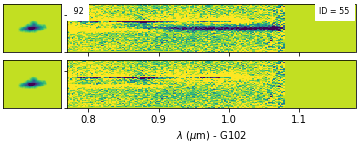

In [34]:
Image(filename='{0}_{1:05d}.stack.png'.format(root, id)) 

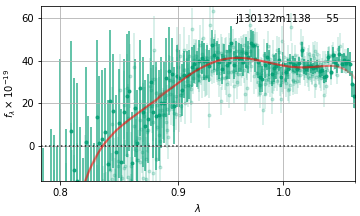

In [35]:
# 1D spectrum with polynomial model
Image(filename='{0}_{1:05d}.1D.png'.format(root, id)) 

### Redshift fit ###

The redshift fit is performed in the following steps:

* On a coarse redshift grid (dz/1+z ~ 0.005) fit continuum templates along with **line complex** templates for a) [OII]+[NeIII], b) [OIII]+Hbeta, and c) Halpha+[SII]+weaker red lines.  These line complexes have fixed line ratios but are useful for breaking redshift degeneracies as these lines do, usually, come in groups.  Leaving all line strengths free would allow for perfect degeneracy between, e.g., Halpha and [OII] (assuming no significant continuum features).

* Find peaks (minima) in the chi-squared on the coarse grid and zoom in on them now allowing for more freedom in the indifidual line strengths, as well as fitting on a fine redshift grid sufficient to resolve the best redshift.

**NB** Continuum templates are needed in the directory `${GRIZLI}/templates`.  The template names are currently hard-coded in [multifit.py](https://github.com/gbrammer/grizli/blob/master/grizli/multifit.py) and the easiest way to make them available is to symlink them from the `data/templates` directory that accompanies the `grizli` code distribution:


### Emission line maps ###

Once we've computed the full continuum + line model, we can create 2D *drizzled* maps at any desired output wavelength, for example to make emission line maps.  This makes use of the WCS information in the individual grism FLT exposures and the outputs can have any desired WCS (e.g., pixel scale & dimensions) and can be used to compare directly to imaging data.

The emission line maps are generated by subtracting the best-fit continuum model, assuming that the direct image is representative of the continuum morphology.  This should be a reasonable assumption for objects other than, perhaps, those with extreme line equivalent widths.


Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 446
Run 647
Run 418
Run 418
Run 418
Run 418
Run 662
Run 647
Run 657
Run 34
Run 90
Run 163
Run 199
Run 197
Run 205
Run 300
Run 364
Run 401
Run 631
Run 659
Run 10
Run 1
Run 12
Run 12
Run 2
Run 13
Run 5
Run 6
Run 6
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418
Run 418


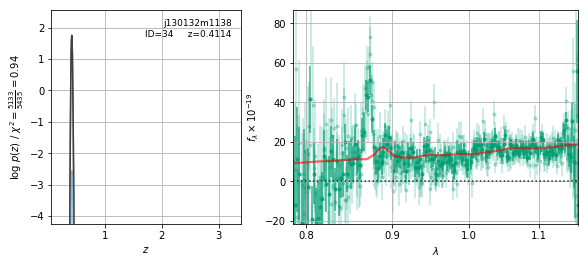

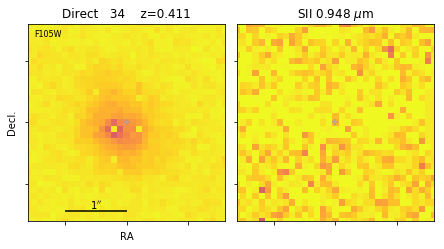

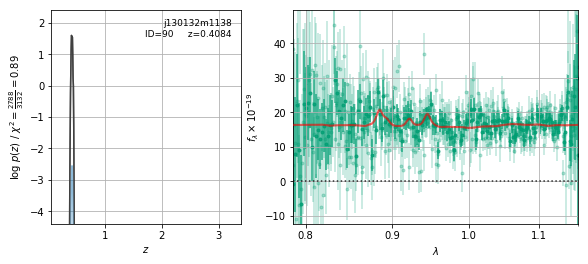

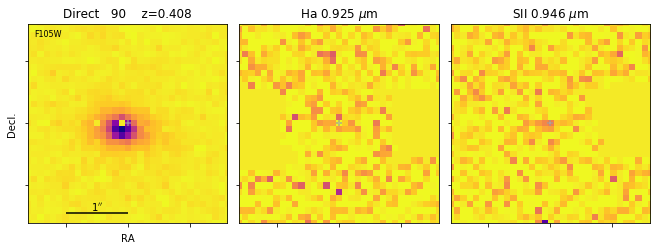

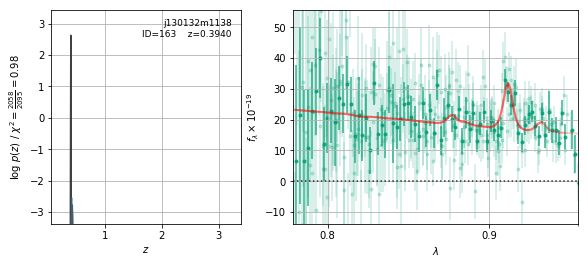

...

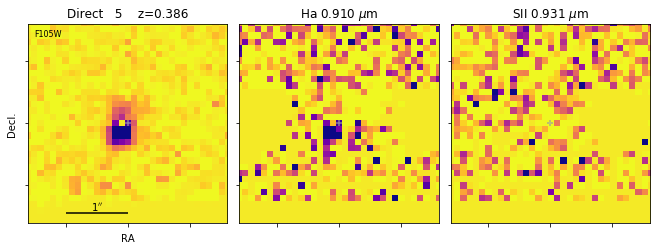

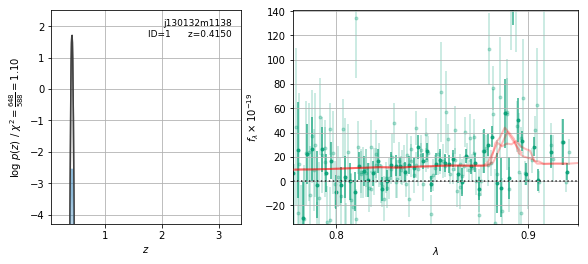

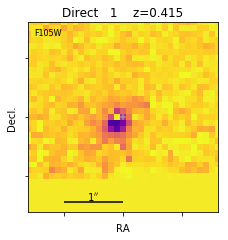

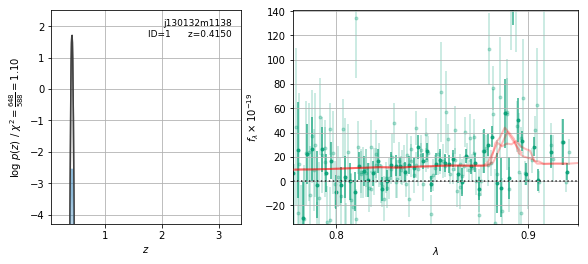

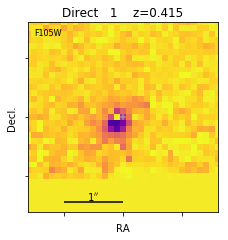

In [36]:
# Fit it.  The "run_all_parallel" function defaults to all of the parameters set in 'fit_args.npy'
for id_i in source_ids:
    fitting.run_all_parallel(id_i)
#fitting.run_all_parallel(id)

### Fit products ###

A number of files are produced that contain the results of the redshift fit.  The [`NewSpectrumFits.ipynb`](https://github.com/gbrammer/grizli/blob/master/examples/NewSpectrumFits.ipynb) notebook describes how to interact with these products in some greater detail.  

In [37]:
files = glob.glob('*{0:05d}*'.format(id))
for file in files:
    print(file)

j130132m1138_00055.stack.fits
j130132m1138_00055.log_par
j130132m1138_00055.full.fits
j130132m1138_00055.stack.png
j130132m1138_00055.beams.fits
j130132m1138_00055.1D.fits
j130132m1138_00055.full.png
j130132m1138_00055.1D.png
j130132m1138_00055.line.png


In [38]:
for file in files:
    if not file.endswith('.fits'):
        continue
        
    im = pyfits.open(file)
    print('\n\n{1}\n{0}\n{1}\n\n'.format(file, '='*len(file)))
    im.info()



j130132m1138_00055.stack.fits


Filename: j130132m1138_00055.stack.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      13   ()      
  1  SCI         G102,92.0 ImageHDU        54   (178, 64)   float32   
  2  WHT         G102,92.0 ImageHDU        22   (178, 64)   float32   
  3  CONTAM      G102,92.0 ImageHDU        22   (178, 64)   float32   
  4  MODEL       G102,92.0 ImageHDU        24   (178, 64)   float32   
  5  KERNEL      G102,92.0 ImageHDU        22   (64, 64)   float32   
  6  SCI         G102 ImageHDU        53   (178, 64)   float32   
  7  WHT         G102 ImageHDU        22   (178, 64)   float32   
  8  MODEL       G102 ImageHDU        24   (178, 64)   float32   
  9  KERNEL      G102 ImageHDU        22   (64, 64)   float32   


j130132m1138_00055.full.fits


Filename: j130132m1138_00055.full.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      38   ()      
  1  ZFIT_S

### Continuum-dominated spectra ###

The object below is the dominated by strong Balmer break and absorption lines (see [van Dokkum & Brammer 2010](http://adsabs.harvard.edu/abs/2010ApJ...718L..73V)).  The redshift fit and spectral constraints are precise even without any supporting photometric data.

In [39]:
# Continuum source
id=source_ids[1]
auto_script.extract(field_root=root, ids=[id], MW_EBV=tabs[0].meta['MW_EBV'], 
                    pline=pline, run_fit=False, grp=grp, diff=True)

0/1: 41 1
j130132m1138_00041.beams.fits


True

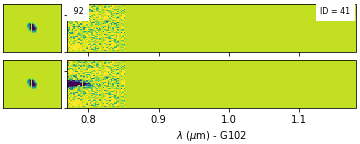

In [40]:
# Stacked 2D spectrum
Image(filename='{0}_{1:05d}.stack.png'.format(root, id)) 

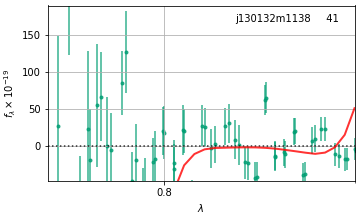

In [41]:
# 1D spectrum with polynomial model
Image(filename='{0}_{1:05d}.1D.png'.format(root, id)) 

Run 41


(41, 1, 4.232531309127808)

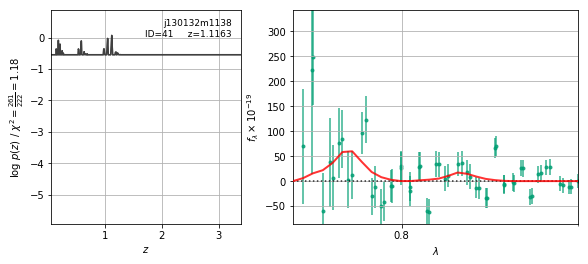

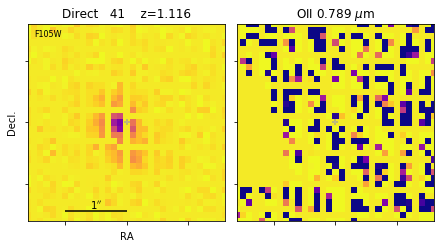

In [42]:
## Run the fit
fitting.run_all_parallel(id)

### Fit grism with photometry

Another option is fitting the grism spectra along with ancillary photometry, described here: [Fit-with-Photometry.ipynb](https://github.com/gbrammer/grizli/blob/master/examples/Fit-with-Photometry.ipynb).